In [1]:
import pandas as pd
print(pd.__version__)
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
import math

%matplotlib inline

0.22.0


In [2]:
import scattertext as st
import seaborn as sns
sns.set()

In [3]:
from sklearn.neighbors import NearestNeighbors
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture

In [4]:
from sklearn import mixture

In [5]:
from fuzzywuzzy import fuzz
from IPython.display import Image
import os

/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/fuzzywuzzy/fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


In [6]:
from nltk.stem.porter import PorterStemmer
from nltk.corpus import wordnet

In [7]:
PS = PorterStemmer()

## Constant variables

In [8]:
data_path = 'liquor_data_new.csv'
flavour_colums = ['f1', 'f2', 'f3', 'f4', 'f5', 'f6']

## Load data

In [9]:
def load_data(data_path):
    return pd.read_csv(data_path, encoding='utf-8', sep='\t')

In [10]:
df_initial = load_data(data_path)
df_initial.head()

,name,intl_name,brand_name,brand_intl_name,year_month,rank,score,f1,f2,f3,f4,f5,f6,flavour_tags,checkin_count,pictures,similar_brands,id,similar_brand_taste
0,上川大雪,Kamikawataisetsu,北海道,Hokkaido,202001,1,4.299969,0.516103,0.484763,0.203029,0.419481,0.276085,0.453028,|グイグイ|メロン|フレッシュ|上品|丸み|フルーティ|旨味|甘味|酸味|マスカット|ガス|...,117,https://s3-ap-northeast-1.amazonaws.com/physal...,加茂錦|而今|陸奥八仙|宮寒梅|十四代,8685,上川大雪|東洋美人|十四代|冩楽|笑四季|Ohmine Junmai|川中島|豊明|至|一白水成
1,國稀,Kunimare,北海道,Hokkaido,202001,2,4.099463,0.187750,0.304858,0.417155,0.539935,0.527491,0.357793,|辛口|蜜|スッキリ|力強い|旨味|ゴクゴク|洋梨|若い|じっくり|薄い|円やか|ちびちび|...,210,https://s3-ap-northeast-1.amazonaws.com/physal...,月山|黒牛|龍力|谷川岳|春鹿,1928,國稀|黎明|越前岬|鷹来屋|宮の雪|初孫|住吉|春鶯囀|長良川|辰泉
2,男山,Otokoyama,北海道,Hokkaido,202001,3,4.095614,0.277607,0.394435,0.327092,0.520835,0.454270,0.427476,|辛口|酸味|甘味|旨味|スッキリ|冷酒|常温|ヨーグルト|ヤクルト|熱燗|ひろがる|バラン...,397,https://s3-ap-northeast-1.amazonaws.com/physal...,春鹿|まんさくの花|酔鯨|加賀鳶|いづみ橋,2,男山|八海山|喜楽長|杉勇|神聖|大那|如空|千代むすび|七冠馬|白隠正宗
3,国士無双,Kokushimuso,北海道,Hokkaido,202001,4,4.079436,0.387998,0.256487,0.161930,0.372511,0.593511,0.516169,|辛口|洋梨|ピリリ|フルーティ|荒々しい|スパイシー|さらり|果物|酸味|さわやか|スイス...,208,https://s3-ap-northeast-1.amazonaws.com/physal...,上喜元|酔心|澤乃井|加賀鳶|司牡丹,10,国士無双|真野鶴|無想|藍の郷|あら玉|福祝|幻の瀧|高清水|きりんざん|北光正宗
4,北の錦,Kitanonishiki,北海道,Hokkaido,202001,5,4.055023,0.344262,0.393210,0.501239,0.564264,0.211910,0.335154,|とろみ|荒々しい|力強い|ほのか|薄い|トロピカル|ヨーグルト|濃厚|苦味|チーズ|旨味|...,85,https://s3-ap-northeast-1.amazonaws.com/physal...,誠鏡|原田|龍力|旦|天の戸,11,北の錦|爛漫|木戸泉|松みどり|芳水|千福|玉櫻|磐城壽|豊久仁|喜久酔


In [11]:
# df_initial['id'] = df_initial.index.values

In [12]:
df_initial['f_mean'] = df_initial[flavour_colums].mean(axis=1)
df_initial['flavour_tags'] = df_initial['flavour_tags'].str.replace('|', ' ')
# df_initial['flavour_tags'] = df_initial['flavour_tags'].str.replace('|', ' ')

In [13]:
df_initial[df_initial.f1.notnull() & df_initial.similar_brand_taste.isnull()]

,name,intl_name,brand_name,brand_intl_name,year_month,rank,score,f1,f2,f3,f4,f5,f6,flavour_tags,checkin_count,pictures,similar_brands,id,similar_brand_taste,f_mean


In [14]:
tab_infor = pd.DataFrame(df_initial.dtypes).T.rename(index={0: "column type"})
tab_infor = tab_infor.append(pd.DataFrame(df_initial.isnull().sum(axis=0)).T.rename(index={0: "Number of null records"}))
tab_infor = tab_infor.append(pd.DataFrame(df_initial.isnull().sum(axis=0) * 100 / df_initial.shape[0]).T.rename(index={0: "Percent of null records"}))

In [15]:
tab_infor

,name,intl_name,brand_name,brand_intl_name,year_month,rank,score,f1,f2,f3,f4,f5,f6,flavour_tags,checkin_count,pictures,similar_brands,id,similar_brand_taste,f_mean
column type,object,object,object,object,int64,int64,float64,float64,float64,float64,float64,float64,float64,object,int64,object,object,int64,object,float64
Number of null records,0,144,0,0,0,0,0,326,326,326,326,326,326,19,0,1,126,0,326,326
Percent of null records,0,13.4328,0,0,0,0,0,30.4104,30.4104,30.4104,30.4104,30.4104,30.4104,1.77239,0,0.0932836,11.7537,0,30.4104,30.4104


## Data Exploration

In [16]:
df_missing_infor = pd.DataFrame(df_initial.isnull().sum(axis=0)).reset_index()
df_missing_infor.columns = ['column name', 'missing count']
df_missing_infor['missing percent'] = ((df_initial.shape[0] - df_missing_infor['missing count']) / df_initial.shape[0]) * 100
df_missing_infor

,column name,missing count,missing percent
0,name,0,100.000000
1,intl_name,144,86.567164
2,brand_name,0,100.000000
3,brand_intl_name,0,100.000000
4,year_month,0,100.000000
5,rank,0,100.000000
6,score,0,100.000000
7,f1,326,69.589552
8,f2,326,69.589552
9,f3,326,69.589552


## Data cleaning

In [17]:
key_tags = set()

for tags in df_initial['flavour_tags']:
    if tags is None or isinstance(tags, float): continue
    key_tags = key_tags.union(tags.split('|'))

In [18]:
key_tags = [s for s in key_tags if s]

In [19]:
def count_words(df, colone):
    key_counts = dict()
    key_occurence = []
    
    for s in key_tags:
        key_counts[s] = 0
    
    for row in df[colone]:
        if row is None or isinstance(row, float): continue
        for s in row.split('|'):
            if s in key_counts.keys(): key_counts[s] += 1
            else: key_counts[s] = 0
    
    for (k, v) in key_counts.items():
        key_occurence.append([k, v])
    key_occurence.sort(key = lambda x: x[1], reverse=True)
    
    return key_counts, key_occurence

In [20]:
key_counts, key_occurence = count_words(df_initial, 'flavour_tags')

In [21]:
brand_nan = []

In [22]:
def remove_nan_similar_brands(df):
    brand_nan = []
    df_new = df.copy()
    
    for idx, row in df_new.iterrows():
        similar_brand_taste = row.similar_brand_taste
        if pd.isnull(similar_brand_taste): continue
        
        similar_brand_taste = similar_brand_taste.split("|")
        for b_name in similar_brand_taste:
            record = df_new[df_new.name == b_name]
            f1 = record.f1.values
            
            if len(f1) == 0 or pd.isnull(f1[0]):
                if b_name not in brand_nan: brand_nan.append(b_name)

    return brand_nan

In [23]:
brand_nan = remove_nan_similar_brands(df_initial)

In [24]:
len(brand_nan)

125

In [25]:
def replace_similar_brand(df, brand_nan):
    df_new = df.copy()
    
    for idx, row in df_new.iterrows():
        similar_brand_taste = row.similar_brand_taste
        if pd.isnull(similar_brand_taste): continue
            
        similar_brand_taste = similar_brand_taste.split("|")
        replacent = []
        
        for b_name in similar_brand_taste:
            if b_name not in brand_nan: 
                replacent.append(b_name)
        
        df_new.at[idx, "similar_brand_taste"] = "|".join(replacent)
    
    return df_new

In [26]:
df_remove_nan_brands = replace_similar_brand(df_initial, brand_nan)

In [27]:
# df_nan_cleared = df_remove_nan_brands[df_remove_nan_brands.f1.notnull()].reset_index()
# df_nan_cleared.shape
df_remove_nan_brands.shape

(1072, 20)

In [28]:
def keytag_inventory(df, column='flavour_tags'):
    key_root = dict()
    key_select = dict()
    category_key = []
    
    for row in df[column]:
        if row is None or isinstance(row, float): continue
        
        for s in row.split('|'):
            if len(s) == 0: continue
            racine = PS.stem(s)
            
            if racine in key_root.keys():
                key_root[racine].add(s)
            else:
                key_root[racine] = {s}

    for s in key_root.keys():
        min_length = 1000
        
        for v in key_root[s]:
            if len(key_root[s]) > 1:
                if len(v) < min_length:
                    min_length = len(v)
                    ref = v
            else:
                ref = v
        category_key.append(ref)
        key_select[s] = ref
    
    return key_select, key_root, category_key

In [31]:
key_select, key_root, category_key = keytag_inventory(df_remove_nan_brands)

In [32]:
def keytag_replacement(df, key_select, root=False, column='flavour_tags'):
    df_new = df.copy()
    
    for index, row in df_new.iterrows():
        flavour_tags = row[column]
        
        if pd.isnull(flavour_tags): continue
        row_data = []
        for s in flavour_tags.split('|'):
            racine = PS.stem(s) if root else s
            
            if racine is key_select.keys():
                row_data.append(key_select[racine])
            else:
                row_data.append(s)
                
        df_new.at[index, column] = '|'.join(row_data)
    return df_new

In [33]:
df_keywords_cleaned = keytag_replacement(df_remove_nan_brands, key_select, root=True)

In [34]:
key_counts, key_occurence = count_words(df_initial, 'flavour_tags')

## Duplicate value

In [35]:
df_duplicate = df_keywords_cleaned[df_keywords_cleaned['name'].map(df_keywords_cleaned.name.value_counts() > 1)]

In [36]:
df_duplicate.shape

(62, 20)

## Filling missing data

In [92]:
df_keywords_cleaned[df_keywords_cleaned.name == "能古見"]

,name,intl_name,brand_name,brand_intl_name,year_month,rank,score,f1,f2,f3,f4,f5,f6,flavour_tags,checkin_count,pictures,similar_brands,id,similar_brand_taste,f_mean
1039,能古見,Nogomi,佐賀県,Saga,202001,13,4.006612,NaN,NaN,NaN,NaN,NaN,NaN,まったり キレ フレッシュ 旨味 濃厚 酸味 しっかり,30,https://s3-ap-northeast-1.amazonaws.com/physal...,NaN,1211,NaN,NaN


In [38]:
def sequel(string_1, string_2):
    if pd.isnull(string_1): return False
    return (fuzz.ratio(string_1, string_2) >= 70 or fuzz.token_sort_ratio(string_1, string_2) >= 70)

In [39]:
df_missing_f = df_keywords_cleaned[df_keywords_cleaned.f1.isnull() & df_keywords_cleaned.flavour_tags.notnull()]

In [41]:
df_missing_f.head()

,name,intl_name,brand_name,brand_intl_name,year_month,rank,score,f1,f2,f3,f4,f5,f6,flavour_tags,checkin_count,pictures,similar_brands,id,similar_brand_taste,f_mean
7,北の勝,Kitanokatsu,北海道,Hokkaido,202001,8,4.024530,NaN,NaN,NaN,NaN,NaN,NaN,マイルド フレッシュ 花 豊か キレ フルーティ ガス スッキリ 軽快 辛口 甘味 バラン...,63,https://s3-ap-northeast-1.amazonaws.com/physal...,墨廼江|加茂錦|繁枡|大信州|土佐しらぎく,1562,NaN,NaN
10,大雪乃蔵,Taisetsunokura,北海道,Hokkaido,202001,11,4.011490,NaN,NaN,NaN,NaN,NaN,NaN,丸み 優しい スイスイ 辛口 旨味 キリリ さわやか フレッシュ 華やか バランス 常温 ...,50,https://s3-ap-northeast-1.amazonaws.com/physal...,若竹|臥龍梅|あさ開|谷川岳|きりんざん,3,NaN,NaN
11,風のささやき,Kazenosasayaki,北海道,Hokkaido,202001,12,4.011301,NaN,NaN,NaN,NaN,NaN,NaN,さらり 優しい 軽快 常温 さっぱり 辛口 旨味 スッキリ 酸味,14,https://s3-ap-northeast-1.amazonaws.com/physal...,NaN,8,NaN,NaN
12,十一州,NaN,北海道,Hokkaido,202001,13,4.009420,NaN,NaN,NaN,NaN,NaN,NaN,昔ながら 控えめ 甘味 穏やか 常温 さっぱり 上品 キリリ 苦味 軽快 余韻 フルーティ...,44,https://s3-ap-northeast-1.amazonaws.com/physal...,松みどり|聖泉|田酒|黎明|豊盃,2309,NaN,NaN
13,まる田,Maruta,北海道,Hokkaido,202001,14,4.009420,NaN,NaN,NaN,NaN,NaN,NaN,あっさり コク 薄い さらり 熱燗 上品 バランス キレ 常温 濃厚 スッキリ 酸味 しっ...,20,https://s3-ap-northeast-1.amazonaws.com/physal...,湊屋藤助|ん|大七|天領|義侠,1275,NaN,NaN


In [42]:
def filling_data(df, df_missing):
    df_new = df.copy()
    
    for idx, row in df_missing.iterrows():
        flavour_tags = row['flavour_tags']
        group_data = df_new[df_new['flavour_tags'].apply(lambda x: sequel(x, flavour_tags))]
        mean_f1 = group_data['f1'].mean()
        if pd.isnull(mean_f1): continue
            
        mean_f2 = group_data['f2'].mean()
        mean_f3 = group_data['f3'].mean()
        mean_f4 = group_data['f4'].mean()      
        mean_f5 = group_data['f5'].mean()
        mean_f6 = group_data['f6'].mean()
        
        group_similar_taste = []
        similar_brand_taste = group_data['similar_brand_taste'].values
        
#         print(similar_brand_taste)
#         break
        for sbt in similar_brand_taste:
            if pd.notnull(sbt):
                for it in sbt.split("|"):
                    if it not in group_similar_taste: group_similar_taste.append(it)
        
        df_new.at[idx, "f1"] = mean_f1
        df_new.at[idx, "f2"] = mean_f2
        df_new.at[idx, "f3"] = mean_f3
        df_new.at[idx, "f4"] = mean_f4
        df_new.at[idx, "f5"] = mean_f5
        df_new.at[idx, "f6"] = mean_f6
        df_new.at[idx, "similar_brand_taste"] = "|".join(group_similar_taste)
            
    return df_new

In [139]:
# df_filling = filling_data(df_keywords_cleaned, df_missing_f)
df_filling = df_keywords_cleaned

In [140]:
# int(len(df_filling)/10) - 8

In [141]:
df_nan_cleared = df_filling[df_filling.f1.notnull()].reset_index()
df_nan_cleared.shape

(746, 21)

## Implement algorithm

In [142]:
flavour_matrix = df_nan_cleared.as_matrix(flavour_colums)

In [143]:
gausian_filter = lambda x,y,sigma: math.exp(-(x-y)**2/(2*sigma**2))

In [230]:
n_clusters = 76
gauss_mixture = GaussianMixture(n_components=n_clusters, covariance_type='full').fit(flavour_matrix)
labels = gauss_mixture.predict(flavour_matrix)
df_nan_cleared['cluster'] = labels

In [231]:
df_nan_cleared.shape

(746, 22)

In [146]:
# import itertools
# from scipy import linalg
# import matplotlib as mpl

# lowest_bic = np.infty
# bic = []
# n_components_range = range(100, 115)
# cv_types = ['spherical', 'tied', 'diag', 'full']
# for cv_type in cv_types:
#     for n_components in n_components_range:
#         # Fit a mixture of Gaussians with EM
#         gmm = GaussianMixture(n_components=n_components, covariance_type=cv_type)
#         gmm.fit(flavour_matrix)
#         bic.append(gmm.bic(flavour_matrix))
#         if bic[-1] < lowest_bic:
#             lowest_bic = bic[-1]
#             best_gmm = gmm

# bic = np.array(bic)
# color_iter = itertools.cycle(['k', 'r', 'g', 'b', 'c', 'm', 'y'])
# clf = best_gmm
# bars = []

# # Plot the BIC scores
# plt.figure(figsize=(8, 6))
# spl = plt.subplot(2, 1, 1)
# # plt.rcParams['figure.figsize'] = [1, 1]
# for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
#     xpos = np.array(n_components_range) + .2 * (i - 2)
#     bars.append(plt.bar(xpos, bic[i * len(n_components_range):
#                                   (i + 1) * len(n_components_range)],
#                         width=.2, color=color))
# plt.xticks(n_components_range)
# plt.ylim([bic.min() * 1.01 - .01 * bic.max(), bic.max()])
# plt.title('BIC score per model')
# xpos = np.mod(bic.argmin(), len(n_components_range)) + .65 +\
#     .2 * np.floor(bic.argmin() / len(n_components_range))
# plt.text(xpos, bic.min() * 0.97 + .03 * bic.max(), '*', fontsize=14)
# spl.set_xlabel('Number of components')
# spl.legend([b[0] for b in bars], cv_types)

In [147]:
# def plot_data(data):
#     labels = gauss_mixture.predict(data)
#     df_new = pd.DataFrame(data)
#     df_new['cluster'] = labels
    
#     color=[np.random.randint(0, 255) for _ in range(n_clusters)]
#     print(color)
#     for k in range(0, n_clusters):
#         data = df_new[df_new["cluster"]==k]
#         plt.scatter(data[3], data[4], c=color[k], cmap='True')
#     plt.show()

In [148]:
# plot_data(flavour_matrix)

In [149]:
def calculate_sigma(list_flavour_taste):
    mean = np.mean(list_flavour_taste)
    
    sigma_hat = 0
    for i, value in enumerate(list_flavour_taste):
        sigma_hat += (value - mean)**2
    
    return float(math.sqrt(sigma_hat/len(list_flavour_taste)))

In [150]:
def compare_flavour_tags(tag_1, tag_2):
    if pd.isnull(tag_1) or pd.isnull(tag_2): return 0
    
    tag_1 = tag_1.split(' ')
    tag_2 = tag_2.split(' ')
    
    count = 0
    for i in tag_1:
        if i in tag_2:
            count += 1
            
    return float(count/len(tag_1))

In [151]:
def criteria_selection(f1_m, f2_m, f3_m, f4_m, f5_m, f6_m,
                       f1_c, f2_c, f3_c, f4_c, f5_c, f6_c,
                       sigma_1, sigma_2, sigma_3, sigma_4, sigma_5, sigma_6,
                       flavour_tags_m, flavour_tags_c):
    fc_1 = gausian_filter(f1_m, f1_c, sigma_1)
    fc_2 = gausian_filter(f2_m, f2_c, sigma_2)
    fc_3 = gausian_filter(f3_m, f3_c, sigma_3)
    fc_4 = gausian_filter(f4_m, f4_c, sigma_4)
    fc_5 = gausian_filter(f5_m, f5_c, sigma_5)
    fc_6 = gausian_filter(f6_m, f6_c, sigma_6)
    fc_7 = fuzz.token_sort_ratio(flavour_tags_m, flavour_tags_c)/100
    print('fc1-6 ---- {} --- {}'.format(fc_1 + fc_2 + fc_3 + fc_4 + fc_5 + fc_6, fc_7))
    
    return (fc_1 + fc_2 + fc_3 + fc_4 + fc_5 + fc_6) + fc_7

In [152]:
def recommand(df, entry_id):
    entry = df.iloc[entry_id]
    cluster = entry.cluster
    data = df[df.cluster == cluster]
    flavour_value = data[flavour_colums]
    flavour_tags = data['flavour_tags']
    
    sigma_1 = calculate_sigma(flavour_value['f1'])
    sigma_2 = calculate_sigma(flavour_value['f2'])
    sigma_3 = calculate_sigma(flavour_value['f3'])
    sigma_4 = calculate_sigma(flavour_value['f4'])
    sigma_5 = calculate_sigma(flavour_value['f5'])
    sigma_6 = calculate_sigma(flavour_value['f6'])
    
    flavour_list = list(data.as_matrix(np.concatenate([flavour_colums, ['flavour_tags', 'pictures', 'name']])))
    m_item = entry[flavour_colums]
    f1_m, f2_m, f3_m, f4_m, f5_m, f6_m = m_item[0], m_item[1], m_item[2], m_item[3], m_item[4], m_item[5]
    flavour_tags_m = entry['flavour_tags']
#     print(flavour_list[:, 8])
    flavour_list.sort(key=lambda x: criteria_selection(f1_m, f2_m, f3_m, f4_m, f5_m, f6_m,
                                                       x[0], x[1], x[2], x[3], x[4], x[5],
                                                       sigma_1, sigma_2, sigma_3, sigma_4, sigma_5, sigma_6,
                                                       flavour_tags_m, x[6]),
                                                       reverse=True)
    
    return flavour_list[:10]

In [153]:
def plot_results(liquor_main, liquor_compared):
    index = np.arange(6)
    bar_width = 0.35
    
    j = {idx: [x[0], x[1], x[2], x[3], x[4], x[5]] 
         for idx, x in enumerate([liquor_main, liquor_compared])}
    df = pd.DataFrame(j)
    print(df)
    
    fig, ax = plt.subplots()
    
    main = ax.bar(index, list(df[0]), bar_width, label="Main")
    compared = ax.bar(index+bar_width, list(df[1]), bar_width, label="Compare")
    
    ax.set_xlabel('Flavour tags')
    ax.set_ylabel('Values')
    ax.set_title('Compare result')
    ax.set_xticks(index + bar_width / 2)
    ax.set_xticklabels(['f1', 'f2', 'f3', 'f4', 'f5', 'f6'])
    ax.legend()
    
    plt.show()

In [154]:
image_path = 'Image_Results'
if not os.path.exists(image_path):
    os.mkdir(image_path)

In [155]:
# !pip install scikit-image 

In [156]:
from PIL import Image
import requests
from io import BytesIO
# from scipy.misc import toimage
from PIL import Image

def display_img_array(url, img_dir):
#     im = PIL.Image.fromarray(ima)
#     bio = BytesIO()
#     im.save(bio, format='png')
#     print(ima)
    try:
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        img_arr = np.array(img)
        im = Image.fromarray(img_arr)
#         im.save('{}/{}.png'.format(img_dir, url.split('/')[-1]))
        plt.imshow(img)
        plt.show()
    except:
        pass

# for ima in images:
#     display_img_array(ima)

def plot_image_results(results):
    img_des = 'Image_Results/{}'.format(results[0][8])
#     if not os.path.exists(img_des):
#         os.mkdir(img_des)
    
    for idx, row in enumerate(results):
        pictures = row[7].split('|')
        if len(pictures) == 0: continue
        print('------{}-------'.format(row[8]))
        
        for p in pictures:
            display_img_array(p, img_des)

In [157]:
# def compare_flavour_tags(str_1, str_2):
#     return fuzz.token_sort_ratio(str_1, str_2)

In [158]:
# lq1 = df_nan_cleared[df_nan_cleared.name == "燦然"]
# lq1

In [159]:
# lq2 = df_nan_cleared[df_nan_cleared.name == "玉乃光"]
# lq2

In [160]:
# lq3 = df_nan_cleared[df_nan_cleared.name == "聖"]
# lq3

In [161]:
# plot_results(lq1[flavour_colums].values[0], lq2[flavour_colums].values[0])
# plot_results(lq1[flavour_colums].values[0], lq3[flavour_colums].values[0])

In [162]:
# x = df_initial[df_initial.name == "肥前蔵心"].flavour_tags.values[0]
# y = df_nan_cleared[df_nan_cleared.name == "豊潤"].flavour_tags.values[0]

# compare_flavour_tags(x, y)

In [238]:
from random import randint
import time

time_start = time.time()
entry_id = randint(0, len(df_nan_cleared))
# entry_id = 684
results = recommand(df_nan_cleared, entry_id)
print('Time query ---- {}'.format(time.time() - time_start))

fc1-6 ---- 2.9567134006926903 --- 0.31
fc1-6 ---- 3.569015032980295 --- 0.46
fc1-6 ---- 3.060799888789088 --- 0.17
fc1-6 ---- 2.274546276200347 --- 0.28
fc1-6 ---- 5.067851952623438 --- 0.37
fc1-6 ---- 3.4830163057626438 --- 0.43
fc1-6 ---- 2.9849726100326985 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8908755146496152 --- 0.48
fc1-6 ---- 4.397387602636006 --- 0.41
fc1-6 ---- 2.7540119234076315 --- 0.32
fc1-6 ---- 3.464212658042804 --- 0.42
fc1-6 ---- 4.048161507830756 --- 0.2
fc1-6 ---- 4.719629003102443 --- 0.38
fc1-6 ---- 3.0714736079280978 --- 0.4
Time query ---- 0.01410818099975586


In [239]:
# results[0]

In [240]:
[i[8] for i in results]

['結人', '雅山流', '海風土', '信州亀齢', '甲子正宗', '美和桜', '花邑', '三百年の掟やぶり', '風の森', '豊の梅']

In [241]:
[compare_flavour_tags(i[6], results[0][6]) for i in results]

[1.0,
 0.3333333333333333,
 0.23809523809523808,
 0.23809523809523808,
 0.3333333333333333,
 0.14285714285714285,
 0.2857142857142857,
 0.3333333333333333,
 0.3333333333333333,
 0.23809523809523808]

          0         1
0  0.618672  0.618672
1  0.230683  0.230683
2  0.123158  0.123158
3  0.177930  0.177930
4  0.366047  0.366047
5  0.619042  0.619042


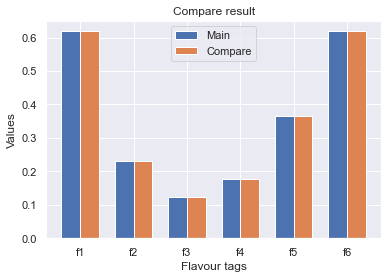

          0         1
0  0.618672  0.627597
1  0.230683  0.272644
2  0.123158  0.129244
3  0.177930  0.227484
4  0.366047  0.332754
5  0.619042  0.593809


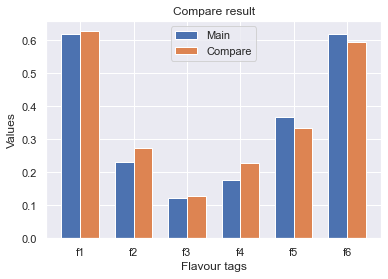

          0         1
0  0.618672  0.583222
1  0.230683  0.233455
2  0.123158  0.093907
3  0.177930  0.160330
4  0.366047  0.343845
5  0.619042  0.672753


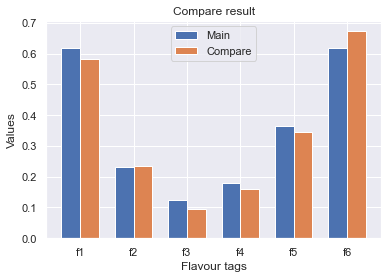

          0         1
0  0.618672  0.571978
1  0.230683  0.257108
2  0.123158  0.134179
3  0.177930  0.290451
4  0.366047  0.359549
5  0.619042  0.612451


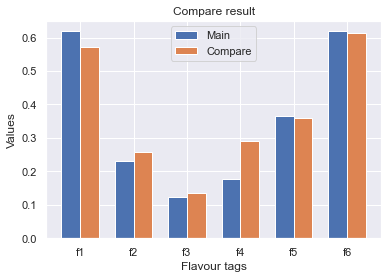

          0         1
0  0.618672  0.606731
1  0.230683  0.235624
2  0.123158  0.166309
3  0.177930  0.266538
4  0.366047  0.411698
5  0.619042  0.555123


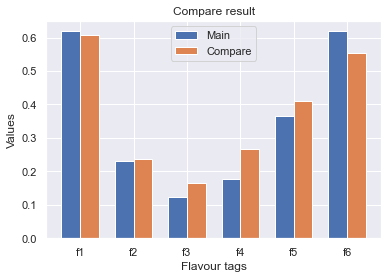

          0         1
0  0.618672  0.606764
1  0.230683  0.183545
2  0.123158  0.024967
3  0.177930  0.263722
4  0.366047  0.377687
5  0.619042  0.620748


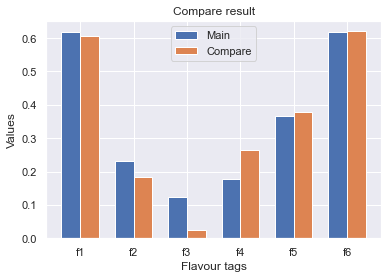

          0         1
0  0.618672  0.604991
1  0.230683  0.286818
2  0.123158  0.147817
3  0.177930  0.300620
4  0.366047  0.388021
5  0.619042  0.537530


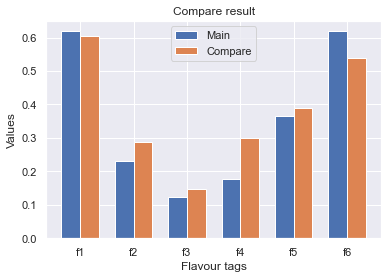

          0         1
0  0.618672  0.556732
1  0.230683  0.368062
2  0.123158  0.112854
3  0.177930  0.247230
4  0.366047  0.327931
5  0.619042  0.610886


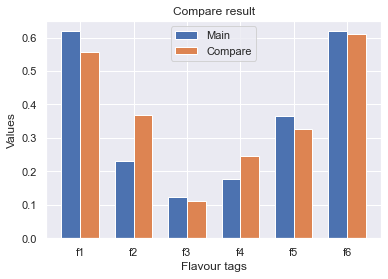

          0         1
0  0.618672  0.604654
1  0.230683  0.305040
2  0.123158  0.200202
3  0.177930  0.222330
4  0.366047  0.253869
5  0.619042  0.622401


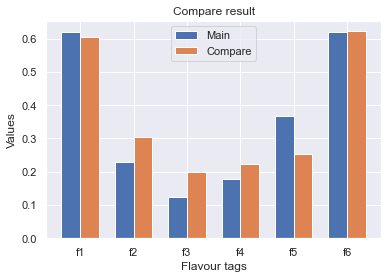

          0         1
0  0.618672  0.588855
1  0.230683  0.311126
2  0.123158  0.103197
3  0.177930  0.305579
4  0.366047  0.232647
5  0.619042  0.631108


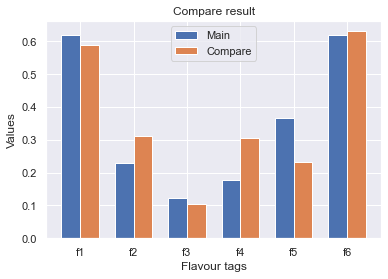

In [242]:
entry_record = df_nan_cleared.iloc[entry_id]
liquor_main = entry_record[flavour_colums]

for idx, row in enumerate(results):
#     if idx == 0: continue
    liquor_compared = row
    plot_results(liquor_main, liquor_compared)

In [243]:
def compare_with_sakenowa(list_str_products):
    results = []
    
    for i in list_str_products:
        liquor = df_nan_cleared[df_nan_cleared.name == i]
        results.append(liquor[flavour_colums].values[0])
        
    for i in results:
        plot_results(results[0], i)

In [244]:
# list_str_products = ['玉乃光', '龍力', '北雪', '一ノ蔵', '東北泉', '奥']

# compare_with_sakenowa(list_str_products)

In [245]:
def compare_similar_percent(entry_record, results):
    similar_brands = entry_record.similar_brand_taste
    if pd.isnull(similar_brands): return 0
    similar_brands = similar_brands.split('|')
    print(similar_brands)
#     similar_brands = similar_brands.replace('|', ' ')
#     similar_brands = ",".join(similar_brands)
    similar_brands_result = [i[8] for i in results]
    print(similar_brands_result)
    
    count = 0
    for i in similar_brands_result:
        if i in similar_brands: count += 1
    
    total = len(similar_brands)
    if len(similar_brands_result) >= 1 and len(similar_brands_result) < total:
        total = len(similar_brands_result)
    
    return count/total

In [246]:
df_nan_cleared[df_nan_cleared.f1.notnull() & df_nan_cleared.similar_brand_taste.isnull()].shape

(0, 22)

In [247]:
compare_similar_percent(entry_record, results)

['結人', '海風土', '雅山流', '美和桜', '咲耶美', '甲子正宗', 'Michelle', '風の森', '信州亀齢']
['結人', '雅山流', '海風土', '信州亀齢', '甲子正宗', '美和桜', '花邑', '三百年の掟やぶり', '風の森', '豊の梅']


0.7777777777777778

In [248]:
# df_initial[df_initial.name == 'MELLOW']

In [249]:
def compare_similar_percent_all_records():
    sum_percent = 0.0
    sum_similars = 0
    count = 0
    
    for i in df_nan_cleared.index.values:
        _results = recommand(df_nan_cleared, i)
        entry_r = df_nan_cleared.iloc[i]
        if not pd.isnull(entry_r.similar_brand_taste): count+=1
        sum_percent += compare_similar_percent(entry_r, _results)
    
#     sum_percent = sum_similars/(5*len(df_nan_cleared))
    return sum_percent*100/count

In [250]:
compare_similar_percent_all_records()

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8556740808042775 --- 0.62
fc1-6 ---- 5.039379257872371 --- 0.65
fc1-6 ---- 2.8320593317925153 --- 0.5
fc1-6 ---- 3.016169740841492 --- 0.31
fc1-6 ---- 1.8382188326185933 --- 0.56
fc1-6 ---- 2.6829225944635264 --- 0.56
fc1-6 ---- 2.26230708237098 --- 0.59
fc1-6 ---- 3.0499752268374056 --- 0.64
fc1-6 ---- 3.9812564497205436 --- 0.43
fc1-6 ---- 3.990499934175843 --- 0.57
fc1-6 ---- 3.4896110748119358 --- 0.51
fc1-6 ---- 3.5618378259323102 --- 0.52
fc1-6 ---- 4.068501211377521 --- 0.55
fc1-6 ---- 2.9231070991784702 --- 0.37
fc1-6 ---- 1.850513529158555 --- 0.51
fc1-6 ---- 3.9064141959082668 --- 0.43
fc1-6 ---- 2.184784270596519 --- 0.46
fc1-6 ---- 1.9296615326741249 --- 0.43
fc1-6 ---- 3.8780294504858346 --- 0.64
fc1-6 ---- 3.2289989818643825 --- 0.4
fc1-6 ---- 4.4856792206894305 --- 0.63
fc1-6 ---- 2.2709536923967106 --- 0.54
fc1-6 ---- 4.14625067752513 --- 0.54
fc1-6 ---- 1.7559786284647503 --- 0.55
fc1-6 ---- 3.9730832375035243 --- 0.42
['上川大雪', '東洋美人

fc1-6 ---- 3.336041856405285 --- 0.38
fc1-6 ---- 4.03703376673278 --- 0.43
fc1-6 ---- 3.265879803708466 --- 0.44
fc1-6 ---- 3.563531822757219 --- 0.49
fc1-6 ---- 3.6497441684239442 --- 0.45
fc1-6 ---- 3.581719011574929 --- 0.35
fc1-6 ---- 1.7695907267161062 --- 0.38
fc1-6 ---- 5.283468643985435 --- 0.46
fc1-6 ---- 4.299098496204554 --- 0.32
fc1-6 ---- 4.41555367282856 --- 0.38
fc1-6 ---- 2.09453983412767 --- 0.51
fc1-6 ---- 3.9066663315911847 --- 0.24
['じょっぱり', '翠露', '春鹿', '浜福鶴', '月山', '福祝', 'きりんざん', '飛露喜', 'こんな夜に…', '真澄']
['じょっぱり', '春鹿', '月山', '百楽門', '久保田', '三井の寿', '瀧澤', '真澄', '菊正宗', '三十六人衆']
fc1-6 ---- 3.2028142255508394 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8319320405121684 --- 0.47
fc1-6 ---- 4.492052353908267 --- 0.52
fc1-6 ---- 4.384931702958822 --- 0.42
fc1-6 ---- 2.771019112429957 --- 0.49
fc1-6 ---- 3.3291243121210714 --- 0.32
fc1-6 ---- 4.564365206114602 --- 0.46
fc1-6 ---- 3.7156618845751193 --- 0.4
fc1-6 ---- 4.441973750170456 --- 0.42
fc1-6 ---- 3.2083222895799253 -

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.191027544412854 --- 0.54
fc1-6 ---- 3.3563067278776053 --- 0.49
fc1-6 ---- 2.1880604251685676 --- 0.41
fc1-6 ---- 3.1860875021431205 --- 0.59
fc1-6 ---- 2.7504123853059923 --- 0.49
fc1-6 ---- 3.306305523582728 --- 0.28
fc1-6 ---- 2.324642035188826 --- 0.43
fc1-6 ---- 2.1748908774142004 --- 0.47
fc1-6 ---- 3.436108316814521 --- 0.47
fc1-6 ---- 2.4902901616701767 --- 0.45
fc1-6 ---- 4.445969091914397 --- 0.31
fc1-6 ---- 3.4991431255705754 --- 0.42
fc1-6 ---- 3.3152372417889717 --- 0.35
['月の輪', '初亀', '九頭龍', '仁勇', '両関', '聚楽第', '太平山', '日本盛', '白鴻', '東光']
['月の輪', '白鴻', '豊潤', '燦然', '山形正宗', '五凛', '両関', '薩州正宗', '渓流', '九頭龍']
fc1-6 ---- 3.7547299596150236 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.85161588116398 --- 0.48
fc1-6 ---- 4.282322914164599 --- 0.44
fc1-6 ---- 3.1903915364397406 --- 0.41
fc1-6 ---- 4.108883639234722 --- 0.42
fc1-6 ---- 3.1194275864982295 --- 0.4
fc1-6 ---- 3.8482299113987652 --- 0.47
fc1-6 ---- 2.0770460164704714 --- 0.35
fc1-6 ---- 4

fc1-6 ---- 3.953695798471803 --- 0.45
fc1-6 ---- 3.6107242906259107 --- 0.45
fc1-6 ---- 3.518523832457989 --- 0.47
fc1-6 ---- 4.555452513854066 --- 0.56
fc1-6 ---- 3.3500271360978005 --- 0.48
fc1-6 ---- 4.199537773857737 --- 0.35
fc1-6 ---- 2.669141046090688 --- 0.48
fc1-6 ---- 2.8012476395310877 --- 0.5
fc1-6 ---- 3.9012521121645993 --- 0.61
fc1-6 ---- 2.5086968695528187 --- 0.46
fc1-6 ---- 3.301276640833536 --- 0.38
fc1-6 ---- 1.847067238505137 --- 0.48
fc1-6 ---- 2.518208467625923 --- 0.43
fc1-6 ---- 3.307622661808285 --- 0.5
fc1-6 ---- 1.84210595023782 --- 0.44
fc1-6 ---- 2.1887028402914517 --- 0.49
fc1-6 ---- 3.3137690314404717 --- 0.42
fc1-6 ---- 2.6086819786390762 --- 0.57
fc1-6 ---- 3.438861614253362 --- 0.51
['不動', '六根', '古伊万里', '太平山', '藏王', '貴', '天覧山', '東光', '國盛', '九頭龍']
['あたごのまつ', '藏王', '不動', '六根', '加賀鶴', '開運', '田酒', '東光', '北秋田', '会津ほまれ']
fc1-6 ---- 1.6414613131616238 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.295893892411334 --- 0.35
fc1-6 ---- 1.7015313861565864 --- 0.32

fc1-6 ---- 5.536926371806623 --- 0.36
['新政', 'ほしいずみ', '山川光男', '自然郷', '桜顔', '仙介', '醸し人九平次', '若波', '五橋']
['新政', '喜多屋', '山川光男', '自然郷', '十九', '残草蓬莱', '百春', '山間', '喜久泉', '獅子の里']
fc1-6 ---- 2.6695833508937303 --- 0.6
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.485546541503715 --- 0.76
fc1-6 ---- 2.1326410289326074 --- 0.0
fc1-6 ---- 2.7249962476258203 --- 0.64
fc1-6 ---- 3.0105009439169024 --- 0.71
fc1-6 ---- 3.5022173388381823 --- 0.49
fc1-6 ---- 5.053353935527483 --- 0.63
fc1-6 ---- 2.952427225753808 --- 0.56
fc1-6 ---- 4.844696663711476 --- 0.68
fc1-6 ---- 3.8054350377343145 --- 0.65
fc1-6 ---- 3.6842300108124846 --- 0.74
fc1-6 ---- 2.9454811341187854 --- 0.49
fc1-6 ---- 3.5995841581046877 --- 0.41
fc1-6 ---- 3.2877245488446145 --- 0.52
fc1-6 ---- 3.0993829230082914 --- 0.31
fc1-6 ---- 2.4447146292465955 --- 0.67
['雪の茅舎', '羽根屋', '信濃鶴', 'まんさくの花', '峰乃白梅', '六根', '鳴門鯛', '一歩己', 'あべ', '屋守']
['雪の茅舎', '一歩己', '羽根屋', '満寿泉', '黒龍', 'まんさくの花', '白木久', '穏', '猩々', '天明']
fc1-6 ---- 2.3856593455805304 --- 0.33
fc1-

fc1-6 ---- 2.7590301960161554 --- 0.49
fc1-6 ---- 3.5322578350504283 --- 0.61
['花邑', '水芭蕉', '甲子正宗', '雅山流', '澤の花', '信州亀齢', '越後桜', '夜明け前']
['花邑', '甲子正宗', '信州亀齢', '雅山流', '豊の梅', '結人', '風の森', '栗林', '桜顔', '美和桜']
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.75497227393181 --- 0.56
fc1-6 ---- 2.575774465980713 --- 0.5
fc1-6 ---- 3.4714319764294164 --- 0.52
fc1-6 ---- 2.6639835592133823 --- 0.56
fc1-6 ---- 4.248801107466344 --- 0.44
fc1-6 ---- 3.2837153153164227 --- 0.56
fc1-6 ---- 2.7971899800672015 --- 0.47
fc1-6 ---- 3.2071626058921914 --- 0.62
fc1-6 ---- 4.063827380544773 --- 0.51
fc1-6 ---- 4.89979125921983 --- 0.45
fc1-6 ---- 2.8671382747202783 --- 0.48
fc1-6 ---- 4.102285920503185 --- 0.53
fc1-6 ---- 2.751238673898736 --- 0.31
fc1-6 ---- 3.867496334142003 --- 0.52
fc1-6 ---- 4.410837214012945 --- 0.44
fc1-6 ---- 1.5050573248468566 --- 0.46
fc1-6 ---- 4.106533065033062 --- 0.5
fc1-6 ---- 2.781423842310233 --- 0.54
['翠玉', '射美', '玉旭', '会津娘', '笑四季', '梅乃宿', '東鶴', 'ちえびじん', 'Ohmine Junmai', '亀の海']
['翠玉'

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5235758298605186 --- 0.6
fc1-6 ---- 1.1877787370932658 --- 0.41
fc1-6 ---- 3.3050062752031923 --- 0.48
fc1-6 ---- 2.6587580714489176 --- 0.41
fc1-6 ---- 4.062933873537054 --- 0.38
fc1-6 ---- 2.3250410108234347 --- 0.5
fc1-6 ---- 3.9726580848715938 --- 0.27
fc1-6 ---- 2.86464533731322 --- 0.46
fc1-6 ---- 3.3658443947109564 --- 0.42
fc1-6 ---- 4.193455313521169 --- 0.53
fc1-6 ---- 2.362285876206799 --- 0.47
fc1-6 ---- 2.0069700902196135 --- 0.4
fc1-6 ---- 2.7243687296177175 --- 0.37
fc1-6 ---- 2.618532170452497 --- 0.49
fc1-6 ---- 2.9272608619994807 --- 0.36
fc1-6 ---- 3.672603815057771 --- 0.5
['くどき上手', '惣誉', '雪彦山', '巌', '豊潤', '春心', '阿櫻', '神雷', '秀鳳', '福司']
['くどき上手', '百十郎', '巌', '春心', '大典白菊', '大山', '黒澤', '惣誉', '白龍', '鷹勇']
fc1-6 ---- 2.8320593317925153 --- 0.49
fc1-6 ---- 3.7212298241153894 --- 0.57
fc1-6 ---- 3.031094778674687 --- 0.64
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.483714743350827 --- 0.34
fc1-6 ---- 2.3977843126700935 --- 0.53
fc1-6 ---- 2.79850

fc1-6 ---- 2.911932680252021 --- 0.28
fc1-6 ---- 1.8406499193524772 --- 0.45
fc1-6 ---- 2.9141206258403627 --- 0.38
fc1-6 ---- 3.8012438780473374 --- 0.59
fc1-6 ---- 3.8498338540069903 --- 0.52
['東光', '仁勇', '初亀', '口万', '亀齢', '雪の茅舎', '六根', '月の輪', '田酒', '繁桝']
['東光', '初亀', '田酒', '不動', 'あたごのまつ', '繁桝', '六十餘洲', '藏王', '南部美人', '開運']
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7023141644047965 --- 0.43
fc1-6 ---- 2.3883150778729387 --- 0.49
fc1-6 ---- 1.7465508368642269 --- 0.41
['ばくれん', '雪男', '土佐鶴', '船中八策', '雪の松島', '宝剣']
['ばくれん', '船中八策', '土佐鶴', '雪男']
fc1-6 ---- 2.544280052524983 --- 0.34
fc1-6 ---- 4.322589559090072 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.134425163296008 --- 0.38
fc1-6 ---- 1.4021989057577096 --- 0.37
fc1-6 ---- 3.219742664060273 --- 0.53
fc1-6 ---- 4.353827630332188 --- 0.44
fc1-6 ---- 4.855720771234206 --- 0.55
fc1-6 ---- 4.279585472001072 --- 0.42
fc1-6 ---- 1.556374249736127 --- 0.47
fc1-6 ---- 3.713281299476656 --- 0.45
fc1-6 ---- 3.821578177078731 --- 0.42
['洌', '早瀬浦', '百楽門'

fc1-6 ---- 2.8698411425083927 --- 0.36
fc1-6 ---- 3.1903915364397406 --- 0.41
fc1-6 ---- 3.1395029861754784 --- 0.46
fc1-6 ---- 2.9479257221778186 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5741660548016427 --- 0.34
fc1-6 ---- 1.79313399146756 --- 0.43
fc1-6 ---- 3.472964628664538 --- 0.55
fc1-6 ---- 2.462047402537504 --- 0.42
fc1-6 ---- 2.7193393824367114 --- 0.36
['辨天', '酔仙', '雪中梅', '北の誉', '鶴の友', '立山', '緑川']
['辨天', '雪中梅', '酔仙', '綿屋', '水鳥記', '北の誉', '富翁', '立山', '鶴の友', 'てふ']
fc1-6 ---- 3.6837682160379726 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.0091723081336672 --- 0.38
['松嶺の富士', 'すず音', '雪だるま', 'フモトヰ', '江戸開城', '富士錦', '和香牡丹']
['松嶺の富士', 'すず音', '雪だるま']
fc1-6 ---- 3.4714319764294164 --- 0.49
fc1-6 ---- 2.813806918656761 --- 0.49
fc1-6 ---- 3.477518391525812 --- 0.69
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1028047296204493 --- 0.65
fc1-6 ---- 4.128295805033544 --- 0.63
fc1-6 ---- 1.9313593199822399 --- 0.51
fc1-6 ---- 4.2063925289044715 --- 0.52
fc1-6 ---- 4.434423638375547 --- 0.58
fc1-6 -

fc1-6 ---- 3.4061516690050384 --- 0.45
fc1-6 ---- 3.6041673619794006 --- 0.44
fc1-6 ---- 3.50323627412863 --- 0.44
fc1-6 ---- 2.2723306606317464 --- 0.38
fc1-6 ---- 1.6087712797262617 --- 0.52
['雪の茅舎', '一歩己', '鳴門鯛', 'ロ万', '羽根屋', 'まんさくの花', '信濃鶴', '宮寒梅', '会津娘', '六根']
['一歩己', '雪の茅舎', '羽根屋', '満寿泉', 'まんさくの花', '穏', '白木久', '猩々', '白老', '米鶴']
fc1-6 ---- 3.223292660423884 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.325280556822895 --- 0.4
fc1-6 ---- 3.2630696359166964 --- 0.32
fc1-6 ---- 3.3196824861832472 --- 0.49
fc1-6 ---- 2.0376467688076474 --- 0.45
['出羽鶴', '招徳', '自然酒', '香取', '根知男山', '豊の秋', '白隠政宗', '玉櫻']
['自然酒', '香取', '招徳', '出羽鶴', '根知男山', '旭鳳']
fc1-6 ---- 2.241323384974166 --- 0.45
fc1-6 ---- 4.423525562294295 --- 0.51
fc1-6 ---- 3.5801443963647492 --- 0.59
fc1-6 ---- 4.089029912700633 --- 0.46
fc1-6 ---- 2.338392980837227 --- 0.44
fc1-6 ---- 2.895558361101819 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9045424811563847 --- 0.49
fc1-6 ---- 4.393272120973044 --- 0.51
fc1-6 ---- 3.0263648380

fc1-6 ---- 3.584054637398872 --- 0.43
fc1-6 ---- 2.447132751843449 --- 0.3
fc1-6 ---- 3.1581115783182634 --- 0.52
fc1-6 ---- 2.3106283997089525 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1081956768845473 --- 0.41
fc1-6 ---- 2.860510268476124 --- 0.38
fc1-6 ---- 3.485344764912954 --- 0.47
fc1-6 ---- 3.0667743499169933 --- 0.48
fc1-6 ---- 3.1158880377630185 --- 0.49
fc1-6 ---- 2.236974885101181 --- 0.0
fc1-6 ---- 3.1583661209955203 --- 0.32
fc1-6 ---- 1.7090021337050787 --- 0.48
fc1-6 ---- 3.096394085105412 --- 0.55
fc1-6 ---- 2.2557794562463402 --- 0.42
fc1-6 ---- 3.1418032066590205 --- 0.37
['口万', '阿部勘', '颯', '東光', '夜明け前', '水尾', '繁桝', '田酒', '会津ほまれ', '幻']
['口万', '豊盃', '蓬莱', '朝日鷹', '雨後の月', '田光', '磯自慢', '仁勇', '古伊万里', '浜福鶴']
fc1-6 ---- 1.1877787370932658 --- 0.43
fc1-6 ---- 2.249694881551734 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5865764078654414 --- 0.41
fc1-6 ---- 4.29397368788945 --- 0.41
fc1-6 ---- 2.9917563575841357 --- 0.27
fc1-6 ---- 3.7228814516664905 --- 0.46
fc1-6 ---- 3.1

fc1-6 ---- 2.6177138041042416 --- 0.48
fc1-6 ---- 3.9841878719485804 --- 0.4
['佐久乃花', '高千代', '雨後の月', '菊盛', '七水', '鍋島', '紀伊国屋文左衛門', '手取川']
['菊盛', '佐久乃花', '紀伊国屋文左衛門', '鳥海山', '太平山', '赤城山', '黒松白鹿', '一乃谷', '相模灘', '奥の松']
fc1-6 ---- 3.31329157814985 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8937186102695764 --- 0.37
fc1-6 ---- 3.694617158127826 --- 0.41
['御慶事', '越の誉', '和香牡丹', 'えぞ乃熊', '女城主', '多満自慢']
['御慶事', '和香牡丹', 'えぞ乃熊', '山車']
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9398643106054054 --- 0.46
fc1-6 ---- 2.922519170049014 --- 0.49
fc1-6 ---- 4.185856079435719 --- 0.6
fc1-6 ---- 3.60686559272996 --- 0.53
fc1-6 ---- 4.347852558794802 --- 0.55
fc1-6 ---- 2.5110235209938816 --- 0.51
fc1-6 ---- 2.354343666673561 --- 0.45
fc1-6 ---- 4.267577979544687 --- 0.35
fc1-6 ---- 3.649418771456273 --- 0.53
['常きげん', '香露', '一本義', '富久福', '極聖', '小鼓', '花垣', '勢正宗']
['富久福', '米宗', '勢正宗', '瑞冠', '常きげん', '香露', '豊賀', '一本義', '酒屋八兵衛', '鈴正宗']
fc1-6 ---- 2.6639835592133823 --- 0.56
fc1-6 ---- 3.836899560247559 --- 0.47
fc1-6 -

fc1-6 ---- 2.9264893612118343 --- 0.38
fc1-6 ---- 4.543845927795537 --- 0.4
fc1-6 ---- 1.3422042128389975 --- 0.29
fc1-6 ---- 2.38172718483868 --- 0.41
['天狗舞', '澤姫', '神亀', '竹泉', '米宗', '花垣', '冨玲', '杉錦', 'ヤマサン正宗', '諏訪泉']
['澤姫', '天狗舞', 'ヤマサン正宗', '竹泉', '花垣', '門外不出', '冨玲', '黒牛', '七本鎗', '大倉']
fc1-6 ---- 3.019457411798763 --- 0.36
fc1-6 ---- 2.942719817924776 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.6912012004579315 --- 0.35
fc1-6 ---- 3.5684336242090042 --- 0.4
fc1-6 ---- 5.288686954694318 --- 0.51
fc1-6 ---- 2.704951543144037 --- 0.53
fc1-6 ---- 2.1157205550451588 --- 0.37
fc1-6 ---- 4.706296222034985 --- 0.46
fc1-6 ---- 2.9775115371961673 --- 0.43
['一歩己', 'ロ万', '原田', 'ささまさむね', '宮寒梅', '梅の宿', 'まんさくの花', '金鶴', 'あべ', '八重垣']
['辻善兵衛', '金鶴', '梅の宿', '秩父錦', '越の誉', '桂月', '四季桜', '金水晶', '福千歳', '山崎醸']
fc1-6 ---- 3.2837153153164227 --- 0.56
fc1-6 ---- 2.7788696534601485 --- 0.49
fc1-6 ---- 2.436820436775717 --- 0.55
fc1-6 ---- 1.9313593199822399 --- 0.52
fc1-6 ---- 2.3728544009215167 --- 0.57
fc1-6 -

fc1-6 ---- 3.1232497585166037 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.0795129248466155 --- 0.44
fc1-6 ---- 4.055265769785799 --- 0.34
fc1-6 ---- 3.6935464750591964 --- 0.4
fc1-6 ---- 4.119845422411909 --- 0.48
fc1-6 ---- 3.510021966925363 --- 0.42
fc1-6 ---- 3.2569991416680786 --- 0.49
fc1-6 ---- 2.616445456214802 --- 0.54
fc1-6 ---- 3.3987565559110475 --- 0.52
fc1-6 ---- 2.621446268923527 --- 0.5
fc1-6 ---- 3.725181735957092 --- 0.43
fc1-6 ---- 3.0389018356593427 --- 0.36
fc1-6 ---- 3.317757496772918 --- 0.55
['聖', '美冨久', '立山', '白龍', '月の桂', '磐城寿', '一生青春', '寒紅梅', '福司']
['聖', '一生青春', '白龍', '巌', '立山', '月の桂', '春心', '黒澤', '美冨久', '大典白菊']
fc1-6 ---- 3.789892085398897 --- 0.35
fc1-6 ---- 3.6505727483623804 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.736045278126831 --- 0.45
fc1-6 ---- 4.077435593052635 --- 0.34
fc1-6 ---- 4.949522732799581 --- 0.42
fc1-6 ---- 3.532332341028598 --- 0.26
fc1-6 ---- 2.9689712599758695 --- 0.37
fc1-6 ---- 2.9729071795329034 --- 0.33
['大盃', '青煌', '深山菊', '千歳鶴'

fc1-6 ---- 2.592830258062794 --- 0.59
fc1-6 ---- 3.2855026260633395 --- 0.42
fc1-6 ---- 1.7880715821336903 --- 0.58
fc1-6 ---- 2.7287925305248293 --- 0.5
fc1-6 ---- 3.4608043475353862 --- 0.52
fc1-6 ---- 3.101932987690613 --- 0.43
fc1-6 ---- 3.4620926975816113 --- 0.46
fc1-6 ---- 4.429832037340372 --- 0.5
fc1-6 ---- 3.4672367664761023 --- 0.58
fc1-6 ---- 3.675791541180101 --- 0.53
['亀齢', '藏王', '六根', '初亀', '不動', '李白', '東光', '天覧山', '貴']
['不動', '藏王', '田酒', 'あたごのまつ', '加賀鶴', '石鎚', '六根', '恵那山', '東光', '北秋田']
fc1-6 ---- 4.430866851714789 --- 0.49
fc1-6 ---- 2.698158371071982 --- 0.42
fc1-6 ---- 4.945500114714646 --- 0.5
fc1-6 ---- 2.285720746439914 --- 0.43
fc1-6 ---- 3.3612523105864334 --- 0.37
fc1-6 ---- 3.21648702705768 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.8913953290637873 --- 0.48
fc1-6 ---- 3.782005724578916 --- 0.36
fc1-6 ---- 3.3851109500125793 --- 0.57
fc1-6 ---- 2.299477347204679 --- 0.44
fc1-6 ---- 2.3861548779498567 --- 0.23
fc1-6 ---- 2.0917517619292925 --- 0.49
fc1-6 ---- 

fc1-6 ---- 1.689358407175829 --- 0.35
fc1-6 ---- 3.1490677435688204 --- 0.54
fc1-6 ---- 0.7247623203849004 --- 0.35
fc1-6 ---- 3.0239541317902634 --- 0.52
fc1-6 ---- 2.8624355401263597 --- 0.43
fc1-6 ---- 3.6502854759496546 --- 0.39
fc1-6 ---- 0.8913953290637873 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9100640051577327 --- 0.39
fc1-6 ---- 2.7404528206460945 --- 0.49
fc1-6 ---- 4.037232002216818 --- 0.38
fc1-6 ---- 4.133447803203677 --- 0.42
fc1-6 ---- 4.123599364458948 --- 0.39
fc1-6 ---- 2.3233174754478725 --- 0.46
fc1-6 ---- 2.6728995845857457 --- 0.38
['丹沢山', '辨天娘', '戦勝政宗', '羽前白梅', '群馬泉', '英', '鉾杉', '義侠']
['丹沢山', '英', '玉櫻', '鉾杉', '群馬泉', '戦勝政宗', '大七', '松みどり', '末廣', '宗玄']
fc1-6 ---- 3.629279984619769 --- 0.3
fc1-6 ---- 3.7165160149879206 --- 0.39
fc1-6 ---- 2.6762794069502585 --- 0.47
fc1-6 ---- 3.8176553119058303 --- 0.54
fc1-6 ---- 4.895203037993688 --- 0.5
fc1-6 ---- 4.216562707938955 --- 0.42
fc1-6 ---- 3.782005724578916 --- 0.34
fc1-6 ---- 2.9100640051577327 --- 0.4
fc1-6 ---

fc1-6 ---- 2.9901811182556335 --- 0.32
fc1-6 ---- 4.194507145901396 --- 0.42
fc1-6 ---- 3.937993221091843 --- 0.44
fc1-6 ---- 4.584273622681395 --- 0.46
fc1-6 ---- 3.1052461349216265 --- 0.42
fc1-6 ---- 5.42324084778422 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4553337558389883 --- 0.57
fc1-6 ---- 1.9363951314411918 --- 0.39
fc1-6 ---- 4.845289107448714 --- 0.46
fc1-6 ---- 2.9565379758814787 --- 0.42
fc1-6 ---- 4.017104773912948 --- 0.35
['残草蓬莱', '山間', '十九', '自然郷', '長陽福娘', 'ほしいずみ', '新政', '喜多屋', '仙介']
['山間', '残草蓬莱', '十九', '自然郷', '新政', '山川光男', '喜多屋', '鳴海', '百春', '喜久泉']
fc1-6 ---- 2.041605680616449 --- 0.5
fc1-6 ---- 3.9753064128453186 --- 0.55
fc1-6 ---- 3.5810622178217724 --- 0.57
fc1-6 ---- 3.688736423802349 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4006800274529323 --- 0.49
fc1-6 ---- 3.720765299287258 --- 0.38
fc1-6 ---- 4.141995500675973 --- 0.53
fc1-6 ---- 2.2152277407323075 --- 0.45
fc1-6 ---- 3.9086935008635177 --- 0.59
['真野鶴', '加賀鳶', '大信州', '酔鯨', '福祝', '上喜元', '刈穂', '幻の瀧', 

fc1-6 ---- 2.8187278767143944 --- 0.44
fc1-6 ---- 4.13720853933615 --- 0.4
fc1-6 ---- 2.307836110805352 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.519965135513969 --- 0.6
fc1-6 ---- 5.094197397899255 --- 0.45
fc1-6 ---- 3.719008924345931 --- 0.6
fc1-6 ---- 4.627261735844857 --- 0.6
['越乃雪椿', '富久長', '徳次郎', '京ひな', '南方', '賀茂鶴', '明鏡止水', '武勇', '墨廼江']
['越乃雪椿', '南方', '富久長', '明鏡止水', '武勇', '墨廼江', '賀茂鶴', '酔右衛門', 'あら玉', '〆張鶴']
fc1-6 ---- 3.35227935244229 --- 0.44
fc1-6 ---- 3.0535780210192467 --- 0.44
fc1-6 ---- 5.288686954694318 --- 0.51
fc1-6 ---- 4.858550155701549 --- 0.37
fc1-6 ---- 2.984557026669947 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.418149527076589 --- 0.45
fc1-6 ---- 2.666338961784745 --- 0.42
fc1-6 ---- 4.645702151257134 --- 0.36
fc1-6 ---- 3.441408254160404 --- 0.56
['一歩己', 'ロ万', '宮寒梅', '金鶴', '原田', '津島屋', '金水晶', '豊明', 'ささまさむね', 'まんさくの花']
['金鶴', '辻善兵衛', '秩父錦', '梅の宿', '桂月', '福千歳', '金水晶', '四季桜', '越の誉', '山崎醸']
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9584103471440977 --- 0.39
fc1-6 ---

fc1-6 ---- 5.160192357905363 --- 0.42
fc1-6 ---- 3.021733270355152 --- 0.44
fc1-6 ---- 2.5695866646701755 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.462198804134736 --- 0.59
fc1-6 ---- 2.1502855333523367 --- 0.53
fc1-6 ---- 2.536576030913156 --- 0.55
fc1-6 ---- 1.832865718047404 --- 0.51
fc1-6 ---- 2.371481922597147 --- 0.36
fc1-6 ---- 2.493798847269594 --- 0.55
fc1-6 ---- 2.860968925975942 --- 0.52
fc1-6 ---- 3.6357068999300965 --- 0.46
fc1-6 ---- 2.3704834356645264 --- 0.51
fc1-6 ---- 2.7740869194820155 --- 0.46
fc1-6 ---- 3.0634701636261306 --- 0.44
fc1-6 ---- 2.6138664545030723 --- 0.48
fc1-6 ---- 2.7551006507600206 --- 0.49
fc1-6 ---- 3.705668794376227 --- 0.6
fc1-6 ---- 1.76850914981909 --- 0.47
fc1-6 ---- 2.3415613994104287 --- 0.42
['天狗舞', '澤姫', '花垣', '竹泉', '米宗', '神亀', '黒松剣菱', '杉錦', 'ヤマサン正宗', '香露']
['天狗舞', '澤姫', '花垣', 'ヤマサン正宗', '竹泉', '超久', '門外不出', '秋鹿', '死神', '黒牛']
fc1-6 ---- 3.3989842345116017 --- 0.49
fc1-6 ---- 4.349540157497624 --- 0.45
fc1-6 ---- 3.1853860090759634 --- 0

fc1-6 ---- 5.581800474494957 --- 0.39
fc1-6 ---- 3.7025110216110764 --- 0.53
fc1-6 ---- 4.108365968707979 --- 0.64
fc1-6 ---- 2.4111664607383227 --- 0.41
fc1-6 ---- 3.7155760776374906 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.346903938852649 --- 0.4
fc1-6 ---- 3.1309860012234307 --- 0.41
['醴泉', '天上夢幻', '白露垂珠', '中乗さん', '澤乃泉', '蒼空', '霧筑波', '菊の司', '勝駒']
['萬歳楽', '白露垂珠', '澤乃泉', '霧筑波', '泉川', '山和', '天上夢幻', '菊の司', '勝駒', '城陽']
fc1-6 ---- 2.6872947959312903 --- 0.29
fc1-6 ---- 3.268309667883914 --- 0.51
fc1-6 ---- 3.665233938227442 --- 0.44
fc1-6 ---- 3.844261339815634 --- 0.39
fc1-6 ---- 5.042126719865124 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5970640105445177 --- 0.42
fc1-6 ---- 3.168451649720768 --- 0.39
['丹澤山', '加賀ノ月', '呉春', '神開', '銀嶺月山', '七福神', '鯉川', '旭日', '千徳']
['加賀ノ月', '丹澤山', 'ひこ孫', '銀嶺月山', '旭日', '七福神', '天穏', '駒泉']
fc1-6 ---- 3.9726580848715938 --- 0.29
fc1-6 ---- 2.8710211150982423 --- 0.31
fc1-6 ---- 3.1722794500518856 --- 0.3
fc1-6 ---- 4.169609089455626 --- 0.36
fc1-6 ---- 3.

fc1-6 ---- 4.279585472001072 --- 0.42
fc1-6 ---- 2.1198570483756267 --- 0.4
fc1-6 ---- 2.1502615507786236 --- 0.44
fc1-6 ---- 3.1666860146307276 --- 0.45
fc1-6 ---- 2.23349421709631 --- 0.59
fc1-6 ---- 3.8797864766052492 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.697919751243906 --- 0.43
fc1-6 ---- 2.1126993618053307 --- 0.44
fc1-6 ---- 3.851341309979298 --- 0.41
['一乃谷', '阿櫻', '洌', '早瀬浦', '紀伊国屋文左衛門', '三井の寿', '高千代', '菊正宗', '百楽門']
['一乃谷', '洌', '早瀬浦', '紀伊国屋文左衛門', '鳥海山', '赤城山', '佐久乃花', '相模灘', '菊盛', '黒松白鹿']
fc1-6 ---- 3.4696152321210825 --- 0.49
fc1-6 ---- 4.477007007469112 --- 0.55
fc1-6 ---- 3.4637438035600874 --- 0.62
fc1-6 ---- 2.0321708647558396 --- 0.53
fc1-6 ---- 4.659907193762779 --- 0.43
fc1-6 ---- 3.137638058764811 --- 0.68
fc1-6 ---- 2.720797584888628 --- 0.68
fc1-6 ---- 3.583566341519165 --- 0.51
fc1-6 ---- 3.92000301612297 --- 0.48
fc1-6 ---- 4.319645790183668 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.215188076879152 --- 0.49
fc1-6 ---- 1.919899536736044 --- 0.43
fc1-6 ---

fc1-6 ---- 3.1366739950537608 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.411826408848299 --- 0.39
fc1-6 ---- 3.610470437195471 --- 0.32
fc1-6 ---- 2.8217507643869255 --- 0.36
fc1-6 ---- 3.321221630305259 --- 0.45
fc1-6 ---- 3.12000223552383 --- 0.45
fc1-6 ---- 2.0387092947746863 --- 0.36
fc1-6 ---- 4.290818291892564 --- 0.42
fc1-6 ---- 2.429400777427558 --- 0.4
['水尾', '阿部勘', '夜明け前', '豊香', '桂月', '伯楽星', '愛宕の松', '会津ほまれ', '口万', '黒龍']
['水尾', '阿部勘', '伯楽星', '信濃鶴', '伊予賀儀屋', '総乃寒菊', '宮泉', '白鶴', '赤武', '楯野川']
fc1-6 ---- 2.9231070991784702 --- 0.37
fc1-6 ---- 2.38892212423295 --- 0.45
fc1-6 ---- 2.5881066697221016 --- 0.44
fc1-6 ---- 3.4543450515705656 --- 0.44
fc1-6 ---- 3.6182937071568686 --- 0.43
fc1-6 ---- 3.6146511899067173 --- 0.46
fc1-6 ---- 4.436120865047596 --- 0.46
fc1-6 ---- 3.673554181702504 --- 0.41
fc1-6 ---- 2.5686740483021424 --- 0.44
fc1-6 ---- 2.5980880202821433 --- 0.41
fc1-6 ---- 3.3573372487753654 --- 0.5
fc1-6 ---- 3.725069913639176 --- 0.46
fc1-6 ---- 2.5322228484694196 --

fc1-6 ---- 3.958132362118253 --- 0.43
fc1-6 ---- 3.63456964038194 --- 0.51
fc1-6 ---- 3.06495734724922 --- 0.35
fc1-6 ---- 1.9301468844880905 --- 0.47
fc1-6 ---- 1.246947650691756 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6741988925776417 --- 0.39
fc1-6 ---- 4.052828149607715 --- 0.36
fc1-6 ---- 3.326711665303489 --- 0.46
['出雲富士', '美寿々', '瀧自慢', '月桂冠', '司牡丹', '宮の雪', '相模灘', 'あさ開', '男山', '千代むすび']
['美寿々', '千代むすび', '福司', '阿櫻', '播州一献', '川亀', '麓井', 'いづみ橋', '苗加屋']
fc1-6 ---- 4.0385302801462615 --- 0.39
fc1-6 ---- 3.8490001599311836 --- 0.43
fc1-6 ---- 4.1137413411555865 --- 0.5
fc1-6 ---- 2.5160719848829682 --- 0.46
fc1-6 ---- 4.59607117337293 --- 0.4
fc1-6 ---- 2.607743627036993 --- 0.44
fc1-6 ---- 4.2374665593130185 --- 0.4
fc1-6 ---- 2.7637846640974346 --- 0.47
fc1-6 ---- 4.181755091892447 --- 0.46
fc1-6 ---- 3.643602451888862 --- 0.41
fc1-6 ---- 2.0598724223572216 --- 0.42
fc1-6 ---- 3.6109011204317807 --- 0.38
fc1-6 ---- 2.960733192847267 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.42

fc1-6 ---- 1.8530795391379986 --- 0.55
fc1-6 ---- 3.7569018661275537 --- 0.41
fc1-6 ---- 4.144332300824871 --- 0.49
fc1-6 ---- 3.50790461908194 --- 0.45
fc1-6 ---- 3.1022653796666155 --- 0.46
fc1-6 ---- 3.1477501594532917 --- 0.52
fc1-6 ---- 3.0822747534612276 --- 0.36
fc1-6 ---- 4.275075179492204 --- 0.44
fc1-6 ---- 4.195330872135423 --- 0.56
fc1-6 ---- 3.7296115954226603 --- 0.52
fc1-6 ---- 4.499730917772765 --- 0.44
['幻', '石鎚', '恵那山', '六十餘洲', '繁桝', '南部美人', '颯', '半蔵', '萬歳楽', '如空']
['醴泉', '恵那山', '六十餘洲', '南部美人', '石鎚', '幻', '初亀', '繁桝', '正雪', 'あべ']
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.8120116994196762 --- 0.53
['ダルマ正宗', 'カネナカ', '源平', '田从', '旭若松', '竹鶴', '不老泉', '玉川']
['ダルマ正宗', 'カネナカ']
fc1-6 ---- 3.9577799408637255 --- 0.54
fc1-6 ---- 2.823704513852456 --- 0.43
fc1-6 ---- 2.594092487391868 --- 0.42
fc1-6 ---- 2.8012476395310877 --- 0.5
fc1-6 ---- 3.620916559813181 --- 0.46
fc1-6 ---- 3.8579290429984106 --- 0.45
fc1-6 ---- 3.2079871325139853 --- 0.38
fc1-6 ---- 3.6012792165082192 --- 0.37
fc1

/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 2.486410411671817 --- 0.44
fc1-6 ---- 2.076992314258529 --- 0.43
fc1-6 ---- 4.510646419709129 --- 0.46
fc1-6 ---- 1.953478862985171 --- 0.46
fc1-6 ---- 2.5458620172708186 --- 0.35
fc1-6 ---- 3.2855026260633395 --- 0.42
fc1-6 ---- 2.7796711647396872 --- 0.41
fc1-6 ---- 3.4156384287918256 --- 0.34
fc1-6 ---- 4.144332300824871 --- 0.5
fc1-6 ---- 3.3593789850320195 --- 0.33
fc1-6 ---- 1.6796737686921832 --- 0.42
fc1-6 ---- 2.226938068500734 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.081431381121164 --- 0.4
fc1-6 ---- 2.4819873608162313 --- 0.43
fc1-6 ---- 2.0861439193025197 --- 0.43
fc1-6 ---- 1.7752661006995556 --- 0.45
fc1-6 ---- 2.9466206604200504 --- 0.43
fc1-6 ---- 3.254931721019479 --- 0.59
fc1-6 ---- 2.6494734110547062 --- 0.46
fc1-6 ---- 3.5806227103437163 --- 0.42
['初亀', '仁勇', '月の輪', '六十餘洲', '日本盛', '幻', '南部美人', '東光', '口万', '亀齢']
['初亀', '東光', '醴泉', '南部美人', '六十餘洲', '石鎚', '加賀鶴', '不動', '恵那山', 'あたごのまつ']
fc1-6 ---- 3.8888080785628585 --- 0.5
fc1-6 ---- 3.9977459216270965 --

fc1-6 ---- 3.767661586596943 --- 0.32
fc1-6 ---- 3.561640339949259 --- 0.38
fc1-6 ---- 2.5818752795594513 --- 0.37
fc1-6 ---- 3.5795673606247833 --- 0.34
fc1-6 ---- 3.6781031031243057 --- 0.49
fc1-6 ---- 4.087195478761391 --- 0.51
fc1-6 ---- 2.597764788578166 --- 0.42
fc1-6 ---- 2.33150213338661 --- 0.4
['奥', '誠鏡', '弥右衛門', '龍力', '梵', '花泉', '三諸杉', '遊穂', '昇龍蓬莱']
['奥', '誠鏡', '二世古', '酒一筋', '遊穂', '会津中将', '昇龍蓬莱', 'アイスブレーカー', '旦', '京の春']
fc1-6 ---- 1.9296615326741249 --- 0.43
fc1-6 ---- 2.3490457426248947 --- 0.46
fc1-6 ---- 2.1005627752467406 --- 0.46
fc1-6 ---- 2.746702492616074 --- 0.49
fc1-6 ---- 3.503533364713768 --- 0.26
fc1-6 ---- 2.803340795294532 --- 0.49
fc1-6 ---- 3.792703229717656 --- 0.41
fc1-6 ---- 3.426441826768532 --- 0.39
fc1-6 ---- 2.906458039348497 --- 0.39
fc1-6 ---- 1.911624350045482 --- 0.42
fc1-6 ---- 2.749368276319766 --- 0.51
fc1-6 ---- 1.6910581963978222 --- 0.44
fc1-6 ---- 2.451684523993189 --- 0.51
fc1-6 ---- 2.283330329077118 --- 0.48
fc1-6 ---- 3.346027772278798 

['美冨久', '雁木', '日輪田', '二世古', '天明', '立山', '華鳩', '寒紅梅', '高砂', '廣戸川']
['寒紅梅', '美冨久', '立山', '百十郎', '黒澤', '鷹勇', '大山', '巌', '白龍', '聖']
fc1-6 ---- 1.8837433937495076 --- 0.4
fc1-6 ---- 3.0621794158359807 --- 0.43
fc1-6 ---- 6.0 --- 1.0
['三重錦', '山法師', '今代司', '三千盛', '山間', '白瀑', '雪の松島', '宝剣', '銀盤']
['三重錦', '山法師', '白瀑']
fc1-6 ---- 2.297314963015097 --- 0.4
fc1-6 ---- 2.9899121099575194 --- 0.4
fc1-6 ---- 4.103200893082468 --- 0.56
fc1-6 ---- 2.371481922597147 --- 0.36
fc1-6 ---- 2.1628055456976685 --- 0.5
fc1-6 ---- 3.8664471929921875 --- 0.47
fc1-6 ---- 2.7513386330920295 --- 0.42
fc1-6 ---- 3.537253866964371 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2685814940068614 --- 0.4
fc1-6 ---- 4.323108842794962 --- 0.41
fc1-6 ---- 2.7224394043546756 --- 0.42
fc1-6 ---- 1.94063089613792 --- 0.47
fc1-6 ---- 4.194402376940434 --- 0.4
fc1-6 ---- 2.9535449366634157 --- 0.32
fc1-6 ---- 3.713270270248922 --- 0.39
fc1-6 ---- 3.415538311079662 --- 0.41
fc1-6 ---- 2.735272916730452 --- 0.35
fc1-6 ---- 3.3937924

fc1-6 ---- 2.744975265080637 --- 0.44
fc1-6 ---- 3.2773777229124286 --- 0.47
fc1-6 ---- 2.936829172539754 --- 0.43
fc1-6 ---- 4.288695479957583 --- 0.42
fc1-6 ---- 2.874851929934866 --- 0.4
fc1-6 ---- 3.5452908561447005 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.28037927111599 --- 0.46
fc1-6 ---- 3.2792215836884258 --- 0.48
fc1-6 ---- 4.275273448781678 --- 0.4
fc1-6 ---- 3.403169814149213 --- 0.38
fc1-6 ---- 3.4793121611147626 --- 0.54
['萩の露', '霧降', '花巴', '二兎', '三連星', '大嶺', '姿', '射美', '鈴正宗', '旭興']
['萩の露', '霧降', '大嶺', '二兎', '七田', '川鶴', '花巴', '望', '三連星', '旭興']
fc1-6 ---- 2.0069700902196135 --- 0.39
fc1-6 ---- 2.6817358600904737 --- 0.39
fc1-6 ---- 3.7947408738491895 --- 0.42
fc1-6 ---- 3.25939006729186 --- 0.38
fc1-6 ---- 3.3987565559110475 --- 0.49
fc1-6 ---- 3.905770648557688 --- 0.49
fc1-6 ---- 3.873729110071489 --- 0.24
fc1-6 ---- 2.336974097257042 --- 0.33
fc1-6 ---- 4.0296064566763965 --- 0.38
fc1-6 ---- 3.8357553350408624 --- 0.33
fc1-6 ---- 3.1980496303406394 --- 0.4
fc1-6 ----

fc1-6 ---- 4.089665086645356 --- 0.35
fc1-6 ---- 5.557072114524658 --- 0.46
fc1-6 ---- 3.001643071187678 --- 0.4
fc1-6 ---- 2.968063718176914 --- 0.35
fc1-6 ---- 3.3214776781452033 --- 0.18
fc1-6 ---- 4.37658804769967 --- 0.4
fc1-6 ---- 4.14836479483535 --- 0.34
fc1-6 ---- 3.9423810463436535 --- 0.43
fc1-6 ---- 4.391036733974344 --- 0.38
fc1-6 ---- 3.536561182277163 --- 0.33
fc1-6 ---- 4.117527654690002 --- 0.34
fc1-6 ---- 5.397505750914195 --- 0.45
fc1-6 ---- 4.0979804845497885 --- 0.44
fc1-6 ---- 4.269333711667032 --- 0.41
fc1-6 ---- 3.767661586596943 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.561464776402614 --- 0.34
fc1-6 ---- 4.38417142403655 --- 0.41
fc1-6 ---- 4.787383828141196 --- 0.32
fc1-6 ---- 3.2662842201557503 --- 0.31
fc1-6 ---- 3.9742887762529255 --- 0.37
fc1-6 ---- 4.659996486856224 --- 0.41
fc1-6 ---- 3.5379737036415246 --- 0.33
['アイスブレーカー', '旦', '龍勢', '三諸杉', '伝心', '鏡山', '小左衛門', '誠鏡', '遊穂', '弥右衛門']
['アイスブレーカー', 'タクシードライバー', '旦', '三諸杉', '龍勢', '小鼓', '弥右衛門', '遊穂', '小左衛門

fc1-6 ---- 3.058659608499549 --- 0.57
fc1-6 ---- 2.917451902758751 --- 0.43
fc1-6 ---- 2.509702912935611 --- 0.41
fc1-6 ---- 1.4387136227474968 --- 0.43
['奥播磨', '竹雀', '神亀', '農口', '竹泉', '大治郎', '澤姫', '奥鹿', '勢正宗', 'MELLOW']
['奥播磨', '竹雀', '神亀', 'MELLOW', '竹鶴', '剣菱', '山猿', '千代菊', '山陰東郷', '旭若松']
fc1-6 ---- 3.581719011574929 --- 0.39
fc1-6 ---- 2.6807591679852267 --- 0.39
fc1-6 ---- 4.152590101410663 --- 0.39
fc1-6 ---- 5.020582964526428 --- 0.47
fc1-6 ---- 2.827030973561258 --- 0.47
fc1-6 ---- 4.927292956302686 --- 0.44
fc1-6 ---- 3.1436538710910424 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7485033366988905 --- 0.45
fc1-6 ---- 4.668792336641228 --- 0.37
fc1-6 ---- 4.326303482501367 --- 0.33
fc1-6 ---- 4.705990475164317 --- 0.37
fc1-6 ---- 4.115825605089294 --- 0.45
fc1-6 ---- 2.952021782139581 --- 0.43
['春鹿', '真澄', '久保田', '菊正宗', '早瀬浦', '月山', 'やまとしずく', '不動', '瀧自慢']
['菊正宗', '久保田', '真澄', '月山', '春鹿', '百楽門', '司牡丹', '三十六人衆', 'じょっぱり', '瀧澤']
fc1-6 ---- 2.9498351402945677 --- 0.5
fc1-6 ---- 3.1224

fc1-6 ---- 1.7695907267161062 --- 0.4
fc1-6 ---- 2.007498308741309 --- 0.4
fc1-6 ---- 3.2997933845067466 --- 0.37
fc1-6 ---- 2.6369724159431804 --- 0.48
fc1-6 ---- 0.6465849224234341 --- 0.45
fc1-6 ---- 2.595240868129084 --- 0.51
fc1-6 ---- 1.6284289653635993 --- 0.43
fc1-6 ---- 2.7485033366988905 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8810100144439066 --- 0.52
fc1-6 ---- 1.3841937956456098 --- 0.36
fc1-6 ---- 2.235985493810505 --- 0.51
fc1-6 ---- 3.364380588296562 --- 0.51
fc1-6 ---- 0.619077401179273 --- 0.43
['聚楽第', '日本盛', '司牡丹', '月の輪', '月桂冠', '春鹿', '加賀鶴', '〆張鶴', '三十六人衆']
['日本盛', '司牡丹', '三十六人衆', '菊正宗', '久保田', '真澄', '月山', '鳩正宗', '春鹿', 'じょっぱり']
fc1-6 ---- 2.2586213570831144 --- 0.39
fc1-6 ---- 3.3901651771817867 --- 0.45
fc1-6 ---- 3.5842820948611185 --- 0.38
fc1-6 ---- 3.6780967465400694 --- 0.63
fc1-6 ---- 4.022582354269189 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.675917314088959 --- 0.29
['志太泉', '天上夢幻', '中乗さん', '白鹿', '澤乃泉', '城陽', '女城主', '菊の司']
['白鹿', '志太泉', '麗人', '誉池月', '

fc1-6 ---- 2.057718245509239 --- 0.28
fc1-6 ---- 3.4608043475353862 --- 0.52
fc1-6 ---- 4.305663922540569 --- 0.35
fc1-6 ---- 3.7709139714668867 --- 0.3
fc1-6 ---- 3.1477501594532917 --- 0.52
fc1-6 ---- 3.0069720802192883 --- 0.41
fc1-6 ---- 3.625103958541893 --- 0.45
fc1-6 ---- 2.654799106234932 --- 0.47
fc1-6 ---- 2.0861439193025197 --- 0.44
fc1-6 ---- 3.7508254364097806 --- 0.49
fc1-6 ---- 3.331815746808435 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.280921221870071 --- 0.47
fc1-6 ---- 2.6541277321464056 --- 0.44
fc1-6 ---- 3.244004163295399 --- 0.48
fc1-6 ---- 5.365815519529379 --- 0.39
fc1-6 ---- 2.488101463269822 --- 0.36
['会津ほまれ', '繁桝', '田酒', '阿部勘', '北秋田', '豊盃', '東光', '開運', '夜明け前', '颯']
['櫛羅', '繁桝', '北秋田', '田酒', 'あべ', '藏王', '半蔵', '開運', '加賀鶴', '不動']
fc1-6 ---- 2.419876955582934 --- 0.41
fc1-6 ---- 3.2877245488446145 --- 0.53
fc1-6 ---- 2.567579934869511 --- 0.54
fc1-6 ---- 2.8897351309725328 --- 0.0
fc1-6 ---- 3.326527853551837 --- 0.45
fc1-6 ---- 2.5386457545864505 --- 0.47
fc1

fc1-6 ---- 4.340000658161775 --- 0.43
fc1-6 ---- 3.087040523609519 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.017578023760733 --- 0.54
fc1-6 ---- 4.583232001746934 --- 0.51
['十旭日', '扶桑鶴', '日置桜', '丹沢山', '諏訪泉', '五人娘', '安東水軍', '杉錦', '辨天娘']
['諏訪泉', '十旭日', '扶桑鶴', '日置桜', '安東水軍', '杉錦', '黒松剣菱', '辨天娘', '黒帯']
fc1-6 ---- 3.4362360137025663 --- 0.29
fc1-6 ---- 4.6179937483895594 --- 0.5
fc1-6 ---- 3.4569853777472734 --- 0.4
fc1-6 ---- 2.6138664545030723 --- 0.48
fc1-6 ---- 3.374562532806667 --- 0.5
fc1-6 ---- 4.7959511862167306 --- 0.48
fc1-6 ---- 1.634470283944514 --- 0.41
fc1-6 ---- 3.877807666050721 --- 0.47
fc1-6 ---- 3.713270270248922 --- 0.38
fc1-6 ---- 4.949497252599894 --- 0.42
fc1-6 ---- 4.279072610369318 --- 0.37
fc1-6 ---- 4.329294820188322 --- 0.45
fc1-6 ---- 4.328164964448812 --- 0.38
fc1-6 ---- 5.539046773877707 --- 0.39
fc1-6 ---- 3.6280832889763093 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.247732647411642 --- 0.64
fc1-6 ---- 4.304803335597994 --- 0.36
fc1-6 ---- 3.826877244325

fc1-6 ---- 1.0480131764603506 --- 0.32
fc1-6 ---- 3.3044027211985556 --- 0.34
fc1-6 ---- 1.471483331553358 --- 0.36
fc1-6 ---- 2.9971392118956794 --- 0.43
fc1-6 ---- 4.801744920077884 --- 0.3
fc1-6 ---- 3.675917314088959 --- 0.32
fc1-6 ---- 6.0 --- 1.0
['誉池月', '志太泉', '立山', '千代の光', '天上夢幻', '白鹿', '一品', '白露垂珠']
['誉池月', '志太泉', '白鹿', '大洋盛', '麗人', '中乗さん', '夏田冬蔵']
fc1-6 ---- 3.566880587180102 --- 0.4
fc1-6 ---- 3.971908263979513 --- 0.36
fc1-6 ---- 3.5067906191833846 --- 0.44
fc1-6 ---- 2.8037021656135757 --- 0.48
fc1-6 ---- 3.7912590727943867 --- 0.42
fc1-6 ---- 3.551910491648428 --- 0.3
fc1-6 ---- 3.490293066937294 --- 0.48
fc1-6 ---- 4.09641140147944 --- 0.37
fc1-6 ---- 3.3131503735025234 --- 0.42
fc1-6 ---- 2.8317018485572194 --- 0.42
fc1-6 ---- 2.683267535289926 --- 0.59
fc1-6 ---- 3.5625708315213904 --- 0.5
fc1-6 ---- 2.6040622604356214 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9916771326338596 --- 0.43
fc1-6 ---- 3.1702110154576046 --- 0.43
['七冠馬', '安芸虎', '恵那山', '浦霞', '天鷹', '東北泉', '

fc1-6 ---- 1.6260284185690486 --- 0.42
fc1-6 ---- 1.8294294105447664 --- 0.48
['伊七', '五十嵐', '天青', '一乃谷', 'GOZENSHU9', '望']
['伊七', '天青', '五十嵐', '房島屋', '神心', '忠愛', '名倉山', '一代弥山', '金鼓', '神雷']
fc1-6 ---- 3.698545294214608 --- 0.73
fc1-6 ---- 4.889999776492065 --- 0.38
fc1-6 ---- 3.845276776189657 --- 0.7
fc1-6 ---- 4.6968827359838645 --- 0.55
fc1-6 ---- 3.096394085105412 --- 0.52
fc1-6 ---- 2.0245827100648546 --- 0.54
fc1-6 ---- 4.7438283220123285 --- 0.55
fc1-6 ---- 5.411087693462715 --- 0.53
fc1-6 ---- 4.673778267796286 --- 0.71
fc1-6 ---- 4.618326309170693 --- 0.68
fc1-6 ---- 4.207712001027797 --- 0.0
fc1-6 ---- 2.8770236156270523 --- 0.5
fc1-6 ---- 2.9720801816510702 --- 0.64
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4279717436400907 --- 0.66
fc1-6 ---- 4.481851653995299 --- 0.53
['雨後の月', '菊盛', '古伊万里', '秀鳳', '磯自慢', '蓬莱', '黒龍', '峰乃白梅', '酉与右衛門', '宮泉']
['雨後の月', '蓬莱', '磯自慢', '田光', '手取川', '酉与右衛門', '奈良萬', '古伊万里', '朝日鷹', '豊盃']
fc1-6 ---- 3.86687941801324 --- 0.52
fc1-6 ---- 2.8900658526332323 --- 0

fc1-6 ---- 3.7468519461087646 --- 0.34
fc1-6 ---- 2.2122434659688155 --- 0.33
fc1-6 ---- 2.666771786184102 --- 0.36
fc1-6 ---- 2.462718538248579 --- 0.34
fc1-6 ---- 4.261045825891852 --- 0.49
fc1-6 ---- 2.3233174754478725 --- 0.46
fc1-6 ---- 3.057590394358893 --- 0.38
fc1-6 ---- 3.4456838004189203 --- 0.43
fc1-6 ---- 3.4119274116915026 --- 0.51
fc1-6 ---- 2.6057233627618888 --- 0.34
fc1-6 ---- 3.9958990411589586 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0038884136548227 --- 0.31
['瑞冠', '西條鶴', '都美人', '國権', '羽前白梅', '五人娘', '玉櫻', '酒屋八兵衛', '宗玄']
['西條鶴', '木戸泉', '玉櫻', '爛漫', '鉾杉', '宗玄', '松みどり', '北の錦', '戦勝政宗', '末廣']
fc1-6 ---- 1.3422042128389975 --- 0.28
fc1-6 ---- 2.917522228284707 --- 0.39
fc1-6 ---- 3.214164270946996 --- 0.5
fc1-6 ---- 1.76850914981909 --- 0.46
fc1-6 ---- 2.507741633172893 --- 0.4
fc1-6 ---- 4.099905026254309 --- 0.44
fc1-6 ---- 2.156331494682097 --- 0.38
fc1-6 ---- 3.575077387395707 --- 0.4
fc1-6 ---- 3.393792425646237 --- 0.32
fc1-6 ---- 4.3442524029399765 --- 0.45
fc1-6

fc1-6 ---- 3.44284344973696 --- 0.47
fc1-6 ---- 3.5181288907469552 --- 0.5
fc1-6 ---- 2.2557794562463402 --- 0.4
fc1-6 ---- 1.0655485279331056 --- 0.54
fc1-6 ---- 3.6257077713385293 --- 0.58
fc1-6 ---- 3.1802281037227234 --- 0.48
fc1-6 ---- 3.789192680614725 --- 0.62
fc1-6 ---- 3.734665398325259 --- 0.56
fc1-6 ---- 3.5377678741452967 --- 0.0
fc1-6 ---- 2.3216237244579383 --- 0.44
fc1-6 ---- 3.7645951818210106 --- 0.65
fc1-6 ---- 3.4279717436400907 --- 0.66
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.664420018216588 --- 0.54
['貴', '不動', '藏王', 'やまとしずく', '太平山', '古伊万里', '六根', '真澄', '李白', '天覧山']
['貴', '篠峯', '磯自慢', '酉与右衛門', '田光', '豊盃', '手取川', '古伊万里', '雨後の月', '奈良萬']
fc1-6 ---- 4.14625067752513 --- 0.54
fc1-6 ---- 4.2822604036414775 --- 0.51
fc1-6 ---- 4.687176024454292 --- 0.63
fc1-6 ---- 3.7352484811215785 --- 0.58
fc1-6 ---- 3.4278383648318598 --- 0.41
fc1-6 ---- 3.3895701964501277 --- 0.52
fc1-6 ---- 4.660496178062509 --- 0.5
fc1-6 ---- 3.1100917940634387 --- 0.42
fc1-6 ---- 4.383095510111559 --- 

fc1-6 ---- 2.9709452891125596 --- 0.48
fc1-6 ---- 1.8958863372148005 --- 0.44
fc1-6 ---- 2.237939755466679 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.89621714344532 --- 0.5
['讃岐くらうでぃ', 'すず音', '澪', '醍醐のしずく', '海風土', '雪だるま', 'Michelle']
['讃岐くらうでぃ', '醍醐のしずく', '光栄菊', '澪', 'Michelle']
fc1-6 ---- 3.841037929405024 --- 0.46
fc1-6 ---- 2.8494079918518707 --- 0.42
fc1-6 ---- 3.8888623504501787 --- 0.45
fc1-6 ---- 1.7999056640628608 --- 0.39
fc1-6 ---- 3.3210020806900875 --- 0.5
fc1-6 ---- 1.8721054343428223 --- 0.42
fc1-6 ---- 2.4256943625734024 --- 0.63
fc1-6 ---- 4.504705417860381 --- 0.49
fc1-6 ---- 3.3366036762272553 --- 0.51
fc1-6 ---- 2.5275686470885095 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.2324165204209196 --- 0.5
fc1-6 ---- 3.1254863973130593 --- 0.48
fc1-6 ---- 1.7239092094736148 --- 0.51
['金陵', '十六代九郎右衛門', '山の井', '英勲', '天の戸', '末廣', '旭菊', '戦勝政宗', '鶴齢', 'タクシードライバー']
['金陵', '萩乃露', '山の井', '天の戸', '英勲', '喜久酔', '旭菊', '福小町', '蓬莱泉', '隠岐誉']
fc1-6 ---- 1.6990972202332018 --- 0.33
fc1-6 -

fc1-6 ---- 4.562750994183743 --- 0.54
fc1-6 ---- 2.2608521041421885 --- 0.55
fc1-6 ---- 3.4042037643747856 --- 0.39
fc1-6 ---- 3.204579481727862 --- 0.49
fc1-6 ---- 3.0235570140208274 --- 0.43
fc1-6 ---- 2.8370880735787605 --- 0.48
fc1-6 ---- 4.254253037172541 --- 0.5
fc1-6 ---- 2.524813884208688 --- 0.5
fc1-6 ---- 2.936348726536992 --- 0.5
fc1-6 ---- 6.0 --- 1.0
['白鷹', '南', '幻の瀧', '乾坤一', '高清水', '久保田', '銀盤', '榮川', '常山', '上喜元']
['南', '谷川岳', '乾坤一', '榮川', '白鷹', '銀盤', '宮の雪', '千歳鶴', '月桂冠', '宝剣']
fc1-6 ---- 3.4547349453091414 --- 0.36
fc1-6 ---- 4.742982344727366 --- 0.48
fc1-6 ---- 4.241273714266506 --- 0.51
fc1-6 ---- 3.412085487539191 --- 0.51
fc1-6 ---- 4.089354479592527 --- 0.44
fc1-6 ---- 2.902893716647031 --- 0.39
fc1-6 ---- 4.506014000816349 --- 0.61
fc1-6 ---- 3.598424896291451 --- 0.44
fc1-6 ---- 5.088445141160205 --- 0.37
fc1-6 ---- 4.080097808621838 --- 0.44
fc1-6 ---- 2.180751970236441 --- 0.52
fc1-6 ---- 3.8754846972858212 --- 0.51
fc1-6 ---- 3.8176267895267713 --- 0.44
fc1-6 -

fc1-6 ---- 2.605448877352317 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6937700513439182 --- 0.32
['萩乃露', '春霞', '鳴門鯛', '金陵', '蓬莱泉', '英勲', '燦然', 'ちえびじん', '会津娘']
['旭菊', '蓬莱泉', '萩乃露', '天の戸', '英勲', '山の井', '金陵', '英君', '福小町', '奥能登の白菊']
fc1-6 ---- 1.9843152235645118 --- 0.44
fc1-6 ---- 2.114334174933065 --- 0.36
fc1-6 ---- 6.0 --- 1.0
['寒北斗', '土佐鶴', 'ど', '七冠馬', '白瀑', '麒麟山', '浦霞']
['寒北斗', 'ど', '浦霞']
fc1-6 ---- 0.6618669954666776 --- 0.46
fc1-6 ---- 3.863456129342474 --- 0.41
fc1-6 ---- 6.0 --- 1.0
['辨天娘', '美田', '丹沢山', '超久', '義侠', '七本鎗', '秋鹿']
['美田', '益荒男', '五郎八']
fc1-6 ---- 3.6969086476270907 --- 0.5
fc1-6 ---- 3.8524001310630718 --- 0.42
fc1-6 ---- 4.375122147265785 --- 0.34
fc1-6 ---- 4.223347752451325 --- 0.56
fc1-6 ---- 2.143758028351001 --- 0.57
fc1-6 ---- 3.9892044911298123 --- 0.46
fc1-6 ---- 3.3666888666342687 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.139977164735624 --- 0.49
fc1-6 ---- 3.484468561737024 --- 0.47
['黒兜', '三好', '仙禽', '陸奥八仙', '横山五十', '櫛羅', '醸し人九平次', '至']
['黒兜', '尾瀬の雪

fc1-6 ---- 3.258093343814204 --- 0.44
fc1-6 ---- 3.115662572271011 --- 0.36
fc1-6 ---- 5.676860471350674 --- 0.42
fc1-6 ---- 3.438861614253362 --- 0.52
fc1-6 ---- 3.635748552416297 --- 0.35
fc1-6 ---- 2.1271406775734683 --- 0.45
fc1-6 ---- 3.8498338540069903 --- 0.52
fc1-6 ---- 3.2136792401501766 --- 0.39
fc1-6 ---- 4.036722506662643 --- 0.39
fc1-6 ---- 3.675791541180101 --- 0.5
fc1-6 ---- 3.733719272345346 --- 0.45
fc1-6 ---- 4.2306488403861175 --- 0.49
fc1-6 ---- 4.499730917772765 --- 0.45
fc1-6 ---- 3.4569229461046866 --- 0.49
fc1-6 ---- 3.1686491936744057 --- 0.53
fc1-6 ---- 3.962729576771277 --- 0.44
fc1-6 ---- 3.5806227103437163 --- 0.42
fc1-6 ---- 2.93100993700769 --- 0.47
fc1-6 ---- 1.5386445381098468 --- 0.39
fc1-6 ---- 2.488101463269822 --- 0.37
fc1-6 ---- 3.157836284772943 --- 0.3
fc1-6 ---- 3.318077871688133 --- 0.32
fc1-6 ---- 3.3281695503674307 --- 0.48
fc1-6 ---- 3.1211238871092286 --- 0.55
fc1-6 ---- 6.0 --- 1.0
['六十餘洲', '南部美人', '萬歳楽', '正雪', '幻', '亀齢', '恵那山', '仁勇', '初亀'

50.0746840291076

In [251]:
def get_all_results(start=0):
    for i in df_nan_cleared.index.values:
        if i < start: continue
        _results = recommand(df_nan_cleared, i)
        plot_image_results(_results)

In [252]:
# get_all_results(start=192)
# df_nan_cleared[df_nan_cleared.name.values == "鶴翔"]

## Evaluation metric

In [253]:
def evaluation(df, liquor_main, list_liquors):
#     entry_data = np.array(df.iloc[id_entry][['score', 'f1', 'f2', 'f3',
#                                              'f4', 'f5', 'f6']])
    mse = 0
    for item in list_liquors:
        e = np.subtract(np.array(item[:6]), liquor_main)
        mse += (e**2)
    
    return mse, np.array(list_liquors).shape[0]

In [254]:
def compute_sum_mse(start=0):
    sum_loss = 0
    total_number = 0

    for i in df_nan_cleared.index.values:
        list_liquors = recommand(df_nan_cleared, i)
    #     print(i)
        liquor_main = df_nan_cleared[flavour_colums].iloc[i].values
        mse, number_liquor = evaluation(df_nan_cleared, liquor_main, list_liquors)
        total_number += number_liquor
        sum_loss += mse.sum()

    print('Mean square error ---- {} - start ----- {}'.format(sum_loss, start))
    print('Total number of record ----- {}'.format(total_number))
    
    return sum_loss/total_number

In [255]:
compute_sum_mse()

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8556740808042775 --- 0.62
fc1-6 ---- 5.039379257872371 --- 0.65
fc1-6 ---- 2.8320593317925153 --- 0.5
fc1-6 ---- 3.016169740841492 --- 0.31
fc1-6 ---- 1.8382188326185933 --- 0.56
fc1-6 ---- 2.6829225944635264 --- 0.56
fc1-6 ---- 2.26230708237098 --- 0.59
fc1-6 ---- 3.0499752268374056 --- 0.64
fc1-6 ---- 3.9812564497205436 --- 0.43
fc1-6 ---- 3.990499934175843 --- 0.57
fc1-6 ---- 3.4896110748119358 --- 0.51
fc1-6 ---- 3.5618378259323102 --- 0.52
fc1-6 ---- 4.068501211377521 --- 0.55
fc1-6 ---- 2.9231070991784702 --- 0.37
fc1-6 ---- 1.850513529158555 --- 0.51
fc1-6 ---- 3.9064141959082668 --- 0.43
fc1-6 ---- 2.184784270596519 --- 0.46
fc1-6 ---- 1.9296615326741249 --- 0.43
fc1-6 ---- 3.8780294504858346 --- 0.64
fc1-6 ---- 3.2289989818643825 --- 0.4
fc1-6 ---- 4.4856792206894305 --- 0.63
fc1-6 ---- 2.2709536923967106 --- 0.54
fc1-6 ---- 4.14625067752513 --- 0.54
fc1-6 ---- 1.7559786284647503 --- 0.55
fc1-6 ---- 3.9730832375035243 --- 0.42
fc1-6 ---- 6.0

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.191027544412854 --- 0.54
fc1-6 ---- 3.3563067278776053 --- 0.49
fc1-6 ---- 2.1880604251685676 --- 0.41
fc1-6 ---- 3.1860875021431205 --- 0.59
fc1-6 ---- 2.7504123853059923 --- 0.49
fc1-6 ---- 3.306305523582728 --- 0.28
fc1-6 ---- 2.324642035188826 --- 0.43
fc1-6 ---- 2.1748908774142004 --- 0.47
fc1-6 ---- 3.436108316814521 --- 0.47
fc1-6 ---- 2.4902901616701767 --- 0.45
fc1-6 ---- 4.445969091914397 --- 0.31
fc1-6 ---- 3.4991431255705754 --- 0.42
fc1-6 ---- 3.3152372417889717 --- 0.35
fc1-6 ---- 3.7547299596150236 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.85161588116398 --- 0.48
fc1-6 ---- 4.282322914164599 --- 0.44
fc1-6 ---- 3.1903915364397406 --- 0.41
fc1-6 ---- 4.108883639234722 --- 0.42
fc1-6 ---- 3.1194275864982295 --- 0.4
fc1-6 ---- 3.8482299113987652 --- 0.47
fc1-6 ---- 2.0770460164704714 --- 0.35
fc1-6 ---- 4.758676149571151 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2112163141005907 --- 0.54
fc1-6 ---- 1.1405148513279189 --- 0.36
fc1-6 

fc1-6 ---- 3.444632022603092 --- 0.45
fc1-6 ---- 3.509169805152931 --- 0.32
fc1-6 ---- 2.9791906093568095 --- 0.39
fc1-6 ---- 2.0321708647558396 --- 0.53
fc1-6 ---- 2.2917434869086533 --- 0.47
fc1-6 ---- 4.8978873574548 --- 0.4
fc1-6 ---- 4.076190094638352 --- 0.38
fc1-6 ---- 3.3136401994317497 --- 0.42
fc1-6 ---- 2.391968482817264 --- 0.36
fc1-6 ---- 3.294262298980664 --- 0.54
fc1-6 ---- 2.822257103551168 --- 0.54
fc1-6 ---- 2.224021282361641 --- 0.43
fc1-6 ---- 3.63603578150344 --- 0.48
fc1-6 ---- 3.185408791860279 --- 0.54
fc1-6 ---- 3.8013743415358343 --- 0.66
fc1-6 ---- 4.492052353908267 --- 0.52
fc1-6 ---- 3.153916318840403 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.842114497942273 --- 0.52
fc1-6 ---- 3.567479792205787 --- 0.52
fc1-6 ---- 3.953695798471803 --- 0.45
fc1-6 ---- 3.6107242906259107 --- 0.45
fc1-6 ---- 3.518523832457989 --- 0.47
fc1-6 ---- 4.555452513854066 --- 0.56
fc1-6 ---- 3.3500271360978005 --- 0.48
fc1-6 ---- 4.199537773857737 --- 0.35
fc1-6 ---- 2.66914104609

fc1-6 ---- 4.646664060342645 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.420150886630479 --- 0.49
fc1-6 ---- 3.659196128849557 --- 0.54
fc1-6 ---- 3.123582455920508 --- 0.48
fc1-6 ---- 2.813505780240705 --- 0.52
fc1-6 ---- 4.552116087631157 --- 0.44
fc1-6 ---- 2.123893191862429 --- 0.55
fc1-6 ---- 4.256477176845743 --- 0.55
fc1-6 ---- 3.4767097902459536 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.176660551500259 --- 0.49
fc1-6 ---- 4.758900231158949 --- 0.45
fc1-6 ---- 4.277989530238515 --- 0.4
fc1-6 ---- 3.0569343022999598 --- 0.45
fc1-6 ---- 2.6652405902238536 --- 0.51
fc1-6 ---- 2.1704052253380977 --- 0.45
fc1-6 ---- 3.312988532316214 --- 0.45
fc1-6 ---- 3.5820605613933907 --- 0.55
fc1-6 ---- 2.8494079918518707 --- 0.4
fc1-6 ---- 2.922047064980029 --- 0.48
fc1-6 ---- 2.7332568148589034 --- 0.43
fc1-6 ---- 3.803365724387061 --- 0.47
fc1-6 ---- 2.8433582848888093 --- 0.42
fc1-6 ---- 3.6435486024221695 --- 0.5
fc1-6 ---- 3.7709613641916016 --- 0.48
fc1-6 ---- 2.7393160282682123 --- 0

fc1-6 ---- 3.9954707223366244 --- 0.57
fc1-6 ---- 3.137638058764811 --- 0.68
fc1-6 ---- 2.0108430163953823 --- 0.5
fc1-6 ---- 3.4676857965660597 --- 0.34
fc1-6 ---- 3.5671501847512275 --- 0.39
fc1-6 ---- 4.121743185529967 --- 0.48
fc1-6 ---- 3.341430158076384 --- 0.46
fc1-6 ---- 4.732964081330754 --- 0.73
fc1-6 ---- 2.972212001071514 --- 0.83
fc1-6 ---- 3.1810542099963417 --- 0.43
fc1-6 ---- 4.669723011611369 --- 0.56
fc1-6 ---- 4.277656620594467 --- 0.58
fc1-6 ---- 1.6656788362148793 --- 0.53
fc1-6 ---- 4.7670838276685465 --- 0.64
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.140769937510981 --- 0.52
fc1-6 ---- 3.5810622178217724 --- 0.57
fc1-6 ---- 3.1458756801735737 --- 0.44
fc1-6 ---- 4.294628635819241 --- 0.48
fc1-6 ---- 4.73291099645891 --- 0.55
fc1-6 ---- 3.14194066543526 --- 0.47
fc1-6 ---- 3.495347457286323 --- 0.68
fc1-6 ---- 4.784891814415906 --- 0.0
fc1-6 ---- 2.1326410289326074 --- 0.0
fc1-6 ---- 3.802354380804723 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.08986588606089 --- 0.0
fc

fc1-6 ---- 4.5242917257042485 --- 0.62
fc1-6 ---- 3.687312078259609 --- 0.52
fc1-6 ---- 3.9513844643076883 --- 0.53
fc1-6 ---- 2.745688124100625 --- 0.42
fc1-6 ---- 2.2122434659688155 --- 0.39
fc1-6 ---- 3.4912827429726043 --- 0.38
fc1-6 ---- 2.917759445206835 --- 0.49
fc1-6 ---- 4.807183227051493 --- 0.26
fc1-6 ---- 3.161968607773159 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3106283997089525 --- 0.46
fc1-6 ---- 1.8481803757970992 --- 0.46
fc1-6 ---- 3.6549028439842215 --- 0.56
fc1-6 ---- 4.157543047931201 --- 0.41
fc1-6 ---- 4.911183722902381 --- 0.54
fc1-6 ---- 3.83895444529423 --- 0.56
fc1-6 ---- 3.7661762103349727 --- 0.0
fc1-6 ---- 3.538859780328472 --- 0.4
fc1-6 ---- 5.0157426568232975 --- 0.56
fc1-6 ---- 4.6968827359838645 --- 0.55
fc1-6 ---- 3.5181288907469552 --- 0.5
fc1-6 ---- 4.677421048769138 --- 0.52
fc1-6 ---- 1.8683336371795196 --- 0.53
fc1-6 ---- 3.3609301526930766 --- 0.63
fc1-6 ---- 4.464102153508957 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.514523621668458 --- 

fc1-6 ---- 3.5758317710590304 --- 0.51
fc1-6 ---- 3.0371425900747893 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6484856339709015 --- 0.41
fc1-6 ---- 3.685078199164991 --- 0.44
fc1-6 ---- 4.518612307278328 --- 0.37
fc1-6 ---- 4.354206716568076 --- 0.45
fc1-6 ---- 2.5560199725348105 --- 0.39
fc1-6 ---- 3.6012792165082192 --- 0.37
fc1-6 ---- 4.871150095845054 --- 0.45
fc1-6 ---- 2.6871337605646444 --- 0.44
fc1-6 ---- 1.953478862985171 --- 0.46
fc1-6 ---- 2.828610383488355 --- 0.38
fc1-6 ---- 3.3487095777536506 --- 0.38
fc1-6 ---- 3.244193291356559 --- 0.42
fc1-6 ---- 4.199161907241102 --- 0.58
fc1-6 ---- 2.0415166539933534 --- 0.4
fc1-6 ---- 3.521765984335035 --- 0.44
fc1-6 ---- 3.3089699799026766 --- 0.6
fc1-6 ---- 3.2136792401501766 --- 0.39
fc1-6 ---- 2.746743114392051 --- 0.41
fc1-6 ---- 4.217599598325664 --- 0.37
fc1-6 ---- 3.6240244577743277 --- 0.47
fc1-6 ---- 3.4541946120318996 --- 0.6
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.884318005052798 --- 0.47
fc1-6 ---- 3.3612523105864334 ---

fc1-6 ---- 2.3887627476941713 --- 0.51
fc1-6 ---- 4.1403964552006745 --- 0.52
fc1-6 ---- 3.262762483022056 --- 0.53
fc1-6 ---- 4.375122147265785 --- 0.34
fc1-6 ---- 2.770151047335002 --- 0.54
fc1-6 ---- 3.996003506196995 --- 0.45
fc1-6 ---- 3.9551897665696214 --- 0.4
fc1-6 ---- 4.108883639234722 --- 0.41
fc1-6 ---- 3.4572277175605968 --- 0.45
fc1-6 ---- 3.5072289079411907 --- 0.41
fc1-6 ---- 1.5741660548016427 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.895284156650988 --- 0.35
fc1-6 ---- 2.9585993717465375 --- 0.36
fc1-6 ---- 2.9252541557789913 --- 0.42
fc1-6 ---- 3.7262155606477347 --- 0.38
fc1-6 ---- 4.445541016511283 --- 0.42
fc1-6 ---- 4.605817853252555 --- 0.46
fc1-6 ---- 4.846261768888596 --- 0.36
fc1-6 ---- 4.573607116103505 --- 0.41
fc1-6 ---- 3.218362831813529 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.919085192810802 --- 0.45
fc1-6 ---- 4.515995834322947 --- 0.3
fc1-6 ---- 2.799969079101867 --- 0.17
fc1-6 ---- 3.7883977290305633 --- 0.35
fc1-6 ---- 3.544036224940087 --- 0.

fc1-6 ---- 4.371119629411811 --- 0.44
fc1-6 ---- 3.838775441134596 --- 0.49
fc1-6 ---- 3.3845481430622555 --- 0.45
fc1-6 ---- 1.8390375833886308 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.6902914814021193 --- 0.41
fc1-6 ---- 3.09522019965169 --- 0.41
fc1-6 ---- 3.1394401152570577 --- 0.39
fc1-6 ---- 3.0201708421391036 --- 0.36
fc1-6 ---- 2.030380094255648 --- 0.43
fc1-6 ---- 0.8726076916240948 --- 0.36
fc1-6 ---- 2.1496271204113726 --- 0.33
fc1-6 ---- 2.8466980824038783 --- 0.43
fc1-6 ---- 4.59607117337293 --- 0.42
fc1-6 ---- 3.815246665893279 --- 0.57
fc1-6 ---- 2.0544800183807483 --- 0.51
fc1-6 ---- 3.1081392045971508 --- 0.44
fc1-6 ---- 1.9648441316072793 --- 0.37
fc1-6 ---- 2.082530243767535 --- 0.4
fc1-6 ---- 3.035153932375365 --- 0.44
fc1-6 ---- 3.6897527773537004 --- 0.48
fc1-6 ---- 4.089354479592527 --- 0.43
fc1-6 ---- 3.2797856529871807 --- 0.25
fc1-6 ---- 5.037219269664693 --- 0.46
fc1-6 ---- 3.594414568393638 --- 0.45
fc1-6 ---- 2.982970305994639 --- 0.37
fc1-6 ---- 3.05938

fc1-6 ---- 2.9917563575841357 --- 0.3
fc1-6 ---- 4.53966282859246 --- 0.34
fc1-6 ---- 4.0795129248466155 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.229341038792836 --- 0.33
fc1-6 ---- 4.496924521959277 --- 0.27
fc1-6 ---- 4.597026288583188 --- 0.29
fc1-6 ---- 3.976327927707183 --- 0.33
fc1-6 ---- 3.948683371375251 --- 0.34
fc1-6 ---- 3.3245606501208522 --- 0.4
fc1-6 ---- 3.905770648557688 --- 0.49
fc1-6 ---- 2.8258012433041686 --- 0.45
fc1-6 ---- 3.4227422304765516 --- 0.33
fc1-6 ---- 4.897915945482297 --- 0.33
fc1-6 ---- 3.9030581966085824 --- 0.38
fc1-6 ---- 3.0097536510917373 --- 0.44
fc1-6 ---- 4.000227755430252 --- 0.44
fc1-6 ---- 3.219742664060273 --- 0.53
fc1-6 ---- 2.8656311083795734 --- 0.46
fc1-6 ---- 3.0386670063788648 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2360187820992343 --- 0.52
fc1-6 ---- 3.6341520289539373 --- 0.32
fc1-6 ---- 3.1666860146307276 --- 0.45
fc1-6 ---- 2.9588192743678707 --- 0.38
fc1-6 ---- 2.6020997092152967 --- 0.51
fc1-6 ---- 3.8246828437783917 --

fc1-6 ---- 2.8221361237440488 --- 0.48
fc1-6 ---- 1.8003580645947357 --- 0.55
fc1-6 ---- 4.000909358497447 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8836720739969803 --- 0.5
fc1-6 ---- 1.9301468844880905 --- 0.47
fc1-6 ---- 3.677628199230115 --- 0.5
fc1-6 ---- 2.1506502964514245 --- 0.49
fc1-6 ---- 4.214192224705057 --- 0.41
fc1-6 ---- 4.558947367209707 --- 0.42
fc1-6 ---- 3.144927942857114 --- 0.52
fc1-6 ---- 4.353827630332188 --- 0.44
fc1-6 ---- 4.428283508455456 --- 0.45
fc1-6 ---- 1.8083038740717976 --- 0.5
fc1-6 ---- 3.2360187820992343 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.563042869394599 --- 0.44
fc1-6 ---- 2.23349421709631 --- 0.58
fc1-6 ---- 1.488742496543587 --- 0.4
fc1-6 ---- 4.557692293555702 --- 0.43
fc1-6 ---- 2.513540718711587 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5029633347186544 --- 0.39
fc1-6 ---- 2.375352781295802 --- 0.4
fc1-6 ---- 3.1814306263385532 --- 0.4
fc1-6 ---- 1.493488650455155 --- 0.36
fc1-6 ---- 4.4884926548525605 --- 0.58
fc1-6 ---- 6.0 -

fc1-6 ---- 3.638148213863548 --- 0.4
fc1-6 ---- 3.123582455920508 --- 0.48
fc1-6 ---- 2.8605556828538585 --- 0.54
fc1-6 ---- 3.188864500174519 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.476146017377223 --- 0.46
fc1-6 ---- 2.8969747093068676 --- 0.39
fc1-6 ---- 2.26443551705053 --- 0.43
fc1-6 ---- 2.2517116464288573 --- 0.4
fc1-6 ---- 4.632064165535189 --- 0.53
fc1-6 ---- 3.2083222895799253 --- 0.38
fc1-6 ---- 3.421372487478292 --- 0.45
fc1-6 ---- 3.3500271360978005 --- 0.48
fc1-6 ---- 4.640635381172585 --- 0.44
fc1-6 ---- 4.288794675820292 --- 0.37
fc1-6 ---- 3.6818488452035596 --- 0.46
fc1-6 ---- 4.518612307278328 --- 0.37
fc1-6 ---- 3.644951062476643 --- 0.41
fc1-6 ---- 3.3700862640189575 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.889065779221699 --- 0.38
fc1-6 ---- 3.6738147628437874 --- 0.34
fc1-6 ---- 3.593350423536643 --- 0.42
fc1-6 ---- 4.523260588230615 --- 0.39
fc1-6 ---- 4.103803944534867 --- 0.43
fc1-6 ---- 2.7796711647396872 --- 0.41
fc1-6 ---- 4.585629718048557 --- 0.36

fc1-6 ---- 4.465545187150088 --- 0.36
fc1-6 ---- 3.8482299113987652 --- 0.46
fc1-6 ---- 3.7655192522911785 --- 0.49
fc1-6 ---- 3.901042847904296 --- 0.4
fc1-6 ---- 3.472964628664538 --- 0.55
fc1-6 ---- 2.9585993717465375 --- 0.35
fc1-6 ---- 4.303933943634882 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9591218134446065 --- 0.38
fc1-6 ---- 3.0166618776365057 --- 0.38
fc1-6 ---- 1.7023141644047965 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8303810290319444 --- 0.42
fc1-6 ---- 3.2501605561265308 --- 0.34
fc1-6 ---- 2.4796443707717906 --- 0.55
fc1-6 ---- 2.7442901513337805 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4173447178125733 --- 0.4
fc1-6 ---- 2.2724286238407925 --- 0.43
fc1-6 ---- 2.4060487715954655 --- 0.47
fc1-6 ---- 2.500147200947072 --- 0.48
fc1-6 ---- 2.9190191797725302 --- 0.42
fc1-6 ---- 1.5956295102689129 --- 0.42
fc1-6 ---- 2.1342878717843186 --- 0.45
fc1-6 ---- 3.4001185775165443 --- 0.51
fc1-6 ---- 2.8933364413056144 --- 0.6
fc1-6 ---- 2.9791906093568095 --- 0.37
fc1

fc1-6 ---- 2.7551006507600206 --- 0.49
fc1-6 ---- 3.705668794376227 --- 0.6
fc1-6 ---- 1.76850914981909 --- 0.47
fc1-6 ---- 2.3415613994104287 --- 0.42
fc1-6 ---- 3.3989842345116017 --- 0.49
fc1-6 ---- 4.349540157497624 --- 0.45
fc1-6 ---- 3.1853860090759634 --- 0.49
fc1-6 ---- 3.6549028439842215 --- 0.56
fc1-6 ---- 2.860510268476124 --- 0.38
fc1-6 ---- 2.580082408440647 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.440108938165419 --- 0.49
fc1-6 ---- 3.2916897686468314 --- 0.59
fc1-6 ---- 4.806149441005595 --- 0.54
fc1-6 ---- 4.014805406892924 --- 0.0
fc1-6 ---- 2.3719552386851803 --- 0.62
fc1-6 ---- 2.8797580370490463 --- 0.54
fc1-6 ---- 4.7438283220123285 --- 0.55
fc1-6 ---- 3.6257077713385293 --- 0.58
fc1-6 ---- 3.696883378276927 --- 0.5
fc1-6 ---- 4.327363866048813 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.6337639987895722 --- 0.45
fc1-6 ---- 4.747747758415448 --- 0.48
fc1-6 ---- 2.5966299303192066 --- 0.39
fc1-6 ---- 4.616205292494492 --- 0.49
fc1-6 ---- 2.9422226854534905 --- 

fc1-6 ---- 3.920015009595884 --- 0.57
fc1-6 ---- 3.5677855895983903 --- 0.41
fc1-6 ---- 4.626779157533999 --- 0.65
fc1-6 ---- 4.896193836715424 --- 0.56
fc1-6 ---- 2.4040263734766527 --- 0.43
fc1-6 ---- 3.4309477250844953 --- 0.62
fc1-6 ---- 3.428236616086751 --- 0.39
fc1-6 ---- 2.8047279827410674 --- 0.4
fc1-6 ---- 4.919551832855109 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.384625240540033 --- 0.42
fc1-6 ---- 4.4759737545984475 --- 0.53
fc1-6 ---- 3.639021070445564 --- 0.51
fc1-6 ---- 4.044025299642286 --- 0.38
fc1-6 ---- 3.1538247593791495 --- 0.45
fc1-6 ---- 3.536561182277163 --- 0.34
fc1-6 ---- 2.5895189720632565 --- 0.43
fc1-6 ---- 3.3817178724213024 --- 0.54
fc1-6 ---- 3.7963716803261063 --- 0.42
fc1-6 ---- 3.362243693180818 --- 0.44
fc1-6 ---- 3.308189216464091 --- 0.44
fc1-6 ---- 2.174169760606399 --- 0.45
fc1-6 ---- 3.4797403891037657 --- 0.4
fc1-6 ---- 2.7504123853059923 --- 0.49
fc1-6 ---- 3.380363737112345 --- 0.5
fc1-6 ---- 2.88673100711941 --- 0.52
fc1-6 ---- 5.7653784

fc1-6 ---- 3.275148092907222 --- 0.59
fc1-6 ---- 3.6767046046733785 --- 0.59
fc1-6 ---- 3.7789497999364627 --- 0.72
fc1-6 ---- 3.3900322104552383 --- 0.58
fc1-6 ---- 2.2724286238407925 --- 0.43
fc1-6 ---- 3.6050549487567527 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9831137278564714 --- 0.46
fc1-6 ---- 3.6359590793782264 --- 0.4
fc1-6 ---- 3.4170965024533757 --- 0.59
fc1-6 ---- 5.2279326212945385 --- 0.53
fc1-6 ---- 3.5618378259323102 --- 0.52
fc1-6 ---- 5.548186392530577 --- 0.57
fc1-6 ---- 5.0269881606499185 --- 0.71
fc1-6 ---- 3.2988206977555183 --- 0.57
fc1-6 ---- 3.3284629733884583 --- 0.36
fc1-6 ---- 3.678214476943127 --- 0.51
fc1-6 ---- 3.3979054288921158 --- 0.63
fc1-6 ---- 1.8471362932938207 --- 0.43
fc1-6 ---- 5.393715301483919 --- 0.53
fc1-6 ---- 2.6572095542076384 --- 0.46
fc1-6 ---- 3.785337208362562 --- 0.59
fc1-6 ---- 3.846326829814384 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5521084485886063 --- 0.54
fc1-6 ---- 2.5322228484694196 --- 0.46
fc1-6 ---- 4.259081122908

fc1-6 ---- 2.697919751243906 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.6793852228141322 --- 0.42
fc1-6 ---- 2.8357233101588286 --- 0.35
fc1-6 ---- 2.528544848519709 --- 0.34
fc1-6 ---- 3.064324081900285 --- 0.45
fc1-6 ---- 4.077904671926946 --- 0.45
fc1-6 ---- 4.076190094638352 --- 0.39
fc1-6 ---- 3.419042812594166 --- 0.34
fc1-6 ---- 3.5671501847512275 --- 0.39
fc1-6 ---- 2.6600257984937863 --- 0.4
fc1-6 ---- 4.69238833000526 --- 0.39
fc1-6 ---- 2.9568458161801274 --- 0.43
fc1-6 ---- 3.676724336616085 --- 0.41
fc1-6 ---- 3.0233191959985937 --- 0.48
fc1-6 ---- 1.990227505719968 --- 0.27
fc1-6 ---- 4.411826408848299 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.574557158966497 --- 0.28
fc1-6 ---- 2.3229393116863584 --- 0.35
fc1-6 ---- 4.065094931999294 --- 0.4
fc1-6 ---- 4.112155245866244 --- 0.49
fc1-6 ---- 3.72953410964336 --- 0.31
fc1-6 ---- 3.4020006477635976 --- 0.46
fc1-6 ---- 2.0859394881409603 --- 0.51
fc1-6 ---- 2.0939117715878943 --- 0.44
fc1-6 ---- 3.3508468724994427 --- 0.

fc1-6 ---- 2.098284647438316 --- 0.44
fc1-6 ---- 2.272679772453712 --- 0.58
fc1-6 ---- 2.613961199338787 --- 0.42
fc1-6 ---- 3.1646572692903536 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1901520761694497 --- 0.42
fc1-6 ---- 2.2133470652808205 --- 0.35
fc1-6 ---- 3.5842820948611185 --- 0.41
fc1-6 ---- 1.471483331553358 --- 0.38
fc1-6 ---- 3.306305523582728 --- 0.34
fc1-6 ---- 4.567606608204914 --- 0.41
fc1-6 ---- 3.150406666302671 --- 0.42
fc1-6 ---- 2.9901180971206185 --- 0.42
fc1-6 ---- 3.196647005703425 --- 0.34
fc1-6 ---- 3.0778552655970826 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3343012320833854 --- 0.4
fc1-6 ---- 3.393038835620684 --- 0.39
fc1-6 ---- 4.011254754457279 --- 0.35
fc1-6 ---- 3.0143950013960836 --- 0.35
fc1-6 ---- 3.2597909784420365 --- 0.34
fc1-6 ---- 3.0031213962803576 --- 0.47
fc1-6 ---- 3.2069822645849633 --- 0.38
fc1-6 ---- 2.231544929813424 --- 0.43
fc1-6 ---- 2.582086179702251 --- 0.31
fc1-6 ---- 2.7042765497335184 --- 0.22
fc1-6 ---- 3.078470203571824 ---

fc1-6 ---- 3.7296115954226603 --- 0.52
fc1-6 ---- 4.499730917772765 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.8120116994196762 --- 0.53
fc1-6 ---- 3.9577799408637255 --- 0.54
fc1-6 ---- 2.823704513852456 --- 0.43
fc1-6 ---- 2.594092487391868 --- 0.42
fc1-6 ---- 2.8012476395310877 --- 0.5
fc1-6 ---- 3.620916559813181 --- 0.46
fc1-6 ---- 3.8579290429984106 --- 0.45
fc1-6 ---- 3.2079871325139853 --- 0.38
fc1-6 ---- 3.6012792165082192 --- 0.37
fc1-6 ---- 2.787900668255684 --- 0.4
fc1-6 ---- 4.288615126413609 --- 0.55
fc1-6 ---- 3.593350423536643 --- 0.4
fc1-6 ---- 3.6142963963689443 --- 0.47
fc1-6 ---- 4.5775299422340225 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8500876035934972 --- 0.48
fc1-6 ---- 2.5294704563470227 --- 0.46
fc1-6 ---- 3.3593789850320195 --- 0.33
fc1-6 ---- 2.880698055117889 --- 0.45
fc1-6 ---- 3.7172290336054314 --- 0.45
fc1-6 ---- 3.0069720802192883 --- 0.4
fc1-6 ---- 4.427861674388087 --- 0.32
fc1-6 ---- 4.0182459285512 --- 0.47
fc1-6 ---- 5.675031279220777 --- 0

/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 3.7569018661275537 --- 0.41
fc1-6 ---- 2.5294704563470227 --- 0.47
fc1-6 ---- 3.4502104936216376 --- 0.6
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.226938068500734 --- 0.5
fc1-6 ---- 3.8545380819720148 --- 0.49
fc1-6 ---- 2.309805209398353 --- 0.34
fc1-6 ---- 2.654799106234932 --- 0.46
fc1-6 ---- 3.080352785892384 --- 0.4
fc1-6 ---- 3.1582999296717844 --- 0.5
fc1-6 ---- 2.5892911646738836 --- 0.55
fc1-6 ---- 2.807308652638509 --- 0.61
fc1-6 ---- 3.962729576771277 --- 0.46
fc1-6 ---- 3.5674565657827944 --- 0.49
fc1-6 ---- 4.277989530238515 --- 0.39
fc1-6 ---- 3.9557987377429153 --- 0.44
fc1-6 ---- 4.282721624387962 --- 0.19
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.384408653245311 --- 0.39
fc1-6 ---- 1.9358002816565372 --- 0.48
fc1-6 ---- 2.6041889368806492 --- 0.35
fc1-6 ---- 2.6957726118347267 --- 0.32
fc1-6 ---- 3.2686661376705892 --- 0.46
fc1-6 ---- 3.3210020806900875 --- 0.5
fc1-6 ---- 1.3255980888672232 --- 0.46
fc1-6 ---- 1.9578953375535733 --- 0.36
fc1-6 ---- 2.6777147339927407 -

fc1-6 ---- 4.100783532586653 --- 0.34
fc1-6 ---- 3.6152836718820787 --- 0.54
fc1-6 ---- 4.058478296562111 --- 0.44
fc1-6 ---- 3.362916378939063 --- 0.31
fc1-6 ---- 1.4229831119012375 --- 0.24
fc1-6 ---- 1.6545286855508414 --- 0.49
fc1-6 ---- 2.5987779379634315 --- 0.31
fc1-6 ---- 3.2794725737276043 --- 0.42
fc1-6 ---- 2.6211858240210004 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8502050885644694 --- 0.33
fc1-6 ---- 1.9258864602539671 --- 0.45
fc1-6 ---- 3.280112659742069 --- 0.37
fc1-6 ---- 1.6051716506981026 --- 0.39
fc1-6 ---- 2.645522362077716 --- 0.4
fc1-6 ---- 2.9454811341187854 --- 0.49
fc1-6 ---- 4.339942029492197 --- 0.46
fc1-6 ---- 2.869683877069983 --- 0.0
fc1-6 ---- 3.3098732529898873 --- 0.39
fc1-6 ---- 5.385340002008117 --- 0.49
fc1-6 ---- 5.116508285822597 --- 0.51
fc1-6 ---- 3.4061516690050384 --- 0.45
fc1-6 ---- 2.0753582830073736 --- 0.42
fc1-6 ---- 2.9913295358347165 --- 0.46
fc1-6 ---- 2.525742526117718 --- 0.43
fc1-6 ---- 3.5028691935555143 --- 0.45
fc1-6 ---- 6.0

fc1-6 ---- 3.0239005435243724 --- 0.43
fc1-6 ---- 3.50790461908194 --- 0.44
fc1-6 ---- 2.880698055117889 --- 0.46
fc1-6 ---- 3.172425250053294 --- 0.54
fc1-6 ---- 3.8545380819720148 --- 0.5
fc1-6 ---- 2.081431381121164 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8718912822881095 --- 0.48
fc1-6 ---- 3.7508254364097806 --- 0.49
fc1-6 ---- 4.358125898218795 --- 0.37
fc1-6 ---- 3.0866847379107143 --- 0.41
fc1-6 ---- 3.31959603455 --- 0.5
fc1-6 ---- 4.005806723513116 --- 0.56
fc1-6 ---- 2.93100993700769 --- 0.47
fc1-6 ---- 2.818628729287953 --- 0.39
fc1-6 ---- 2.3095970084609383 --- 0.43
fc1-6 ---- 3.295781911696743 --- 0.43
fc1-6 ---- 1.832865718047404 --- 0.51
fc1-6 ---- 2.266568859991114 --- 0.54
fc1-6 ---- 4.312648238909487 --- 0.54
fc1-6 ---- 2.6442706109448695 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.537253866964371 --- 0.45
fc1-6 ---- 5.183302158556817 --- 0.52
fc1-6 ---- 4.484691764173278 --- 0.45
fc1-6 ---- 3.126462424446166 --- 0.51
fc1-6 ---- 2.9808410947114594 --- 0.53
fc1-

fc1-6 ---- 4.975653988995163 --- 0.51
fc1-6 ---- 2.1704052253380977 --- 0.46
fc1-6 ---- 4.452893601049958 --- 0.54
fc1-6 ---- 1.9925036598151142 --- 0.48
fc1-6 ---- 2.6041889368806492 --- 0.38
fc1-6 ---- 3.207516776921926 --- 0.33
fc1-6 ---- 4.527198784283647 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6146032649709454 --- 0.48
fc1-6 ---- 2.968167296448608 --- 0.37
fc1-6 ---- 4.504705417860381 --- 0.49
fc1-6 ---- 1.5744394292199466 --- 0.54
fc1-6 ---- 4.77232662211721 --- 0.46
fc1-6 ---- 2.706359479718465 --- 0.47
fc1-6 ---- 2.236091948281784 --- 0.51
fc1-6 ---- 3.5012923214445224 --- 0.53
fc1-6 ---- 3.181610601764361 --- 0.41
fc1-6 ---- 4.185088097179284 --- 0.5
fc1-6 ---- 2.6253277259457124 --- 0.47
fc1-6 ---- 2.5887170407891236 --- 0.4
fc1-6 ---- 2.8502050885644694 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.168205886220533 --- 0.3
fc1-6 ---- 3.446446506947806 --- 0.37
fc1-6 ---- 3.8607950004626925 --- 0.47
fc1-6 ---- 2.744975265080637 --- 0.44
fc1-6 ---- 3.2773777229124286 --- 0.4

fc1-6 ---- 3.1224586262633585 --- 0.39
fc1-6 ---- 4.089665086645356 --- 0.35
fc1-6 ---- 5.557072114524658 --- 0.46
fc1-6 ---- 3.001643071187678 --- 0.4
fc1-6 ---- 2.968063718176914 --- 0.35
fc1-6 ---- 3.3214776781452033 --- 0.18
fc1-6 ---- 4.37658804769967 --- 0.4
fc1-6 ---- 4.14836479483535 --- 0.34
fc1-6 ---- 3.9423810463436535 --- 0.43
fc1-6 ---- 4.391036733974344 --- 0.38
fc1-6 ---- 3.536561182277163 --- 0.33
fc1-6 ---- 4.117527654690002 --- 0.34
fc1-6 ---- 5.397505750914195 --- 0.45
fc1-6 ---- 4.0979804845497885 --- 0.44
fc1-6 ---- 4.269333711667032 --- 0.41
fc1-6 ---- 3.767661586596943 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.561464776402614 --- 0.34
fc1-6 ---- 4.38417142403655 --- 0.41
fc1-6 ---- 4.787383828141196 --- 0.32
fc1-6 ---- 3.2662842201557503 --- 0.31
fc1-6 ---- 3.9742887762529255 --- 0.37
fc1-6 ---- 4.659996486856224 --- 0.41
fc1-6 ---- 3.5379737036415246 --- 0.33
fc1-6 ---- 3.3601716804366055 --- 0.43
fc1-6 ---- 3.5995841581046877 --- 0.42
fc1-6 ---- 4.1677876396

fc1-6 ---- 3.995308212545968 --- 0.0
fc1-6 ---- 5.509524390601499 --- 0.0
fc1-6 ---- 4.714939185615847 --- 0.0
fc1-6 ---- 3.7661762103349727 --- 0.0
fc1-6 ---- 2.236974885101181 --- 0.0
fc1-6 ---- 1.4346375305258543 --- 0.0
fc1-6 ---- 4.014805406892924 --- 0.0
fc1-6 ---- 3.6261784221428246 --- 0.0
fc1-6 ---- 4.359676936099072 --- 0.0
fc1-6 ---- 4.79113650052162 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.274154050446794 --- 0.0
fc1-6 ---- 2.9677481730918696 --- 0.0
fc1-6 ---- 4.207712001027797 --- 0.0
fc1-6 ---- 3.5377678741452967 --- 0.0
fc1-6 ---- 3.2613130185179786 --- 0.0
fc1-6 ---- 4.163571487649734 --- 0.46
fc1-6 ---- 3.364449815580025 --- 0.33
fc1-6 ---- 1.9217179586806292 --- 0.39
fc1-6 ---- 3.658878094786638 --- 0.4
fc1-6 ---- 2.424240159447423 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.82900541577206 --- 0.36
fc1-6 ---- 4.53987659571529 --- 0.42
fc1-6 ---- 2.414993694589139 --- 0.33
fc1-6 ---- 3.919676778398731 --- 0.43
fc1-6 ---- 4.706106739246732 --- 0.57
fc1-6 ---- 5.021

fc1-6 ---- 3.228674886739547 --- 0.44
fc1-6 ---- 2.4039533182452866 --- 0.42
fc1-6 ---- 2.9575405818917755 --- 0.4
fc1-6 ---- 2.8949741154345743 --- 0.35
fc1-6 ---- 4.1633927131694355 --- 0.39
fc1-6 ---- 3.9359172806367915 --- 0.42
fc1-6 ---- 2.1375163741689307 --- 0.36
fc1-6 ---- 3.752030992263399 --- 0.46
fc1-6 ---- 3.6888270900420963 --- 0.41
fc1-6 ---- 3.4264729091317916 --- 0.43
fc1-6 ---- 2.9882518328514096 --- 0.42
fc1-6 ---- 2.626999135298365 --- 0.45
fc1-6 ---- 2.0557327243464893 --- 0.36
fc1-6 ---- 3.92773706336817 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6355012371609474 --- 0.4
fc1-6 ---- 3.1739224643451123 --- 0.45
fc1-6 ---- 3.5369674297205695 --- 0.4
fc1-6 ---- 2.7919846151074337 --- 0.45
fc1-6 ---- 3.7284342614574726 --- 0.38
fc1-6 ---- 4.255572059696572 --- 0.51
fc1-6 ---- 3.808416599711431 --- 0.47
fc1-6 ---- 1.7570876903404595 --- 0.37
fc1-6 ---- 2.8964751781315883 --- 0.39
fc1-6 ---- 2.7363443445839466 --- 0.4
fc1-6 ---- 2.9470503311226888 --- 0.48
fc1-6 ---- 6.

fc1-6 ---- 4.299098496204554 --- 0.32
fc1-6 ---- 2.4480988078104646 --- 0.41
fc1-6 ---- 3.3521257756809284 --- 0.56
fc1-6 ---- 4.713210968934765 --- 0.48
fc1-6 ---- 2.5323992186670106 --- 0.46
fc1-6 ---- 4.836779935134686 --- 0.49
fc1-6 ---- 4.559308983163812 --- 0.33
fc1-6 ---- 4.326303482501367 --- 0.34
fc1-6 ---- 1.3841937956456098 --- 0.36
fc1-6 ---- 4.293477141458093 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.327759390048094 --- 0.47
fc1-6 ---- 2.0123341658597855 --- 0.54
fc1-6 ---- 5.310563818460026 --- 0.44
fc1-6 ---- 3.3982284025552576 --- 0.28
fc1-6 ---- 2.6512385492955683 --- 0.35
fc1-6 ---- 2.63584303586671 --- 0.29
fc1-6 ---- 2.128440854309227 --- 0.22
fc1-6 ---- 1.7576779448146096 --- 0.32
fc1-6 ---- 3.027672551240788 --- 0.38
fc1-6 ---- 2.0315360170516166 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.836273702887172 --- 0.45
fc1-6 ---- 2.1035267185914064 --- 0.35
fc1-6 ---- 4.019552461213999 --- 0.34
fc1-6 ---- 3.0533077024787403 --- 0.4
fc1-6 ---- 4.255182420672793 --- 

fc1-6 ---- 4.038024728672637 --- 0.38
fc1-6 ---- 2.3204934151886825 --- 0.44
fc1-6 ---- 3.939018203600921 --- 0.45
fc1-6 ---- 3.2287968323661023 --- 0.49
fc1-6 ---- 4.340000658161775 --- 0.43
fc1-6 ---- 3.087040523609519 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.017578023760733 --- 0.54
fc1-6 ---- 4.583232001746934 --- 0.51
fc1-6 ---- 3.4362360137025663 --- 0.29
fc1-6 ---- 4.6179937483895594 --- 0.5
fc1-6 ---- 3.4569853777472734 --- 0.4
fc1-6 ---- 2.6138664545030723 --- 0.48
fc1-6 ---- 3.374562532806667 --- 0.5
fc1-6 ---- 4.7959511862167306 --- 0.48
fc1-6 ---- 1.634470283944514 --- 0.41
fc1-6 ---- 3.877807666050721 --- 0.47
fc1-6 ---- 3.713270270248922 --- 0.38
fc1-6 ---- 4.949497252599894 --- 0.42
fc1-6 ---- 4.279072610369318 --- 0.37
fc1-6 ---- 4.329294820188322 --- 0.45
fc1-6 ---- 4.328164964448812 --- 0.38
fc1-6 ---- 5.539046773877707 --- 0.39
fc1-6 ---- 3.6280832889763093 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.247732647411642 --- 0.64
fc1-6 ---- 4.304803335597994 --- 0.36

fc1-6 ---- 3.470667706762532 --- 0.42
fc1-6 ---- 4.304803335597994 --- 0.35
fc1-6 ---- 3.2398442870658255 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9957149248582504 --- 0.34
fc1-6 ---- 3.8707314485576463 --- 0.4
fc1-6 ---- 3.1637917542481437 --- 0.61
fc1-6 ---- 3.8570912098412804 --- 0.58
fc1-6 ---- 3.095227155824907 --- 0.51
fc1-6 ---- 2.503061576948985 --- 0.37
fc1-6 ---- 3.607951490467622 --- 0.46
fc1-6 ---- 2.2064925841265355 --- 0.32
fc1-6 ---- 2.7771121437237043 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8118910214305632 --- 0.47
fc1-6 ---- 3.23532894279262 --- 0.52
fc1-6 ---- 3.285337011117658 --- 0.43
fc1-6 ---- 3.1018529233910845 --- 0.34
fc1-6 ---- 2.1542849360385485 --- 0.43
fc1-6 ---- 1.740658981392018 --- 0.43
fc1-6 ---- 4.200740650154408 --- 0.5
fc1-6 ---- 2.766028276979046 --- 0.46
fc1-6 ---- 3.9328597381195003 --- 0.29
fc1-6 ---- 2.245623437296951 --- 0.35
fc1-6 ---- 2.746428183658161 --- 0.38
fc1-6 ---- 5.140951758025629 --- 0.47
fc1-6 ---- 3.252368372938475 --- 0

fc1-6 ---- 3.964128668608391 --- 0.18
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.994323884405944 --- 0.3
fc1-6 ---- 2.0005322553197336 --- 0.42
fc1-6 ---- 5.051981194206666 --- 0.55
fc1-6 ---- 1.1064717848607057 --- 0.48
fc1-6 ---- 4.165939227491034 --- 0.42
fc1-6 ---- 2.471098327771771 --- 0.63
fc1-6 ---- 3.719008924345931 --- 0.58
fc1-6 ---- 3.0522590783578267 --- 0.64
fc1-6 ---- 3.026281932185433 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8259764584683396 --- 0.6
fc1-6 ---- 3.877591877200018 --- 0.48
fc1-6 ---- 3.140140247767336 --- 0.53
fc1-6 ---- 4.553139029020662 --- 0.44
fc1-6 ---- 2.591578900174846 --- 0.45
fc1-6 ---- 3.766544926476705 --- 0.41
fc1-6 ---- 2.889602860017067 --- 0.57
fc1-6 ---- 2.677498363383669 --- 0.42
fc1-6 ---- 2.7821732941952897 --- 0.42
fc1-6 ---- 1.8993404461807974 --- 0.42
fc1-6 ---- 1.8041554559478936 --- 0.42
fc1-6 ---- 0.9931630278183852 --- 0.49
fc1-6 ---- 2.615381993316395 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.936348726536992 --- 0.51
fc1-6 ---- 4.0

fc1-6 ---- 4.445969091914397 --- 0.35
fc1-6 ---- 2.9523641563729286 --- 0.38
fc1-6 ---- 5.144249477137457 --- 0.2
fc1-6 ---- 2.3226703907136166 --- 0.39
fc1-6 ---- 3.524781309186975 --- 0.35
fc1-6 ---- 2.5148706169398283 --- 0.44
fc1-6 ---- 3.2597909784420365 --- 0.34
fc1-6 ---- 2.963804918012813 --- 0.35
fc1-6 ---- 2.3137511141303313 --- 0.37
fc1-6 ---- 3.223032281548622 --- 0.33
fc1-6 ---- 2.800623657205412 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.147363179356807 --- 0.29
fc1-6 ---- 4.352726603440068 --- 0.21
fc1-6 ---- 2.777389704998714 --- 0.43
fc1-6 ---- 2.0376467688076474 --- 0.45
fc1-6 ---- 3.2686142543765917 --- 0.57
fc1-6 ---- 2.139210652074058 --- 0.4
fc1-6 ---- 1.3791842604244202 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.4732484241944144 --- 0.4
fc1-6 ---- 3.2850487464884006 --- 0.36
fc1-6 ---- 4.734286286762675 --- 0.39
fc1-6 ---- 1.5698152272425834 --- 0.41
fc1-6 ---- 1.7912065143814333 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.162576519286854 --- 0.42
fc1-6 ----

fc1-6 ---- 2.5663673516553893 --- 0.43
fc1-6 ---- 1.8965212771711055 --- 0.39
fc1-6 ---- 2.2187528490495567 --- 0.49
fc1-6 ---- 1.6538909656333243 --- 0.44
fc1-6 ---- 1.6857554204620657 --- 0.44
fc1-6 ---- 1.481999441052468 --- 0.52
fc1-6 ---- 1.436108308402406 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2604201906064176 --- 0.53
fc1-6 ---- 3.4090959343124916 --- 0.62
fc1-6 ---- 3.430990564244622 --- 0.4
fc1-6 ---- 3.1383718785366534 --- 0.59
fc1-6 ---- 3.19462454754709 --- 0.37
fc1-6 ---- 3.3170321271629217 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.1913458689531655 --- 0.54
fc1-6 ---- 3.9624959721002266 --- 0.42
fc1-6 ---- 2.8564965305169934 --- 0.38
fc1-6 ---- 2.3827214986636562 --- 0.48
fc1-6 ---- 2.2527781679023735 --- 0.39
fc1-6 ---- 2.5028585881106578 --- 0.32
fc1-6 ---- 2.509702912935611 --- 0.41
fc1-6 ---- 2.176328367675591 --- 0.47
fc1-6 ---- 1.647275616282007 --- 0.52
fc1-6 ---- 2.7097857702953108 --- 0.56
fc1-6 ---- 2.538228549335056 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6

fc1-6 ---- 3.92293348313999 --- 0.39
fc1-6 ---- 2.7021189070237686 --- 0.5
fc1-6 ---- 3.4154286501450764 --- 0.35
fc1-6 ---- 3.3757960320227753 --- 0.45
fc1-6 ---- 2.9882249804111627 --- 0.44
fc1-6 ---- 3.854243215202593 --- 0.4
fc1-6 ---- 4.974378716077303 --- 0.36
fc1-6 ---- 3.888026739713397 --- 0.42
fc1-6 ---- 3.1918737792296725 --- 0.46
fc1-6 ---- 3.4797403891037657 --- 0.4
fc1-6 ---- 2.175383253592728 --- 0.44
fc1-6 ---- 3.164942613727532 --- 0.42
fc1-6 ---- 2.17393088334974 --- 0.32
fc1-6 ---- 2.300663920691393 --- 0.43
fc1-6 ---- 2.33150213338661 --- 0.4
fc1-6 ---- 3.5379737036415246 --- 0.28
fc1-6 ---- 1.0564667863314414 --- 0.38
fc1-6 ---- 3.4420370541675633 --- 0.43
fc1-6 ---- 3.4629905397871665 --- 0.29
fc1-6 ---- 2.2189696637529748 --- 0.41
fc1-6 ---- 4.013512956514265 --- 0.34
fc1-6 ---- 3.879706970372057 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4017852970816413 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.297220299249113 --- 0.46
fc1-6 ---- 1.5124849356841281 --- 0.43

fc1-6 ---- 4.217001347723386 --- 0.52
fc1-6 ---- 2.725652413968345 --- 0.63
fc1-6 ---- 1.7134117556609225 --- 0.59
fc1-6 ---- 3.3386948238508447 --- 0.61
fc1-6 ---- 1.4440091587054558 --- 0.5
fc1-6 ---- 3.6926782433984338 --- 0.62
fc1-6 ---- 3.3943211475266475 --- 0.46
fc1-6 ---- 2.170607731898846 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9066663315911847 --- 0.27
fc1-6 ---- 2.141726835301856 --- 0.45
fc1-6 ---- 2.8788230462812425 --- 0.39
fc1-6 ---- 3.5400320975035897 --- 0.57
fc1-6 ---- 3.565640390068341 --- 0.5
fc1-6 ---- 3.6767046046733785 --- 0.61
fc1-6 ---- 4.305953057539722 --- 0.39
fc1-6 ---- 2.952021782139581 --- 0.32
fc1-6 ---- 0.619077401179273 --- 0.42
fc1-6 ---- 3.8477024820463077 --- 0.56
fc1-6 ---- 5.310563818460026 --- 0.43
fc1-6 ---- 4.022090003421452 --- 0.55
fc1-6 ---- 1.231887105514822 --- 0.6
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.622916863559481 --- 0.55
fc1-6 ---- 2.232578850908726 --- 0.54
fc1-6 ---- 2.636226741917541 --- 0.62
fc1-6 ---- 2.6086819786390762 --- 0

fc1-6 ---- 2.334967787983581 --- 0.33
fc1-6 ---- 3.750670330864234 --- 0.26
fc1-6 ---- 2.4158526940302916 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.8224291255421665 --- 0.68
fc1-6 ---- 3.3315978822519288 --- 0.54
fc1-6 ---- 4.028389792192379 --- 0.42
fc1-6 ---- 2.9660434460314677 --- 0.52
fc1-6 ---- 4.677421048769138 --- 0.52
fc1-6 ---- 3.1418032066590205 --- 0.4
fc1-6 ---- 2.459916387739398 --- 0.47
fc1-6 ---- 3.696883378276927 --- 0.5
fc1-6 ---- 4.719766251915997 --- 0.55
fc1-6 ---- 4.91026093755936 --- 0.49
fc1-6 ---- 3.2842935180381163 --- 0.64
fc1-6 ---- 3.2613130185179786 --- 0.0
fc1-6 ---- 3.718914092533772 --- 0.51
fc1-6 ---- 3.856906411723219 --- 0.55
fc1-6 ---- 4.481851653995299 --- 0.53
fc1-6 ---- 3.664420018216588 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.198054283357365 --- 0.37
fc1-6 ---- 3.0006181221367547 --- 0.41
fc1-6 ---- 4.102995756765301 --- 0.42
fc1-6 ---- 3.00101036268806 --- 0.37
fc1-6 ---- 3.902025484548993 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.536

0.01686966305625655

In [256]:
def compute_mse_with_similar_brand_sakenowa(start=0):
    sum_loss = 0
    total_number = 0
    
    for i in df_nan_cleared.index.values:
        record = df_nan_cleared.iloc[i]
        similar_brands = record.similar_brand_taste
        similar_brands = similar_brands.split("|")
        liquor_main = record[flavour_colums].values
        list_liquors = []
        
        for sb in similar_brands:
            sb_object = df_nan_cleared[df_nan_cleared.name == sb]
#             print(sb_object[flavour_colums].values)
#             print(sb)
            list_liquors.append(sb_object[flavour_colums].values[0])
        
        mse, number_liquor = evaluation(df_nan_cleared, liquor_main, list_liquors)
        total_number += number_liquor
        sum_loss += mse.sum()
    
    print('Mean square error ---- {} - start ----- {}'.format(sum_loss, start))
    print('Total number of record ----- {}'.format(total_number))
    
    return sum_loss/total_number

In [257]:
compute_mse_with_similar_brand_sakenowa()

Mean square error ---- 126.67809329927687 - start ----- 0
Total number of record ----- 6780


0.018684084557415468

In [186]:
# df_nan_cleared[df_nan_cleared.name == "能古見"]

In [187]:
def find_optimal_k_value(start, limit):
    sum_mse_values = []
    
    for i in range(start, limit):
        flavour_matrix = df_nan_cleared.as_matrix(flavour_colums)
        n_clusters = i
        gauss_mixture = GaussianMixture(n_components=n_clusters).fit(flavour_matrix)
        labels = gauss_mixture.predict(flavour_matrix)
        df_nan_cleared['cluster'] = labels
        sum_mse_values.append(compute_sum_mse(start=i))
    
#     print("start----{}".format(start))
    return sum_mse_values

In [188]:
sum_mse_values = find_optimal_k_value(65, 85)

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9423321670767946 --- 0.66
fc1-6 ---- 2.3857788647296276 --- 0.54
fc1-6 ---- 5.327503402752415 --- 0.65
fc1-6 ---- 2.712868964529563 --- 0.56
fc1-6 ---- 2.645079325754176 --- 0.49
fc1-6 ---- 3.938617730658847 --- 0.34
fc1-6 ---- 4.444361260482581 --- 0.43
fc1-6 ---- 4.479637646117128 --- 0.57
fc1-6 ---- 4.305595416077405 --- 0.51
fc1-6 ---- 4.6123675696746105 --- 0.55
fc1-6 ---- 4.386842548854087 --- 0.43
fc1-6 ---- 2.8294598843055305 --- 0.46
fc1-6 ---- 4.611151983803806 --- 0.64
fc1-6 ---- 2.7923654312036703 --- 0.67
fc1-6 ---- 3.9188351718316072 --- 0.4
fc1-6 ---- 0.32609932704131206 --- 0.49
fc1-6 ---- 3.4104427845728615 --- 0.56
fc1-6 ---- 4.97633037379552 --- 0.63
fc1-6 ---- 4.669305767482186 --- 0.54
fc1-6 ---- 3.112495649522015 --- 0.51
fc1-6 ---- 4.564949630541247 --- 0.42
fc1-6 ---- 3.4544680230329825 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7585855258689025 --- 0.39
fc1-6 ---- 0.801005204048934 --- 0.31
fc1-6 ---- 2.3130061314376498 ---

fc1-6 ---- 4.0955394023384315 --- 0.42
fc1-6 ---- 3.6863313258709876 --- 0.36
fc1-6 ---- 3.381531258125023 --- 0.42
fc1-6 ---- 3.2010751863914493 --- 0.35
fc1-6 ---- 2.088538062223642 --- 0.32
fc1-6 ---- 3.7746221275016283 --- 0.44
fc1-6 ---- 2.942026130686182 --- 0.33
fc1-6 ---- 4.062280104867545 --- 0.37
fc1-6 ---- 3.7038795561638276 --- 0.44
fc1-6 ---- 2.8135154352473815 --- 0.3
fc1-6 ---- 3.248167978407876 --- 0.44
fc1-6 ---- 3.901684184039559 --- 0.3
fc1-6 ---- 2.4351949531435744 --- 0.45
fc1-6 ---- 2.1523569592670735 --- 0.43
fc1-6 ---- 5.017504497915569 --- 0.46
fc1-6 ---- 4.061072093017619 --- 0.32
fc1-6 ---- 2.596654713484443 --- 0.34
fc1-6 ---- 4.281514651503219 --- 0.38
fc1-6 ---- 3.2583206977779193 --- 0.4
fc1-6 ---- 3.7482124963139514 --- 0.51
fc1-6 ---- 2.4708547029167085 --- 0.47
fc1-6 ---- 2.7017813554331815 --- 0.42
fc1-6 ---- 1.1928429282418374 --- 0.43
fc1-6 ---- 3.750085326815652 --- 0.24
fc1-6 ---- 3.3709766332253537 --- 0.51
fc1-6 ---- 2.8410848113240648 --- 0.57


fc1-6 ---- 1.691501434375817 --- 0.4
fc1-6 ---- 1.1937720112459407 --- 0.4
fc1-6 ---- 1.5199417914181936 --- 0.43
fc1-6 ---- 2.5727834768430977 --- 0.39
fc1-6 ---- 3.394960409240909 --- 0.39
fc1-6 ---- 1.4583062830638285 --- 0.46
fc1-6 ---- 1.9293936727796566 --- 0.44
fc1-6 ---- 3.060670333115053 --- 0.41
fc1-6 ---- 2.8038697389715086 --- 0.41
fc1-6 ---- 1.3941870283668725 --- 0.39
fc1-6 ---- 1.1572193942041233 --- 0.52
fc1-6 ---- 3.362330603894863 --- 0.43
fc1-6 ---- 2.1812715097786444 --- 0.43
fc1-6 ---- 2.344632533864092 --- 0.56
fc1-6 ---- 2.1045109027629265 --- 0.42
fc1-6 ---- 1.9529832040635262 --- 0.5
fc1-6 ---- 3.735573362930372 --- 0.48
fc1-6 ---- 3.1911178859377363 --- 0.44
fc1-6 ---- 0.8421270016161693 --- 0.39
fc1-6 ---- 1.7585855258689025 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.351208620543442 --- 0.48
fc1-6 ---- 1.1719769686789967 --- 0.42
fc1-6 ---- 5.316506536298095 --- 0.4
fc1-6 ---- 2.827665719212681 --- 0.36
fc1-6 ---- 4.463707301758998 --- 0.37
fc1-6 ---- 3.481

fc1-6 ---- 2.6328806479693694 --- 0.34
fc1-6 ---- 3.462290874690508 --- 0.38
fc1-6 ---- 3.6356130698319498 --- 0.34
fc1-6 ---- 3.056524142492496 --- 0.29
fc1-6 ---- 4.442876591676946 --- 0.41
fc1-6 ---- 1.5515963847639842 --- 0.32
fc1-6 ---- 4.692222006130498 --- 0.34
fc1-6 ---- 2.0084312409556713 --- 0.38
fc1-6 ---- 3.1639112325364147 --- 0.43
fc1-6 ---- 2.861576183341007 --- 0.36
fc1-6 ---- 3.2510614063729935 --- 0.38
fc1-6 ---- 5.2126683518961485 --- 0.35
fc1-6 ---- 2.654678341549203 --- 0.38
fc1-6 ---- 3.634075166742605 --- 0.41
fc1-6 ---- 1.8327842262759333 --- 0.37
fc1-6 ---- 2.997524624356647 --- 0.33
fc1-6 ---- 3.2267124893887944 --- 0.42
fc1-6 ---- 3.9500896837602557 --- 0.4
fc1-6 ---- 4.7064486044620235 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.2412264160311475 --- 0.26
fc1-6 ---- 2.9421924642656796 --- 0.46
fc1-6 ---- 3.2783826113066845 --- 0.45
fc1-6 ---- 2.759165300502082 --- 0.4
fc1-6 ---- 3.4493614877489964 --- 0.5
fc1-6 ---- 4.150601656920615 --- 0.43
fc1-6 ---- 5.32

fc1-6 ---- 3.898236946318555 --- 0.57
fc1-6 ---- 3.6180467363014035 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3052166426706666 --- 0.64
fc1-6 ---- 2.6532043584646354 --- 0.45
fc1-6 ---- 4.05881417593645 --- 0.55
fc1-6 ---- 3.3799622696595293 --- 0.58
fc1-6 ---- 3.9131940125458127 --- 0.52
fc1-6 ---- 5.3492968606043 --- 0.63
fc1-6 ---- 2.7906439709822486 --- 0.51
fc1-6 ---- 3.563074864710547 --- 0.54
fc1-6 ---- 3.66544124466476 --- 0.59
fc1-6 ---- 3.4146946363712916 --- 0.34
fc1-6 ---- 2.3203370538513797 --- 0.43
fc1-6 ---- 3.0582517583323674 --- 0.45
fc1-6 ---- 2.8621477692305963 --- 0.43
fc1-6 ---- 3.4729373948132456 --- 0.62
fc1-6 ---- 3.5222144979224126 --- 0.52
fc1-6 ---- 2.3121378620262747 --- 0.43
fc1-6 ---- 3.22932676232567 --- 0.51
fc1-6 ---- 3.288370301183406 --- 0.45
fc1-6 ---- 3.739062839038141 --- 0.45
fc1-6 ---- 3.1044814469409436 --- 0.42
fc1-6 ---- 3.694883096155901 --- 0.48
fc1-6 ---- 2.830898753695456 --- 0.48
fc1-6 ---- 3.6823719724892605 --- 0.55
fc1-6 ---- 3.8839

fc1-6 ---- 4.032797350936347 --- 0.29
fc1-6 ---- 3.3260152033032804 --- 0.38
fc1-6 ---- 5.260596231419577 --- 0.42
fc1-6 ---- 5.26991731207621 --- 0.48
fc1-6 ---- 2.9372715503049145 --- 0.49
fc1-6 ---- 1.80295944523942 --- 0.46
fc1-6 ---- 3.2456254657070733 --- 0.52
fc1-6 ---- 3.73698524983862 --- 0.52
fc1-6 ---- 4.4420019240609 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.413843485061566 --- 0.43
fc1-6 ---- 3.8519546860481544 --- 0.45
fc1-6 ---- 3.753398842224814 --- 0.51
fc1-6 ---- 3.3672015320218107 --- 0.45
fc1-6 ---- 3.9896235265560924 --- 0.46
fc1-6 ---- 4.300051970854564 --- 0.39
fc1-6 ---- 3.4906101301868486 --- 0.3
fc1-6 ---- 3.5855036525516617 --- 0.44
fc1-6 ---- 4.198761173866599 --- 0.45
fc1-6 ---- 4.073307661919852 --- 0.51
fc1-6 ---- 2.4105304546191477 --- 0.4
fc1-6 ---- 4.431494189975364 --- 0.42
fc1-6 ---- 4.02717853811748 --- 0.46
fc1-6 ---- 2.7068212726066387 --- 0.51
fc1-6 ---- 4.933641306074151 --- 0.46
fc1-6 ---- 3.3826611098780375 --- 0.25
fc1-6 ---- 3.822718916275

fc1-6 ---- 2.6825760492397706 --- 0.34
fc1-6 ---- 2.6313976284908662 --- 0.41
fc1-6 ---- 3.719698313045283 --- 0.38
fc1-6 ---- 1.4223297372942507 --- 0.33
fc1-6 ---- 2.907209595214792 --- 0.34
fc1-6 ---- 2.3180463563386717 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.548346332240908 --- 0.36
fc1-6 ---- 4.234976028616615 --- 0.33
fc1-6 ---- 3.6280601405129023 --- 0.26
fc1-6 ---- 2.9337101440209072 --- 0.47
fc1-6 ---- 2.7818848140730785 --- 0.38
fc1-6 ---- 4.8712170903383685 --- 0.37
fc1-6 ---- 1.7291176245162805 --- 0.31
fc1-6 ---- 2.5824342629142794 --- 0.38
fc1-6 ---- 2.1583972129837115 --- 0.38
fc1-6 ---- 2.6205329862459807 --- 0.43
fc1-6 ---- 2.2886954966094826 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5312146817078713 --- 0.44
fc1-6 ---- 2.3970187048741476 --- 0.33
fc1-6 ---- 2.388479765016973 --- 0.39
fc1-6 ---- 2.1490955961896203 --- 0.41
fc1-6 ---- 2.8848730836784506 --- 0.42
fc1-6 ---- 3.1228031998765275 --- 0.29
fc1-6 ---- 1.7173018154075121 --- 0.45
fc1-6 ---- 2.0880214583

fc1-6 ---- 2.6365409499308883 --- 0.37
fc1-6 ---- 3.207412454147703 --- 0.44
fc1-6 ---- 5.042508728161429 --- 0.24
fc1-6 ---- 3.104254933225941 --- 0.38
fc1-6 ---- 3.2943999285564725 --- 0.41
fc1-6 ---- 3.971724350082625 --- 0.46
fc1-6 ---- 3.4864970575944976 --- 0.46
fc1-6 ---- 2.105168157519893 --- 0.59
fc1-6 ---- 4.72552744390275 --- 0.61
fc1-6 ---- 2.4383400035818683 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.0266790415952425 --- 0.52
fc1-6 ---- 2.3499568734334515 --- 0.58
fc1-6 ---- 2.827685492326481 --- 0.6
fc1-6 ---- 4.0361454106495716 --- 0.57
fc1-6 ---- 2.9416196816161335 --- 0.56
fc1-6 ---- 2.45753137658946 --- 0.45
fc1-6 ---- 4.043664224656393 --- 0.39
fc1-6 ---- 2.532285685582629 --- 0.62
fc1-6 ---- 3.328514975374826 --- 0.59
fc1-6 ---- 3.6406237033489566 --- 0.48
fc1-6 ---- 4.500275806280376 --- 0.48
fc1-6 ---- 4.1218780337767535 --- 0.42
fc1-6 ---- 3.133653045864986 --- 0.41
fc1-6 ---- 2.443896713159542 --- 0.43
fc1-6 ---- 4.265044068754316 --- 0.51
fc1-6 ---- 1.9986022

/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5225976286022727 --- 0.43
fc1-6 ---- 2.2644186207213117 --- 0.47
fc1-6 ---- 3.2640289996713063 --- 0.4
fc1-6 ---- 4.797068042580836 --- 0.35
fc1-6 ---- 3.1156575808978113 --- 0.41
fc1-6 ---- 4.96170966121801 --- 0.39
fc1-6 ---- 1.1937894093753996 --- 0.2
fc1-6 ---- 4.318087808762776 --- 0.34
fc1-6 ---- 4.468379098868911 --- 0.42
fc1-6 ---- 3.472705948549158 --- 0.43
fc1-6 ---- 3.516895308729259 --- 0.43
fc1-6 ---- 2.095349515345147 --- 0.39
fc1-6 ---- 4.244915045832117 --- 0.43
fc1-6 ---- 3.605667204274395 --- 0.0
fc1-6 ---- 1.573951577508047 --- 0.45
fc1-6 ---- 1.6824831817860006 --- 0.43
fc1-6 ---- 2.7373886022114116 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4262604294265278 --- 0.41
fc1-6 ---- 3.8905666274439765 --- 0.47
fc1-6 ---- 5.284262467218091 --- 0.32
fc1-6 ---- 4.468758459400537 --- 0.4
fc1-6 ---- 3.4832882946160724 --- 0.39
fc1-6 ---- 2.128986547789895 --- 0.36
fc1-6 ---- 2.7575571932001486 --- 0.31
fc1-6 ---- 2.910082376858354 --- 0.

fc1-6 ---- 1.980914372438237 --- 0.42
fc1-6 ---- 4.481360295577626 --- 0.52
fc1-6 ---- 2.598806472838418 --- 0.44
fc1-6 ---- 4.397328734483569 --- 0.42
fc1-6 ---- 3.8038432598176364 --- 0.34
fc1-6 ---- 4.637794139434413 --- 0.38
fc1-6 ---- 3.287952377527266 --- 0.59
fc1-6 ---- 3.972530279320749 --- 0.51
fc1-6 ---- 3.8905666274439765 --- 0.47
fc1-6 ---- 2.1726342051564025 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.006070378979653 --- 0.35
fc1-6 ---- 4.400772054789364 --- 0.62
fc1-6 ---- 4.091163673711098 --- 0.47
fc1-6 ---- 4.312486470330146 --- 0.39
fc1-6 ---- 3.2086626723212848 --- 0.36
fc1-6 ---- 3.8981804401376543 --- 0.53
fc1-6 ---- 3.7174658589276643 --- 0.55
fc1-6 ---- 2.682527280536991 --- 0.51
fc1-6 ---- 4.202422773778721 --- 0.58
fc1-6 ---- 4.677414544622981 --- 0.26
fc1-6 ---- 2.969934146882621 --- 0.48
fc1-6 ---- 3.782610569960032 --- 0.62
fc1-6 ---- 2.7404474747692324 --- 0.46
fc1-6 ---- 3.707831990076623 --- 0.0
fc1-6 ---- 3.750482660750601 --- 0.61
fc1-6 ---- 4.116866007

fc1-6 ---- 3.3704860423999334 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.629281468450987 --- 0.46
fc1-6 ---- 4.049707261539709 --- 0.4
fc1-6 ---- 3.3989400805458603 --- 0.22
fc1-6 ---- 3.418594798040353 --- 0.32
fc1-6 ---- 3.473550682402006 --- 0.4
fc1-6 ---- 3.9640381808215666 --- 0.38
fc1-6 ---- 4.159839725556995 --- 0.42
fc1-6 ---- 3.859082972213107 --- 0.49
fc1-6 ---- 3.366279773101876 --- 0.49
fc1-6 ---- 4.618792235571691 --- 0.69
fc1-6 ---- 4.57673747051215 --- 0.51
fc1-6 ---- 4.153983921464335 --- 0.61
fc1-6 ---- 3.744214103914371 --- 0.48
fc1-6 ---- 1.9970943456517065 --- 0.62
fc1-6 ---- 1.1060436357483445 --- 0.41
fc1-6 ---- 1.4824646783350448 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.037098074603061 --- 0.58
fc1-6 ---- 2.5939547979974678 --- 0.64
fc1-6 ---- 2.814591286460872 --- 0.44
fc1-6 ---- 2.1080381511314 --- 0.57
fc1-6 ---- 4.653813916957855 --- 0.51
fc1-6 ---- 3.8224946876628954 --- 0.54
fc1-6 ---- 3.036439940619536 --- 0.68
fc1-6 ---- 2.89012058888022 --- 0.48
fc1

fc1-6 ---- 2.8188247201106074 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6832072657093167 --- 0.37
fc1-6 ---- 1.4243034786504791 --- 0.37
fc1-6 ---- 4.0289155531072085 --- 0.37
fc1-6 ---- 2.7545220961456724 --- 0.51
fc1-6 ---- 2.6795071964099364 --- 0.49
fc1-6 ---- 4.049780974919276 --- 0.42
fc1-6 ---- 1.585225432358186 --- 0.34
fc1-6 ---- 2.9411627567635588 --- 0.4
fc1-6 ---- 2.61407450330546 --- 0.5
fc1-6 ---- 4.089275044335824 --- 0.45
fc1-6 ---- 2.629404922156438 --- 0.33
fc1-6 ---- 3.1229440834630067 --- 0.39
fc1-6 ---- 2.1517942923685935 --- 0.31
fc1-6 ---- 2.4057922796361164 --- 0.42
fc1-6 ---- 2.9947565057381937 --- 0.38
fc1-6 ---- 3.236902164968542 --- 0.44
fc1-6 ---- 3.794401934962712 --- 0.35
fc1-6 ---- 2.7943256676880934 --- 0.39
fc1-6 ---- 2.623776822501122 --- 0.48
fc1-6 ---- 3.586727865835281 --- 0.41
fc1-6 ---- 3.8503553571251286 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.868337693005103 --- 0.39
fc1-6 ---- 4.142600520796711 --- 0.42
fc1-6 ---- 3.3643873370981114 ---

fc1-6 ---- 2.4391198949058657 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.359293577142515 --- 0.42
fc1-6 ---- 2.0590159554497167 --- 0.36
fc1-6 ---- 3.7994231951425297 --- 0.38
fc1-6 ---- 3.993465290548221 --- 0.36
fc1-6 ---- 4.639693448357257 --- 0.54
fc1-6 ---- 3.1749321637267798 --- 0.37
fc1-6 ---- 2.841478231174504 --- 0.33
fc1-6 ---- 4.1806015077599135 --- 0.35
fc1-6 ---- 3.0767930137265873 --- 0.48
fc1-6 ---- 4.0499050432110515 --- 0.38
fc1-6 ---- 3.24110272388095 --- 0.33
fc1-6 ---- 2.6631667092978994 --- 0.29
fc1-6 ---- 2.87313988230673 --- 0.4
fc1-6 ---- 4.661279143559357 --- 0.51
fc1-6 ---- 3.462290874690508 --- 0.34
fc1-6 ---- 3.563074864710547 --- 0.54
fc1-6 ---- 2.33984854728541 --- 0.5
fc1-6 ---- 2.1403103328158712 --- 0.55
fc1-6 ---- 4.001456892882148 --- 0.53
fc1-6 ---- 4.2194810529960085 --- 0.51
fc1-6 ---- 2.5940077395084327 --- 0.41
fc1-6 ---- 4.305733834477634 --- 0.49
fc1-6 ---- 2.0331097764295274 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5327795871373464 --- 0.

fc1-6 ---- 1.4739980202863867 --- 0.55
fc1-6 ---- 2.3116592819125987 --- 0.45
fc1-6 ---- 4.375170074838479 --- 0.34
fc1-6 ---- 3.2022012842370677 --- 0.53
fc1-6 ---- 3.1024782690339974 --- 0.31
fc1-6 ---- 3.6147182728321567 --- 0.46
fc1-6 ---- 3.214266901329979 --- 0.17
fc1-6 ---- 2.3970187048741476 --- 0.28
fc1-6 ---- 5.110503886731406 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.059441268003528 --- 0.48
fc1-6 ---- 4.479025371774578 --- 0.41
fc1-6 ---- 2.5780309937684316 --- 0.35
fc1-6 ---- 2.78709004309253 --- 0.32
fc1-6 ---- 4.072614060646321 --- 0.2
fc1-6 ---- 4.8561131135228575 --- 0.38
fc1-6 ---- 3.124228198218893 --- 0.4
fc1-6 ---- 3.162203859863932 --- 0.41
fc1-6 ---- 3.2640289996713063 --- 0.4
fc1-6 ---- 4.817452689739805 --- 0.41
fc1-6 ---- 2.2972405471311754 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.012379396357817 --- 0.44
fc1-6 ---- 3.0969520521867357 --- 0.39
fc1-6 ---- 2.9527521961716596 --- 0.51
fc1-6 ---- 2.520916959830108 --- 0.5
fc1-6 ---- 3.8419616404775176 --- 0

fc1-6 ---- 3.0655581762136643 --- 0.34
fc1-6 ---- 3.551733398151068 --- 0.46
fc1-6 ---- 3.9506760649393007 --- 0.51
fc1-6 ---- 3.329833893212627 --- 0.35
fc1-6 ---- 1.3218700287976366 --- 0.41
fc1-6 ---- 4.018908781694701 --- 0.42
fc1-6 ---- 5.498969545389118 --- 0.56
fc1-6 ---- 3.1546889902050275 --- 0.42
fc1-6 ---- 3.6029618738667506 --- 0.46
fc1-6 ---- 3.958394987908807 --- 0.42
fc1-6 ---- 4.4133751497558125 --- 0.51
fc1-6 ---- 2.6734933921091937 --- 0.37
fc1-6 ---- 5.246638446056089 --- 0.53
fc1-6 ---- 2.65231450453041 --- 0.31
fc1-6 ---- 2.388479765016973 --- 0.4
fc1-6 ---- 4.318012577631559 --- 0.39
fc1-6 ---- 4.059441268003528 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.440671858909158 --- 0.5
fc1-6 ---- 1.4183402066286603 --- 0.43
fc1-6 ---- 3.0719665320321434 --- 0.38
fc1-6 ---- 3.8137996326050216 --- 0.3
fc1-6 ---- 2.9315770630733904 --- 0.43
fc1-6 ---- 2.7181338781251636 --- 0.49
fc1-6 ---- 1.3603695306437318 --- 0.4
fc1-6 ---- 1.8262906624073652 --- 0.4
fc1-6 ---- 6.0 --- 

fc1-6 ---- 3.55225115910532 --- 0.41
fc1-6 ---- 5.123435416791569 --- 0.4
fc1-6 ---- 3.8952504568533106 --- 0.43
fc1-6 ---- 4.96170966121801 --- 0.41
fc1-6 ---- 3.5096099703194232 --- 0.43
fc1-6 ---- 3.4300391134686405 --- 0.46
fc1-6 ---- 2.9527521961716596 --- 0.51
fc1-6 ---- 4.367182070011365 --- 0.36
fc1-6 ---- 2.6342381592157893 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.1738609352150629 --- 0.48
fc1-6 ---- 4.222935623956939 --- 0.39
fc1-6 ---- 4.707763631953254 --- 0.61
fc1-6 ---- 4.17304345930566 --- 0.44
fc1-6 ---- 4.470061823587432 --- 0.67
fc1-6 ---- 2.5429431599874053 --- 0.37
fc1-6 ---- 5.032809402376186 --- 0.59
fc1-6 ---- 3.5790709574405364 --- 0.0
fc1-6 ---- 1.444655474281445 --- 0.43
fc1-6 ---- 1.9496345287356351 --- 0.39
fc1-6 ---- 3.525522312780479 --- 0.51
fc1-6 ---- 1.5627650128139714 --- 0.49
fc1-6 ---- 4.721796526078684 --- 0.42
fc1-6 ---- 4.883615614645018 --- 0.44
fc1-6 ---- 4.996826128541533 --- 0.38
fc1-6 ---- 3.659555826870429 --- 0.51
fc1-6 ---- 2.139003090

fc1-6 ---- 3.3354442764134924 --- 0.42
fc1-6 ---- 5.313855180505302 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.858933527624263 --- 0.46
fc1-6 ---- 3.0031943643107173 --- 0.42
fc1-6 ---- 3.2032671009226448 --- 0.53
fc1-6 ---- 3.2189368977394883 --- 0.31
fc1-6 ---- 3.7042546824916482 --- 0.35
fc1-6 ---- 1.2295614411357612 --- 0.44
fc1-6 ---- 4.481435239082674 --- 0.38
fc1-6 ---- 4.380891133841902 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.114100683107165 --- 0.47
fc1-6 ---- 3.0542837224781727 --- 0.46
fc1-6 ---- 2.9646197143684665 --- 0.54
fc1-6 ---- 4.661944085884683 --- 0.5
fc1-6 ---- 2.955794588607136 --- 0.51
fc1-6 ---- 4.195083910464163 --- 0.33
fc1-6 ---- 4.63300080433236 --- 0.38
fc1-6 ---- 4.254155699860812 --- 0.52
fc1-6 ---- 4.765880468395935 --- 0.49
fc1-6 ---- 1.984963499590309 --- 0.37
fc1-6 ---- 4.234976028616615 --- 0.32
fc1-6 ---- 3.9864352440190554 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.804229083388896 --- 0.46
fc1-6 ---- 3.6353514488599497 --- 0.33
fc1-6 ---- 

fc1-6 ---- 3.6500303608018525 --- 0.52
fc1-6 ---- 5.663955425672062 --- 0.55
fc1-6 ---- 3.0481448397562003 --- 0.45
fc1-6 ---- 4.141435279511846 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.490524444704015 --- 0.56
fc1-6 ---- 4.431929559454317 --- 0.47
fc1-6 ---- 2.924526474972614 --- 0.42
fc1-6 ---- 2.256786946436705 --- 0.42
fc1-6 ---- 2.388474447210187 --- 0.49
fc1-6 ---- 2.498879005890618 --- 0.52
fc1-6 ---- 3.5636007938926038 --- 0.43
fc1-6 ---- 4.257059383858854 --- 0.38
fc1-6 ---- 5.031878062697922 --- 0.31
fc1-6 ---- 3.1317421782584867 --- 0.39
fc1-6 ---- 4.094500796808611 --- 0.48
fc1-6 ---- 3.6702555527271263 --- 0.46
fc1-6 ---- 3.40983245623108 --- 0.38
fc1-6 ---- 2.0056564652353805 --- 0.46
fc1-6 ---- 3.65781969626011 --- 0.34
fc1-6 ---- 4.023849381359857 --- 0.45
fc1-6 ---- 3.6101666550706595 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4478852125122237 --- 0.42
fc1-6 ---- 2.4191464257135245 --- 0.38
fc1-6 ---- 4.769603626562908 --- 0.42
fc1-6 ---- 4.449980246436961 --- 0.

fc1-6 ---- 2.532285685582629 --- 0.61
fc1-6 ---- 3.3820202426708597 --- 0.53
fc1-6 ---- 3.4244685175882035 --- 0.48
fc1-6 ---- 4.301920081425958 --- 0.62
fc1-6 ---- 3.1602300331894027 --- 0.6
fc1-6 ---- 1.7954689173351275 --- 0.48
fc1-6 ---- 5.227354358656971 --- 0.35
fc1-6 ---- 2.8700018626138974 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.012004553353224 --- 0.53
fc1-6 ---- 4.388200758087086 --- 0.49
fc1-6 ---- 2.844958584742006 --- 0.52
fc1-6 ---- 3.33231681334224 --- 0.43
fc1-6 ---- 3.012329584147366 --- 0.42
fc1-6 ---- 2.9849303906730174 --- 0.49
fc1-6 ---- 3.5700879320418983 --- 0.41
fc1-6 ---- 1.8732451762098752 --- 0.49
fc1-6 ---- 3.3078526450766503 --- 0.51
fc1-6 ---- 3.521638126634078 --- 0.59
fc1-6 ---- 4.3841112145901295 --- 0.57
fc1-6 ---- 4.361138100650762 --- 0.57
fc1-6 ---- 4.339892675276666 --- 0.46
fc1-6 ---- 4.336761699113205 --- 0.51
fc1-6 ---- 3.010338545947511 --- 0.48
fc1-6 ---- 4.141933038927362 --- 0.54
fc1-6 ---- 3.758731987753544 --- 0.5
fc1-6 ---- 4.0047633

fc1-6 ---- 3.563351854628473 --- 0.6
fc1-6 ---- 1.7831621166615563 --- 0.54
fc1-6 ---- 4.451888763643561 --- 0.4
fc1-6 ---- 4.387505308716296 --- 0.8
fc1-6 ---- 3.96450421590806 --- 0.57
fc1-6 ---- 3.6997769405189067 --- 0.41
fc1-6 ---- 5.095372534814872 --- 0.56
fc1-6 ---- 4.027691136566203 --- 0.46
fc1-6 ---- 3.6611834720760275 --- 0.62
fc1-6 ---- 3.4410883518691295 --- 0.46
fc1-6 ---- 3.7397089168991626 --- 0.52
fc1-6 ---- 4.974627762281282 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.695566236254149 --- 0.42
fc1-6 ---- 4.655573047598278 --- 0.53
fc1-6 ---- 3.4856895422177847 --- 0.51
fc1-6 ---- 4.237836824559761 --- 0.38
fc1-6 ---- 3.171550084159202 --- 0.45
fc1-6 ---- 3.7294141247347223 --- 0.42
fc1-6 ---- 1.8649447338208134 --- 0.47
fc1-6 ---- 3.7147162611689444 --- 0.34
fc1-6 ---- 3.550987425315374 --- 0.68
fc1-6 ---- 3.6163845454460466 --- 0.54
fc1-6 ---- 3.8703541277816322 --- 0.42
fc1-6 ---- 3.146008537040795 --- 0.72
fc1-6 ---- 3.105683721963034 --- 0.45
fc1-6 ---- 2.0184714

fc1-6 ---- 3.4374530787847437 --- 0.44
fc1-6 ---- 3.1811374459472277 --- 0.4
fc1-6 ---- 1.3839759290161004 --- 0.48
fc1-6 ---- 5.372442755476103 --- 0.45
fc1-6 ---- 2.6585446062986464 --- 0.58
fc1-6 ---- 4.732288428111395 --- 0.44
fc1-6 ---- 4.900810695669955 --- 0.44
fc1-6 ---- 2.0015364182633313 --- 0.48
fc1-6 ---- 2.568963913757033 --- 0.44
fc1-6 ---- 3.157072737805558 --- 0.55
fc1-6 ---- 3.922574620851048 --- 0.46
fc1-6 ---- 2.279617502313921 --- 0.55
fc1-6 ---- 3.074700808902534 --- 0.32
fc1-6 ---- 2.040927105905008 --- 0.37
fc1-6 ---- 5.400830931200755 --- 0.42
fc1-6 ---- 2.3624824600842795 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1246501070401784 --- 0.41
fc1-6 ---- 2.2325418274097415 --- 0.4
fc1-6 ---- 4.7476454212926065 --- 0.36
fc1-6 ---- 3.438205816023471 --- 0.43
fc1-6 ---- 3.172040309036105 --- 0.4
fc1-6 ---- 4.468425813964333 --- 0.48
fc1-6 ---- 3.430660066991054 --- 0.51
fc1-6 ---- 2.78209535437892 --- 0.51
fc1-6 ---- 3.825188256142914 --- 0.5
fc1-6 ---- 6.0 --- 1.0


fc1-6 ---- 4.0840805111971425 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.857504240220631 --- 0.52
fc1-6 ---- 2.9334557490534547 --- 0.38
fc1-6 ---- 4.3677268588389 --- 0.54
fc1-6 ---- 2.4259804244856498 --- 0.35
fc1-6 ---- 2.620009433246496 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.385905589355049 --- 0.39
fc1-6 ---- 4.968364739822224 --- 0.5
fc1-6 ---- 0.9716456802809765 --- 0.44
fc1-6 ---- 1.213544860444331 --- 0.35
fc1-6 ---- 3.9109425989810758 --- 0.48
fc1-6 ---- 3.170999603334146 --- 0.46
fc1-6 ---- 3.1229440834630067 --- 0.41
fc1-6 ---- 4.845464837044601 --- 0.54
fc1-6 ---- 1.7231940793045046 --- 0.61
fc1-6 ---- 5.192554442605255 --- 0.44
fc1-6 ---- 3.7616543268837477 --- 0.38
fc1-6 ---- 2.004695912507393 --- 0.42
fc1-6 ---- 3.7407908053714323 --- 0.54
fc1-6 ---- 1.7461037695718635 --- 0.47
fc1-6 ---- 4.0754663137741405 --- 0.49
fc1-6 ---- 2.4183342900757756 --- 0.49
fc1-6 ---- 4.894247238591229 --- 0.61
fc1-6 ---- 3.7020090548318567 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---

fc1-6 ---- 3.667458441330521 --- 0.47
fc1-6 ---- 2.6227129911455105 --- 0.48
fc1-6 ---- 3.064251149265827 --- 0.45
fc1-6 ---- 1.9996861125404535 --- 0.41
fc1-6 ---- 3.44865145188221 --- 0.48
fc1-6 ---- 3.003061658049007 --- 0.49
fc1-6 ---- 2.4057922796361164 --- 0.43
fc1-6 ---- 3.4733751920086084 --- 0.49
fc1-6 ---- 3.9027594677615354 --- 0.61
fc1-6 ---- 2.677876400634976 --- 0.47
fc1-6 ---- 3.5475258167445274 --- 0.45
fc1-6 ---- 3.034047439754355 --- 0.56
fc1-6 ---- 3.853936483361115 --- 0.41
fc1-6 ---- 3.008830364382314 --- 0.49
fc1-6 ---- 3.755509018960067 --- 0.48
fc1-6 ---- 4.615187833028215 --- 0.47
fc1-6 ---- 2.6332312988614373 --- 0.57
fc1-6 ---- 3.685629504964868 --- 0.47
fc1-6 ---- 2.7546289140851576 --- 0.55
fc1-6 ---- 2.887256963750154 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.147928209628828 --- 0.61
fc1-6 ---- 4.198120632925412 --- 0.43
fc1-6 ---- 2.916399134523777 --- 0.5
fc1-6 ---- 3.2536548468201953 --- 0.47
fc1-6 ---- 4.442872022240177 --- 0.35
fc1-6 ---- 4.6922220

fc1-6 ---- 4.997029531405197 --- 0.38
fc1-6 ---- 3.9188027435441644 --- 0.43
fc1-6 ---- 2.55092035255827 --- 0.42
fc1-6 ---- 3.023961581319825 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.396328959956656 --- 0.42
fc1-6 ---- 2.9172847316116126 --- 0.37
fc1-6 ---- 1.7280897711324692 --- 0.43
fc1-6 ---- 2.7952859897906808 --- 0.49
fc1-6 ---- 1.6659461216927705 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.852375053214579 --- 0.54
fc1-6 ---- 2.3105154212203503 --- 0.45
fc1-6 ---- 4.836881443264804 --- 0.34
fc1-6 ---- 2.8249419547229713 --- 0.55
fc1-6 ---- 4.618618973423062 --- 0.59
fc1-6 ---- 2.401384369907818 --- 0.49
fc1-6 ---- 4.169711147013135 --- 0.0
fc1-6 ---- 2.8860737857319636 --- 0.57
fc1-6 ---- 4.348164634697508 --- 0.63
fc1-6 ---- 4.9410476232407055 --- 0.54
fc1-6 ---- 3.5065807981381227 --- 0.4
fc1-6 ---- 2.567825245380761 --- 0.36
fc1-6 ---- 4.432695885459117 --- 0.56
fc1-6 ---- 3.611444468084786 --- 0.59
fc1-6 ---- 5.626963997400378 --- 0.73
fc1-6 ---- 2.8052004588654578 --- 0

fc1-6 ---- 3.3223726295098004 --- 0.39
fc1-6 ---- 4.243040209397295 --- 0.32
fc1-6 ---- 2.3694678547715124 --- 0.49
fc1-6 ---- 2.8494303604481543 --- 0.49
fc1-6 ---- 2.8683963019433834 --- 0.43
fc1-6 ---- 3.1155088449733452 --- 0.53
fc1-6 ---- 2.7131600034087007 --- 0.44
fc1-6 ---- 3.1529351749702417 --- 0.4
fc1-6 ---- 3.824490118880415 --- 0.57
fc1-6 ---- 4.067982832222684 --- 0.55
fc1-6 ---- 4.087125101446072 --- 0.41
fc1-6 ---- 4.320971020818277 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.585299981930687 --- 0.49
fc1-6 ---- 3.454133932194149 --- 0.46
fc1-6 ---- 2.4982955872147246 --- 0.4
fc1-6 ---- 3.2775612135178234 --- 0.41
fc1-6 ---- 3.5083699367238084 --- 0.46
fc1-6 ---- 4.948284082994802 --- 0.42
fc1-6 ---- 2.150482650913075 --- 0.51
fc1-6 ---- 3.017853213546148 --- 0.51
fc1-6 ---- 3.3404384685085056 --- 0.52
fc1-6 ---- 2.3625191351397774 --- 0.49
fc1-6 ---- 2.7886365904044825 --- 0.45
fc1-6 ---- 2.40077724054964 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6128623094159185 --

fc1-6 ---- 3.3896525670068516 --- 0.38
fc1-6 ---- 3.634420522001959 --- 0.42
fc1-6 ---- 2.9981258759851124 --- 0.5
fc1-6 ---- 4.0689881313292435 --- 0.37
fc1-6 ---- 3.280191416348419 --- 0.41
fc1-6 ---- 3.4785839387741 --- 0.46
fc1-6 ---- 3.959369713919761 --- 0.45
fc1-6 ---- 2.9807342454027923 --- 0.47
fc1-6 ---- 2.7060360017195997 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.705941518170901 --- 0.29
fc1-6 ---- 1.260513816040887 --- 0.49
fc1-6 ---- 3.5200676378602864 --- 0.47
fc1-6 ---- 2.522259845564606 --- 0.41
fc1-6 ---- 3.6299766125346977 --- 0.45
fc1-6 ---- 4.15137411122571 --- 0.48
fc1-6 ---- 2.394957256097291 --- 0.43
fc1-6 ---- 4.1343130459199475 --- 0.48
fc1-6 ---- 3.8119919200121744 --- 0.43
fc1-6 ---- 2.4833938655459145 --- 0.4
fc1-6 ---- 1.7361477490452284 --- 0.44
fc1-6 ---- 3.7110088624200066 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.35569936388678 --- 0.42
fc1-6 ---- 2.878424547277068 --- 0.34
fc1-6 ---- 4.463990745578285 --- 0.42
fc1-6 ---- 2.7649589003720045 --- 0.

fc1-6 ---- 4.611305531454388 --- 0.61
fc1-6 ---- 2.6351269916296896 --- 0.72
fc1-6 ---- 4.309222462467069 --- 0.65
fc1-6 ---- 4.54351125189642 --- 0.4
fc1-6 ---- 4.711255346332361 --- 0.43
fc1-6 ---- 3.6909107847999922 --- 0.5
fc1-6 ---- 3.7485180030878356 --- 0.52
fc1-6 ---- 5.444643106038313 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9614933460558683 --- 0.49
fc1-6 ---- 3.086213946712316 --- 0.55
fc1-6 ---- 2.5880881433614995 --- 0.53
fc1-6 ---- 4.0478299309721155 --- 0.57
fc1-6 ---- 1.922116589497238 --- 0.48
fc1-6 ---- 3.805074553821549 --- 0.51
fc1-6 ---- 2.036920802347032 --- 0.48
fc1-6 ---- 2.9411065478257767 --- 0.49
fc1-6 ---- 3.560118936702548 --- 0.63
fc1-6 ---- 2.636988301987694 --- 0.55
fc1-6 ---- 4.102920618503984 --- 0.68
fc1-6 ---- 3.375352548137759 --- 0.44
fc1-6 ---- 2.7538971176834255 --- 0.4
fc1-6 ---- 3.385150171674295 --- 0.61
fc1-6 ---- 3.356996060853279 --- 0.44
fc1-6 ---- 3.945621984772448 --- 0.41
fc1-6 ---- 2.6137994972312812 --- 0.64
fc1-6 ---- 1.618138740

fc1-6 ---- 1.240095026365259 --- 0.38
fc1-6 ---- 2.440209911497712 --- 0.5
fc1-6 ---- 2.87506191527339 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.210191652230596 --- 0.42
fc1-6 ---- 4.35569936388678 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2714064790287747 --- 0.41
fc1-6 ---- 3.4955704463221977 --- 0.47
fc1-6 ---- 2.6816071081295374 --- 0.41
fc1-6 ---- 4.520267542109017 --- 0.59
fc1-6 ---- 2.5267242446288085 --- 0.44
fc1-6 ---- 4.316256841142619 --- 0.59
fc1-6 ---- 3.2367628344392996 --- 0.55
fc1-6 ---- 3.7450958867846627 --- 0.55
fc1-6 ---- 4.7821210446680595 --- 0.5
fc1-6 ---- 2.641599694273612 --- 0.6
fc1-6 ---- 3.3466519048202046 --- 0.69
fc1-6 ---- 3.550987425315374 --- 0.68
fc1-6 ---- 2.1055949218132026 --- 0.46
fc1-6 ---- 2.6585446062986464 --- 0.58
fc1-6 ---- 3.657580014203198 --- 0.52
fc1-6 ---- 2.56955725527234 --- 0.45
fc1-6 ---- 4.028606914952441 --- 0.46
fc1-6 ---- 3.9519725846412017 --- 0.48
fc1-6 ---- 4.383077908688989 --- 0.46
fc1-6 ---- 2.9783492591128016 --- 0.3

fc1-6 ---- 4.375999703998849 --- 0.46
fc1-6 ---- 3.8402455825706587 --- 0.42
fc1-6 ---- 3.3456127577612786 --- 0.45
fc1-6 ---- 4.572886285920549 --- 0.47
fc1-6 ---- 3.3913773212438194 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.2497590027346122 --- 0.46
fc1-6 ---- 3.3493369757194094 --- 0.4
fc1-6 ---- 3.9575528144917076 --- 0.4
fc1-6 ---- 4.223447058591252 --- 0.4
fc1-6 ---- 2.7272175835088204 --- 0.4
fc1-6 ---- 4.42351273741358 --- 0.38
fc1-6 ---- 2.291657581591779 --- 0.38
fc1-6 ---- 5.356057062179578 --- 0.4
fc1-6 ---- 3.1639112325364147 --- 0.45
fc1-6 ---- 3.5222144979224126 --- 0.52
fc1-6 ---- 3.2265659752488025 --- 0.43
fc1-6 ---- 4.129628834655487 --- 0.44
fc1-6 ---- 4.238966122177017 --- 0.51
fc1-6 ---- 2.8029992339127086 --- 0.47
fc1-6 ---- 3.9355602092475195 --- 0.47
fc1-6 ---- 4.0320302532941446 --- 0.5
fc1-6 ---- 2.937166761252908 --- 0.39
fc1-6 ---- 3.5008051822953465 --- 0.5
fc1-6 ---- 2.6876289574377084 --- 0.4
fc1-6 ---- 3.4409358421213554 --- 0.28
fc1-6 ---- 3.0897246

fc1-6 ---- 3.6327890460207053 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.067139165070893 --- 0.49
fc1-6 ---- 1.9165418597089237 --- 0.37
fc1-6 ---- 3.2587230619287744 --- 0.51
fc1-6 ---- 2.3866757810187793 --- 0.55
fc1-6 ---- 4.078282342146718 --- 0.55
fc1-6 ---- 2.8685781491195184 --- 0.38
fc1-6 ---- 3.2890779051156684 --- 0.46
fc1-6 ---- 3.3298605716620293 --- 0.44
fc1-6 ---- 1.540910749735799 --- 0.5
fc1-6 ---- 2.716310297214129 --- 0.49
fc1-6 ---- 2.25567965508444 --- 0.52
fc1-6 ---- 2.478361646436896 --- 0.61
fc1-6 ---- 2.8128602423347018 --- 0.48
fc1-6 ---- 2.34980677463324 --- 0.57
fc1-6 ---- 2.398471890739259 --- 0.54
fc1-6 ---- 3.146008537040795 --- 0.72
fc1-6 ---- 2.4500253497409794 --- 0.43
fc1-6 ---- 2.0015364182633313 --- 0.48
fc1-6 ---- 2.5590060540306308 --- 0.38
fc1-6 ---- 2.041044432907102 --- 0.41
fc1-6 ---- 1.6213172479803015 --- 0.4
fc1-6 ---- 2.9700782116270306 --- 0.41
fc1-6 ---- 2.8551360838182624 --- 0.46
fc1-6 ---- 1.5831582364097383 --- 0.38
fc1-6 ---- 3.621

fc1-6 ---- 4.419071292071771 --- 0.32
fc1-6 ---- 3.6648283272880664 --- 0.36
fc1-6 ---- 1.8922827696298903 --- 0.46
fc1-6 ---- 3.6299766125346977 --- 0.43
fc1-6 ---- 3.6493705614362724 --- 0.35
fc1-6 ---- 1.7846312521378196 --- 0.42
fc1-6 ---- 3.443228598886291 --- 0.48
fc1-6 ---- 4.067139165070893 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.822084348007179 --- 0.42
fc1-6 ---- 2.22211174559302 --- 0.59
fc1-6 ---- 4.07881692033657 --- 0.45
fc1-6 ---- 4.293163549980646 --- 0.34
fc1-6 ---- 2.3037436481437963 --- 0.42
fc1-6 ---- 3.5540791947185286 --- 0.3
fc1-6 ---- 4.638531711492175 --- 0.4
fc1-6 ---- 3.24110272388095 --- 0.33
fc1-6 ---- 3.036793195070625 --- 0.5
fc1-6 ---- 1.6957200678026905 --- 0.39
fc1-6 ---- 3.7478296581270722 --- 0.45
fc1-6 ---- 1.6489272115724078 --- 0.45
fc1-6 ---- 3.810038848575431 --- 0.45
fc1-6 ---- 2.1067824418099734 --- 0.44
fc1-6 ---- 2.7233492160944173 --- 0.45
fc1-6 ---- 4.1143490406856715 --- 0.52
fc1-6 ---- 4.759849165613058 --- 0.51
fc1-6 ---- 4.9268181

fc1-6 ---- 2.8047036534658902 --- 0.56
fc1-6 ---- 3.242699315882821 --- 0.49
fc1-6 ---- 3.2519464811242216 --- 0.37
fc1-6 ---- 2.852019496842747 --- 0.31
fc1-6 ---- 5.4812714138787815 --- 0.44
fc1-6 ---- 2.2298048760949074 --- 0.29
fc1-6 ---- 4.620488093505872 --- 0.28
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7238268544485136 --- 0.37
fc1-6 ---- 4.6105749465444825 --- 0.35
fc1-6 ---- 0.9832642027419093 --- 0.56
fc1-6 ---- 2.7649589003720045 --- 0.34
fc1-6 ---- 2.6816071081295374 --- 0.42
fc1-6 ---- 1.8745698842155112 --- 0.4
fc1-6 ---- 2.798958142783086 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.458553340137043 --- 0.0
fc1-6 ---- 3.605667204274395 --- 0.0
fc1-6 ---- 2.5901672360383925 --- 0.0
fc1-6 ---- 3.989988469976372 --- 0.0
fc1-6 ---- 2.892931827981368 --- 0.0
fc1-6 ---- 4.227526679771017 --- 0.0
fc1-6 ---- 4.001104382741386 --- 0.0
fc1-6 ---- 3.5790709574405364 --- 0.0
fc1-6 ---- 2.9649403294279004 --- 0.0
fc1-6 ---- 3.8515664239253407 --- 0.0
fc1-6 ---- 4.025662982638806 --- 0.0
fc

fc1-6 ---- 4.004334663047917 --- 0.35
fc1-6 ---- 4.604892620059676 --- 0.43
fc1-6 ---- 3.7779068514752026 --- 0.18
fc1-6 ---- 4.238970945935436 --- 0.36
fc1-6 ---- 3.682283135569494 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.350155030203278 --- 0.42
fc1-6 ---- 2.7941876349005814 --- 0.3
fc1-6 ---- 3.8328265191821553 --- 0.43
fc1-6 ---- 3.7482124963139514 --- 0.51
fc1-6 ---- 2.1045109027629265 --- 0.42
fc1-6 ---- 4.991055962793688 --- 0.55
fc1-6 ---- 4.9330643984393845 --- 0.52
fc1-6 ---- 2.513800117109507 --- 0.62
fc1-6 ---- 3.5682517518636483 --- 0.32
fc1-6 ---- 3.9188481558996733 --- 0.65
fc1-6 ---- 2.282898255089754 --- 0.59
fc1-6 ---- 2.8602699941796654 --- 0.34
fc1-6 ---- 4.216875508363849 --- 0.58
fc1-6 ---- 2.3861111947629903 --- 0.57
fc1-6 ---- 3.365582707179745 --- 0.47
fc1-6 ---- 3.1127523682996707 --- 0.59
fc1-6 ---- 3.492957243141836 --- 0.57
fc1-6 ---- 2.933136010966485 --- 0.54
fc1-6 ---- 3.3861039307374674 --- 0.42
fc1-6 ---- 2.150482650913075 --- 0.53
fc1-6 ---- 2.605

fc1-6 ---- 1.4576731553843747 --- 0.27
fc1-6 ---- 2.6741894557497883 --- 0.47
fc1-6 ---- 4.495267272761744 --- 0.39
fc1-6 ---- 4.612112095223703 --- 0.53
fc1-6 ---- 4.802333988164849 --- 0.41
fc1-6 ---- 1.5377019669467917 --- 0.44
fc1-6 ---- 3.272125463441192 --- 0.49
fc1-6 ---- 5.1328923548082965 --- 0.59
fc1-6 ---- 4.223040467069989 --- 0.41
fc1-6 ---- 3.1436486986608356 --- 0.49
fc1-6 ---- 3.4101270933096766 --- 0.4
fc1-6 ---- 3.736025740512555 --- 0.59
fc1-6 ---- 3.1773987546991345 --- 0.39
fc1-6 ---- 4.688428241611712 --- 0.5
fc1-6 ---- 2.2393962905547324 --- 0.44
fc1-6 ---- 4.350155030203278 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9404223057267018 --- 0.54
fc1-6 ---- 3.48502317754388 --- 0.59
fc1-6 ---- 3.8833453730562364 --- 0.66
fc1-6 ---- 3.7471737078674368 --- 0.62
fc1-6 ---- 3.870972209424478 --- 0.52
fc1-6 ---- 2.573765201548664 --- 0.49
fc1-6 ---- 2.990640175802085 --- 0.51
fc1-6 ---- 5.0994408787532555 --- 0.58
fc1-6 ---- 4.748200088272432 --- 0.53
fc1-6 ---- 3.12177

fc1-6 ---- 2.6234955604345243 --- 0.37
fc1-6 ---- 3.2955401168700025 --- 0.5
fc1-6 ---- 4.826845115665316 --- 0.46
fc1-6 ---- 4.213393063476736 --- 0.43
fc1-6 ---- 3.415068728052936 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7091855621253718 --- 0.4
fc1-6 ---- 3.5851012723347813 --- 0.44
fc1-6 ---- 2.6887667906849386 --- 0.39
fc1-6 ---- 4.048043039357155 --- 0.45
fc1-6 ---- 2.2883602372512377 --- 0.31
fc1-6 ---- 3.9562757838061358 --- 0.36
fc1-6 ---- 2.8536338589027967 --- 0.39
fc1-6 ---- 3.281985146397292 --- 0.35
fc1-6 ---- 4.598985149574078 --- 0.4
fc1-6 ---- 4.366185279834741 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.37586189088969 --- 0.39
fc1-6 ---- 3.5290071832401786 --- 0.48
fc1-6 ---- 3.9935753963274387 --- 0.43
fc1-6 ---- 3.3256515031238627 --- 0.33
fc1-6 ---- 4.599044427666062 --- 0.49
fc1-6 ---- 3.2443954978510705 --- 0.46
fc1-6 ---- 3.236902164968542 --- 0.42
fc1-6 ---- 3.8445869036330422 --- 0.4
fc1-6 ---- 3.5715741428900696 --- 0.46
fc1-6 ---- 3.2668523826568414 ---

fc1-6 ---- 4.0844553313504095 --- 0.61
fc1-6 ---- 3.832732378964593 --- 0.52
fc1-6 ---- 3.9027424760217553 --- 0.54
fc1-6 ---- 3.5704662569818195 --- 0.64
fc1-6 ---- 2.7639394745644674 --- 0.46
fc1-6 ---- 3.8119919200121744 --- 0.43
fc1-6 ---- 3.6582374401083335 --- 0.44
fc1-6 ---- 2.9297365444329526 --- 0.48
fc1-6 ---- 5.515927955624788 --- 0.43
fc1-6 ---- 4.078282342146718 --- 0.51
fc1-6 ---- 4.293163549980646 --- 0.37
fc1-6 ---- 2.9206831012673375 --- 0.42
fc1-6 ---- 2.248154394407312 --- 0.53
fc1-6 ---- 3.875089432537251 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.053628046763951 --- 0.53
fc1-6 ---- 3.3123796343114282 --- 0.55
fc1-6 ---- 3.112495649522015 --- 0.51
fc1-6 ---- 3.865291206045894 --- 0.64
fc1-6 ---- 2.1010647626020904 --- 0.55
fc1-6 ---- 3.288684630430953 --- 0.56
fc1-6 ---- 2.3766675641772292 --- 0.6
fc1-6 ---- 4.499445164369222 --- 0.42
fc1-6 ---- 3.0944762290416192 --- 0.46
fc1-6 ---- 3.6029618738667506 --- 0.46
fc1-6 ---- 4.244332881555193 --- 0.63
fc1-6 ---- 3.132

fc1-6 ---- 3.802297749005766 --- 0.45
fc1-6 ---- 1.8236698831766496 --- 0.38
fc1-6 ---- 2.2996394530362534 --- 0.47
fc1-6 ---- 2.702773184866538 --- 0.38
fc1-6 ---- 4.002638301056067 --- 0.47
fc1-6 ---- 3.7091855621253718 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.171355816692121 --- 0.65
fc1-6 ---- 3.5685595491225435 --- 0.44
fc1-6 ---- 2.6719401339685724 --- 0.42
fc1-6 ---- 4.1653412144690565 --- 0.74
fc1-6 ---- 4.5767961221822056 --- 0.71
fc1-6 ---- 2.7943256676880934 --- 0.34
fc1-6 ---- 1.9104737369165006 --- 0.56
fc1-6 ---- 4.267862693872882 --- 0.55
fc1-6 ---- 3.9403080130416397 --- 0.7
fc1-6 ---- 2.7560963191664554 --- 0.48
fc1-6 ---- 3.440044312179968 --- 0.51
fc1-6 ---- 4.193636582966161 --- 0.41
fc1-6 ---- 3.728464195084874 --- 0.55
fc1-6 ---- 2.984024249054227 --- 0.62
fc1-6 ---- 4.199356025164972 --- 0.49
fc1-6 ---- 4.0058633247121636 --- 0.47
fc1-6 ---- 4.488701288598014 --- 0.63
fc1-6 ---- 3.013129985287843 --- 0.44
fc1-6 ---- 2.4752810969129033 --- 0.36
fc1-6 ---- 3.25

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.174151821058982 --- 0.53
fc1-6 ---- 4.3842562633833175 --- 0.62
fc1-6 ---- 5.409002187088602 --- 0.65
fc1-6 ---- 3.7302179158343653 --- 0.68
fc1-6 ---- 5.053355631373333 --- 0.59
fc1-6 ---- 2.648643778227391 --- 0.43
fc1-6 ---- 2.8568810799608912 --- 0.56
fc1-6 ---- 4.238605774965694 --- 0.43
fc1-6 ---- 2.5222132661741603 --- 0.53
fc1-6 ---- 4.558205925469494 --- 0.43
fc1-6 ---- 0.5295202744839245 --- 0.54
fc1-6 ---- 4.223155242063075 --- 0.52
fc1-6 ---- 2.051483560897305 --- 0.52
fc1-6 ---- 2.839411022640693 --- 0.67
fc1-6 ---- 2.695282137592452 --- 0.4
fc1-6 ---- 5.14165852755586 --- 0.63
fc1-6 ---- 3.056750213891127 --- 0.45
fc1-6 ---- 3.649547410610559 --- 0.49
fc1-6 ---- 3.0297144191030094 --- 0.65
fc1-6 ---- 2.0824852618798735 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4606383281180673 --- 0.39
fc1-6 ---- 1.7449697234766668 --- 0.39
fc1-6 ---- 2.4644414488260193 --- 0.45
fc1-6 ---- 2.75211622178184 --- 0.52
fc1-6 ---- 3.009316318826507 --- 0.4

fc1-6 ---- 3.235865093670201 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.826898485914285 --- 0.65
fc1-6 ---- 2.504661580022368 --- 0.5
fc1-6 ---- 2.2418066660563314 --- 0.42
fc1-6 ---- 4.158500006888962 --- 0.5
fc1-6 ---- 2.4710377755184565 --- 0.44
fc1-6 ---- 3.5018621178282285 --- 0.52
fc1-6 ---- 2.7232446461648543 --- 0.45
fc1-6 ---- 3.2987045195325377 --- 0.56
fc1-6 ---- 2.905924188753313 --- 0.67
fc1-6 ---- 2.6942385147843986 --- 0.39
fc1-6 ---- 3.0286689013735613 --- 0.58
fc1-6 ---- 3.4770186547846573 --- 0.59
fc1-6 ---- 2.9208272958042283 --- 0.55
fc1-6 ---- 2.3219229257237526 --- 0.57
fc1-6 ---- 3.2000792044446036 --- 0.47
fc1-6 ---- 5.6835399822804575 --- 0.43
fc1-6 ---- 4.306908444740995 --- 0.48
fc1-6 ---- 3.6136686458895486 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.367900483908195 --- 0.48
fc1-6 ---- 5.2813495565034065 --- 0.36
fc1-6 ---- 4.332576623809289 --- 0.43
fc1-6 ---- 4.020213544316007 --- 0.58
fc1-6 ---- 2.298437346704444 --- 0.64
fc1-6 ---- 3.5494779056656474 

fc1-6 ---- 3.410896868031266 --- 0.56
fc1-6 ---- 3.3676410649521213 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.718205346136334 --- 0.42
fc1-6 ---- 1.9280955901235863 --- 0.36
fc1-6 ---- 2.1207461715694675 --- 0.5
fc1-6 ---- 4.846918772142179 --- 0.46
fc1-6 ---- 3.0831753582186097 --- 0.55
fc1-6 ---- 2.8506399609827486 --- 0.43
fc1-6 ---- 4.105049445275068 --- 0.32
fc1-6 ---- 5.346151069506383 --- 0.4
fc1-6 ---- 2.8575370975153214 --- 0.5
fc1-6 ---- 2.6707231642199183 --- 0.48
fc1-6 ---- 2.990729392049034 --- 0.44
fc1-6 ---- 1.7925803888158065 --- 0.46
fc1-6 ---- 3.912120338412411 --- 0.66
fc1-6 ---- 3.924750742196084 --- 0.59
fc1-6 ---- 4.348913096378998 --- 0.52
fc1-6 ---- 2.830870769944366 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.838745557748841 --- 0.52
fc1-6 ---- 2.6496550757847745 --- 0.58
fc1-6 ---- 3.58711163648555 --- 0.52
fc1-6 ---- 2.851537951030594 --- 0.0
fc1-6 ---- 3.026815990025076 --- 0.6
fc1-6 ---- 4.126217377413481 --- 0.45
fc1-6 ---- 3.113432244500151 --- 0.6
fc

fc1-6 ---- 3.577954302861028 --- 0.61
fc1-6 ---- 2.922353717887035 --- 0.62
fc1-6 ---- 3.6689720328449407 --- 0.42
fc1-6 ---- 3.58093043055973 --- 0.69
fc1-6 ---- 3.546941463668844 --- 0.6
fc1-6 ---- 3.6190029729944486 --- 0.64
fc1-6 ---- 4.248704888752839 --- 0.65
fc1-6 ---- 3.0460937348726187 --- 0.62
fc1-6 ---- 2.5146591658946873 --- 0.63
fc1-6 ---- 3.5007986559991116 --- 0.59
fc1-6 ---- 2.510145632556587 --- 0.63
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.683456689664908 --- 0.43
fc1-6 ---- 2.448562085765169 --- 0.6
fc1-6 ---- 4.353960511396218 --- 0.61
fc1-6 ---- 2.3749054355324732 --- 0.65
fc1-6 ---- 1.7814323404603642 --- 0.67
fc1-6 ---- 4.372605892706738 --- 0.55
fc1-6 ---- 3.812223977064234 --- 0.34
fc1-6 ---- 3.5067303388995343 --- 0.55
fc1-6 ---- 3.5529240440812995 --- 0.63
fc1-6 ---- 3.042584421075917 --- 0.55
fc1-6 ---- 3.6560769690742996 --- 0.66
fc1-6 ---- 3.743069971600717 --- 0.79
fc1-6 ---- 4.685899031376318 --- 0.43
fc1-6 ---- 1.8379969169070545 --- 0.52
fc1-6 ---- 1.736825

fc1-6 ---- 3.5187709218299013 --- 0.38
fc1-6 ---- 4.5925248981593985 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5296901132994383 --- 0.48
fc1-6 ---- 3.1418712812506473 --- 0.47
fc1-6 ---- 3.0362920289674484 --- 0.47
fc1-6 ---- 2.059339240861461 --- 0.46
fc1-6 ---- 2.203136170286581 --- 0.45
fc1-6 ---- 3.076582944856932 --- 0.43
fc1-6 ---- 2.6309274688873323 --- 0.38
fc1-6 ---- 2.399962833448522 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.383600699028095 --- 0.42
fc1-6 ---- 4.190689766186589 --- 0.47
fc1-6 ---- 4.273520286143354 --- 0.48
fc1-6 ---- 1.9719596300897648 --- 0.34
fc1-6 ---- 3.0032905072193294 --- 0.3
fc1-6 ---- 2.9687409485657548 --- 0.31
fc1-6 ---- 3.6628432059355127 --- 0.46
fc1-6 ---- 3.5367737997384103 --- 0.38
fc1-6 ---- 3.499998362448875 --- 0.38
fc1-6 ---- 2.8661653550380866 --- 0.35
fc1-6 ---- 1.355561717044571 --- 0.44
fc1-6 ---- 1.8419118556233458 --- 0.29
fc1-6 ---- 2.36810093481016 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1737198220478433 --- 0.34
fc1-6 -

fc1-6 ---- 5.251338095258678 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2157011569386666 --- 0.35
fc1-6 ---- 3.401288076993864 --- 0.47
fc1-6 ---- 2.9597158988520738 --- 0.41
fc1-6 ---- 1.3890655101975014 --- 0.32
fc1-6 ---- 1.3440087003917969 --- 0.39
fc1-6 ---- 3.7625157594726533 --- 0.37
fc1-6 ---- 3.431898796489056 --- 0.35
fc1-6 ---- 2.9294925220604773 --- 0.41
fc1-6 ---- 3.232470051386228 --- 0.35
fc1-6 ---- 2.4721008558262767 --- 0.4
fc1-6 ---- 2.14702669847011 --- 0.42
fc1-6 ---- 2.2843902141424692 --- 0.32
fc1-6 ---- 1.8199065703848594 --- 0.43
fc1-6 ---- 2.877619282154697 --- 0.37
fc1-6 ---- 3.317462589731766 --- 0.35
fc1-6 ---- 2.5275631775080374 --- 0.42
fc1-6 ---- 2.950060056722877 --- 0.32
fc1-6 ---- 3.383600699028095 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2695252597054494 --- 0.4
fc1-6 ---- 3.0572117313033895 --- 0.34
fc1-6 ---- 2.28259445985419 --- 0.41
fc1-6 ---- 1.5456897280259003 --- 0.4
fc1-6 ---- 3.444282496688448 --- 0.4
fc1-6 ---- 2.9038661952067844 --- 0.

fc1-6 ---- 4.717715026569163 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.9226044948699573 --- 0.47
fc1-6 ---- 2.7086970309625586 --- 0.4
fc1-6 ---- 5.053355631373333 --- 0.59
fc1-6 ---- 3.308158927345892 --- 0.58
fc1-6 ---- 4.3203713120102085 --- 0.78
fc1-6 ---- 5.083413764015068 --- 0.7
fc1-6 ---- 3.662383142497291 --- 0.69
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1225322092109167 --- 0.48
fc1-6 ---- 2.9146337896757384 --- 0.62
fc1-6 ---- 4.385284883401519 --- 0.52
fc1-6 ---- 2.197361602131554 --- 0.63
fc1-6 ---- 4.252423050170566 --- 0.58
fc1-6 ---- 1.4398515108154775 --- 0.63
fc1-6 ---- 4.243074821123811 --- 0.53
fc1-6 ---- 2.475891455514167 --- 0.69
fc1-6 ---- 2.7937952252223592 --- 0.7
fc1-6 ---- 2.8536790859235306 --- 0.42
fc1-6 ---- 4.301146325295019 --- 0.82
fc1-6 ---- 2.420016572292824 --- 0.49
fc1-6 ---- 4.042308487463685 --- 0.65
fc1-6 ---- 4.552147570342591 --- 0.71
fc1-6 ---- 2.1523412671219626 --- 0.69
fc1-6 ---- 4.014713395071788 --- 0.44
fc1-6 ---- 5.659115494798281 --- 0.3

fc1-6 ---- 2.9718823576788402 --- 0.33
fc1-6 ---- 4.115802153836492 --- 0.34
fc1-6 ---- 4.137236137478814 --- 0.3
fc1-6 ---- 4.110299333587098 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.874875164044111 --- 0.48
fc1-6 ---- 3.915087049103819 --- 0.62
fc1-6 ---- 3.025167389540868 --- 0.5
fc1-6 ---- 3.3211552799631727 --- 0.48
fc1-6 ---- 4.882356407366686 --- 0.42
fc1-6 ---- 3.130126494676019 --- 0.45
fc1-6 ---- 3.5141326910589985 --- 0.37
fc1-6 ---- 3.585987645059323 --- 0.46
fc1-6 ---- 3.518697541566931 --- 0.37
fc1-6 ---- 4.300182551010772 --- 0.46
fc1-6 ---- 3.293354765025132 --- 0.42
fc1-6 ---- 2.9314403140112955 --- 0.46
fc1-6 ---- 4.548426524324762 --- 0.46
fc1-6 ---- 3.36595460005792 --- 0.39
fc1-6 ---- 3.128587339959011 --- 0.52
fc1-6 ---- 2.36203748932702 --- 0.44
fc1-6 ---- 2.9030824696108617 --- 0.46
fc1-6 ---- 4.738216027839257 --- 0.47
fc1-6 ---- 2.1170302321474908 --- 0.31
fc1-6 ---- 1.6676573456235846 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7549373296736315 --- 0.52


fc1-6 ---- 2.88713558971567 --- 0.41
fc1-6 ---- 2.5542684937235567 --- 0.34
fc1-6 ---- 1.786772543015489 --- 0.45
fc1-6 ---- 3.725537687968913 --- 0.43
fc1-6 ---- 3.5428181798474374 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2858774306755194 --- 0.25
fc1-6 ---- 1.839368806054906 --- 0.38
fc1-6 ---- 3.8700958020505443 --- 0.31
fc1-6 ---- 4.512174776723248 --- 0.34
fc1-6 ---- 3.8099590482966006 --- 0.47
fc1-6 ---- 3.1730437396358617 --- 0.49
fc1-6 ---- 3.262140330689916 --- 0.42
fc1-6 ---- 2.814746049309896 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7125688010264093 --- 0.35
fc1-6 ---- 2.1604225372505494 --- 0.27
fc1-6 ---- 3.298650760129346 --- 0.44
fc1-6 ---- 2.267882359481561 --- 0.42
fc1-6 ---- 2.8347745096286703 --- 0.43
fc1-6 ---- 2.2877198528890377 --- 0.44
fc1-6 ---- 2.635554085454253 --- 0.48
fc1-6 ---- 2.6415684557145482 --- 0.33
fc1-6 ---- 3.3777487776593427 --- 0.56
fc1-6 ---- 2.306942301287051 --- 0.35
fc1-6 ---- 3.9024899568735876 --- 0.42
fc1-6 ---- 5.47951239697351 --

fc1-6 ---- 4.844728388914692 --- 0.42
fc1-6 ---- 3.1105726320510696 --- 0.42
fc1-6 ---- 5.2813495565034065 --- 0.36
fc1-6 ---- 2.2037565196881794 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.153201674181497 --- 0.45
fc1-6 ---- 3.8505318176919374 --- 0.35
fc1-6 ---- 3.0935402910675855 --- 0.43
fc1-6 ---- 3.1906763539613774 --- 0.42
fc1-6 ---- 3.927321605610359 --- 0.41
fc1-6 ---- 3.3286452711631824 --- 0.35
fc1-6 ---- 2.767611093969044 --- 0.36
fc1-6 ---- 3.093417034124047 --- 0.53
fc1-6 ---- 3.863041955640206 --- 0.41
fc1-6 ---- 3.5181988177682126 --- 0.45
fc1-6 ---- 2.42510380605606 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7937283464923217 --- 0.53
fc1-6 ---- 1.9184521488018977 --- 0.37
fc1-6 ---- 2.3726580708491274 --- 0.54
fc1-6 ---- 4.628555832922623 --- 0.52
fc1-6 ---- 3.198054283357365 --- 0.38
fc1-6 ---- 3.3411464059400298 --- 0.38
fc1-6 ---- 3.05124456681461 --- 0.46
fc1-6 ---- 1.8186239172003893 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.222012885388086 --- 0.48
fc1-6 --

fc1-6 ---- 3.576887163727467 --- 0.39
fc1-6 ---- 4.861265201493158 --- 0.74
fc1-6 ---- 4.224120364362772 --- 0.51
fc1-6 ---- 3.399845391903292 --- 0.4
fc1-6 ---- 2.8350821690834613 --- 0.6
fc1-6 ---- 1.6551813517981948 --- 0.75
fc1-6 ---- 3.9148542280322025 --- 0.53
fc1-6 ---- 3.2059703890101137 --- 0.56
fc1-6 ---- 3.9934075754961773 --- 0.6
fc1-6 ---- 4.729577469143355 --- 0.49
fc1-6 ---- 1.8882314993704388 --- 0.44
fc1-6 ---- 1.8166848005226344 --- 0.56
fc1-6 ---- 3.0861807209335117 --- 0.62
fc1-6 ---- 3.62447197283418 --- 0.4
fc1-6 ---- 5.411352669123895 --- 0.58
fc1-6 ---- 3.922197369017908 --- 0.52
fc1-6 ---- 3.344597322930039 --- 0.54
fc1-6 ---- 3.3020254437251313 --- 0.42
fc1-6 ---- 3.4748209928037754 --- 0.5
fc1-6 ---- 4.815010080695991 --- 0.5
fc1-6 ---- 3.5751866895281905 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8241353054678866 --- 0.5
fc1-6 ---- 3.840920776406263 --- 0.6
fc1-6 ---- 3.1502678027956037 --- 0.67
fc1-6 ---- 3.9402718345825662 --- 0.42
fc1-6 ---- 4.3274929708

fc1-6 ---- 1.983358898185763 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.847374416200263 --- 0.48
fc1-6 ---- 2.6478772550510894 --- 0.4
fc1-6 ---- 3.958358416133539 --- 0.46
fc1-6 ---- 2.0760434024785015 --- 0.51
fc1-6 ---- 2.36657450640852 --- 0.48
fc1-6 ---- 0.48840625066372156 --- 0.43
fc1-6 ---- 1.8677713452279066 --- 0.39
fc1-6 ---- 0.8486981883184153 --- 0.32
fc1-6 ---- 3.4311905026792546 --- 0.37
fc1-6 ---- 1.3997995303033077 --- 0.38
fc1-6 ---- 2.317943594290767 --- 0.49
fc1-6 ---- 1.6122226926353538 --- 0.38
fc1-6 ---- 2.2340332659394937 --- 0.47
fc1-6 ---- 3.6731929617799253 --- 0.45
fc1-6 ---- 2.4018041634210827 --- 0.27
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3819927710155735 --- 0.44
fc1-6 ---- 3.7229052052882015 --- 0.41
fc1-6 ---- 4.856852183072446 --- 0.51
fc1-6 ---- 2.2743356566767208 --- 0.44
fc1-6 ---- 4.323792300213397 --- 0.44
fc1-6 ---- 3.4901022392525305 --- 0.31
fc1-6 ---- 2.5222132661741603 --- 0.53
fc1-6 ---- 1.5474108355933556 --- 0.58
fc1-6 ---- 2.8199772655188

fc1-6 ---- 1.6287085829543675 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.643106490887711 --- 0.47
fc1-6 ---- 3.2934291811363514 --- 0.44
fc1-6 ---- 2.0063080307756023 --- 0.38
fc1-6 ---- 2.5572883470546373 --- 0.45
fc1-6 ---- 1.6317099922673792 --- 0.34
fc1-6 ---- 4.879956989402451 --- 0.61
fc1-6 ---- 3.7799921619537042 --- 0.56
fc1-6 ---- 4.257784912478689 --- 0.41
fc1-6 ---- 2.3828146990925863 --- 0.4
fc1-6 ---- 4.53391473155626 --- 0.56
fc1-6 ---- 4.841658704933686 --- 0.57
fc1-6 ---- 2.8992679294264216 --- 0.61
fc1-6 ---- 3.7896391753884546 --- 0.46
fc1-6 ---- 3.193716741370728 --- 0.0
fc1-6 ---- 3.2723709643420653 --- 0.5
fc1-6 ---- 3.9731150633991095 --- 0.51
fc1-6 ---- 2.305778984095562 --- 0.6
fc1-6 ---- 3.470426045292944 --- 0.43
fc1-6 ---- 3.678032981072823 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.167760357417769 --- 0.5
fc1-6 ---- 3.360423079754719 --- 0.63
fc1-6 ---- 4.256874938404265 --- 0.48
fc1-6 ---- 2.6337366273877665 --- 0.55
fc1-6 ---- 1.7918081267161559 --- 0.4

fc1-6 ---- 3.0421724896017235 --- 0.42
fc1-6 ---- 3.31577754049748 --- 0.44
fc1-6 ---- 4.367968687788543 --- 0.39
fc1-6 ---- 2.597075813341199 --- 0.44
fc1-6 ---- 3.1002715587681005 --- 0.0
fc1-6 ---- 3.922172943934364 --- 0.37
fc1-6 ---- 4.393608861612156 --- 0.36
fc1-6 ---- 2.9803895884964873 --- 0.39
fc1-6 ---- 2.695143187461227 --- 0.46
fc1-6 ---- 2.17395827139089 --- 0.48
fc1-6 ---- 4.667928812234599 --- 0.44
fc1-6 ---- 3.461884407530416 --- 0.45
fc1-6 ---- 3.5729695173445464 --- 0.42
fc1-6 ---- 4.788782609690682 --- 0.41
fc1-6 ---- 3.3607043368378013 --- 0.38
fc1-6 ---- 4.509342641579079 --- 0.65
fc1-6 ---- 3.3211552799631727 --- 0.48
fc1-6 ---- 3.8273018491913864 --- 0.48
fc1-6 ---- 2.780036725695817 --- 0.6
fc1-6 ---- 3.2637636530930236 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8304323705882073 --- 0.47
fc1-6 ---- 3.756696074714984 --- 0.48
fc1-6 ---- 3.9741755487895793 --- 0.37
fc1-6 ---- 2.416454589036641 --- 0.53
fc1-6 ---- 2.1768745889374808 --- 0.51
fc1-6 ---- 3.3359594

fc1-6 ---- 3.243888283885568 --- 0.37
fc1-6 ---- 4.276123210781511 --- 0.42
fc1-6 ---- 3.298650760129346 --- 0.45
fc1-6 ---- 2.9469844353540102 --- 0.42
fc1-6 ---- 2.2071453800426055 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.173798149560163 --- 0.46
fc1-6 ---- 3.4086423270403774 --- 0.42
fc1-6 ---- 3.7058825275990426 --- 0.54
fc1-6 ---- 4.269886743360528 --- 0.39
fc1-6 ---- 3.344603854088238 --- 0.53
fc1-6 ---- 3.5880989203402667 --- 0.49
fc1-6 ---- 2.644567387442776 --- 0.44
fc1-6 ---- 4.497254118615612 --- 0.26
fc1-6 ---- 2.990032192337795 --- 0.13
fc1-6 ---- 2.1160602158965003 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5467666293739146 --- 0.38
fc1-6 ---- 3.686550356897313 --- 0.44
fc1-6 ---- 3.7788190214039714 --- 0.41
fc1-6 ---- 2.1482228729559023 --- 0.35
fc1-6 ---- 4.218089184989161 --- 0.36
fc1-6 ---- 3.5314337267669096 --- 0.46
fc1-6 ---- 3.4493614877489964 --- 0.49
fc1-6 ---- 3.6790093179919086 --- 0.4
fc1-6 ---- 3.1464942675235554 --- 0.55
fc1-6 ---- 2.6260305087639755 

fc1-6 ---- 2.6769836600118193 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.641844884121061 --- 0.35
fc1-6 ---- 3.0853768927636573 --- 0.47
fc1-6 ---- 2.2865846363719915 --- 0.23
fc1-6 ---- 3.4061887733201996 --- 0.37
fc1-6 ---- 4.120274913886766 --- 0.45
fc1-6 ---- 3.0919739420710237 --- 0.32
fc1-6 ---- 1.1347857716531355 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.859066323570901 --- 0.4
fc1-6 ---- 2.3142163916503713 --- 0.41
fc1-6 ---- 3.8586166832627864 --- 0.56
fc1-6 ---- 3.416932612520733 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.867398661788386 --- 0.6
fc1-6 ---- 1.2893149645828348 --- 0.44
fc1-6 ---- 1.8458229691793118 --- 0.43
fc1-6 ---- 2.2895501569718313 --- 0.39
fc1-6 ---- 2.7932602638009434 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.185197917915351 --- 0.51
fc1-6 ---- 3.5763196330055314 --- 0.54
fc1-6 ---- 2.1909981223444257 --- 0.27
fc1-6 ---- 1.546213006963998 --- 0.38
fc1-6 ---- 3.5634941374269284 --- 0.52
fc1-6 ---- 4.963181605338739 --- 0.46
fc1-6 ---- 6.0 --- 1.

fc1-6 ---- 2.90267579186334 --- 0.56
fc1-6 ---- 2.6080921401963266 --- 0.43
fc1-6 ---- 3.6760588213194563 --- 0.35
fc1-6 ---- 3.312554554219175 --- 0.49
fc1-6 ---- 3.1468651270259294 --- 0.42
fc1-6 ---- 4.597576840287144 --- 0.42
fc1-6 ---- 3.610640139677936 --- 0.49
fc1-6 ---- 2.535032795912194 --- 0.44
fc1-6 ---- 2.939179542577584 --- 0.44
fc1-6 ---- 3.9402718345825662 --- 0.42
fc1-6 ---- 2.4081892904875475 --- 0.51
fc1-6 ---- 4.657369527059234 --- 0.43
fc1-6 ---- 4.541932401463303 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.374828736802807 --- 0.4
fc1-6 ---- 5.441521132355056 --- 0.55
fc1-6 ---- 2.6058331496732503 --- 0.4
fc1-6 ---- 1.7521095151676007 --- 0.53
fc1-6 ---- 2.5495520559135088 --- 0.57
fc1-6 ---- 4.258441919519619 --- 0.34
fc1-6 ---- 4.3673138672774945 --- 0.49
fc1-6 ---- 4.041041693650783 --- 0.36
fc1-6 ---- 1.8388279839237087 --- 0.48
fc1-6 ---- 2.8034651630394727 --- 0.45
fc1-6 ---- 2.6341858611734 --- 0.38
fc1-6 ---- 2.100587277901366 --- 0.45
fc1-6 ---- 3.02663645

fc1-6 ---- 4.079687284955766 --- 0.49
fc1-6 ---- 3.8827064288580018 --- 0.53
fc1-6 ---- 2.5303432726392407 --- 0.42
fc1-6 ---- 3.4624050829017876 --- 0.56
fc1-6 ---- 3.1966359143877714 --- 0.45
fc1-6 ---- 4.749962122770666 --- 0.5
fc1-6 ---- 4.300468591562461 --- 0.57
fc1-6 ---- 2.477434705944004 --- 0.54
fc1-6 ---- 2.5645353921219844 --- 0.51
fc1-6 ---- 3.8253082776688925 --- 0.42
fc1-6 ---- 4.223756379868847 --- 0.39
fc1-6 ---- 3.6209173928253895 --- 0.54
fc1-6 ---- 4.067203376213685 --- 0.5
fc1-6 ---- 3.2386890132862276 --- 0.42
fc1-6 ---- 4.293465641187447 --- 0.47
fc1-6 ---- 5.523776753302135 --- 0.55
fc1-6 ---- 4.836854996490409 --- 0.5
fc1-6 ---- 1.7038509595715798 --- 0.41
fc1-6 ---- 2.416896243095408 --- 0.49
fc1-6 ---- 2.8983925146910567 --- 0.58
fc1-6 ---- 3.009506838538306 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7691921522839085 --- 0.49
fc1-6 ---- 3.7001540180375243 --- 0.47
fc1-6 ---- 3.9567153677983966 --- 0.4
fc1-6 ---- 3.9699572725102743 --- 0.54
fc1-6 ---- 2.8593

fc1-6 ---- 2.6082444730789187 --- 0.48
fc1-6 ---- 1.3293203723062677 --- 0.41
fc1-6 ---- 2.7786092233596373 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4619165968132637 --- 0.52
fc1-6 ---- 1.5407113783607127 --- 0.32
fc1-6 ---- 3.3626261326225877 --- 0.42
fc1-6 ---- 2.442890687389638 --- 0.45
fc1-6 ---- 2.0278936544801316 --- 0.36
fc1-6 ---- 1.6836482195720524 --- 0.41
fc1-6 ---- 3.438965087848723 --- 0.53
fc1-6 ---- 2.577261820990274 --- 0.66
fc1-6 ---- 2.845802784033275 --- 0.47
fc1-6 ---- 4.13274520820855 --- 0.44
fc1-6 ---- 4.422850664227843 --- 0.5
fc1-6 ---- 1.8560437310796878 --- 0.48
fc1-6 ---- 3.9926553504377607 --- 0.5
fc1-6 ---- 3.4619165968132637 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.951166924715666 --- 0.29
fc1-6 ---- 5.209771391146771 --- 0.5
fc1-6 ---- 2.1870430215625865 --- 0.45
fc1-6 ---- 3.4497745624212155 --- 0.47
fc1-6 ---- 1.9659379128148722 --- 0.48
fc1-6 ---- 4.281649311881208 --- 0.41
fc1-6 ---- 3.8022047117042987 --- 0.46
fc1-6 ---- 3.4687046506815333 -

fc1-6 ---- 2.2914446828478097 --- 0.28
fc1-6 ---- 2.3645922820066936 --- 0.32
fc1-6 ---- 4.564290860468824 --- 0.46
fc1-6 ---- 3.167881118347039 --- 0.35
fc1-6 ---- 5.168118614608252 --- 0.47
fc1-6 ---- 1.2172059735203355 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.582369441633882 --- 0.4
fc1-6 ---- 2.203136170286581 --- 0.45
fc1-6 ---- 1.3328618566561172 --- 0.41
fc1-6 ---- 3.0099498494725 --- 0.61
fc1-6 ---- 1.83144944482126 --- 0.49
fc1-6 ---- 3.7576588789644454 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.062222769288967 --- 0.43
fc1-6 ---- 2.689218805895611 --- 0.47
fc1-6 ---- 4.398655346603729 --- 0.35
fc1-6 ---- 4.7896026183129115 --- 0.37
fc1-6 ---- 2.7706796212616838 --- 0.47
fc1-6 ---- 2.0843474924938783 --- 0.45
fc1-6 ---- 2.5416345699224694 --- 0.4
fc1-6 ---- 3.5226854022563794 --- 0.44
fc1-6 ---- 3.437737212433734 --- 0.32
fc1-6 ---- 4.042172888674944 --- 0.28
fc1-6 ---- 2.5818676133104015 --- 0.39
fc1-6 ---- 5.0761496168735905 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4

fc1-6 ---- 4.415992228272272 --- 0.47
fc1-6 ---- 4.04917959363325 --- 0.43
fc1-6 ---- 3.8020030982267925 --- 0.33
fc1-6 ---- 3.7625157594726533 --- 0.37
fc1-6 ---- 2.5727225265855465 --- 0.47
fc1-6 ---- 3.5228769086380467 --- 0.34
fc1-6 ---- 3.7318208221762177 --- 0.44
fc1-6 ---- 2.2215954323125557 --- 0.4
fc1-6 ---- 2.443585872782146 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.97908367552437 --- 0.48
fc1-6 ---- 4.08064201235231 --- 0.23
fc1-6 ---- 4.50745482212136 --- 0.36
fc1-6 ---- 4.060397108050847 --- 0.5
fc1-6 ---- 2.0894811622954177 --- 0.44
fc1-6 ---- 4.251316122311356 --- 0.47
fc1-6 ---- 3.946873023982652 --- 0.31
fc1-6 ---- 3.8032326374788976 --- 0.51
fc1-6 ---- 2.322151766507607 --- 0.48
fc1-6 ---- 2.4930843363676605 --- 0.33
fc1-6 ---- 2.641844884121061 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8330224443078156 --- 0.52
fc1-6 ---- 4.545336025673951 --- 0.2
fc1-6 ---- 3.2245609387515155 --- 0.28
fc1-6 ---- 3.2510325834530747 --- 0.39
fc1-6 ---- 2.9935666383593786 --- 0.5

fc1-6 ---- 2.8207576754937977 --- 0.45
fc1-6 ---- 4.075182200622637 --- 0.5
fc1-6 ---- 2.3960201437562176 --- 0.51
fc1-6 ---- 1.359885462786446 --- 0.56
fc1-6 ---- 5.4784719305766805 --- 0.51
fc1-6 ---- 4.299786523095198 --- 0.35
fc1-6 ---- 3.350588944442149 --- 0.45
fc1-6 ---- 4.171502295574071 --- 0.53
fc1-6 ---- 3.294380043094355 --- 0.4
fc1-6 ---- 3.509776281631225 --- 0.48
fc1-6 ---- 4.020719152676188 --- 0.48
fc1-6 ---- 4.395956291917535 --- 0.42
fc1-6 ---- 1.1745785956126635 --- 0.52
fc1-6 ---- 2.75752987692034 --- 0.39
fc1-6 ---- 1.2708377848828876 --- 0.53
fc1-6 ---- 2.9499027435426943 --- 0.39
fc1-6 ---- 3.9699572725102743 --- 0.54
fc1-6 ---- 4.4015047115107695 --- 0.5
fc1-6 ---- 4.400055276324933 --- 0.46
fc1-6 ---- 3.5093806233414857 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9414159004865814 --- 0.37
fc1-6 ---- 4.367900167699777 --- 0.52
fc1-6 ---- 2.3852795441139563 --- 0.37
fc1-6 ---- 4.1614943990595545 --- 0.41
fc1-6 ---- 4.575414488867371 --- 0.62
fc1-6 ---- 2.875223

fc1-6 ---- 1.6757761907366269 --- 0.45
fc1-6 ---- 4.1726411773782415 --- 0.55
fc1-6 ---- 4.297308469761317 --- 0.52
fc1-6 ---- 2.9120863319739922 --- 0.53
fc1-6 ---- 2.351186192074783 --- 0.5
fc1-6 ---- 4.450015791488898 --- 0.44
fc1-6 ---- 4.165714866760765 --- 0.48
fc1-6 ---- 2.635554085454253 --- 0.47
fc1-6 ---- 2.907754326520113 --- 0.27
fc1-6 ---- 3.138434891539658 --- 0.37
fc1-6 ---- 4.269886743360528 --- 0.37
fc1-6 ---- 4.673962692258515 --- 0.47
fc1-6 ---- 4.465977472527481 --- 0.37
fc1-6 ---- 4.019936691486824 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9829218617582165 --- 0.47
fc1-6 ---- 3.3561280819455472 --- 0.51
fc1-6 ---- 3.3622991750284275 --- 0.41
fc1-6 ---- 4.935950099413442 --- 0.37
fc1-6 ---- 2.3110942947367894 --- 0.43
fc1-6 ---- 3.6482322418840964 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.840356818840084 --- 0.52
fc1-6 ---- 3.962848828565545 --- 0.45
fc1-6 ---- 2.4042506514370836 --- 0.44
fc1-6 ---- 1.8058459229788697 --- 0.55
fc1-6 ---- 3.036940260662992 --- 0

fc1-6 ---- 4.6009053432173 --- 0.41
fc1-6 ---- 3.5788574677318246 --- 0.52
fc1-6 ---- 5.092523312394606 --- 0.51
fc1-6 ---- 3.598342994742374 --- 0.44
fc1-6 ---- 2.9294925220604773 --- 0.41
fc1-6 ---- 3.5861128385364798 --- 0.39
fc1-6 ---- 4.665123414160713 --- 0.54
fc1-6 ---- 4.9884702512882635 --- 0.46
fc1-6 ---- 3.19716341949285 --- 0.47
fc1-6 ---- 3.473734913757596 --- 0.52
fc1-6 ---- 4.08064201235231 --- 0.22
fc1-6 ---- 4.6709285105501355 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.027057181460148 --- 0.46
fc1-6 ---- 4.395129314049294 --- 0.51
fc1-6 ---- 2.7425204483489147 --- 0.42
fc1-6 ---- 3.373567529800116 --- 0.37
fc1-6 ---- 4.371960926874831 --- 0.36
fc1-6 ---- 4.610192334908791 --- 0.49
fc1-6 ---- 4.786616331317345 --- 0.46
fc1-6 ---- 3.962999318609728 --- 0.53
fc1-6 ---- 3.557162353043267 --- 0.41
fc1-6 ---- 4.253337627693109 --- 0.5
fc1-6 ---- 2.6502981961766103 --- 0.47
fc1-6 ---- 3.192103920120597 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.43490727720271 --- 0.34
fc1-

fc1-6 ---- 3.5538666627466853 --- 0.45
fc1-6 ---- 2.5723332020304 --- 0.41
fc1-6 ---- 1.4984771701950728 --- 0.32
fc1-6 ---- 3.390450193652313 --- 0.54
fc1-6 ---- 4.254578064182899 --- 0.48
fc1-6 ---- 3.6638473104332543 --- 0.4
fc1-6 ---- 3.205023183698402 --- 0.46
fc1-6 ---- 1.8403465510784704 --- 0.35
fc1-6 ---- 3.847196937349972 --- 0.32
fc1-6 ---- 4.315686003586729 --- 0.4
fc1-6 ---- 1.288661328031024 --- 0.59
fc1-6 ---- 1.9494549585565555 --- 0.39
fc1-6 ---- 1.5871342516804297 --- 0.4
fc1-6 ---- 3.786762125299521 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7765596551449807 --- 0.45
fc1-6 ---- 3.11268227331094 --- 0.43
fc1-6 ---- 1.3067776379443894 --- 0.5
fc1-6 ---- 3.209291525657026 --- 0.45
fc1-6 ---- 2.5597510447244245 --- 0.45
fc1-6 ---- 4.746812603883962 --- 0.37
fc1-6 ---- 3.8311377394370023 --- 0.49
fc1-6 ---- 3.6267657635435357 --- 0.46
fc1-6 ---- 4.19382444328992 --- 0.46
fc1-6 ---- 3.8693906225222583 --- 0.43
fc1-6 ---- 3.570809307363602 --- 0.43
fc1-6 ---- 4.3197563234

fc1-6 ---- 2.211401174016898 --- 0.34
fc1-6 ---- 3.0583655372384175 --- 0.37
fc1-6 ---- 3.891386359088927 --- 0.53
fc1-6 ---- 3.8098079510551743 --- 0.52
fc1-6 ---- 2.8619519669863447 --- 0.46
fc1-6 ---- 4.172561443403067 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2331393305949 --- 0.56
fc1-6 ---- 3.2616693676262 --- 0.49
fc1-6 ---- 3.345030166729273 --- 0.55
fc1-6 ---- 1.9778224092024974 --- 0.44
fc1-6 ---- 2.4556600668997812 --- 0.48
fc1-6 ---- 3.8171112247925594 --- 0.44
fc1-6 ---- 4.308227692499062 --- 0.51
fc1-6 ---- 2.5975303774927267 --- 0.3
fc1-6 ---- 4.00469246180733 --- 0.31
fc1-6 ---- 3.4165385033149187 --- 0.35
fc1-6 ---- 4.003725703220385 --- 0.39
fc1-6 ---- 3.0327278134419133 --- 0.53
fc1-6 ---- 3.814597197047073 --- 0.46
fc1-6 ---- 2.096181813904317 --- 0.0
fc1-6 ---- 4.29723254288237 --- 0.46
fc1-6 ---- 2.676294600795537 --- 0.43
fc1-6 ---- 4.229320564111677 --- 0.33
fc1-6 ---- 4.479052251735078 --- 0.43
fc1-6 ---- 2.0936632355823286 --- 0.41
fc1-6 ---- 2.243506389824

fc1-6 ---- 2.4256416210070197 --- 0.47
fc1-6 ---- 2.4592105119067353 --- 0.38
fc1-6 ---- 3.639427627093399 --- 0.37
fc1-6 ---- 2.5904693468573736 --- 0.49
fc1-6 ---- 2.5270778723791896 --- 0.4
fc1-6 ---- 2.530816011341239 --- 0.36
fc1-6 ---- 3.8527520483984157 --- 0.41
fc1-6 ---- 3.115422236424949 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.121315983248349 --- 0.51
fc1-6 ---- 3.8663412588831436 --- 0.4
fc1-6 ---- 3.0853768927636573 --- 0.46
fc1-6 ---- 3.8330224443078156 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4465570393108482 --- 0.29
fc1-6 ---- 2.1084849775709285 --- 0.41
fc1-6 ---- 3.1721737229005083 --- 0.43
fc1-6 ---- 3.3802256279489202 --- 0.38
fc1-6 ---- 1.9520981320251223 --- 0.32
fc1-6 ---- 1.9271886063083106 --- 0.4
fc1-6 ---- 3.8431015363961762 --- 0.44
fc1-6 ---- 2.9506731021861663 --- 0.39
fc1-6 ---- 2.442890687389638 --- 0.41
fc1-6 ---- 2.1870430215625865 --- 0.45
fc1-6 ---- 1.3582824781368792 --- 0.34
fc1-6 ---- 2.9167886694764484 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1

fc1-6 ---- 3.0245965988914274 --- 0.4
fc1-6 ---- 3.2760807646415384 --- 0.5
fc1-6 ---- 3.9278537199808032 --- 0.31
fc1-6 ---- 2.631664165278415 --- 0.42
fc1-6 ---- 4.7794805166395005 --- 0.45
fc1-6 ---- 2.990820508265181 --- 0.0
fc1-6 ---- 4.708229565491074 --- 0.32
fc1-6 ---- 3.0936239485146304 --- 0.32
fc1-6 ---- 1.7786093317042027 --- 0.37
fc1-6 ---- 2.9303597829852897 --- 0.44
fc1-6 ---- 3.648007946767985 --- 0.22
fc1-6 ---- 3.2413021450321953 --- 0.52
fc1-6 ---- 4.393608861612156 --- 0.35
fc1-6 ---- 3.150972955691315 --- 0.46
fc1-6 ---- 3.7717720729490862 --- 0.3
fc1-6 ---- 3.673259060353308 --- 0.48
fc1-6 ---- 3.899427668733882 --- 0.29
fc1-6 ---- 3.537522979904768 --- 0.42
fc1-6 ---- 3.4872382327538816 --- 0.47
fc1-6 ---- 3.3943850253858656 --- 0.45
fc1-6 ---- 3.289110617047887 --- 0.35
fc1-6 ---- 3.4428242737836214 --- 0.0
fc1-6 ---- 3.595040807313153 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3388194058118925 --- 0.42
fc1-6 ---- 2.655784724715846 --- 0.44
fc1-6 ---- 2.315249

fc1-6 ---- 1.7887895236378184 --- 0.34
fc1-6 ---- 4.700953874388429 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2372786605033816 --- 0.62
fc1-6 ---- 3.450666538709633 --- 0.39
fc1-6 ---- 0.7803265751100058 --- 0.45
fc1-6 ---- 3.1900324319302773 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.291897241743745 --- 0.48
fc1-6 ---- 2.6782299768272306 --- 0.52
fc1-6 ---- 4.400072539003386 --- 0.38
fc1-6 ---- 3.0404469173938806 --- 0.48
fc1-6 ---- 2.654987450325421 --- 0.46
fc1-6 ---- 2.391103324950727 --- 0.44
fc1-6 ---- 3.8218212851429487 --- 0.49
fc1-6 ---- 4.122656028116197 --- 0.45
fc1-6 ---- 3.2616693676262 --- 0.49
fc1-6 ---- 4.613040335159186 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.302589493627784 --- 0.54
fc1-6 ---- 4.724720018288863 --- 0.51
fc1-6 ---- 3.1022291879628825 --- 0.42
fc1-6 ---- 4.117267490545241 --- 0.45
fc1-6 ---- 5.407026261182853 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.0192040524388024 --- 0.47
fc1-6 ---- 3.8974134980326327 --- 0.64
fc1-6 ---- 4.2499298307106

fc1-6 ---- 2.031384524544447 --- 0.39
fc1-6 ---- 3.0286689013735613 --- 0.58
fc1-6 ---- 3.8894874909086363 --- 0.51
fc1-6 ---- 4.248223582517496 --- 0.42
fc1-6 ---- 3.8962715305626396 --- 0.42
fc1-6 ---- 4.555472592064438 --- 0.42
fc1-6 ---- 4.465381682841206 --- 0.38
fc1-6 ---- 2.746809225744934 --- 0.44
fc1-6 ---- 3.9203835694614315 --- 0.32
fc1-6 ---- 5.2230565960166855 --- 0.36
fc1-6 ---- 3.70403094200835 --- 0.55
fc1-6 ---- 3.367120903667721 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4964623436119693 --- 0.43
fc1-6 ---- 3.8967099909938616 --- 0.56
fc1-6 ---- 4.115569271129512 --- 0.58
fc1-6 ---- 4.631838264200712 --- 0.43
fc1-6 ---- 3.6458019297879454 --- 0.26
fc1-6 ---- 3.11042871497649 --- 0.4
fc1-6 ---- 4.700059426424294 --- 0.51
fc1-6 ---- 2.617445797814779 --- 0.41
fc1-6 ---- 2.2843902141424692 --- 0.34
fc1-6 ---- 3.1010159947356284 --- 0.47
fc1-6 ---- 4.3849809192553115 --- 0.36
fc1-6 ---- 2.939008715015329 --- 0.42
fc1-6 ---- 3.2524401966471403 --- 0.44
fc1-6 ---- 3.13261

fc1-6 ---- 3.041792196770991 --- 0.47
fc1-6 ---- 2.8903758415800023 --- 0.52
fc1-6 ---- 2.870554112409015 --- 0.55
fc1-6 ---- 2.695143187461227 --- 0.46
fc1-6 ---- 3.3902944021864743 --- 0.61
fc1-6 ---- 2.7733194342992715 --- 0.55
fc1-6 ---- 3.8260999601477734 --- 0.8
fc1-6 ---- 3.1053070391294275 --- 0.35
fc1-6 ---- 5.053995270631918 --- 0.53
fc1-6 ---- 4.49194989032755 --- 0.71
fc1-6 ---- 3.259456931161932 --- 0.74
fc1-6 ---- 4.326515415478106 --- 0.68
fc1-6 ---- 4.238750166151986 --- 0.0
fc1-6 ---- 3.208434634933412 --- 0.52
fc1-6 ---- 2.655784724715846 --- 0.41
fc1-6 ---- 2.95234611470326 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.387825272074088 --- 0.66
fc1-6 ---- 2.4517298551686713 --- 0.61
fc1-6 ---- 4.489367857366444 --- 0.53
fc1-6 ---- 4.239333881757656 --- 0.52
fc1-6 ---- 1.7341943884697093 --- 0.4
fc1-6 ---- 3.4058940217958162 --- 0.46
fc1-6 ---- 2.865884954584709 --- 0.44
fc1-6 ---- 3.5181988177682126 --- 0.41
fc1-6 ---- 3.7535732546960143 --- 0.55
fc1-6 ---- 4.038934141

fc1-6 ---- 4.73960045342954 --- 0.41
fc1-6 ---- 3.941681064752381 --- 0.48
fc1-6 ---- 3.6166272611394135 --- 0.38
fc1-6 ---- 2.4603586761737564 --- 0.48
fc1-6 ---- 3.57077981942359 --- 0.38
fc1-6 ---- 3.289729130678809 --- 0.41
fc1-6 ---- 3.196329586555671 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4322461012737793 --- 0.39
fc1-6 ---- 1.8677713452279066 --- 0.39
fc1-6 ---- 3.4173224763360177 --- 0.39
fc1-6 ---- 4.125952464886176 --- 0.5
fc1-6 ---- 2.8662609489969046 --- 0.53
fc1-6 ---- 3.9381822752059557 --- 0.46
fc1-6 ---- 2.008825828612098 --- 0.51
fc1-6 ---- 3.948012133062599 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.149588941150179 --- 0.49
fc1-6 ---- 3.557409977441467 --- 0.47
fc1-6 ---- 4.495640232417079 --- 0.45
fc1-6 ---- 4.615692558733146 --- 0.57
fc1-6 ---- 2.91443160987519 --- 0.5
fc1-6 ---- 2.785901197860413 --- 0.37
fc1-6 ---- 3.8157107007695066 --- 0.34
fc1-6 ---- 2.642558924604136 --- 0.34
fc1-6 ---- 4.314869009467061 --- 0.49
fc1-6 ---- 2.470185009465237 --- 0.46
f

fc1-6 ---- 2.935028421986937 --- 0.58
fc1-6 ---- 4.854016423062069 --- 0.57
fc1-6 ---- 3.517321471740472 --- 0.72
fc1-6 ---- 2.9663712063248 --- 0.58
fc1-6 ---- 2.196235210639831 --- 0.65
fc1-6 ---- 2.1888064706964565 --- 0.43
fc1-6 ---- 3.930580068046828 --- 0.39
fc1-6 ---- 4.150587326267956 --- 0.53
fc1-6 ---- 4.421950101543969 --- 0.41
fc1-6 ---- 4.609315533999124 --- 0.59
fc1-6 ---- 3.3159312479335945 --- 0.41
fc1-6 ---- 2.5386861577124193 --- 0.48
fc1-6 ---- 2.958052427605269 --- 0.59
fc1-6 ---- 2.2274200562430235 --- 0.39
fc1-6 ---- 4.278630849959932 --- 0.5
fc1-6 ---- 4.47277602547722 --- 0.45
fc1-6 ---- 3.686919726892596 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.635724467358084 --- 0.66
fc1-6 ---- 3.370617131494887 --- 0.62
fc1-6 ---- 3.6253386118832607 --- 0.52
fc1-6 ---- 3.9124082424088398 --- 0.38
fc1-6 ---- 4.796365737874655 --- 0.58
fc1-6 ---- 4.52314716683014 --- 0.53
fc1-6 ---- 1.9948584511032064 --- 0.56
fc1-6 ---- 2.687869132497223 --- 0.54
fc1-6 ---- 2.947483054638

fc1-6 ---- 2.2457421022206177 --- 0.35
fc1-6 ---- 2.2483598514738388 --- 0.31
fc1-6 ---- 3.0464339098326847 --- 0.34
fc1-6 ---- 1.744179517606409 --- 0.36
fc1-6 ---- 2.1577127678334174 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1832259350352397 --- 0.44
fc1-6 ---- 1.6566994396559522 --- 0.54
fc1-6 ---- 0.9226044948699573 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0906834855106697 --- 0.5
fc1-6 ---- 1.967368417475661 --- 0.55
fc1-6 ---- 4.334011677794317 --- 0.46
fc1-6 ---- 2.906720859908189 --- 0.44
fc1-6 ---- 2.877619282154697 --- 0.37
fc1-6 ---- 4.408099888865511 --- 0.51
fc1-6 ---- 4.283504156387134 --- 0.45
fc1-6 ---- 3.601633108596577 --- 0.48
fc1-6 ---- 3.985302115439286 --- 0.61
fc1-6 ---- 3.8295761523493317 --- 0.45
fc1-6 ---- 3.8032326374788976 --- 0.51
fc1-6 ---- 2.716010931008166 --- 0.63
fc1-6 ---- 4.610192334908791 --- 0.49
fc1-6 ---- 4.055289915471013 --- 0.5
fc1-6 ---- 3.089910430546264 --- 0.6
fc1-6 ---- 2.5514393374025874 --- 0.53
fc1-6 ---- 2.9105967268130475 --- 

fc1-6 ---- 4.186930304335608 --- 0.47
fc1-6 ---- 4.506242785293966 --- 0.54
fc1-6 ---- 1.9316953499203433 --- 0.55
fc1-6 ---- 2.9660624871807775 --- 0.49
fc1-6 ---- 2.704649106882924 --- 0.43
fc1-6 ---- 2.5905923321061644 --- 0.48
fc1-6 ---- 4.056885291273915 --- 0.5
fc1-6 ---- 2.1957038248359746 --- 0.5
fc1-6 ---- 3.3217030384960395 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.597350890837474 --- 0.36
fc1-6 ---- 3.457349384207984 --- 0.4
fc1-6 ---- 3.5382992103196407 --- 0.52
fc1-6 ---- 2.380755652354717 --- 0.34
fc1-6 ---- 4.06136993318687 --- 0.44
fc1-6 ---- 5.09534131808162 --- 0.37
fc1-6 ---- 3.0503412339264404 --- 0.31
fc1-6 ---- 3.697516100366788 --- 0.49
fc1-6 ---- 4.137369455308241 --- 0.44
fc1-6 ---- 2.2313731847671887 --- 0.52
fc1-6 ---- 3.975389881835791 --- 0.51
fc1-6 ---- 3.763067779788074 --- 0.5
fc1-6 ---- 3.517031019454129 --- 0.44
fc1-6 ---- 5.271891660179701 --- 0.38
fc1-6 ---- 4.6666999573188495 --- 0.61
fc1-6 ---- 2.7524554720847263 --- 0.33
fc1-6 ---- 2.3721846141

fc1-6 ---- 2.498158337119833 --- 0.44
fc1-6 ---- 2.390568585868117 --- 0.37
fc1-6 ---- 2.9124002536087508 --- 0.38
fc1-6 ---- 2.8549387419770595 --- 0.46
fc1-6 ---- 3.1886697876725467 --- 0.34
fc1-6 ---- 1.9674129465750987 --- 0.42
fc1-6 ---- 2.6657775669045116 --- 0.4
fc1-6 ---- 1.923296683513449 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.496534009591109 --- 0.54
fc1-6 ---- 2.9632377337273694 --- 0.39
fc1-6 ---- 3.933327019065424 --- 0.46
fc1-6 ---- 1.9173967510364998 --- 0.44
fc1-6 ---- 3.8179087524905255 --- 0.52
fc1-6 ---- 3.0489504603141704 --- 0.45
fc1-6 ---- 3.8095209656189497 --- 0.43
fc1-6 ---- 3.4624325512758105 --- 0.48
fc1-6 ---- 4.49804792917089 --- 0.45
fc1-6 ---- 4.28702862208931 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4984618813742046 --- 0.54
fc1-6 ---- 3.5247604365194336 --- 0.36
fc1-6 ---- 3.3375924203660237 --- 0.36
fc1-6 ---- 2.6782299768272306 --- 0.52
fc1-6 ---- 1.775026807931278 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4851222622367155 --- 0.56
fc1-6 

fc1-6 ---- 2.8195509141985085 --- 0.52
fc1-6 ---- 3.9714609204520106 --- 0.42
fc1-6 ---- 4.40299790757021 --- 0.55
fc1-6 ---- 3.291675915176923 --- 0.43
fc1-6 ---- 2.4378477874823115 --- 0.5
fc1-6 ---- 2.634587518118229 --- 0.46
fc1-6 ---- 3.325065714992272 --- 0.0
fc1-6 ---- 2.96068421856027 --- 0.52
fc1-6 ---- 3.351641742128508 --- 0.37
fc1-6 ---- 4.149135027455163 --- 0.52
fc1-6 ---- 2.741774601255691 --- 0.46
fc1-6 ---- 3.0174203551451666 --- 0.4
fc1-6 ---- 2.2716664445564447 --- 0.47
fc1-6 ---- 3.461884407530416 --- 0.45
fc1-6 ---- 2.706493816937246 --- 0.52
fc1-6 ---- 3.148367669717208 --- 0.44
fc1-6 ---- 4.2599794307724705 --- 0.54
fc1-6 ---- 3.296350346379029 --- 0.38
fc1-6 ---- 4.518538203527255 --- 0.55
fc1-6 ---- 4.791626761402443 --- 0.49
fc1-6 ---- 3.9292565565664868 --- 0.5
fc1-6 ---- 2.9448447873335364 --- 0.64
fc1-6 ---- 3.2500064234889336 --- 0.0
fc1-6 ---- 3.967405858326445 --- 0.38
fc1-6 ---- 3.2026642652111152 --- 0.46
fc1-6 ---- 2.7007863245931487 --- 0.36
fc1-6 --

fc1-6 ---- 3.492955630144985 --- 0.4
fc1-6 ---- 3.4279150241755874 --- 0.51
fc1-6 ---- 3.587928912666623 --- 0.6
fc1-6 ---- 2.737192970348897 --- 0.39
fc1-6 ---- 2.5864788390493088 --- 0.57
fc1-6 ---- 3.915412438465893 --- 0.63
fc1-6 ---- 2.8533335528329324 --- 0.36
fc1-6 ---- 4.377606156740807 --- 0.44
fc1-6 ---- 2.232084316331594 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.42329882785443 --- 0.44
fc1-6 ---- 3.3800279742214028 --- 0.45
fc1-6 ---- 4.6009053432173 --- 0.41
fc1-6 ---- 3.5361349014554078 --- 0.42
fc1-6 ---- 3.6055203573513577 --- 0.45
fc1-6 ---- 2.1832259350352397 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.757230900672654 --- 0.42
fc1-6 ---- 3.5203288363273586 --- 0.42
fc1-6 ---- 3.79317658712386 --- 0.4
fc1-6 ---- 2.9972877278181054 --- 0.4
fc1-6 ---- 3.698866013847019 --- 0.4
fc1-6 ---- 3.0561214834349375 --- 0.4
fc1-6 ---- 3.287348471523867 --- 0.47
fc1-6 ---- 3.5593788584150436 --- 0.39
fc1-6 ---- 2.717284149829587 --- 0.35
fc1-6 ---- 0.972384543837479 --- 0.32
fc1-

fc1-6 ---- 3.796094499276143 --- 0.36
fc1-6 ---- 3.4337093764568927 --- 0.35
fc1-6 ---- 2.791554007453874 --- 0.36
fc1-6 ---- 3.2841382666550487 --- 0.38
fc1-6 ---- 2.3954937576980972 --- 0.32
fc1-6 ---- 3.8016554205902438 --- 0.44
fc1-6 ---- 2.879349174692402 --- 0.33
fc1-6 ---- 3.3778176280106216 --- 0.28
fc1-6 ---- 4.1351061699003235 --- 0.37
fc1-6 ---- 3.7221235676258444 --- 0.44
fc1-6 ---- 2.9293421868319864 --- 0.42
fc1-6 ---- 4.054179023693394 --- 0.43
fc1-6 ---- 3.0326279866761867 --- 0.3
fc1-6 ---- 3.387836452616325 --- 0.44
fc1-6 ---- 3.8141346239617646 --- 0.3
fc1-6 ---- 2.878581462685763 --- 0.34
fc1-6 ---- 3.541839345676548 --- 0.49
fc1-6 ---- 3.5796057821491436 --- 0.45
fc1-6 ---- 2.6094177173603272 --- 0.45
fc1-6 ---- 3.146593026771774 --- 0.45
fc1-6 ---- 2.2863666683142414 --- 0.43
fc1-6 ---- 3.640505093541834 --- 0.35
fc1-6 ---- 3.375342322640756 --- 0.46
fc1-6 ---- 5.286437119926146 --- 0.46
fc1-6 ---- 4.149364800815311 --- 0.32
fc1-6 ---- 2.577742108632095 --- 0.34
f

fc1-6 ---- 3.687478251293668 --- 0.62
fc1-6 ---- 1.9471910340481342 --- 0.47
fc1-6 ---- 2.735434731737996 --- 0.49
fc1-6 ---- 3.5198468097116713 --- 0.45
fc1-6 ---- 3.257723397202753 --- 0.47
fc1-6 ---- 2.276864828690313 --- 0.58
fc1-6 ---- 4.511026793695838 --- 0.39
fc1-6 ---- 1.6972685848707112 --- 0.45
fc1-6 ---- 2.957088018826032 --- 0.55
fc1-6 ---- 2.4940340615120453 --- 0.43
fc1-6 ---- 2.566936506533242 --- 0.45
fc1-6 ---- 1.4091052372296766 --- 0.44
fc1-6 ---- 2.420614734053678 --- 0.48
fc1-6 ---- 2.9921033229092435 --- 0.43
fc1-6 ---- 2.531846479177296 --- 0.6
fc1-6 ---- 3.075043609258933 --- 0.48
fc1-6 ---- 3.7547299596150236 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.85161588116398 --- 0.48
fc1-6 ---- 4.282322914164599 --- 0.44
fc1-6 ---- 3.1903915364397406 --- 0.41
fc1-6 ---- 4.108883639234722 --- 0.42
fc1-6 ---- 3.1194275864982295 --- 0.4
fc1-6 ---- 3.8482299113987652 --- 0.47
fc1-6 ---- 2.0770460164704714 --- 0.35
fc1-6 ---- 4.758676149571151 --- 0.48
fc1-6 ---- 6.0 --- 

fc1-6 ---- 3.355812935893863 --- 0.44
fc1-6 ---- 3.6645101109474747 --- 0.51
fc1-6 ---- 5.16849488410843 --- 0.39
fc1-6 ---- 2.9391234174937906 --- 0.5
fc1-6 ---- 2.5842840208662694 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.694051104242302 --- 0.61
fc1-6 ---- 5.5293093196537555 --- 0.47
fc1-6 ---- 3.943344933004595 --- 0.48
fc1-6 ---- 3.2779499835175514 --- 0.48
fc1-6 ---- 3.486063458359603 --- 0.47
fc1-6 ---- 4.301712053133473 --- 0.46
fc1-6 ---- 1.9445196125783424 --- 0.56
fc1-6 ---- 2.5989555473325368 --- 0.38
fc1-6 ---- 3.6961470872967874 --- 0.47
fc1-6 ---- 4.665087457723355 --- 0.49
fc1-6 ---- 3.389763591935984 --- 0.25
fc1-6 ---- 3.641906290050714 --- 0.48
fc1-6 ---- 4.469993875563768 --- 0.52
fc1-6 ---- 4.625685734384167 --- 0.52
fc1-6 ---- 3.1540147426193514 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.345343380530887 --- 0.47
fc1-6 ---- 1.9161721312471327 --- 0.55
fc1-6 ---- 3.5589464223123293 --- 0.39
fc1-6 ---- 1.3931225185151426 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.147912669540494 --- 0.3
fc1-6 ---- 1.8813350076288744 --- 0.41
fc1-6 ---- 3.208239034661081 --- 0.42
fc1-6 ---- 2.8423287280735963 --- 0.4
fc1-6 ---- 3.2301730003468916 --- 0.44
fc1-6 ---- 0.7993445300502897 --- 0.53
fc1-6 ---- 2.563525743528064 --- 0.36
fc1-6 ---- 2.147912669540494 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8124539762900054 --- 0.45
fc1-6 ---- 2.265454505424523 --- 0.49
fc1-6 ---- 2.3052221917683675 --- 0.44
fc1-6 ---- 4.582448832739628 --- 0.62
fc1-6 ---- 3.991341286901682 --- 0.44
fc1-6 ---- 3.007928982376042 --- 0.48
fc1-6 ---- 4.161214118249524 --- 0.35
fc1-6 ---- 4.282322914164599 --- 0.44
fc1-6 ---- 4.61348781072001 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9479257221778186 --- 0.5
fc1-6 ---- 3.5072289079411907 --- 0.41
fc1-6 ---- 2.817561970404471 --- 0.35
fc1-6 ---- 3.901042847904296 --- 0.4
fc1-6 ---- 1.840665513620129 --- 0.35
fc1-6 ---- 4.294318898464037 --- 0.41
fc1-6 ---- 1.1432584995952797 --- 0.4
fc1-6 ---- 6.0 -

fc1-6 ---- 3.5684232333657726 --- 0.66
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6540888445989927 --- 0.52
fc1-6 ---- 2.6429401524677667 --- 0.62
fc1-6 ---- 2.865905491600957 --- 0.46
fc1-6 ---- 3.886098194994225 --- 0.46
fc1-6 ---- 3.4132606288026803 --- 0.51
fc1-6 ---- 5.166406283310412 --- 0.54
fc1-6 ---- 3.1016962671999315 --- 0.51
fc1-6 ---- 3.459624649920497 --- 0.36
fc1-6 ---- 4.149507670896319 --- 0.46
fc1-6 ---- 4.047960585032951 --- 0.51
fc1-6 ---- 5.200941117468647 --- 0.5
fc1-6 ---- 4.33987164142521 --- 0.48
fc1-6 ---- 3.986001165033914 --- 0.54
fc1-6 ---- 3.193583441130052 --- 0.47
fc1-6 ---- 4.763314804781467 --- 0.54
fc1-6 ---- 2.4364498125035436 --- 0.48
fc1-6 ---- 2.9541181580148135 --- 0.38
fc1-6 ---- 2.4949178375037624 --- 0.38
fc1-6 ---- 2.3893730788893732 --- 0.49
fc1-6 ---- 3.134530763547778 --- 0.48
fc1-6 ---- 2.9302754071786046 --- 0.6
fc1-6 ---- 4.32326395812946 --- 0.46
fc1-6 ---- 4.2148788209337 --- 0.58
fc1-6 ---- 2.9924275476327065 --- 0.55
fc1-6 ---- 3.261400235

fc1-6 ---- 1.6257624780056972 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.572157225464343 --- 0.37
fc1-6 ---- 3.453904050818991 --- 0.28
fc1-6 ---- 1.6376348977904467 --- 0.43
fc1-6 ---- 2.855502308166558 --- 0.45
fc1-6 ---- 3.8449308988042143 --- 0.22
fc1-6 ---- 3.8227599926324882 --- 0.42
fc1-6 ---- 3.9974754435110382 --- 0.47
fc1-6 ---- 3.4610797866937872 --- 0.24
fc1-6 ---- 3.796052166110891 --- 0.43
fc1-6 ---- 4.009663624298687 --- 0.48
fc1-6 ---- 5.69914555988491 --- 0.34
fc1-6 ---- 3.796094499276143 --- 0.32
fc1-6 ---- 4.181076562473728 --- 0.49
fc1-6 ---- 4.39428640541443 --- 0.33
fc1-6 ---- 4.188031628343306 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7416371761938985 --- 0.41
fc1-6 ---- 2.3715778100507587 --- 0.42
fc1-6 ---- 3.6062969892226473 --- 0.41
fc1-6 ---- 3.8349792872348334 --- 0.51
fc1-6 ---- 5.588536312026259 --- 0.4
fc1-6 ---- 3.915928327820111 --- 0.34
fc1-6 ---- 3.014931359301715 --- 0.44
fc1-6 ---- 3.939968301762301 --- 0.45
fc1-6 ---- 4.494095619817493 --- 0.3

fc1-6 ---- 4.681441782473056 --- 0.34
fc1-6 ---- 5.346593095313018 --- 0.54
fc1-6 ---- 3.258662980439801 --- 0.53
fc1-6 ---- 4.0573517367319525 --- 0.4
fc1-6 ---- 3.947654674825346 --- 0.53
fc1-6 ---- 3.3610959979426145 --- 0.4
fc1-6 ---- 4.839723448370386 --- 0.57
fc1-6 ---- 5.068115167294498 --- 0.45
fc1-6 ---- 3.1084954499238604 --- 0.44
fc1-6 ---- 2.9004492077153285 --- 0.63
fc1-6 ---- 3.521076675646706 --- 0.57
fc1-6 ---- 4.06472633093452 --- 0.57
fc1-6 ---- 3.909197845359472 --- 0.44
fc1-6 ---- 3.9528130648266604 --- 0.44
fc1-6 ---- 3.889887502011637 --- 0.43
fc1-6 ---- 3.211175487796273 --- 0.49
fc1-6 ---- 4.724357633427412 --- 0.59
fc1-6 ---- 3.3590280081910477 --- 0.42
fc1-6 ---- 3.1809102382478 --- 0.42
fc1-6 ---- 5.431971923325702 --- 0.7
fc1-6 ---- 3.457627309521105 --- 0.65
fc1-6 ---- 4.798426684414892 --- 0.58
fc1-6 ---- 4.017657192049399 --- 0.57
fc1-6 ---- 3.227576478054529 --- 0.48
fc1-6 ---- 2.574196049368467 --- 0.49
fc1-6 ---- 4.3752328318646905 --- 0.65
fc1-6 ---- 

fc1-6 ---- 2.895685541296216 --- 0.49
fc1-6 ---- 4.352236053110556 --- 0.5
fc1-6 ---- 4.008238546209586 --- 0.72
fc1-6 ---- 2.931376472682604 --- 0.45
fc1-6 ---- 3.221234022129046 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.378441188378693 --- 0.54
fc1-6 ---- 4.395868453549278 --- 0.48
fc1-6 ---- 2.211180096184509 --- 0.34
fc1-6 ---- 3.0870532383866496 --- 0.44
fc1-6 ---- 3.5531291715570736 --- 0.63
fc1-6 ---- 5.246081723920863 --- 0.42
fc1-6 ---- 1.861691977076555 --- 0.36
fc1-6 ---- 3.5479132565123663 --- 0.49
fc1-6 ---- 3.733496656079219 --- 0.54
fc1-6 ---- 2.0568808521098396 --- 0.43
fc1-6 ---- 1.5233751833262477 --- 0.38
fc1-6 ---- 1.6683656091318524 --- 0.5
fc1-6 ---- 2.6274720962690816 --- 0.46
fc1-6 ---- 4.413925179734579 --- 0.63
fc1-6 ---- 5.47834742004763 --- 0.56
fc1-6 ---- 3.1932301780073566 --- 0.52
fc1-6 ---- 2.007420710485053 --- 0.55
fc1-6 ---- 1.7917350534416172 --- 0.5
fc1-6 ---- 3.374558753685043 --- 0.6
fc1-6 ---- 4.378229960059902 --- 0.53
fc1-6 ---- 4.4354695941

fc1-6 ---- 2.8755117917752395 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8238037205937911 --- 0.42
fc1-6 ---- 1.93957442506226 --- 0.46
fc1-6 ---- 1.5209108116681702 --- 0.39
fc1-6 ---- 0.8206210781816144 --- 0.52
fc1-6 ---- 4.449782893491227 --- 0.51
fc1-6 ---- 3.9811426422488143 --- 0.36
fc1-6 ---- 3.832769097813835 --- 0.38
fc1-6 ---- 3.0887124904630445 --- 0.57
fc1-6 ---- 2.480118709119676 --- 0.39
fc1-6 ---- 1.6168147751177027 --- 0.36
fc1-6 ---- 2.164556853615491 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3940258786152846 --- 0.45
fc1-6 ---- 3.5501254246223852 --- 0.37
fc1-6 ---- 4.3378005439851774 --- 0.36
fc1-6 ---- 3.501739068780176 --- 0.49
fc1-6 ---- 3.0143542617364245 --- 0.46
fc1-6 ---- 3.6360503093508334 --- 0.46
fc1-6 ---- 3.341718421316629 --- 0.35
fc1-6 ---- 4.115531874442586 --- 0.42
fc1-6 ---- 2.9253886295361378 --- 0.44
fc1-6 ---- 4.094887329809346 --- 0.42
fc1-6 ---- 3.5368353927161325 --- 0.5
fc1-6 ---- 3.1970620920526693 --- 0.47
fc1-6 ---- 2.221073840992091 

fc1-6 ---- 4.397181068670596 --- 0.45
fc1-6 ---- 2.865905491600957 --- 0.49
fc1-6 ---- 3.6327267375504024 --- 0.55
fc1-6 ---- 3.301375093944173 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5880700801941856 --- 0.55
fc1-6 ---- 3.349708973020853 --- 0.45
fc1-6 ---- 2.0190052623279167 --- 0.54
fc1-6 ---- 4.668176031944785 --- 0.5
fc1-6 ---- 2.50011171250355 --- 0.37
fc1-6 ---- 2.319674075040278 --- 0.39
fc1-6 ---- 3.0921791867082646 --- 0.63
fc1-6 ---- 2.728251293119386 --- 0.47
fc1-6 ---- 2.5697730629811306 --- 0.51
fc1-6 ---- 1.8234315381309854 --- 0.4
fc1-6 ---- 3.845851236736778 --- 0.54
fc1-6 ---- 2.1300217476768917 --- 0.53
fc1-6 ---- 2.872471032263716 --- 0.52
fc1-6 ---- 4.0110846075470485 --- 0.54
fc1-6 ---- 3.9077467187807153 --- 0.44
fc1-6 ---- 2.5590555046621457 --- 0.42
fc1-6 ---- 3.6024754014637725 --- 0.45
fc1-6 ---- 2.4830905465845596 --- 0.45
fc1-6 ---- 3.839252935722244 --- 0.32
fc1-6 ---- 2.3782068566931924 --- 0.43
fc1-6 ---- 5.8032648587875935 --- 0.52
fc1-6 ---- 3.767

fc1-6 ---- 4.653150943157429 --- 0.37
fc1-6 ---- 4.477460455408057 --- 0.45
fc1-6 ---- 2.5849349391950405 --- 0.39
fc1-6 ---- 3.6095822140929394 --- 0.37
fc1-6 ---- 5.059685776289342 --- 0.45
fc1-6 ---- 2.0150102208745104 --- 0.46
fc1-6 ---- 3.3560772078840992 --- 0.38
fc1-6 ---- 1.290658160438903 --- 0.36
fc1-6 ---- 3.3026004960160362 --- 0.42
fc1-6 ---- 3.2888657198166342 --- 0.44
fc1-6 ---- 4.397463701958146 --- 0.58
fc1-6 ---- 2.1337661360545956 --- 0.4
fc1-6 ---- 3.5661894385433377 --- 0.44
fc1-6 ---- 3.3800926249541012 --- 0.6
fc1-6 ---- 3.377836464219662 --- 0.39
fc1-6 ---- 3.305369474520292 --- 0.37
fc1-6 ---- 3.218533706523362 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.460283900599157 --- 0.47
fc1-6 ---- 4.473241498606439 --- 0.51
fc1-6 ---- 4.135299566810675 --- 0.51
fc1-6 ---- 2.6056286690352906 --- 0.29
fc1-6 ---- 3.9800892250991438 --- 0.5
fc1-6 ---- 3.5367016721127826 --- 0.51
fc1-6 ---- 3.586579466089 --- 0.46
fc1-6 ---- 2.646210903193808 --- 0.52
fc1-6 ---- 4.66142316

fc1-6 ---- 2.5679822360834184 --- 0.38
fc1-6 ---- 2.6654388206930926 --- 0.43
fc1-6 ---- 4.080597173168362 --- 0.37
fc1-6 ---- 4.122806824549132 --- 0.41
fc1-6 ---- 2.7794117528212574 --- 0.4
fc1-6 ---- 3.2500461104935363 --- 0.28
fc1-6 ---- 3.921938233841431 --- 0.44
fc1-6 ---- 3.0004082039709283 --- 0.35
fc1-6 ---- 1.8236100847576027 --- 0.38
fc1-6 ---- 2.9901886105473943 --- 0.32
fc1-6 ---- 2.833137774331058 --- 0.48
fc1-6 ---- 2.2514629018402355 --- 0.47
fc1-6 ---- 2.9139212228415117 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4687359656370913 --- 0.43
fc1-6 ---- 4.293626225200817 --- 0.27
fc1-6 ---- 2.2643867506144733 --- 0.38
fc1-6 ---- 4.533564528778151 --- 0.4
fc1-6 ---- 3.42325355047564 --- 0.45
fc1-6 ---- 4.415287559635766 --- 0.33
fc1-6 ---- 3.133171980136689 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.053894945720424 --- 0.46
fc1-6 ---- 4.018319761484634 --- 0.59
fc1-6 ---- 2.2084582371033905 --- 0.51
fc1-6 ---- 4.079227995132835 --- 0.52
fc1-6 ---- 3.062430056351949 --- 0

fc1-6 ---- 3.2582419357858514 --- 0.43
fc1-6 ---- 2.9633009246773354 --- 0.44
fc1-6 ---- 4.39544449962192 --- 0.51
fc1-6 ---- 3.486063458359603 --- 0.47
fc1-6 ---- 3.000305420159025 --- 0.53
fc1-6 ---- 3.2838398527604964 --- 0.44
fc1-6 ---- 3.2736911214153297 --- 0.26
fc1-6 ---- 3.3277554134185867 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.676780107827454 --- 0.51
fc1-6 ---- 2.010419370994382 --- 0.46
fc1-6 ---- 4.322396508802179 --- 0.3
fc1-6 ---- 2.17923538110905 --- 0.36
fc1-6 ---- 2.181020439408626 --- 0.42
fc1-6 ---- 4.420258170421772 --- 0.26
fc1-6 ---- 2.2376928525627378 --- 0.37
fc1-6 ---- 3.097915230040124 --- 0.45
fc1-6 ---- 3.474199218748669 --- 0.37
fc1-6 ---- 3.0747353586305466 --- 0.43
fc1-6 ---- 3.47037555762687 --- 0.45
fc1-6 ---- 4.280799764539398 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9385450391149244 --- 0.31
fc1-6 ---- 3.838297348932673 --- 0.54
fc1-6 ---- 2.068460595715629 --- 0.5
fc1-6 ---- 2.909943179250878 --- 0.41
fc1-6 ---- 1.8475943661773147 --- 0.42


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8964939125159765 --- 0.36
fc1-6 ---- 1.7405264224575665 --- 0.52
fc1-6 ---- 2.0099363335447387 --- 0.55
fc1-6 ---- 2.363387944496556 --- 0.4
fc1-6 ---- 2.9384716008318534 --- 0.4
fc1-6 ---- 2.2604201906064176 --- 0.53
fc1-6 ---- 3.1494360407112794 --- 0.51
fc1-6 ---- 1.9991659396061394 --- 0.42
fc1-6 ---- 3.208239034661081 --- 0.44
fc1-6 ---- 2.265454505424523 --- 0.49
fc1-6 ---- 3.005422959174548 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.030836173057391 --- 0.42
fc1-6 ---- 2.754909244667231 --- 0.57
fc1-6 ---- 2.5958509592878496 --- 0.54
fc1-6 ---- 3.7229228844076636 --- 0.43
fc1-6 ---- 3.664915449297818 --- 0.25
fc1-6 ---- 5.48315794710879 --- 0.46
fc1-6 ---- 1.819165131733941 --- 0.43
fc1-6 ---- 3.2360997205346114 --- 0.51
fc1-6 ---- 1.7240723284908168 --- 0.41
fc1-6 ---- 2.3659012916339215 --- 0.29
fc1-6 ---- 2.985178081565355 --- 0.29
fc1-6 ---- 3.5501254246223852 --- 0.4
fc1-6 ---- 3.4415649471721648 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---

fc1-6 ---- 3.838297348932673 --- 0.56
fc1-6 ---- 3.665467725596587 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.897307063859484 --- 0.43
fc1-6 ---- 4.271128521746275 --- 0.29
fc1-6 ---- 1.9969416737809293 --- 0.47
fc1-6 ---- 5.524872642519339 --- 0.56
fc1-6 ---- 4.228453609899949 --- 0.39
fc1-6 ---- 4.015228153175298 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3398757910950616 --- 0.51
fc1-6 ---- 4.183207765244135 --- 0.45
fc1-6 ---- 1.2889826944045495 --- 0.43
fc1-6 ---- 3.8286788563513143 --- 0.3
fc1-6 ---- 2.886848378419892 --- 0.43
fc1-6 ---- 1.6287085829543675 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.643106490887711 --- 0.47
fc1-6 ---- 3.2934291811363514 --- 0.44
fc1-6 ---- 2.0063080307756023 --- 0.38
fc1-6 ---- 2.5572883470546373 --- 0.45
fc1-6 ---- 1.6317099922673792 --- 0.34
fc1-6 ---- 4.963758869785317 --- 0.61
fc1-6 ---- 3.9476679238805925 --- 0.56
fc1-6 ---- 4.426358137062738 --- 0.41
fc1-6 ---- 3.0054612468939874 --- 0.56
fc1-6 ---- 3.687478251293668 --- 0.62
fc1-6 ----

fc1-6 ---- 3.8703820718736504 --- 0.47
fc1-6 ---- 3.6783520561389977 --- 0.48
fc1-6 ---- 3.989464357563492 --- 0.64
fc1-6 ---- 3.784924603348399 --- 0.47
fc1-6 ---- 3.7830593487262534 --- 0.46
fc1-6 ---- 4.333179356070735 --- 0.59
fc1-6 ---- 4.020861903855673 --- 0.48
fc1-6 ---- 3.292108635994685 --- 0.59
fc1-6 ---- 3.107797731321684 --- 0.63
fc1-6 ---- 2.652573882521093 --- 0.59
fc1-6 ---- 3.250314229901811 --- 0.5
fc1-6 ---- 3.3648041715222563 --- 0.38
fc1-6 ---- 3.079047803575523 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.899632475357274 --- 0.32
fc1-6 ---- 3.372049155334304 --- 0.53
fc1-6 ---- 2.957462342881581 --- 0.46
fc1-6 ---- 3.8444078357659586 --- 0.42
fc1-6 ---- 4.284052576379596 --- 0.32
fc1-6 ---- 3.1523674134537814 --- 0.48
fc1-6 ---- 3.467568882099056 --- 0.47
fc1-6 ---- 3.101723870522782 --- 0.32
fc1-6 ---- 3.624201722814161 --- 0.32
fc1-6 ---- 3.899632475357274 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3420034939446928 --- 0.31
fc1-6 ---- 4.406095995541163 --- 0.4

fc1-6 ---- 3.506718810884233 --- 0.44
fc1-6 ---- 4.386080350514278 --- 0.57
fc1-6 ---- 4.392588706692161 --- 0.67
fc1-6 ---- 4.839723448370386 --- 0.57
fc1-6 ---- 2.5578621169357976 --- 0.61
fc1-6 ---- 4.179380281089628 --- 0.34
fc1-6 ---- 4.260870398660112 --- 0.51
fc1-6 ---- 4.082968521173539 --- 0.61
fc1-6 ---- 3.398161794834893 --- 0.47
fc1-6 ---- 4.671056886465918 --- 0.63
fc1-6 ---- 3.276287866682764 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.078087302607264 --- 0.49
fc1-6 ---- 2.4181116366448374 --- 0.56
fc1-6 ---- 3.0877882002894372 --- 0.7
fc1-6 ---- 4.0909140658172545 --- 0.59
fc1-6 ---- 5.445201133729087 --- 0.55
fc1-6 ---- 3.639288647443732 --- 0.5
fc1-6 ---- 3.9782519363621875 --- 0.49
fc1-6 ---- 4.240616028771133 --- 0.56
fc1-6 ---- 3.287392940830275 --- 0.51
fc1-6 ---- 5.1720045923872 --- 0.7
fc1-6 ---- 4.100778899991802 --- 0.44
fc1-6 ---- 4.220719619913021 --- 0.41
fc1-6 ---- 4.73839476324085 --- 0.68
fc1-6 ---- 3.9129685434396944 --- 0.66
fc1-6 ---- 4.42769821199205

fc1-6 ---- 3.003786692285296 --- 0.51
fc1-6 ---- 4.46110587890569 --- 0.42
fc1-6 ---- 4.307594638027757 --- 0.48
fc1-6 ---- 2.5644262847446755 --- 0.37
fc1-6 ---- 1.3856162666579879 --- 0.36
fc1-6 ---- 4.2093852263567495 --- 0.48
fc1-6 ---- 4.045637984958131 --- 0.52
fc1-6 ---- 3.53141580257233 --- 0.5
fc1-6 ---- 3.1194275864982295 --- 0.38
fc1-6 ---- 2.90432748013555 --- 0.4
fc1-6 ---- 2.817561970404471 --- 0.38
fc1-6 ---- 1.79313399146756 --- 0.42
fc1-6 ---- 2.895284156650988 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.303933943634882 --- 0.47
fc1-6 ---- 1.458554352210019 --- 0.51
fc1-6 ---- 2.134566942857328 --- 0.39
fc1-6 ---- 3.475534279796815 --- 0.41
fc1-6 ---- 5.275766326473364 --- 0.38
fc1-6 ---- 3.1287282556498592 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.123163390680337 --- 0.34
fc1-6 ---- 3.9501888795807854 --- 0.59
fc1-6 ---- 2.8469282651901646 --- 0.51
fc1-6 ---- 2.8184762226358226 --- 0.45
fc1-6 ---- 2.1522031355768583 --- 0.51
fc1-6 ---- 2.4494052250043272 --- 0.37


fc1-6 ---- 2.698915623227021 --- 0.32
fc1-6 ---- 2.644373913741491 --- 0.4
fc1-6 ---- 3.1517957151649583 --- 0.38
fc1-6 ---- 4.0322915051357064 --- 0.46
fc1-6 ---- 2.155509795118267 --- 0.51
fc1-6 ---- 2.14934663941764 --- 0.39
fc1-6 ---- 4.046798709726137 --- 0.46
fc1-6 ---- 2.9444867914968182 --- 0.41
fc1-6 ---- 3.8220226924917804 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0335637196915304 --- 0.51
fc1-6 ---- 5.835178256039164 --- 0.38
fc1-6 ---- 3.812173172531348 --- 0.42
fc1-6 ---- 1.929684772466453 --- 0.4
fc1-6 ---- 5.058616544595765 --- 0.34
fc1-6 ---- 3.795938977832066 --- 0.44
fc1-6 ---- 4.530167049684964 --- 0.5
fc1-6 ---- 3.5095740080445483 --- 0.39
fc1-6 ---- 3.5104375172540343 --- 0.42
fc1-6 ---- 3.400806257496077 --- 0.3
fc1-6 ---- 2.438958302295795 --- 0.44
fc1-6 ---- 3.1058986663106336 --- 0.57
fc1-6 ---- 3.6477028396616245 --- 0.32
fc1-6 ---- 3.497415900947913 --- 0.56
fc1-6 ---- 3.1954405759020443 --- 0.41
fc1-6 ---- 4.769210938929691 --- 0.39
fc1-6 ---- 6.0 --- 1.0


fc1-6 ---- 2.4145700435979376 --- 0.49
fc1-6 ---- 3.630092833273889 --- 0.6
fc1-6 ---- 2.384628885341773 --- 0.31
fc1-6 ---- 2.836641574106228 --- 0.53
fc1-6 ---- 3.2295515712512723 --- 0.48
fc1-6 ---- 4.8399252428501685 --- 0.49
fc1-6 ---- 3.0525289027078393 --- 0.43
fc1-6 ---- 2.967685857381711 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8663750567329678 --- 0.47
fc1-6 ---- 3.0189431817279377 --- 0.4
fc1-6 ---- 4.30648342297541 --- 0.39
fc1-6 ---- 4.950756583555769 --- 0.43
fc1-6 ---- 2.3865715796821863 --- 0.37
fc1-6 ---- 3.8983388275143356 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.831960389482319 --- 0.55
fc1-6 ---- 2.642140456527968 --- 0.34
fc1-6 ---- 3.5407140338463394 --- 0.41
fc1-6 ---- 1.5609146357332195 --- 0.37
fc1-6 ---- 3.3017623488412213 --- 0.39
fc1-6 ---- 5.227828460639447 --- 0.49
fc1-6 ---- 3.5329373867712257 --- 0.42
fc1-6 ---- 3.766258540479705 --- 0.38
fc1-6 ---- 4.237709927194707 --- 0.38
fc1-6 ---- 2.643472113327658 --- 0.41
fc1-6 ---- 4.608430133734479 --- 

fc1-6 ---- 2.866594356080508 --- 0.28
fc1-6 ---- 4.617175173427519 --- 0.31
fc1-6 ---- 3.3566526288438903 --- 0.26
fc1-6 ---- 3.0487875172841847 --- 0.54
fc1-6 ---- 3.330540732844995 --- 0.34
fc1-6 ---- 3.769860124435729 --- 0.29
fc1-6 ---- 2.9732356441256744 --- 0.27
fc1-6 ---- 3.8124760802250632 --- 0.26
fc1-6 ---- 3.635871511987581 --- 0.29
fc1-6 ---- 3.624791848270924 --- 0.33
fc1-6 ---- 2.964352626928234 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.344864188236878 --- 0.41
fc1-6 ---- 2.603251848438281 --- 0.49
fc1-6 ---- 4.292176953921665 --- 0.49
fc1-6 ---- 3.362035751088496 --- 0.49
fc1-6 ---- 3.8602593995079673 --- 0.59
fc1-6 ---- 3.0003223556079184 --- 0.45
fc1-6 ---- 2.465646234434888 --- 0.33
fc1-6 ---- 4.06480777386071 --- 0.36
fc1-6 ---- 2.992456281624853 --- 0.61
fc1-6 ---- 2.8051476191666724 --- 0.58
fc1-6 ---- 4.011674115217422 --- 0.74
fc1-6 ---- 5.067445208089673 --- 0.65
fc1-6 ---- 3.483300825985304 --- 0.73
fc1-6 ---- 3.8374438822305326 --- 0.0
fc1-6 ---- 4.32112439

fc1-6 ---- 1.7353013224587714 --- 0.51
fc1-6 ---- 2.0497526991604125 --- 0.23
fc1-6 ---- 2.818936034433616 --- 0.46
fc1-6 ---- 3.3261966735759545 --- 0.33
fc1-6 ---- 2.1272882883026543 --- 0.36
fc1-6 ---- 2.8808542013417786 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.036169179942236 --- 0.3
fc1-6 ---- 3.5120059369205796 --- 0.66
fc1-6 ---- 2.568634538124139 --- 0.42
fc1-6 ---- 3.2729699185636627 --- 0.42
fc1-6 ---- 3.020896751615577 --- 0.4
fc1-6 ---- 4.037706907336707 --- 0.46
fc1-6 ---- 2.6091424583231233 --- 0.44
fc1-6 ---- 1.4750376966827168 --- 0.53
fc1-6 ---- 3.218345036806713 --- 0.42
fc1-6 ---- 3.7284689225523566 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9496617927023525 --- 0.49
fc1-6 ---- 2.929898722751342 --- 0.38
fc1-6 ---- 2.551618884149144 --- 0.45
fc1-6 ---- 2.5722148860877887 --- 0.4
fc1-6 ---- 2.702745915780811 --- 0.41
fc1-6 ---- 2.746696171517152 --- 0.35
fc1-6 ---- 3.946667118238303 --- 0.46
fc1-6 ---- 2.5840413704600596 --- 0.4
fc1-6 ---- 2.9068820863766653 ---

fc1-6 ---- 2.8268509988642387 --- 0.45
fc1-6 ---- 5.057743805602055 --- 0.61
fc1-6 ---- 3.2228597842407893 --- 0.54
fc1-6 ---- 4.632923639581985 --- 0.62
fc1-6 ---- 3.584050363986614 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.3776047540249197 --- 0.55
fc1-6 ---- 3.8299871205469267 --- 0.35
fc1-6 ---- 4.294801386075385 --- 0.58
fc1-6 ---- 4.820355316361364 --- 0.63
fc1-6 ---- 2.5968375915787343 --- 0.46
fc1-6 ---- 5.400498801508621 --- 0.54
fc1-6 ---- 2.0063080307756023 --- 0.39
fc1-6 ---- 4.186321438541766 --- 0.54
fc1-6 ---- 4.736203178829518 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6617936470758297 --- 0.48
fc1-6 ---- 2.937966654485024 --- 0.45
fc1-6 ---- 2.9014103497646446 --- 0.36
fc1-6 ---- 3.1656945846312023 --- 0.42
fc1-6 ---- 3.372049155334304 --- 0.53
fc1-6 ---- 3.3420034939446928 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8674628955996817 --- 0.37
fc1-6 ---- 4.161744677730718 --- 0.42
fc1-6 ---- 2.408251058582968 --- 0.32
fc1-6 ---- 4.219018707823542 --- 0.44
fc1-6 --

fc1-6 ---- 3.9691082929187513 --- 0.42
fc1-6 ---- 2.7459728585897207 --- 0.4
fc1-6 ---- 2.3709904439135228 --- 0.41
fc1-6 ---- 2.845888036660026 --- 0.49
fc1-6 ---- 2.0726010065373774 --- 0.44
fc1-6 ---- 3.3341205687851856 --- 0.56
fc1-6 ---- 5.311374998243166 --- 0.52
fc1-6 ---- 2.9753282209627607 --- 0.49
fc1-6 ---- 4.453975530985139 --- 0.44
fc1-6 ---- 3.7356118772478846 --- 0.4
fc1-6 ---- 3.468049591057376 --- 0.54
fc1-6 ---- 4.530136427620354 --- 0.5
fc1-6 ---- 4.473374276804045 --- 0.5
fc1-6 ---- 3.640050010356771 --- 0.48
fc1-6 ---- 4.030096265356513 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2838815640290067 --- 0.47
fc1-6 ---- 5.590684287753438 --- 0.5
fc1-6 ---- 2.675818072659224 --- 0.3
fc1-6 ---- 3.163974112086959 --- 0.41
fc1-6 ---- 4.405354728221806 --- 0.63
fc1-6 ---- 4.2779957922550205 --- 0.41
fc1-6 ---- 4.000422157828018 --- 0.46
fc1-6 ---- 1.3546920162648244 --- 0.48
fc1-6 ---- 3.8727108297339248 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0450061743012156 --- 0.5

fc1-6 ---- 0.8930251106431116 --- 0.39
fc1-6 ---- 2.526075712058696 --- 0.32
fc1-6 ---- 2.8167410975141194 --- 0.41
fc1-6 ---- 3.133587584840705 --- 0.37
fc1-6 ---- 4.094279524823355 --- 0.49
fc1-6 ---- 2.8674029470391136 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.077232014354096 --- 0.34
fc1-6 ---- 1.9994236741380078 --- 0.38
fc1-6 ---- 1.734031082322983 --- 0.34
fc1-6 ---- 3.370847879374629 --- 0.35
fc1-6 ---- 3.7067642383794963 --- 0.48
fc1-6 ---- 3.5260196208473995 --- 0.38
fc1-6 ---- 1.2119819070039535 --- 0.42
fc1-6 ---- 3.8449308988042143 --- 0.3
fc1-6 ---- 3.6267156845652915 --- 0.35
fc1-6 ---- 3.823108679663206 --- 0.45
fc1-6 ---- 2.6598517622925377 --- 0.26
fc1-6 ---- 2.6611914700123176 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.918144127012238 --- 0.24
fc1-6 ---- 3.27161073776218 --- 0.26
fc1-6 ---- 3.289393628015325 --- 0.34
fc1-6 ---- 1.2851349868080195 --- 0.41
fc1-6 ---- 4.869688545477018 --- 0.32
fc1-6 ---- 3.7769880124514676 --- 0.28
fc1-6 ---- 3.2208415208392878 --

fc1-6 ---- 1.52481328625852 --- 0.4
fc1-6 ---- 2.7327559439737352 --- 0.48
fc1-6 ---- 3.138461213298827 --- 0.44
fc1-6 ---- 2.5572883470546373 --- 0.46
fc1-6 ---- 2.078061677602942 --- 0.45
fc1-6 ---- 3.2132200412387157 --- 0.45
fc1-6 ---- 3.6617936470758297 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.197484241442899 --- 0.39
fc1-6 ---- 2.722222621080327 --- 0.49
fc1-6 ---- 3.713242507844346 --- 0.52
fc1-6 ---- 3.8022782786030542 --- 0.54
fc1-6 ---- 3.6330438720010996 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.754181354589285 --- 0.39
fc1-6 ---- 0.8120116994196762 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.36881901016231655 --- 0.35
fc1-6 ---- 1.476035879219404 --- 0.31
fc1-6 ---- 2.818204970405084 --- 0.39
fc1-6 ---- 3.6153850298893744 --- 0.28
fc1-6 ---- 1.9651470909248698 --- 0.41
fc1-6 ---- 3.2411327710495583 --- 0.52
fc1-6 ---- 3.5261171754536393 --- 0.4
fc1-6 ---- 4.036169179942236 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.426277345097833 --- 0.47
fc1-6 ---- 2.69918832597

fc1-6 ---- 3.547775595409947 --- 0.33
fc1-6 ---- 3.4304005776369055 --- 0.36
fc1-6 ---- 3.6961470872967874 --- 0.47
fc1-6 ---- 4.414116371543631 --- 0.46
fc1-6 ---- 3.8522935331318173 --- 0.39
fc1-6 ---- 3.3983593386056627 --- 0.39
fc1-6 ---- 4.035101836870972 --- 0.47
fc1-6 ---- 2.17923538110905 --- 0.36
fc1-6 ---- 2.1218266849185583 --- 0.38
fc1-6 ---- 3.4696715653665526 --- 0.45
fc1-6 ---- 3.302661663792249 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.064706465444427 --- 0.42
fc1-6 ---- 3.607813360486195 --- 0.41
fc1-6 ---- 2.7723039861456655 --- 0.4
fc1-6 ---- 3.3330519431622854 --- 0.48
fc1-6 ---- 1.898080800150744 --- 0.35
fc1-6 ---- 4.6882309675582015 --- 0.45
fc1-6 ---- 3.0698486856233385 --- 0.48
fc1-6 ---- 3.344864188236878 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.489712195953487 --- 0.44
fc1-6 ---- 4.298289663038844 --- 0.43
fc1-6 ---- 3.445130507877652 --- 0.47
fc1-6 ---- 4.9677024118872355 --- 0.47
fc1-6 ---- 3.2332353174960224 --- 0.45
fc1-6 ---- 2.7413454320302866 --

fc1-6 ---- 2.4575520321660473 --- 0.49
fc1-6 ---- 2.8635963582621295 --- 0.37
fc1-6 ---- 2.887689681980747 --- 0.47
fc1-6 ---- 2.873160455069216 --- 0.39
fc1-6 ---- 4.133263552801168 --- 0.41
fc1-6 ---- 4.008134043206155 --- 0.46
fc1-6 ---- 3.8248903056097863 --- 0.52
fc1-6 ---- 2.6094177173603272 --- 0.45
fc1-6 ---- 3.17067959880905 --- 0.47
fc1-6 ---- 3.5822224356322323 --- 0.35
fc1-6 ---- 3.530061544530949 --- 0.39
fc1-6 ---- 4.448301402078493 --- 0.32
fc1-6 ---- 2.951846219369752 --- 0.49
fc1-6 ---- 3.0792802107995825 --- 0.36
fc1-6 ---- 3.2742947641763487 --- 0.5
fc1-6 ---- 2.9275833879397775 --- 0.43
fc1-6 ---- 3.4289633190595077 --- 0.53
fc1-6 ---- 3.0359957031616536 --- 0.44
fc1-6 ---- 2.4553142316086882 --- 0.34
fc1-6 ---- 3.3517076506050207 --- 0.4
fc1-6 ---- 3.9875826793228635 --- 0.57
fc1-6 ---- 2.932762625279704 --- 0.34
fc1-6 ---- 2.141878538313381 --- 0.49
fc1-6 ---- 4.124612646186178 --- 0.55
fc1-6 ---- 4.224254610465855 --- 0.41
fc1-6 ---- 4.6166414539132115 --- 0.47
f

fc1-6 ---- 4.149395329571098 --- 0.42
fc1-6 ---- 2.54001242808332 --- 0.47
fc1-6 ---- 4.852336846698336 --- 0.53
fc1-6 ---- 3.532118845373438 --- 0.64
fc1-6 ---- 3.4567784397641628 --- 0.43
fc1-6 ---- 2.6654388206930926 --- 0.43
fc1-6 ---- 3.0093194671764687 --- 0.54
fc1-6 ---- 3.696723723737773 --- 0.4
fc1-6 ---- 3.7723753065556114 --- 0.4
fc1-6 ---- 3.822446543932974 --- 0.47
fc1-6 ---- 4.480423374552204 --- 0.44
fc1-6 ---- 2.7383623891366233 --- 0.39
fc1-6 ---- 3.048540183237392 --- 0.61
fc1-6 ---- 3.9382923282312436 --- 0.52
fc1-6 ---- 4.087440792565685 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.855709258059233 --- 0.38
fc1-6 ---- 2.2878559680304633 --- 0.52
fc1-6 ---- 3.3684768919478794 --- 0.24
fc1-6 ---- 3.8296934588601514 --- 0.49
fc1-6 ---- 2.3562913187818166 --- 0.65
fc1-6 ---- 4.973135879598595 --- 0.43
fc1-6 ---- 2.160387376356966 --- 0.43
fc1-6 ---- 3.759936623042061 --- 0.45
fc1-6 ---- 4.799524515647016 --- 0.59
fc1-6 ---- 2.027580054216459 --- 0.37
fc1-6 ---- 2.4207099

fc1-6 ---- 3.833208442387477 --- 0.53
fc1-6 ---- 5.200941117468647 --- 0.51
fc1-6 ---- 2.945310562148123 --- 0.46
fc1-6 ---- 2.3980687217755774 --- 0.44
fc1-6 ---- 2.728251293119386 --- 0.47
fc1-6 ---- 3.5746842532654832 --- 0.51
fc1-6 ---- 3.551020502429878 --- 0.48
fc1-6 ---- 4.639572411182647 --- 0.54
fc1-6 ---- 2.79617538595752 --- 0.37
fc1-6 ---- 2.7920486035284213 --- 0.31
fc1-6 ---- 3.5298694765371135 --- 0.33
fc1-6 ---- 4.889915951059858 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.00470825319236 --- 0.48
fc1-6 ---- 3.748122518311286 --- 0.44
fc1-6 ---- 3.4216829309598027 --- 0.45
fc1-6 ---- 3.5146056801215337 --- 0.37
fc1-6 ---- 2.4370553495393885 --- 0.44
fc1-6 ---- 3.911902270204845 --- 0.42
fc1-6 ---- 2.589123504336146 --- 0.38
fc1-6 ---- 1.6162049114124415 --- 0.51
fc1-6 ---- 3.275929267802881 --- 0.54
fc1-6 ---- 1.96954938807774 --- 0.54
fc1-6 ---- 5.073328188828555 --- 0.46
fc1-6 ---- 2.987633985432258 --- 0.47
fc1-6 ---- 3.0721387956135446 --- 0.55
fc1-6 ---- 2.41399100

fc1-6 ---- 3.586579466089 --- 0.46
fc1-6 ---- 3.8101454210788135 --- 0.52
fc1-6 ---- 3.639891957783485 --- 0.37
fc1-6 ---- 3.1750925618905774 --- 0.52
fc1-6 ---- 2.7301386585305374 --- 0.45
fc1-6 ---- 3.3209214668660114 --- 0.48
fc1-6 ---- 2.290255166374927 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0641250067381356 --- 0.44
fc1-6 ---- 4.29266316362574 --- 0.49
fc1-6 ---- 3.022916974077163 --- 0.54
fc1-6 ---- 4.33987164142521 --- 0.48
fc1-6 ---- 3.182900016911313 --- 0.4
fc1-6 ---- 1.2098685400289413 --- 0.48
fc1-6 ---- 2.5697730629811306 --- 0.51
fc1-6 ---- 2.6347297298214634 --- 0.43
fc1-6 ---- 2.8138607119476107 --- 0.46
fc1-6 ---- 5.058640711706655 --- 0.43
fc1-6 ---- 2.0557014173967056 --- 0.49
fc1-6 ---- 3.494887491296138 --- 0.32
fc1-6 ---- 3.7069169639414215 --- 0.48
fc1-6 ---- 3.3536903274918237 --- 0.59
fc1-6 ---- 4.00470825319236 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6294630430862505 --- 0.47
fc1-6 ---- 2.763024567175594 --- 0.43
fc1-6 ---- 2.9958011345214555 --- 0.

fc1-6 ---- 4.298257499892607 --- 0.47
fc1-6 ---- 4.751794413467206 --- 0.63
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.018168474858036 --- 0.49
fc1-6 ---- 4.237717740874638 --- 0.36
fc1-6 ---- 3.0527713243407644 --- 0.53
fc1-6 ---- 4.104244707214648 --- 0.38
fc1-6 ---- 3.9993391692814946 --- 0.45
fc1-6 ---- 3.310048507201008 --- 0.41
fc1-6 ---- 2.930471335573439 --- 0.37
fc1-6 ---- 2.2578307684449763 --- 0.48
fc1-6 ---- 3.6245377176111093 --- 0.33
fc1-6 ---- 2.8536324144247 --- 0.46
fc1-6 ---- 2.5679853709089153 --- 0.45
fc1-6 ---- 2.030751848663364 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.056127516696084 --- 0.32
fc1-6 ---- 2.3556887205883106 --- 0.38
fc1-6 ---- 4.006709139004048 --- 0.37
fc1-6 ---- 2.691933907839284 --- 0.43
fc1-6 ---- 3.882354650591493 --- 0.42
fc1-6 ---- 5.336373571694857 --- 0.46
fc1-6 ---- 2.3827525708590693 --- 0.45
fc1-6 ---- 2.901946632055498 --- 0.51
fc1-6 ---- 3.2797025673146094 --- 0.4
fc1-6 ---- 3.1658051629289843 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.

/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 4.533564528778151 --- 0.41
fc1-6 ---- 1.9495228511125302 --- 0.47
fc1-6 ---- 3.6957862360191926 --- 0.4
fc1-6 ---- 3.0696567985619887 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2881790127584405 --- 0.49
fc1-6 ---- 2.83468641896654 --- 0.33
fc1-6 ---- 2.6274474215597325 --- 0.52
fc1-6 ---- 2.7748786702354087 --- 0.55
fc1-6 ---- 1.6812690664427512 --- 0.46
fc1-6 ---- 3.094652779476617 --- 0.6
fc1-6 ---- 2.957088018826032 --- 0.55
fc1-6 ---- 2.7566141230131147 --- 0.47
fc1-6 ---- 1.9448414681291388 --- 0.41
fc1-6 ---- 2.605674340864457 --- 0.51
fc1-6 ---- 2.275056421528579 --- 0.48
fc1-6 ---- 3.5682558817706997 --- 0.52
fc1-6 ---- 1.290658160438903 --- 0.36
fc1-6 ---- 3.08267724711271 --- 0.38
fc1-6 ---- 2.063322876932716 --- 0.57
fc1-6 ---- 2.182669553585725 --- 0.51
fc1-6 ---- 1.79254742586137 --- 0.45
fc1-6 ---- 2.5223834790659114 --- 0.42
fc1-6 ---- 1.4767701276135892 --- 0.49
fc1-6 ---- 2.773727826196235 --- 0.51
fc1-6 ---- 2.760825079332598 --- 0.32
fc1-6 ---- 1.231768

fc1-6 ---- 2.592959556953192 --- 0.51
fc1-6 ---- 4.110510116919708 --- 0.49
fc1-6 ---- 4.485487069794036 --- 0.62
fc1-6 ---- 2.702022847290877 --- 0.58
fc1-6 ---- 2.801526575379906 --- 0.55
fc1-6 ---- 2.994396836362485 --- 0.0
fc1-6 ---- 4.988935006700126 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.124425732301591 --- 0.65
fc1-6 ---- 4.163630404366746 --- 0.43
fc1-6 ---- 2.9865880737203683 --- 0.64
fc1-6 ---- 3.8710544802089135 --- 0.59
fc1-6 ---- 3.9108564859057595 --- 0.49
fc1-6 ---- 4.051464873701175 --- 0.55
fc1-6 ---- 4.23135166325881 --- 0.42
fc1-6 ---- 1.5563390003870528 --- 0.6
fc1-6 ---- 3.2996319957320144 --- 0.54
fc1-6 ---- 2.472172626164467 --- 0.78
fc1-6 ---- 1.89517347073701 --- 0.81
fc1-6 ---- 4.730346545668695 --- 0.73
fc1-6 ---- 2.2433612807527608 --- 0.0
fc1-6 ---- 2.8170372723748467 --- 0.72
fc1-6 ---- 4.582028749545237 --- 0.58
fc1-6 ---- 2.6644546143954733 --- 0.59
fc1-6 ---- 2.6307210173234616 --- 0.66
fc1-6 ---- 2.049166779627457 --- 0.6
fc1-6 ---- 2.26198108845

fc1-6 ---- 4.415340747829963 --- 0.48
fc1-6 ---- 3.914244767035073 --- 0.48
fc1-6 ---- 2.4336031568075875 --- 0.33
fc1-6 ---- 2.9932747888137667 --- 0.53
fc1-6 ---- 2.566936506533242 --- 0.45
fc1-6 ---- 2.697169585101916 --- 0.32
fc1-6 ---- 3.846131252618385 --- 0.38
fc1-6 ---- 3.354022194250161 --- 0.35
fc1-6 ---- 4.038686196267772 --- 0.43
fc1-6 ---- 4.186517242175808 --- 0.49
fc1-6 ---- 3.2888657198166342 --- 0.44
fc1-6 ---- 4.313705644732365 --- 0.48
fc1-6 ---- 3.709139167846374 --- 0.5
fc1-6 ---- 3.1716382907664373 --- 0.39
fc1-6 ---- 2.913022892335455 --- 0.48
fc1-6 ---- 2.3589355382693586 --- 0.46
fc1-6 ---- 2.889940153559066 --- 0.32
fc1-6 ---- 3.481048481508243 --- 0.47
fc1-6 ---- 2.4449347044856724 --- 0.61
fc1-6 ---- 2.4668314355741177 --- 0.42
fc1-6 ---- 3.160846999364337 --- 0.32
fc1-6 ---- 3.5782659117733813 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9688767431212333 --- 0.49
fc1-6 ---- 1.8115920153949552 --- 0.37
fc1-6 ---- 2.2917132031574488 --- 0.55
fc1-6 ---- 4.0098

fc1-6 ---- 4.277075604331838 --- 0.38
fc1-6 ---- 3.362035751088496 --- 0.49
fc1-6 ---- 3.445130507877652 --- 0.45
fc1-6 ---- 3.045866108465979 --- 0.49
fc1-6 ---- 4.333643270054021 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.9748263218625475 --- 0.54
fc1-6 ---- 4.245100898625029 --- 0.51
fc1-6 ---- 2.3173241452475812 --- 0.42
fc1-6 ---- 3.3358403639997642 --- 0.4
fc1-6 ---- 1.1196720379831755 --- 0.45
fc1-6 ---- 4.369746159303823 --- 0.48
fc1-6 ---- 3.6918204254128946 --- 0.47
fc1-6 ---- 4.884776033769072 --- 0.42
fc1-6 ---- 4.104244707214648 --- 0.37
fc1-6 ---- 5.509431144297228 --- 0.39
fc1-6 ---- 3.5516643280517037 --- 0.41
fc1-6 ---- 2.1953685504423825 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.51243125825716 --- 0.45
fc1-6 ---- 1.4341640101007787 --- 0.54
fc1-6 ---- 3.3725164971512904 --- 0.47
fc1-6 ---- 2.1482807127021943 --- 0.32
fc1-6 ---- 3.2138647272955936 --- 0.3
fc1-6 ---- 3.6533101879206984 --- 0.31
fc1-6 ---- 4.6032458912336915 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---

fc1-6 ---- 3.9086147120334394 --- 0.51
fc1-6 ---- 3.441075106786821 --- 0.45
fc1-6 ---- 2.847707371858032 --- 0.45
fc1-6 ---- 3.4896695617500106 --- 0.35
fc1-6 ---- 4.094887329809346 --- 0.42
fc1-6 ---- 3.9435662010822465 --- 0.48
fc1-6 ---- 4.537035878601751 --- 0.37
fc1-6 ---- 3.818759613346356 --- 0.42
fc1-6 ---- 3.277540723441864 --- 0.42
fc1-6 ---- 3.639709377541761 --- 0.33
fc1-6 ---- 3.921384455419354 --- 0.32
fc1-6 ---- 5.110814223161019 --- 0.36
fc1-6 ---- 3.9900207515037396 --- 0.5
fc1-6 ---- 3.813135151206532 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.183005631982956 --- 0.43
fc1-6 ---- 4.694228292635477 --- 0.43
fc1-6 ---- 2.9276880125174967 --- 0.46
fc1-6 ---- 4.763314804781467 --- 0.51
fc1-6 ---- 3.2591207832440428 --- 0.4
fc1-6 ---- 3.6413911906641427 --- 0.51
fc1-6 ---- 2.1300217476768917 --- 0.53
fc1-6 ---- 4.5930016033362735 --- 0.31
fc1-6 ---- 2.390359496526639 --- 0.37
fc1-6 ---- 4.27069952439479 --- 0.36
fc1-6 ---- 3.0721084478428216 --- 0.59
fc1-6 ---- 3.3733541

fc1-6 ---- 4.116537332685596 --- 0.38
fc1-6 ---- 2.7826615899693254 --- 0.37
fc1-6 ---- 2.9186670024556767 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.768107340571371 --- 0.33
fc1-6 ---- 4.186622810249403 --- 0.41
fc1-6 ---- 1.9398867443399745 --- 0.38
fc1-6 ---- 2.465646234434888 --- 0.33
fc1-6 ---- 2.7413454320302866 --- 0.42
fc1-6 ---- 1.7297446865077877 --- 0.47
fc1-6 ---- 3.893756832282597 --- 0.39
fc1-6 ---- 2.3173241452475812 --- 0.37
fc1-6 ---- 2.56800634081381 --- 0.5
fc1-6 ---- 2.3192560116534593 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4294930635636374 --- 0.39
fc1-6 ---- 3.354507686537911 --- 0.52
fc1-6 ---- 3.282491249182197 --- 0.43
fc1-6 ---- 3.1161448738200894 --- 0.43
fc1-6 ---- 2.616011600515968 --- 0.39
fc1-6 ---- 3.2870725304519586 --- 0.0
fc1-6 ---- 2.5400549279778484 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.90236670769991 --- 0.38
fc1-6 ---- 3.9101862453475644 --- 0.56
fc1-6 ---- 2.2873760228275963 --- 0.53
fc1-6 ---- 3.221784980550453 --- 0.77
fc1-6 ---- 

fc1-6 ---- 4.044237788321984 --- 0.38
fc1-6 ---- 3.421368505434859 --- 0.42
fc1-6 ---- 3.8063239039752883 --- 0.4
fc1-6 ---- 4.237709927194707 --- 0.39
fc1-6 ---- 3.1969363032145686 --- 0.45
fc1-6 ---- 2.94857209024141 --- 0.33
fc1-6 ---- 4.008134043206155 --- 0.46
fc1-6 ---- 2.94900504020287 --- 0.42
fc1-6 ---- 5.241775442787452 --- 0.45
fc1-6 ---- 3.7443647381639646 --- 0.43
fc1-6 ---- 3.909697669223225 --- 0.45
fc1-6 ---- 4.768107340571371 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.6407863634822455 --- 0.4
fc1-6 ---- 3.5758036934581607 --- 0.37
fc1-6 ---- 4.132430921565357 --- 0.5
fc1-6 ---- 2.9251350709999318 --- 0.4
fc1-6 ---- 4.151756743922564 --- 0.46
fc1-6 ---- 3.256959706050361 --- 0.29
fc1-6 ---- 3.4527654748651093 --- 0.37
fc1-6 ---- 2.8448639426844853 --- 0.48
fc1-6 ---- 2.19921010063319 --- 0.43
fc1-6 ---- 2.769955871590639 --- 0.38
fc1-6 ---- 3.6466310492213525 --- 0.44
fc1-6 ---- 2.8846529651593755 --- 0.32
fc1-6 ---- 2.8862614983001595 --- 0.35
fc1-6 ---- 2.4697744333

fc1-6 ---- 3.4711150552016314 --- 0.56
fc1-6 ---- 2.728158585431821 --- 0.61
fc1-6 ---- 3.2545345509681183 --- 0.63
fc1-6 ---- 3.5173067202948696 --- 0.53
fc1-6 ---- 3.7574171974920807 --- 0.5
fc1-6 ---- 4.842724591543945 --- 0.45
fc1-6 ---- 4.101008132324467 --- 0.47
fc1-6 ---- 4.273816519374806 --- 0.51
fc1-6 ---- 4.757514054804992 --- 0.75
fc1-6 ---- 3.666572330392855 --- 0.54
fc1-6 ---- 3.5497656641408115 --- 0.45
fc1-6 ---- 5.223816125979598 --- 0.63
fc1-6 ---- 3.871145617821589 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5710908609750196 --- 0.47
fc1-6 ---- 3.8772692966096898 --- 0.52
fc1-6 ---- 3.416880164082298 --- 0.45
fc1-6 ---- 4.333258034208978 --- 0.75
fc1-6 ---- 2.7270075885345175 --- 0.52
fc1-6 ---- 3.483329096841843 --- 0.58
fc1-6 ---- 2.6076438205739483 --- 0.64
fc1-6 ---- 5.113340459569108 --- 0.57
fc1-6 ---- 4.008238546209586 --- 0.74
fc1-6 ---- 2.5516335134588033 --- 0.43
fc1-6 ---- 2.833137774331058 --- 0.48
fc1-6 ---- 3.11470429838608 --- 0.48
fc1-6 ---- 4.268947

fc1-6 ---- 2.2604201906064176 --- 0.53
fc1-6 ---- 3.4090959343124916 --- 0.62
fc1-6 ---- 3.430990564244622 --- 0.4
fc1-6 ---- 3.1383718785366534 --- 0.59
fc1-6 ---- 3.19462454754709 --- 0.37
fc1-6 ---- 3.3170321271629217 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.1913458689531655 --- 0.54
fc1-6 ---- 3.9624959721002266 --- 0.42
fc1-6 ---- 2.3528628532557585 --- 0.38
fc1-6 ---- 1.9312959609213476 --- 0.48
fc1-6 ---- 1.2510312902164331 --- 0.39
fc1-6 ---- 1.0892075849431528 --- 0.31
fc1-6 ---- 1.978267297954655 --- 0.39
fc1-6 ---- 2.137921121508051 --- 0.44
fc1-6 ---- 1.7006187077361856 --- 0.48
fc1-6 ---- 2.224956054439578 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8230738215808646 --- 0.5
fc1-6 ---- 3.134530763547778 --- 0.49
fc1-6 ---- 4.295603885109533 --- 0.41
fc1-6 ---- 2.16368859760097 --- 0.44
fc1-6 ---- 3.6024754014637725 --- 0.42
fc1-6 ---- 2.3020285998069547 --- 0.54
fc1-6 ---- 4.108625372082203 --- 0.41
fc1-6 ---- 3.2420761198581203 --- 0.52
fc1-6 ---- 2.875772935570018 --

fc1-6 ---- 2.3904920291549767 --- 0.46
fc1-6 ---- 4.009663624298687 --- 0.49
fc1-6 ---- 4.065192900141018 --- 0.45
fc1-6 ---- 3.8192059289381586 --- 0.38
fc1-6 ---- 1.8707462311574636 --- 0.38
fc1-6 ---- 2.1858569136804826 --- 0.38
fc1-6 ---- 4.869688545477018 --- 0.32
fc1-6 ---- 5.689678494561981 --- 0.48
fc1-6 ---- 2.7794914640780566 --- 0.42
fc1-6 ---- 2.5821150036354474 --- 0.44
fc1-6 ---- 2.038676361766659 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8191109128183722 --- 0.42
fc1-6 ---- 3.8192291660444764 --- 0.34
fc1-6 ---- 2.6642966597389157 --- 0.42
fc1-6 ---- 2.8134691203798834 --- 0.53
fc1-6 ---- 4.494834673948477 --- 0.41
fc1-6 ---- 4.654025376642386 --- 0.33
fc1-6 ---- 3.2006358936319717 --- 0.47
fc1-6 ---- 3.4442972746619485 --- 0.47
fc1-6 ---- 3.4389356678298193 --- 0.44
fc1-6 ---- 4.205592178433587 --- 0.42
fc1-6 ---- 3.381069113602723 --- 0.44
fc1-6 ---- 2.91942023741403 --- 0.44
fc1-6 ---- 4.2777404073051475 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.5312374668883075

fc1-6 ---- 3.5427068641102593 --- 0.45
fc1-6 ---- 4.100689547465015 --- 0.53
fc1-6 ---- 2.9519170290039316 --- 0.32
fc1-6 ---- 3.0851279779687233 --- 0.43
fc1-6 ---- 3.9338954408419413 --- 0.56
fc1-6 ---- 5.292289151404639 --- 0.43
fc1-6 ---- 3.639043942889824 --- 0.47
fc1-6 ---- 4.164851970490544 --- 0.55
fc1-6 ---- 3.6577584144084545 --- 0.44
fc1-6 ---- 3.820713578375544 --- 0.53
fc1-6 ---- 2.53165172660172 --- 0.55
fc1-6 ---- 3.0002444556030152 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.838408686865509 --- 0.55
fc1-6 ---- 4.9934783204728985 --- 0.62
fc1-6 ---- 2.2708267605909285 --- 0.54
fc1-6 ---- 2.7208456983622415 --- 0.62
fc1-6 ---- 2.531846479177296 --- 0.61
fc1-6 ---- 2.8100501924637507 --- 0.57
fc1-6 ---- 3.928312538046934 --- 0.56
fc1-6 ---- 4.864811556409993 --- 0.48
fc1-6 ---- 4.323697372597171 --- 0.58
fc1-6 ---- 3.9833143102611324 --- 0.59
fc1-6 ---- 3.3800926249541012 --- 0.6
fc1-6 ---- 4.130765952321468 --- 0.52
fc1-6 ---- 3.6248490722647153 --- 0.59
fc1-6 ---- 4.772

fc1-6 ---- 3.7146203342815283 --- 0.57
fc1-6 ---- 2.4120218694256432 --- 0.53
fc1-6 ---- 3.3328742797827693 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.929734242120476 --- 0.56
fc1-6 ---- 2.3035284204234445 --- 0.43
fc1-6 ---- 2.969554951459067 --- 0.49
fc1-6 ---- 3.984842058437159 --- 0.56
fc1-6 ---- 2.5456531640383466 --- 0.49
fc1-6 ---- 4.835281015423627 --- 0.62
fc1-6 ---- 4.4427413555085895 --- 0.42
fc1-6 ---- 3.7067642383794963 --- 0.48
fc1-6 ---- 5.503638769935219 --- 0.63
fc1-6 ---- 4.436847566604593 --- 0.59
fc1-6 ---- 2.226051588066471 --- 0.4
fc1-6 ---- 4.539729337281573 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.671009782450332 --- 0.57
fc1-6 ---- 4.577248862576176 --- 0.42
fc1-6 ---- 3.2469047301371803 --- 0.55
fc1-6 ---- 2.254958560255889 --- 0.43
fc1-6 ---- 2.287884419577403 --- 0.53
fc1-6 ---- 2.9110699826566355 --- 0.5
fc1-6 ---- 3.7920610279462625 --- 0.54
fc1-6 ---- 1.9055036675619936 --- 0.47
fc1-6 ---- 2.739451028788789 --- 0.48
fc1-6 ---- 4.519334023044484 --- 

fc1-6 ---- 2.7521698182795316 --- 0.53
fc1-6 ---- 3.170534038667497 --- 0.56
fc1-6 ---- 2.2440135850320244 --- 0.49
fc1-6 ---- 4.831706932117455 --- 0.55
fc1-6 ---- 2.6216136597995208 --- 0.33
fc1-6 ---- 2.623308158573008 --- 0.47
fc1-6 ---- 3.423389010923229 --- 0.57
fc1-6 ---- 3.0721387956135446 --- 0.55
fc1-6 ---- 2.520647507786232 --- 0.48
fc1-6 ---- 2.119434772942474 --- 0.44
fc1-6 ---- 4.271187429816697 --- 0.52
fc1-6 ---- 2.2982375911300044 --- 0.42
fc1-6 ---- 3.198308098603164 --- 0.54
fc1-6 ---- 3.960651348398389 --- 0.45
fc1-6 ---- 3.997353317407232 --- 0.34
fc1-6 ---- 2.4041300062573887 --- 0.5
fc1-6 ---- 3.6215247739159055 --- 0.56
fc1-6 ---- 2.201343409151769 --- 0.48
fc1-6 ---- 4.24179569315705 --- 0.42
fc1-6 ---- 2.549246214931297 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.049742152884064 --- 0.39
fc1-6 ---- 2.2279549370541964 --- 0.48
fc1-6 ---- 3.467568882099056 --- 0.46
fc1-6 ---- 4.961583074969586 --- 0.39
fc1-6 ---- 2.4613136882274462 --- 0.35
fc1-6 ---- 3.4682168

fc1-6 ---- 1.8409951885865898 --- 0.45
fc1-6 ---- 4.314324359586505 --- 0.37
fc1-6 ---- 3.895631189782145 --- 0.44
fc1-6 ---- 1.8186113135802868 --- 0.34
fc1-6 ---- 3.03246464433384 --- 0.3
fc1-6 ---- 2.793771361858895 --- 0.35
fc1-6 ---- 2.3583296500656474 --- 0.35
fc1-6 ---- 2.2948105499775124 --- 0.34
fc1-6 ---- 4.18374087816457 --- 0.3
fc1-6 ---- 4.219856690502514 --- 0.38
fc1-6 ---- 2.8392777095463146 --- 0.45
fc1-6 ---- 5.269524420667325 --- 0.46
fc1-6 ---- 4.494776972481899 --- 0.38
fc1-6 ---- 3.380749287769866 --- 0.4
fc1-6 ---- 4.031101159888381 --- 0.51
fc1-6 ---- 2.8460236386241893 --- 0.49
fc1-6 ---- 2.6587564339225813 --- 0.47
fc1-6 ---- 2.851672742964157 --- 0.42
fc1-6 ---- 3.54010844140241 --- 0.51
fc1-6 ---- 2.941147922466823 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0275517000666414 --- 0.45
fc1-6 ---- 2.79616113724771 --- 0.34
fc1-6 ---- 4.38465736036847 --- 0.52
fc1-6 ---- 4.484919658797293 --- 0.42
fc1-6 ---- 4.09967970833821 --- 0.5
fc1-6 ---- 2.920353476822346 

/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 3.914796749379825 --- 0.47
fc1-6 ---- 2.1928478134792933 --- 0.35
fc1-6 ---- 4.808658102273714 --- 0.48
fc1-6 ---- 3.9747674349319997 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8422517884745644 --- 0.54
fc1-6 ---- 1.7790544081731132 --- 0.36
fc1-6 ---- 1.9665782957156897 --- 0.4
fc1-6 ---- 2.8842581620361685 --- 0.48
fc1-6 ---- 3.148616950726029 --- 0.31
fc1-6 ---- 3.9317842702448367 --- 0.47
fc1-6 ---- 2.215579105091982 --- 0.5
fc1-6 ---- 2.6867923109292313 --- 0.48
fc1-6 ---- 2.7213519278997427 --- 0.47
fc1-6 ---- 3.5346045985644685 --- 0.43
fc1-6 ---- 3.3006535725709965 --- 0.39
fc1-6 ---- 3.679887417788105 --- 0.44
fc1-6 ---- 2.1776134888207777 --- 0.35
fc1-6 ---- 3.520469191881693 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.267923783838972 --- 0.35
fc1-6 ---- 1.64231592400581 --- 0.45
fc1-6 ---- 3.068070250070242 --- 0.39
fc1-6 ---- 3.489791210473277 --- 0.44
fc1-6 ---- 2.767133449526012 --- 0.39
fc1-6 ---- 3.1119396240555104 --- 0.47
fc1-6 ---- 2.644963035915302 --

fc1-6 ---- 4.609026249880983 --- 0.51
fc1-6 ---- 1.4921643516436542 --- 0.39
fc1-6 ---- 4.1499548410130815 --- 0.53
fc1-6 ---- 3.1567760214173965 --- 0.38
fc1-6 ---- 2.954641259145312 --- 0.54
fc1-6 ---- 2.2310701953377006 --- 0.48
fc1-6 ---- 3.5646392444981734 --- 0.49
fc1-6 ---- 2.90900114762218 --- 0.43
fc1-6 ---- 3.4320446287460045 --- 0.47
fc1-6 ---- 3.846503558206066 --- 0.67
fc1-6 ---- 4.7567577897223465 --- 0.52
fc1-6 ---- 3.6626384293427594 --- 0.45
fc1-6 ---- 4.990158019714317 --- 0.55
fc1-6 ---- 5.154181675939027 --- 0.48
fc1-6 ---- 2.5890732548401516 --- 0.56
fc1-6 ---- 4.012620363012323 --- 0.54
fc1-6 ---- 2.8422517884745644 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.461480658923359 --- 0.38
fc1-6 ---- 2.5506335031035263 --- 0.4
fc1-6 ---- 4.916620157075364 --- 0.51
fc1-6 ---- 4.34097647381371 --- 0.36
fc1-6 ---- 4.592109679977808 --- 0.47
fc1-6 ---- 3.4358399952487897 --- 0.54
fc1-6 ---- 3.523463813179675 --- 0.47
fc1-6 ---- 4.570296796585602 --- 0.44
fc1-6 ---- 4.62999

fc1-6 ---- 1.64231592400581 --- 0.46
fc1-6 ---- 2.6447438692971117 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.434556242182668 --- 0.43
fc1-6 ---- 3.53141820362457 --- 0.41
fc1-6 ---- 2.4504631556054717 --- 0.43
fc1-6 ---- 1.6773641914308957 --- 0.56
fc1-6 ---- 2.9331981871294945 --- 0.32
fc1-6 ---- 3.8540558903106836 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.558037493935116 --- 0.46
fc1-6 ---- 1.7505917009823346 --- 0.49
fc1-6 ---- 4.661770385770613 --- 0.44
fc1-6 ---- 3.3169179650150147 --- 0.41
fc1-6 ---- 2.266199501946519 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.147912669540494 --- 0.3
fc1-6 ---- 1.8813350076288744 --- 0.41
fc1-6 ---- 3.208239034661081 --- 0.42
fc1-6 ---- 2.8423287280735963 --- 0.4
fc1-6 ---- 3.2301730003468916 --- 0.44
fc1-6 ---- 0.7993445300502897 --- 0.53
fc1-6 ---- 2.563525743528064 --- 0.36
fc1-6 ---- 2.147912669540494 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8124539762900054 --- 0.45
fc1-6 ---- 2.265454505424523 --- 0.49
fc1-6 ---- 2.30522219176836

fc1-6 ---- 2.6749694334166434 --- 0.39
fc1-6 ---- 2.8586379015681413 --- 0.53
fc1-6 ---- 2.1140971707036744 --- 0.58
fc1-6 ---- 2.980174278481166 --- 0.66
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1856276149937943 --- 0.42
fc1-6 ---- 3.198320422617492 --- 0.71
fc1-6 ---- 1.8660425246201844 --- 0.44
fc1-6 ---- 1.7991845454227022 --- 0.5
fc1-6 ---- 3.7413064320144374 --- 0.45
fc1-6 ---- 3.5426153700525145 --- 0.53
fc1-6 ---- 2.43099355477288 --- 0.58
fc1-6 ---- 4.526583170592715 --- 0.58
fc1-6 ---- 3.759404305455546 --- 0.56
fc1-6 ---- 2.9311476856161414 --- 0.56
fc1-6 ---- 3.9153811430420897 --- 0.51
fc1-6 ---- 2.400997796264167 --- 0.55
fc1-6 ---- 4.233701452163756 --- 0.5
fc1-6 ---- 3.2040411307209324 --- 0.39
fc1-6 ---- 3.820833552214353 --- 0.47
fc1-6 ---- 3.0890956221637484 --- 0.63
fc1-6 ---- 2.9890366211611834 --- 0.57
fc1-6 ---- 4.60790190518591 --- 0.72
fc1-6 ---- 2.0089739641315614 --- 0.57
fc1-6 ---- 3.4603737064634537 --- 0.56
fc1-6 ---- 3.3450877152797687 --- 0.63
fc1-6 ---- 2.65

fc1-6 ---- 2.7651067165079697 --- 0.44
fc1-6 ---- 2.698437689308404 --- 0.45
fc1-6 ---- 4.7933295494562165 --- 0.57
fc1-6 ---- 2.111065606514097 --- 0.57
fc1-6 ---- 3.7622501145303127 --- 0.48
fc1-6 ---- 4.347338609729039 --- 0.56
fc1-6 ---- 3.1251174528261614 --- 0.6
fc1-6 ---- 3.108842944637044 --- 0.56
fc1-6 ---- 4.9293029055242314 --- 0.49
fc1-6 ---- 2.4327706322747615 --- 0.58
fc1-6 ---- 3.87606637948066 --- 0.59
fc1-6 ---- 2.8598231839764767 --- 0.55
fc1-6 ---- 3.7545177336458266 --- 0.54
fc1-6 ---- 3.025192639289776 --- 0.45
fc1-6 ---- 4.021213656584418 --- 0.46
fc1-6 ---- 3.5925846410678584 --- 0.57
fc1-6 ---- 5.083028829077893 --- 0.51
fc1-6 ---- 3.311497876746711 --- 0.38
fc1-6 ---- 2.968798544035916 --- 0.61
fc1-6 ---- 2.529701090495959 --- 0.54
fc1-6 ---- 4.308478562605607 --- 0.57
fc1-6 ---- 4.049434745074312 --- 0.56
fc1-6 ---- 4.180176593399259 --- 0.56
fc1-6 ---- 3.540555350955446 --- 0.48
fc1-6 ---- 2.081041293944908 --- 0.42
fc1-6 ---- 3.3048180949764543 --- 0.58
fc1-

fc1-6 ---- 3.068070250070242 --- 0.4
fc1-6 ---- 4.3483237063226525 --- 0.36
fc1-6 ---- 3.434556242182668 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.316420612130227 --- 0.42
fc1-6 ---- 3.4812543229392494 --- 0.31
fc1-6 ---- 2.40833729857083 --- 0.51
fc1-6 ---- 2.7678193989367585 --- 0.43
fc1-6 ---- 2.851279965766962 --- 0.5
fc1-6 ---- 4.463376080255137 --- 0.63
fc1-6 ---- 5.315803771337189 --- 0.56
fc1-6 ---- 3.307689950292921 --- 0.52
fc1-6 ---- 1.5752241263768358 --- 0.5
fc1-6 ---- 4.920812191378294 --- 0.35
fc1-6 ---- 3.2538894252526687 --- 0.6
fc1-6 ---- 4.384799272528198 --- 0.53
fc1-6 ---- 3.7470664932475817 --- 0.67
fc1-6 ---- 4.275155763625075 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.214786868314734 --- 0.5
fc1-6 ---- 4.381414732136621 --- 0.47
fc1-6 ---- 3.657477002630287 --- 0.5
fc1-6 ---- 3.8198253372560633 --- 0.47
fc1-6 ---- 4.2032894434877885 --- 0.54
fc1-6 ---- 3.2875901947540718 --- 0.5
fc1-6 ---- 3.940319923949981 --- 0.66
fc1-6 ---- 4.532513785844693 --- 0.42
fc1

fc1-6 ---- 3.791668112880029 --- 0.57
fc1-6 ---- 1.9310616253023847 --- 0.45
fc1-6 ---- 2.899211171882013 --- 0.43
fc1-6 ---- 1.1441184674592595 --- 0.5
fc1-6 ---- 2.5468363276353916 --- 0.5
fc1-6 ---- 2.3757478140784194 --- 0.39
fc1-6 ---- 2.5015312048979412 --- 0.45
fc1-6 ---- 3.145797429979151 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.458119501582532 --- 0.55
fc1-6 ---- 3.423773865205067 --- 0.56
fc1-6 ---- 4.295506027226674 --- 0.35
fc1-6 ---- 2.8432031833395572 --- 0.48
fc1-6 ---- 3.055290757808693 --- 0.38
fc1-6 ---- 4.696233719112474 --- 0.34
fc1-6 ---- 4.885729835176199 --- 0.43
fc1-6 ---- 3.153356026303957 --- 0.38
fc1-6 ---- 2.5261250638543746 --- 0.44
fc1-6 ---- 2.927504893734815 --- 0.48
fc1-6 ---- 1.2649422889515392 --- 0.39
fc1-6 ---- 3.458119501582532 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.2590691508435132 --- 0.48
fc1-6 ---- 2.282171759717278 --- 0.4
fc1-6 ---- 0.9149680049237209 --- 0.51
fc1-6 ---- 1.8590916486332998 --- 0.44
fc1-6 ---- 2.9809564469676944 --- 

fc1-6 ---- 3.5762601653196278 --- 0.47
fc1-6 ---- 3.0688344673187835 --- 0.41
fc1-6 ---- 3.139184384229453 --- 0.37
fc1-6 ---- 4.28855277226293 --- 0.54
fc1-6 ---- 3.9308651545040005 --- 0.58
fc1-6 ---- 2.1623993747060495 --- 0.57
fc1-6 ---- 4.610813542022376 --- 0.55
fc1-6 ---- 2.810354678043915 --- 0.52
fc1-6 ---- 4.631608808823195 --- 0.49
fc1-6 ---- 3.674680694103424 --- 0.52
fc1-6 ---- 3.8570899627439914 --- 0.48
fc1-6 ---- 4.8777670870912155 --- 0.53
fc1-6 ---- 2.9699082650008144 --- 0.62
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.265153051760758 --- 0.5
fc1-6 ---- 2.803396289655948 --- 0.45
fc1-6 ---- 4.331613082280278 --- 0.51
fc1-6 ---- 2.128087931892824 --- 0.51
fc1-6 ---- 2.2124124658043036 --- 0.49
fc1-6 ---- 4.5486281587782305 --- 0.47
fc1-6 ---- 3.2671061843131532 --- 0.56
fc1-6 ---- 4.46532697248362 --- 0.46
fc1-6 ---- 3.48127912540996 --- 0.56
fc1-6 ---- 4.433488290959993 --- 0.53
fc1-6 ---- 5.695338042722243 --- 0.54
fc1-6 ---- 3.500541188640813 --- 0.44
fc1-6 ---- 2.46700736

fc1-6 ---- 4.339803215128698 --- 0.45
fc1-6 ---- 2.7839171666026274 --- 0.53
fc1-6 ---- 3.865727873834697 --- 0.45
fc1-6 ---- 2.3123259148320896 --- 0.42
fc1-6 ---- 3.7424008655138934 --- 0.37
fc1-6 ---- 3.3774106359906493 --- 0.55
fc1-6 ---- 4.902246063859896 --- 0.45
fc1-6 ---- 1.927748947832405 --- 0.46
fc1-6 ---- 2.7761109363611136 --- 0.51
fc1-6 ---- 3.216248198633531 --- 0.0
fc1-6 ---- 4.569816426882207 --- 0.43
fc1-6 ---- 1.1746093609662611 --- 0.36
fc1-6 ---- 3.1620981565450195 --- 0.42
fc1-6 ---- 3.137534310955481 --- 0.44
fc1-6 ---- 4.285335182024804 --- 0.46
fc1-6 ---- 4.359307913550869 --- 0.58
fc1-6 ---- 3.34432546368434 --- 0.47
fc1-6 ---- 4.005024039883791 --- 0.47
fc1-6 ---- 3.8024803561650047 --- 0.44
fc1-6 ---- 3.825151202684885 --- 0.46
fc1-6 ---- 3.2288898398316688 --- 0.6
fc1-6 ---- 2.953150282406565 --- 0.46
fc1-6 ---- 1.67995100877729 --- 0.52
fc1-6 ---- 4.4770509175393585 --- 0.45
fc1-6 ---- 2.865409496885669 --- 0.36
fc1-6 ---- 3.4024857600638088 --- 0.38
fc1-6

fc1-6 ---- 2.766842782566659 --- 0.51
fc1-6 ---- 3.4810701459762488 --- 0.48
fc1-6 ---- 1.5012091900296445 --- 0.45
fc1-6 ---- 2.8513111523921224 --- 0.57
fc1-6 ---- 2.966042331165536 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.498231274158384 --- 0.39
fc1-6 ---- 3.2649070745788173 --- 0.41
fc1-6 ---- 1.6189590895590884 --- 0.39
fc1-6 ---- 3.801759541523527 --- 0.28
fc1-6 ---- 2.460312581382354 --- 0.39
fc1-6 ---- 1.5743079790808494 --- 0.43
fc1-6 ---- 2.3059188623001936 --- 0.39
fc1-6 ---- 1.7165762402007816 --- 0.4
fc1-6 ---- 3.320160298881189 --- 0.41
fc1-6 ---- 0.854693602309268 --- 0.47
fc1-6 ---- 2.4796995427601085 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8351457105416724 --- 0.41
fc1-6 ---- 4.5271956034360095 --- 0.41
fc1-6 ---- 3.128597720711922 --- 0.27
fc1-6 ---- 2.0643658725377225 --- 0.4
fc1-6 ---- 1.7203738708307448 --- 0.41
fc1-6 ---- 3.8736446156952447 --- 0.46
fc1-6 ---- 3.4996402393511707 --- 0.3
fc1-6 ---- 4.65448958356034 --- 0.46
fc1-6 ---- 1.616497958018458 --

fc1-6 ---- 3.807169174319069 --- 0.41
fc1-6 ---- 3.178714978709791 --- 0.48
fc1-6 ---- 2.2593603077015274 --- 0.43
fc1-6 ---- 4.0822700184419665 --- 0.42
fc1-6 ---- 3.751391259054249 --- 0.41
fc1-6 ---- 1.8138681902721643 --- 0.32
fc1-6 ---- 2.374037721636277 --- 0.41
fc1-6 ---- 3.5941175350840924 --- 0.29
fc1-6 ---- 5.105342205796244 --- 0.35
fc1-6 ---- 4.751525628138821 --- 0.57
fc1-6 ---- 4.043261295383111 --- 0.46
fc1-6 ---- 1.7991845454227022 --- 0.49
fc1-6 ---- 3.036080598697769 --- 0.44
fc1-6 ---- 3.490373297531372 --- 0.45
fc1-6 ---- 4.232626514872546 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5250598333028837 --- 0.42
fc1-6 ---- 3.1699995322601153 --- 0.38
fc1-6 ---- 4.6056751975524 --- 0.44
fc1-6 ---- 1.7430176961024888 --- 0.43
fc1-6 ---- 2.6242467487274164 --- 0.46
fc1-6 ---- 3.33572133630619 --- 0.44
fc1-6 ---- 2.144414476604512 --- 0.4
fc1-6 ---- 3.207450424794535 --- 0.37
fc1-6 ---- 2.8799157033212466 --- 0.45
fc1-6 ---- 2.66130050481141 --- 0.27
fc1-6 ---- 2.439162772

fc1-6 ---- 3.0493166128713605 --- 0.52
fc1-6 ---- 3.322337088905458 --- 0.46
fc1-6 ---- 4.121511662005918 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.831615436295235 --- 0.35
fc1-6 ---- 4.400057461594145 --- 0.5
fc1-6 ---- 2.7871517058257456 --- 0.43
fc1-6 ---- 3.89230784093093 --- 0.46
fc1-6 ---- 3.422040614858286 --- 0.49
fc1-6 ---- 4.081095102982711 --- 0.44
fc1-6 ---- 3.251900999688636 --- 0.38
fc1-6 ---- 5.156612632697433 --- 0.44
fc1-6 ---- 4.069238340496261 --- 0.52
fc1-6 ---- 3.3598482291302894 --- 0.36
fc1-6 ---- 5.1702219711337145 --- 0.53
fc1-6 ---- 3.4624057586388277 --- 0.35
fc1-6 ---- 3.7155215776552093 --- 0.44
fc1-6 ---- 3.374290158184858 --- 0.43
fc1-6 ---- 3.3979798445611786 --- 0.37
fc1-6 ---- 2.6741108322609444 --- 0.39
fc1-6 ---- 4.021655843797179 --- 0.46
fc1-6 ---- 2.9846124316130385 --- 0.5
fc1-6 ---- 1.5621439028107584 --- 0.41
fc1-6 ---- 2.8437597716890726 --- 0.38
fc1-6 ---- 2.1788614131292245 --- 0.46
fc1-6 ---- 3.7165875358720513 --- 0.48
fc1-6 ---- 4.03552

fc1-6 ---- 2.306397920811519 --- 0.53
fc1-6 ---- 3.9807994895694465 --- 0.4
fc1-6 ---- 4.337010798419817 --- 0.52
fc1-6 ---- 3.412042713237705 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.722132861407693 --- 0.39
fc1-6 ---- 3.560050782691532 --- 0.37
fc1-6 ---- 4.241925031329213 --- 0.38
fc1-6 ---- 2.5408319707300793 --- 0.35
fc1-6 ---- 4.3761654181920155 --- 0.4
fc1-6 ---- 3.7485186059864763 --- 0.52
fc1-6 ---- 3.6550807731334416 --- 0.54
fc1-6 ---- 3.33007569900057 --- 0.42
fc1-6 ---- 3.3288996478934023 --- 0.45
fc1-6 ---- 3.282035529325537 --- 0.51
fc1-6 ---- 2.361921469862412 --- 0.39
fc1-6 ---- 3.973469893076083 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5202747743311398 --- 0.48
fc1-6 ---- 4.12936657266596 --- 0.44
fc1-6 ---- 3.457962037666073 --- 0.44
fc1-6 ---- 3.3937983091660326 --- 0.51
fc1-6 ---- 4.499923535275137 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5034300783642873 --- 0.35
fc1-6 ---- 1.01719942116858 --- 0.26
fc1-6 ---- 4.192242305838455 --- 0.2
fc1-6 ---- 4.625

fc1-6 ---- 2.279842338492359 --- 0.34
fc1-6 ---- 1.5250598333028837 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.642895693664553 --- 0.46
fc1-6 ---- 2.524485256579769 --- 0.5
fc1-6 ---- 2.957184989519208 --- 0.39
fc1-6 ---- 2.8312113150132494 --- 0.46
fc1-6 ---- 3.232579122458409 --- 0.39
fc1-6 ---- 5.460382103281532 --- 0.4
fc1-6 ---- 2.03152556192151 --- 0.42
fc1-6 ---- 2.7458222167320883 --- 0.38
fc1-6 ---- 2.7909240435223452 --- 0.52
fc1-6 ---- 2.8991424822350167 --- 0.4
fc1-6 ---- 1.881742026313284 --- 0.55
fc1-6 ---- 1.7559762374071881 --- 0.39
fc1-6 ---- 3.0915400814485796 --- 0.41
fc1-6 ---- 2.081667407736263 --- 0.58
fc1-6 ---- 3.5163873331752824 --- 0.61
fc1-6 ---- 2.8510126011790997 --- 0.48
fc1-6 ---- 2.617395768299996 --- 0.55
fc1-6 ---- 5.036799066247991 --- 0.44
fc1-6 ---- 3.776500696101888 --- 0.42
fc1-6 ---- 3.8381884778029294 --- 0.28
fc1-6 ---- 4.216749039343975 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.850125943480925 --- 0.29
fc1-6 ---- 1.1570372372284403 --- 0.

fc1-6 ---- 4.004483699274574 --- 0.48
fc1-6 ---- 3.6601139290297686 --- 0.59
fc1-6 ---- 4.570056352574328 --- 0.52
fc1-6 ---- 3.7821811120865787 --- 0.64
fc1-6 ---- 4.004828769479373 --- 0.59
fc1-6 ---- 3.970228500548474 --- 0.38
fc1-6 ---- 3.423773865205067 --- 0.56
fc1-6 ---- 1.2590691508435132 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.186339635805486 --- 0.32
fc1-6 ---- 3.9836644580455296 --- 0.48
fc1-6 ---- 3.4757182768674353 --- 0.38
fc1-6 ---- 3.2702664460834963 --- 0.46
fc1-6 ---- 4.233896349215698 --- 0.42
fc1-6 ---- 4.808329748535112 --- 0.32
fc1-6 ---- 2.5360250020191124 --- 0.48
fc1-6 ---- 3.7863323816565964 --- 0.47
fc1-6 ---- 3.5652918967763676 --- 0.32
fc1-6 ---- 4.295506027226674 --- 0.32
fc1-6 ---- 2.282171759717278 --- 0.4
fc1-6 ---- 4.186339635805486 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0140429136238622 --- 0.34
fc1-6 ---- 3.116161384822359 --- 0.4
fc1-6 ---- 4.689197893640393 --- 0.45
fc1-6 ---- 3.5296253425870336 --- 0.41
fc1-6 ---- 3.3314463657326168 ---

fc1-6 ---- 0.8528258512073852 --- 0.41
fc1-6 ---- 3.1422454008356047 --- 0.4
fc1-6 ---- 3.0056518266543604 --- 0.5
fc1-6 ---- 3.0901080798252947 --- 0.46
fc1-6 ---- 1.7838573519542493 --- 0.44
fc1-6 ---- 2.7645516378489527 --- 0.39
fc1-6 ---- 3.4590984394658753 --- 0.52
fc1-6 ---- 3.4242662724378787 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.383504058816529 --- 0.43
fc1-6 ---- 3.279478327346919 --- 0.46
fc1-6 ---- 3.6891101926421124 --- 0.41
fc1-6 ---- 4.942571311791194 --- 0.56
fc1-6 ---- 3.0666689025770872 --- 0.42
fc1-6 ---- 4.2782002181944785 --- 0.58
fc1-6 ---- 3.0454378052710984 --- 0.57
fc1-6 ---- 3.9793313013215807 --- 0.49
fc1-6 ---- 4.11298174394547 --- 0.35
fc1-6 ---- 5.303334740076629 --- 0.59
fc1-6 ---- 4.234445287816078 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.693070324401879 --- 0.73
fc1-6 ---- 2.656447881077807 --- 0.56
fc1-6 ---- 3.0054402716620343 --- 0.4
fc1-6 ---- 3.812208020824946 --- 0.46
fc1-6 ---- 4.012140726965316 --- 0.54
fc1-6 ---- 2.3296793243918343 --

fc1-6 ---- 3.003723579465337 --- 0.47
fc1-6 ---- 3.160700411555786 --- 0.48
fc1-6 ---- 2.799274868133715 --- 0.47
fc1-6 ---- 2.2895516788461374 --- 0.54
fc1-6 ---- 3.7897431546838103 --- 0.47
fc1-6 ---- 2.8352966975664766 --- 0.38
fc1-6 ---- 5.02703896013675 --- 0.41
fc1-6 ---- 3.2642494805735955 --- 0.46
fc1-6 ---- 1.5678341118853019 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.7725557795667655 --- 0.39
fc1-6 ---- 1.9001681712804293 --- 0.4
fc1-6 ---- 2.5351977817021867 --- 0.36
fc1-6 ---- 3.8247901517967673 --- 0.52
fc1-6 ---- 5.451690849759648 --- 0.31
fc1-6 ---- 4.022692281061254 --- 0.42
fc1-6 ---- 1.2424798577251635 --- 0.4
fc1-6 ---- 4.562208232998232 --- 0.31
fc1-6 ---- 4.22631729777849 --- 0.39
fc1-6 ---- 5.230511168395801 --- 0.4
fc1-6 ---- 2.1436532078471 --- 0.55
fc1-6 ---- 2.63262963715058 --- 0.45
fc1-6 ---- 1.1557983825749807 --- 0.46
fc1-6 ---- 4.070909986531653 --- 0.42
fc1-6 ---- 3.2498215409942492 --- 0.51
fc1-6 ---- 2.9632379003791733 --- 0.47
fc1-6 ---- 2.111065606

fc1-6 ---- 2.190387116153916 --- 0.27
fc1-6 ---- 1.320080851050009 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1258720346417554 --- 0.59
fc1-6 ---- 2.8525062016840463 --- 0.63
fc1-6 ---- 3.4772656326195315 --- 0.39
fc1-6 ---- 1.6691755925558167 --- 0.48
fc1-6 ---- 0.5302476895148316 --- 0.44
fc1-6 ---- 1.5512507268546691 --- 0.57
fc1-6 ---- 2.3144307427080246 --- 0.56
fc1-6 ---- 3.277673977785552 --- 0.54
fc1-6 ---- 4.399736568595588 --- 0.56
fc1-6 ---- 3.0252259603413596 --- 0.51
fc1-6 ---- 2.4525317582387336 --- 0.44
fc1-6 ---- 2.8134892597933963 --- 0.53
fc1-6 ---- 2.631631345247503 --- 0.46
fc1-6 ---- 2.541088586376217 --- 0.53
fc1-6 ---- 1.856672570921312 --- 0.51
fc1-6 ---- 1.6639881747395528 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5164425671136286 --- 0.41
fc1-6 ---- 4.028053964931733 --- 0.41
fc1-6 ---- 1.5341307459975773 --- 0.5
fc1-6 ---- 2.293931752135637 --- 0.49
fc1-6 ---- 3.6764290974427816 --- 0.51
fc1-6 ---- 3.1805623061356214 --- 0.53
fc1-6 ---- 2.815800577177978

fc1-6 ---- 3.6961101284975135 --- 0.68
fc1-6 ---- 3.9033270454702538 --- 0.65
fc1-6 ---- 4.168849477738663 --- 0.54
fc1-6 ---- 2.73664561619768 --- 0.66
fc1-6 ---- 3.272372822533998 --- 0.38
fc1-6 ---- 3.2595348126359363 --- 0.57
fc1-6 ---- 3.1016264420676536 --- 0.48
fc1-6 ---- 5.403118718367141 --- 0.68
fc1-6 ---- 3.200813877795614 --- 0.45
fc1-6 ---- 4.2032894434877885 --- 0.54
fc1-6 ---- 3.2654648477798074 --- 0.48
fc1-6 ---- 2.9766319706868414 --- 0.52
fc1-6 ---- 3.5585426640572635 --- 0.63
fc1-6 ---- 2.3967497276463927 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1162342482543224 --- 0.48
fc1-6 ---- 4.914308274776277 --- 0.59
fc1-6 ---- 3.6374881128587058 --- 0.4
fc1-6 ---- 3.5199606599908755 --- 0.5
fc1-6 ---- 2.2289857159454103 --- 0.45
fc1-6 ---- 4.428173839109009 --- 0.55
fc1-6 ---- 3.7830531804858425 --- 0.64
fc1-6 ---- 1.7292164043918123 --- 0.4
fc1-6 ---- 3.3190489093567113 --- 0.61
fc1-6 ---- 3.2027533204940193 --- 0.0
fc1-6 ---- 3.1019136764700135 --- 0.39
fc1-6 ---- 3.2

fc1-6 ---- 4.686050067580393 --- 0.43
fc1-6 ---- 2.2838264316350374 --- 0.34
fc1-6 ---- 2.938779546549285 --- 0.36
fc1-6 ---- 2.9195854078596564 --- 0.37
fc1-6 ---- 1.5661116207610135 --- 0.47
fc1-6 ---- 3.5965728372440084 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.227608050767126 --- 0.41
fc1-6 ---- 4.103205182225826 --- 0.42
fc1-6 ---- 4.7559298068246 --- 0.48
fc1-6 ---- 3.998426699466319 --- 0.42
fc1-6 ---- 2.8203986177701372 --- 0.41
fc1-6 ---- 4.756491302534093 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.10910711557638 --- 0.34
fc1-6 ---- 3.218182696732858 --- 0.47
fc1-6 ---- 2.6568079569562078 --- 0.45
fc1-6 ---- 1.4279028926891717 --- 0.43
fc1-6 ---- 3.063419189168004 --- 0.59
fc1-6 ---- 2.9598586561007796 --- 0.63
fc1-6 ---- 2.0404056182206167 --- 0.61
fc1-6 ---- 3.128874192702443 --- 0.53
fc1-6 ---- 3.1902181682136868 --- 0.48
fc1-6 ---- 4.0728866626439855 --- 0.62
fc1-6 ---- 4.903229612891847 --- 0.47
fc1-6 ---- 1.5341307459975773 --- 0.48
fc1-6 ---- 5.142811748079215 --- 0

fc1-6 ---- 3.617026149027219 --- 0.44
fc1-6 ---- 3.922036516965778 --- 0.51
fc1-6 ---- 1.6834258180872452 --- 0.44
fc1-6 ---- 3.7661037537442765 --- 0.44
fc1-6 ---- 5.235135722810536 --- 0.43
fc1-6 ---- 1.9001681712804293 --- 0.4
fc1-6 ---- 3.035211744165994 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.418891747779377 --- 0.35
fc1-6 ---- 1.3624836681033023 --- 0.48
fc1-6 ---- 1.3233740930248579 --- 0.35
fc1-6 ---- 3.1629289363655646 --- 0.47
fc1-6 ---- 3.34781154804707 --- 0.39
fc1-6 ---- 3.328026559541175 --- 0.3
fc1-6 ---- 2.0030186916099004 --- 0.33
fc1-6 ---- 2.7827012633661035 --- 0.42
fc1-6 ---- 3.1710570471897155 --- 0.26
fc1-6 ---- 4.128315722157366 --- 0.29
fc1-6 ---- 2.457256383878285 --- 0.34
fc1-6 ---- 2.9193509250694847 --- 0.39
fc1-6 ---- 3.687759639956743 --- 0.35
fc1-6 ---- 2.5792273594700363 --- 0.36
fc1-6 ---- 3.596109461415883 --- 0.39
fc1-6 ---- 3.4996402393511707 --- 0.3
fc1-6 ---- 4.488661573530004 --- 0.36
fc1-6 ---- 3.709238988798415 --- 0.4
fc1-6 ---- 4.5689069

fc1-6 ---- 3.466040884363636 --- 0.62
fc1-6 ---- 1.4807837355169344 --- 0.44
fc1-6 ---- 2.215579105091982 --- 0.51
fc1-6 ---- 3.4358399952487897 --- 0.54
fc1-6 ---- 1.4770975120471523 --- 0.42
fc1-6 ---- 3.606113076325436 --- 0.32
fc1-6 ---- 2.9980385371124454 --- 0.53
fc1-6 ---- 4.071559989646272 --- 0.43
fc1-6 ---- 3.5270353980628384 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8776492942693563 --- 0.47
fc1-6 ---- 3.063431838621097 --- 0.38
fc1-6 ---- 3.8424419618771894 --- 0.35
fc1-6 ---- 4.400869743982475 --- 0.43
fc1-6 ---- 2.6602705173582306 --- 0.43
fc1-6 ---- 2.9474404810139663 --- 0.56
fc1-6 ---- 2.233036674441197 --- 0.47
fc1-6 ---- 2.0044029300555204 --- 0.51
fc1-6 ---- 3.276405562236465 --- 0.46
fc1-6 ---- 3.188418302950286 --- 0.33
fc1-6 ---- 2.8123597486327805 --- 0.39
fc1-6 ---- 2.5351977817021867 --- 0.36
fc1-6 ---- 3.4933147709024777 --- 0.49
fc1-6 ---- 2.418891747779377 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.266250544463995 --- 0.3
fc1-6 ---- 2.547635129234639 -

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.270190294053306 --- 0.51
fc1-6 ---- 3.8445420481214017 --- 0.42
fc1-6 ---- 1.261909772162131 --- 0.4
fc1-6 ---- 2.192049102074455 --- 0.41
fc1-6 ---- 4.742009565168669 --- 0.48
fc1-6 ---- 3.5524338805587563 --- 0.41
fc1-6 ---- 3.077009248752584 --- 0.43
fc1-6 ---- 4.9370397494859315 --- 0.42
fc1-6 ---- 2.619780346442579 --- 0.44
fc1-6 ---- 3.580381055733434 --- 0.35
fc1-6 ---- 4.065173879604957 --- 0.43
fc1-6 ---- 3.801759541523527 --- 0.38
fc1-6 ---- 4.677326334467399 --- 0.37
fc1-6 ---- 2.054732247470524 --- 0.34
fc1-6 ---- 3.244596522278214 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5615400368999484 --- 0.5
fc1-6 ---- 3.0970055848116695 --- 0.4
fc1-6 ---- 2.2246164133887363 --- 0.44
fc1-6 ---- 2.658113981202256 --- 0.41
fc1-6 ---- 5.0222916331688525 --- 0.52
fc1-6 ---- 2.0909139241444037 --- 0.47
fc1-6 ---- 2.4327706322747615 --- 0.58
fc1-6 ---- 4.021819701513194 --- 0.44
fc1-6 ---- 1.1374644156851597 --- 0.49
fc1-6 ---- 3.447716893019718 --- 0.

fc1-6 ---- 2.767133449526012 --- 0.4
fc1-6 ---- 4.186606170504321 --- 0.42
fc1-6 ---- 2.4504631556054717 --- 0.43
fc1-6 ---- 3.4812543229392494 --- 0.28
fc1-6 ---- 3.6842552031539797 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1628561319850235 --- 0.42
fc1-6 ---- 3.4391296134635025 --- 0.38
fc1-6 ---- 3.7323781705850605 --- 0.41
fc1-6 ---- 2.8583320865705106 --- 0.37
fc1-6 ---- 4.168799261582745 --- 0.38
fc1-6 ---- 3.7604306082748056 --- 0.38
fc1-6 ---- 2.0740707580264597 --- 0.39
fc1-6 ---- 3.2427542575796986 --- 0.35
fc1-6 ---- 4.061270363003999 --- 0.4
fc1-6 ---- 3.8998460153150396 --- 0.32
fc1-6 ---- 3.5601477639192796 --- 0.47
fc1-6 ---- 3.85551997480459 --- 0.42
fc1-6 ---- 3.89230784093093 --- 0.46
fc1-6 ---- 3.4478786100212027 --- 0.31
fc1-6 ---- 3.8675621409370677 --- 0.34
fc1-6 ---- 2.1102043300049846 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.017026028066695 --- 0.37
fc1-6 ---- 3.6959086750124586 --- 0.31
fc1-6 ---- 3.2977406208682627 --- 0.33
fc1-6 ---- 4.7612238439852375

fc1-6 ---- 4.716736018235959 --- 0.5
fc1-6 ---- 2.265657640361082 --- 0.5
fc1-6 ---- 2.7819733920481795 --- 0.47
fc1-6 ---- 2.4985115099419826 --- 0.45
fc1-6 ---- 3.4975548754367227 --- 0.3
fc1-6 ---- 2.861520401245378 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.012999146910171 --- 0.41
fc1-6 ---- 3.889557274473203 --- 0.45
fc1-6 ---- 2.943066267062501 --- 0.46
fc1-6 ---- 2.462428378654678 --- 0.34
fc1-6 ---- 4.397075330498217 --- 0.44
fc1-6 ---- 3.2445059809480257 --- 0.36
fc1-6 ---- 4.938998695015085 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7031048214001085 --- 0.52
fc1-6 ---- 3.6658319434304145 --- 0.53
fc1-6 ---- 4.232053848864663 --- 0.54
fc1-6 ---- 3.253694907815326 --- 0.55
fc1-6 ---- 2.9623422240817323 --- 0.43
fc1-6 ---- 3.0837704648613053 --- 0.46
fc1-6 ---- 2.0886989288302362 --- 0.29
fc1-6 ---- 2.7489735823656565 --- 0.5
fc1-6 ---- 3.7904325640656897 --- 0.46
fc1-6 ---- 2.493597715813304 --- 0.53
fc1-6 ---- 3.9919705911550647 --- 0.45
fc1-6 ---- 3.1238609741144607 --- 

fc1-6 ---- 4.77460189581987 --- 0.48
fc1-6 ---- 3.7044805611913487 --- 0.75
fc1-6 ---- 4.162695505376298 --- 0.51
fc1-6 ---- 4.038718907948444 --- 0.67
fc1-6 ---- 3.6824937437751952 --- 0.56
fc1-6 ---- 4.902246063859896 --- 0.45
fc1-6 ---- 3.35721462874646 --- 0.6
fc1-6 ---- 4.663836267543358 --- 0.39
fc1-6 ---- 3.7830531804858425 --- 0.64
fc1-6 ---- 4.272224349226597 --- 0.61
fc1-6 ---- 4.596178484825469 --- 0.81
fc1-6 ---- 4.333722291209092 --- 0.38
fc1-6 ---- 3.4712620228724553 --- 0.55
fc1-6 ---- 2.0704049101799002 --- 0.5
fc1-6 ---- 4.912204285452698 --- 0.72
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8118098823821134 --- 0.41
fc1-6 ---- 2.827072203552758 --- 0.67
fc1-6 ---- 3.16959940058468 --- 0.0
fc1-6 ---- 4.832482126302688 --- 0.57
fc1-6 ---- 2.7622103590908327 --- 0.51
fc1-6 ---- 3.815724641324597 --- 0.43
fc1-6 ---- 3.354992431089423 --- 0.47
fc1-6 ---- 3.847024276706187 --- 0.49
fc1-6 ---- 3.457087732702866 --- 0.41
fc1-6 ---- 3.471783245142757 --- 0.74
fc1-6 ---- 3.3255480202609

fc1-6 ---- 4.174740316911055 --- 0.45
fc1-6 ---- 4.033248218435684 --- 0.58
fc1-6 ---- 2.87831002666403 --- 0.52
fc1-6 ---- 2.109808189326263 --- 0.44
fc1-6 ---- 2.4780791859164144 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.52857199525131 --- 0.54
fc1-6 ---- 3.5895358204134773 --- 0.36
fc1-6 ---- 3.352424292951468 --- 0.47
fc1-6 ---- 4.0289510946587335 --- 0.5
fc1-6 ---- 4.240195331581489 --- 0.46
fc1-6 ---- 2.4898895954604843 --- 0.38
fc1-6 ---- 5.367787499375132 --- 0.63
fc1-6 ---- 5.035717858701838 --- 0.54
fc1-6 ---- 3.0634894221003024 --- 0.44
fc1-6 ---- 3.980547602780145 --- 0.56
fc1-6 ---- 4.199158810204189 --- 0.49
fc1-6 ---- 3.896597997649676 --- 0.48
fc1-6 ---- 2.6438143176665827 --- 0.5
fc1-6 ---- 3.627925119909385 --- 0.52
fc1-6 ---- 2.9036177545825033 --- 0.44
fc1-6 ---- 1.616497958018458 --- 0.53
fc1-6 ---- 3.71384117605425 --- 0.54
fc1-6 ---- 2.1685631860725483 --- 0.52
fc1-6 ---- 3.825467298126667 --- 0.38
fc1-6 ---- 4.120670800860413 --- 0.52
fc1-6 ---- 4.60289406656

fc1-6 ---- 3.7709209796000023 --- 0.42
fc1-6 ---- 2.5966679343410872 --- 0.45
fc1-6 ---- 4.531779802377508 --- 0.41
fc1-6 ---- 3.1915231986995045 --- 0.52
fc1-6 ---- 3.554495961830035 --- 0.44
fc1-6 ---- 3.5155417520947467 --- 0.44
fc1-6 ---- 3.233261549505983 --- 0.36
fc1-6 ---- 3.3006535725709965 --- 0.41
fc1-6 ---- 2.3227595767075933 --- 0.43
fc1-6 ---- 0.3961268241295232 --- 0.35
fc1-6 ---- 3.1096994529303172 --- 0.41
fc1-6 ---- 2.4725283441489685 --- 0.41
fc1-6 ---- 2.577336042331297 --- 0.33
fc1-6 ---- 2.9208644777739328 --- 0.43
fc1-6 ---- 4.400869743982475 --- 0.44
fc1-6 ---- 1.261909772162131 --- 0.4
fc1-6 ---- 1.2205952594268494 --- 0.35
fc1-6 ---- 2.586978315852395 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.016146561872886 --- 0.45
fc1-6 ---- 1.4756014116308616 --- 0.46
fc1-6 ---- 2.237145874309704 --- 0.35
fc1-6 ---- 3.559663656429709 --- 0.64
fc1-6 ---- 3.3631207517104666 --- 0.69
fc1-6 ---- 2.304465648413358 --- 0.63
fc1-6 ---- 2.9185732121865353 --- 0.73
fc1-6 ---- 4.6

fc1-6 ---- 4.802793286536216 --- 0.49
fc1-6 ---- 3.724486826153443 --- 0.48
fc1-6 ---- 1.7795919014371613 --- 0.49
fc1-6 ---- 2.5262521510787543 --- 0.47
fc1-6 ---- 3.6764290974427816 --- 0.51
fc1-6 ---- 3.1022487503341574 --- 0.38
fc1-6 ---- 3.6105000847596114 --- 0.32
fc1-6 ---- 2.577618527907101 --- 0.52
fc1-6 ---- 2.9781750732773946 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.707059874289215 --- 0.43
fc1-6 ---- 2.889845543738702 --- 0.4
fc1-6 ---- 3.169773456097431 --- 0.45
fc1-6 ---- 2.795575368133813 --- 0.44
fc1-6 ---- 3.3668530790738065 --- 0.52
fc1-6 ---- 3.214864317749789 --- 0.49
fc1-6 ---- 3.7057079707832847 --- 0.35
fc1-6 ---- 3.560050782691532 --- 0.4
fc1-6 ---- 4.2656040544054274 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.610328841142199 --- 0.34
fc1-6 ---- 2.576509321480219 --- 0.41
fc1-6 ---- 2.4008708245760397 --- 0.44
fc1-6 ---- 2.466784723429869 --- 0.48
fc1-6 ---- 4.327639229028788 --- 0.42
fc1-6 ---- 1.6700166395762115 --- 0.42
fc1-6 ---- 3.8548255501514066 ---

fc1-6 ---- 3.661001844684785 --- 0.34
fc1-6 ---- 2.629906599147636 --- 0.28
fc1-6 ---- 3.9084952736146743 --- 0.48
fc1-6 ---- 4.254737789456902 --- 0.48
fc1-6 ---- 2.9206374009216587 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.058916718129875 --- 0.51
fc1-6 ---- 3.894960841356718 --- 0.38
fc1-6 ---- 2.2625853245031173 --- 0.43
fc1-6 ---- 3.648116135705348 --- 0.47
fc1-6 ---- 3.820853148864577 --- 0.49
fc1-6 ---- 4.468786114010166 --- 0.37
fc1-6 ---- 4.103518454754988 --- 0.52
fc1-6 ---- 2.882267443176457 --- 0.39
fc1-6 ---- 3.866213597383995 --- 0.49
fc1-6 ---- 3.9637624256520274 --- 0.46
fc1-6 ---- 4.046852158889494 --- 0.46
fc1-6 ---- 3.076023073141725 --- 0.37
fc1-6 ---- 3.747048209139747 --- 0.43
fc1-6 ---- 3.731261444075053 --- 0.43
fc1-6 ---- 4.309347326385413 --- 0.44
fc1-6 ---- 3.520717650891655 --- 0.39
fc1-6 ---- 2.7317317108347208 --- 0.39
fc1-6 ---- 3.209968222788038 --- 0.34
fc1-6 ---- 3.1805623061356214 --- 0.53
fc1-6 ---- 3.140026455255412 --- 0.39
fc1-6 ---- 3.70673088

fc1-6 ---- 2.459530404918778 --- 0.42
fc1-6 ---- 3.1594252805707574 --- 0.51
fc1-6 ---- 3.3645274072373748 --- 0.42
fc1-6 ---- 2.0109633359945494 --- 0.37
fc1-6 ---- 3.6143362792050127 --- 0.53
fc1-6 ---- 3.5004457749330244 --- 0.55
fc1-6 ---- 4.176502646286125 --- 0.47
fc1-6 ---- 4.1546749178284985 --- 0.29
fc1-6 ---- 1.690492565644756 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.8001975918570094 --- 0.36
fc1-6 ---- 4.034585438128927 --- 0.47
fc1-6 ---- 3.5896421660066196 --- 0.3
fc1-6 ---- 3.6655586568449836 --- 0.51
fc1-6 ---- 4.352807216986972 --- 0.42
fc1-6 ---- 3.351414076411525 --- 0.59
fc1-6 ---- 3.394899940529384 --- 0.39
fc1-6 ---- 3.751391259054249 --- 0.43
fc1-6 ---- 4.8159915360486885 --- 0.56
fc1-6 ---- 3.2171201176033524 --- 0.37
fc1-6 ---- 4.050162837318817 --- 0.38
fc1-6 ---- 3.0434725451395304 --- 0.53
fc1-6 ---- 3.6745443102085074 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7159841403189917 --- 0.44
fc1-6 ---- 2.7859066469639053 --- 0.5
fc1-6 ---- 2.829621347580467 

fc1-6 ---- 2.6905022705402013 --- 0.5
fc1-6 ---- 2.084655773864104 --- 0.44
fc1-6 ---- 0.9731471787356184 --- 0.52
fc1-6 ---- 1.261259054971819 --- 0.54
fc1-6 ---- 2.983590074722076 --- 0.5
fc1-6 ---- 3.8407174757785 --- 0.51
fc1-6 ---- 1.531314782984788 --- 0.51
fc1-6 ---- 2.679423710578563 --- 0.36
fc1-6 ---- 2.359304742236759 --- 0.6
fc1-6 ---- 2.5154909218778236 --- 0.34
fc1-6 ---- 0.8529080839611465 --- 0.44
fc1-6 ---- 2.8851252959474922 --- 0.34
fc1-6 ---- 2.886478700618384 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.128458954289933 --- 0.46
fc1-6 ---- 2.883539757246872 --- 0.41
fc1-6 ---- 3.1323544368324425 --- 0.51
fc1-6 ---- 3.7651308228442817 --- 0.66
fc1-6 ---- 3.7367172572000067 --- 0.43
fc1-6 ---- 4.2193820728203075 --- 0.69
fc1-6 ---- 3.457962037666073 --- 0.39
fc1-6 ---- 2.6570645607024486 --- 0.45
fc1-6 ---- 2.8199931923540027 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5883539623251286 --- 0.39
fc1-6 ---- 4.040550518282393 --- 0.42
fc1-6 ---- 1.5522978687159132 --- 0

fc1-6 ---- 2.2056442492391795 --- 0.49
fc1-6 ---- 3.388801682250116 --- 0.28
fc1-6 ---- 2.4518621112950223 --- 0.47
fc1-6 ---- 2.1754219051201997 --- 0.37
fc1-6 ---- 4.65447133547524 --- 0.44
fc1-6 ---- 2.2829650663310197 --- 0.43
fc1-6 ---- 2.462428378654678 --- 0.33
fc1-6 ---- 3.5845191723205287 --- 0.43
fc1-6 ---- 3.3724365998991295 --- 0.51
fc1-6 ---- 3.2306553803447335 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9266571362890794 --- 0.45
fc1-6 ---- 3.9441105952941338 --- 0.41
fc1-6 ---- 2.5696777836196274 --- 0.49
fc1-6 ---- 2.7338259551402446 --- 0.41
fc1-6 ---- 4.308639443340875 --- 0.49
fc1-6 ---- 4.585952975452535 --- 0.6
fc1-6 ---- 3.924099038671908 --- 0.49
fc1-6 ---- 4.328828441572764 --- 0.48
fc1-6 ---- 4.6173105544772834 --- 0.46
fc1-6 ---- 2.1412444803692967 --- 0.43
fc1-6 ---- 4.035480006482301 --- 0.5
fc1-6 ---- 2.799274868133715 --- 0.46
fc1-6 ---- 4.043071701365151 --- 0.41
fc1-6 ---- 4.7755127862057005 --- 0.38
fc1-6 ---- 3.7068994055820905 --- 0.51
fc1-6 ---- 4.88

fc1-6 ---- 2.900137170404101 --- 0.42
fc1-6 ---- 4.914102364601679 --- 0.39
fc1-6 ---- 3.153356026303957 --- 0.38
fc1-6 ---- 1.2986032684018392 --- 0.39
fc1-6 ---- 4.808329748535112 --- 0.35
fc1-6 ---- 3.3314463657326168 --- 0.43
fc1-6 ---- 5.506570419769422 --- 0.47
fc1-6 ---- 4.361607681224175 --- 0.48
fc1-6 ---- 2.2005292270174506 --- 0.47
fc1-6 ---- 3.435653261781503 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8092927876108833 --- 0.33
fc1-6 ---- 2.910025936667526 --- 0.4
fc1-6 ---- 2.6535804883251375 --- 0.41
fc1-6 ---- 3.023184895417157 --- 0.43
fc1-6 ---- 2.1185622157592117 --- 0.43
fc1-6 ---- 3.2691780233826337 --- 0.44
fc1-6 ---- 3.4840724415625965 --- 0.41
fc1-6 ---- 3.7094021135866884 --- 0.4
fc1-6 ---- 3.7529172116998173 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5349672212388277 --- 0.29
fc1-6 ---- 4.012354617626953 --- 0.35
fc1-6 ---- 3.096156837277471 --- 0.42
fc1-6 ---- 4.743561218117692 --- 0.45
fc1-6 ---- 3.8523418386476154 --- 0.26
fc1-6 ---- 1.8936176945425356 --

fc1-6 ---- 2.431749178913385 --- 0.48
fc1-6 ---- 3.9257367379636547 --- 0.59
fc1-6 ---- 4.796733524745723 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.6822705121553305 --- 0.54
fc1-6 ---- 1.7417847974357894 --- 0.4
fc1-6 ---- 3.7485186059864763 --- 0.52
fc1-6 ---- 3.186805867726138 --- 0.52
fc1-6 ---- 2.466784723429869 --- 0.48
fc1-6 ---- 3.495811200824155 --- 0.43
fc1-6 ---- 3.392302536511657 --- 0.48
fc1-6 ---- 3.137786024005855 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0185733660953367 --- 0.46
fc1-6 ---- 3.3953745522150607 --- 0.46
fc1-6 ---- 4.103070452002172 --- 0.52
fc1-6 ---- 3.4986391216737487 --- 0.48
fc1-6 ---- 2.936380174008947 --- 0.52
fc1-6 ---- 1.3365004697523366 --- 0.41
fc1-6 ---- 3.5955596801333467 --- 0.4
fc1-6 ---- 1.9491849049916605 --- 0.44
fc1-6 ---- 3.557589141180746 --- 0.45
fc1-6 ---- 3.4495710348718305 --- 0.43
fc1-6 ---- 3.5711877224336623 --- 0.43
fc1-6 ---- 4.319991081680804 --- 0.39
fc1-6 ---- 2.8722443751457742 --- 0.31
fc1-6 ---- 4.359307913550869 --

fc1-6 ---- 4.388521463641528 --- 0.32
fc1-6 ---- 2.1860648553107236 --- 0.45
fc1-6 ---- 3.0068767205151627 --- 0.39
fc1-6 ---- 2.3460224099367353 --- 0.45
fc1-6 ---- 3.5896421660066196 --- 0.33
fc1-6 ---- 2.864287299626165 --- 0.29
fc1-6 ---- 3.862673642341127 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6992710644842712 --- 0.44
fc1-6 ---- 2.7866119528158744 --- 0.47
fc1-6 ---- 2.6783264356557788 --- 0.45
fc1-6 ---- 3.963179538419729 --- 0.35
fc1-6 ---- 2.1776134888207777 --- 0.35
fc1-6 ---- 4.31351646265307 --- 0.54
fc1-6 ---- 4.988905090589291 --- 0.39
fc1-6 ---- 3.010102026965519 --- 0.35
fc1-6 ---- 3.8415647227674428 --- 0.44
fc1-6 ---- 2.8791460082096973 --- 0.45
fc1-6 ---- 3.265162697159601 --- 0.38
fc1-6 ---- 2.9474404810139663 --- 0.56
fc1-6 ---- 4.742009565168669 --- 0.48
fc1-6 ---- 5.239603001900381 --- 0.26
fc1-6 ---- 4.281977696300607 --- 0.42
fc1-6 ---- 1.4756014116308616 --- 0.46
fc1-6 ---- 2.8743035002623927 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.284730495245979 -

fc1-6 ---- 3.9215626558026844 --- 0.49
fc1-6 ---- 3.9029894095199746 --- 0.41
fc1-6 ---- 3.9054190164821723 --- 0.55
fc1-6 ---- 3.8755279454533214 --- 0.37
fc1-6 ---- 4.266994865466543 --- 0.56
fc1-6 ---- 3.8590881256558767 --- 0.61
fc1-6 ---- 1.9745720669096813 --- 0.38
fc1-6 ---- 4.034524647844131 --- 0.36
fc1-6 ---- 4.518053316356765 --- 0.41
fc1-6 ---- 5.176571268912197 --- 0.48
fc1-6 ---- 4.0235743253202125 --- 0.44
fc1-6 ---- 2.680443592500934 --- 0.47
fc1-6 ---- 4.518625346887941 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.627646859017613 --- 0.38
fc1-6 ---- 3.380749287769866 --- 0.39
fc1-6 ---- 3.6626384293427594 --- 0.44
fc1-6 ---- 3.713767161418489 --- 0.49
fc1-6 ---- 4.0716049095411435 --- 0.68
fc1-6 ---- 4.60790190518591 --- 0.72
fc1-6 ---- 5.023234340054824 --- 0.3
fc1-6 ---- 3.630428714678705 --- 0.55
fc1-6 ---- 2.601425281831022 --- 0.44
fc1-6 ---- 2.652206869187268 --- 0.56
fc1-6 ---- 3.0915400814485796 --- 0.41
fc1-6 ---- 4.170204465370317 --- 0.46
fc1-6 ---- 4.004483

fc1-6 ---- 1.7750504912158644 --- 0.49
fc1-6 ---- 4.281220442867447 --- 0.66
fc1-6 ---- 2.150693049893513 --- 0.47
fc1-6 ---- 3.1872061957401696 --- 0.51
fc1-6 ---- 4.099741079410055 --- 0.69
fc1-6 ---- 2.9313758424337446 --- 0.54
fc1-6 ---- 2.3821672508676937 --- 0.48
fc1-6 ---- 3.7890735191592935 --- 0.57
fc1-6 ---- 2.3803090757570184 --- 0.43
fc1-6 ---- 2.8195889227065867 --- 0.42
fc1-6 ---- 3.2502960568327617 --- 0.39
fc1-6 ---- 3.727783927719028 --- 0.44
fc1-6 ---- 2.555977369391164 --- 0.43
fc1-6 ---- 3.37085678332091 --- 0.45
fc1-6 ---- 3.6382627645172354 --- 0.68
fc1-6 ---- 2.8633511737662127 --- 0.47
fc1-6 ---- 3.3905849068291634 --- 0.42
fc1-6 ---- 3.030447943141597 --- 0.59
fc1-6 ---- 3.7762889926898673 --- 0.65
fc1-6 ---- 4.291018296083105 --- 0.71
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.954718431840255 --- 0.59
fc1-6 ---- 3.9583627038178486 --- 0.53
fc1-6 ---- 3.3828662794334505 --- 0.5
fc1-6 ---- 3.3956798058601443 --- 0.55
fc1-6 ---- 4.580904865558235 --- 0.51
fc1-6 ---- 3.8

fc1-6 ---- 3.5284513281796115 --- 0.49
fc1-6 ---- 2.432747647193802 --- 0.46
fc1-6 ---- 3.447688376083854 --- 0.52
fc1-6 ---- 2.9465623904811387 --- 0.44
fc1-6 ---- 4.1118885781616585 --- 0.55
fc1-6 ---- 3.683867132886343 --- 0.56
fc1-6 ---- 3.583253045550242 --- 0.53
fc1-6 ---- 1.7123021533226832 --- 0.36
fc1-6 ---- 1.509176979612441 --- 0.42
fc1-6 ---- 3.003369206895428 --- 0.46
fc1-6 ---- 2.263284116692631 --- 0.36
fc1-6 ---- 2.3079307927191435 --- 0.59
fc1-6 ---- 2.771490569470273 --- 0.46
fc1-6 ---- 2.2720849583465417 --- 0.43
fc1-6 ---- 2.618350235556889 --- 0.48
fc1-6 ---- 2.5458089421866674 --- 0.41
fc1-6 ---- 2.3524857135532917 --- 0.5
fc1-6 ---- 4.27428339864927 --- 0.59
fc1-6 ---- 5.283360590055771 --- 0.49
fc1-6 ---- 4.01554516389811 --- 0.46
fc1-6 ---- 3.3828662794334505 --- 0.51
fc1-6 ---- 3.4690070998566216 --- 0.4
fc1-6 ---- 2.2050952808543007 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.18336821089447 --- 0.37
fc1-6 ---- 2.7945269552527177 --- 0.54
fc1-6 ---- 2.3983797

fc1-6 ---- 3.041636472096459 --- 0.28
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.251875887773954 --- 0.59
fc1-6 ---- 3.617737327656409 --- 0.56
fc1-6 ---- 3.3202936765383266 --- 0.4
fc1-6 ---- 2.869659036961764 --- 0.39
fc1-6 ---- 2.0644084895617896 --- 0.35
fc1-6 ---- 3.3006402652403692 --- 0.42
fc1-6 ---- 4.126309135903687 --- 0.48
fc1-6 ---- 2.291315705903935 --- 0.57
fc1-6 ---- 4.22129553144527 --- 0.48
fc1-6 ---- 3.2208557413125254 --- 0.49
fc1-6 ---- 3.064577873648499 --- 0.39
fc1-6 ---- 3.8024803561650047 --- 0.44
fc1-6 ---- 4.619589160399336 --- 0.5
fc1-6 ---- 3.7740149252956607 --- 0.48
fc1-6 ---- 2.148285606913167 --- 0.48
fc1-6 ---- 4.026979089146384 --- 0.51
fc1-6 ---- 1.4505137453412251 --- 0.57
fc1-6 ---- 2.143762915948315 --- 0.44
fc1-6 ---- 2.59122331474387 --- 0.57
fc1-6 ---- 5.7061994251573465 --- 0.46
fc1-6 ---- 1.5542633226407316 --- 0.53
fc1-6 ---- 2.280333336893834 --- 0.57
fc1-6 ---- 3.182354988908138 --- 0.59
fc1-6 ---- 3.2641288646407682 --- 0.53
fc1-6 ---- 2.05404478

fc1-6 ---- 3.3169179650150147 --- 0.41
fc1-6 ---- 2.5131517742742724 --- 0.45
fc1-6 ---- 2.433531344999926 --- 0.42
fc1-6 ---- 3.0064856358913863 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1634770597911244 --- 0.38
fc1-6 ---- 2.894678644064399 --- 0.42
fc1-6 ---- 1.881566934388586 --- 0.53
fc1-6 ---- 3.2208714444789424 --- 0.5
fc1-6 ---- 2.917340680745462 --- 0.41
fc1-6 ---- 4.003083797712126 --- 0.59
fc1-6 ---- 0.8004609250636916 --- 0.35
fc1-6 ---- 3.1428133549067305 --- 0.49
fc1-6 ---- 2.966037487793906 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3572844048605384 --- 0.6
fc1-6 ---- 2.9686811656107874 --- 0.47
fc1-6 ---- 2.90792126261234 --- 0.41
fc1-6 ---- 2.532332127147425 --- 0.55
fc1-6 ---- 4.48498974995107 --- 0.51
fc1-6 ---- 2.531701551144674 --- 0.56
fc1-6 ---- 4.518231361673853 --- 0.47
fc1-6 ---- 4.433326790601002 --- 0.54
fc1-6 ---- 4.073568205905592 --- 0.61
fc1-6 ---- 3.647397479780034 --- 0.47
fc1-6 ---- 2.09229914328083 --- 0.55
fc1-6 ---- 4.467944502221958 --- 0.34


fc1-6 ---- 3.046285925116174 --- 0.43
fc1-6 ---- 3.9130217575577104 --- 0.42
fc1-6 ---- 4.445336474343098 --- 0.34
fc1-6 ---- 3.5756560782839557 --- 0.5
fc1-6 ---- 4.330875159928663 --- 0.56
fc1-6 ---- 3.6103564764188083 --- 0.44
fc1-6 ---- 3.7394158985454395 --- 0.52
fc1-6 ---- 2.3144307427080246 --- 0.57
fc1-6 ---- 4.174740316911055 --- 0.46
fc1-6 ---- 3.5807614763156996 --- 0.46
fc1-6 ---- 2.94343184977588 --- 0.47
fc1-6 ---- 2.466282103493806 --- 0.47
fc1-6 ---- 2.697989689938332 --- 0.43
fc1-6 ---- 3.5927995319618735 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5357194003263217 --- 0.47
fc1-6 ---- 3.030289135916812 --- 0.55
fc1-6 ---- 1.991260814408677 --- 0.39
fc1-6 ---- 1.4216833098992447 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3324648015115623 --- 0.47
fc1-6 ---- 0.9153423547317187 --- 0.34
fc1-6 ---- 2.7726565238744785 --- 0.58
fc1-6 ---- 1.6924841834067326 --- 0.45
fc1-6 ---- 3.1100673472763316 --- 0.4
fc1-6 ---- 0.5944997421790319 --- 0.43
fc1-6 ---- 2.161242409483232 -

fc1-6 ---- 3.2673712458819493 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.320401163697361 --- 0.39
fc1-6 ---- 2.927504893734815 --- 0.48
fc1-6 ---- 2.422458368816407 --- 0.64
fc1-6 ---- 3.7863323816565964 --- 0.46
fc1-6 ---- 5.2333817238422 --- 0.39
fc1-6 ---- 2.4487774762616272 --- 0.45
fc1-6 ---- 2.1725977352207835 --- 0.43
fc1-6 ---- 4.055585093975358 --- 0.4
fc1-6 ---- 2.624029679210841 --- 0.45
fc1-6 ---- 2.910025936667526 --- 0.4
fc1-6 ---- 2.8673047175243256 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0701245857656025 --- 0.31
fc1-6 ---- 3.7008827749112343 --- 0.32
fc1-6 ---- 1.2975495324081292 --- 0.44
fc1-6 ---- 1.7838573519542493 --- 0.42
fc1-6 ---- 4.22631729777849 --- 0.39
fc1-6 ---- 3.702155704116508 --- 0.45
fc1-6 ---- 2.0030186916099004 --- 0.35
fc1-6 ---- 3.568879930627267 --- 0.41
fc1-6 ---- 4.400170939912992 --- 0.32
fc1-6 ---- 4.2352039610524885 --- 0.52
fc1-6 ---- 4.429997319814763 --- 0.34
fc1-6 ---- 2.891898911399149 --- 0.47
fc1-6 ---- 4.0014259709111535 --- 0.3

fc1-6 ---- 2.427072864262702 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8621164409117457 --- 0.55
fc1-6 ---- 2.4298001232131505 --- 0.51
fc1-6 ---- 4.120250985899527 --- 0.51
fc1-6 ---- 3.05645960402346 --- 0.54
fc1-6 ---- 3.0663782526818677 --- 0.37
fc1-6 ---- 1.9884586220359857 --- 0.38
fc1-6 ---- 3.707796855700488 --- 0.46
fc1-6 ---- 3.4570560903388587 --- 0.54
fc1-6 ---- 3.5670587304647268 --- 0.41
fc1-6 ---- 1.186276367559127 --- 0.48
fc1-6 ---- 1.0872271739362054 --- 0.26
fc1-6 ---- 2.9798621574680593 --- 0.45
fc1-6 ---- 2.852503002343486 --- 0.33
fc1-6 ---- 4.291183498384686 --- 0.29
fc1-6 ---- 4.1746381935681525 --- 0.49
fc1-6 ---- 2.090457183199571 --- 0.5
fc1-6 ---- 4.302892485172838 --- 0.45
fc1-6 ---- 2.2558886491161974 --- 0.4
fc1-6 ---- 2.563726718798453 --- 0.38
fc1-6 ---- 3.7989103529162427 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.307907632602034 --- 0.43
fc1-6 ---- 4.320308017743904 --- 0.42
fc1-6 ---- 2.7384785188735563 --- 0.39
fc1-6 ---- 4.067635846308441 --- 

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.511603107891486 --- 0.47
fc1-6 ---- 3.4296465596038854 --- 0.61
fc1-6 ---- 3.1276863762205815 --- 0.42
fc1-6 ---- 3.5018838871981393 --- 0.42
fc1-6 ---- 4.2421533638003615 --- 0.48
fc1-6 ---- 1.5139611990586432 --- 0.42
fc1-6 ---- 5.5156626120628385 --- 0.4
fc1-6 ---- 3.2889039606298303 --- 0.36
fc1-6 ---- 4.258708525945767 --- 0.37
fc1-6 ---- 2.640937336843224 --- 0.4
fc1-6 ---- 3.4509895995978215 --- 0.59
fc1-6 ---- 3.5689611910882526 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.795220079010784 --- 0.41
fc1-6 ---- 2.8998323386691283 --- 0.42
fc1-6 ---- 3.1963932401923616 --- 0.37
fc1-6 ---- 3.5266342635419 --- 0.39
fc1-6 ---- 5.398500171170356 --- 0.42
fc1-6 ---- 3.9444592341298153 --- 0.56
fc1-6 ---- 2.369109097870232 --- 0.46
fc1-6 ---- 3.301487340616349 --- 0.34
fc1-6 ---- 2.388648733080377 --- 0.52
fc1-6 ---- 5.58143145157345 --- 0.48
fc1-6 ---- 2.6468863478077753 --- 0.46
fc1-6 ---- 4.115566951815319 --- 0.44
fc1-6 ---- 4.218869656504824 --- 0

fc1-6 ---- 1.8719245337338193 --- 0.56
fc1-6 ---- 2.4929703417805444 --- 0.38
fc1-6 ---- 3.6366175870847868 --- 0.47
fc1-6 ---- 3.1565374813989098 --- 0.25
fc1-6 ---- 3.5357789717651134 --- 0.48
fc1-6 ---- 3.1044900851759154 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0807970317472253 --- 0.43
fc1-6 ---- 4.014665626790218 --- 0.47
fc1-6 ---- 1.891895844915421 --- 0.39
fc1-6 ---- 2.5378793024515147 --- 0.45
fc1-6 ---- 3.5021716540090964 --- 0.39
fc1-6 ---- 3.9607918768897505 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6963040713173965 --- 0.45
fc1-6 ---- 2.822558379864405 --- 0.5
fc1-6 ---- 3.2930932413850935 --- 0.53
fc1-6 ---- 2.3534587819251085 --- 0.0
fc1-6 ---- 3.3947764765054473 --- 0.48
fc1-6 ---- 2.2388403075968593 --- 0.39
fc1-6 ---- 4.104634802556212 --- 0.46
fc1-6 ---- 3.472277595039021 --- 0.45
fc1-6 ---- 3.3929634461962097 --- 0.32
fc1-6 ---- 2.6551930874294785 --- 0.58
fc1-6 ---- 2.1700253103632448 --- 0.47
fc1-6 ---- 4.850606589761485 --- 0.4
fc1-6 ---- 4.16060571523957

fc1-6 ---- 4.323085925104469 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1750566669521616 --- 0.41
fc1-6 ---- 1.2734684395948304 --- 0.35
fc1-6 ---- 3.6942635565909536 --- 0.41
fc1-6 ---- 1.8743153022333852 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1393429106476494 --- 0.29
fc1-6 ---- 1.8927039785485396 --- 0.35
fc1-6 ---- 2.324327731792934 --- 0.42
fc1-6 ---- 2.5460208772332003 --- 0.32
fc1-6 ---- 3.4085897813958805 --- 0.37
fc1-6 ---- 3.275821197391619 --- 0.4
fc1-6 ---- 3.8177414537245506 --- 0.35
fc1-6 ---- 3.027359940838919 --- 0.55
fc1-6 ---- 3.83209778728528 --- 0.52
fc1-6 ---- 2.6576124932867238 --- 0.42
fc1-6 ---- 2.7085487105132176 --- 0.46
fc1-6 ---- 3.0089424420772786 --- 0.4
fc1-6 ---- 3.436112724563424 --- 0.34
fc1-6 ---- 4.468572084980338 --- 0.45
fc1-6 ---- 2.1393429106476494 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.449915605409228 --- 0.28
fc1-6 ---- 4.062422416276942 --- 0.45
fc1-6 ---- 3.1359384600249958 --- 0.42
fc1-6 ---- 3.181113650644428 --- 0.42
fc1-6 --

fc1-6 ---- 2.2754887054971666 --- 0.54
fc1-6 ---- 2.5930801229705245 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.1224873368656942 --- 0.52
fc1-6 ---- 3.019562652386377 --- 0.4
fc1-6 ---- 2.8874603977973607 --- 0.43
fc1-6 ---- 1.275392443517357 --- 0.6
fc1-6 ---- 1.693402905759199 --- 0.47
fc1-6 ---- 1.7198435356096546 --- 0.53
fc1-6 ---- 2.8586978948200437 --- 0.48
fc1-6 ---- 2.639369155242936 --- 0.3
fc1-6 ---- 2.2032313184034513 --- 0.43
fc1-6 ---- 1.1040322346579985 --- 0.66
fc1-6 ---- 1.6088276661165686 --- 0.44
fc1-6 ---- 1.3477947253460345 --- 0.47
fc1-6 ---- 2.9886950879527006 --- 0.53
fc1-6 ---- 1.2978770379890145 --- 0.46
fc1-6 ---- 1.7031500106412496 --- 0.55
fc1-6 ---- 3.0504651069938253 --- 0.42
fc1-6 ---- 4.134825580164597 --- 0.5
fc1-6 ---- 1.9571160207654104 --- 0.4
fc1-6 ---- 3.2907503305499874 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2241921929067434 --- 0.5
fc1-6 ---- 5.281114504346603 --- 0.3
fc1-6 ---- 2.620890959964666 --- 0.36
fc1-6 ---- 3.706624211848043 ---

fc1-6 ---- 3.7486091878228196 --- 0.35
fc1-6 ---- 4.717877884959899 --- 0.4
fc1-6 ---- 4.505177237401953 --- 0.47
fc1-6 ---- 3.795971156199357 --- 0.34
fc1-6 ---- 3.3888728501055643 --- 0.38
fc1-6 ---- 1.7207062478736965 --- 0.31
fc1-6 ---- 3.3973430673847687 --- 0.37
fc1-6 ---- 3.2148709481263813 --- 0.29
fc1-6 ---- 3.3669547800285287 --- 0.28
fc1-6 ---- 4.687994512388028 --- 0.31
fc1-6 ---- 4.452616319214224 --- 0.36
fc1-6 ---- 3.68932909581792 --- 0.25
fc1-6 ---- 3.609166289162668 --- 0.27
fc1-6 ---- 3.6872529443204516 --- 0.31
fc1-6 ---- 4.81435749427918 --- 0.45
fc1-6 ---- 3.9788584790906136 --- 0.41
fc1-6 ---- 2.8489562594018825 --- 0.39
fc1-6 ---- 5.066450060736278 --- 0.28
fc1-6 ---- 4.807240002382367 --- 0.29
fc1-6 ---- 3.6953778886370294 --- 0.38
fc1-6 ---- 2.9084399036473334 --- 0.38
fc1-6 ---- 4.610392734185971 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.1395402849254515 --- 0.42
fc1-6 ---- 1.897439128100982 --- 0.41
fc1-6 ---- 2.801060583639452 --- 0.38
fc1-6 ---- 2.62230

fc1-6 ---- 4.282080393394159 --- 0.61
fc1-6 ---- 3.3060428275831817 --- 0.56
fc1-6 ---- 2.900352632406362 --- 0.48
fc1-6 ---- 3.6708146133066446 --- 0.57
fc1-6 ---- 4.358233534988795 --- 0.49
fc1-6 ---- 3.5187636876014214 --- 0.74
fc1-6 ---- 2.8007537955612736 --- 0.5
fc1-6 ---- 3.498802269543013 --- 0.6
fc1-6 ---- 3.6736932898237837 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5118416823274208 --- 0.49
fc1-6 ---- 4.085631564295223 --- 0.66
fc1-6 ---- 1.9890393603003522 --- 0.53
fc1-6 ---- 4.0598673924675035 --- 0.48
fc1-6 ---- 3.3275708472828547 --- 0.46
fc1-6 ---- 4.792713744701909 --- 0.73
fc1-6 ---- 3.3782332678673517 --- 0.49
fc1-6 ---- 2.911064932130021 --- 0.48
fc1-6 ---- 3.509794886564786 --- 0.65
fc1-6 ---- 2.998585557896119 --- 0.67
fc1-6 ---- 3.25864325379578 --- 0.43
fc1-6 ---- 4.125626765913162 --- 0.58
fc1-6 ---- 3.7478764675966225 --- 0.73
fc1-6 ---- 3.691691348096443 --- 0.34
fc1-6 ---- 2.5173899203396184 --- 0.53
fc1-6 ---- 5.477396163689734 --- 0.64
fc1-6 ---- 3.072589

fc1-6 ---- 2.417852651653084 --- 0.41
fc1-6 ---- 2.651807030694174 --- 0.46
fc1-6 ---- 4.181353149631532 --- 0.38
fc1-6 ---- 3.4642742409519136 --- 0.53
fc1-6 ---- 3.0643159087861465 --- 0.4
fc1-6 ---- 3.1324878787094566 --- 0.45
fc1-6 ---- 4.516967875308915 --- 0.44
fc1-6 ---- 3.95182254463782 --- 0.43
fc1-6 ---- 3.4791716577956837 --- 0.58
fc1-6 ---- 2.5818259155112298 --- 0.47
fc1-6 ---- 3.8551971775331406 --- 0.54
fc1-6 ---- 4.930167182337674 --- 0.55
fc1-6 ---- 4.315997699687028 --- 0.42
fc1-6 ---- 3.8335799071478287 --- 0.46
fc1-6 ---- 2.6856606474132336 --- 0.38
fc1-6 ---- 3.3596722202115332 --- 0.33
fc1-6 ---- 3.289521734263432 --- 0.38
fc1-6 ---- 2.4874924594636987 --- 0.49
fc1-6 ---- 4.4123477399205315 --- 0.32
fc1-6 ---- 2.2436578997710033 --- 0.38
fc1-6 ---- 3.7067447615109828 --- 0.45
fc1-6 ---- 3.2870018156672876 --- 0.53
fc1-6 ---- 4.419292194754414 --- 0.6
fc1-6 ---- 3.7777501915311285 --- 0.42
fc1-6 ---- 3.104609058635182 --- 0.52
fc1-6 ---- 3.0039978213583267 --- 0.58

fc1-6 ---- 4.0101872588098715 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9800191652264947 --- 0.39
fc1-6 ---- 4.189635180392927 --- 0.32
fc1-6 ---- 1.9894241227709546 --- 0.43
fc1-6 ---- 1.7680530828733128 --- 0.12
fc1-6 ---- 2.6057704616549864 --- 0.3
fc1-6 ---- 1.8432614644652152 --- 0.45
fc1-6 ---- 4.166192912333436 --- 0.38
fc1-6 ---- 3.898746054398575 --- 0.34
fc1-6 ---- 3.6483855509042713 --- 0.38
fc1-6 ---- 3.8506712952853093 --- 0.46
fc1-6 ---- 3.1121944165709063 --- 0.33
fc1-6 ---- 4.3610939895136545 --- 0.45
fc1-6 ---- 2.1607045618237377 --- 0.43
fc1-6 ---- 3.5464974062671684 --- 0.34
fc1-6 ---- 2.108397479881989 --- 0.36
fc1-6 ---- 2.9784481086444448 --- 0.47
fc1-6 ---- 3.0663782526818677 --- 0.37
fc1-6 ---- 4.022798567021172 --- 0.34
fc1-6 ---- 2.6781265342251 --- 0.51
fc1-6 ---- 2.8967243896073454 --- 0.46
fc1-6 ---- 4.658809889265534 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.08546964108245 --- 0.38
fc1-6 ---- 1.895474132476479 --- 0.38
fc1-6 ---- 4.473765165564939 --

fc1-6 ---- 4.074845512578921 --- 0.56
fc1-6 ---- 1.47668932355282 --- 0.39
fc1-6 ---- 2.945993560372022 --- 0.56
fc1-6 ---- 3.7450343646992046 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.923804098310323 --- 0.43
fc1-6 ---- 2.890942676923688 --- 0.53
fc1-6 ---- 2.7295409303359834 --- 0.56
fc1-6 ---- 3.757499673702512 --- 0.48
fc1-6 ---- 3.2842421160544113 --- 0.43
fc1-6 ---- 2.6966974777859063 --- 0.41
fc1-6 ---- 4.241863900237973 --- 0.5
fc1-6 ---- 2.8610837718348097 --- 0.4
fc1-6 ---- 2.6527753809689925 --- 0.4
fc1-6 ---- 2.6182677048559633 --- 0.35
fc1-6 ---- 3.4290051432932205 --- 0.39
fc1-6 ---- 3.576968889966319 --- 0.39
fc1-6 ---- 3.579772967442982 --- 0.48
fc1-6 ---- 3.918070822937068 --- 0.56
fc1-6 ---- 4.081516130678172 --- 0.35
fc1-6 ---- 1.923804098310323 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.022711821667522 --- 0.51
fc1-6 ---- 2.4979843214550224 --- 0.46
fc1-6 ---- 3.157353067487848 --- 0.4
fc1-6 ---- 3.0422461730667893 --- 0.47
fc1-6 ---- 3.2120198189453504 --- 0.42

fc1-6 ---- 3.698779743965923 --- 0.44
fc1-6 ---- 2.302674808864508 --- 0.4
fc1-6 ---- 2.863496670564236 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2588853367342203 --- 0.35
fc1-6 ---- 4.138601234932384 --- 0.44
fc1-6 ---- 2.7683869674718258 --- 0.46
fc1-6 ---- 2.5026830374760434 --- 0.34
fc1-6 ---- 3.1686165130708677 --- 0.29
fc1-6 ---- 3.093703588477385 --- 0.35
fc1-6 ---- 3.23363183265053 --- 0.35
fc1-6 ---- 2.988064997558474 --- 0.34
fc1-6 ---- 4.551391625555299 --- 0.0
fc1-6 ---- 1.9761288907943109 --- 0.37
fc1-6 ---- 2.2830864525376264 --- 0.41
fc1-6 ---- 3.8071180644775544 --- 0.51
fc1-6 ---- 3.334501830644558 --- 0.44
fc1-6 ---- 2.1304949079273268 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5618522786478162 --- 0.42
fc1-6 ---- 3.2014335240896803 --- 0.47
fc1-6 ---- 3.4724585133978967 --- 0.45
fc1-6 ---- 2.7307448596765616 --- 0.44
fc1-6 ---- 4.340761839847309 --- 0.42
fc1-6 ---- 3.5537805187016023 --- 0.3
fc1-6 ---- 3.588596537280322 --- 0.35
fc1-6 ---- 3.1173556753089073 ---

fc1-6 ---- 2.5110977457313877 --- 0.6
fc1-6 ---- 3.8681208193019474 --- 0.6
fc1-6 ---- 3.019562652386377 --- 0.39
fc1-6 ---- 2.526274712203515 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1596085610606184 --- 0.49
fc1-6 ---- 3.1354133436354474 --- 0.47
fc1-6 ---- 2.8249783325327735 --- 0.44
fc1-6 ---- 2.9086433316690634 --- 0.42
fc1-6 ---- 4.0561653907865205 --- 0.41
fc1-6 ---- 2.206376544497623 --- 0.56
fc1-6 ---- 4.847248843901107 --- 0.49
fc1-6 ---- 2.7989225273962295 --- 0.51
fc1-6 ---- 2.8034540944341844 --- 0.42
fc1-6 ---- 3.2661747356184283 --- 0.46
fc1-6 ---- 2.4030142420592857 --- 0.61
fc1-6 ---- 3.208518753513549 --- 0.42
fc1-6 ---- 2.8567300226116084 --- 0.46
fc1-6 ---- 4.016379619902342 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.6859620910552577 --- 0.41
fc1-6 ---- 4.075348254845781 --- 0.37
fc1-6 ---- 3.666117766698677 --- 0.41
fc1-6 ---- 3.3051760189217725 --- 0.48
fc1-6 ---- 2.1658824770792555 --- 0.43
fc1-6 ---- 4.349267882135734 --- 0.42
fc1-6 ---- 4.076105717441402 

/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 3.5249221343859007 --- 0.3
fc1-6 ---- 4.395921356931561 --- 0.51
fc1-6 ---- 3.533564223397262 --- 0.32
fc1-6 ---- 3.2858103111253354 --- 0.45
fc1-6 ---- 3.0444611593852113 --- 0.43
fc1-6 ---- 4.189635180392927 --- 0.29
fc1-6 ---- 4.6516375106848535 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5501345739385197 --- 0.36
fc1-6 ---- 2.1695565645229697 --- 0.29
fc1-6 ---- 3.425981176921827 --- 0.36
fc1-6 ---- 3.899032045732022 --- 0.32
fc1-6 ---- 3.029396640319519 --- 0.4
fc1-6 ---- 2.6103451571318326 --- 0.32
fc1-6 ---- 3.979717156964423 --- 0.45
fc1-6 ---- 4.592256920980574 --- 0.45
fc1-6 ---- 3.9252672859432645 --- 0.45
fc1-6 ---- 2.6461843255895423 --- 0.41
fc1-6 ---- 3.7364342239816266 --- 0.41
fc1-6 ---- 2.8954753440886307 --- 0.34
fc1-6 ---- 2.1754038710263766 --- 0.47
fc1-6 ---- 2.7018193225647944 --- 0.43
fc1-6 ---- 2.5460208772332003 --- 0.31
fc1-6 ---- 3.1359384600249958 --- 0.42
fc1-6 ---- 2.733524211234965 --- 0.32
fc1-6 ---- 3.521460820927185 --- 0.36
fc1-6 ---- 6.

fc1-6 ---- 2.5285295598147632 --- 0.6
fc1-6 ---- 1.5346897648484752 --- 0.54
fc1-6 ---- 4.047693018107692 --- 0.58
fc1-6 ---- 1.5068162845488176 --- 0.51
fc1-6 ---- 4.103064850706584 --- 0.56
fc1-6 ---- 1.6024362528174394 --- 0.6
fc1-6 ---- 2.2271518020983647 --- 0.46
fc1-6 ---- 2.441509814843524 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.516866143389508 --- 0.51
fc1-6 ---- 2.208185736355873 --- 0.47
fc1-6 ---- 3.9923907325846333 --- 0.51
fc1-6 ---- 2.2593361108782797 --- 0.51
fc1-6 ---- 3.1109449727896523 --- 0.54
fc1-6 ---- 2.4912049713705224 --- 0.51
fc1-6 ---- 2.403808279606607 --- 0.51
fc1-6 ---- 3.3323689696579613 --- 0.47
fc1-6 ---- 3.112964258425816 --- 0.55
fc1-6 ---- 3.859902114253594 --- 0.55
fc1-6 ---- 3.5670587304647268 --- 0.4
fc1-6 ---- 3.3733967758208063 --- 0.54
fc1-6 ---- 4.411506458571574 --- 0.67
fc1-6 ---- 3.5040862474273973 --- 0.55
fc1-6 ---- 3.747853088805726 --- 0.52
fc1-6 ---- 4.122925021238235 --- 0.44
fc1-6 ---- 3.0030398477757783 --- 0.37
fc1-6 ---- 2.929

fc1-6 ---- 2.7826476201819688 --- 0.55
fc1-6 ---- 4.096915278966713 --- 0.62
fc1-6 ---- 3.757499673702512 --- 0.48
fc1-6 ---- 3.157353067487848 --- 0.39
fc1-6 ---- 3.94958558258179 --- 0.44
fc1-6 ---- 3.842098902292656 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.393244427360208 --- 0.47
fc1-6 ---- 3.318027388424287 --- 0.55
fc1-6 ---- 4.211043126636849 --- 0.39
fc1-6 ---- 1.997951919182416 --- 0.43
fc1-6 ---- 3.6049933594635917 --- 0.35
fc1-6 ---- 3.1382317862753353 --- 0.46
fc1-6 ---- 2.7789233647762637 --- 0.39
fc1-6 ---- 2.3249538925698685 --- 0.37
fc1-6 ---- 4.9149957086191245 --- 0.37
fc1-6 ---- 4.096571647916651 --- 0.43
fc1-6 ---- 3.8651732866450415 --- 0.44
fc1-6 ---- 3.6682226651681034 --- 0.38
fc1-6 ---- 3.760319586407177 --- 0.49
fc1-6 ---- 2.6654831180154535 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.255125764546397 --- 0.52
fc1-6 ---- 2.004279134486881 --- 0.28
fc1-6 ---- 2.9251334615753173 --- 0.42
fc1-6 ---- 3.874282551812758 --- 0.4
fc1-6 ---- 4.257398151445885 --- 0

fc1-6 ---- 2.9640191331296086 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.748333847147497 --- 0.46
fc1-6 ---- 2.6858101802219267 --- 0.48
fc1-6 ---- 2.518458275701271 --- 0.31
fc1-6 ---- 3.3704498315202027 --- 0.37
fc1-6 ---- 2.627321606852061 --- 0.49
fc1-6 ---- 3.888712326022073 --- 0.42
fc1-6 ---- 3.2973105976121375 --- 0.51
fc1-6 ---- 2.5995384262756827 --- 0.34
fc1-6 ---- 4.7582130273056364 --- 0.43
fc1-6 ---- 1.5139611990586432 --- 0.4
fc1-6 ---- 1.8719245337338193 --- 0.56
fc1-6 ---- 1.8343949060930513 --- 0.53
fc1-6 ---- 1.4090834854858476 --- 0.58
fc1-6 ---- 2.156736005743865 --- 0.38
fc1-6 ---- 1.8099755259643246 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.681340878559769 --- 0.3
fc1-6 ---- 3.4962284386354594 --- 0.45
fc1-6 ---- 3.014881307298195 --- 0.32
fc1-6 ---- 0.8701273784486542 --- 0.59
fc1-6 ---- 3.5254700732431177 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.8120116994196761 --- 0.49
fc1-6 ---- 0.8120116994196762 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9475887

fc1-6 ---- 3.4284393479803876 --- 0.46
fc1-6 ---- 3.8528163284909684 --- 0.41
fc1-6 ---- 3.8069084436620972 --- 0.38
fc1-6 ---- 4.495040897222452 --- 0.56
fc1-6 ---- 3.7608590990881656 --- 0.58
fc1-6 ---- 3.76416889961523 --- 0.42
fc1-6 ---- 3.702941977553554 --- 0.35
fc1-6 ---- 4.933190217164889 --- 0.59
fc1-6 ---- 3.739705525834791 --- 0.62
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.4058418124903476 --- 0.59
fc1-6 ---- 2.7816360113694194 --- 0.43
fc1-6 ---- 3.6944330436463106 --- 0.57
fc1-6 ---- 4.234624582389548 --- 0.54
fc1-6 ---- 3.2735069068532603 --- 0.55
fc1-6 ---- 3.4325314122034998 --- 0.57
fc1-6 ---- 2.5602603893519653 --- 0.41
fc1-6 ---- 4.094701506289358 --- 0.43
fc1-6 ---- 3.019082162706426 --- 0.44
fc1-6 ---- 4.864926071876985 --- 0.55
fc1-6 ---- 3.2624788759200465 --- 0.51
fc1-6 ---- 3.7486091878228196 --- 0.35
fc1-6 ---- 2.055371183633193 --- 0.46
fc1-6 ---- 4.8657280908860905 --- 0.55
fc1-6 ---- 3.95182254463782 --- 0.43
fc1-6 ---- 3.7733183487408892 --- 0.6
fc1-6 ---- 2.478

fc1-6 ---- 1.4582198483707765 --- 0.41
fc1-6 ---- 1.8367388093490653 --- 0.43
fc1-6 ---- 2.3113466926743134 --- 0.5
fc1-6 ---- 5.405164529149516 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8776728524482493 --- 0.39
fc1-6 ---- 2.6481132311110933 --- 0.57
fc1-6 ---- 2.0467130221847407 --- 0.39
fc1-6 ---- 2.433425825852546 --- 0.39
fc1-6 ---- 4.817537084539705 --- 0.46
fc1-6 ---- 2.53593748982031 --- 0.39
fc1-6 ---- 3.0508599146440853 --- 0.42
fc1-6 ---- 3.134098079554874 --- 0.45
fc1-6 ---- 2.8802396849087657 --- 0.41
fc1-6 ---- 3.891192422101278 --- 0.5
fc1-6 ---- 2.7210330341656483 --- 0.48
fc1-6 ---- 3.365148433532845 --- 0.42
fc1-6 ---- 1.6661096140134706 --- 0.38
fc1-6 ---- 4.5071970017634495 --- 0.56
fc1-6 ---- 4.200560479862402 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.704805257015991 --- 0.49
fc1-6 ---- 1.5599661323260894 --- 0.47
fc1-6 ---- 4.640734560647223 --- 0.38
fc1-6 ---- 2.6215197491953828 --- 0.45
fc1-6 ---- 5.174210334348819 --- 0.53
fc1-6 ---- 3.6325523140156113 --

fc1-6 ---- 2.3460847182664155 --- 0.39
fc1-6 ---- 4.474253933644766 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5655916834484245 --- 0.47
fc1-6 ---- 2.0046940423484534 --- 0.46
fc1-6 ---- 1.9705955516648987 --- 0.45
fc1-6 ---- 2.49064016842258 --- 0.46
fc1-6 ---- 2.7844106024181037 --- 0.34
fc1-6 ---- 4.089071369387511 --- 0.39
fc1-6 ---- 4.743474793635789 --- 0.47
fc1-6 ---- 3.118145823914759 --- 0.46
fc1-6 ---- 2.234107511177005 --- 0.34
fc1-6 ---- 3.2014088022630065 --- 0.41
fc1-6 ---- 2.8641942937253053 --- 0.45
fc1-6 ---- 3.972386468114641 --- 0.48
fc1-6 ---- 2.725957610541014 --- 0.42
fc1-6 ---- 2.595645487523736 --- 0.34
fc1-6 ---- 3.8289914259276774 --- 0.54
fc1-6 ---- 5.572916284195246 --- 0.48
fc1-6 ---- 1.7777346814358936 --- 0.45
fc1-6 ---- 3.8506181247571387 --- 0.55
fc1-6 ---- 3.4412650060815557 --- 0.45
fc1-6 ---- 5.477150327744437 --- 0.36
fc1-6 ---- 4.328146084036529 --- 0.28
fc1-6 ---- 3.5448660623787083 --- 0.37
fc1-6 ---- 1.9553353396274622 --- 0.4
fc1-6 ---- 6.0 -

fc1-6 ---- 4.401934771820203 --- 0.59
fc1-6 ---- 3.3082814009854786 --- 0.48
fc1-6 ---- 3.2670023772606682 --- 0.43
fc1-6 ---- 2.3142126102106015 --- 0.51
fc1-6 ---- 4.229371178520847 --- 0.53
fc1-6 ---- 4.488521756920282 --- 0.61
fc1-6 ---- 5.174210334348819 --- 0.51
fc1-6 ---- 5.561037240169831 --- 0.47
fc1-6 ---- 1.9588861299552034 --- 0.46
fc1-6 ---- 5.339760184580002 --- 0.35
fc1-6 ---- 3.533749182005023 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.979841242730669 --- 0.49
fc1-6 ---- 2.239321213722673 --- 0.42
fc1-6 ---- 3.6148863457792553 --- 0.44
fc1-6 ---- 3.7686778434016883 --- 0.56
fc1-6 ---- 2.0422189186040374 --- 0.57
fc1-6 ---- 4.3514128387209725 --- 0.54
fc1-6 ---- 2.416722112694803 --- 0.38
fc1-6 ---- 4.423525955155022 --- 0.51
fc1-6 ---- 3.1930233837033257 --- 0.32
fc1-6 ---- 3.564402351858177 --- 0.49
fc1-6 ---- 4.229870254801525 --- 0.48
fc1-6 ---- 4.024013341956444 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.258003023187904 --- 0.56
fc1-6 ---- 5.227874913280133 --- 

fc1-6 ---- 2.8105981994001086 --- 0.36
fc1-6 ---- 4.201839722283077 --- 0.4
fc1-6 ---- 1.8981286954058558 --- 0.48
fc1-6 ---- 2.6692528374348448 --- 0.49
fc1-6 ---- 1.208148933155463 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.785606107762296 --- 0.3
fc1-6 ---- 3.8482922971970797 --- 0.4
fc1-6 ---- 3.840098357306128 --- 0.48
fc1-6 ---- 2.617367116362725 --- 0.48
fc1-6 ---- 2.9734022258235773 --- 0.49
fc1-6 ---- 1.8597648109843665 --- 0.44
fc1-6 ---- 3.6816946726732485 --- 0.36
fc1-6 ---- 3.0075040007596576 --- 0.38
fc1-6 ---- 3.3077677703413837 --- 0.46
fc1-6 ---- 2.257756112252686 --- 0.47
fc1-6 ---- 3.7951757466897917 --- 0.46
fc1-6 ---- 1.8939303729501233 --- 0.6
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4294801725704582 --- 0.49
fc1-6 ---- 2.9655139051864845 --- 0.44
fc1-6 ---- 3.821072992381671 --- 0.46
fc1-6 ---- 1.968829430341376 --- 0.47
fc1-6 ---- 4.569592607808504 --- 0.27
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.448164543456466 --- 0.35
fc1-6 ---- 3.9688023383536253 --- 0.45
fc1-6 ---

fc1-6 ---- 5.603878102069804 --- 0.55
fc1-6 ---- 4.860618483934809 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3621479926259443 --- 0.49
fc1-6 ---- 4.360382613406837 --- 0.26
fc1-6 ---- 3.7819808039855 --- 0.4
fc1-6 ---- 4.971891833168975 --- 0.57
fc1-6 ---- 3.8751766176328846 --- 0.43
fc1-6 ---- 3.638816136330238 --- 0.57
fc1-6 ---- 4.197361459733101 --- 0.51
fc1-6 ---- 4.503294916894247 --- 0.67
fc1-6 ---- 4.1636933409554935 --- 0.43
fc1-6 ---- 3.913610656491895 --- 0.53
fc1-6 ---- 3.3134285223353754 --- 0.42
fc1-6 ---- 4.1482701464358245 --- 0.41
fc1-6 ---- 3.465852667580687 --- 0.56
fc1-6 ---- 3.3463804372446804 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.132389684345488 --- 0.51
fc1-6 ---- 2.6337683999829213 --- 0.31
fc1-6 ---- 3.3555951687140766 --- 0.33
fc1-6 ---- 2.5954920195023248 --- 0.43
fc1-6 ---- 4.333431964152698 --- 0.48
fc1-6 ---- 2.986629541814695 --- 0.53
fc1-6 ---- 3.2754420232166166 --- 0.41
fc1-6 ---- 3.5582571927723143 --- 0.47
fc1-6 ---- 4.175277396407421 --- 0.

fc1-6 ---- 2.4111100105286893 --- 0.47
fc1-6 ---- 3.9289008339818157 --- 0.46
fc1-6 ---- 3.5337106939781364 --- 0.49
fc1-6 ---- 2.6966974777859063 --- 0.41
fc1-6 ---- 3.2120198189453504 --- 0.42
fc1-6 ---- 3.2928961259656404 --- 0.41
fc1-6 ---- 5.339980668855138 --- 0.42
fc1-6 ---- 3.318027388424287 --- 0.55
fc1-6 ---- 2.63205867326857 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3928415273935304 --- 0.38
fc1-6 ---- 2.8079184993783977 --- 0.4
fc1-6 ---- 3.882039715070498 --- 0.44
fc1-6 ---- 3.4637112827677523 --- 0.45
fc1-6 ---- 2.618797226478912 --- 0.4
fc1-6 ---- 1.727765482256533 --- 0.41
fc1-6 ---- 3.5064748456415695 --- 0.3
fc1-6 ---- 2.660701779643943 --- 0.39
fc1-6 ---- 2.879581819106074 --- 0.39
fc1-6 ---- 3.454848728189593 --- 0.25
fc1-6 ---- 1.389088439061626 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7199153905341014 --- 0.38
fc1-6 ---- 2.5034300783642873 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3426116491215403 --- 0.47
fc1-6 ---- 3.4107006885889675 --- 0.38
fc1-6 ---

fc1-6 ---- 1.8660094231098754 --- 0.48
fc1-6 ---- 3.762515448401623 --- 0.52
fc1-6 ---- 1.5611984587601406 --- 0.45
fc1-6 ---- 2.900352632406362 --- 0.48
fc1-6 ---- 2.2421274033630563 --- 0.49
fc1-6 ---- 3.224207069825916 --- 0.49
fc1-6 ---- 3.3776184834677454 --- 0.61
fc1-6 ---- 2.0385430921709142 --- 0.47
fc1-6 ---- 3.058945442015976 --- 0.45
fc1-6 ---- 3.289239735202844 --- 0.41
fc1-6 ---- 2.4912049713705224 --- 0.49
fc1-6 ---- 3.260440423618147 --- 0.48
fc1-6 ---- 3.319194198900956 --- 0.37
fc1-6 ---- 3.937834009043231 --- 0.47
fc1-6 ---- 1.851074738975325 --- 0.57
fc1-6 ---- 3.03153999188917 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.972357436690479 --- 0.45
fc1-6 ---- 3.642534758027971 --- 0.43
fc1-6 ---- 2.58757072838475 --- 0.47
fc1-6 ---- 4.33726972760368 --- 0.35
fc1-6 ---- 4.466272384578825 --- 0.37
fc1-6 ---- 3.8787564796824188 --- 0.54
fc1-6 ---- 3.9642621675233083 --- 0.28
fc1-6 ---- 5.132389684345488 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3648168164512877 --- 0.4

fc1-6 ---- 4.073141775890733 --- 0.43
fc1-6 ---- 3.859483954309928 --- 0.33
fc1-6 ---- 2.300790338113595 --- 0.29
fc1-6 ---- 3.822407793450979 --- 0.37
fc1-6 ---- 2.7077812971938497 --- 0.47
fc1-6 ---- 3.6913524482591646 --- 0.34
fc1-6 ---- 3.8561477070520755 --- 0.44
fc1-6 ---- 1.332379602554317 --- 0.31
fc1-6 ---- 2.4504089457575753 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.73894039533422 --- 0.34
fc1-6 ---- 3.1160615414667325 --- 0.48
fc1-6 ---- 4.1751332648489505 --- 0.23
fc1-6 ---- 4.512302664589414 --- 0.36
fc1-6 ---- 2.256995490123361 --- 0.32
fc1-6 ---- 4.156319959726531 --- 0.5
fc1-6 ---- 3.6962828844835762 --- 0.43
fc1-6 ---- 4.3191393772242 --- 0.47
fc1-6 ---- 3.905665520706816 --- 0.51
fc1-6 ---- 2.5347574135246833 --- 0.48
fc1-6 ---- 3.6061017736054195 --- 0.38
fc1-6 ---- 1.1699696311337173 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6085957556160815 --- 0.31
fc1-6 ---- 4.885080049699879 --- 0.2
fc1-6 ---- 4.7192474313330095 --- 0.47
fc1-6 ---- 4.031678847925268 --- 0.

fc1-6 ---- 2.9814859677310594 --- 0.4
fc1-6 ---- 4.024266769087344 --- 0.33
fc1-6 ---- 3.718171667790614 --- 0.35
fc1-6 ---- 4.357621237622739 --- 0.26
fc1-6 ---- 2.3898842324464 --- 0.43
fc1-6 ---- 3.2586403035786775 --- 0.49
fc1-6 ---- 2.495139923827698 --- 0.42
fc1-6 ---- 2.4092371420246406 --- 0.45
fc1-6 ---- 3.5251679210057203 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.347816121096506 --- 0.43
fc1-6 ---- 5.333388956194929 --- 0.42
fc1-6 ---- 0.9519042333202627 --- 0.47
fc1-6 ---- 3.9702887210397697 --- 0.48
fc1-6 ---- 1.7814681266212902 --- 0.44
fc1-6 ---- 2.3637824282623985 --- 0.43
fc1-6 ---- 4.215845984333939 --- 0.39
fc1-6 ---- 2.92336555301662 --- 0.46
fc1-6 ---- 2.3345969176928154 --- 0.45
fc1-6 ---- 3.4558779513971376 --- 0.39
fc1-6 ---- 2.597748628843071 --- 0.45
fc1-6 ---- 3.6608676174622903 --- 0.49
fc1-6 ---- 2.297343942004491 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5280379449972794 --- 0.49
fc1-6 ---- 2.901904586161322 --- 0.39
fc1-6 ---- 4.20279823465006 --- 0.

fc1-6 ---- 3.9488692481937546 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.553570327102567 --- 0.38
fc1-6 ---- 1.707501310803773 --- 0.52
fc1-6 ---- 3.4863980512131247 --- 0.49
fc1-6 ---- 3.108673170075932 --- 0.39
fc1-6 ---- 2.101195553625628 --- 0.65
fc1-6 ---- 4.827657845045177 --- 0.43
fc1-6 ---- 4.551397972837893 --- 0.59
fc1-6 ---- 2.4100067828071787 --- 0.39
fc1-6 ---- 3.5468794261051597 --- 0.38
fc1-6 ---- 3.874261565412505 --- 0.4
fc1-6 ---- 4.4966304856584145 --- 0.43
fc1-6 ---- 2.4199039186089264 --- 0.49
fc1-6 ---- 2.9705455477108322 --- 0.37
fc1-6 ---- 2.251846334191283 --- 0.46
fc1-6 ---- 3.0889883487849366 --- 0.39
fc1-6 ---- 1.9462741250515512 --- 0.36
fc1-6 ---- 2.0282228301159577 --- 0.38
fc1-6 ---- 3.6698228840729303 --- 0.35
fc1-6 ---- 2.239321213722673 --- 0.42
fc1-6 ---- 3.270173011952962 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.283846921060855 --- 0.4
fc1-6 ---- 3.4839641191742565 --- 0.42
fc1-6 ---- 3.109376859777255 --- 0.59
fc1-6 ---- 4.362849605520185 ---

fc1-6 ---- 4.452616319214224 --- 0.38
fc1-6 ---- 3.553830562848221 --- 0.5
fc1-6 ---- 4.05460199903476 --- 0.56
fc1-6 ---- 2.4874924594636987 --- 0.47
fc1-6 ---- 2.6325157341676046 --- 0.46
fc1-6 ---- 5.305036019627835 --- 0.44
fc1-6 ---- 4.677676879068956 --- 0.57
fc1-6 ---- 4.244880666961597 --- 0.45
fc1-6 ---- 3.6160404455629016 --- 0.42
fc1-6 ---- 3.1815445032221836 --- 0.42
fc1-6 ---- 3.855624221897452 --- 0.44
fc1-6 ---- 3.136258689774357 --- 0.6
fc1-6 ---- 3.4603828891365156 --- 0.47
fc1-6 ---- 3.296657415594452 --- 0.58
fc1-6 ---- 3.118145823914759 --- 0.47
fc1-6 ---- 3.6716922067524447 --- 0.5
fc1-6 ---- 3.3766435798582592 --- 0.41
fc1-6 ---- 1.804163523308709 --- 0.52
fc1-6 ---- 3.422429703867124 --- 0.46
fc1-6 ---- 3.303123209804505 --- 0.44
fc1-6 ---- 1.3769240543849721 --- 0.34
fc1-6 ---- 3.8247752577627487 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9074836763797944 --- 0.31
fc1-6 ---- 1.8656166785832209 --- 0.44
fc1-6 ---- 2.3786187632245506 --- 0.4
fc1-6 ---- 2.6038052

fc1-6 ---- 5.044935951592379 --- 0.51
fc1-6 ---- 2.9145188879617914 --- 0.28
fc1-6 ---- 2.0367303362683655 --- 0.38
fc1-6 ---- 2.7478099649088015 --- 0.5
fc1-6 ---- 3.4307521299828223 --- 0.41
fc1-6 ---- 2.3396229632262058 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.349267882135734 --- 0.42
fc1-6 ---- 2.0234770614765365 --- 0.32
fc1-6 ---- 4.527427183667356 --- 0.3
fc1-6 ---- 4.2325320139662495 --- 0.42
fc1-6 ---- 4.711502243446183 --- 0.42
fc1-6 ---- 3.3814941651825037 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.001929489758174 --- 0.45
fc1-6 ---- 3.9469809829888045 --- 0.44
fc1-6 ---- 3.1939077102381956 --- 0.47
fc1-6 ---- 2.8833395051040482 --- 0.31
fc1-6 ---- 4.1847668271352285 --- 0.52
fc1-6 ---- 1.6827726244791472 --- 0.43
fc1-6 ---- 3.499218403654615 --- 0.53
fc1-6 ---- 3.643634323209164 --- 0.53
fc1-6 ---- 2.3059935468928634 --- 0.44
fc1-6 ---- 2.6040041865408354 --- 0.39
fc1-6 ---- 3.3592510694315507 --- 0.55
fc1-6 ---- 3.6810129417641746 --- 0.45
fc1-6 ---- 4.70843165758344

fc1-6 ---- 2.9847566543752784 --- 0.64
fc1-6 ---- 3.5339112682891964 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.614695299429136 --- 0.47
fc1-6 ---- 2.734997761000435 --- 0.47
fc1-6 ---- 3.5062421995069424 --- 0.43
fc1-6 ---- 3.985495524885729 --- 0.4
fc1-6 ---- 2.6576124932867238 --- 0.44
fc1-6 ---- 3.128855194502545 --- 0.4
fc1-6 ---- 4.714811128642036 --- 0.34
fc1-6 ---- 3.178289164574016 --- 0.52
fc1-6 ---- 3.1364858603141217 --- 0.43
fc1-6 ---- 2.441924052277615 --- 0.44
fc1-6 ---- 4.40214497400272 --- 0.46
fc1-6 ---- 3.296888631468428 --- 0.48
fc1-6 ---- 4.552054755285282 --- 0.45
fc1-6 ---- 3.8116672522232125 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.480652644799625 --- 0.47
fc1-6 ---- 2.11552285831514 --- 0.42
fc1-6 ---- 3.542289945212294 --- 0.47
fc1-6 ---- 3.435231189399502 --- 0.4
fc1-6 ---- 2.4880083171818446 --- 0.44
fc1-6 ---- 1.6088276661165686 --- 0.44
fc1-6 ---- 3.149359023515701 --- 0.35
fc1-6 ---- 2.8034540944341844 --- 0.42
fc1-6 ---- 2.3076341801731637 --- 0.39

fc1-6 ---- 2.634409752098028 --- 0.42
fc1-6 ---- 2.263786432187115 --- 0.47
fc1-6 ---- 4.153862291794756 --- 0.31
fc1-6 ---- 5.0969034919259295 --- 0.45
fc1-6 ---- 3.128172455687639 --- 0.32
fc1-6 ---- 3.4357418028455338 --- 0.44
fc1-6 ---- 3.859389687212999 --- 0.22
fc1-6 ---- 2.07982265437271 --- 0.28
fc1-6 ---- 3.6381473156681765 --- 0.52
fc1-6 ---- 4.388049636068344 --- 0.35
fc1-6 ---- 3.7810895260969506 --- 0.3
fc1-6 ---- 3.1585749676923176 --- 0.52
fc1-6 ---- 3.207789485454952 --- 0.41
fc1-6 ---- 2.7157719737155315 --- 0.47
fc1-6 ---- 2.143047422333549 --- 0.44
fc1-6 ---- 3.9449925869772735 --- 0.49
fc1-6 ---- 3.5481490248822256 --- 0.44
fc1-6 ---- 2.253341685877044 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4747202534606534 --- 0.42
fc1-6 ---- 3.5395714924459662 --- 0.47
fc1-6 ---- 2.826066928941641 --- 0.44
fc1-6 ---- 3.442946875611802 --- 0.48
fc1-6 ---- 2.826480568052341 --- 0.42
fc1-6 ---- 1.586952784913852 --- 0.46
fc1-6 ---- 5.3877093157241305 --- 0.39
fc1-6 ---- 2.50399

fc1-6 ---- 4.120591913809112 --- 0.59
fc1-6 ---- 5.215365778131004 --- 0.47
fc1-6 ---- 3.3135503712974095 --- 0.53
fc1-6 ---- 5.2713632142353415 --- 0.53
fc1-6 ---- 3.583901453835998 --- 0.52
fc1-6 ---- 5.254285523561487 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.895723690083723 --- 0.54
fc1-6 ---- 3.283264902958206 --- 0.5
fc1-6 ---- 3.6912798501264064 --- 0.42
fc1-6 ---- 3.219813436233044 --- 0.4
fc1-6 ---- 2.146796069298558 --- 0.61
fc1-6 ---- 3.985935366502022 --- 0.52
fc1-6 ---- 2.9645462845275565 --- 0.49
fc1-6 ---- 1.630257580056558 --- 0.35
fc1-6 ---- 2.8405053170207113 --- 0.48
fc1-6 ---- 3.7655019501209104 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1409496987603105 --- 0.46
fc1-6 ---- 2.016593072331437 --- 0.34
fc1-6 ---- 3.6753538521252676 --- 0.45
fc1-6 ---- 4.398869630715291 --- 0.52
fc1-6 ---- 3.7539574913582 --- 0.48
fc1-6 ---- 2.9006778919670846 --- 0.52
fc1-6 ---- 2.735102151580323 --- 0.42
fc1-6 ---- 3.5978554079108576 --- 0.45
fc1-6 ---- 3.939508668818 --- 0.43
f

fc1-6 ---- 2.8482004105100147 --- 0.6
fc1-6 ---- 4.689941575975616 --- 0.38
fc1-6 ---- 1.6212832537026336 --- 0.72
fc1-6 ---- 2.40599715695266 --- 0.53
fc1-6 ---- 3.7790625736441976 --- 0.68
fc1-6 ---- 1.7916688030181096 --- 0.52
fc1-6 ---- 3.0286598190417253 --- 0.66
fc1-6 ---- 5.137485843013639 --- 0.0
fc1-6 ---- 3.776621133718084 --- 0.7
fc1-6 ---- 4.589233145648285 --- 0.55
fc1-6 ---- 3.373090395298645 --- 0.65
fc1-6 ---- 2.348964968652878 --- 0.56
fc1-6 ---- 2.519293535027147 --- 0.35
fc1-6 ---- 4.145146496452562 --- 0.8
fc1-6 ---- 0.7643236995013166 --- 0.51
fc1-6 ---- 2.8077588321785476 --- 0.49
fc1-6 ---- 3.1017584633005253 --- 0.35
fc1-6 ---- 5.381325373137955 --- 0.53
fc1-6 ---- 4.569431724756481 --- 0.71
fc1-6 ---- 3.4281402638813594 --- 0.74
fc1-6 ---- 4.397203709294802 --- 0.68
fc1-6 ---- 4.131206466786465 --- 0.0
fc1-6 ---- 2.8747976418275156 --- 0.64
fc1-6 ---- 2.7841773827846312 --- 0.72
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4747665124446 --- 0.61
fc1-6 ---- 3.28261980638

fc1-6 ---- 3.0478996715490365 --- 0.5
fc1-6 ---- 3.533784080629155 --- 0.53
fc1-6 ---- 2.6948159778900065 --- 0.65
fc1-6 ---- 3.650247075946622 --- 0.78
fc1-6 ---- 3.469159675374237 --- 0.0
fc1-6 ---- 4.102623278469071 --- 0.56
fc1-6 ---- 5.136620723761446 --- 0.63
fc1-6 ---- 3.4747665124446 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4597846199472175 --- 0.66
fc1-6 ---- 2.682074192842881 --- 0.61
fc1-6 ---- 2.1214387220345943 --- 0.64
fc1-6 ---- 3.8814846009643267 --- 0.74
fc1-6 ---- 2.4903853194040915 --- 0.48
fc1-6 ---- 2.759276838931778 --- 0.48
fc1-6 ---- 3.9375614334794564 --- 0.35
fc1-6 ---- 3.786306633313862 --- 0.39
fc1-6 ---- 4.587512621422251 --- 0.41
fc1-6 ---- 3.299523851127408 --- 0.29
fc1-6 ---- 3.2310219080167775 --- 0.61
fc1-6 ---- 3.7659050488485146 --- 0.46
fc1-6 ---- 3.915242709949821 --- 0.43
fc1-6 ---- 4.551397972837893 --- 0.59
fc1-6 ---- 3.2200733793695093 --- 0.41
fc1-6 ---- 2.6335020116006853 --- 0.49
fc1-6 ---- 4.38011806623146 --- 0.5
fc1-6 ---- 4.463812864

fc1-6 ---- 3.3904449457506614 --- 0.45
fc1-6 ---- 2.270323168611092 --- 0.37
fc1-6 ---- 4.056057255298073 --- 0.32
fc1-6 ---- 2.202355879000141 --- 0.43
fc1-6 ---- 1.62327335676678 --- 0.49
fc1-6 ---- 4.050969850024049 --- 0.39
fc1-6 ---- 2.5602603893519653 --- 0.42
fc1-6 ---- 2.0211301221863684 --- 0.41
fc1-6 ---- 3.552106548549314 --- 0.44
fc1-6 ---- 2.055894963626595 --- 0.5
fc1-6 ---- 4.110636491524625 --- 0.46
fc1-6 ---- 3.107634134355726 --- 0.43
fc1-6 ---- 1.7305017508030067 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3097256724085016 --- 0.44
fc1-6 ---- 3.8134042764769704 --- 0.31
fc1-6 ---- 2.8381450731858293 --- 0.42
fc1-6 ---- 3.654450979196242 --- 0.43
fc1-6 ---- 4.316209074612685 --- 0.41
fc1-6 ---- 4.591023778310179 --- 0.38
fc1-6 ---- 3.7184738449230252 --- 0.45
fc1-6 ---- 3.675237503299056 --- 0.36
fc1-6 ---- 3.1704342978446323 --- 0.42
fc1-6 ---- 2.3323120159107638 --- 0.51
fc1-6 ---- 4.403377472851324 --- 0.4
fc1-6 ---- 4.933009259179956 --- 0.42
fc1-6 ---- 4.4581747

fc1-6 ---- 3.517517503116703 --- 0.6
fc1-6 ---- 4.135586451209549 --- 0.52
fc1-6 ---- 2.111629855702086 --- 0.38
fc1-6 ---- 3.625267765171422 --- 0.59
fc1-6 ---- 4.724311847289264 --- 0.44
fc1-6 ---- 3.861008124868406 --- 0.61
fc1-6 ---- 3.81449228224296 --- 0.52
fc1-6 ---- 4.109520008262023 --- 0.54
fc1-6 ---- 2.9185787545572786 --- 0.61
fc1-6 ---- 2.7312701392160026 --- 0.46
fc1-6 ---- 4.185961979559875 --- 0.56
fc1-6 ---- 3.7967007731620805 --- 0.43
fc1-6 ---- 2.106531037300675 --- 0.65
fc1-6 ---- 5.3877093157241305 --- 0.43
fc1-6 ---- 3.928565005777468 --- 0.51
fc1-6 ---- 4.525474159304372 --- 0.37
fc1-6 ---- 3.0523630519434994 --- 0.42
fc1-6 ---- 3.9317937888264174 --- 0.5
fc1-6 ---- 3.785140973012542 --- 0.58
fc1-6 ---- 2.2603409816442346 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1456549895782158 --- 0.55
fc1-6 ---- 2.770626915605674 --- 0.51
fc1-6 ---- 3.4953809078104294 --- 0.64
fc1-6 ---- 1.7031500106412496 --- 0.55
fc1-6 ---- 4.935543610694199 --- 0.5
fc1-6 ---- 2.85673002

fc1-6 ---- 3.267353541307708 --- 0.44
fc1-6 ---- 4.315808919965183 --- 0.53
fc1-6 ---- 2.520573785309784 --- 0.42
fc1-6 ---- 2.6588150370091923 --- 0.42
fc1-6 ---- 4.685408713375237 --- 0.46
fc1-6 ---- 2.872920344387249 --- 0.43
fc1-6 ---- 3.5550316050833444 --- 0.36
fc1-6 ---- 3.8212532340697742 --- 0.52
fc1-6 ---- 4.637858277306146 --- 0.4
fc1-6 ---- 4.530848607382686 --- 0.36
fc1-6 ---- 4.253365185950636 --- 0.41
fc1-6 ---- 4.577361709812466 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6233686423421054 --- 0.43
fc1-6 ---- 3.5565670506529297 --- 0.32
fc1-6 ---- 4.008493234548009 --- 0.51
fc1-6 ---- 2.505949886598847 --- 0.43
fc1-6 ---- 4.358202636623202 --- 0.28
fc1-6 ---- 3.7279676624821985 --- 0.41
fc1-6 ---- 4.13437570683174 --- 0.49
fc1-6 ---- 4.097563571227322 --- 0.37
fc1-6 ---- 3.2547411664717156 --- 0.32
fc1-6 ---- 3.75618064550165 --- 0.42
fc1-6 ---- 3.0812550470764135 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.9845061473022803 --- 0.45
fc1-6 ---- 3.499555611998773 --- 0.3

fc1-6 ---- 3.153382311707988 --- 0.51
fc1-6 ---- 2.3622892077032467 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9826249214678375 --- 0.52
fc1-6 ---- 4.113227468300367 --- 0.42
fc1-6 ---- 2.7003197427069114 --- 0.49
fc1-6 ---- 2.6608588242857003 --- 0.52
fc1-6 ---- 3.2015253901506653 --- 0.32
fc1-6 ---- 4.399737710789397 --- 0.46
fc1-6 ---- 2.2622378263985814 --- 0.34
fc1-6 ---- 4.361273269813397 --- 0.42
fc1-6 ---- 2.648898746765016 --- 0.34
fc1-6 ---- 3.477188679034251 --- 0.45
fc1-6 ---- 4.231201259920452 --- 0.51
fc1-6 ---- 2.217415760907041 --- 0.3
fc1-6 ---- 2.0956294383907332 --- 0.42
fc1-6 ---- 2.0399204401572995 --- 0.33
fc1-6 ---- 2.9979964350717436 --- 0.47
fc1-6 ---- 2.319304343669284 --- 0.52
fc1-6 ---- 3.371454813489067 --- 0.52
fc1-6 ---- 2.076586770260064 --- 0.51
fc1-6 ---- 1.928188315850011 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2479811203050377 --- 0.32
fc1-6 ---- 3.241900734651578 --- 0.36
fc1-6 ---- 4.554161606876357 --- 0.39
fc1-6 ---- 4.276531456594334 --- 

fc1-6 ---- 4.3830402608535515 --- 0.6
fc1-6 ---- 3.0399004403601726 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5374267717880752 --- 0.52
fc1-6 ---- 2.0301302968149493 --- 0.63
fc1-6 ---- 3.060593017829361 --- 0.59
fc1-6 ---- 4.18831672707482 --- 0.53
fc1-6 ---- 1.7390145748523942 --- 0.0
fc1-6 ---- 3.0812642550193052 --- 0.61
fc1-6 ---- 2.130760425627561 --- 0.44
fc1-6 ---- 3.1446169714702856 --- 0.31
fc1-6 ---- 4.830385193545714 --- 0.53
fc1-6 ---- 2.165229378575039 --- 0.58
fc1-6 ---- 3.210192126741295 --- 0.6
fc1-6 ---- 3.6524762397563317 --- 0.46
fc1-6 ---- 2.980517113461291 --- 0.59
fc1-6 ---- 3.42203402061282 --- 0.67
fc1-6 ---- 1.5191905600257563 --- 0.63
fc1-6 ---- 3.263172353586589 --- 0.53
fc1-6 ---- 4.4231141423864075 --- 0.51
fc1-6 ---- 4.084121355405893 --- 0.46
fc1-6 ---- 2.9408873520318113 --- 0.47
fc1-6 ---- 1.2379088458999081 --- 0.52
fc1-6 ---- 3.2615274967733234 --- 0.62
fc1-6 ---- 2.7110762740395904 --- 0.69
fc1-6 ---- 1.9267201038762793 --- 0.67
fc1-6 ---- 2.9701

fc1-6 ---- 3.2144501958019487 --- 0.51
fc1-6 ---- 2.7434673584951432 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9466407312566574 --- 0.31
fc1-6 ---- 3.0985046278015584 --- 0.48
fc1-6 ---- 2.679944262925106 --- 0.41
fc1-6 ---- 3.2624664893169504 --- 0.5
fc1-6 ---- 1.5186699206620244 --- 0.21
fc1-6 ---- 1.7030536100117557 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.697296757493307 --- 0.39
fc1-6 ---- 2.5879448875108704 --- 0.43
fc1-6 ---- 4.6125033241969895 --- 0.41
fc1-6 ---- 4.293883163415523 --- 0.34
fc1-6 ---- 3.069198990555099 --- 0.36
fc1-6 ---- 2.54116344887345 --- 0.4
fc1-6 ---- 4.187795388224572 --- 0.4
fc1-6 ---- 4.781190812155247 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.520331026266874 --- 0.26
fc1-6 ---- 3.211648817674449 --- 0.46
fc1-6 ---- 3.2539835048816137 --- 0.45
fc1-6 ---- 1.4580167208879462 --- 0.31
fc1-6 ---- 4.269550307341047 --- 0.43
fc1-6 ---- 5.210435765648527 --- 0.6
fc1-6 ---- 4.419484379599848 --- 0.47
fc1-6 ---- 4.113227468300367 --- 0.42
fc1-6 ---- 4.5

fc1-6 ---- 4.687333118175516 --- 0.45
fc1-6 ---- 4.034939853978098 --- 0.4
fc1-6 ---- 3.124148582609844 --- 0.45
fc1-6 ---- 3.8396569761163803 --- 0.45
fc1-6 ---- 3.9088392638347256 --- 0.55
fc1-6 ---- 2.099633658751226 --- 0.51
fc1-6 ---- 3.1160968717697064 --- 0.48
fc1-6 ---- 4.086023974667419 --- 0.44
fc1-6 ---- 4.083111329518012 --- 0.47
fc1-6 ---- 2.5452788632593264 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.064154747797699 --- 0.5
fc1-6 ---- 3.2189796263605834 --- 0.39
fc1-6 ---- 3.1750824368045034 --- 0.32
fc1-6 ---- 3.3802537236903456 --- 0.43
fc1-6 ---- 3.974126315310689 --- 0.47
fc1-6 ---- 3.704918823960274 --- 0.51
fc1-6 ---- 3.5711416306448833 --- 0.43
fc1-6 ---- 3.552390920704524 --- 0.29
fc1-6 ---- 4.272104560022181 --- 0.48
fc1-6 ---- 1.7301953670996333 --- 0.42
fc1-6 ---- 4.750543761039751 --- 0.43
fc1-6 ---- 3.906325103695829 --- 0.52
fc1-6 ---- 3.2332015048104426 --- 0.38
fc1-6 ---- 5.058258775483495 --- 0.42
fc1-6 ---- 4.942739245979816 --- 0.48
fc1-6 ---- 2.700319

fc1-6 ---- 3.440192961070749 --- 0.54
fc1-6 ---- 2.898064416067771 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5465673260351664 --- 0.69
fc1-6 ---- 4.432793152141166 --- 0.49
fc1-6 ---- 3.9945364481005012 --- 0.57
fc1-6 ---- 2.223262374215458 --- 0.54
fc1-6 ---- 4.179283467227341 --- 0.59
fc1-6 ---- 2.6880501374618992 --- 0.55
fc1-6 ---- 5.65616141944279 --- 0.45
fc1-6 ---- 2.0526266391423924 --- 0.54
fc1-6 ---- 4.436028477074604 --- 0.68
fc1-6 ---- 3.676151389246389 --- 0.44
fc1-6 ---- 3.4446677377886923 --- 0.49
fc1-6 ---- 3.4584438118125918 --- 0.61
fc1-6 ---- 3.614354583515873 --- 0.56
fc1-6 ---- 3.315203532414133 --- 0.48
fc1-6 ---- 3.8897513058937405 --- 0.57
fc1-6 ---- 3.4210662187350716 --- 0.4
fc1-6 ---- 4.629182468382461 --- 0.49
fc1-6 ---- 3.912660149974778 --- 0.74
fc1-6 ---- 3.183722466511589 --- 0.5
fc1-6 ---- 4.064154747797699 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5655586121653515 --- 0.51
fc1-6 ---- 2.8835596987239582 --- 0.48
fc1-6 ---- 2.1837448741623473 --- 0.4

fc1-6 ---- 3.73336249965299 --- 0.58
fc1-6 ---- 4.24735296256778 --- 0.44
fc1-6 ---- 2.7279126632327735 --- 0.44
fc1-6 ---- 3.2015253901506653 --- 0.35
fc1-6 ---- 3.7555697556611696 --- 0.46
fc1-6 ---- 3.684515006603604 --- 0.42
fc1-6 ---- 3.4753528744405835 --- 0.47
fc1-6 ---- 1.5453066013689232 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.694531793055081 --- 0.47
fc1-6 ---- 3.8943192821487873 --- 0.45
fc1-6 ---- 4.027121643926348 --- 0.51
fc1-6 ---- 3.20592810910423 --- 0.46
fc1-6 ---- 3.049370530974742 --- 0.49
fc1-6 ---- 3.2463637750152254 --- 0.56
fc1-6 ---- 2.2784756207665233 --- 0.43
fc1-6 ---- 2.9100540056384605 --- 0.32
fc1-6 ---- 3.7821550230336944 --- 0.49
fc1-6 ---- 2.752927291244767 --- 0.35
fc1-6 ---- 2.3522781149844603 --- 0.28
fc1-6 ---- 2.4640017182900418 --- 0.42
fc1-6 ---- 2.092541904345357 --- 0.47
fc1-6 ---- 3.8350115706609342 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5483511312442404 --- 0.43
fc1-6 ---- 2.2636723472899 --- 0.49
fc1-6 ---- 3.1958819029254624 --- 

fc1-6 ---- 4.703474613198476 --- 0.51
fc1-6 ---- 2.778325419638139 --- 0.59
fc1-6 ---- 3.2804680781891253 --- 0.54
fc1-6 ---- 3.601357480124607 --- 0.4
fc1-6 ---- 2.099178907183665 --- 0.46
fc1-6 ---- 3.951790578896478 --- 0.39
fc1-6 ---- 2.130760425627561 --- 0.42
fc1-6 ---- 2.7594662078993557 --- 0.45
fc1-6 ---- 3.5793191851870407 --- 0.48
fc1-6 ---- 3.850701868896138 --- 0.55
fc1-6 ---- 3.354911907024082 --- 0.44
fc1-6 ---- 3.153619064160662 --- 0.0
fc1-6 ---- 4.139463759697043 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.834874107816013 --- 0.44
fc1-6 ---- 2.8454199998846272 --- 0.41
fc1-6 ---- 3.6766665274162413 --- 0.55
fc1-6 ---- 3.6048247077614546 --- 0.51
fc1-6 ---- 4.0235075325445 --- 0.43
fc1-6 ---- 2.8536925995848854 --- 0.58
fc1-6 ---- 3.1628155227356456 --- 0.41
fc1-6 ---- 3.7048471315299816 --- 0.45
fc1-6 ---- 3.533107934140034 --- 0.4
fc1-6 ---- 1.8043507247105421 --- 0.32
fc1-6 ---- 2.4285855197814445 --- 0.43
fc1-6 ---- 4.7675395748590566 --- 0.38
fc1-6 ---- 3.8041444

fc1-6 ---- 5.162939396934337 --- 0.53
fc1-6 ---- 4.577362373954076 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2854750220943787 --- 0.34
fc1-6 ---- 3.6902618122447874 --- 0.44
fc1-6 ---- 4.004844248449542 --- 0.46
fc1-6 ---- 3.3038117999942878 --- 0.39
fc1-6 ---- 4.814468790691325 --- 0.41
fc1-6 ---- 4.321540198842755 --- 0.39
fc1-6 ---- 2.033963541049229 --- 0.38
fc1-6 ---- 2.913540447596968 --- 0.56
fc1-6 ---- 2.7777624688518094 --- 0.45
fc1-6 ---- 4.145011551535013 --- 0.48
fc1-6 ---- 2.679944262925106 --- 0.41
fc1-6 ---- 4.800101371398139 --- 0.32
fc1-6 ---- 3.6814706601788316 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.618731590737094 --- 0.39
fc1-6 ---- 2.7999565813770215 --- 0.36
fc1-6 ---- 3.663715698123812 --- 0.28
fc1-6 ---- 2.0105217889696556 --- 0.44
fc1-6 ---- 3.622051739155122 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.291613391419752 --- 0.25
fc1-6 ---- 2.061961345099163 --- 0.38
fc1-6 ---- 3.7258068644603943 --- 0.34
fc1-6 ---- 3.050500952717427 --- 0.39
fc1-6 ---- 

fc1-6 ---- 1.8152937457523073 --- 0.43
fc1-6 ---- 3.9945364481005012 --- 0.57
fc1-6 ---- 2.890416784030354 --- 0.64
fc1-6 ---- 3.5757713666708635 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7484941855794842 --- 0.63
fc1-6 ---- 3.992319879944846 --- 0.48
fc1-6 ---- 1.998256150317481 --- 0.43
fc1-6 ---- 4.041958423440038 --- 0.53
fc1-6 ---- 1.876675245604231 --- 0.51
fc1-6 ---- 4.181127603490253 --- 0.65
fc1-6 ---- 3.825976762090327 --- 0.31
fc1-6 ---- 2.5989831351559047 --- 0.39
fc1-6 ---- 1.7221215637355767 --- 0.52
fc1-6 ---- 3.311245422220859 --- 0.43
fc1-6 ---- 3.503836926551672 --- 0.49
fc1-6 ---- 3.45008869967588 --- 0.54
fc1-6 ---- 1.7547734684181933 --- 0.53
fc1-6 ---- 3.7772754433359284 --- 0.4
fc1-6 ---- 1.8619775947109596 --- 0.56
fc1-6 ---- 2.379926430216241 --- 0.6
fc1-6 ---- 2.957261493361085 --- 0.39
fc1-6 ---- 2.136507734368234 --- 0.56
fc1-6 ---- 2.2332897425748746 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5030157294695328 --- 0.41
fc1-6 ---- 3.7597288965368056 --- 

fc1-6 ---- 2.0570498006333455 --- 0.43
fc1-6 ---- 4.179283467227341 --- 0.59
fc1-6 ---- 3.9741450468570148 --- 0.62
fc1-6 ---- 2.5480039081078614 --- 0.5
fc1-6 ---- 3.992319879944846 --- 0.49
fc1-6 ---- 2.1345950769086914 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.229552686259 --- 0.52
fc1-6 ---- 4.414662293729008 --- 0.36
fc1-6 ---- 2.764611898819798 --- 0.45
fc1-6 ---- 5.878629392912488 --- 0.48
fc1-6 ---- 5.034873475525813 --- 0.3
fc1-6 ---- 2.9610615993314435 --- 0.59
fc1-6 ---- 3.576110570879756 --- 0.41
fc1-6 ---- 4.531617955523133 --- 0.44
fc1-6 ---- 3.388018486976328 --- 0.45
fc1-6 ---- 4.740194372264934 --- 0.62
fc1-6 ---- 3.117238940731182 --- 0.44
fc1-6 ---- 3.958109236048881 --- 0.43
fc1-6 ---- 2.6517076182127237 --- 0.47
fc1-6 ---- 1.4281723670929978 --- 0.36
fc1-6 ---- 2.590637770951626 --- 0.49
fc1-6 ---- 3.2344250165758326 --- 0.39
fc1-6 ---- 4.015084993718539 --- 0.48
fc1-6 ---- 3.229953457984988 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.9342507616788325 --- 0.49


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.960602568937139 --- 0.47
fc1-6 ---- 2.9733999003626312 --- 0.38
fc1-6 ---- 4.242015979832475 --- 0.5
fc1-6 ---- 3.176231616414307 --- 0.41
fc1-6 ---- 2.8568235345897315 --- 0.36
fc1-6 ---- 4.214263080030763 --- 0.54
fc1-6 ---- 4.071230441131525 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8869128246009492 --- 0.59
fc1-6 ---- 3.8844579859208324 --- 0.48
fc1-6 ---- 3.576394989060159 --- 0.7
fc1-6 ---- 4.194957314292446 --- 0.53
fc1-6 ---- 4.379095810328147 --- 0.61
fc1-6 ---- 2.648546974265672 --- 0.52
fc1-6 ---- 2.4108735256118097 --- 0.5
fc1-6 ---- 3.7969170650774906 --- 0.6
fc1-6 ---- 3.903298451262311 --- 0.46
fc1-6 ---- 4.344317011602767 --- 0.57
fc1-6 ---- 2.749951928745557 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3245534588828094 --- 0.47
fc1-6 ---- 3.9753603353405857 --- 0.57
fc1-6 ---- 3.4064346053685037 --- 0.49
fc1-6 ---- 4.89005574244299 --- 0.34
fc1-6 ---- 4.388179158554188 --- 0.76
fc1-6 ---- 1.4263203729850393 --- 0.43
fc1-6 ---- 4.4

fc1-6 ---- 3.529468437760451 --- 0.62
fc1-6 ---- 3.358912683174571 --- 0.58
fc1-6 ---- 2.935750912298455 --- 0.46
fc1-6 ---- 2.805024664395493 --- 0.46
fc1-6 ---- 2.578541558737825 --- 0.55
fc1-6 ---- 3.4514389924492956 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.940868948884936 --- 0.5
fc1-6 ---- 4.016147448031171 --- 0.47
fc1-6 ---- 3.6775707585288373 --- 0.54
fc1-6 ---- 3.1482507961653994 --- 0.5
fc1-6 ---- 4.319416060427793 --- 0.65
fc1-6 ---- 4.545068098535758 --- 0.57
fc1-6 ---- 3.210992069282048 --- 0.55
fc1-6 ---- 4.090926749475684 --- 0.58
fc1-6 ---- 2.1027673877230075 --- 0.51
fc1-6 ---- 4.253629506290833 --- 0.44
fc1-6 ---- 3.9603025518649915 --- 0.36
fc1-6 ---- 3.315539313162198 --- 0.39
fc1-6 ---- 1.5990626084292625 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.655201956022717 --- 0.55
fc1-6 ---- 2.9248188676689164 --- 0.31
fc1-6 ---- 4.287875552513894 --- 0.39
fc1-6 ---- 2.1507789552922043 --- 0.43
fc1-6 ---- 3.931942881645719 --- 0.35
fc1-6 ---- 3.3057244909235957 --- 0.

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4019792033787826 --- 0.52
fc1-6 ---- 3.993233726390807 --- 0.39
fc1-6 ---- 2.490969792412459 --- 0.43
fc1-6 ---- 2.6935513670087223 --- 0.45
fc1-6 ---- 2.140139535156238 --- 0.34
fc1-6 ---- 3.3127172337599617 --- 0.4
fc1-6 ---- 3.9289093213419743 --- 0.45
fc1-6 ---- 3.6920083257500327 --- 0.4
fc1-6 ---- 3.3473766841598422 --- 0.48
fc1-6 ---- 4.12014635174085 --- 0.39
fc1-6 ---- 2.543632135334227 --- 0.36
fc1-6 ---- 4.334276251224188 --- 0.4
fc1-6 ---- 2.8735184712097124 --- 0.44
fc1-6 ---- 2.228506820143883 --- 0.38
fc1-6 ---- 3.1181723920264095 --- 0.47
fc1-6 ---- 4.449027407667787 --- 0.58
fc1-6 ---- 3.6255238926365068 --- 0.64
fc1-6 ---- 3.629290065863519 --- 0.41
fc1-6 ---- 2.951935283027139 --- 0.43
fc1-6 ---- 3.1212441309544463 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2574478528921733 --- 0.52
fc1-6 ---- 3.6763769881623416 --- 0.54
fc1-6 ---- 3.3159481620193128 --- 0.41
fc1-6 ---- 3.105462329078295 --- 0.46
fc1-6 ---- 1.9396191446565798 ---

fc1-6 ---- 2.6893195958795646 --- 0.35
fc1-6 ---- 1.9878406559932456 --- 0.46
fc1-6 ---- 3.0308319181582077 --- 0.44
fc1-6 ---- 3.287034533267828 --- 0.32
fc1-6 ---- 3.6144724515126687 --- 0.42
fc1-6 ---- 3.5063611485913677 --- 0.51
fc1-6 ---- 3.389079809848679 --- 0.27
fc1-6 ---- 3.6524762397563317 --- 0.46
fc1-6 ---- 2.8434807011442564 --- 0.45
fc1-6 ---- 4.069525077053315 --- 0.43
fc1-6 ---- 4.267116527690707 --- 0.43
fc1-6 ---- 4.906733928421291 --- 0.47
fc1-6 ---- 3.2699378882491508 --- 0.0
fc1-6 ---- 3.8776387881751444 --- 0.45
fc1-6 ---- 4.0235075325445 --- 0.43
fc1-6 ---- 3.456722303979425 --- 0.28
fc1-6 ---- 4.315096988238781 --- 0.46
fc1-6 ---- 4.061128810702138 --- 0.42
fc1-6 ---- 5.097932785084289 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.74078005526007 --- 0.49
fc1-6 ---- 4.9807332737697925 --- 0.44
fc1-6 ---- 3.81696098215806 --- 0.47
fc1-6 ---- 4.528196200382833 --- 0.5
fc1-6 ---- 3.30526350811789 --- 0.39
fc1-6 ---- 4.166817455283501 --- 0.45
fc1-6 ---- 4.34394506875

fc1-6 ---- 2.6592334122907757 --- 0.39
fc1-6 ---- 3.4536566026340343 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.3808785942906265 --- 0.41
fc1-6 ---- 1.5382267011905455 --- 0.48
fc1-6 ---- 2.460993607089643 --- 0.5
fc1-6 ---- 3.2904864340606834 --- 0.58
fc1-6 ---- 4.036509992929272 --- 0.62
fc1-6 ---- 3.1427325789261444 --- 0.47
fc1-6 ---- 2.8987819432665853 --- 0.43
fc1-6 ---- 2.957155117362051 --- 0.42
fc1-6 ---- 0.9917946202915148 --- 0.47
fc1-6 ---- 2.905933448697908 --- 0.37
fc1-6 ---- 3.372544251491089 --- 0.32
fc1-6 ---- 3.2854750220943787 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.1503553082147935 --- 0.2
fc1-6 ---- 2.3631527365037885 --- 0.42
fc1-6 ---- 3.545177018351997 --- 0.28
fc1-6 ---- 3.564334720113535 --- 0.34
fc1-6 ---- 2.7947052091504796 --- 0.32
fc1-6 ---- 3.6713351459356858 --- 0.37
fc1-6 ---- 3.4244975086665645 --- 0.31
fc1-6 ---- 1.5084562418343335 --- 0.39
fc1-6 ---- 3.5302469530353977 --- 0.31
fc1-6 ---- 3.23047207764332 --- 0.36
fc1-6 ---- 3.144334994817343 

fc1-6 ---- 2.936304966257756 --- 0.47
fc1-6 ---- 3.790247008255632 --- 0.52
fc1-6 ---- 2.6131520841760194 --- 0.46
fc1-6 ---- 2.994890733370451 --- 0.41
fc1-6 ---- 3.9347137115310495 --- 0.42
fc1-6 ---- 1.9587046507992527 --- 0.34
fc1-6 ---- 3.7841612608080966 --- 0.45
fc1-6 ---- 4.02124118646524 --- 0.41
fc1-6 ---- 2.5000214469148045 --- 0.42
fc1-6 ---- 2.016296771767088 --- 0.35
fc1-6 ---- 1.4580167208879462 --- 0.31
fc1-6 ---- 1.5590219014941487 --- 0.35
fc1-6 ---- 2.303725998315066 --- 0.38
fc1-6 ---- 2.646852278853768 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.3664874380833443 --- 0.4
fc1-6 ---- 3.8647408621586505 --- 0.37
fc1-6 ---- 4.137913670470365 --- 0.45
fc1-6 ---- 1.3808785942906265 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7662067971679334 --- 0.4
fc1-6 ---- 3.674622662618167 --- 0.46
fc1-6 ---- 2.7456444060253693 --- 0.3
fc1-6 ---- 2.5690320153637143 --- 0.41
fc1-6 ---- 3.123378165527185 --- 0.37
fc1-6 ---- 3.420729550158819 --- 0.43
fc1-6 ---- 3.599156471223492 --- 

fc1-6 ---- 3.9343397239080016 --- 0.47
fc1-6 ---- 2.1665036978049117 --- 0.6
fc1-6 ---- 4.030940565638664 --- 0.48
fc1-6 ---- 4.895424521237087 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5523240526892126 --- 0.61
fc1-6 ---- 3.0205728234143114 --- 0.43
fc1-6 ---- 3.495631170682034 --- 0.26
fc1-6 ---- 2.483591510747906 --- 0.48
fc1-6 ---- 2.7446064191581243 --- 0.41
fc1-6 ---- 2.996117007532013 --- 0.34
fc1-6 ---- 3.6932871984647653 --- 0.46
fc1-6 ---- 1.9251147094966075 --- 0.55
fc1-6 ---- 3.8427784462030914 --- 0.61
fc1-6 ---- 1.0388042209557768 --- 0.43
fc1-6 ---- 1.97852161221522 --- 0.39
fc1-6 ---- 2.612406804956974 --- 0.38
fc1-6 ---- 2.048201672802847 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5686378537773056 --- 0.38
fc1-6 ---- 2.6538029673138603 --- 0.44
fc1-6 ---- 3.942457703060729 --- 0.52
fc1-6 ---- 2.997649247597312 --- 0.44
fc1-6 ---- 2.295633250292174 --- 0.5
fc1-6 ---- 2.413488789956217 --- 0.47
fc1-6 ---- 2.50057893280614 --- 0.42
fc1-6 ---- 2.3692698265986536 --- 0

fc1-6 ---- 3.678050422255634 --- 0.41
fc1-6 ---- 2.5573409915230587 --- 0.54
fc1-6 ---- 2.876819765054909 --- 0.37
fc1-6 ---- 4.4659419174488715 --- 0.46
fc1-6 ---- 2.4668280349208485 --- 0.43
fc1-6 ---- 4.360097822415858 --- 0.47
fc1-6 ---- 3.9441323990075663 --- 0.43
fc1-6 ---- 3.9469328383689537 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.346292263280169 --- 0.43
fc1-6 ---- 3.186755458150814 --- 0.48
fc1-6 ---- 3.4085444083097496 --- 0.53
fc1-6 ---- 3.471319682440228 --- 0.43
fc1-6 ---- 2.6625282261084555 --- 0.36
fc1-6 ---- 5.355737436870783 --- 0.56
fc1-6 ---- 4.356582575411571 --- 0.44
fc1-6 ---- 3.142655426460529 --- 0.52
fc1-6 ---- 4.256389148249254 --- 0.49
fc1-6 ---- 2.481129474554729 --- 0.39
fc1-6 ---- 1.7360045719951391 --- 0.51
fc1-6 ---- 3.0483697200762196 --- 0.54
fc1-6 ---- 1.3277847652834518 --- 0.48
fc1-6 ---- 2.267834225728176 --- 0.53
fc1-6 ---- 3.834491612427914 --- 0.43
fc1-6 ---- 2.843010967939789 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.613860518826134 ---

fc1-6 ---- 4.701726484137804 --- 0.61
fc1-6 ---- 3.776869644212314 --- 0.37
fc1-6 ---- 4.788374624742724 --- 0.45
fc1-6 ---- 4.476842893011957 --- 0.62
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5007983872206268 --- 0.43
fc1-6 ---- 3.139226930218936 --- 0.56
fc1-6 ---- 3.5193881021062765 --- 0.64
fc1-6 ---- 4.478500951786756 --- 0.63
fc1-6 ---- 2.8805157118926408 --- 0.47
fc1-6 ---- 1.6378937683154209 --- 0.48
fc1-6 ---- 1.6821000087181948 --- 0.5
fc1-6 ---- 2.0649252387079184 --- 0.53
fc1-6 ---- 4.18347398171634 --- 0.54
fc1-6 ---- 2.911140984393504 --- 0.6
fc1-6 ---- 1.4782091241356425 --- 0.49
fc1-6 ---- 4.689841587763434 --- 0.62
fc1-6 ---- 5.619536335809689 --- 0.54
fc1-6 ---- 1.839309316270749 --- 0.49
fc1-6 ---- 3.118758718939725 --- 0.35
fc1-6 ---- 4.17736760649789 --- 0.54
fc1-6 ---- 4.03946519503956 --- 0.66
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6083409290258412 --- 0.48
fc1-6 ---- 3.1434738024168394 --- 0.45
fc1-6 ---- 4.224498686801188 --- 0.45
fc1-6 ---- 2.758020025308073 --- 0.54


fc1-6 ---- 4.28507603436119 --- 0.0
fc1-6 ---- 3.372898051351187 --- 0.43
fc1-6 ---- 4.087313984255118 --- 0.49
fc1-6 ---- 3.078795559165039 --- 0.35
fc1-6 ---- 3.015048501742131 --- 0.38
fc1-6 ---- 3.2232757564935794 --- 0.46
fc1-6 ---- 3.2359306518975877 --- 0.37
fc1-6 ---- 2.1330111241735277 --- 0.36
fc1-6 ---- 3.481590534823599 --- 0.36
fc1-6 ---- 4.2457814790491355 --- 0.53
fc1-6 ---- 4.348233770797357 --- 0.52
fc1-6 ---- 2.630433980861337 --- 0.47
fc1-6 ---- 4.076704513727205 --- 0.45
fc1-6 ---- 2.868632479256219 --- 0.44
fc1-6 ---- 2.7719322104688024 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.6966823161131035 --- 0.42
fc1-6 ---- 5.471778918861175 --- 0.49
fc1-6 ---- 2.6713557984455685 --- 0.47
fc1-6 ---- 1.959441898801055 --- 0.5
fc1-6 ---- 4.3620677292563315 --- 0.52
fc1-6 ---- 3.9684531597051316 --- 0.46
fc1-6 ---- 2.6776439961201035 --- 0.52
fc1-6 ---- 3.308865910568571 --- 0.44
fc1-6 ---- 2.3038655327701503 --- 0.5
fc1-6 ---- 3.6615945771235725 --- 0.43
fc1-6 ---- 2.171033

fc1-6 ---- 4.147828100123704 --- 0.42
fc1-6 ---- 3.5449619504179926 --- 0.41
fc1-6 ---- 3.418920738046838 --- 0.39
fc1-6 ---- 2.372615252892689 --- 0.27
fc1-6 ---- 2.720044474026993 --- 0.35
fc1-6 ---- 2.192172074246158 --- 0.41
fc1-6 ---- 3.92108511667921 --- 0.28
fc1-6 ---- 1.2379088458999081 --- 0.52
fc1-6 ---- 3.054283659548328 --- 0.53
fc1-6 ---- 3.32870261722338 --- 0.54
fc1-6 ---- 3.5756948448151697 --- 0.51
fc1-6 ---- 2.831877472506426 --- 0.55
fc1-6 ---- 4.463736493419159 --- 0.0
fc1-6 ---- 3.99398968681981 --- 0.44
fc1-6 ---- 3.80414446222089 --- 0.44
fc1-6 ---- 1.9571987235481316 --- 0.26
fc1-6 ---- 2.301785559913469 --- 0.48
fc1-6 ---- 2.7645780316340236 --- 0.4
fc1-6 ---- 3.196607008458247 --- 0.47
fc1-6 ---- 3.828171753105012 --- 0.5
fc1-6 ---- 3.3388030681069227 --- 0.5
fc1-6 ---- 4.222400280036851 --- 0.58
fc1-6 ---- 3.3480927214431695 --- 0.45
fc1-6 ---- 2.5629092639372466 --- 0.51
fc1-6 ---- 2.365682128328152 --- 0.33
fc1-6 ---- 2.7587459927079396 --- 0.41
fc1-6 ---- 

fc1-6 ---- 3.537747167373877 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.6628193611138428 --- 0.58
fc1-6 ---- 3.573300119734511 --- 0.24
fc1-6 ---- 3.5642625917426587 --- 0.44
fc1-6 ---- 4.463208741249561 --- 0.47
fc1-6 ---- 3.562053414826778 --- 0.26
fc1-6 ---- 2.9993193842500494 --- 0.34
fc1-6 ---- 3.521140346523623 --- 0.37
fc1-6 ---- 4.238365708716982 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4792638025501326 --- 0.43
fc1-6 ---- 3.9688733115322496 --- 0.39
fc1-6 ---- 2.410034905746398 --- 0.36
fc1-6 ---- 3.2843788896406645 --- 0.53
fc1-6 ---- 3.457373023813843 --- 0.45
fc1-6 ---- 3.176892280264114 --- 0.37
fc1-6 ---- 3.786917616771655 --- 0.32
fc1-6 ---- 2.3745126638197873 --- 0.46
fc1-6 ---- 2.0627960032268375 --- 0.45
fc1-6 ---- 1.1658968140023132 --- 0.38
fc1-6 ---- 3.290453347815624 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8157620963901584 --- 0.5
fc1-6 ---- 1.0665276752907196 --- 0.48
fc1-6 ---- 1.8958318882620815 --- 0.44
fc1-6 ---- 2.5546700215319214 --- 0.43
fc1-6 -

fc1-6 ---- 4.186001955564579 --- 0.47
fc1-6 ---- 5.301730302885575 --- 0.47
fc1-6 ---- 3.7934194091645987 --- 0.45
fc1-6 ---- 3.2586353087108963 --- 0.43
fc1-6 ---- 3.2264259448605106 --- 0.47
fc1-6 ---- 1.4653665148871804 --- 0.37
fc1-6 ---- 4.6050886881101905 --- 0.43
fc1-6 ---- 2.1766833783329482 --- 0.41
fc1-6 ---- 5.346666722409588 --- 0.31
fc1-6 ---- 2.7742446488224286 --- 0.34
fc1-6 ---- 3.668926300692016 --- 0.42
fc1-6 ---- 1.9897098776203026 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0173137795609164 --- 0.39
fc1-6 ---- 3.4963027126753516 --- 0.31
fc1-6 ---- 3.8065633436455224 --- 0.52
fc1-6 ---- 3.7280445905642465 --- 0.35
fc1-6 ---- 1.5186699206620244 --- 0.32
fc1-6 ---- 2.1185892397726764 --- 0.31
fc1-6 ---- 2.7118790638533916 --- 0.38
fc1-6 ---- 2.7999565813770215 --- 0.36
fc1-6 ---- 4.071203786918296 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1802850876365802 --- 0.37
fc1-6 ---- 3.1208321682196223 --- 0.47
fc1-6 ---- 4.161641795098913 --- 0.51
fc1-6 ---- 4.19495731429

fc1-6 ---- 3.411517648897557 --- 0.33
fc1-6 ---- 3.9964089813102373 --- 0.35
fc1-6 ---- 3.077489629885299 --- 0.43
fc1-6 ---- 3.3022094879059805 --- 0.36
fc1-6 ---- 2.8305924228765993 --- 0.31
fc1-6 ---- 2.372085639595546 --- 0.37
fc1-6 ---- 4.706064656418078 --- 0.39
fc1-6 ---- 2.9717228206671624 --- 0.41
fc1-6 ---- 1.6316801570857526 --- 0.43
fc1-6 ---- 1.6456266492417182 --- 0.45
fc1-6 ---- 1.6754369914020388 --- 0.41
fc1-6 ---- 1.944194473287765 --- 0.33
fc1-6 ---- 2.213982559526924 --- 0.43
fc1-6 ---- 3.850169266531626 --- 0.44
fc1-6 ---- 2.145975230576034 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.3016658633884854 --- 0.43
fc1-6 ---- 2.8327101047933207 --- 0.64
fc1-6 ---- 3.2903716501887748 --- 0.46
fc1-6 ---- 2.7110762740395904 --- 0.69
fc1-6 ---- 2.6693986604849664 --- 0.63
fc1-6 ---- 4.346546847369746 --- 0.87
fc1-6 ---- 3.9888724075811686 --- 0.79
fc1-6 ---- 4.465093878899168 --- 0.59
fc1-6 ---- 3.1999477006121744 --- 0.0
fc1-6 ---- 3.4849924608632667 --- 0.69
fc1-6 ---- 4.

fc1-6 ---- 2.470590326319468 --- 0.34
fc1-6 ---- 2.0597328235336256 --- 0.45
fc1-6 ---- 3.9123826935610655 --- 0.38
fc1-6 ---- 3.6750020851221468 --- 0.42
fc1-6 ---- 2.5007983872206268 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.542259951089029 --- 0.43
fc1-6 ---- 4.529303161250983 --- 0.46
fc1-6 ---- 2.577707642834097 --- 0.36
fc1-6 ---- 3.2486536874963656 --- 0.49
fc1-6 ---- 1.3635777830527989 --- 0.53
fc1-6 ---- 2.960602568937139 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7851753471063327 --- 0.34
fc1-6 ---- 2.6880352424762863 --- 0.2
fc1-6 ---- 3.829123172366518 --- 0.42
fc1-6 ---- 2.2023785744690985 --- 0.34
fc1-6 ---- 4.941278869990532 --- 0.4
fc1-6 ---- 3.5370300727500465 --- 0.42
fc1-6 ---- 4.838313541700311 --- 0.49
fc1-6 ---- 3.007783881729509 --- 0.52
fc1-6 ---- 3.2252219845785968 --- 0.5
fc1-6 ---- 4.8226596152743095 --- 0.52
fc1-6 ---- 2.6586161045628063 --- 0.42
fc1-6 ---- 5.378833541328527 --- 0.49
fc1-6 ---- 4.049347898802868 --- 0.48
fc1-6 ---- 4.478361728155107 ---

fc1-6 ---- 4.331803733341443 --- 0.42
fc1-6 ---- 3.5130476538603337 --- 0.37
fc1-6 ---- 4.448800241957179 --- 0.34
fc1-6 ---- 2.4911133740290117 --- 0.42
fc1-6 ---- 5.031339034898997 --- 0.37
fc1-6 ---- 3.8270870637388468 --- 0.43
fc1-6 ---- 2.367454932270422 --- 0.36
fc1-6 ---- 2.6214802122473655 --- 0.56
fc1-6 ---- 3.1302216779356375 --- 0.65
fc1-6 ---- 3.167469556512812 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.291963121888248 --- 0.48
fc1-6 ---- 2.531318840626978 --- 0.52
fc1-6 ---- 1.5697595716328698 --- 0.47
fc1-6 ---- 4.9536748641247055 --- 0.5
fc1-6 ---- 3.1362729053551903 --- 0.42
fc1-6 ---- 4.115693868884474 --- 0.42
fc1-6 ---- 2.047528615932682 --- 0.39
fc1-6 ---- 1.4702657720421806 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1224586262633585 --- 0.39
fc1-6 ---- 5.5139298257078835 --- 0.46
fc1-6 ---- 2.2711347879096535 --- 0.34
fc1-6 ---- 3.100472795500138 --- 0.18
fc1-6 ---- 3.6226416047230607 --- 0.43
fc1-6 ---- 4.022310271794751 --- 0.34
fc1-6 ---- 5.3553768320611415 -

fc1-6 ---- 2.626026835026439 --- 0.45
fc1-6 ---- 4.6158885396771545 --- 0.46
fc1-6 ---- 2.3123144040399253 --- 0.47
fc1-6 ---- 2.9602230125731994 --- 0.0
fc1-6 ---- 5.502004135614628 --- 0.0
fc1-6 ---- 2.970113139168489 --- 0.0
fc1-6 ---- 3.659471853433727 --- 0.0
fc1-6 ---- 2.573194022068558 --- 0.0
fc1-6 ---- 3.436373182146061 --- 0.0
fc1-6 ---- 4.05986756930937 --- 0.0
fc1-6 ---- 4.883338148392801 --- 1.0
fc1-6 ---- 3.628713428448512 --- 0.0
fc1-6 ---- 3.283562363089557 --- 0.0
fc1-6 ---- 4.1957939869504814 --- 0.0
fc1-6 ---- 3.575139104225749 --- 0.0
fc1-6 ---- 1.7045141536198025 --- 0.0
fc1-6 ---- 2.4321394122432403 --- 0.0
fc1-6 ---- 3.3477664222835517 --- 0.0
fc1-6 ---- 3.022190071381283 --- 0.0
fc1-6 ---- 3.634254257526856 --- 0.0
fc1-6 ---- 2.1525203811161813 --- 0.0
fc1-6 ---- 2.2353464147883737 --- 0.0
fc1-6 ---- 4.286426386957767 --- 0.0
fc1-6 ---- 4.28507603436119 --- 0.0
fc1-6 ---- 2.7968723441849717 --- 0.0
fc1-6 ---- 3.566963664095714 --- 0.0
fc1-6 ---- 4.22440545382362

fc1-6 ---- 3.3157381270211133 --- 0.46
fc1-6 ---- 1.7285268441385853 --- 0.44
fc1-6 ---- 3.708680797578778 --- 0.31
fc1-6 ---- 4.546573081330631 --- 0.58
fc1-6 ---- 4.58710362725358 --- 0.4
fc1-6 ---- 2.997626968913836 --- 0.54
fc1-6 ---- 2.5219547876571764 --- 0.39
fc1-6 ---- 3.6804917487304794 --- 0.48
fc1-6 ---- 2.865939514071427 --- 0.45
fc1-6 ---- 2.3808073882436265 --- 0.39
fc1-6 ---- 3.467358691148195 --- 0.46
fc1-6 ---- 3.4778332900966125 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8145835029627895 --- 0.49
fc1-6 ---- 3.7331436604092496 --- 0.45
fc1-6 ---- 3.0721323754020626 --- 0.46
fc1-6 ---- 3.5556109441390213 --- 0.47
fc1-6 ---- 2.2260662529571924 --- 0.5
fc1-6 ---- 4.036509992929272 --- 0.65
fc1-6 ---- 2.5690320153637143 --- 0.44
fc1-6 ---- 3.290618161679006 --- 0.5
fc1-6 ---- 2.8569461792707256 --- 0.53
fc1-6 ---- 3.5430532781147064 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5448795486389013 --- 0.52
fc1-6 ---- 3.988567344606832 --- 0.43
fc1-6 ---- 2.9548146914040583 -

fc1-6 ---- 3.683466133980208 --- 0.56
fc1-6 ---- 3.3013974708151657 --- 0.41
fc1-6 ---- 4.155326398477833 --- 0.53
fc1-6 ---- 3.115628295097003 --- 0.5
fc1-6 ---- 4.356965196526708 --- 0.62
fc1-6 ---- 3.537773698936058 --- 0.48
fc1-6 ---- 1.4049449805142566 --- 0.45
fc1-6 ---- 5.060817467284359 --- 0.62
fc1-6 ---- 2.929941522749209 --- 0.42
fc1-6 ---- 3.7699786062299303 --- 0.48
fc1-6 ---- 3.023390500155627 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.983166125269021 --- 0.53
fc1-6 ---- 3.9020714251929123 --- 0.54
fc1-6 ---- 1.9046787932862796 --- 0.34
fc1-6 ---- 0.4463267354593645 --- 0.39
fc1-6 ---- 3.3127172337599617 --- 0.37
fc1-6 ---- 2.4401167969279958 --- 0.5
fc1-6 ---- 3.633443679336449 --- 0.3
fc1-6 ---- 1.5935570575633247 --- 0.3
fc1-6 ---- 2.032581830812936 --- 0.31
fc1-6 ---- 0.9007111514972024 --- 0.28
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0846048892646083 --- 0.39
fc1-6 ---- 2.8332837139048648 --- 0.5
fc1-6 ---- 1.2812299746221738 --- 0.32
fc1-6 ---- 1.858854130269021 --- 0

fc1-6 ---- 2.4358241016011966 --- 0.31
fc1-6 ---- 1.6691082362864387 --- 0.47
fc1-6 ---- 2.9346602047675847 --- 0.33
fc1-6 ---- 3.0873911529162177 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0813936326718707 --- 0.35
fc1-6 ---- 3.6108977747876034 --- 0.44
fc1-6 ---- 2.397348770669113 --- 0.4
fc1-6 ---- 3.5297447402760826 --- 0.38
fc1-6 ---- 3.6819046831437907 --- 0.49
fc1-6 ---- 3.9289093213419743 --- 0.45
fc1-6 ---- 3.840578633418145 --- 0.5
fc1-6 ---- 3.152811208295338 --- 0.43
fc1-6 ---- 3.0637901929139955 --- 0.38
fc1-6 ---- 3.0688199367733495 --- 0.39
fc1-6 ---- 3.411517648897557 --- 0.35
fc1-6 ---- 2.0846048892646083 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.926977738296629 --- 0.4
fc1-6 ---- 4.400251458278386 --- 0.38
fc1-6 ---- 5.308040745976404 --- 0.45
fc1-6 ---- 2.75579663083144 --- 0.23
fc1-6 ---- 4.726916079092716 --- 0.3
fc1-6 ---- 4.928358331573627 --- 0.45
fc1-6 ---- 2.1381481149985837 --- 0.33
fc1-6 ---- 2.8594013846640265 --- 0.4
fc1-6 ---- 5.658156761978082 --- 0

fc1-6 ---- 4.442397482609077 --- 0.46
fc1-6 ---- 4.12412554504362 --- 0.37
fc1-6 ---- 3.2581561249727953 --- 0.41
fc1-6 ---- 3.8059017358101825 --- 0.58
fc1-6 ---- 2.3692698265986536 --- 0.42
fc1-6 ---- 4.122354724301011 --- 0.59
fc1-6 ---- 5.301730302885575 --- 0.47
fc1-6 ---- 3.342099304652 --- 0.53
fc1-6 ---- 3.5995393865556817 --- 0.42
fc1-6 ---- 5.25383355675814 --- 0.53
fc1-6 ---- 3.618937784103939 --- 0.52
fc1-6 ---- 5.297838294365238 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.9575438749908285 --- 0.54
fc1-6 ---- 3.331331006063474 --- 0.5
fc1-6 ---- 3.7706667894901984 --- 0.42
fc1-6 ---- 3.1831121776729123 --- 0.4
fc1-6 ---- 2.0241144061146406 --- 0.61
fc1-6 ---- 1.9546575057654725 --- 0.53
fc1-6 ---- 3.815591325577032 --- 0.52
fc1-6 ---- 2.9424311830944703 --- 0.49
fc1-6 ---- 2.507094765034938 --- 0.44
fc1-6 ---- 2.7160370865666845 --- 0.48
fc1-6 ---- 3.639071026891647 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.977880506794248 --- 0.46
fc1-6 ---- 1.9209005143058397 --- 0.34

fc1-6 ---- 2.862203505194966 --- 0.44
fc1-6 ---- 1.0855899307884482 --- 0.41
fc1-6 ---- 2.3958095328249405 --- 0.44
fc1-6 ---- 5.334430366210861 --- 0.42
fc1-6 ---- 2.9344638676018646 --- 0.48
fc1-6 ---- 4.042464757624299 --- 0.38
fc1-6 ---- 4.607624408708073 --- 0.44
fc1-6 ---- 1.1965926516580352 --- 0.4
fc1-6 ---- 2.682753290549382 --- 0.36
fc1-6 ---- 4.62050729182942 --- 0.35
fc1-6 ---- 3.461590066199758 --- 0.55
fc1-6 ---- 4.13005022927721 --- 0.47
fc1-6 ---- 3.761484754088183 --- 0.42
fc1-6 ---- 3.7301023091182333 --- 0.48
fc1-6 ---- 5.159265306573936 --- 0.48
fc1-6 ---- 2.0688774425723766 --- 0.36
fc1-6 ---- 5.095506696099269 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.851616692041356 --- 0.41
fc1-6 ---- 2.5732977763216125 --- 0.4
fc1-6 ---- 5.768251505027528 --- 0.5
fc1-6 ---- 3.4221745910911125 --- 0.57
fc1-6 ---- 2.3213825779163013 --- 0.52
fc1-6 ---- 2.5063600658728546 --- 0.19
fc1-6 ---- 2.241268987622095 --- 0.37
fc1-6 ---- 2.205548414380895 --- 0.46
fc1-6 ---- 3.741974434

fc1-6 ---- 2.8106384884372173 --- 0.31
fc1-6 ---- 3.672644717155789 --- 0.37
fc1-6 ---- 3.14906786315086 --- 0.46
fc1-6 ---- 4.003102645253896 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1694835643334875 --- 0.35
fc1-6 ---- 4.631691512053491 --- 0.38
fc1-6 ---- 4.340175395142101 --- 0.37
fc1-6 ---- 2.8565934200884606 --- 0.31
fc1-6 ---- 3.2325923131579546 --- 0.38
fc1-6 ---- 3.5644631237234736 --- 0.42
fc1-6 ---- 4.539028136567682 --- 0.36
fc1-6 ---- 3.4360986130017794 --- 0.31
fc1-6 ---- 4.356582575411571 --- 0.43
fc1-6 ---- 3.2047856998935353 --- 0.34
fc1-6 ---- 3.1119269521222135 --- 0.47
fc1-6 ---- 4.4022345643502545 --- 0.43
fc1-6 ---- 3.935240709876227 --- 0.18
fc1-6 ---- 3.151222942931156 --- 0.42
fc1-6 ---- 3.5457330582381434 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.879266606836018 --- 0.41
fc1-6 ---- 4.560160111794181 --- 0.33
fc1-6 ---- 3.1570914967881567 --- 0.35
fc1-6 ---- 5.021053895483991 --- 0.55
fc1-6 ---- 4.92824011342038 --- 0.52
fc1-6 ---- 3.4025223482770897 ---

fc1-6 ---- 3.2144501958019487 --- 0.48
fc1-6 ---- 3.8779499133204913 --- 0.42
fc1-6 ---- 3.2101241639650944 --- 0.32
fc1-6 ---- 4.498356858365803 --- 0.42
fc1-6 ---- 3.509822865945713 --- 0.4
fc1-6 ---- 3.411065854234562 --- 0.42
fc1-6 ---- 3.707296026494504 --- 0.28
fc1-6 ---- 4.256389148249254 --- 0.49
fc1-6 ---- 4.2393793659640835 --- 0.31
fc1-6 ---- 3.546372657678606 --- 0.52
fc1-6 ---- 2.9193663424636034 --- 0.41
fc1-6 ---- 2.768518980778288 --- 0.35
fc1-6 ---- 4.3193120538985115 --- 0.45
fc1-6 ---- 3.6515804675727233 --- 0.47
fc1-6 ---- 4.560160111794181 --- 0.35
fc1-6 ---- 4.23498570247624 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.165308726404561 --- 0.32
fc1-6 ---- 4.864048550257847 --- 0.35
fc1-6 ---- 3.566162868474067 --- 0.34
fc1-6 ---- 3.4366621196848923 --- 0.38
fc1-6 ---- 3.7525878676316893 --- 0.38
fc1-6 ---- 5.522829516312498 --- 0.2
fc1-6 ---- 3.6705309029636792 --- 0.38
fc1-6 ---- 2.8493824272521424 --- 0.39
fc1-6 ---- 2.555538819958868 --- 0.28
fc1-6 ---- 3.495596

fc1-6 ---- 3.7038545060390002 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5727975589142447 --- 0.43
fc1-6 ---- 3.982112137221666 --- 0.47
fc1-6 ---- 3.8856931148701133 --- 0.42
fc1-6 ---- 4.194621240656521 --- 0.49
fc1-6 ---- 3.8504450041567835 --- 0.53
fc1-6 ---- 0.989892065468857 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.387137365138357 --- 0.38
fc1-6 ---- 2.2925221533684423 --- 0.34
fc1-6 ---- 4.291897241743745 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.775026807931278 --- 0.43
fc1-6 ---- 2.3713737242160566 --- 0.54
fc1-6 ---- 0.6628193611138428 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4368870897800825 --- 0.54
fc1-6 ---- 4.064139235754402 --- 0.4
fc1-6 ---- 2.4108735256118097 --- 0.5
fc1-6 ---- 3.529468437760451 --- 0.62
fc1-6 ---- 3.523808865110656 --- 0.4
fc1-6 ---- 3.2258433915453115 --- 0.59
fc1-6 ---- 2.411471755790127 --- 0.51
fc1-6 ---- 2.7784777894973205 --- 0.36
fc1-6 ---- 2.202392048427797 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.277562229331987 --- 0.54
fc1

fc1-6 ---- 3.2173604845249986 --- 0.46
fc1-6 ---- 3.3478893200695925 --- 0.42
fc1-6 ---- 3.7772754433359284 --- 0.4
fc1-6 ---- 3.29112668972612 --- 0.46
fc1-6 ---- 3.958109236048881 --- 0.43
fc1-6 ---- 2.725626862562857 --- 0.49
fc1-6 ---- 4.817359782909354 --- 0.46
fc1-6 ---- 3.577527117452568 --- 0.47
fc1-6 ---- 4.246547346308936 --- 0.51
fc1-6 ---- 3.2502709352552195 --- 0.29
fc1-6 ---- 4.4916330343835345 --- 0.46
fc1-6 ---- 3.005221831668478 --- 0.45
fc1-6 ---- 3.399725486524785 --- 0.41
fc1-6 ---- 3.8746861649609934 --- 0.45
fc1-6 ---- 3.202206987706426 --- 0.32
fc1-6 ---- 2.89362550223982 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2161039376242653 --- 0.48
fc1-6 ---- 2.7434673584951432 --- 0.31
fc1-6 ---- 4.79731677481808 --- 0.41
fc1-6 ---- 2.3939284348169467 --- 0.48
fc1-6 ---- 4.022777090321591 --- 0.51
fc1-6 ---- 2.4297829164214364 --- 0.36
fc1-6 ---- 2.1038702665619335 --- 0.28
fc1-6 ---- 3.658538944899832 --- 0.36
fc1-6 ---- 2.481129474554729 --- 0.39
fc1-6 ---- 2.1609801

fc1-6 ---- 2.696570896230634 --- 0.41
fc1-6 ---- 1.6683656091318524 --- 0.5
fc1-6 ---- 2.4883203501819473 --- 0.41
fc1-6 ---- 2.2726265708420907 --- 0.46
fc1-6 ---- 2.9282785481226288 --- 0.5
fc1-6 ---- 2.7928672169388644 --- 0.43
fc1-6 ---- 2.344434610505646 --- 0.57
fc1-6 ---- 1.3568976697358912 --- 0.39
fc1-6 ---- 4.464721184661879 --- 0.42
fc1-6 ---- 4.107762782493001 --- 0.57
fc1-6 ---- 3.6125042627991517 --- 0.41
fc1-6 ---- 2.5864926503867616 --- 0.48
fc1-6 ---- 2.8990139220804507 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.384322438909065 --- 0.45
fc1-6 ---- 2.6340674002768587 --- 0.6
fc1-6 ---- 3.1160968717697064 --- 0.48
fc1-6 ---- 2.913540447596968 --- 0.56
fc1-6 ---- 3.4244975086665645 --- 0.31
fc1-6 ---- 2.358128217429042 --- 0.38
fc1-6 ---- 1.2774589839771118 --- 0.46
fc1-6 ---- 2.5670749189562017 --- 0.52
fc1-6 ---- 3.6822253944398287 --- 0.47
fc1-6 ---- 3.20615465713402 --- 0.44
fc1-6 ---- 3.529781023832055 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1872158940652335 -

fc1-6 ---- 3.589233388422517 --- 0.57
fc1-6 ---- 2.2647159222230897 --- 0.34
fc1-6 ---- 1.828312102616587 --- 0.56
fc1-6 ---- 4.033321689168914 --- 0.61
fc1-6 ---- 2.7949016062856096 --- 0.64
fc1-6 ---- 1.848103657389026 --- 0.67
fc1-6 ---- 2.4263854871629595 --- 0.55
fc1-6 ---- 3.4056431894718853 --- 0.0
fc1-6 ---- 3.0199592851940347 --- 0.52
fc1-6 ---- 1.831422465666816 --- 0.47
fc1-6 ---- 1.5494806877846217 --- 0.41
fc1-6 ---- 2.2064752959883953 --- 0.44
fc1-6 ---- 2.25112400861601 --- 0.53
fc1-6 ---- 3.2051415577753755 --- 0.71
fc1-6 ---- 3.0616406290338705 --- 0.48
fc1-6 ---- 3.198672001466763 --- 0.63
fc1-6 ---- 3.161497578489197 --- 0.63
fc1-6 ---- 2.855661909559868 --- 0.52
fc1-6 ---- 2.770792180342366 --- 0.52
fc1-6 ---- 1.9463189506897547 --- 0.46
fc1-6 ---- 2.1330111241735277 --- 0.36
fc1-6 ---- 2.331441674987372 --- 0.44
fc1-6 ---- 3.227249265234075 --- 0.51
fc1-6 ---- 3.0740921056269745 --- 0.58
fc1-6 ---- 2.3238192765802057 --- 0.59
fc1-6 ---- 2.251039216814176 --- 0.58
f

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.11116749490615 --- 0.65
fc1-6 ---- 4.663890975272363 --- 0.59
fc1-6 ---- 2.07771520775215 --- 0.56
fc1-6 ---- 2.8354688227715084 --- 0.56
fc1-6 ---- 2.270813123162883 --- 0.59
fc1-6 ---- 3.6813997524042303 --- 0.51
fc1-6 ---- 4.003740569958715 --- 0.43
fc1-6 ---- 4.215690818412686 --- 0.43
fc1-6 ---- 3.3581345208009132 --- 0.6
fc1-6 ---- 4.373683698482713 --- 0.55
fc1-6 ---- 3.2163768611805095 --- 0.37
fc1-6 ---- 3.8639937724058204 --- 0.58
fc1-6 ---- 4.033043275880834 --- 0.43
fc1-6 ---- 2.3479068467857336 --- 0.46
fc1-6 ---- 4.38331362552587 --- 0.54
fc1-6 ---- 3.536413239321681 --- 0.4
fc1-6 ---- 4.856037502805075 --- 0.63
fc1-6 ---- 4.118561343266317 --- 0.54
fc1-6 ---- 4.143309933839787 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7585855258689025 --- 0.39
fc1-6 ---- 0.801005204048934 --- 0.31
fc1-6 ---- 2.3130061314376498 --- 0.45
fc1-6 ---- 2.087826695230808 --- 0.39
fc1-6 ---- 3.418130501353135 --- 0.37
fc1-6 ---- 1.8846968231874865 --- 0.31


fc1-6 ---- 3.8525967107218184 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3393285509460515 --- 0.45
fc1-6 ---- 4.698132577772081 --- 0.52
fc1-6 ---- 4.752961329403122 --- 0.42
fc1-6 ---- 3.216808721864614 --- 0.49
fc1-6 ---- 3.2989214353753833 --- 0.43
fc1-6 ---- 3.7110475267646565 --- 0.32
fc1-6 ---- 4.8887641993365465 --- 0.46
fc1-6 ---- 2.846595139213469 --- 0.34
fc1-6 ---- 4.769118496676517 --- 0.42
fc1-6 ---- 1.0658080993066148 --- 0.39
fc1-6 ---- 3.7557290647113746 --- 0.34
fc1-6 ---- 4.424715853069419 --- 0.45
fc1-6 ---- 4.732143309260246 --- 0.51
fc1-6 ---- 3.063289634011692 --- 0.36
fc1-6 ---- 1.8295585262422402 --- 0.46
fc1-6 ---- 3.1486402713222534 --- 0.48
fc1-6 ---- 2.7486796827652173 --- 0.45
fc1-6 ---- 2.8354275401548468 --- 0.42
fc1-6 ---- 4.168102245546083 --- 0.52
fc1-6 ---- 2.7297813916660703 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.015620757730091 --- 0.37
fc1-6 ---- 3.420301085537486 --- 0.34
fc1-6 ---- 1.8456413628643662 --- 0.33
fc1-6 ---- 2.8532540009459773

fc1-6 ---- 4.172049116334719 --- 0.43
fc1-6 ---- 4.446688940193613 --- 0.43
fc1-6 ---- 3.123160570813744 --- 0.44
fc1-6 ---- 3.7579796564487093 --- 0.39
fc1-6 ---- 4.205628142734909 --- 0.38
fc1-6 ---- 4.831900884980837 --- 0.48
fc1-6 ---- 3.0593570749435197 --- 0.4
fc1-6 ---- 3.4227189626481276 --- 0.58
fc1-6 ---- 3.3393285509460515 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.041251249505899 --- 0.54
fc1-6 ---- 3.33731213863191 --- 0.53
fc1-6 ---- 3.435635328846038 --- 0.52
fc1-6 ---- 3.47144864620625 --- 0.39
fc1-6 ---- 4.606366275579413 --- 0.57
fc1-6 ---- 2.428555959065016 --- 0.58
fc1-6 ---- 2.8456850802244276 --- 0.43
fc1-6 ---- 4.023750331565637 --- 0.62
fc1-6 ---- 3.1275608825803856 --- 0.57
fc1-6 ---- 2.477723343591896 --- 0.47
fc1-6 ---- 3.18633790239624 --- 0.49
fc1-6 ---- 2.5912412512420664 --- 0.58
fc1-6 ---- 4.658216935073059 --- 0.39
fc1-6 ---- 3.387414437803351 --- 0.55
fc1-6 ---- 3.436194472238035 --- 0.41
fc1-6 ---- 3.6364872562779227 --- 0.41
fc1-6 ---- 2.8950958627

fc1-6 ---- 2.428318475183841 --- 0.39
fc1-6 ---- 4.567689424691687 --- 0.35
fc1-6 ---- 4.151263328688157 --- 0.44
fc1-6 ---- 3.9563195810421763 --- 0.48
fc1-6 ---- 3.5247689516071237 --- 0.42
fc1-6 ---- 4.467060226472298 --- 0.35
fc1-6 ---- 3.0240879778036036 --- 0.35
fc1-6 ---- 3.2725232724121516 --- 0.39
fc1-6 ---- 3.0666397047954232 --- 0.46
fc1-6 ---- 2.5268074103758176 --- 0.35
fc1-6 ---- 2.4101993595970015 --- 0.4
fc1-6 ---- 2.8348774091978477 --- 0.4
fc1-6 ---- 4.109403740309819 --- 0.46
fc1-6 ---- 4.330853609253145 --- 0.27
fc1-6 ---- 2.930955163980465 --- 0.42
fc1-6 ---- 2.5180822506158025 --- 0.34
fc1-6 ---- 3.3541291365388863 --- 0.34
fc1-6 ---- 3.156413627385451 --- 0.39
fc1-6 ---- 1.934178088888876 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.232970625841972 --- 0.46
fc1-6 ---- 2.3237735622288587 --- 0.43
fc1-6 ---- 3.2862779395591484 --- 0.31
fc1-6 ---- 4.177870572027275 --- 0.34
fc1-6 ---- 3.4246681683686955 --- 0.49
fc1-6 ---- 2.9312826350224475 --- 0.41
fc1-6 ---- 3.49

/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 3.518296746229748 --- 0.37
fc1-6 ---- 2.030110274233875 --- 0.4
fc1-6 ---- 3.187021041411712 --- 0.49
fc1-6 ---- 2.5814660897449646 --- 0.39
fc1-6 ---- 3.307951173216403 --- 0.44
fc1-6 ---- 5.086038211173237 --- 0.62
fc1-6 ---- 4.728043733467047 --- 0.44
fc1-6 ---- 3.9401681046037145 --- 0.48
fc1-6 ---- 3.82759955022024 --- 0.44
fc1-6 ---- 3.9400834695996587 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.637756769799447 --- 0.5
fc1-6 ---- 3.0520980264748254 --- 0.41
fc1-6 ---- 3.5998695560219662 --- 0.23
fc1-6 ---- 3.44653189379454 --- 0.5
fc1-6 ---- 3.799952273698136 --- 0.39
fc1-6 ---- 2.456691615673115 --- 0.38
fc1-6 ---- 3.6804781405227085 --- 0.41
fc1-6 ---- 3.739453858038975 --- 0.34
fc1-6 ---- 2.069128184427105 --- 0.35
fc1-6 ---- 2.4636202247905445 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4088189509663893 --- 0.36
fc1-6 ---- 3.3578715031170945 --- 0.36
fc1-6 ---- 3.104951032233035 --- 0.37
fc1-6 ---- 3.291774306660967 --- 0.35
fc1-6 ---- 2.675514540188433 --- 0.4


fc1-6 ---- 2.64832351097513 --- 0.6
fc1-6 ---- 3.2629993404550173 --- 0.55
fc1-6 ---- 3.8433544616356463 --- 0.46
fc1-6 ---- 4.673652289739552 --- 0.51
fc1-6 ---- 2.6270666226585293 --- 0.67
fc1-6 ---- 3.554833770305774 --- 0.44
fc1-6 ---- 3.4088189509663893 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.998276898402808 --- 0.46
fc1-6 ---- 5.138758366156341 --- 0.53
fc1-6 ---- 3.3814437241842668 --- 0.6
fc1-6 ---- 3.046934135334373 --- 0.55
fc1-6 ---- 4.3763939264012715 --- 0.42
fc1-6 ---- 3.1372811785207 --- 0.43
fc1-6 ---- 2.6731886852807225 --- 0.59
fc1-6 ---- 4.157490127910556 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.773287787076994 --- 0.56
fc1-6 ---- 2.892589494876782 --- 0.44
fc1-6 ---- 2.4552230509991015 --- 0.48
fc1-6 ---- 3.373569727033688 --- 0.47
fc1-6 ---- 3.241790793507844 --- 0.44
fc1-6 ---- 4.853715651108411 --- 0.45
fc1-6 ---- 2.6017113537453396 --- 0.31
fc1-6 ---- 3.9362507040197934 --- 0.52
fc1-6 ---- 3.262168056872602 --- 0.53
fc1-6 ---- 2.781296813132056 --- 0.49

fc1-6 ---- 2.333263777277174 --- 0.41
fc1-6 ---- 3.877086186798981 --- 0.51
fc1-6 ---- 4.370147714534834 --- 0.6
fc1-6 ---- 2.324526022762389 --- 0.56
fc1-6 ---- 2.248974891391122 --- 0.44
fc1-6 ---- 4.567689424691687 --- 0.36
fc1-6 ---- 3.0276342527957962 --- 0.62
fc1-6 ---- 2.511626938174495 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.1925582457166986 --- 0.58
fc1-6 ---- 3.2560574231783983 --- 0.58
fc1-6 ---- 3.1725599783388136 --- 0.39
fc1-6 ---- 2.810072424706491 --- 0.42
fc1-6 ---- 1.711445764592792 --- 0.44
fc1-6 ---- 2.661679553327843 --- 0.62
fc1-6 ---- 3.84697526776619 --- 0.48
fc1-6 ---- 2.788146221160243 --- 0.53
fc1-6 ---- 2.7524550562683867 --- 0.42
fc1-6 ---- 2.53272283242392 --- 0.59
fc1-6 ---- 4.140770406628168 --- 0.48
fc1-6 ---- 3.211615458823048 --- 0.36
fc1-6 ---- 2.204201159791568 --- 0.42
fc1-6 ---- 2.0091504371990463 --- 0.46
fc1-6 ---- 3.8764969124932462 --- 0.38
fc1-6 ---- 3.431062094021426 --- 0.57
fc1-6 ---- 2.9358038204356602 --- 0.39
fc1-6 ---- 5.090053785

fc1-6 ---- 2.7843576617023853 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.691482448199302 --- 0.43
fc1-6 ---- 3.238935496914181 --- 0.55
fc1-6 ---- 2.356974571238241 --- 0.42
fc1-6 ---- 0.8120116994196762 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.663890975272363 --- 0.59
fc1-6 ---- 5.006352756923983 --- 0.7
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2245380938844144 --- 0.62
fc1-6 ---- 2.501776112825528 --- 0.64
fc1-6 ---- 1.4840311744992833 --- 0.54
fc1-6 ---- 3.692049967313241 --- 0.63
fc1-6 ---- 4.071667707222809 --- 0.52
fc1-6 ---- 3.719938242151041 --- 0.58
fc1-6 ---- 3.9158878396769454 --- 0.72
fc1-6 ---- 3.3075951508724293 --- 0.53
fc1-6 ---- 1.5201952861427546 --- 0.4
fc1-6 ---- 5.238042070231162 --- 0.52
fc1-6 ---- 2.691757638695296 --- 0.39
fc1-6 ---- 2.4309463071018684 --- 0.54
fc1-6 ---- 4.912457157275333 --- 0.66
fc1-6 ---- 2.1621404697445397 --- 0.41
fc1-6 ---- 3.7550948571697886 --- 0.82
fc1-6 ---- 3.7424803400581435 --- 0.48
fc1-6 ---- 2.676296428889495 --- 0.58
fc1-6 ----

fc1-6 ---- 2.5767865687006934 --- 0.35
fc1-6 ---- 4.293800863526814 --- 0.44
fc1-6 ---- 1.0639461984443719 --- 0.45
fc1-6 ---- 4.802084719459447 --- 0.37
fc1-6 ---- 4.752774853724476 --- 0.45
fc1-6 ---- 5.155227043195963 --- 0.45
fc1-6 ---- 2.3105076741735715 --- 0.46
fc1-6 ---- 1.4924452287787624 --- 0.36
fc1-6 ---- 1.9654007882413624 --- 0.55
fc1-6 ---- 1.6425036731608056 --- 0.44
fc1-6 ---- 3.671568031640464 --- 0.42
fc1-6 ---- 4.301943308447744 --- 0.47
fc1-6 ---- 3.7667481699071454 --- 0.6
fc1-6 ---- 2.8935485278965154 --- 0.41
fc1-6 ---- 4.177870572027275 --- 0.37
fc1-6 ---- 3.7897013343937385 --- 0.38
fc1-6 ---- 3.7269692538399157 --- 0.47
fc1-6 ---- 2.3972100957826608 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.812945965218829 --- 0.35
fc1-6 ---- 1.8728438703549375 --- 0.42
fc1-6 ---- 3.9226513888920613 --- 0.47
fc1-6 ---- 3.283467835593929 --- 0.34
fc1-6 ---- 4.842214327922074 --- 0.51
fc1-6 ---- 2.997922111188778 --- 0.29
fc1-6 ---- 4.312137637850561 --- 0.5
fc1-6 ---- 2.959

fc1-6 ---- 2.9139784694618953 --- 0.44
fc1-6 ---- 2.643772008363502 --- 0.49
fc1-6 ---- 3.906865914162805 --- 0.43
fc1-6 ---- 3.159992230109604 --- 0.4
fc1-6 ---- 2.460955458022518 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.15246490698731 --- 0.44
fc1-6 ---- 2.8130721595196624 --- 0.48
fc1-6 ---- 2.4616411323126948 --- 0.46
fc1-6 ---- 1.9603481024439053 --- 0.57
fc1-6 ---- 3.905210008870318 --- 0.42
fc1-6 ---- 2.4286412701868714 --- 0.3
fc1-6 ---- 2.320888208886129 --- 0.5
fc1-6 ---- 2.8960095624790814 --- 0.39
fc1-6 ---- 2.98768836970067 --- 0.43
fc1-6 ---- 3.797249902751244 --- 0.34
fc1-6 ---- 3.6810564096341074 --- 0.43
fc1-6 ---- 4.610665292215664 --- 0.41
fc1-6 ---- 4.085840354034547 --- 0.51
fc1-6 ---- 1.302649047140968 --- 0.54
fc1-6 ---- 2.838490443749249 --- 0.51
fc1-6 ---- 2.513583606925386 --- 0.52
fc1-6 ---- 2.7443036595904733 --- 0.44
fc1-6 ---- 3.011024249369876 --- 0.19
fc1-6 ---- 3.1478495172581527 --- 0.32
fc1-6 ---- 4.612640766575698 --- 0.48
fc1-6 ---- 6.0 --- 1.0


fc1-6 ---- 3.598097579464107 --- 0.39
fc1-6 ---- 3.2109847909049387 --- 0.35
fc1-6 ---- 4.073580387372175 --- 0.0
fc1-6 ---- 3.373569727033688 --- 0.47
fc1-6 ---- 3.5985645856329733 --- 0.4
fc1-6 ---- 2.2424050798572703 --- 0.42
fc1-6 ---- 1.741528125522795 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8607628484577066 --- 0.48
fc1-6 ---- 2.5730427890697487 --- 0.49
fc1-6 ---- 1.0602085051886279 --- 0.36
fc1-6 ---- 3.604202184764863 --- 0.41
fc1-6 ---- 2.637246783813338 --- 0.4
fc1-6 ---- 4.677097882248596 --- 0.46
fc1-6 ---- 2.4935601631003337 --- 0.51
fc1-6 ---- 2.286008560284097 --- 0.48
fc1-6 ---- 2.3832054817358683 --- 0.39
fc1-6 ---- 3.538997049049982 --- 0.37
fc1-6 ---- 3.342409361276285 --- 0.42
fc1-6 ---- 2.009845087983079 --- 0.38
fc1-6 ---- 2.3182394483651256 --- 0.49
fc1-6 ---- 2.821413785096492 --- 0.56
fc1-6 ---- 3.456748349132559 --- 0.45
fc1-6 ---- 2.7714948660778753 --- 0.47
fc1-6 ---- 2.530471204305391 --- 0.34
fc1-6 ---- 2.864201044607015 --- 0.49
fc1-6 ---- 6.0 --- 1

fc1-6 ---- 2.551971216642246 --- 0.4
fc1-6 ---- 3.283467835593929 --- 0.37
fc1-6 ---- 2.6726232478326346 --- 0.44
fc1-6 ---- 2.579780797171016 --- 0.4
fc1-6 ---- 3.4536853798746723 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8891549034908395 --- 0.36
fc1-6 ---- 2.7272228453696097 --- 0.35
fc1-6 ---- 3.0038435457820585 --- 0.4
fc1-6 ---- 2.301911430818408 --- 0.44
fc1-6 ---- 2.523203385924521 --- 0.23
fc1-6 ---- 2.2828462731884582 --- 0.44
fc1-6 ---- 3.439563005624745 --- 0.3
fc1-6 ---- 3.205706627691189 --- 0.42
fc1-6 ---- 3.2579444265129833 --- 0.53
fc1-6 ---- 3.8379405410408935 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.858421759816963 --- 0.48
fc1-6 ---- 4.277175260498128 --- 0.35
fc1-6 ---- 4.202353018251636 --- 0.49
fc1-6 ---- 1.9657592024347765 --- 0.38
fc1-6 ---- 3.7169318133504685 --- 0.42
fc1-6 ---- 3.830614230124799 --- 0.49
fc1-6 ---- 4.25316056286915 --- 0.47
fc1-6 ---- 2.4764095242725603 --- 0.37
fc1-6 ---- 4.012175273842679 --- 0.46
fc1-6 ---- 3.5247145983889734 --- 0.

fc1-6 ---- 2.4951467230527653 --- 0.37
fc1-6 ---- 3.841124923058299 --- 0.45
fc1-6 ---- 3.1011611667495274 --- 0.44
fc1-6 ---- 3.639103525997209 --- 0.4
fc1-6 ---- 3.0568416253007715 --- 0.48
fc1-6 ---- 3.8443341819883474 --- 0.39
fc1-6 ---- 2.5760795244963184 --- 0.44
fc1-6 ---- 4.421248838718932 --- 0.58
fc1-6 ---- 2.7242534841804256 --- 0.43
fc1-6 ---- 2.858421759816963 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.784739014813822 --- 0.54
fc1-6 ---- 3.041860692363777 --- 0.41
fc1-6 ---- 2.770129943973234 --- 0.43
fc1-6 ---- 2.4673497270372926 --- 0.43
fc1-6 ---- 3.4445812248717815 --- 0.58
fc1-6 ---- 2.7261212695567334 --- 0.43
fc1-6 ---- 5.038320354034049 --- 0.43
fc1-6 ---- 2.637170298739677 --- 0.49
fc1-6 ---- 3.915172594326483 --- 0.49
fc1-6 ---- 2.5905951318536258 --- 0.46
fc1-6 ---- 2.883032208187281 --- 0.48
fc1-6 ---- 2.7781218412995456 --- 0.44
fc1-6 ---- 4.028783726645962 --- 0.47
fc1-6 ---- 2.241057481388158 --- 0.52
fc1-6 ---- 2.5771361940098276 --- 0.47
fc1-6 ---- 2.214

fc1-6 ---- 3.0020436393291554 --- 0.57
fc1-6 ---- 4.114972078365914 --- 0.38
fc1-6 ---- 2.5846245505402528 --- 0.35
fc1-6 ---- 4.009105296544309 --- 0.36
fc1-6 ---- 4.580196663414847 --- 0.56
fc1-6 ---- 3.928455235281377 --- 0.39
fc1-6 ---- 4.042730410636272 --- 0.51
fc1-6 ---- 1.8318855518279769 --- 0.48
fc1-6 ---- 3.0174831196132113 --- 0.5
fc1-6 ---- 2.7788496546835235 --- 0.42
fc1-6 ---- 2.0204969720345307 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.057709445955015 --- 0.44
fc1-6 ---- 3.6101554138607934 --- 0.49
fc1-6 ---- 2.6138366525981214 --- 0.37
fc1-6 ---- 2.5606410429843756 --- 0.46
fc1-6 ---- 3.869556543555686 --- 0.46
fc1-6 ---- 3.568807646179801 --- 0.48
fc1-6 ---- 3.357938754785903 --- 0.4
fc1-6 ---- 2.5353855481701184 --- 0.46
fc1-6 ---- 3.3188785896943047 --- 0.48
fc1-6 ---- 4.719908078826697 --- 0.63
fc1-6 ---- 2.8125929678737234 --- 0.45
fc1-6 ---- 3.224316697019477 --- 0.43
fc1-6 ---- 4.394751517690076 --- 0.56
fc1-6 ---- 3.862950010515921 --- 0.56
fc1-6 ---- 2.5009

fc1-6 ---- 3.6936659551278845 --- 0.51
fc1-6 ---- 5.466632256474437 --- 0.38
fc1-6 ---- 4.202353018251636 --- 0.49
fc1-6 ---- 3.041860692363777 --- 0.46
fc1-6 ---- 3.3373072845032428 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5622051012534994 --- 0.35
fc1-6 ---- 3.2228131625313017 --- 0.49
fc1-6 ---- 3.8962352899475823 --- 0.59
fc1-6 ---- 2.7822823303494015 --- 0.45
fc1-6 ---- 2.417191735851738 --- 0.39
fc1-6 ---- 3.5702910940450856 --- 0.51
fc1-6 ---- 3.676199548495571 --- 0.6
fc1-6 ---- 3.741809765565405 --- 0.52
fc1-6 ---- 2.4129033719612334 --- 0.51
fc1-6 ---- 3.637010966225988 --- 0.49
fc1-6 ---- 2.2517326150398618 --- 0.46
fc1-6 ---- 2.9865433904629275 --- 0.51
fc1-6 ---- 3.6845558497825 --- 0.48
fc1-6 ---- 3.1294991434607247 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.211060954226521 --- 0.39
fc1-6 ---- 3.7251022748762144 --- 0.4
fc1-6 ---- 5.250742628991208 --- 0.5
fc1-6 ---- 2.3429815782702885 --- 0.36
fc1-6 ---- 5.177944683022341 --- 0.43
fc1-6 ---- 2.9704361290042685 --- 

fc1-6 ---- 4.598540328433885 --- 0.47
fc1-6 ---- 2.582633560112119 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.662697296095425 --- 0.44
fc1-6 ---- 4.0537242112477 --- 0.35
fc1-6 ---- 1.5915787718541516 --- 0.46
fc1-6 ---- 5.358302691280846 --- 0.46
fc1-6 ---- 4.519680340058193 --- 0.46
fc1-6 ---- 3.7298004197542514 --- 0.41
fc1-6 ---- 3.560142536143567 --- 0.41
fc1-6 ---- 5.222723125414658 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.715872801458026 --- 0.45
fc1-6 ---- 4.25245676814586 --- 0.49
fc1-6 ---- 3.6550311085497427 --- 0.46
fc1-6 ---- 3.619083195008653 --- 0.53
fc1-6 ---- 2.8016164754856177 --- 0.52
fc1-6 ---- 2.9833273827103794 --- 0.44
fc1-6 ---- 3.698234084945922 --- 0.6
fc1-6 ---- 2.8851248966928305 --- 0.53
fc1-6 ---- 3.211798532730797 --- 0.48
fc1-6 ---- 4.92076553213612 --- 0.49
fc1-6 ---- 3.7723928970723777 --- 0.55
fc1-6 ---- 4.354276729758328 --- 0.44
fc1-6 ---- 3.211099425200053 --- 0.44
fc1-6 ---- 2.8859078226120944 --- 0.49
fc1-6 ---- 2.459406062948299 --- 0.47
f

fc1-6 ---- 3.3026991696586743 --- 0.29
fc1-6 ---- 2.587577595031641 --- 0.26
fc1-6 ---- 1.7833908330030406 --- 0.32
fc1-6 ---- 2.8338165921966683 --- 0.43
fc1-6 ---- 2.2672888383713676 --- 0.37
fc1-6 ---- 2.8212148365737013 --- 0.34
fc1-6 ---- 4.775983210421575 --- 0.38
fc1-6 ---- 2.2468103264412687 --- 0.39
fc1-6 ---- 3.8157763695974634 --- 0.44
fc1-6 ---- 5.322179106236876 --- 0.39
fc1-6 ---- 3.846548875782357 --- 0.4
fc1-6 ---- 5.585852106425603 --- 0.39
fc1-6 ---- 4.033055389645743 --- 0.64
fc1-6 ---- 3.5277669818353363 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5687309001516736 --- 0.42
fc1-6 ---- 2.2729891305593095 --- 0.44
fc1-6 ---- 4.007784253056382 --- 0.44
fc1-6 ---- 2.9557708008313757 --- 0.37
fc1-6 ---- 3.706184027650382 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5161904695615132 --- 0.39
fc1-6 ---- 3.5912452484851993 --- 0.39
fc1-6 ---- 3.9608151155809996 --- 0.29
fc1-6 ---- 2.9964943336723646 --- 0.31
fc1-6 ---- 3.7376301464350448 --- 0.35
fc1-6 ---- 3.32513060549137

fc1-6 ---- 3.4680491693112034 --- 0.42
fc1-6 ---- 1.6938771687690506 --- 0.51
fc1-6 ---- 3.1771025105344926 --- 0.43
fc1-6 ---- 3.0152708696101476 --- 0.39
fc1-6 ---- 2.110418196889899 --- 0.41
fc1-6 ---- 3.2614545927250744 --- 0.47
fc1-6 ---- 3.152069721098522 --- 0.4
fc1-6 ---- 2.978482855021699 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.357146601341955 --- 0.4
fc1-6 ---- 1.782416608186363 --- 0.43
fc1-6 ---- 3.8831352021515846 --- 0.41
fc1-6 ---- 3.05607196908255 --- 0.51
fc1-6 ---- 2.9150317631945977 --- 0.47
fc1-6 ---- 3.2864713179349287 --- 0.56
fc1-6 ---- 4.171018514581664 --- 0.42
fc1-6 ---- 4.493534320220878 --- 0.46
fc1-6 ---- 4.463607048922333 --- 0.55
fc1-6 ---- 4.17925283011598 --- 0.47
fc1-6 ---- 4.671037926208276 --- 0.39
fc1-6 ---- 4.415485702273461 --- 0.61
fc1-6 ---- 2.722034886547214 --- 0.47
fc1-6 ---- 3.664734976012898 --- 0.43
fc1-6 ---- 4.180584400418058 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.991243187605356 --- 0.44
fc1-6 ---- 4.172730082906904 --- 0.42


fc1-6 ---- 4.3648610797133305 --- 0.63
fc1-6 ---- 3.0658555048474962 --- 0.61
fc1-6 ---- 3.5388878738176417 --- 0.5
fc1-6 ---- 4.912743906489659 --- 0.69
fc1-6 ---- 3.7294288253483674 --- 0.53
fc1-6 ---- 4.1029035000314025 --- 0.47
fc1-6 ---- 3.264333421501881 --- 0.53
fc1-6 ---- 3.340997678395448 --- 0.52
fc1-6 ---- 3.5166913329014546 --- 0.53
fc1-6 ---- 3.1913946916923313 --- 0.39
fc1-6 ---- 2.9764232299204645 --- 0.51
fc1-6 ---- 2.9302362360955856 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.475054995378387 --- 0.46
fc1-6 ---- 4.274474822335995 --- 0.35
fc1-6 ---- 2.5013314455762297 --- 0.51
fc1-6 ---- 5.232854017764702 --- 0.61
fc1-6 ---- 4.283868610945533 --- 0.37
fc1-6 ---- 3.121754016568582 --- 0.59
fc1-6 ---- 3.1551049438207652 --- 0.54
fc1-6 ---- 3.3559457661206937 --- 0.46
fc1-6 ---- 4.083713557983748 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.491569964501969 --- 0.51
fc1-6 ---- 2.8398104994307327 --- 0.55
fc1-6 ---- 2.2432315631117756 --- 0.39
fc1-6 ---- 4.125391457897556 

fc1-6 ---- 4.2702627990569555 --- 0.28
fc1-6 ---- 3.3653146756605654 --- 0.43
fc1-6 ---- 3.6901314448665157 --- 0.4
fc1-6 ---- 3.931501956508931 --- 0.49
fc1-6 ---- 3.2832051312027537 --- 0.44
fc1-6 ---- 2.8995030989646846 --- 0.35
fc1-6 ---- 2.8304094885007314 --- 0.38
fc1-6 ---- 3.0997165102912456 --- 0.46
fc1-6 ---- 3.4347802544807085 --- 0.36
fc1-6 ---- 3.765269039630474 --- 0.35
fc1-6 ---- 3.07844201754337 --- 0.48
fc1-6 ---- 4.086843864763873 --- 0.52
fc1-6 ---- 2.848839179070006 --- 0.4
fc1-6 ---- 3.2629993404550173 --- 0.55
fc1-6 ---- 4.402607269245548 --- 0.4
fc1-6 ---- 2.828565711852446 --- 0.38
fc1-6 ---- 3.757959659317222 --- 0.44
fc1-6 ---- 1.912852019885742 --- 0.44
fc1-6 ---- 2.1405149627791036 --- 0.41
fc1-6 ---- 4.306537690358569 --- 0.38
fc1-6 ---- 3.678722401710913 --- 0.43
fc1-6 ---- 3.1771025105344926 --- 0.43
fc1-6 ---- 4.230337187655557 --- 0.59
fc1-6 ---- 3.3177318750575866 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0639779531977798 --- 0.38
fc1-6 ---- 3.19867

fc1-6 ---- 3.404175781203388 --- 0.6
fc1-6 ---- 2.6731886852807225 --- 0.59
fc1-6 ---- 1.8994430555364517 --- 0.48
fc1-6 ---- 1.4714502866626995 --- 0.48
fc1-6 ---- 2.5431305344344244 --- 0.51
fc1-6 ---- 2.2788946507724495 --- 0.47
fc1-6 ---- 2.5286784343967303 --- 0.48
fc1-6 ---- 2.160686879730108 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2066469403468285 --- 0.49
fc1-6 ---- 4.4522846144937445 --- 0.38
fc1-6 ---- 0.9616567267707086 --- 0.51
fc1-6 ---- 3.409125113538985 --- 0.42
fc1-6 ---- 3.0888305699432164 --- 0.36
fc1-6 ---- 3.7933693909113986 --- 0.34
fc1-6 ---- 2.7389260154543282 --- 0.48
fc1-6 ---- 3.698158659459251 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5851397750725864 --- 0.44
fc1-6 ---- 2.975641519886116 --- 0.34
fc1-6 ---- 3.2633547970480605 --- 0.48
fc1-6 ---- 4.67161896969019 --- 0.41
fc1-6 ---- 3.168698326530119 --- 0.42
fc1-6 ---- 3.206781552962354 --- 0.46
fc1-6 ---- 3.459789554649092 --- 0.36
fc1-6 ---- 3.2842814600204777 --- 0.42
fc1-6 ---- 3.249553738324802 

fc1-6 ---- 4.488304146093799 --- 0.5
fc1-6 ---- 3.2348396805555284 --- 0.56
fc1-6 ---- 2.13982328130844 --- 0.5
fc1-6 ---- 3.081691941621051 --- 0.47
fc1-6 ---- 3.446307794872235 --- 0.3
fc1-6 ---- 2.420114477522557 --- 0.3
fc1-6 ---- 3.1033643465083536 --- 0.59
fc1-6 ---- 2.350876330421457 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.806971951442175 --- 0.46
fc1-6 ---- 3.821246992943139 --- 0.41
fc1-6 ---- 3.954326256716886 --- 0.45
fc1-6 ---- 3.5137923090084766 --- 0.46
fc1-6 ---- 2.951292663831813 --- 0.57
fc1-6 ---- 2.1360213351144264 --- 0.37
fc1-6 ---- 3.69121631513779 --- 0.36
fc1-6 ---- 4.783790476763526 --- 0.44
fc1-6 ---- 4.41629135795487 --- 0.56
fc1-6 ---- 4.4508432041935935 --- 0.48
fc1-6 ---- 2.5472853803947517 --- 0.49
fc1-6 ---- 3.838040161118236 --- 0.47
fc1-6 ---- 3.174800162527534 --- 0.36
fc1-6 ---- 4.854330352383258 --- 0.44
fc1-6 ---- 1.687046108743911 --- 0.49
fc1-6 ---- 1.9179986200928971 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4791216634991087 --- 0.53
fc1

fc1-6 ---- 3.816152960530207 --- 0.61
fc1-6 ---- 4.078837838227766 --- 0.64
fc1-6 ---- 3.907077387089506 --- 0.42
fc1-6 ---- 2.804829789029142 --- 0.39
fc1-6 ---- 3.4025715146418123 --- 0.41
fc1-6 ---- 4.640767201314606 --- 0.41
fc1-6 ---- 2.1927091006717765 --- 0.35
fc1-6 ---- 2.703515915913705 --- 0.58
fc1-6 ---- 4.007162231271712 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4673388081745657 --- 0.44
fc1-6 ---- 3.4752058333612057 --- 0.44
fc1-6 ---- 4.372486805209587 --- 0.51
fc1-6 ---- 3.2433653283165493 --- 0.53
fc1-6 ---- 2.6750323193599512 --- 0.48
fc1-6 ---- 3.909390553507885 --- 0.42
fc1-6 ---- 4.850821010346034 --- 0.36
fc1-6 ---- 3.8521140391097997 --- 0.54
fc1-6 ---- 3.797720332793526 --- 0.56
fc1-6 ---- 2.871902352159619 --- 0.4
fc1-6 ---- 3.821246992943139 --- 0.41
fc1-6 ---- 2.9288629674401037 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.229389972805622 --- 0.49
fc1-6 ---- 2.6151888934442744 --- 0.34
fc1-6 ---- 3.5252849845810674 --- 0.54
fc1-6 ---- 2.6690005943119437 ---

fc1-6 ---- 2.444469247414749 --- 0.34
fc1-6 ---- 2.174607101794693 --- 0.53
fc1-6 ---- 3.6796968000739523 --- 0.4
fc1-6 ---- 3.6652160884322242 --- 0.5
fc1-6 ---- 2.6040726402417183 --- 0.46
fc1-6 ---- 2.349530800498371 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.806134706693327 --- 0.49
fc1-6 ---- 2.6643881042421524 --- 0.43
fc1-6 ---- 2.7188533949215965 --- 0.48
fc1-6 ---- 4.3210234415298725 --- 0.34
fc1-6 ---- 4.229677644415916 --- 0.44
fc1-6 ---- 2.759653632812054 --- 0.51
fc1-6 ---- 3.3080372116482257 --- 0.38
fc1-6 ---- 3.4685997121399863 --- 0.31
fc1-6 ---- 2.873384424850968 --- 0.42
fc1-6 ---- 3.933894171758355 --- 0.47
fc1-6 ---- 2.755429396270413 --- 0.49
fc1-6 ---- 3.3111829919942064 --- 0.36
fc1-6 ---- 4.124295420382431 --- 0.45
fc1-6 ---- 4.051417971053629 --- 0.4
fc1-6 ---- 3.0494915427051397 --- 0.4
fc1-6 ---- 0.7064542268392239 --- 0.28
fc1-6 ---- 3.7992052332085575 --- 0.4
fc1-6 ---- 3.640528260152385 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.870644973696383 --- 0.

fc1-6 ---- 3.7632439594999254 --- 0.59
fc1-6 ---- 2.8389305419927795 --- 0.5
fc1-6 ---- 2.80274557762269 --- 0.75
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.105390458579716 --- 0.49
fc1-6 ---- 4.7427754724024584 --- 0.0
fc1-6 ---- 2.456354851745121 --- 0.5
fc1-6 ---- 2.6275291092548905 --- 0.58
fc1-6 ---- 2.915913623570088 --- 0.68
fc1-6 ---- 2.906529823913837 --- 0.64
fc1-6 ---- 3.856123383624335 --- 0.42
fc1-6 ---- 4.431263909671827 --- 0.68
fc1-6 ---- 3.5122939886235804 --- 0.78
fc1-6 ---- 3.296826954969401 --- 0.63
fc1-6 ---- 2.9616461068005004 --- 0.64
fc1-6 ---- 3.7179285834664495 --- 0.41
fc1-6 ---- 3.6345246900443264 --- 0.53
fc1-6 ---- 2.5912126690554773 --- 0.57
fc1-6 ---- 2.203408231902183 --- 0.59
fc1-6 ---- 4.974773070090789 --- 0.51
fc1-6 ---- 2.824848223900959 --- 0.59
fc1-6 ---- 2.8125929678737234 --- 0.49
fc1-6 ---- 4.247167914269249 --- 0.47
fc1-6 ---- 3.0932140228527976 --- 0.51
fc1-6 ---- 4.565775870415088 --- 0.42
fc1-6 ---- 4.294253919098432 --- 0.57
fc1-6 ---- 3.8024511

fc1-6 ---- 2.491511764246837 --- 0.48
fc1-6 ---- 3.002784029639251 --- 0.38
fc1-6 ---- 3.8441682148506464 --- 0.47
fc1-6 ---- 2.6857818353736103 --- 0.31
fc1-6 ---- 2.102789230673552 --- 0.38
fc1-6 ---- 3.292362787404178 --- 0.35
fc1-6 ---- 2.2940395804051246 --- 0.42
fc1-6 ---- 1.850706394981082 --- 0.41
fc1-6 ---- 3.7708064633407687 --- 0.34
fc1-6 ---- 4.560780169009838 --- 0.38
fc1-6 ---- 2.523203385924521 --- 0.27
fc1-6 ---- 2.924565950468856 --- 0.45
fc1-6 ---- 2.6702317994358857 --- 0.36
fc1-6 ---- 2.753952153885038 --- 0.25
fc1-6 ---- 4.456335705969934 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8060964842967122 --- 0.41
fc1-6 ---- 3.30247735675118 --- 0.31
fc1-6 ---- 2.299711409911783 --- 0.32
fc1-6 ---- 3.2896795253962794 --- 0.32
fc1-6 ---- 1.9846827700098437 --- 0.37
fc1-6 ---- 4.456204054529732 --- 0.37
fc1-6 ---- 3.989427530305752 --- 0.37
fc1-6 ---- 2.755653540178344 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9381873902842037 --- 0.38
fc1-6 ---- 3.8252082021726306 --- 

fc1-6 ---- 1.7702279672335852 --- 0.48
fc1-6 ---- 2.166582284108651 --- 0.39
fc1-6 ---- 2.314605899512974 --- 0.4
fc1-6 ---- 3.274304653497884 --- 0.31
fc1-6 ---- 3.3199667181232306 --- 0.56
fc1-6 ---- 2.2467173259525555 --- 0.39
fc1-6 ---- 1.6870149685137752 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1178497761301687 --- 0.45
fc1-6 ---- 2.3117572151334724 --- 0.53
fc1-6 ---- 3.2110358060867505 --- 0.48
fc1-6 ---- 2.6023632175583775 --- 0.5
fc1-6 ---- 2.436884518241473 --- 0.42
fc1-6 ---- 2.430288476915898 --- 0.44
fc1-6 ---- 3.632092204550618 --- 0.2
fc1-6 ---- 3.6160742150315675 --- 0.48
fc1-6 ---- 3.1632285575133348 --- 0.5
fc1-6 ---- 1.1040475782218782 --- 0.36
fc1-6 ---- 2.9815152031593692 --- 0.34
fc1-6 ---- 2.3803271754064803 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.358581610799836 --- 0.59
fc1-6 ---- 3.085265213816653 --- 0.47
fc1-6 ---- 2.538922471407276 --- 0.43
fc1-6 ---- 3.00799515712251 --- 0.47
fc1-6 ---- nan --- 1.0
fc1-6 ---- 1.8846968231874865 --- 0.32
fc1-6 ----

fc1-6 ---- 2.910792570391754 --- 0.4
fc1-6 ---- 3.4172077209484777 --- 0.52
fc1-6 ---- 2.566753574580045 --- 0.52
fc1-6 ---- 3.138350723598597 --- 0.52
fc1-6 ---- 2.3065426302298593 --- 0.44
fc1-6 ---- 3.1696774305977935 --- 0.56
fc1-6 ---- 3.583023615214451 --- 0.4
fc1-6 ---- 2.0389344440133685 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.166472300312858 --- 0.33
fc1-6 ---- 4.113822676135163 --- 0.46
fc1-6 ---- 3.2007311042162243 --- 0.63
fc1-6 ---- 3.1870723192723753 --- 0.5
fc1-6 ---- 1.6025120338890193 --- 0.4
fc1-6 ---- 3.1643935789803606 --- 0.73
fc1-6 ---- 3.8074194272555477 --- 0.0
fc1-6 ---- 2.7588893308693248 --- 0.0
fc1-6 ---- 5.43116552283258 --- 0.0
fc1-6 ---- 2.8092892305581274 --- 0.0
fc1-6 ---- 3.4058313167028125 --- 0.0
fc1-6 ---- 3.3330256752868834 --- 0.0
fc1-6 ---- 4.023875714888279 --- 0.0
fc1-6 ---- 4.762574101809717 --- 1.0
fc1-6 ---- 4.547220299471472 --- 0.0
fc1-6 ---- 3.6146412784418347 --- 0.0
fc1-6 ---- 3.559564979239723 --- 0.0
fc1-6 ---- 3.1230250461325326

fc1-6 ---- 1.601964964181939 --- 0.68
fc1-6 ---- 2.5172399032213226 --- 0.47
fc1-6 ---- 2.090662116600561 --- 0.39
fc1-6 ---- 0.7941470295225295 --- 0.57
fc1-6 ---- 2.6748935531577405 --- 0.44
fc1-6 ---- 1.4490895476409584 --- 0.48
fc1-6 ---- 1.3388671243781027 --- 0.55
fc1-6 ---- 3.903731612176554 --- 0.65
fc1-6 ---- 1.8884250629590813 --- 0.43
fc1-6 ---- 3.514519783674959 --- 0.49
fc1-6 ---- 2.0955793688911637 --- 0.33
fc1-6 ---- 3.0191906150092045 --- 0.64
fc1-6 ---- 3.5928780646413516 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5668150588962306 --- 0.47
fc1-6 ---- 2.7503356709270186 --- 0.47
fc1-6 ---- 3.4120531398870493 --- 0.43
fc1-6 ---- 2.541031031937238 --- 0.41
fc1-6 ---- 2.7531304129182486 --- 0.43
fc1-6 ---- 3.2093419434567316 --- 0.35
fc1-6 ---- 3.062394704420437 --- 0.47
fc1-6 ---- 1.8289181048985836 --- 0.42
fc1-6 ---- 3.475054995378387 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.536413239321681 --- 0.4
fc1-6 ---- 2.805497906487144 --- 0.37
fc1-6 ---- 2.162140469744539

fc1-6 ---- 4.143227268316459 --- 0.41
fc1-6 ---- 4.523818891197136 --- 0.38
fc1-6 ---- 2.8241174015653296 --- 0.49
fc1-6 ---- 3.407685399027668 --- 0.34
fc1-6 ---- 2.3340618426164417 --- 0.41
fc1-6 ---- 2.359787619606913 --- 0.51
fc1-6 ---- 3.0813493740854243 --- 0.53
fc1-6 ---- 2.5305655026010703 --- 0.36
fc1-6 ---- 2.8016164754856177 --- 0.52
fc1-6 ---- 3.316941726794805 --- 0.3
fc1-6 ---- 1.595819804339808 --- 0.49
fc1-6 ---- 2.7235855137005958 --- 0.48
fc1-6 ---- 0.9150919919765605 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3319291595996074 --- 0.29
fc1-6 ---- 2.9562007023715715 --- 0.39
fc1-6 ---- 3.9219005244505007 --- 0.52
fc1-6 ---- 3.6046177251989744 --- 0.54
fc1-6 ---- 4.114972078365914 --- 0.38
fc1-6 ---- 3.876364519211 --- 0.33
fc1-6 ---- 4.2759890033360195 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6532855840613023 --- 0.3
fc1-6 ---- 4.2735672880210585 --- 0.38
fc1-6 ---- 3.970215689071402 --- 0.52
fc1-6 ---- 4.01910315746303 --- 0.39
fc1-6 ---- 2.6340263387103966 --- 

fc1-6 ---- 3.881237793343164 --- 0.45
fc1-6 ---- 1.786648820712375 --- 0.3
fc1-6 ---- 4.4623684605715 --- 0.4
fc1-6 ---- 3.463909763543848 --- 0.32
fc1-6 ---- 3.975275891932804 --- 0.42
fc1-6 ---- 1.9551628030290853 --- 0.44
fc1-6 ---- 2.9108868849749 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1059609128116663 --- 0.36
fc1-6 ---- 3.5064844815186604 --- 0.36
fc1-6 ---- 1.6560134922016012 --- 0.59
fc1-6 ---- 2.245917346866793 --- 0.37
fc1-6 ---- 2.6711670919840533 --- 0.54
fc1-6 ---- 1.5263717390954996 --- 0.5
fc1-6 ---- 2.46031667054612 --- 0.51
fc1-6 ---- 3.1103183003266306 --- 0.43
fc1-6 ---- 2.7131029106412305 --- 0.5
fc1-6 ---- 2.003702742007038 --- 0.44
fc1-6 ---- 2.491569964501969 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7671039361414933 --- 0.41
fc1-6 ---- 2.341178366063383 --- 0.32
fc1-6 ---- 2.9833273827103794 --- 0.43
fc1-6 ---- 2.6746937617339386 --- 0.36
fc1-6 ---- 3.42652744845902 --- 0.39
fc1-6 ---- 2.8291130882848563 --- 0.41
fc1-6 ---- 3.1312175729676333 --- 0.41
f

fc1-6 ---- 3.093073505009888 --- 0.41
fc1-6 ---- 1.6169883586456915 --- 0.39
fc1-6 ---- 3.7298004197542514 --- 0.38
fc1-6 ---- 2.2331180492890828 --- 0.33
fc1-6 ---- 2.3184265979007996 --- 0.37
fc1-6 ---- 2.661779904486331 --- 0.3
fc1-6 ---- 3.8393198791994863 --- 0.32
fc1-6 ---- 4.015423283473158 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.46441877390955 --- 0.49
fc1-6 ---- 3.123160570813744 --- 0.44
fc1-6 ---- 1.7148024707850196 --- 0.43
fc1-6 ---- 4.3187409073257035 --- 0.41
fc1-6 ---- 3.5252969105577074 --- 0.53
fc1-6 ---- 3.614926638339952 --- 0.39
fc1-6 ---- 4.760682238160212 --- 0.51
fc1-6 ---- 1.6793625588705245 --- 0.44
fc1-6 ---- 1.5738704183937975 --- 0.41
fc1-6 ---- 3.12131084875692 --- 0.45
fc1-6 ---- 2.2119007705963263 --- 0.35
fc1-6 ---- 2.723898958353548 --- 0.46
fc1-6 ---- 2.1006203239432497 --- 0.44
fc1-6 ---- 2.997680759641803 --- 0.52
fc1-6 ---- 2.8083282141789168 --- 0.46
fc1-6 ---- 1.9006783732822397 --- 0.43
fc1-6 ---- 2.1799641635580267 --- 0.48
fc1-6 ---- 2.72

fc1-6 ---- 3.4453677403428884 --- 0.49
fc1-6 ---- 2.95402218127925 --- 0.47
fc1-6 ---- 3.6540818560809254 --- 0.44
fc1-6 ---- 3.2028243304975956 --- 0.51
fc1-6 ---- 2.843365476869219 --- 0.4
fc1-6 ---- 4.477900378213027 --- 0.5
fc1-6 ---- 3.689084692561304 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.457692335398976 --- 0.47
fc1-6 ---- 4.103622897250999 --- 0.43
fc1-6 ---- 3.205265580619038 --- 0.43
fc1-6 ---- 3.353900844081521 --- 0.44
fc1-6 ---- 2.3784104695313237 --- 0.4
fc1-6 ---- 2.258053359209503 --- 0.48
fc1-6 ---- 4.083205491151351 --- 0.34
fc1-6 ---- 3.4577697813483206 --- 0.38
fc1-6 ---- 3.689074518862313 --- 0.43
fc1-6 ---- 4.214618470333966 --- 0.36
fc1-6 ---- 3.984696687348848 --- 0.37
fc1-6 ---- 4.279167913760201 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6045286767259244 --- 0.43
fc1-6 ---- 3.5288463172453226 --- 0.34
fc1-6 ---- 2.4570703662216484 --- 0.42
fc1-6 ---- 3.2760897979060055 --- 0.45
fc1-6 ---- 3.1669176078967456 --- 0.46
fc1-6 ---- 3.6193724717702738 --- 0.

fc1-6 ---- 3.5045728127545486 --- 0.42
fc1-6 ---- 4.636535076362828 --- 0.32
fc1-6 ---- 3.120826803428055 --- 0.48
fc1-6 ---- 3.024748819636416 --- 0.38
fc1-6 ---- 4.51597125699114 --- 0.36
fc1-6 ---- 3.6710071757360616 --- 0.31
fc1-6 ---- 4.081759303227672 --- 0.43
fc1-6 ---- 3.252652265519261 --- 0.46
fc1-6 ---- 3.3910810168236787 --- 0.42
fc1-6 ---- 3.504708752250065 --- 0.34
fc1-6 ---- 4.878005891003655 --- 0.4
fc1-6 ---- 4.673735315599967 --- 0.37
fc1-6 ---- 3.1073410503633707 --- 0.47
fc1-6 ---- 3.1870723192723753 --- 0.5
fc1-6 ---- 3.2847915389624878 --- 0.42
fc1-6 ---- 3.795828073127016 --- 0.36
fc1-6 ---- 3.179495780162034 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.478626346928385 --- 0.33
fc1-6 ---- 4.025591711108995 --- 0.42
fc1-6 ---- 3.7445177856475746 --- 0.51
fc1-6 ---- 5.138290409626531 --- 0.55
fc1-6 ---- 3.958325229794874 --- 0.55
fc1-6 ---- 5.159537384357439 --- 0.52
fc1-6 ---- 3.6173396811885254 --- 0.32
fc1-6 ---- 3.8554807290791846 --- 0.65
fc1-6 ---- 2.84639284

fc1-6 ---- 2.6349490068857313 --- 0.39
fc1-6 ---- 2.216087009862669 --- 0.44
fc1-6 ---- 0.980022497451519 --- 0.32
fc1-6 ---- 3.8722117361000103 --- 0.45
fc1-6 ---- 2.480660386243245 --- 0.49
fc1-6 ---- 2.8116607709247994 --- 0.51
fc1-6 ---- 3.1829943140871797 --- 0.47
fc1-6 ---- 3.6702934008810626 --- 0.42
fc1-6 ---- 3.54811711491317 --- 0.4
fc1-6 ---- 2.1059609128116663 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5561594300107697 --- 0.52
fc1-6 ---- 1.0237206845929452 --- 0.4
fc1-6 ---- 4.437829409947183 --- 0.42
fc1-6 ---- 5.215176650916986 --- 0.38
fc1-6 ---- 3.516423603964561 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9820872514465986 --- 0.41
fc1-6 ---- 3.8474662520555984 --- 0.44
fc1-6 ---- 4.009105296544309 --- 0.36
fc1-6 ---- 2.4592016170582953 --- 0.34
fc1-6 ---- 4.235644808498145 --- 0.4
fc1-6 ---- 4.2735672880210585 --- 0.38
fc1-6 ---- 2.6752370209731122 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.882987087862215 --- 0.34
fc1-6 ---- 3.257855175624306 --- 0.44
fc1-6 ---- 3

fc1-6 ---- 3.568253505702676 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.69624225643442 --- 0.52
fc1-6 ---- 3.2455415959656477 --- 0.46
fc1-6 ---- 4.485504551781986 --- 0.47
fc1-6 ---- 3.6681114018017675 --- 0.41
fc1-6 ---- 0.9769897560934084 --- 0.5
fc1-6 ---- 2.9834937563409354 --- 0.53
fc1-6 ---- 3.9631316707895907 --- 0.38
fc1-6 ---- 4.0021333020716385 --- 0.4
fc1-6 ---- 4.218836404596576 --- 0.36
fc1-6 ---- 4.3349498551578485 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8366398029837363 --- 0.41
fc1-6 ---- 3.285840829308287 --- 0.33
fc1-6 ---- 2.1207414882964812 --- 0.39
fc1-6 ---- 2.4860268352043495 --- 0.44
fc1-6 ---- 2.312248693530918 --- 0.47
fc1-6 ---- 4.163988548560118 --- 0.37
fc1-6 ---- 3.641954593354585 --- 0.46
fc1-6 ---- 1.8204394086664393 --- 0.32
fc1-6 ---- 3.7476869782278 --- 0.44
fc1-6 ---- 2.1481023926283633 --- 0.5
fc1-6 ---- 1.302649047140968 --- 0.51
fc1-6 ---- 3.0994932436177525 --- 0.46
fc1-6 ---- 2.1038097915680534 --- 0.48
fc1-6 ---- 4.399047598526183 --- 0

fc1-6 ---- 3.819167857303601 --- 0.49
fc1-6 ---- 5.265146477103615 --- 0.58
fc1-6 ---- 3.751956323218956 --- 0.57
fc1-6 ---- 3.605606025782514 --- 0.42
fc1-6 ---- 3.1532264536081036 --- 0.62
fc1-6 ---- 3.2560654750918423 --- 0.66
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.500462787646688 --- 0.54
fc1-6 ---- 2.071168202940914 --- 0.29
fc1-6 ---- 2.637069309862198 --- 0.27
fc1-6 ---- 2.8212148365737013 --- 0.35
fc1-6 ---- 1.3826859147215318 --- 0.36
fc1-6 ---- 2.1861858886436765 --- 0.24
fc1-6 ---- 3.136557370076072 --- 0.33
fc1-6 ---- 3.3073702326065044 --- 0.3
fc1-6 ---- 3.063523862514763 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.893401021230264 --- 0.4
fc1-6 ---- 3.1623785573069423 --- 0.45
fc1-6 ---- 4.807829318147198 --- 0.52
fc1-6 ---- 2.2814984890108603 --- 0.39
fc1-6 ---- 2.5866578485142693 --- 0.52
fc1-6 ---- 3.2968953355559893 --- 0.42
fc1-6 ---- 2.4039643928230743 --- 0.37
fc1-6 ---- 4.106713852863669 --- 0.43
fc1-6 ---- 3.2581456851828468 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---

fc1-6 ---- 2.651417059861772 --- 0.57
fc1-6 ---- 4.628832023841813 --- 0.42
fc1-6 ---- 2.5472853803947517 --- 0.5
fc1-6 ---- 2.162912640605993 --- 0.48
fc1-6 ---- 4.1287493263011585 --- 0.57
fc1-6 ---- 3.8178728240689943 --- 0.41
fc1-6 ---- 2.708397291531496 --- 0.42
fc1-6 ---- 2.4922235713424947 --- 0.47
fc1-6 ---- 2.8838354784081006 --- 0.48
fc1-6 ---- 3.2461044681013687 --- 0.46
fc1-6 ---- 3.752440958419979 --- 0.52
fc1-6 ---- 2.1934783808073077 --- 0.52
fc1-6 ---- 2.515246083452844 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7565660363308826 --- 0.48
fc1-6 ---- 4.424663168051138 --- 0.45
fc1-6 ---- 2.720788227584123 --- 0.4
fc1-6 ---- 4.087143985330402 --- 0.58
fc1-6 ---- 4.0095995038358305 --- 0.63
fc1-6 ---- 1.548244853288026 --- 0.59
fc1-6 ---- 2.852632673631066 --- 0.46
fc1-6 ---- 4.4760946624129865 --- 0.42
fc1-6 ---- 2.547056810941282 --- 0.43
fc1-6 ---- 2.6682093696963993 --- 0.51
fc1-6 ---- 2.1149645510635584 --- 0.39
fc1-6 ---- 3.838040161118236 --- 0.47
fc1-6 ---- 3.6347

fc1-6 ---- 3.0521965035381857 --- 0.33
fc1-6 ---- 3.460772167271234 --- 0.54
fc1-6 ---- 2.4951500146949863 --- 0.43
fc1-6 ---- 4.424663168051138 --- 0.43
fc1-6 ---- 3.1168562667362925 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5875184856846674 --- 0.36
fc1-6 ---- 3.5744861613321692 --- 0.68
fc1-6 ---- 4.726228005681408 --- 0.68
fc1-6 ---- 4.403106841837646 --- 0.62
fc1-6 ---- 3.133459541281938 --- 0.56
fc1-6 ---- 3.3248745476713455 --- 0.45
fc1-6 ---- 5.502130881731601 --- 0.58
fc1-6 ---- 2.4249463106440405 --- 0.57
fc1-6 ---- 4.912743906489659 --- 0.69
fc1-6 ---- 2.814112010046215 --- 0.48
fc1-6 ---- 4.744531914241587 --- 0.76
fc1-6 ---- 3.0349675212183644 --- 0.55
fc1-6 ---- 2.863586237647252 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.916748162040116 --- 0.61
fc1-6 ---- 3.7579150571266617 --- 0.57
fc1-6 ---- 2.9835958607105164 --- 0.58
fc1-6 ---- 3.1787999859242895 --- 0.49
fc1-6 ---- 2.5148338008703677 --- 0.57
fc1-6 ---- 4.084038492510839 --- 0.56
fc1-6 ---- 5.108411099233183 -

fc1-6 ---- 2.8265329292502015 --- 0.56
fc1-6 ---- 3.0362534422699365 --- 0.54
fc1-6 ---- 3.264333421501881 --- 0.53
fc1-6 ---- 2.588556805999964 --- 0.45
fc1-6 ---- 4.288074272070754 --- 0.58
fc1-6 ---- 2.6306253493033203 --- 0.41
fc1-6 ---- 3.5861216867178283 --- 0.46
fc1-6 ---- 2.9835958607105164 --- 0.58
fc1-6 ---- 2.859598634397445 --- 0.63
fc1-6 ---- 2.702638809973596 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2928594764539616 --- 0.44
fc1-6 ---- 4.38544586068101 --- 0.53
fc1-6 ---- 2.5760795244963184 --- 0.42
fc1-6 ---- 2.705112574491419 --- 0.42
fc1-6 ---- 4.618985667350236 --- 0.46
fc1-6 ---- 3.5071606854687483 --- 0.36
fc1-6 ---- 3.8333454428003053 --- 0.52
fc1-6 ---- 3.6931073859159933 --- 0.44
fc1-6 ---- 4.6604401585766215 --- 0.4
fc1-6 ---- 3.61363161528739 --- 0.33
fc1-6 ---- 4.69750783723377 --- 0.45
fc1-6 ---- 2.619217242789655 --- 0.48
fc1-6 ---- 4.594099054256912 --- 0.36
fc1-6 ---- 4.228289308606153 --- 0.41
fc1-6 ---- 4.635948833567057 --- 0.41
fc1-6 ---- 6.0 --- 1

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.708713591111443 --- 0.5
fc1-6 ---- 3.0876455821437063 --- 0.5
fc1-6 ---- 3.084310793837673 --- 0.41
fc1-6 ---- 3.2352479359222404 --- 0.42
fc1-6 ---- 3.3762152708460897 --- 0.41
fc1-6 ---- 3.733355693604371 --- 0.41
fc1-6 ---- 2.6149771921708505 --- 0.52
fc1-6 ---- 3.51060551574526 --- 0.56
fc1-6 ---- 3.2050378623589384 --- 0.44
fc1-6 ---- 3.5846734376905403 --- 0.46
fc1-6 ---- 2.774616019967906 --- 0.52
fc1-6 ---- 2.2979426689727074 --- 0.34
fc1-6 ---- 3.711683353264235 --- 0.49
fc1-6 ---- 1.939302714645139 --- 0.34
fc1-6 ---- 3.294596013599063 --- 0.48
fc1-6 ---- 2.9644594506778135 --- 0.42
fc1-6 ---- 2.1443839241553007 --- 0.41
fc1-6 ---- 1.4623477442618036 --- 0.39
fc1-6 ---- 3.161504154013331 --- 0.59
fc1-6 ---- 3.3357411965261927 --- 0.53
fc1-6 ---- 3.7110774081929963 --- 0.46
fc1-6 ---- 2.552660254742893 --- 0.5
fc1-6 ---- 2.783150523003979 --- 0.39
fc1-6 ---- 3.4186330542864667 --- 0.46
fc1-6 ---- 3.9811230452264432 --- 0.45
fc1-6 ---- 6.0 --

fc1-6 ---- 3.7946839606409704 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.886450991239665 --- 0.48
fc1-6 ---- 3.1506032039645464 --- 0.41
fc1-6 ---- 4.238821846782171 --- 0.42
fc1-6 ---- 3.1666225261363254 --- 0.4
fc1-6 ---- 3.798400217458294 --- 0.47
fc1-6 ---- 2.0943133982303226 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.964790538191661 --- 0.43
fc1-6 ---- 2.2604651921893284 --- 0.38
fc1-6 ---- 1.9593010329859695 --- 0.35
fc1-6 ---- 3.6760915136103263 --- 0.56
fc1-6 ---- 4.278456633004716 --- 0.52
fc1-6 ---- 1.8801680953379905 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.2633929061002624 --- 0.43
fc1-6 ---- 2.688170672059247 --- 0.44
fc1-6 ---- 2.866419243988498 --- 0.35
fc1-6 ---- 3.7252000304201554 --- 0.32
fc1-6 ---- 2.539577071676079 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.827907506136314 --- 0.29
fc1-6 ---- 3.4286635763780575 --- 0.32
fc1-6 ---- 2.359601288617396 --- 0.34
fc1-6 ---- 2.3435233203919794 --- 0.41
fc1-6 ---- 4.588333619844334 --- 0.0
fc1-6 ---- 4.70249297100

fc1-6 ---- 3.937274701657042 --- 0.61
fc1-6 ---- 2.9898130092027 --- 0.54
fc1-6 ---- 2.5208490548962237 --- 0.0
fc1-6 ---- 3.451396033577124 --- 0.35
fc1-6 ---- 3.017775180339789 --- 0.6
fc1-6 ---- 3.1723999379083634 --- 0.5
fc1-6 ---- 4.167616456189518 --- 0.49
fc1-6 ---- 3.602776358547743 --- 0.68
fc1-6 ---- 4.668247619100474 --- 0.58
fc1-6 ---- 2.9000398552806135 --- 0.55
fc1-6 ---- 2.6222706401380904 --- 0.57
fc1-6 ---- 4.279778193703497 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.943451754014597 --- 0.35
fc1-6 ---- 3.6717456741851855 --- 0.56
fc1-6 ---- 3.6089809455581285 --- 0.43
fc1-6 ---- 3.526108119102513 --- 0.38
fc1-6 ---- 2.690445701429954 --- 0.39
fc1-6 ---- 3.7477652726724733 --- 0.4
fc1-6 ---- 3.581658870195059 --- 0.37
fc1-6 ---- 4.25904794030311 --- 0.51
fc1-6 ---- 3.641618467637277 --- 0.5
fc1-6 ---- 4.63615252332074 --- 0.41
fc1-6 ---- 4.849238898976251 --- 0.45
fc1-6 ---- 1.7137829808379814 --- 0.21
fc1-6 ---- 2.9608248470859957 --- 0.41
fc1-6 ---- 4.56470446833792

/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 4.038427148303961 --- 0.53
fc1-6 ---- 5.247834149634029 --- 0.36
fc1-6 ---- 3.565436478666478 --- 0.75
fc1-6 ---- 3.1973154977847704 --- 0.72
fc1-6 ---- 3.815859012297111 --- 0.5
fc1-6 ---- 2.359601288617396 --- 0.34
fc1-6 ---- 2.600193381981073 --- 0.58
fc1-6 ---- 2.6489356582800454 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.111983340843522 --- 0.46
fc1-6 ---- 2.293027487299488 --- 0.0
fc1-6 ---- 3.3932175643269913 --- 0.67
fc1-6 ---- 3.5861111327884085 --- 0.63
fc1-6 ---- 2.9276708424065805 --- 0.48
fc1-6 ---- 2.9324998756480913 --- 0.61
fc1-6 ---- 2.1239308885313677 --- 0.49
fc1-6 ---- 5.298442754904703 --- 0.68
fc1-6 ---- 1.427699659919127 --- 0.63
fc1-6 ---- 1.3395154236477216 --- 0.59
fc1-6 ---- 3.756332155466623 --- 0.74
fc1-6 ---- 2.5234290004078366 --- 0.46
fc1-6 ---- 2.8387485550070606 --- 0.55
fc1-6 ---- 3.2011929734016458 --- 0.66
fc1-6 ---- 3.4362027123643863 --- 0.78
fc1-6 ---- 2.4164605348482637 --- 0.74
fc1-6 ---- 1.8942871656890292 --- 0.0
fc1-6 ---- 3.03

fc1-6 ---- 3.3291870031945976 --- 0.3
fc1-6 ---- 3.197490017988839 --- 0.57
fc1-6 ---- 3.2840238421452352 --- 0.34
fc1-6 ---- 3.746561188567658 --- 0.44
fc1-6 ---- 3.1082054611691268 --- 0.45
fc1-6 ---- 3.831127740095195 --- 0.51
fc1-6 ---- 3.708848969767631 --- 0.43
fc1-6 ---- 2.402614617189858 --- 0.0
fc1-6 ---- 3.84515527366708 --- 0.46
fc1-6 ---- 2.651033223015812 --- 0.46
fc1-6 ---- 4.73737366930634 --- 0.46
fc1-6 ---- 4.583250424222648 --- 0.47
fc1-6 ---- 2.3682161987934327 --- 0.49
fc1-6 ---- 2.5787146863564834 --- 0.54
fc1-6 ---- 2.738009619858339 --- 0.45
fc1-6 ---- 4.658764245683416 --- 0.48
fc1-6 ---- 2.514612153090196 --- 0.45
fc1-6 ---- 3.3762152708460897 --- 0.41
fc1-6 ---- 4.998407995100056 --- 0.54
fc1-6 ---- 3.850732023099437 --- 0.58
fc1-6 ---- 2.1523858664817737 --- 0.53
fc1-6 ---- 2.842928980954266 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3035591382522096 --- 0.5
fc1-6 ---- 3.248217468522955 --- 0.52
fc1-6 ---- 2.1921381727178053 --- 0.57
fc1-6 ---- 3.4088745000

fc1-6 ---- 4.1137415498280605 --- 0.67
fc1-6 ---- 4.318830699845628 --- 0.48
fc1-6 ---- 3.7844747116006094 --- 0.41
fc1-6 ---- 2.9110843811136617 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.313155961705114 --- 0.48
fc1-6 ---- 3.4382030930531196 --- 0.35
fc1-6 ---- 4.579830186213974 --- 0.71
fc1-6 ---- 2.7982843096271 --- 0.45
fc1-6 ---- 2.915954785721784 --- 0.48
fc1-6 ---- 3.6592967862316215 --- 0.37
fc1-6 ---- 2.3149217985175743 --- 0.46
fc1-6 ---- 1.7602107547315193 --- 0.65
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.383543109621463 --- 0.62
fc1-6 ---- 3.4015043840253547 --- 0.57
fc1-6 ---- 1.8869433854992608 --- 0.29
fc1-6 ---- 3.4837880056574067 --- 0.57
fc1-6 ---- 1.3590280019062384 --- 0.49
fc1-6 ---- 1.8261630640219306 --- 0.59
fc1-6 ---- 1.7288127067801127 --- 0.44
fc1-6 ---- 3.8168126343725954 --- 0.49
fc1-6 ---- 3.6753120911621604 --- 0.51
fc1-6 ---- 2.379033234939514 --- 0.55
fc1-6 ---- 3.5386489808813484 --- 0.56
fc1-6 ---- 2.403999225536446 --- 0.68
fc1-6 ---- 2.73319621585026 

fc1-6 ---- 4.459723882201824 --- 0.39
fc1-6 ---- 3.206439395024944 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4078204625583624 --- 0.55
fc1-6 ---- 2.4006175394124845 --- 0.33
fc1-6 ---- 3.9570161665630534 --- 0.35
fc1-6 ---- 3.32131787367015 --- 0.44
fc1-6 ---- 4.132928654372505 --- 0.34
fc1-6 ---- 4.606335348860277 --- 0.43
fc1-6 ---- 4.384432765952655 --- 0.48
fc1-6 ---- 2.4652093701179725 --- 0.48
fc1-6 ---- 3.470799388963116 --- 0.35
fc1-6 ---- 4.060248317015888 --- 0.43
fc1-6 ---- 3.4078204625583624 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7245351391407318 --- 0.39
fc1-6 ---- 2.004224315751691 --- 0.4
fc1-6 ---- 3.3724951347896948 --- 0.53
fc1-6 ---- 2.3667529147737913 --- 0.5
fc1-6 ---- 1.9928347979092782 --- 0.39
fc1-6 ---- 3.5662794392525115 --- 0.61
fc1-6 ---- 2.0304938322063157 --- 0.64
fc1-6 ---- 2.881391225850993 --- 0.39
fc1-6 ---- 4.457558902800057 --- 0.41
fc1-6 ---- 2.555872493920926 --- 0.24
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.405441342302513 --- 0.41
fc1-6 ---- 

fc1-6 ---- 3.1922161483156004 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.964064780093841 --- 0.45
fc1-6 ---- 3.9578339593305847 --- 0.42
fc1-6 ---- 4.226067707211084 --- 0.43
fc1-6 ---- 3.3379097321466755 --- 0.41
fc1-6 ---- 4.325885277653889 --- 0.54
fc1-6 ---- 2.725899468089717 --- 0.34
fc1-6 ---- 4.756636295530203 --- 0.56
fc1-6 ---- 4.189730345794296 --- 0.5
fc1-6 ---- 3.0851925061972123 --- 0.41
fc1-6 ---- 3.1354397953112985 --- 0.48
fc1-6 ---- 4.167467390161206 --- 0.42
fc1-6 ---- 4.453050820083841 --- 0.4
fc1-6 ---- 3.4470677904230054 --- 0.52
fc1-6 ---- 1.9706877119358515 --- 0.42
fc1-6 ---- 2.949369569633882 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.851566257971431 --- 0.42
fc1-6 ---- 3.992862514903348 --- 0.45
fc1-6 ---- 3.7431959007600195 --- 0.48
fc1-6 ---- 3.232999918310396 --- 0.43
fc1-6 ---- 2.8104289505906506 --- 0.36
fc1-6 ---- 2.8385156979842283 --- 0.36
fc1-6 ---- 2.3217731008372104 --- 0.47
fc1-6 ---- 3.502852996492833 --- 0.48
fc1-6 ---- 4.2947338909901696 --- 

fc1-6 ---- 3.366158295713081 --- 0.28
fc1-6 ---- 2.2046114844505014 --- 0.34
fc1-6 ---- 3.818436046930258 --- 0.3
fc1-6 ---- 2.851566257971431 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.404774685632123 --- 0.4
fc1-6 ---- 3.424549507884275 --- 0.36
fc1-6 ---- 3.6564530328250573 --- 0.38
fc1-6 ---- 2.974309713766317 --- 0.4
fc1-6 ---- 1.9014492012282798 --- 0.32
fc1-6 ---- 2.6988337882837707 --- 0.46
fc1-6 ---- 4.141597968684762 --- 0.38
fc1-6 ---- 2.838902976182498 --- 0.42
fc1-6 ---- 3.3827263490385233 --- 0.44
fc1-6 ---- 3.964790538191661 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1279859644887265 --- 0.46
fc1-6 ---- 2.4000459208863285 --- 0.29
fc1-6 ---- 2.507822773181144 --- 0.48
fc1-6 ---- 3.687431622148527 --- 0.15
fc1-6 ---- 2.4230891228665845 --- 0.43
fc1-6 ---- 3.5001281066113816 --- 0.42
fc1-6 ---- 3.4338004419267425 --- 0.37
fc1-6 ---- 5.101446245556062 --- 0.48
fc1-6 ---- 3.992862514903348 --- 0.43
fc1-6 ---- 3.404774685632123 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2

fc1-6 ---- 4.7388915850787985 --- 0.48
fc1-6 ---- 2.601334378593906 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.068437189212619 --- 0.25
fc1-6 ---- 2.214397214113735 --- 0.39
fc1-6 ---- 3.2209917701449555 --- 0.35
fc1-6 ---- 3.2008271194310614 --- 0.47
fc1-6 ---- 3.7882063612952828 --- 0.64
fc1-6 ---- 2.4543469325665206 --- 0.39
fc1-6 ---- 3.860666893607391 --- 0.31
fc1-6 ---- 1.0573299900523172 --- 0.47
fc1-6 ---- 2.4192466729773807 --- 0.46
fc1-6 ---- 3.0255931335066686 --- 0.42
fc1-6 ---- 3.669478419166354 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7472366344036296 --- 0.42
fc1-6 ---- 1.9681806111791933 --- 0.52
fc1-6 ---- 2.26428926871837 --- 0.3
fc1-6 ---- 2.7848516656917317 --- 0.43
fc1-6 ---- 4.332792015587948 --- 0.51
fc1-6 ---- 3.284006096898298 --- 0.26
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1815774836911532 --- 0.46
fc1-6 ---- 4.271259908878256 --- 0.3
fc1-6 ---- 2.8414735254920283 --- 0.29
fc1-6 ---- 2.3984514497938214 --- 0.36
fc1-6 ---- 4.5090673009628315 --- 0.26
fc1-6 -

fc1-6 ---- 3.808722735339323 --- 0.29
fc1-6 ---- 2.658494991555159 --- 0.29
fc1-6 ---- 1.84671600541854 --- 0.29
fc1-6 ---- 2.9904291524878834 --- 0.4
fc1-6 ---- 2.017297886780937 --- 0.46
fc1-6 ---- 1.6492730173217542 --- 0.49
fc1-6 ---- 1.9625066720154951 --- 0.44
fc1-6 ---- 2.4290654023987823 --- 0.37
fc1-6 ---- 2.9928273659761473 --- 0.36
fc1-6 ---- 2.2284478005996537 --- 0.5
fc1-6 ---- 2.8506742326999284 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.744472112529863 --- 0.35
fc1-6 ---- 5.250028938751569 --- 0.51
fc1-6 ---- 2.8492152535613227 --- 0.53
fc1-6 ---- 3.8573948518304735 --- 0.38
fc1-6 ---- 2.3292054455369944 --- 0.37
fc1-6 ---- 4.037698389807419 --- 0.52
fc1-6 ---- 1.7309298290537722 --- 0.48
fc1-6 ---- 0.88237818496086 --- 0.47
fc1-6 ---- 2.4720031905189606 --- 0.55
fc1-6 ---- 1.8379789032636915 --- 0.52
fc1-6 ---- 2.4582438526523123 --- 0.49
fc1-6 ---- 1.94943756240888 --- 0.36
fc1-6 ---- 1.2262402888276867 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.6843620631848994 ---

fc1-6 ---- 4.150711291682995 --- 0.44
fc1-6 ---- 2.7303110075211903 --- 0.48
fc1-6 ---- 3.9665869802791693 --- 0.41
fc1-6 ---- 2.4740519704667383 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7554987143108063 --- 0.45
fc1-6 ---- 3.837983588550928 --- 0.53
fc1-6 ---- 3.8198045438657 --- 0.51
fc1-6 ---- 5.448443252151558 --- 0.56
fc1-6 ---- 3.222372584616731 --- 0.31
fc1-6 ---- 4.630645664672558 --- 0.51
fc1-6 ---- 3.175443066853874 --- 0.37
fc1-6 ---- 3.275256589654777 --- 0.34
fc1-6 ---- 3.1538231810530477 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6770590194039245 --- 0.53
fc1-6 ---- 3.1904178340655016 --- 0.51
fc1-6 ---- 4.407425437907569 --- 0.45
fc1-6 ---- 4.280907623752138 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5599145181725516 --- 0.23
fc1-6 ---- 1.5247209055000142 --- 0.42
fc1-6 ---- 2.1652148419425883 --- 0.4
fc1-6 ---- 2.550496648030956 --- 0.29
fc1-6 ---- 4.913598691807317 --- 0.61
fc1-6 ---- 3.800170933442268 --- 0.56
fc1-6 ---- 4.24065964544567 --- 0.41
fc1-6 ---- 2.

fc1-6 ---- 2.9522534320134954 --- 0.47
fc1-6 ---- 4.898589614767496 --- 0.59
fc1-6 ---- 2.9268982292094763 --- 0.49
fc1-6 ---- 1.671246003774259 --- 0.58
fc1-6 ---- 2.5398893669883447 --- 0.47
fc1-6 ---- 1.29297153466563 --- 0.49
fc1-6 ---- 3.707680496817244 --- 0.52
fc1-6 ---- 4.810062299227872 --- 0.42
fc1-6 ---- 3.632879721921903 --- 0.52
fc1-6 ---- 4.523900368532583 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.0050768197157725 --- 0.44
fc1-6 ---- 2.878097067142507 --- 0.58
fc1-6 ---- 4.655673225191014 --- 0.43
fc1-6 ---- 3.0095843717584017 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1597312933940587 --- 0.46
fc1-6 ---- 2.335826228005427 --- 0.52
fc1-6 ---- 4.074333719119245 --- 0.39
fc1-6 ---- 2.3734683059037063 --- 0.45
fc1-6 ---- 2.018016532812992 --- 0.46
fc1-6 ---- 3.11552278115309 --- 0.4
fc1-6 ---- 3.5085911295494645 --- 0.39
fc1-6 ---- 3.5960275963443378 --- 0.4
fc1-6 ---- 2.5347819014392012 --- 0.4
fc1-6 ---- 2.614260271293333 --- 0.44
fc1-6 ---- 4.470207535272226 --- 0.58

fc1-6 ---- 3.2592234767510067 --- 0.5
fc1-6 ---- 3.132416445010193 --- 0.35
fc1-6 ---- 4.981500690045924 --- 0.63
fc1-6 ---- 3.6056073999389104 --- 0.43
fc1-6 ---- 4.224610854356271 --- 0.56
fc1-6 ---- 5.230274534138203 --- 0.57
fc1-6 ---- 2.1401428224288157 --- 0.47
fc1-6 ---- 3.898998964399743 --- 0.54
fc1-6 ---- 4.332311654838729 --- 0.46
fc1-6 ---- 4.005379813239215 --- 0.5
fc1-6 ---- 3.804395720042927 --- 0.41
fc1-6 ---- 3.237309069524363 --- 0.48
fc1-6 ---- 3.556831531238407 --- 0.5
fc1-6 ---- 3.2045332848734764 --- 0.35
fc1-6 ---- 2.57754333938716 --- 0.32
fc1-6 ---- 3.1334388050726876 --- 0.55
fc1-6 ---- 4.138579954423067 --- 0.36
fc1-6 ---- 3.0474556967507747 --- 0.62
fc1-6 ---- 2.036314360570615 --- 0.55
fc1-6 ---- 4.0006693994104285 --- 0.59
fc1-6 ---- 3.067378547573063 --- 0.48
fc1-6 ---- 3.188825460583767 --- 0.56
fc1-6 ---- 2.2130323809228614 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7222494373208 --- 0.63
fc1-6 ---- 0.6674677450662626 --- 0.47
fc1-6 ---- 1.96583718345

fc1-6 ---- 3.826604435552614 --- 0.47
fc1-6 ---- 0.6063641408542813 --- 0.56
fc1-6 ---- 3.0151940327845805 --- 0.6
fc1-6 ---- 2.6128191287650497 --- 0.59
fc1-6 ---- 1.8552459378976165 --- 0.59
fc1-6 ---- 1.7554987143108063 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.746040509319148 --- 0.59
fc1-6 ---- 2.4587457214675004 --- 0.63
fc1-6 ---- 1.0523038170709877 --- 0.66
fc1-6 ---- 2.191276453127449 --- 0.56
fc1-6 ---- 2.5403495110319017 --- 0.56
fc1-6 ---- 4.81213723740433 --- 0.56
fc1-6 ---- 3.0715820446025015 --- 0.5
fc1-6 ---- 2.907681214860734 --- 0.44
fc1-6 ---- 3.1707945286403065 --- 0.53
fc1-6 ---- 3.2424985504519013 --- 0.46
fc1-6 ---- 3.69435139083459 --- 0.48
fc1-6 ---- 2.970577069467343 --- 0.55
fc1-6 ---- 3.744730515612474 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.338980847926324 --- 0.41
fc1-6 ---- 2.153289301219107 --- 0.39
fc1-6 ---- 4.265729798924166 --- 0.51
fc1-6 ---- 3.782321691012752 --- 0.53
fc1-6 ---- 3.25259467567837 --- 0.47
fc1-6 ---- 3.183003343795123 --- 0.4

fc1-6 ---- 2.9744461816935157 --- 0.41
fc1-6 ---- 3.389204105777879 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5967542773440493 --- 0.38
fc1-6 ---- 3.0173920952831796 --- 0.44
fc1-6 ---- 3.215531710266967 --- 0.42
fc1-6 ---- 2.2264010689992815 --- 0.6
fc1-6 ---- 3.1728472066449265 --- 0.61
fc1-6 ---- 5.173361315221148 --- 0.46
fc1-6 ---- 2.4415680666848183 --- 0.53
fc1-6 ---- 2.289047734395166 --- 0.6
fc1-6 ---- 3.1266370785439572 --- 0.56
fc1-6 ---- 5.280272751971365 --- 0.5
fc1-6 ---- 2.1597312933940587 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.713821833032051 --- 0.59
fc1-6 ---- 3.8303419293105936 --- 0.45
fc1-6 ---- 2.7030057005680095 --- 0.55
fc1-6 ---- 3.856366383733919 --- 0.46
fc1-6 ---- 3.0584227037960017 --- 0.52
fc1-6 ---- 2.721466060699738 --- 0.49
fc1-6 ---- 3.0114343905015777 --- 0.5
fc1-6 ---- 3.923724894959812 --- 0.6
fc1-6 ---- 2.9908214934407105 --- 0.48
fc1-6 ---- 3.2167642191316372 --- 0.61
fc1-6 ---- 3.231067807210528 --- 0.49
fc1-6 ---- 1.9274965302129203 ---

fc1-6 ---- 3.79949460814162 --- 0.5
fc1-6 ---- 3.291684684847991 --- 0.52
fc1-6 ---- 1.9725306211719205 --- 0.48
fc1-6 ---- 5.830406109011598 --- 0.38
fc1-6 ---- 2.7143517937961805 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.473133741694303 --- 0.37
fc1-6 ---- 3.150638442225674 --- 0.49
fc1-6 ---- 2.0786028482925145 --- 0.46
fc1-6 ---- 1.982340813680757 --- 0.51
fc1-6 ---- 4.447966486142541 --- 0.4
fc1-6 ---- 3.38428446314343 --- 0.36
fc1-6 ---- 2.253461923521385 --- 0.48
fc1-6 ---- 4.010660924173232 --- 0.45
fc1-6 ---- 3.329719337271113 --- 0.45
fc1-6 ---- 4.066295302636041 --- 0.42
fc1-6 ---- 3.0335132135156178 --- 0.44
fc1-6 ---- 1.7323426772148538 --- 0.53
fc1-6 ---- 1.2046084326512878 --- 0.59
fc1-6 ---- 2.508612437799836 --- 0.48
fc1-6 ---- 2.9808037021330582 --- 0.4
fc1-6 ---- 2.575935831654936 --- 0.5
fc1-6 ---- 2.335826228005427 --- 0.52
fc1-6 ---- 4.713821833032051 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9808592341109215 --- 0.45
fc1-6 ---- 2.660461538465729 --- 0.47
fc1

fc1-6 ---- 5.4287518992707 --- 0.4
fc1-6 ---- 3.7813700437877453 --- 0.29
fc1-6 ---- 4.271259908878256 --- 0.31
fc1-6 ---- 1.8458481711450427 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2130094437746246 --- 0.41
fc1-6 ---- 3.5194285148506648 --- 0.37
fc1-6 ---- 4.049152644159457 --- 0.16
fc1-6 ---- 4.089263281512495 --- 0.33
fc1-6 ---- 3.1532966160821227 --- 0.4
fc1-6 ---- 3.075631847110458 --- 0.5
fc1-6 ---- 3.0529229853166693 --- 0.67
fc1-6 ---- 2.374725492621405 --- 0.41
fc1-6 ---- 2.9435619659169743 --- 0.6
fc1-6 ---- 2.335867194279447 --- 0.47
fc1-6 ---- 3.296709325220763 --- 0.64
fc1-6 ---- 2.3818030790762963 --- 0.59
fc1-6 ---- 3.193812481840891 --- 0.67
fc1-6 ---- 4.537772663346004 --- 0.6
fc1-6 ---- 1.7222494373208 --- 0.63
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.526868667357605 --- 0.53
fc1-6 ---- 4.495271862064674 --- 0.42
fc1-6 ---- 2.98690904269657 --- 0.72
fc1-6 ---- 4.163275907532384 --- 0.59
fc1-6 ---- 3.851558825054572 --- 0.72
fc1-6 ---- 1.9889093232168753 --- 0.54
fc1-6 

fc1-6 ---- 2.5034300783642873 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3426116491215403 --- 0.47
fc1-6 ---- 3.4107006885889675 --- 0.38
fc1-6 ---- 2.157713001201234 --- 0.52
fc1-6 ---- 2.807260345173522 --- 0.45
fc1-6 ---- 3.741829535380047 --- 0.36
fc1-6 ---- 3.585540711062503 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.922571119902705 --- 0.5
fc1-6 ---- 3.706630518777467 --- 0.43
fc1-6 ---- 4.231179298705454 --- 0.45
fc1-6 ---- 2.939795154115361 --- 0.36
fc1-6 ---- 3.165984733683092 --- 0.36
fc1-6 ---- 2.5180935471156287 --- 0.35
fc1-6 ---- 2.139078143451106 --- 0.48
fc1-6 ---- 1.4305425081953795 --- 0.33
fc1-6 ---- 2.635710390294429 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.552812613596007 --- 0.53
fc1-6 ---- 2.6883116924274373 --- 0.36
fc1-6 ---- 4.105246632091341 --- 0.45
fc1-6 ---- 3.227397251797266 --- 0.5
fc1-6 ---- 4.153153244529712 --- 0.6
fc1-6 ---- 3.91402037554148 --- 0.46
fc1-6 ---- 4.298432483259117 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.067355924797595 ---

fc1-6 ---- 3.111339555661751 --- 0.41
fc1-6 ---- 4.2699842435929085 --- 0.58
fc1-6 ---- 2.923336411787314 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.443388413651878 --- 0.5
fc1-6 ---- 3.1478937752802376 --- 0.55
fc1-6 ---- 4.521456937748077 --- 0.57
fc1-6 ---- 3.400739559048073 --- 0.0
fc1-6 ---- 2.9335178691826083 --- 0.47
fc1-6 ---- 2.587832021057071 --- 0.51
fc1-6 ---- 3.4619812808444883 --- 0.43
fc1-6 ---- 2.5605043853223663 --- 0.36
fc1-6 ---- 4.944450923509024 --- 0.53
fc1-6 ---- 2.9133367818351448 --- 0.48
fc1-6 ---- 1.823293114051041 --- 0.44
fc1-6 ---- 3.287227686135265 --- 0.54
fc1-6 ---- 4.365471602629323 --- 0.55
fc1-6 ---- 3.2319686178659266 --- 0.35
fc1-6 ---- 2.5408502510116744 --- 0.38
fc1-6 ---- 3.61054339576011 --- 0.55
fc1-6 ---- 3.7917816736857626 --- 0.37
fc1-6 ---- 2.5589996018803483 --- 0.51
fc1-6 ---- 3.76917417233285 --- 0.41
fc1-6 ---- 2.3003671471700553 --- 0.43
fc1-6 ---- 2.8073080851421297 --- 0.47
fc1-6 ---- 2.9844033984651612 --- 0.47
fc1-6 ---- 5.13877

fc1-6 ---- 3.4567608193913664 --- 0.64
fc1-6 ---- 3.0023901353218805 --- 0.64
fc1-6 ---- 4.080863298591018 --- 0.61
fc1-6 ---- 4.349387365024647 --- 0.81
fc1-6 ---- 4.219926000933804 --- 0.38
fc1-6 ---- 3.1478937752802376 --- 0.55
fc1-6 ---- 4.808699255081619 --- 0.72
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5541778875611265 --- 0.67
fc1-6 ---- 2.946112921184281 --- 0.0
fc1-6 ---- 4.514052130447028 --- 0.57
fc1-6 ---- 4.119192941892029 --- 0.61
fc1-6 ---- 3.384943096646921 --- 0.43
fc1-6 ---- 3.6297319628869777 --- 0.49
fc1-6 ---- 3.2538704184043277 --- 0.74
fc1-6 ---- 3.159222791728686 --- 0.61
fc1-6 ---- 2.679367885043483 --- 0.6
fc1-6 ---- 3.310212500101972 --- 0.64
fc1-6 ---- 3.9525439143403203 --- 0.49
fc1-6 ---- 3.517580570750764 --- 0.38
fc1-6 ---- 3.725519664041501 --- 0.42
fc1-6 ---- 1.3781747153034796 --- 0.56
fc1-6 ---- 1.3040140736322527 --- 0.41
fc1-6 ---- 4.678722373220318 --- 0.55
fc1-6 ---- 4.1908413601036925 --- 0.48
fc1-6 ---- 3.2866389633224364 --- 0.44
fc1-6 ---- 2.59555

fc1-6 ---- 3.785645378383986 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9551970190842436 --- 0.4
fc1-6 ---- 2.832563075910607 --- 0.18
fc1-6 ---- 2.263686686431169 --- 0.47
fc1-6 ---- 3.8443714475718416 --- 0.3
fc1-6 ---- 3.5336683618207596 --- 0.31
fc1-6 ---- 4.392787228908376 --- 0.57
fc1-6 ---- 2.672808716585958 --- 0.4
fc1-6 ---- 2.2619532732914207 --- 0.43
fc1-6 ---- 3.0626948897613326 --- 0.45
fc1-6 ---- 2.5626669745531894 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.039986598182875 --- 0.45
fc1-6 ---- 1.9469184122875773 --- 0.48
fc1-6 ---- 3.3546667002349695 --- 0.52
fc1-6 ---- 2.9960799411596124 --- 0.5
fc1-6 ---- 2.3416917281501695 --- 0.34
fc1-6 ---- 3.157327676836456 --- 0.41
fc1-6 ---- 1.986094559399216 --- 0.43
fc1-6 ---- 3.659229450127626 --- 0.37
fc1-6 ---- 2.3292054455369944 --- 0.41
fc1-6 ---- 2.7528556122798213 --- 0.33
fc1-6 ---- 2.7841369804068394 --- 0.43
fc1-6 ---- 4.8760792948210545 --- 0.44
fc1-6 ---- 2.8988816680673684 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 --

fc1-6 ---- 2.000804049937047 --- 0.45
fc1-6 ---- 3.466212253193468 --- 0.52
fc1-6 ---- 4.160170777078993 --- 0.42
fc1-6 ---- 3.789847313211407 --- 0.38
fc1-6 ---- 3.7419979134114127 --- 0.42
fc1-6 ---- 1.8518037730086696 --- 0.46
fc1-6 ---- 2.355602930726729 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.002255095403251 --- 0.34
fc1-6 ---- 4.522455438706986 --- 0.46
fc1-6 ---- 2.455951677418494 --- 0.36
fc1-6 ---- 3.3944028664452435 --- 0.57
fc1-6 ---- 2.983636979690847 --- 0.41
fc1-6 ---- 2.9551970190842436 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7286417029914074 --- 0.35
fc1-6 ---- 3.452312632857118 --- 0.4
fc1-6 ---- 3.4415823916863273 --- 0.42
fc1-6 ---- 3.140088130761561 --- 0.4
fc1-6 ---- 4.950472618872798 --- 0.4
fc1-6 ---- 3.8416701918687766 --- 0.5
fc1-6 ---- 4.600592389789389 --- 0.49
fc1-6 ---- 4.577162085930597 --- 0.52
fc1-6 ---- 5.206376101923626 --- 0.49
fc1-6 ---- 3.922654284590519 --- 0.53
fc1-6 ---- 3.82963049986843 --- 0.35
fc1-6 ---- 3.4993384964771095 --- 0.42
fc

fc1-6 ---- 2.336541853130897 --- 0.46
fc1-6 ---- 3.2981066305970357 --- 0.42
fc1-6 ---- 3.585294443423371 --- 0.35
fc1-6 ---- 1.8276897589611287 --- 0.44
fc1-6 ---- 3.126409361976928 --- 0.52
fc1-6 ---- 2.039986598182875 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8960678912542865 --- 0.42
fc1-6 ---- 2.951859937598307 --- 0.56
fc1-6 ---- 1.3093660425921325 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.88977463672498 --- 0.45
fc1-6 ---- 1.8111537538512377 --- 0.53
fc1-6 ---- 3.3875933355237913 --- 0.48
fc1-6 ---- 2.5252325709057266 --- 0.5
fc1-6 ---- 3.073590760542116 --- 0.48
fc1-6 ---- 2.965804220503418 --- 0.51
fc1-6 ---- 2.8894636117459704 --- 0.54
fc1-6 ---- 1.9506752615295568 --- 0.42
fc1-6 ---- 4.167712348626912 --- 0.48
fc1-6 ---- 4.062184627597657 --- 0.34
fc1-6 ---- 3.518083203600081 --- 0.49
fc1-6 ---- 4.2376206057943975 --- 0.47
fc1-6 ---- 4.037698389807419 --- 0.52
fc1-6 ---- 3.558131526054062 --- 0.36
fc1-6 ---- 4.623719454934668 --- 0.34
fc1-6 ---- 2.567066320704274 --- 0

fc1-6 ---- 2.2411727279846527 --- 0.4
fc1-6 ---- 2.5425424172849067 --- 0.5
fc1-6 ---- 2.428493845442582 --- 0.35
fc1-6 ---- 2.300545302266714 --- 0.43
fc1-6 ---- 2.7630202548272993 --- 0.43
fc1-6 ---- 2.4264730294260413 --- 0.38
fc1-6 ---- 1.8414656178153517 --- 0.43
fc1-6 ---- 2.263686686431169 --- 0.47
fc1-6 ---- 3.452312632857118 --- 0.42
fc1-6 ---- 4.102350666437519 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4659363256977906 --- 0.43
fc1-6 ---- 2.19014991876633 --- 0.3
fc1-6 ---- 2.1669756639285866 --- 0.4
fc1-6 ---- 3.3339528643905108 --- 0.58
fc1-6 ---- 3.2552701040880283 --- 0.43
fc1-6 ---- 3.413260822511074 --- 0.49
fc1-6 ---- 5.230274534138203 --- 0.57
fc1-6 ---- 2.3779045967614194 --- 0.31
fc1-6 ---- 3.1720345928247546 --- 0.52
fc1-6 ---- 4.870255288407872 --- 0.52
fc1-6 ---- 4.707200280961396 --- 0.47
fc1-6 ---- 5.162180358011908 --- 0.63
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.318367723267787 --- 0.37
fc1-6 ---- 3.884514450683187 --- 0.5
fc1-6 ---- 5.347469855327828 --- 0.49

fc1-6 ---- 1.5973745611334775 --- 0.47
fc1-6 ---- 2.687252579809484 --- 0.47
fc1-6 ---- 3.4049415398228535 --- 0.43
fc1-6 ---- 3.4916827619520117 --- 0.4
fc1-6 ---- 2.455984320904206 --- 0.4
fc1-6 ---- 4.132928654372505 --- 0.34
fc1-6 ---- 2.3667529147737913 --- 0.52
fc1-6 ---- 2.7286121731034685 --- 0.43
fc1-6 ---- 4.726343663755422 --- 0.45
fc1-6 ---- 4.342875464900105 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.029095557157735 --- 0.38
fc1-6 ---- 3.89373189839634 --- 0.47
fc1-6 ---- 4.006742164412967 --- 0.42
fc1-6 ---- 1.4623477442618036 --- 0.39
fc1-6 ---- 3.0646895695305436 --- 0.32
fc1-6 ---- 4.039131437619885 --- 0.2
fc1-6 ---- 2.574360218350511 --- 0.42
fc1-6 ---- 2.471316629080785 --- 0.37
fc1-6 ---- 3.2404551195056612 --- 0.35
fc1-6 ---- 2.299780762381041 --- 0.39
fc1-6 ---- 3.284567029766902 --- 0.42
fc1-6 ---- 3.5105406674173167 --- 0.41
fc1-6 ---- 3.237158525335905 --- 0.42
fc1-6 ---- 2.369829899971773 --- 0.39
fc1-6 ---- 4.371125433169203 --- 0.39
fc1-6 ---- 4.111659152

fc1-6 ---- 3.9077734030414923 --- 0.39
fc1-6 ---- 4.416673174833436 --- 0.39
fc1-6 ---- 2.9519920926106704 --- 0.47
fc1-6 ---- 3.9836497574793 --- 0.41
fc1-6 ---- 3.9504955227009 --- 0.44
fc1-6 ---- 3.7735903280095786 --- 0.44
fc1-6 ---- 4.118518820772154 --- 0.47
fc1-6 ---- 3.917651654662607 --- 0.41
fc1-6 ---- 4.133721034732703 --- 0.36
fc1-6 ---- 5.026784723154766 --- 0.46
fc1-6 ---- 2.707384978026203 --- 0.51
fc1-6 ---- 4.0550138768204675 --- 0.42
fc1-6 ---- 3.734700163154371 --- 0.32
fc1-6 ---- 3.0039007880703004 --- 0.34
fc1-6 ---- 3.541804069485726 --- 0.34
fc1-6 ---- 3.837363507919495 --- 0.39
fc1-6 ---- 4.8760838234563035 --- 0.3
fc1-6 ---- 3.268659869701494 --- 0.42
fc1-6 ---- 5.411756542636463 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6560877955216102 --- 0.36
fc1-6 ---- 3.008239814470207 --- 0.42
fc1-6 ---- 3.5143089674107233 --- 0.45
fc1-6 ---- 4.2990306653216255 --- 0.45
fc1-6 ---- 3.933960051472216 --- 0.48
fc1-6 ---- 3.7163196703948547 --- 0.36
fc1-6 ---- 3.1619311914

fc1-6 ---- 3.5159541171924578 --- 0.43
fc1-6 ---- 3.5305744840356392 --- 0.48
fc1-6 ---- 2.2199171466893177 --- 0.43
fc1-6 ---- 3.4891314351304996 --- 0.45
fc1-6 ---- 1.3139421322349563 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2593765090131765 --- 0.43
fc1-6 ---- 3.554112235183665 --- 0.41
fc1-6 ---- 3.1242045827829377 --- 0.29
fc1-6 ---- 3.5960275963443378 --- 0.42
fc1-6 ---- 3.0114343905015777 --- 0.48
fc1-6 ---- 4.592800810228091 --- 0.58
fc1-6 ---- 3.4878750373884815 --- 0.36
fc1-6 ---- 2.8258950303760493 --- 0.36
fc1-6 ---- 2.6891927764207173 --- 0.59
fc1-6 ---- 2.575066076782531 --- 0.49
fc1-6 ---- 3.2593765090131765 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9923206219175698 --- 0.44
fc1-6 ---- 4.883716587093983 --- 0.36
fc1-6 ---- 3.8715109247948676 --- 0.53
fc1-6 ---- 3.063048041112192 --- 0.38
fc1-6 ---- 5.205143258915113 --- 0.43
fc1-6 ---- 2.6038014263153353 --- 0.49
fc1-6 ---- 2.106915362447905 --- 0.51
fc1-6 ---- 3.4931576080964692 --- 0.42
fc1-6 ---- 2.497930699332

fc1-6 ---- 2.0880284177400927 --- 0.0
fc1-6 ---- 3.365865123424875 --- 0.0
fc1-6 ---- 2.1897014064770457 --- 0.0
fc1-6 ---- 4.081089083822419 --- 0.0
fc1-6 ---- 2.5405544745503246 --- 0.0
fc1-6 ---- 2.3934086513332318 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1652148419425883 --- 0.38
fc1-6 ---- 3.0088987242633554 --- 0.46
fc1-6 ---- 3.5593153404073044 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1164935359197354 --- 0.43
fc1-6 ---- 2.4955626233274737 --- 0.44
fc1-6 ---- 3.8568763129690944 --- 0.46
fc1-6 ---- 1.626628077796048 --- 0.5
fc1-6 ---- 2.7942135599463764 --- 0.55
fc1-6 ---- 3.0589424355210806 --- 0.52
fc1-6 ---- 2.617198255692724 --- 0.48
fc1-6 ---- 2.289847146353084 --- 0.54
fc1-6 ---- 2.107112375935218 --- 0.54
fc1-6 ---- 2.8398531750888156 --- 0.45
fc1-6 ---- 3.1862334309230573 --- 0.55
fc1-6 ---- 3.9015289431087985 --- 0.46
fc1-6 ---- 3.4995519175376053 --- 0.45
fc1-6 ---- 1.761480775138897 --- 0.44
fc1-6 ---- 2.1275650717651224 --- 0.34
fc1-6 ---- 2.9963121104268664 --

fc1-6 ---- 4.3584231955123816 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.118252215119871 --- 0.5
fc1-6 ---- 0.9450532829545146 --- 0.48
fc1-6 ---- 3.9037766469483377 --- 0.51
fc1-6 ---- 3.423935740994864 --- 0.38
fc1-6 ---- 5.361740607305328 --- 0.2
fc1-6 ---- 4.564807419534163 --- 0.37
fc1-6 ---- 2.901878660766887 --- 0.39
fc1-6 ---- 3.9906862081358545 --- 0.35
fc1-6 ---- 3.0335132135156178 --- 0.44
fc1-6 ---- 3.6337065494358933 --- 0.34
fc1-6 ---- 3.7347132056090673 --- 0.37
fc1-6 ---- 3.910558907656947 --- 0.33
fc1-6 ---- 3.5328181552249647 --- 0.44
fc1-6 ---- 3.380240586596888 --- 0.35
fc1-6 ---- 2.8643956254640432 --- 0.37
fc1-6 ---- 2.7653266766036593 --- 0.41
fc1-6 ---- 3.623726558711058 --- 0.33
fc1-6 ---- 3.0418920225225 --- 0.34
fc1-6 ---- 3.0989647836510983 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5415374665245105 --- 0.41
fc1-6 ---- 2.310322041995571 --- 0.35
fc1-6 ---- 3.7094352698595454 --- 0.46
fc1-6 ---- 4.512683590960915 --- 0.29
fc1-6 ---- 4.703680260764936 --- 

fc1-6 ---- 2.452285926833984 --- 0.4
fc1-6 ---- 2.4148158357395686 --- 0.4
fc1-6 ---- 3.0631094425377317 --- 0.33
fc1-6 ---- 2.4087984950668315 --- 0.4
fc1-6 ---- 4.569172009276328 --- 0.46
fc1-6 ---- 4.431632851737769 --- 0.4
fc1-6 ---- 3.8964263725247283 --- 0.53
fc1-6 ---- 2.300545302266714 --- 0.42
fc1-6 ---- 3.8976502471369066 --- 0.43
fc1-6 ---- 2.930039276825166 --- 0.35
fc1-6 ---- 3.9603831989283482 --- 0.42
fc1-6 ---- 3.118252215119871 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1161443878681196 --- 0.46
fc1-6 ---- 4.988374512723836 --- 0.56
fc1-6 ---- 3.6760915136103263 --- 0.56
fc1-6 ---- 2.507822773181144 --- 0.47
fc1-6 ---- 1.7785167985442467 --- 0.56
fc1-6 ---- 2.1188866304210077 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6199949337284867 --- 0.46
fc1-6 ---- 2.681055209427126 --- 0.42
fc1-6 ---- 3.292817523819115 --- 0.4
fc1-6 ---- 3.3862612016500093 --- 0.45
fc1-6 ---- 3.335431339032561 --- 0.42
fc1-6 ---- 2.84466054752157 --- 0.52
fc1-6 ---- 2.58481908563783 --- 0.41

fc1-6 ---- 3.440160474692077 --- 0.39
fc1-6 ---- 2.8215756666504466 --- 0.38
fc1-6 ---- 2.8609426575319077 --- 0.55
fc1-6 ---- 2.805600283181664 --- 0.49
fc1-6 ---- 4.553367231181807 --- 0.56
fc1-6 ---- 4.661434729120919 --- 0.54
fc1-6 ---- 3.3004204024006922 --- 0.52
fc1-6 ---- 3.060135329775799 --- 0.57
fc1-6 ---- 3.0610132574384967 --- 0.59
fc1-6 ---- 3.826604435552614 --- 0.47
fc1-6 ---- 4.103277951343662 --- 0.35
fc1-6 ---- 4.694176589512726 --- 0.34
fc1-6 ---- 4.131608203921988 --- 0.57
fc1-6 ---- 3.412813528268844 --- 0.41
fc1-6 ---- 3.9969404306076806 --- 0.48
fc1-6 ---- 4.120982721382427 --- 0.55
fc1-6 ---- 3.290242281824053 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.933549576526691 --- 0.36
fc1-6 ---- 2.8016657659255846 --- 0.51
fc1-6 ---- 2.6065429253412784 --- 0.39
fc1-6 ---- 4.046507110739516 --- 0.61
fc1-6 ---- 4.586506206435147 --- 0.37
fc1-6 ---- 5.185111419872077 --- 0.38
fc1-6 ---- 4.4497357191474105 --- 0.61
fc1-6 ---- 2.9634086993277626 --- 0.49
fc1-6 ---- 2.611063

fc1-6 ---- 3.832052525161708 --- 0.6
fc1-6 ---- 1.3399546995960843 --- 0.49
fc1-6 ---- 2.9843739107696168 --- 0.45
fc1-6 ---- 2.2183273654427027 --- 0.46
fc1-6 ---- 2.815743202282134 --- 0.42
fc1-6 ---- 3.2388047344110715 --- 0.43
fc1-6 ---- 2.216062498616461 --- 0.53
fc1-6 ---- 1.774941229540893 --- 0.55
fc1-6 ---- 4.637302039676902 --- 0.42
fc1-6 ---- 2.345570319980404 --- 0.38
fc1-6 ---- 0.6711170324024849 --- 0.38
fc1-6 ---- 3.6936491967824896 --- 0.44
fc1-6 ---- 2.665915802821941 --- 0.39
fc1-6 ---- 3.947334718829828 --- 0.52
fc1-6 ---- 2.4591891501002103 --- 0.39
fc1-6 ---- 2.7069357691109266 --- 0.43
fc1-6 ---- 4.498359315218975 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3563827841566916 --- 0.49
fc1-6 ---- 4.224963339377581 --- 0.61
fc1-6 ---- 3.3605180029560584 --- 0.64
fc1-6 ---- 2.150010085112361 --- 0.62
fc1-6 ---- 4.630645664672558 --- 0.52
fc1-6 ---- 2.5403495110319017 --- 0.55
fc1-6 ---- 3.143005979807125 --- 0.61
fc1-6 ---- 2.9204244191152804 --- 0.54
fc1-6 ---- 4.656

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7405950671726313 --- 0.62
fc1-6 ---- 2.738438403194269 --- 0.54
fc1-6 ---- 4.916826674005759 --- 0.65
fc1-6 ---- 2.8108596148732423 --- 0.5
fc1-6 ---- 2.2305395991255885 --- 0.52
fc1-6 ---- 1.3476532125193192 --- 0.52
fc1-6 ---- 2.390154236265414 --- 0.48
fc1-6 ---- 2.9193080448591324 --- 0.31
fc1-6 ---- 2.6299114741926246 --- 0.45
fc1-6 ---- 2.557980073915966 --- 0.56
fc1-6 ---- 2.2711611555631737 --- 0.59
fc1-6 ---- 3.0048433753632557 --- 0.64
fc1-6 ---- 3.916869821361397 --- 0.57
fc1-6 ---- 3.510937600777547 --- 0.51
fc1-6 ---- 3.4716610544804665 --- 0.52
fc1-6 ---- 4.015871981142044 --- 0.55
fc1-6 ---- 2.890991271372643 --- 0.37
fc1-6 ---- 1.7990551611434495 --- 0.51
fc1-6 ---- 2.106007860660454 --- 0.46
fc1-6 ---- 2.2047275240887285 --- 0.53
fc1-6 ---- 3.7722228467676597 --- 0.64
fc1-6 ---- 3.466148164684621 --- 0.48
fc1-6 ---- 2.422487362638494 --- 0.56
fc1-6 ---- 4.562370240154593 --- 0.63
fc1-6 ---- 2.1924242296754124 --- 0.54
fc1-6 ---- 3.98

fc1-6 ---- 1.985038964444147 --- 0.53
fc1-6 ---- 3.42506837746242 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.8700718790935005 --- 0.65
fc1-6 ---- 2.771426026915466 --- 0.5
fc1-6 ---- 1.1467640999184938 --- 0.51
fc1-6 ---- 2.483068549555464 --- 0.42
fc1-6 ---- 2.0328930657578317 --- 0.62
fc1-6 ---- 4.394904106886106 --- 0.5
fc1-6 ---- 2.7674583392813714 --- 0.44
fc1-6 ---- 3.763358217011561 --- 0.52
fc1-6 ---- 3.03036924758727 --- 0.45
fc1-6 ---- 2.3076441918340547 --- 0.44
fc1-6 ---- 3.5059619448915766 --- 0.56
fc1-6 ---- 2.9932864745714554 --- 0.62
fc1-6 ---- 3.0636024047442736 --- 0.67
fc1-6 ---- 2.92902311472891 --- 0.39
fc1-6 ---- 3.273037441691383 --- 0.58
fc1-6 ---- 2.9320677830701283 --- 0.48
fc1-6 ---- 3.199351501137097 --- 0.55
fc1-6 ---- 2.594226692789755 --- 0.57
fc1-6 ---- 3.428520855649338 --- 0.47
fc1-6 ---- 3.8044734971748273 --- 0.58
fc1-6 ---- 5.721216825537338 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0453667706610807 --- 0.48
fc1-6 ---- 3.2984404706151706 --- 0.

fc1-6 ---- 3.5012648213368687 --- 0.62
fc1-6 ---- 4.402174454981497 --- 0.0
fc1-6 ---- 2.765130898233223 --- 0.52
fc1-6 ---- 3.470443197884224 --- 0.0
fc1-6 ---- 4.06721918528373 --- 0.56
fc1-6 ---- 2.4654471455160527 --- 0.23
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.833340606385336 --- 0.4
fc1-6 ---- 3.598434503873244 --- 0.51
fc1-6 ---- 4.37408853078542 --- 0.35
fc1-6 ---- 1.3761299264275935 --- 0.56
fc1-6 ---- 3.9093777168837036 --- 0.51
fc1-6 ---- 2.502971652284306 --- 0.4
fc1-6 ---- 3.9619302682985333 --- 0.43
fc1-6 ---- 3.2883281002290823 --- 0.5
fc1-6 ---- 3.3038327918752652 --- 0.46
fc1-6 ---- 4.217891715588812 --- 0.55
fc1-6 ---- 4.859420715755834 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2581997243861487 --- 0.38
fc1-6 ---- 2.665129430067981 --- 0.61
fc1-6 ---- 4.555398204920234 --- 0.6
fc1-6 ---- 3.3589933275388297 --- 0.63
fc1-6 ---- 3.0043092274828496 --- 0.49
fc1-6 ---- 1.852952279032878 --- 0.41
fc1-6 ---- 2.552056908750296 --- 0.56
fc1-6 ---- 3.125455542941556 --- 0.47
fc

fc1-6 ---- 2.324840875197504 --- 0.46
fc1-6 ---- 2.9806256950131473 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9880262719782626 --- 0.41
fc1-6 ---- 2.034986829068825 --- 0.56
fc1-6 ---- 2.7821430750225353 --- 0.46
fc1-6 ---- 4.957016817751363 --- 0.38
fc1-6 ---- 4.379806793632678 --- 0.4
fc1-6 ---- 3.2879189861756926 --- 0.46
fc1-6 ---- 3.3206696327846323 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8797472417204912 --- 0.52
fc1-6 ---- 3.41713347723789 --- 0.46
fc1-6 ---- 2.6452247655371792 --- 0.42
fc1-6 ---- 3.909325095979026 --- 0.6
fc1-6 ---- 3.0987784881315434 --- 0.3
fc1-6 ---- 3.844835967515904 --- 0.29
fc1-6 ---- 2.334631878110044 --- 0.46
fc1-6 ---- 3.746564404719893 --- 0.37
fc1-6 ---- 1.9170638929251567 --- 0.4
fc1-6 ---- 4.711403743403936 --- 0.44
fc1-6 ---- 2.565292509614859 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.071042710162572 --- 0.3
fc1-6 ---- 3.1733818338244597 --- 0.41
fc1-6 ---- 4.071775131918708 --- 0.42
fc1-6 ---- 3.1497607019613834 --- 0.32
fc1-6 ---- 2.3

fc1-6 ---- 5.17228477015027 --- 0.5
fc1-6 ---- 3.816902703739099 --- 0.44
fc1-6 ---- 4.830699822463521 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8153862081871406 --- 0.41
fc1-6 ---- 3.965101668020829 --- 0.35
fc1-6 ---- 2.6339291251832653 --- 0.55
fc1-6 ---- 1.801167846817273 --- 0.53
fc1-6 ---- 4.40772668330272 --- 0.52
fc1-6 ---- 5.125010389885279 --- 0.53
fc1-6 ---- 2.576892971309754 --- 0.39
fc1-6 ---- 3.411150289088789 --- 0.43
fc1-6 ---- 4.609111974410073 --- 0.37
fc1-6 ---- 3.120924421825138 --- 0.42
fc1-6 ---- 3.8081664453398423 --- 0.52
fc1-6 ---- 2.044664466271803 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3659054513827393 --- 0.5
fc1-6 ---- 3.2346165839312735 --- 0.52
fc1-6 ---- 2.357835698602381 --- 0.44
fc1-6 ---- 4.153338244317712 --- 0.44
fc1-6 ---- 3.1425058863515893 --- 0.56
fc1-6 ---- 2.4880071715773258 --- 0.47
fc1-6 ---- 4.00434939374151 --- 0.51
fc1-6 ---- 4.446443721327827 --- 0.45
fc1-6 ---- 3.3002066377962582 --- 0.42
fc1-6 ---- 3.967022275814237 --- 0.53
f

fc1-6 ---- 2.0435296215414898 --- 0.52
fc1-6 ---- 3.4498366722259224 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.027303951468824 --- 0.43
fc1-6 ---- 0.37700760510157894 --- 0.14
fc1-6 ---- 2.791729345605324 --- 0.42
fc1-6 ---- 3.400062031528319 --- 0.48
fc1-6 ---- 3.7096418868122227 --- 0.52
fc1-6 ---- 3.0145253818209423 --- 0.52
fc1-6 ---- 3.405798029114692 --- 0.43
fc1-6 ---- 5.492260675241463 --- 0.48
fc1-6 ---- 4.9916904497908945 --- 0.48
fc1-6 ---- 3.676369541939085 --- 0.64
fc1-6 ---- 3.467207653319238 --- 0.39
fc1-6 ---- 2.7793581787968047 --- 0.51
fc1-6 ---- 1.8259126770269534 --- 0.28
fc1-6 ---- 3.2995604294469154 --- 0.25
fc1-6 ---- 4.33843479777945 --- 0.46
fc1-6 ---- 3.1339286443653562 --- 0.42
fc1-6 ---- 3.082057961262164 --- 0.49
fc1-6 ---- 4.424129714105133 --- 0.5
fc1-6 ---- 4.2124444865936175 --- 0.72
fc1-6 ---- 3.548781359803287 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.66545997018135 --- 0.54
fc1-6 ---- 1.4430152079157228 --- 0.5
fc1-6 ---- 4.542013248132326 --- 

fc1-6 ---- 4.459574764162702 --- 0.48
fc1-6 ---- 3.528081055514008 --- 0.41
fc1-6 ---- 2.5528815434239225 --- 0.6
fc1-6 ---- 3.1488910166035113 --- 0.66
fc1-6 ---- 2.0694441421861254 --- 0.43
fc1-6 ---- 2.4105435028282387 --- 0.57
fc1-6 ---- 3.0229971129576465 --- 0.66
fc1-6 ---- 4.19854044885534 --- 0.43
fc1-6 ---- 2.761031142427804 --- 0.55
fc1-6 ---- 3.1783895417117005 --- 0.55
fc1-6 ---- 3.9498815537781553 --- 0.42
fc1-6 ---- 3.2104500300702643 --- 0.51
fc1-6 ---- 2.2912824476023617 --- 0.48
fc1-6 ---- 5.344168598774173 --- 0.49
fc1-6 ---- 3.295740418942683 --- 0.64
fc1-6 ---- 5.027686068417124 --- 0.48
fc1-6 ---- 2.354894938415743 --- 0.8
fc1-6 ---- 2.854770920362981 --- 0.63
fc1-6 ---- 2.9569146349562105 --- 0.64
fc1-6 ---- 2.0357083817348816 --- 0.57
fc1-6 ---- 2.8045349265717023 --- 0.71
fc1-6 ---- 2.882080567312349 --- 0.46
fc1-6 ---- 4.555398204920234 --- 0.6
fc1-6 ---- 2.0150731350053595 --- 0.39
fc1-6 ---- 3.815694204769608 --- 0.6
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.941753

fc1-6 ---- 3.3742251472747875 --- 0.44
fc1-6 ---- 2.4329334737837964 --- 0.42
fc1-6 ---- 2.9857512575832654 --- 0.43
fc1-6 ---- 2.5523033192391087 --- 0.44
fc1-6 ---- 2.7371984416550257 --- 0.48
fc1-6 ---- 2.7704005432731997 --- 0.33
fc1-6 ---- 3.670552229044844 --- 0.56
fc1-6 ---- 2.594503825808964 --- 0.35
fc1-6 ---- 3.9933218119943605 --- 0.42
fc1-6 ---- 5.426810792081213 --- 0.54
fc1-6 ---- 3.9161437067493012 --- 0.41
fc1-6 ---- 3.65851478888169 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.719680425187412 --- 0.43
fc1-6 ---- 3.4107413275596987 --- 0.41
fc1-6 ---- 3.8512573002589874 --- 0.55
fc1-6 ---- 3.9095577493409683 --- 0.54
fc1-6 ---- 3.311913622622744 --- 0.62
fc1-6 ---- 2.90449528318884 --- 0.45
fc1-6 ---- 3.6910348326327846 --- 0.51
fc1-6 ---- 2.8761263449809014 --- 0.44
fc1-6 ---- 2.9926481436871937 --- 0.46
fc1-6 ---- 3.437229469773064 --- 0.4
fc1-6 ---- 4.096696568547013 --- 0.4
fc1-6 ---- 4.361716495591212 --- 0.4
fc1-6 ---- 3.431494736060684 --- 0.55
fc1-6 ---- 2.98065

fc1-6 ---- 3.245057202770293 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.111224596402709 --- 0.59
fc1-6 ---- 2.5477411220159336 --- 0.47
fc1-6 ---- 3.9733197974742347 --- 0.3
fc1-6 ---- 3.4931117130074503 --- 0.47
fc1-6 ---- 3.171791561442722 --- 0.45
fc1-6 ---- 4.2623119660754485 --- 0.52
fc1-6 ---- 3.40559025722535 --- 0.53
fc1-6 ---- 3.539345320544962 --- 0.53
fc1-6 ---- 3.964305372179646 --- 0.41
fc1-6 ---- 2.6904683298331804 --- 0.41
fc1-6 ---- 3.548023631789558 --- 0.43
fc1-6 ---- 4.396476555026374 --- 0.34
fc1-6 ---- 4.21193195085804 --- 0.45
fc1-6 ---- 3.6946930679580428 --- 0.4
fc1-6 ---- 3.9241110862815702 --- 0.41
fc1-6 ---- 3.4050317823290652 --- 0.45
fc1-6 ---- 3.489974488705426 --- 0.41
fc1-6 ---- 1.2952069517447977 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.85456005457357 --- 0.35
fc1-6 ---- 2.81141397067091 --- 0.36
fc1-6 ---- 3.540202065054202 --- 0.38
fc1-6 ---- 2.5299884857611277 --- 0.44
fc1-6 ---- 3.8605566843391257 --- 0.46
fc1-6 ---- 2.784349409524734 --- 0.4
fc

fc1-6 ---- 3.755834501221185 --- 0.25
fc1-6 ---- 3.138548620472892 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.270168525634636 --- 0.38
fc1-6 ---- 4.391237118439506 --- 0.28
fc1-6 ---- 1.4640671933026463 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5711016585403113 --- 0.47
fc1-6 ---- 1.467034043040683 --- 0.4
fc1-6 ---- 2.5767272854126797 --- 0.52
fc1-6 ---- 1.9578531506002417 --- 0.31
fc1-6 ---- 3.125937247888858 --- 0.39
fc1-6 ---- 2.5065229828319113 --- 0.46
fc1-6 ---- 2.5454352810519567 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.676679910462139 --- 0.35
fc1-6 ---- 5.186748764172992 --- 0.51
fc1-6 ---- 2.8235701710563346 --- 0.53
fc1-6 ---- 3.7130656492746725 --- 0.38
fc1-6 ---- 2.16590627505136 --- 0.37
fc1-6 ---- 4.135181402411176 --- 0.52
fc1-6 ---- 0.8442236120673469 --- 0.45
fc1-6 ---- 3.1425058863515893 --- 0.56
fc1-6 ---- 2.278199005190637 --- 0.55
fc1-6 ---- 1.5873401202574136 --- 0.52
fc1-6 ---- 2.5180231613738355 --- 0.36
fc1-6 ---- 1.760734571119439 --- 0.52
fc1-6 ---

fc1-6 ---- 2.9618336339664335 --- 0.48
fc1-6 ---- 2.9971071088142933 --- 0.33
fc1-6 ---- 3.3645731347078867 --- 0.38
fc1-6 ---- 3.761689470684804 --- 0.43
fc1-6 ---- 3.8095117146342474 --- 0.42
fc1-6 ---- 3.925699729787988 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.86866636497914 --- 0.29
fc1-6 ---- 1.0055484889530835 --- 0.31
fc1-6 ---- 3.989778533307823 --- 0.35
fc1-6 ---- 1.9491370646114092 --- 0.41
fc1-6 ---- 4.55440783782032 --- 0.42
fc1-6 ---- 3.6028856021135365 --- 0.32
fc1-6 ---- 5.125010389885279 --- 0.53
fc1-6 ---- 2.5814097239181777 --- 0.4
fc1-6 ---- 2.592381367941364 --- 0.29
fc1-6 ---- 3.0419501886938933 --- 0.31
fc1-6 ---- 1.7249782926733748 --- 0.32
fc1-6 ---- 3.648101095422546 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6246168736354467 --- 0.39
fc1-6 ---- 4.334165998421924 --- 0.45
fc1-6 ---- 4.326776689109972 --- 0.34
fc1-6 ---- 2.5151598662091157 --- 0.44
fc1-6 ---- 3.1497531195606294 --- 0.5
fc1-6 ---- 2.0164554037191595 --- 0.46
fc1-6 ---- 2.6781263497533785 --

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8868735499924862 --- 0.41
fc1-6 ---- 4.8401824654480405 --- 0.56
fc1-6 ---- 3.040959418672933 --- 0.42
fc1-6 ---- 2.0328930657578317 --- 0.62
fc1-6 ---- 2.889685770140908 --- 0.57
fc1-6 ---- 3.7756093870326786 --- 0.49
fc1-6 ---- 5.163489003002535 --- 0.59
fc1-6 ---- 3.869511580167015 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.288281475030817 --- 0.51
fc1-6 ---- 3.3801487647753548 --- 0.44
fc1-6 ---- 2.3713718386844618 --- 0.43
fc1-6 ---- 2.84596560110056 --- 0.4
fc1-6 ---- 2.690517499132553 --- 0.48
fc1-6 ---- 3.562929893619545 --- 0.46
fc1-6 ---- 3.651693323210807 --- 0.54
fc1-6 ---- 2.387203379656473 --- 0.64
fc1-6 ---- 3.178793645009927 --- 0.43
fc1-6 ---- 3.4399943593787956 --- 0.42
fc1-6 ---- 4.056903673476962 --- 0.56
fc1-6 ---- 3.3060922133893067 --- 0.45
fc1-6 ---- 3.2404461379359635 --- 0.57
fc1-6 ---- 3.6168668811727285 --- 0.59
fc1-6 ---- 2.6128807022440217 --- 0.43
fc1-6 ---- 2.4882119109271006 --- 0.57
fc1-6 ---- 2.8798512869061046 --

fc1-6 ---- 3.216573269627577 --- 0.53
fc1-6 ---- 3.541148491808974 --- 0.4
fc1-6 ---- 4.378856481184065 --- 0.46
fc1-6 ---- 2.173028975843014 --- 0.5
fc1-6 ---- 1.7656641214933737 --- 0.43
fc1-6 ---- 5.340563164952673 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7410352166208303 --- 0.39
fc1-6 ---- 2.2638435186144896 --- 0.57
fc1-6 ---- 1.915796729836505 --- 0.39
fc1-6 ---- 2.284422105433038 --- 0.39
fc1-6 ---- 4.678908267154052 --- 0.46
fc1-6 ---- 2.3727847851956203 --- 0.39
fc1-6 ---- 2.8863936954199207 --- 0.42
fc1-6 ---- 3.2113647927264424 --- 0.53
fc1-6 ---- 2.774663001273664 --- 0.45
fc1-6 ---- 2.5328403238073274 --- 0.41
fc1-6 ---- 2.178544550282229 --- 0.47
fc1-6 ---- 3.848114433286729 --- 0.35
fc1-6 ---- 3.150673191938 --- 0.58
fc1-6 ---- 3.4795661276326957 --- 0.38
fc1-6 ---- 4.3245836191872895 --- 0.35
fc1-6 ---- 3.8831130233060787 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4030282401186978 --- 0.47
fc1-6 ---- 2.5919191564669717 --- 0.46
fc1-6 ---- 3.777703950371428 --- 0.

fc1-6 ---- 2.1365083116898167 --- 0.43
fc1-6 ---- 2.0746805990622903 --- 0.41
fc1-6 ---- 2.258928952306464 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.301595235358677 --- 0.33
fc1-6 ---- 2.884179721533883 --- 0.34
fc1-6 ---- 1.8023956649865562 --- 0.37
fc1-6 ---- 1.9263676956195315 --- 0.38
fc1-6 ---- 2.763168942319214 --- 0.38
fc1-6 ---- 3.594173356613342 --- 0.5
fc1-6 ---- 3.9619302682985333 --- 0.45
fc1-6 ---- 4.686481571968022 --- 0.51
fc1-6 ---- 3.4128766829237147 --- 0.57
fc1-6 ---- 3.6707069776438033 --- 0.4
fc1-6 ---- 1.334196279270597 --- 0.44
fc1-6 ---- 2.870926340031423 --- 0.53
fc1-6 ---- 2.301595235358677 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.517234047680952 --- 0.6
fc1-6 ---- 5.052016613229364 --- 0.45
fc1-6 ---- 4.029763766709279 --- 0.6
fc1-6 ---- 4.855809344935503 --- 0.6
fc1-6 ---- 3.684800895630709 --- 0.48
fc1-6 ---- 2.8695023278644225 --- 0.44
fc1-6 ---- 5.186748764172992 --- 0.51
fc1-6 ---- 5.15244687699355 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3036

fc1-6 ---- 3.0767072259230623 --- 0.38
fc1-6 ---- 3.2437736026321478 --- 0.44
fc1-6 ---- 5.013771361206173 --- 0.44
fc1-6 ---- 2.3209375532215253 --- 0.29
fc1-6 ---- 3.9394775381527323 --- 0.44
fc1-6 ---- 2.1241536566399093 --- 0.21
fc1-6 ---- 3.004951659886328 --- 0.46
fc1-6 ---- 4.314839651840964 --- 0.29
fc1-6 ---- 1.848042875045371 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.721353864333737 --- 0.19
fc1-6 ---- 3.938973700163241 --- 0.38
fc1-6 ---- 4.0689488941410135 --- 0.41
fc1-6 ---- 2.745151834319169 --- 0.44
fc1-6 ---- 3.6440880668598257 --- 0.39
fc1-6 ---- 3.360606636184254 --- 0.32
fc1-6 ---- 2.9335896184812014 --- 0.41
fc1-6 ---- 4.063701390733609 --- 0.4
fc1-6 ---- 3.9313743301432487 --- 0.56
fc1-6 ---- 3.625606086232862 --- 0.59
fc1-6 ---- 3.901291692410755 --- 0.49
fc1-6 ---- 4.19447878452667 --- 0.4
fc1-6 ---- 4.873526105970978 --- 0.44
fc1-6 ---- 1.5494196170354602 --- 0.59
fc1-6 ---- 3.2669571555137917 --- 0.3
fc1-6 ---- 3.2472349860637637 --- 0.51
fc1-6 ---- 3.365742

fc1-6 ---- 4.6314415267459745 --- 0.38
fc1-6 ---- 3.4862871718077786 --- 0.32
fc1-6 ---- 3.3353697592187816 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.819001911018259 --- 0.32
fc1-6 ---- 3.154412259258327 --- 0.21
fc1-6 ---- 4.40469758812809 --- 0.45
fc1-6 ---- 3.053001596551414 --- 0.47
fc1-6 ---- 3.8958043210283284 --- 0.45
fc1-6 ---- 4.59795924386389 --- 0.55
fc1-6 ---- 2.898327108425196 --- 0.44
fc1-6 ---- 3.8752976243091157 --- 0.38
fc1-6 ---- 4.600203669635549 --- 0.46
fc1-6 ---- 3.480757868871067 --- 0.42
fc1-6 ---- 2.9977076010127695 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.80689868742157 --- 0.4
fc1-6 ---- 3.035494359489161 --- 0.39
fc1-6 ---- 2.446779969714666 --- 0.45
fc1-6 ---- 3.8527603689605754 --- 0.45
fc1-6 ---- 3.7752916008079955 --- 0.54
fc1-6 ---- 4.391982955397781 --- 0.33
fc1-6 ---- 4.624192813018004 --- 0.37
fc1-6 ---- 2.749874758843722 --- 0.48
fc1-6 ---- 2.74325831890641 --- 0.51
fc1-6 ---- 2.808297095068032 --- 0.43
fc1-6 ---- 4.302970526673321 --- 0.53
f

fc1-6 ---- 3.1355973505332093 --- 0.62
fc1-6 ---- 2.882697827971905 --- 0.68
fc1-6 ---- 3.530336943264368 --- 0.59
fc1-6 ---- 5.104480819549364 --- 0.53
fc1-6 ---- 3.4716610544804665 --- 0.52
fc1-6 ---- 5.574933798910399 --- 0.57
fc1-6 ---- 3.5685350069402713 --- 0.62
fc1-6 ---- 4.879040072604121 --- 0.71
fc1-6 ---- 3.1891373113019807 --- 0.57
fc1-6 ---- 2.761031142427804 --- 0.55
fc1-6 ---- 2.169028484761419 --- 0.5
fc1-6 ---- 3.5803638693958093 --- 0.43
fc1-6 ---- 3.146088276301028 --- 0.36
fc1-6 ---- 2.4152394249464426 --- 0.47
fc1-6 ---- 3.3407661008681564 --- 0.63
fc1-6 ---- 1.7362826212882392 --- 0.43
fc1-6 ---- 5.295591441126316 --- 0.53
fc1-6 ---- 3.616414072075919 --- 0.59
fc1-6 ---- 3.7361438095548554 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3810897070201666 --- 0.54
fc1-6 ---- 2.5849279877396256 --- 0.46
fc1-6 ---- 4.2100176900467865 --- 0.61
fc1-6 ---- 2.8250914494827843 --- 0.48
fc1-6 ---- 2.681273980089761 --- 0.48
fc1-6 ---- 4.149521083526128 --- 0.59
fc1-6 ---- 2.90

fc1-6 ---- 2.8930561696529056 --- 0.42
fc1-6 ---- 4.528654179024231 --- 0.37
fc1-6 ---- 3.1213665709377625 --- 0.33
fc1-6 ---- 3.0900995730985543 --- 0.39
fc1-6 ---- 4.737449053197031 --- 0.44
fc1-6 ---- 4.709450008381047 --- 0.27
fc1-6 ---- 2.406743767164999 --- 0.43
fc1-6 ---- 3.411150289088789 --- 0.42
fc1-6 ---- 2.2546607789445483 --- 0.42
fc1-6 ---- 2.003375846610996 --- 0.49
fc1-6 ---- 2.6976024772317913 --- 0.46
fc1-6 ---- 2.507762765379111 --- 0.45
fc1-6 ---- 4.314431468982283 --- 0.45
fc1-6 ---- 4.334165998421924 --- 0.45
fc1-6 ---- 3.3385262612742506 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.811367614273326 --- 0.41
fc1-6 ---- 3.3237540065671 --- 0.46
fc1-6 ---- 3.6136070942786405 --- 0.47
fc1-6 ---- 2.7951642668318275 --- 0.43
fc1-6 ---- 3.793574022512374 --- 0.53
fc1-6 ---- 3.9400423888350073 --- 0.37
fc1-6 ---- 2.5453750430472044 --- 0.4
fc1-6 ---- 2.293865493329617 --- 0.31
fc1-6 ---- 3.4003686862890836 --- 0.34
fc1-6 ---- 2.4157871852945534 --- 0.44
fc1-6 ---- 2.856536

fc1-6 ---- 4.457284122760495 --- 0.25
fc1-6 ---- 2.357146601341955 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5388074100236453 --- 0.49
fc1-6 ---- 2.7344626315178835 --- 0.38
fc1-6 ---- 2.5034300783642873 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3426116491215403 --- 0.47
fc1-6 ---- 3.4107006885889675 --- 0.38
fc1-6 ---- 2.157713001201234 --- 0.52
fc1-6 ---- 2.1047451125052614 --- 0.3
fc1-6 ---- 3.171791561442722 --- 0.45
fc1-6 ---- 1.9688423232292023 --- 0.45
fc1-6 ---- 1.7046002741561797 --- 0.48
fc1-6 ---- 3.7378685099203155 --- 0.36
fc1-6 ---- 3.8680535477420346 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.735464893245817 --- 0.41
fc1-6 ---- 2.661638896716148 --- 0.46
fc1-6 ---- 4.172394614115795 --- 0.45
fc1-6 ---- 3.2039355260137685 --- 0.36
fc1-6 ---- 2.571729510571366 --- 0.45
fc1-6 ---- 3.329196275826389 --- 0.36
fc1-6 ---- 1.5824221416933344 --- 0.42
fc1-6 ---- 3.0140058354601176 --- 0.35
fc1-6 ---- 2.524420620988915 --- 0.44
fc1-6 ---- 2.3033513580880847 --- 0.41
fc1-6 

/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2676562755959293 --- 0.45
fc1-6 ---- 3.052776578174602 --- 0.51
fc1-6 ---- 3.4109430534103806 --- 0.44
fc1-6 ---- 2.6452137488892005 --- 0.36
fc1-6 ---- 3.3046081371139158 --- 0.4
fc1-6 ---- 2.5881265064816628 --- 0.46
fc1-6 ---- 3.8530350142277427 --- 0.52
fc1-6 ---- 3.525177321710645 --- 0.54
fc1-6 ---- 3.4106346621464105 --- 0.45
fc1-6 ---- 2.0551939752974118 --- 0.44
fc1-6 ---- 2.449579940911686 --- 0.52
fc1-6 ---- 3.449846700435888 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.231287445998621 --- 0.62
fc1-6 ---- 1.9123579914185065 --- 0.58
fc1-6 ---- 2.194280146852054 --- 0.37
fc1-6 ---- 3.537747167373877 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.6628193611138428 --- 0.58
fc1-6 ---- 2.2973593898250626 --- 0.28
fc1-6 ---- 2.3850570548607246 --- 0.52
fc1-6 ---- 2.7320712530320694 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4681835594131276 --- 0.32
fc1-6 ---- 2.251416139446393 --- 0.47
fc1-6 ---- 1.7944660033516944 --- 0.35
fc1-6 ---- 3.1418581

fc1-6 ---- 2.6099636769970096 --- 0.48
fc1-6 ---- 4.083670601466724 --- 0.47
fc1-6 ---- 4.121202280696327 --- 0.34
fc1-6 ---- 3.5497707757465906 --- 0.54
fc1-6 ---- 3.8648698002317445 --- 0.44
fc1-6 ---- 2.555632900405165 --- 0.51
fc1-6 ---- 3.2766100029667458 --- 0.31
fc1-6 ---- 3.03036924758727 --- 0.45
fc1-6 ---- 3.909613875990615 --- 0.42
fc1-6 ---- 3.6627889401358065 --- 0.47
fc1-6 ---- 3.2630705088762286 --- 0.36
fc1-6 ---- 3.9016204563204604 --- 0.4
fc1-6 ---- 2.84596560110056 --- 0.4
fc1-6 ---- 3.1752715009026518 --- 0.39
fc1-6 ---- 3.2287804796463835 --- 0.41
fc1-6 ---- 2.6631460289497486 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1508576377014066 --- 0.34
fc1-6 ---- 4.239984752600848 --- 0.41
fc1-6 ---- 3.5769691264991286 --- 0.44
fc1-6 ---- 3.077972384926718 --- 0.35
fc1-6 ---- 2.651386233596624 --- 0.33
fc1-6 ---- 4.059166761764266 --- 0.33
fc1-6 ---- 3.789764392706026 --- 0.38
fc1-6 ---- 2.542631318975657 --- 0.43
fc1-6 ---- 3.09953527326457 --- 0.36
fc1-6 ---- 2.9909230

fc1-6 ---- 3.773319078827793 --- 0.49
fc1-6 ---- 3.9244082024982445 --- 0.52
fc1-6 ---- 4.454686468091655 --- 0.49
fc1-6 ---- 3.0201251926191524 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.140399556110035 --- 0.43
fc1-6 ---- 2.0651432119575426 --- 0.4
fc1-6 ---- 2.637126816532924 --- 0.45
fc1-6 ---- 2.0197103868470063 --- 0.44
fc1-6 ---- 2.972928204377832 --- 0.52
fc1-6 ---- 3.803741354782572 --- 0.35
fc1-6 ---- 3.852641585961082 --- 0.52
fc1-6 ---- 3.549253655154523 --- 0.4
fc1-6 ---- 3.6945043694860873 --- 0.38
fc1-6 ---- 3.2196140181881585 --- 0.35
fc1-6 ---- 3.0023730619773863 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.303318040932158 --- 0.34
fc1-6 ---- 3.991446894885421 --- 0.42
fc1-6 ---- 2.961627528205046 --- 0.41
fc1-6 ---- 3.2762821692592845 --- 0.51
fc1-6 ---- 3.3060233242931822 --- 0.27
fc1-6 ---- 3.8651660285931078 --- 0.47
fc1-6 ---- 3.9338352032692736 --- 0.53
fc1-6 ---- 4.072604223512115 --- 0.38
fc1-6 ---- 3.7611164014452836 --- 0.4
fc1-6 ---- 2.5391818127523744 ---

fc1-6 ---- 2.121218601956514 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.6581040365114461 --- 0.32
fc1-6 ---- 2.3823647469656066 --- 0.34
fc1-6 ---- 1.8749593886906917 --- 0.3
fc1-6 ---- 2.738146358048861 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.146495459163251 --- 0.38
fc1-6 ---- 3.5833887685325956 --- 0.35
fc1-6 ---- 3.0745614697056403 --- 0.32
fc1-6 ---- 2.7812653241529492 --- 0.44
fc1-6 ---- 2.951693134946012 --- 0.48
fc1-6 ---- 3.4731314748652293 --- 0.43
fc1-6 ---- 3.6675829064412757 --- 0.32
fc1-6 ---- 2.8204501210844497 --- 0.5
fc1-6 ---- 2.9219035834236893 --- 0.57
fc1-6 ---- 3.0733211466283974 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0029131467904335 --- 0.41
fc1-6 ---- 2.3790120850762335 --- 0.51
fc1-6 ---- 2.214236545505936 --- 0.43
fc1-6 ---- 4.532237666392138 --- 0.27
fc1-6 ---- 2.8511001158748046 --- 0.4
fc1-6 ---- 1.6571281413668402 --- 0.51
fc1-6 ---- 2.8050293561405395 --- 0.49
fc1-6 ---- 4.278774447959255 --- 0.38
fc1-6 ---- 3.4598118787340786 --- 0.62
fc1-6

fc1-6 ---- 3.5173177092599137 --- 0.36
fc1-6 ---- 2.5406168290332762 --- 0.43
fc1-6 ---- 4.705025127281113 --- 0.57
fc1-6 ---- 1.8259130034886324 --- 0.43
fc1-6 ---- 4.599449108470166 --- 0.46
fc1-6 ---- 2.662574693552074 --- 0.51
fc1-6 ---- 5.6457213895397516 --- 0.0
fc1-6 ---- 4.402174454981497 --- 0.0
fc1-6 ---- 2.8164393265500234 --- 0.0
fc1-6 ---- 5.352112973769997 --- 1.0
fc1-6 ---- 2.8102837939988903 --- 0.0
fc1-6 ---- 1.9703972124320517 --- 0.0
fc1-6 ---- 1.9062585487484152 --- 0.0
fc1-6 ---- 4.555031509412212 --- 0.0
fc1-6 ---- 1.8198699043959845 --- 0.0
fc1-6 ---- 2.3822656034274554 --- 0.0
fc1-6 ---- 4.051495380496274 --- 0.0
fc1-6 ---- 4.972335337527747 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5099595627405034 --- 0.0
fc1-6 ---- 4.053003141432011 --- 1.0
fc1-6 ---- 4.757177269327917 --- 0.0
fc1-6 ---- 1.827604672703807 --- 0.38
fc1-6 ---- 4.169117227812262 --- 0.54
fc1-6 ---- 3.277988167194487 --- 0.34
fc1-6 ---- 3.1179004646768154 --- 0.52
fc1-6 ---- 3.8052371784015264 

fc1-6 ---- 3.76268969564353 --- 0.47
fc1-6 ---- 2.745137843638988 --- 0.52
fc1-6 ---- 3.9694514156998473 --- 0.52
fc1-6 ---- 3.004971108585491 --- 0.5
fc1-6 ---- 2.7109119162379045 --- 0.44
fc1-6 ---- 3.446497424804887 --- 0.5
fc1-6 ---- 2.199085441032495 --- 0.45
fc1-6 ---- 2.231287445998621 --- 0.62
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.232669335260073 --- 0.43
fc1-6 ---- 2.3190538821744737 --- 0.55
fc1-6 ---- 4.103734952300585 --- 0.45
fc1-6 ---- 3.120924421825138 --- 0.39
fc1-6 ---- 2.869316635246103 --- 0.43
fc1-6 ---- 3.8367702760394278 --- 0.38
fc1-6 ---- 4.729389510203193 --- 0.34
fc1-6 ---- 2.9745463252149977 --- 0.52
fc1-6 ---- 3.8846942978934282 --- 0.47
fc1-6 ---- 2.5151598662091157 --- 0.44
fc1-6 ---- 5.0788309594648435 --- 0.45
fc1-6 ---- 3.3237540065671 --- 0.48
fc1-6 ---- 3.8178233406703743 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.667485622921434 --- 0.47
fc1-6 ---- 4.143080038012073 --- 0.42
fc1-6 ---- 3.5985568308143425 --- 0.44
fc1-6 ---- 2.5566647197457075 --- 0.4

fc1-6 ---- 5.337438102505155 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4700091893359466 --- 0.36
fc1-6 ---- 2.869162164323164 --- 0.42
fc1-6 ---- 3.270064123768144 --- 0.45
fc1-6 ---- 4.064003589166364 --- 0.45
fc1-6 ---- 3.81324266782827 --- 0.48
fc1-6 ---- 3.5071488904579518 --- 0.36
fc1-6 ---- 2.6293671080192986 --- 0.45
fc1-6 ---- 3.5000443667332934 --- 0.56
fc1-6 ---- 4.2105734369281755 --- 0.44
fc1-6 ---- 2.8787642247992244 --- 0.56
fc1-6 ---- 2.662410840791184 --- 0.45
fc1-6 ---- 3.057335889751458 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.401201021384363 --- 0.38
fc1-6 ---- 3.5904786104345274 --- 0.44
fc1-6 ---- 2.951302450834964 --- 0.34
fc1-6 ---- 2.762731413090617 --- 0.37
fc1-6 ---- 2.6729389868782745 --- 0.52
fc1-6 ---- 1.6529834056476311 --- 0.5
fc1-6 ---- 3.133196896257399 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.29881557214081 --- 0.5
fc1-6 ---- 3.186445783404744 --- 0.38
fc1-6 ---- 3.992978616659048 --- 0.5
fc1-6 ---- 2.900637491551267 --- 0.4
fc1-6 ---- 4.07502

fc1-6 ---- 2.632443399096153 --- 0.33
fc1-6 ---- 3.3038327918752652 --- 0.48
fc1-6 ---- 4.22665361991695 --- 0.5
fc1-6 ---- 2.930468060554153 --- 0.49
fc1-6 ---- 3.1612818726306435 --- 0.37
fc1-6 ---- 1.5248779203731642 --- 0.42
fc1-6 ---- 2.8695643478748263 --- 0.41
fc1-6 ---- 1.8023956649865562 --- 0.38
fc1-6 ---- 5.052016613229364 --- 0.47
fc1-6 ---- 3.453879026364642 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3265047300398227 --- 0.51
fc1-6 ---- 4.521733193509797 --- 0.42
fc1-6 ---- 2.305927049962382 --- 0.36
fc1-6 ---- 2.585634411378966 --- 0.32
fc1-6 ---- 0.9764575587877727 --- 0.35
fc1-6 ---- 2.906597308111406 --- 0.39
fc1-6 ---- 2.905781607883664 --- 0.39
fc1-6 ---- 1.8921436650165204 --- 0.35
fc1-6 ---- 3.72799869151916 --- 0.38
fc1-6 ---- 1.7743353855727113 --- 0.45
fc1-6 ---- 1.4325980655496802 --- 0.31
fc1-6 ---- 1.7311648591523348 --- 0.46
fc1-6 ---- 1.848181526317875 --- 0.35
fc1-6 ---- 1.7556087213504343 --- 0.38
fc1-6 ---- 1.551387830424622 --- 0.56
fc1-6 ---- 2.43998

fc1-6 ---- 3.914746620926182 --- 0.46
fc1-6 ---- 4.471292068277607 --- 0.36
fc1-6 ---- 3.5311972461745893 --- 0.47
fc1-6 ---- 4.2361118342630615 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6165997929879152 --- 0.27
fc1-6 ---- 3.039720511156432 --- 0.38
fc1-6 ---- 5.450363663666433 --- 0.43
fc1-6 ---- 2.5199060449331365 --- 0.36
fc1-6 ---- 1.966639008104611 --- 0.44
fc1-6 ---- 2.8899043880266415 --- 0.32
fc1-6 ---- 2.1417622949565613 --- 0.42
fc1-6 ---- 3.7797475900729167 --- 0.42
fc1-6 ---- 5.057819195293652 --- 0.39
fc1-6 ---- 3.5904786104345274 --- 0.44
fc1-6 ---- 3.9655033248019826 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.172913135510703 --- 0.39
fc1-6 ---- 3.2609224614422687 --- 0.61
fc1-6 ---- 4.002377767556654 --- 0.58
fc1-6 ---- 3.718156536432601 --- 0.46
fc1-6 ---- 1.9491370646114092 --- 0.4
fc1-6 ---- 1.8000196268018909 --- 0.42
fc1-6 ---- 2.456470148085432 --- 0.32
fc1-6 ---- 1.6927108557524084 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.936946834218445 --- 0.47
fc1-6 -

fc1-6 ---- 3.2939692898039974 --- 0.46
fc1-6 ---- 1.9223332090381193 --- 0.5
fc1-6 ---- 3.199351501137097 --- 0.55
fc1-6 ---- 2.641678697534278 --- 0.47
fc1-6 ---- 4.091193345753255 --- 0.38
fc1-6 ---- 3.4289997255722042 --- 0.46
fc1-6 ---- 3.4411116359483715 --- 0.47
fc1-6 ---- 3.3060922133893067 --- 0.45
fc1-6 ---- 4.6868366110522 --- 0.42
fc1-6 ---- 4.118258303261823 --- 0.49
fc1-6 ---- 3.205363968245048 --- 0.43
fc1-6 ---- 2.542631318975657 --- 0.43
fc1-6 ---- 2.242924164860611 --- 0.38
fc1-6 ---- 3.5686163818031154 --- 0.43
fc1-6 ---- 2.6345912470063793 --- 0.57
fc1-6 ---- 2.9686339695697965 --- 0.56
fc1-6 ---- 2.9172759410439055 --- 0.39
fc1-6 ---- 4.053150990057597 --- 0.56
fc1-6 ---- 3.2310379701784817 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.131697305422627 --- 0.5
fc1-6 ---- 3.4981135488650175 --- 0.46
fc1-6 ---- 3.3304494154053206 --- 0.5
fc1-6 ---- 3.600053657233795 --- 0.35
fc1-6 ---- 1.5962168605569862 --- 0.32
fc1-6 ---- 3.2854942609206734 --- 0.33
fc1-6 ---- 0.68476

fc1-6 ---- 2.752893537800651 --- 0.42
fc1-6 ---- 1.951069402416386 --- 0.41
fc1-6 ---- 2.2478349915414313 --- 0.46
fc1-6 ---- 2.9267847159492546 --- 0.53
fc1-6 ---- 3.9520209070063395 --- 0.38
fc1-6 ---- 3.7907454118902173 --- 0.36
fc1-6 ---- 0.6773375109198811 --- 0.46
fc1-6 ---- 3.5687883777931066 --- 0.47
fc1-6 ---- 4.282925441845315 --- 0.49
fc1-6 ---- 2.797623490889851 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.877861322438216 --- 0.41
fc1-6 ---- 1.8595412882035438 --- 0.49
fc1-6 ---- 2.570882269986279 --- 0.5
fc1-6 ---- 2.757673004297066 --- 0.43
fc1-6 ---- 2.963534080303396 --- 0.47
fc1-6 ---- 2.394895726088762 --- 0.44
fc1-6 ---- 4.190175589890683 --- 0.37
fc1-6 ---- 3.6417317868367687 --- 0.46
fc1-6 ---- 3.794534069163255 --- 0.44
fc1-6 ---- 2.173368669310158 --- 0.5
fc1-6 ---- 4.5078548062737225 --- 0.44
fc1-6 ---- 2.896635714770972 --- 0.51
fc1-6 ---- 3.3355917766175356 --- 0.53
fc1-6 ---- 2.3139260142169844 --- 0.38
fc1-6 ---- 3.6431831594478647 --- 0.49
fc1-6 ---- 3.8056

fc1-6 ---- 2.696077794782891 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3883150778729387 --- 0.51
fc1-6 ---- 2.8303810290319444 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.833000597482954 --- 0.38
fc1-6 ---- 2.9828132345921032 --- 0.58
fc1-6 ---- 2.9971071088142933 --- 0.33
fc1-6 ---- 3.169636391398851 --- 0.49
fc1-6 ---- 2.600550281185824 --- 0.48
fc1-6 ---- 3.126727065274257 --- 0.47
fc1-6 ---- 3.7680798634886803 --- 0.52
fc1-6 ---- 2.984098281356424 --- 0.42
fc1-6 ---- 2.642950872769737 --- 0.45
fc1-6 ---- 3.530336943264368 --- 0.59
fc1-6 ---- 2.298074653327686 --- 0.32
fc1-6 ---- 2.683176305107701 --- 0.49
fc1-6 ---- 2.4979514319816074 --- 0.41
fc1-6 ---- 2.202925440656476 --- 0.41
fc1-6 ---- 3.1632936166396326 --- 0.59
fc1-6 ---- 4.3925924939130265 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3400666662023797 --- 0.47
fc1-6 ---- 2.983995642141581 --- 0.41
fc1-6 ---- 2.6744756055279915 --- 0.55
fc1-6 ---- 2.565292509614859 --- 0.49
fc1-6 ---- 4.515189341832783 --- 0.54
fc1-6 ---

fc1-6 ---- 2.6860471854746573 --- 0.39
fc1-6 ---- 2.494022195110759 --- 0.41
fc1-6 ---- 4.649025252582501 --- 0.36
fc1-6 ---- 3.2337179482548386 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.793384737480239 --- 0.44
fc1-6 ---- 3.5646860178237096 --- 0.38
fc1-6 ---- 3.49872327654683 --- 0.46
fc1-6 ---- 2.4179323022571872 --- 0.52
fc1-6 ---- 3.5641948985805323 --- 0.55
fc1-6 ---- 3.8177273380776198 --- 0.45
fc1-6 ---- 2.3531306180389926 --- 0.48
fc1-6 ---- 3.0659632576884577 --- 0.55
fc1-6 ---- 2.1603493264990465 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5836334947897504 --- 0.36
fc1-6 ---- 3.292827608166914 --- 0.36
fc1-6 ---- 2.604910820227447 --- 0.52
fc1-6 ---- 3.174646142532984 --- 0.52
fc1-6 ---- 1.8184543450624129 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.883170218302537 --- 0.59
fc1-6 ---- 3.3645731347078867 --- 0.36
fc1-6 ---- 3.1051594937865046 --- 0.5
fc1-6 ---- 2.932227897086065 --- 0.48
fc1-6 ---- 3.546709685427352 --- 0.52
fc1-6 ---- 2.4700634079250343 --- 0.51
fc1-6 -

fc1-6 ---- 2.5633987640061178 --- 0.5
fc1-6 ---- 3.4838743811109727 --- 0.41
fc1-6 ---- 5.721216825537338 --- 0.42
fc1-6 ---- 4.83376441287332 --- 0.44
fc1-6 ---- 3.4874630683757633 --- 0.36
fc1-6 ---- 1.567074932493653 --- 0.42
fc1-6 ---- 3.2270832368722377 --- 0.45
fc1-6 ---- 2.4882119109271006 --- 0.57
fc1-6 ---- 4.69142842974075 --- 0.45
fc1-6 ---- 3.5838673788691437 --- 0.49
fc1-6 ---- 3.6710053991028238 --- 0.42
fc1-6 ---- 3.0302120914856348 --- 0.5
fc1-6 ---- 2.2771040149668123 --- 0.37
fc1-6 ---- 3.726141472059029 --- 0.43
fc1-6 ---- 3.495434796964885 --- 0.44
fc1-6 ---- 3.155026035549542 --- 0.47
fc1-6 ---- 3.5802292903551995 --- 0.3
fc1-6 ---- 3.8604214735876496 --- 0.34
fc1-6 ---- 3.291261035147386 --- 0.38
fc1-6 ---- 3.600053657233795 --- 0.32
fc1-6 ---- 3.3835665859928503 --- 0.48
fc1-6 ---- 4.076398138308222 --- 0.45
fc1-6 ---- 4.22740442192187 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5275486275645846 --- 0.4
fc1-6 ---- 4.21193195085804 --- 0.45
fc1-6 ---- 2.9212007592

fc1-6 ---- 2.4043701845083536 --- 0.68
fc1-6 ---- 2.514693909163092 --- 0.75
fc1-6 ---- 3.182933285463784 --- 0.47
fc1-6 ---- 2.224993527165997 --- 0.45
fc1-6 ---- 2.9678115057664596 --- 0.52
fc1-6 ---- 2.624526518348957 --- 0.61
fc1-6 ---- 2.764626895005666 --- 0.65
fc1-6 ---- 2.131025023167603 --- 0.0
fc1-6 ---- 1.3511938458319233 --- 0.78
fc1-6 ---- 2.1321189981144824 --- 0.65
fc1-6 ---- 2.647307297898621 --- 0.7
fc1-6 ---- 2.4111218514399093 --- 0.59
fc1-6 ---- 2.993192447551343 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.464902994450384 --- 0.48
fc1-6 ---- 5.345453353401754 --- 0.56
fc1-6 ---- 3.0212962069486964 --- 0.41
fc1-6 ---- 3.2025442199904455 --- 0.65
fc1-6 ---- 2.544993735624289 --- 0.5
fc1-6 ---- 5.12386721616943 --- 0.51
fc1-6 ---- 3.309051739437014 --- 0.49
fc1-6 ---- 4.4142842840797725 --- 0.62
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.72614969197387 --- 0.43
fc1-6 ---- 4.2225934135601255 --- 0.48
fc1-6 ---- 2.9489829987174643 --- 0.37
fc1-6 ---- 4.521911221589655 --- 0.41

fc1-6 ---- 2.8110622938374816 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3854368141252844 --- 0.5
fc1-6 ---- 4.386349925416217 --- 0.48
fc1-6 ---- 2.8579333767706916 --- 0.51
fc1-6 ---- 2.0021566311897208 --- 0.55
fc1-6 ---- 0.6960850514657134 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.343432458526925 --- 0.4
fc1-6 ---- 3.746582244685815 --- 0.51
fc1-6 ---- 1.6427868545137234 --- 0.52
fc1-6 ---- 4.678036940110337 --- 0.35
fc1-6 ---- 3.1241972359088956 --- 0.63
fc1-6 ---- 2.3635405462371555 --- 0.4
fc1-6 ---- 4.23222127156179 --- 0.43
fc1-6 ---- 3.7283717831978676 --- 0.5
fc1-6 ---- 3.3057718228729307 --- 0.46
fc1-6 ---- 4.92042850518876 --- 0.55
fc1-6 ---- 5.000960620927814 --- 0.48
fc1-6 ---- 2.3044154736679143 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9970419239888253 --- 0.38
fc1-6 ---- 4.509687808387968 --- 0.6
fc1-6 ---- 3.255184753117897 --- 0.63
fc1-6 ---- 4.299222500294473 --- 0.51
fc1-6 ---- 4.02269320183406 --- 0.47
fc1-6 ---- 2.9536086283678045 --- 0.33
fc1-6 ---- 3.0

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.60857667585482 --- 0.45
fc1-6 ---- 2.2286611698912653 --- 0.46
fc1-6 ---- 4.204555552540419 --- 0.38
fc1-6 ---- 3.5017736174867937 --- 0.46
fc1-6 ---- 3.292807456602025 --- 0.43
fc1-6 ---- 2.81736940634588 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.30926854225133 --- 0.44
fc1-6 ---- 3.0950283106616894 --- 0.52
fc1-6 ---- 3.545154363255931 --- 0.46
fc1-6 ---- 2.831431573477114 --- 0.42
fc1-6 ---- 4.043947913896954 --- 0.6
fc1-6 ---- 3.063602755922822 --- 0.3
fc1-6 ---- 4.013179382811328 --- 0.29
fc1-6 ---- 2.483670523152008 --- 0.46
fc1-6 ---- 3.790627195061184 --- 0.37
fc1-6 ---- 2.8458257594158547 --- 0.52
fc1-6 ---- 2.204671219661315 --- 0.34
fc1-6 ---- 2.024132117524989 --- 0.39
fc1-6 ---- 2.0849204742969567 --- 0.4
fc1-6 ---- 4.672824425096127 --- 0.44
fc1-6 ---- 1.6033330166024653 --- 0.48
fc1-6 ---- 2.625586713936146 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5214101198930905 --- 0.3
fc1-6 ---- 3.6789596869463597 --- 0.42
fc1-6 ---- 1.85520

fc1-6 ---- 2.678297535270323 --- 0.55
fc1-6 ---- 3.9754523286234598 --- 0.72
fc1-6 ---- 3.7853639088532343 --- 0.53
fc1-6 ---- 3.038695902556493 --- 0.58
fc1-6 ---- 3.034257668550924 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7923665683772816 --- 0.57
fc1-6 ---- 3.4843574936828343 --- 0.46
fc1-6 ---- 4.121866253395904 --- 0.45
fc1-6 ---- 5.39302828448961 --- 0.54
fc1-6 ---- 4.335483891804313 --- 0.43
fc1-6 ---- 3.6848947875259634 --- 0.5
fc1-6 ---- 2.3045625457472467 --- 0.5
fc1-6 ---- 3.185903082833951 --- 0.44
fc1-6 ---- 3.43481663155374 --- 0.52
fc1-6 ---- 4.368464672671252 --- 0.46
fc1-6 ---- 3.838643110166878 --- 0.51
fc1-6 ---- 5.231407620554783 --- 0.5
fc1-6 ---- 4.395035215563733 --- 0.48
fc1-6 ---- 3.572486429454882 --- 0.53
fc1-6 ---- 4.08186646398274 --- 0.54
fc1-6 ---- 1.940860736794441 --- 0.44
fc1-6 ---- 1.8263827267026642 --- 0.67
fc1-6 ---- 4.694051372527142 --- 0.54
fc1-6 ---- 3.954358302424203 --- 0.42
fc1-6 ---- 4.396949720939984 --- 0.46
fc1-6 ---- 4.2512269175285

fc1-6 ---- 2.6403449100741394 --- 0.47
fc1-6 ---- 3.6600327687549217 --- 0.5
fc1-6 ---- 2.677037583908495 --- 0.39
fc1-6 ---- 2.338446127361542 --- 0.64
fc1-6 ---- 2.6286335803246756 --- 0.58
fc1-6 ---- 4.082077797680564 --- 0.52
fc1-6 ---- 4.145456518389678 --- 0.41
fc1-6 ---- 4.238339512875245 --- 0.53
fc1-6 ---- 3.331744098663132 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.423132973687036 --- 0.7
fc1-6 ---- 3.079983831518608 --- 0.0
fc1-6 ---- 4.242990289114929 --- 0.53
fc1-6 ---- 3.3407985845356043 --- 0.59
fc1-6 ---- 5.168694689584222 --- 0.54
fc1-6 ---- 2.9590588750564386 --- 0.4
fc1-6 ---- 3.089864898200479 --- 0.61
fc1-6 ---- 2.5788459226960883 --- 0.44
fc1-6 ---- 3.969826923695269 --- 0.69
fc1-6 ---- 2.5559872471614726 --- 0.63
fc1-6 ---- 3.9629442049213774 --- 0.39
fc1-6 ---- 4.922494382863237 --- 0.37
fc1-6 ---- 2.7264091969478237 --- 0.55
fc1-6 ---- 4.321630159818011 --- 0.58
fc1-6 ---- 3.2441780631119927 --- 0.64
fc1-6 ---- 4.011342337871882 --- 0.0
fc1-6 ---- 3.047189474

/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.


fc1-6 ---- nan --- 1.0
fc1-6 ---- 2.856265468564367 --- 0.53
fc1-6 ---- 1.7536997995824084 --- 0.41
fc1-6 ---- 2.74841664824095 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6497655198394896 --- 0.49
fc1-6 ---- 1.8275882966360595 --- 0.46
fc1-6 ---- 2.593059837959659 --- 0.45
fc1-6 ---- 3.9220195646572336 --- 0.44
fc1-6 ---- 3.4187712696639134 --- 0.43
fc1-6 ---- 1.937311095179837 --- 0.47
fc1-6 ---- 4.358336142226525 --- 0.55
fc1-6 ---- 2.628267760953501 --- 0.38
fc1-6 ---- 4.0621117795656465 --- 0.32
fc1-6 ---- 3.177139990018039 --- 0.45
fc1-6 ---- 4.063321278438153 --- 0.6
fc1-6 ---- 2.6061361346733145 --- 0.52
fc1-6 ---- 2.292110202903285 --- 0.58
fc1-6 ---- 3.524858931317198 --- 0.51
fc1-6 ---- 2.8986333176835735 --- 0.31
fc1-6 ---- 3.1265720562412476 --- 0.44
fc1-6 ---- 4.108571321246883 --- 0.38
fc1-6 ---- 5.226734111525805 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.485891147496287 --- 0.54
fc1-6 ---- 3.020480078302257 --- 0.45
fc1-6 ---- 3.206511164898516 --- 0.3
fc1-6 ---- 3.

fc1-6 ---- 2.5548364095664757 --- 0.48
fc1-6 ---- 3.6953210042026257 --- 0.48
fc1-6 ---- 3.9646174099937928 --- 0.55
fc1-6 ---- 3.558562458007061 --- 0.57
fc1-6 ---- 2.2798450140881847 --- 0.54
fc1-6 ---- 4.613903564106293 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.941447298514306 --- 0.44
fc1-6 ---- 4.258137252961165 --- 0.57
fc1-6 ---- 2.334646707348335 --- 0.49
fc1-6 ---- 3.851574190719064 --- 0.55
fc1-6 ---- 3.8379919564622 --- 0.51
fc1-6 ---- 4.2969542783581645 --- 0.43
fc1-6 ---- 3.652753514677086 --- 0.4
fc1-6 ---- 3.2230378637644312 --- 0.43
fc1-6 ---- 4.8707760759971075 --- 0.38
fc1-6 ---- 3.046528472387799 --- 0.44
fc1-6 ---- 3.1378049309407126 --- 0.58
fc1-6 ---- 5.2277847525818855 --- 0.51
fc1-6 ---- 4.844814542118218 --- 0.57
fc1-6 ---- 4.4684975763062615 --- 0.4
fc1-6 ---- 3.1592479986796493 --- 0.5
fc1-6 ---- 2.046914309060398 --- 0.52
fc1-6 ---- 3.9247168618644386 --- 0.42
fc1-6 ---- 3.7992615418622826 --- 0.36
fc1-6 ---- 2.4642804770158766 --- 0.46
fc1-6 ---- 3.28771

fc1-6 ---- 5.39302828448961 --- 0.53
fc1-6 ---- 4.506398988703351 --- 0.51
fc1-6 ---- 3.380873945508131 --- 0.58
fc1-6 ---- 3.802171978935359 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.033838832317329 --- 0.41
fc1-6 ---- 3.2456682137760473 --- 0.37
fc1-6 ---- 2.5764906115608026 --- 0.48
fc1-6 ---- 3.9914189422823325 --- 0.44
fc1-6 ---- 3.186425905683927 --- 0.42
fc1-6 ---- 3.7691219026869236 --- 0.39
fc1-6 ---- 3.738805613054993 --- 0.5
fc1-6 ---- 4.732637498106378 --- 0.54
fc1-6 ---- 4.8586116266615615 --- 0.41
fc1-6 ---- 3.9129441704098498 --- 0.45
fc1-6 ---- 3.8685983433144155 --- 0.37
fc1-6 ---- 2.309742392038811 --- 0.37
fc1-6 ---- 1.6969736468103758 --- 0.4
fc1-6 ---- 4.621053678977345 --- 0.39
fc1-6 ---- 3.411575829160533 --- 0.32
fc1-6 ---- 4.205977205682132 --- 0.45
fc1-6 ---- 4.260225721571155 --- 0.48
fc1-6 ---- 5.1289784057103285 --- 0.32
fc1-6 ---- 3.0058458752624215 --- 0.33
fc1-6 ---- 4.0129953002376535 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.8109260211332 --- 0.3

fc1-6 ---- 1.356092632756518 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.667878351540928 --- 0.42
fc1-6 ---- 5.318162972465212 --- 0.36
fc1-6 ---- 1.9615326082295175 --- 0.41
fc1-6 ---- 4.484035253928462 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7247012881524584 --- 0.46
fc1-6 ---- 3.667724302311262 --- 0.34
fc1-6 ---- 3.038804506895941 --- 0.42
fc1-6 ---- 3.734106923934716 --- 0.41
fc1-6 ---- 2.673909190289049 --- 0.53
fc1-6 ---- 2.796900267408183 --- 0.45
fc1-6 ---- 3.4431522998108925 --- 0.41
fc1-6 ---- 3.6871334412635184 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3855986759726786 --- 0.53
fc1-6 ---- 2.5868111338283857 --- 0.52
fc1-6 ---- 3.8270910423898403 --- 0.47
fc1-6 ---- 2.9278183407224345 --- 0.46
fc1-6 ---- 2.6673184887036503 --- 0.48
fc1-6 ---- 1.870711553725469 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5592050808441256 --- 0.4
fc1-6 ---- 2.9833417649485434 --- 0.41
fc1-6 ---- 3.582845258404593 --- 0.48
fc1-6 ---- 2.930014360699061 --- 0.36
fc1-6 ---- 3.385436814125

fc1-6 ---- 4.658995613128117 --- 0.74
fc1-6 ---- 2.6092352348592134 --- 0.47
fc1-6 ---- 3.154486901543789 --- 0.4
fc1-6 ---- 2.6387075057455887 --- 0.64
fc1-6 ---- 3.5489871283288594 --- 0.6
fc1-6 ---- 4.260920778868261 --- 0.49
fc1-6 ---- 3.6056316856723076 --- 0.52
fc1-6 ---- 3.0580765903510856 --- 0.53
fc1-6 ---- 5.093138879619346 --- 0.5
fc1-6 ---- 2.5373941148364683 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.014205452715999 --- 0.44
fc1-6 ---- 4.156657842761495 --- 0.5
fc1-6 ---- 3.9073683496274247 --- 0.6
fc1-6 ---- 3.364148521171765 --- 0.67
fc1-6 ---- 3.924750553304873 --- 0.42
fc1-6 ---- 4.3337822699705715 --- 0.52
fc1-6 ---- 3.7758912445362256 --- 0.4
fc1-6 ---- 4.867927251039044 --- 0.48
fc1-6 ---- 2.349302393340662 --- 0.46
fc1-6 ---- 2.19878965699302 --- 0.39
fc1-6 ---- 3.9477405538494668 --- 0.41
fc1-6 ---- 3.6507746760384205 --- 0.48
fc1-6 ---- 3.583937193549255 --- 0.47
fc1-6 ---- 4.550295154226876 --- 0.63
fc1-6 ---- 4.483705582801249 --- 0.39
fc1-6 ---- 3.8242244522

fc1-6 ---- 2.905502999421518 --- 0.45
fc1-6 ---- 2.2518788107950787 --- 0.43
fc1-6 ---- 2.9068965448808686 --- 0.43
fc1-6 ---- 2.332619171935417 --- 0.45
fc1-6 ---- 3.618236319718487 --- 0.38
fc1-6 ---- 3.27805317583259 --- 0.47
fc1-6 ---- 4.377105665065951 --- 0.5
fc1-6 ---- 2.9739605316082915 --- 0.39
fc1-6 ---- 2.750249773745974 --- 0.38
fc1-6 ---- 2.010564618343919 --- 0.32
fc1-6 ---- 2.124717220246825 --- 0.38
fc1-6 ---- 3.7764019047574022 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5802548835691912 --- 0.59
fc1-6 ---- 3.322060281379549 --- 0.48
fc1-6 ---- 3.010085330025036 --- 0.7
fc1-6 ---- 2.13213455215642 --- 0.5
fc1-6 ---- 3.474586639820872 --- 0.6
fc1-6 ---- 3.417892462396493 --- 0.46
fc1-6 ---- 3.822420911526296 --- 0.54
fc1-6 ---- 4.150594775614023 --- 0.52
fc1-6 ---- 1.545901820442151 --- 0.41
fc1-6 ---- 2.621833386129224 --- 0.38
fc1-6 ---- 2.9833417649485434 --- 0.41
fc1-6 ---- 2.645696622184955 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.181135967949366 --- 0.34
fc1-

fc1-6 ---- 4.025813302331777 --- 0.48
fc1-6 ---- 3.1998420707252295 --- 0.39
fc1-6 ---- 3.8378933699680684 --- 0.32
fc1-6 ---- 4.014205452715999 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.850018364661905 --- 0.49
fc1-6 ---- 3.3471532118744447 --- 0.43
fc1-6 ---- 3.6376626131278877 --- 0.36
fc1-6 ---- 3.429486260782981 --- 0.62
fc1-6 ---- 4.28099915742696 --- 0.4
fc1-6 ---- 3.609001502674313 --- 0.44
fc1-6 ---- 4.328482720467366 --- 0.39
fc1-6 ---- 1.6536385272416059 --- 0.44
fc1-6 ---- 2.8256141699689907 --- 0.44
fc1-6 ---- 3.973113822592909 --- 0.26
fc1-6 ---- 3.0249691456058336 --- 0.39
fc1-6 ---- 5.150846547919955 --- 0.37
fc1-6 ---- 4.085615073212699 --- 0.43
fc1-6 ---- 3.161942503284257 --- 0.38
fc1-6 ---- 3.322060281379549 --- 0.49
fc1-6 ---- 2.017219137993103 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.868773754076391 --- 0.52
fc1-6 ---- 3.1581079753610672 --- 0.4
fc1-6 ---- 3.717329298243375 --- 0.44
fc1-6 ---- 5.297936875704773 --- 0.37
fc1-6 ---- 3.5393135931402124 --- 0.3

fc1-6 ---- 3.6848947875259634 --- 0.5
fc1-6 ---- 3.0337371310359855 --- 0.42
fc1-6 ---- 3.3206794149809626 --- 0.58
fc1-6 ---- 4.241368056159016 --- 0.5
fc1-6 ---- 3.2456682137760473 --- 0.37
fc1-6 ---- 2.600838651730195 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.010433043416973 --- 0.41
fc1-6 ---- 2.4901067792575806 --- 0.46
fc1-6 ---- 3.9977044133754136 --- 0.5
fc1-6 ---- 3.0338808131359256 --- 0.42
fc1-6 ---- 1.5814610158239637 --- 0.57
fc1-6 ---- 3.4644960591609846 --- 0.48
fc1-6 ---- 3.424004586817632 --- 0.51
fc1-6 ---- 2.758739541674091 --- 0.6
fc1-6 ---- 2.9495493112513946 --- 0.57
fc1-6 ---- 2.7599385472080575 --- 0.48
fc1-6 ---- 2.625813170855264 --- 0.57
fc1-6 ---- 3.439130425608532 --- 0.44
fc1-6 ---- 2.761318983153816 --- 0.42
fc1-6 ---- 4.172738497381221 --- 0.61
fc1-6 ---- 2.396597795039727 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.978482855021699 --- 0.55
fc1-6 ---- 4.457284122760495 --- 0.29
fc1-6 ---- 2.228370675775885 --- 0.38
fc1-6 ---- 3.442365021845425 --- 0.

fc1-6 ---- 3.3851373272510648 --- 0.31
fc1-6 ---- 3.334014888773938 --- 0.42
fc1-6 ---- 0.7062316869813817 --- 0.4
fc1-6 ---- 2.998671869651881 --- 0.44
fc1-6 ---- 2.741205820096991 --- 0.5
fc1-6 ---- 3.8817980878906284 --- 0.47
fc1-6 ---- 3.0871114388384546 --- 0.32
fc1-6 ---- 2.464560510068894 --- 0.51
fc1-6 ---- 2.4869265785664374 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1580499730484655 --- 0.5
fc1-6 ---- 3.2556601221349784 --- 0.39
fc1-6 ---- 2.120679417529085 --- 0.56
fc1-6 ---- 2.9415757233709687 --- 0.54
fc1-6 ---- 4.558267394845517 --- 0.56
fc1-6 ---- 3.2602553061482418 --- 0.51
fc1-6 ---- 2.6616479604387053 --- 0.44
fc1-6 ---- 4.043947913896954 --- 0.6
fc1-6 ---- 2.842793888160747 --- 0.46
fc1-6 ---- 2.874497621782751 --- 0.53
fc1-6 ---- 2.8078850577841354 --- 0.48
fc1-6 ---- 1.795585335179211 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.746149209938649 --- 0.41
fc1-6 ---- 4.0211829367922665 --- 0.41
fc1-6 ---- 1.792038665063735 --- 0.5
fc1-6 ---- 2.3933193451829253 --- 0.

fc1-6 ---- 2.3182486166375806 --- 0.41
fc1-6 ---- 2.4231110377942504 --- 0.38
fc1-6 ---- 2.667878351540928 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9489829987174643 --- 0.37
fc1-6 ---- 1.6283440371442506 --- 0.32
fc1-6 ---- 2.7647612476602905 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.882673439411736 --- 0.4
fc1-6 ---- 2.792244082075613 --- 0.43
fc1-6 ---- 3.592275143619406 --- 0.56
fc1-6 ---- 3.0794725855511067 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.482276072023265 --- 0.6
fc1-6 ---- 0.9046761711610807 --- 0.44
fc1-6 ---- 1.5475353640619522 --- 0.43
fc1-6 ---- 4.775635755439911 --- 0.5
fc1-6 ---- 1.9410577000472338 --- 0.39
fc1-6 ---- 2.8860061387514375 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0389950651498374 --- 0.21
fc1-6 ---- 1.8384520307744898 --- 0.32
fc1-6 ---- 4.446218161213395 --- 0.51
fc1-6 ---- 2.0585651372722573 --- 0.25
fc1-6 ---- 1.4847747345856608 --- 0.42
fc1-6 ---- 2.0969948409262185 --- 0.26
fc1-6 ---- 1.1781708031254317 --- 0.39
fc1-6 ---- 2.659594393

fc1-6 ---- 3.78377857034023 --- 0.61
fc1-6 ---- 2.826073762663943 --- 0.43
fc1-6 ---- 1.585669048836142 --- 0.57
fc1-6 ---- 2.5764199262229845 --- 0.41
fc1-6 ---- 2.775111829765817 --- 0.34
fc1-6 ---- 3.500273033662694 --- 0.46
fc1-6 ---- 3.47072887536593 --- 0.5
fc1-6 ---- 1.5752837811794378 --- 0.55
fc1-6 ---- 1.0799541061422329 --- 0.43
fc1-6 ---- 2.7078459686061684 --- 0.38
fc1-6 ---- 1.7171375639612139 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.4245934664557263 --- 0.38
fc1-6 ---- 2.8781720065375813 --- 0.44
fc1-6 ---- 3.077183669987079 --- 0.44
fc1-6 ---- 2.3448278027150566 --- 0.5
fc1-6 ---- 2.4751537312782843 --- 0.47
fc1-6 ---- 2.7018576420533056 --- 0.42
fc1-6 ---- 2.2776921602331317 --- 0.42
fc1-6 ---- 1.5349712721126259 --- 0.4
fc1-6 ---- 2.8361553119308263 --- 0.34
fc1-6 ---- 4.301176014241679 --- 0.39
fc1-6 ---- 1.929976462157246 --- 0.47
fc1-6 ---- 3.501478728728502 --- 0.45
fc1-6 ---- 3.1580499730484655 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.890515877055978 --- 

fc1-6 ---- 4.386349925416217 --- 0.48
fc1-6 ---- 4.643659024642862 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.117192224357598 --- 0.63
fc1-6 ---- 3.5608711828611206 --- 0.61
fc1-6 ---- 1.1088394047080872 --- 0.38
fc1-6 ---- 3.9128183933282177 --- 0.71
fc1-6 ---- 3.740110784740569 --- 0.39
fc1-6 ---- 3.2444016984445816 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7732244071403445 --- 0.45
fc1-6 ---- 3.099369700553022 --- 0.41
fc1-6 ---- 3.297464583836738 --- 0.59
fc1-6 ---- 3.7283717831978676 --- 0.48
fc1-6 ---- 3.3298034972422674 --- 0.55
fc1-6 ---- 4.750154573255438 --- 0.61
fc1-6 ---- 3.830374302209443 --- 0.37
fc1-6 ---- 4.463151921807451 --- 0.45
fc1-6 ---- 3.418122894253209 --- 0.53
fc1-6 ---- 3.3709116619633614 --- 0.35
fc1-6 ---- 4.5800859716183595 --- 0.62
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4451050010077764 --- 0.48
fc1-6 ---- 3.1974428717322385 --- 0.64
fc1-6 ---- 4.475631219710967 --- 0.63
fc1-6 ---- 4.32641295167375 --- 0.54
fc1-6 ---- 3.4291962100324755 --- 0.56
fc1-6 ---

fc1-6 ---- 2.6401120909556264 --- 0.41
fc1-6 ---- 4.412229583662276 --- 0.35
fc1-6 ---- 2.753899594065849 --- 0.39
fc1-6 ---- 4.317840820003118 --- 0.0
fc1-6 ---- 3.7833276307018675 --- 0.4
fc1-6 ---- 4.093444439925148 --- 0.49
fc1-6 ---- 3.009371562052493 --- 0.35
fc1-6 ---- 3.1677111528287316 --- 0.46
fc1-6 ---- 3.4514253825600383 --- 0.36
fc1-6 ---- 3.3322294787006776 --- 0.48
fc1-6 ---- 3.9651624865124586 --- 0.52
fc1-6 ---- 3.14089540602376 --- 0.55
fc1-6 ---- 4.505490412252172 --- 0.4
fc1-6 ---- 3.582419366786906 --- 0.38
fc1-6 ---- 2.817143984829407 --- 0.38
fc1-6 ---- 3.958540061211403 --- 0.45
fc1-6 ---- 2.1890098206711803 --- 0.44
fc1-6 ---- 2.3109218945628007 --- 0.41
fc1-6 ---- 3.2089543755621133 --- 0.43
fc1-6 ---- 3.3395718916534727 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.155262976484785 --- 0.4
fc1-6 ---- 2.0370339039058347 --- 0.38
fc1-6 ---- 3.18024852925679 --- 0.49
fc1-6 ---- 5.2150558626049275 --- 0.49
fc1-6 ---- 3.6198353632423275 --- 0.44
fc1-6 ---- 2.5394435

fc1-6 ---- 2.4526945585286373 --- 0.44
fc1-6 ---- 3.7828348573219164 --- 0.32
fc1-6 ---- 3.996966679150002 --- 0.33
fc1-6 ---- 3.759988958575694 --- 0.43
fc1-6 ---- 3.357421980050803 --- 0.43
fc1-6 ---- 1.5086380036220595 --- 0.44
fc1-6 ---- 4.144527697394609 --- 0.48
fc1-6 ---- 4.081767919763657 --- 0.46
fc1-6 ---- 3.6442208234861866 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6621199690683426 --- 0.41
fc1-6 ---- 4.145895729390909 --- 0.45
fc1-6 ---- 4.114895602118719 --- 0.63
fc1-6 ---- 3.136548321340658 --- 0.44
fc1-6 ---- 4.26662643139194 --- 0.54
fc1-6 ---- 2.571125139365679 --- 0.42
fc1-6 ---- 2.2654999410751557 --- 0.37
fc1-6 ---- 2.937305479249951 --- 0.43
fc1-6 ---- 2.1399207783507115 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8500668421173763 --- 0.45
fc1-6 ---- 3.2715632499228464 --- 0.58
fc1-6 ---- 2.7527182865066795 --- 0.29
fc1-6 ---- 1.7550145846674954 --- 0.31
fc1-6 ---- 3.2679242923097838 --- 0.35
fc1-6 ---- 1.873794294404222 --- 0.33
fc1-6 ---- 3.7936351815767724 -

fc1-6 ---- 2.3884123050280737 --- 0.48
fc1-6 ---- 2.74030556581412 --- 0.39
fc1-6 ---- 3.8128456754180506 --- 0.43
fc1-6 ---- 3.6761566631997455 --- 0.35
fc1-6 ---- 3.882670994319578 --- 0.28
fc1-6 ---- 2.144964357198311 --- 0.47
fc1-6 ---- 2.2784195097028994 --- 0.34
fc1-6 ---- 5.185444213416905 --- 0.28
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7888730592454722 --- 0.38
fc1-6 ---- 1.9141293384265818 --- 0.48
fc1-6 ---- 1.9023615014599908 --- 0.4
fc1-6 ---- 5.677974850315774 --- 0.48
fc1-6 ---- 3.6256283991643867 --- 0.41
fc1-6 ---- 2.2286611698912653 --- 0.46
fc1-6 ---- 1.8499644363170387 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.053413568798209 --- 0.46
fc1-6 ---- 3.8034520659261255 --- 0.51
fc1-6 ---- 1.7240901013476397 --- 0.49
fc1-6 ---- 2.9830526113712517 --- 0.55
fc1-6 ---- 3.1890946081372293 --- 0.51
fc1-6 ---- 2.6131462430126127 --- 0.33
fc1-6 ---- 3.282546640328742 --- 0.44
fc1-6 ---- 1.3608847033230334 --- 0.49
fc1-6 ---- 1.8494601847537866 --- 0.45
fc1-6 ---- 2.58025488003614

fc1-6 ---- 2.746959077879266 --- 0.37
fc1-6 ---- 3.7679466849776833 --- 0.32
fc1-6 ---- 4.237149051537838 --- 0.46
fc1-6 ---- 3.986700551810263 --- 0.31
fc1-6 ---- 4.680086930211123 --- 0.37
fc1-6 ---- 2.8212657725979087 --- 0.36
fc1-6 ---- 2.4028900473524506 --- 0.41
fc1-6 ---- 3.5272788919834053 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8065811148692474 --- 0.41
fc1-6 ---- 4.163081473549882 --- 0.56
fc1-6 ---- 4.368464672671252 --- 0.46
fc1-6 ---- 3.4213005188803916 --- 0.45
fc1-6 ---- 3.7319908204972774 --- 0.44
fc1-6 ---- 2.6162900374025666 --- 0.55
fc1-6 ---- 3.7691219026869236 --- 0.4
fc1-6 ---- 3.1169894617373037 --- 0.39
fc1-6 ---- 3.0338808131359256 --- 0.42
fc1-6 ---- 2.809078776341875 --- 0.39
fc1-6 ---- 3.867321305898091 --- 0.38
fc1-6 ---- 1.8504145052700125 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8465060740590307 --- 0.45
fc1-6 ---- 3.7033230954469216 --- 0.34
fc1-6 ---- 3.8173543826260863 --- 0.48
fc1-6 ---- 2.6579536157353685 --- 0.54
fc1-6 ---- 4.00882026600161

fc1-6 ---- 2.4554709337976943 --- 0.43
fc1-6 ---- 2.8413559928625958 --- 0.54
fc1-6 ---- 3.476748921691432 --- 0.4
fc1-6 ---- 3.706240140538766 --- 0.4
fc1-6 ---- 3.653272701915337 --- 0.47
fc1-6 ---- 4.269077490237927 --- 0.44
fc1-6 ---- 2.5575577683974675 --- 0.39
fc1-6 ---- 2.910244230628024 --- 0.61
fc1-6 ---- 3.7200173000602677 --- 0.52
fc1-6 ---- 4.029988250777999 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.766691904711483 --- 0.38
fc1-6 ---- 2.0144438363754262 --- 0.52
fc1-6 ---- 3.8530060202911836 --- 0.36
fc1-6 ---- 3.6446640826366505 --- 0.49
fc1-6 ---- 3.4026308495472763 --- 0.39
fc1-6 ---- 2.2417048177824173 --- 0.65
fc1-6 ---- 4.907543859059574 --- 0.43
fc1-6 ---- 4.630911795750102 --- 0.59
fc1-6 ---- 3.5469699805555264 --- 0.4
fc1-6 ---- 4.23048576962404 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.121218601956514 --- 0.29
fc1-6 ---- 4.03039482577522 --- 0.45
fc1-6 ---- 3.5594724435419396 --- 0.32
fc1-6 ---- 2.8693238348552437 --- 0.41
fc1-6 ---- 4.195469328208793 --- 0.

fc1-6 ---- 3.528938321130135 --- 0.37
fc1-6 ---- 4.708472707560091 --- 0.36
fc1-6 ---- 4.762201468741474 --- 0.49
fc1-6 ---- 3.1250660046441907 --- 0.47
fc1-6 ---- 1.6133303048782315 --- 0.34
fc1-6 ---- 2.507305877939708 --- 0.49
fc1-6 ---- 2.352009396439365 --- 0.45
fc1-6 ---- 2.273509268177505 --- 0.43
fc1-6 ---- 3.1629095323555347 --- 0.35
fc1-6 ---- 1.8025751708431743 --- 0.33
fc1-6 ---- 1.9347134173148093 --- 0.49
fc1-6 ---- 2.292617643409333 --- 0.4
fc1-6 ---- 2.083170899555147 --- 0.51
fc1-6 ---- 1.5944129783032046 --- 0.46
fc1-6 ---- 3.3205806158170255 --- 0.66
fc1-6 ---- 2.866460861127087 --- 0.37
fc1-6 ---- 3.2306189904310547 --- 0.3
fc1-6 ---- 1.853525882395263 --- 0.47
fc1-6 ---- 2.852351745071229 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0111185039478303 --- 0.55
fc1-6 ---- 3.081299188337816 --- 0.41
fc1-6 ---- 1.9945648663301319 --- 0.41
fc1-6 ---- 1.107215187432124 --- 0.29
fc1-6 ---- 2.097799227665313 --- 0.29
fc1-6 ---- 3.7765258397338513 --- 0.37
fc1-6 ---- 3.38012

fc1-6 ---- 3.288668276082633 --- 0.39
fc1-6 ---- 3.975006363857046 --- 0.45
fc1-6 ---- 3.15198909819392 --- 0.43
fc1-6 ---- 3.497376265231107 --- 0.35
fc1-6 ---- 4.893488361936235 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.966588052392091 --- 0.33
fc1-6 ---- 2.7832811584474944 --- 0.37
fc1-6 ---- 2.061730068587035 --- 0.42
fc1-6 ---- 4.516331723014388 --- 0.37
fc1-6 ---- 3.263388962158299 --- 0.43
fc1-6 ---- 3.209747173811176 --- 0.6
fc1-6 ---- 1.825806760378686 --- 0.56
fc1-6 ---- 2.3655992569015756 --- 0.65
fc1-6 ---- 2.4209998305334617 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7609242162835637 --- 0.48
fc1-6 ---- 1.826366299474855 --- 0.52
fc1-6 ---- 4.413736673832276 --- 0.5
fc1-6 ---- 3.7576355276310784 --- 0.42
fc1-6 ---- 2.228370675775885 --- 0.39
fc1-6 ---- 1.782416608186363 --- 0.45
fc1-6 ---- 1.5388074100236453 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.516941670593693 --- 0.39
fc1-6 ---- 4.366607915608137 --- 0.35
fc1-6 ---- 5.6076286813755445 --- 0.46
fc1-6 ---- 3.626

fc1-6 ---- 4.950419214807385 --- 0.47
fc1-6 ---- 3.2269337556760482 --- 0.6
fc1-6 ---- 2.7726204711285165 --- 0.54
fc1-6 ---- 4.279285979862676 --- 0.52
fc1-6 ---- 3.3916484283983923 --- 0.51
fc1-6 ---- 4.52532270223138 --- 0.51
fc1-6 ---- 4.266012558314903 --- 0.44
fc1-6 ---- 3.2024994710606856 --- 0.41
fc1-6 ---- 4.796150224943203 --- 0.51
fc1-6 ---- 3.4583823031301932 --- 0.56
fc1-6 ---- 3.4573503015458003 --- 0.52
fc1-6 ---- 2.611072779019738 --- 0.45
fc1-6 ---- 2.0238954611406177 --- 0.41
fc1-6 ---- 4.303955652411554 --- 0.45
fc1-6 ---- 3.18024852925679 --- 0.49
fc1-6 ---- 2.804944187239886 --- 0.53
fc1-6 ---- 4.028466426395736 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4337453104629425 --- 0.52
fc1-6 ---- 3.873915948522436 --- 0.33
fc1-6 ---- 4.6780666926815195 --- 0.47
fc1-6 ---- 3.531249324464331 --- 0.55
fc1-6 ---- 2.5493652424479754 --- 0.48
fc1-6 ---- 1.7087974991114823 --- 0.69
fc1-6 ---- 2.673909190289049 --- 0.53
fc1-6 ---- 2.7384890652460077 --- 0.56
fc1-6 ---- 2.37216

fc1-6 ---- 2.1127921356568553 --- 0.5
fc1-6 ---- 2.1364824751917233 --- 0.45
fc1-6 ---- 1.8932306217401154 --- 0.44
fc1-6 ---- 4.025264699540731 --- 0.65
fc1-6 ---- 2.1871879646491057 --- 0.53
fc1-6 ---- 3.3831978021312743 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6883507351290277 --- 0.52
fc1-6 ---- 2.633797456611983 --- 0.42
fc1-6 ---- 4.083285000858282 --- 0.45
fc1-6 ---- 2.682714352958095 --- 0.39
fc1-6 ---- 2.970767029869286 --- 0.43
fc1-6 ---- 3.521669090117778 --- 0.38
fc1-6 ---- 2.930014360699061 --- 0.38
fc1-6 ---- 3.184350232081573 --- 0.52
fc1-6 ---- 3.5580641124499 --- 0.47
fc1-6 ---- 3.4803206076470414 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.420791981696241 --- 0.4
fc1-6 ---- 2.112420317966275 --- 0.46
fc1-6 ---- 3.8976994246495535 --- 0.46
fc1-6 ---- 2.7486271646034006 --- 0.37
fc1-6 ---- 2.136089368190447 --- 0.41
fc1-6 ---- 2.9370603297137725 --- 0.5
fc1-6 ---- 3.1592479986796493 --- 0.5
fc1-6 ---- 2.075339623817703 --- 0.37
fc1-6 ---- 3.3806618113073506 --- 0.4

fc1-6 ---- 2.234400076047949 --- 0.38
fc1-6 ---- 2.9363373563047457 --- 0.39
fc1-6 ---- 3.1387575722670094 --- 0.39
fc1-6 ---- 2.8574498073988175 --- 0.39
fc1-6 ---- 2.7494746153582383 --- 0.47
fc1-6 ---- 4.486831426023334 --- 0.3
fc1-6 ---- 3.032773829461039 --- 0.44
fc1-6 ---- 2.511076473658321 --- 0.36
fc1-6 ---- 2.914613962628816 --- 0.38
fc1-6 ---- 3.2838671993047583 --- 0.39
fc1-6 ---- 3.6266764167463155 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6659210109926823 --- 0.38
fc1-6 ---- 4.679490103868882 --- 0.45
fc1-6 ---- 2.583256670693656 --- 0.48
fc1-6 ---- 4.287397457787439 --- 0.3
fc1-6 ---- 2.7300209924395125 --- 0.36
fc1-6 ---- 5.618089753152246 --- 0.37
fc1-6 ---- 4.180022467059503 --- 0.35
fc1-6 ---- 3.013868583961142 --- 0.48
fc1-6 ---- 4.168552719524849 --- 0.38
fc1-6 ---- 3.7267561106578015 --- 0.45
fc1-6 ---- 4.674419088657382 --- 0.4
fc1-6 ---- 3.913750503103666 --- 0.42
fc1-6 ---- 2.9755168394818527 --- 0.36
fc1-6 ---- 3.4475765853283575 --- 0.36
fc1-6 ---- 6.0 --- 

fc1-6 ---- 4.126510347804961 --- 0.36
fc1-6 ---- 3.514891809275731 --- 0.28
fc1-6 ---- 3.3488419713753266 --- 0.4
fc1-6 ---- 3.650292030394563 --- 0.31
fc1-6 ---- 3.440937428978227 --- 0.44
fc1-6 ---- 3.5523417268635447 --- 0.33
fc1-6 ---- 3.4026308495472763 --- 0.4
fc1-6 ---- 3.1243907270262756 --- 0.45
fc1-6 ---- 3.828267664781989 --- 0.37
fc1-6 ---- 1.468597897467017 --- 0.43
fc1-6 ---- 4.16384443505319 --- 0.26
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.877989778158753 --- 0.39
fc1-6 ---- 3.4378422183390045 --- 0.41
fc1-6 ---- 4.700599491826614 --- 0.45
fc1-6 ---- 2.5081091732132212 --- 0.38
fc1-6 ---- 1.605322003494061 --- 0.32
fc1-6 ---- 3.8465499987069016 --- 0.34
fc1-6 ---- 2.054731567715542 --- 0.36
fc1-6 ---- 3.136548321340658 --- 0.43
fc1-6 ---- 2.094460944442848 --- 0.42
fc1-6 ---- 4.865213741008176 --- 0.3
fc1-6 ---- 3.978328648148476 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8405568996165362 --- 0.4
fc1-6 ---- 4.385399723200083 --- 0.36
fc1-6 ---- 3.6283120974892933 --- 0.45


fc1-6 ---- 4.266441420480469 --- 0.55
fc1-6 ---- 2.822603545897579 --- 0.55
fc1-6 ---- 3.2913369468656364 --- 0.52
fc1-6 ---- 3.091364941783198 --- 0.38
fc1-6 ---- 1.7314106561802336 --- 0.44
fc1-6 ---- 2.247969137665584 --- 0.34
fc1-6 ---- 3.192760763475563 --- 0.46
fc1-6 ---- 2.4961752231586076 --- 0.42
fc1-6 ---- 3.9648479798350755 --- 0.38
fc1-6 ---- 4.199675948867029 --- 0.45
fc1-6 ---- 3.4755323316675204 --- 0.43
fc1-6 ---- 3.6659210109926823 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.228781947746363 --- 0.33
fc1-6 ---- 3.5350780436343126 --- 0.39
fc1-6 ---- 3.5472302964104556 --- 0.43
fc1-6 ---- nan --- 1.0
fc1-6 ---- 2.2346438586877024 --- 0.41
fc1-6 ---- 2.8135423147428025 --- 0.39
fc1-6 ---- 3.6840999856137326 --- 0.52
fc1-6 ---- 2.5983516862475766 --- 0.29
fc1-6 ---- 3.8033929981689623 --- 0.43
fc1-6 ---- 3.160013645035687 --- 0.43
fc1-6 ---- 2.883417474717586 --- 0.39
fc1-6 ---- 2.498149928707591 --- 0.49
fc1-6 ---- 3.484462526734818 --- 0.0
fc1-6 ---- 3.01083460942381 --

fc1-6 ---- 3.9165149910072685 --- 0.48
fc1-6 ---- 3.7736386814735177 --- 0.38
fc1-6 ---- 2.583256670693656 --- 0.48
fc1-6 ---- 3.5350780436343126 --- 0.38
fc1-6 ---- 3.2664210974454235 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7674283607623247 --- 0.28
fc1-6 ---- 3.4878357152376327 --- 0.39
fc1-6 ---- 3.1672826300694696 --- 0.51
fc1-6 ---- 3.5989509108793407 --- 0.44
fc1-6 ---- 3.6507746760384205 --- 0.51
fc1-6 ---- 3.0249691456058336 --- 0.39
fc1-6 ---- 2.692167890581429 --- 0.49
fc1-6 ---- 2.528537196568048 --- 0.5
fc1-6 ---- 2.8213950492820494 --- 0.49
fc1-6 ---- 2.1143188284618253 --- 0.47
fc1-6 ---- 2.0755109872640642 --- 0.49
fc1-6 ---- 2.2693816477361617 --- 0.38
fc1-6 ---- 4.033015521757838 --- 0.5
fc1-6 ---- 2.053072070933517 --- 0.5
fc1-6 ---- 1.3982116012262968 --- 0.4
fc1-6 ---- 2.5974436490521056 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.201912471399471 --- 0.45
fc1-6 ---- 4.602798571162951 --- 0.57
fc1-6 ---- 3.9555127174518607 --- 0.42
fc1-6 ---- 2.6595943934236477

fc1-6 ---- 4.712676531292992 --- 0.63
fc1-6 ---- 3.7138478439310982 --- 0.48
fc1-6 ---- 2.2791891116656644 --- 0.57
fc1-6 ---- 3.7992615418622826 --- 0.4
fc1-6 ---- 3.4250363600998717 --- 0.41
fc1-6 ---- 4.793846062351737 --- 0.5
fc1-6 ---- 3.015982526773736 --- 0.42
fc1-6 ---- 4.260920778868261 --- 0.49
fc1-6 ---- 4.809846053695102 --- 0.52
fc1-6 ---- 4.261350237496692 --- 0.48
fc1-6 ---- 4.296415190560569 --- 0.67
fc1-6 ---- 3.6462854574951935 --- 0.43
fc1-6 ---- 3.825161859411576 --- 0.59
fc1-6 ---- 2.135219100095051 --- 0.37
fc1-6 ---- 4.268481122861799 --- 0.36
fc1-6 ---- 2.8216634182495266 --- 0.54
fc1-6 ---- 5.156134440368378 --- 0.5
fc1-6 ---- 2.391535108118717 --- 0.52
fc1-6 ---- 3.713616253962811 --- 0.41
fc1-6 ---- 3.4470709235879813 --- 0.57
fc1-6 ---- 3.3941037245764383 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.568114063571461 --- 0.52
fc1-6 ---- 2.7000974322417326 --- 0.46
fc1-6 ---- 4.05567625534391 --- 0.47
fc1-6 ---- 3.3574573653596134 --- 0.41
fc1-6 ---- 3.46160786

fc1-6 ---- 3.2179730275760767 --- 0.44
fc1-6 ---- 4.332052603912341 --- 0.5
fc1-6 ---- 3.0724871250687906 --- 0.48
fc1-6 ---- 3.47072887536593 --- 0.51
fc1-6 ---- 5.57132610653035 --- 0.46
fc1-6 ---- 1.3105068235423527 --- 0.57
fc1-6 ---- 1.661512757883062 --- 0.57
fc1-6 ---- 1.2861325185666448 --- 0.5
fc1-6 ---- 3.5858479210243983 --- 0.48
fc1-6 ---- 3.3992183809073784 --- 0.45
fc1-6 ---- 3.045869870740753 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.078109809476002 --- 0.45
fc1-6 ---- 2.4111218514399093 --- 0.59
fc1-6 ---- 4.026946334685359 --- 0.52
fc1-6 ---- 4.341296438907214 --- 0.31
fc1-6 ---- 4.102101696671331 --- 0.61
fc1-6 ---- 3.421858935346834 --- 0.48
fc1-6 ---- 3.3221971622280932 --- 0.56
fc1-6 ---- 4.611438252246403 --- 0.56
fc1-6 ---- 2.5691788218185145 --- 0.0
fc1-6 ---- 4.430117654227006 --- 0.51
fc1-6 ---- 3.672192660228812 --- 0.58
fc1-6 ---- 3.820027065387351 --- 0.51
fc1-6 ---- 4.0112835155631 --- 0.51
fc1-6 ---- 3.1021376733076 --- 0.64
fc1-6 ---- 3.06111306403541

fc1-6 ---- 3.746899700595331 --- 0.46
fc1-6 ---- 3.650959132087099 --- 0.52
fc1-6 ---- 2.937738566862533 --- 0.59
fc1-6 ---- 4.7821605635437825 --- 0.62
fc1-6 ---- 4.107002844228272 --- 0.42
fc1-6 ---- 4.24391182583865 --- 0.49
fc1-6 ---- 4.02570614481678 --- 0.47
fc1-6 ---- 2.2173784987504312 --- 0.74
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.969657970808482 --- 0.34
fc1-6 ---- 2.242046361867683 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.849906984794518 --- 0.33
fc1-6 ---- 4.974226017202504 --- 0.36
fc1-6 ---- 3.6765913292313654 --- 0.47
fc1-6 ---- 3.239262946803357 --- 0.41
fc1-6 ---- 3.597832786703819 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4449866433656413 --- 0.57
fc1-6 ---- 3.774321654181683 --- 0.46
fc1-6 ---- 3.0788412151193767 --- 0.41
fc1-6 ---- 4.491303447486045 --- 0.53
fc1-6 ---- 4.675413192252041 --- 0.49
fc1-6 ---- 5.005718384470807 --- 0.39
fc1-6 ---- 3.384988258798444 --- 0.47
fc1-6 ---- 4.0842972841404634 --- 0.58
fc1-6 ---- 3.206923338940131 --- 0.41
fc1-6 ---- 4.05

fc1-6 ---- 2.6203653385880363 --- 0.46
fc1-6 ---- 3.0500815529264558 --- 0.42
fc1-6 ---- 4.287397457787439 --- 0.31
fc1-6 ---- 3.5472302964104556 --- 0.44
fc1-6 ---- 4.230081944585667 --- 0.36
fc1-6 ---- 1.7674283607623247 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.704307024257509 --- 0.33
fc1-6 ---- 3.2685288320856394 --- 0.34
fc1-6 ---- 2.880786876319588 --- 0.45
fc1-6 ---- 1.5913195971967153 --- 0.33
fc1-6 ---- 2.609732335248837 --- 0.39
fc1-6 ---- 3.94443780435265 --- 0.28
fc1-6 ---- 3.6256283991643867 --- 0.37
fc1-6 ---- 3.2057531997907605 --- 0.47
fc1-6 ---- 4.075047453744641 --- 0.46
fc1-6 ---- 2.5253054438263685 --- 0.33
fc1-6 ---- 3.869941257934327 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.096399045148244 --- 0.38
fc1-6 ---- 2.931433639808292 --- 0.39
fc1-6 ---- 3.6866523027083256 --- 0.26
fc1-6 ---- 3.8320107967149357 --- 0.5
fc1-6 ---- 4.276784996519848 --- 0.4
fc1-6 ---- 2.7257643895126806 --- 0.36
fc1-6 ---- 3.464311020354997 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 

fc1-6 ---- 3.1335006137299937 --- 0.4
fc1-6 ---- 2.820643666088381 --- 0.39
fc1-6 ---- 2.493040720687784 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6993752246711784 --- 0.36
fc1-6 ---- 2.2380684935628943 --- 0.32
fc1-6 ---- 3.582041579687525 --- 0.44
fc1-6 ---- 2.931711481850012 --- 0.33
fc1-6 ---- 2.6346103082737624 --- 0.42
fc1-6 ---- 3.704575666764061 --- 0.43
fc1-6 ---- 2.6866900541519954 --- 0.3
fc1-6 ---- 3.2118769912205654 --- 0.49
fc1-6 ---- 3.2202948435176952 --- 0.45
fc1-6 ---- 2.656197536652617 --- 0.45
fc1-6 ---- 2.092556317926087 --- 0.43
fc1-6 ---- 2.963749497602137 --- 0.35
fc1-6 ---- 4.970334931917821 --- 0.46
fc1-6 ---- 4.1164807600273186 --- 0.32
fc1-6 ---- 2.406373332085985 --- 0.34
fc1-6 ---- 3.960062808338887 --- 0.38
fc1-6 ---- 1.0738907949269654 --- 0.43
fc1-6 ---- 3.8186569769555203 --- 0.24
fc1-6 ---- 3.2132842225370375 --- 0.51
fc1-6 ---- 2.7870116593135137 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.713059177601874 --- 0.34
fc1-6 ---- 4.48480556287609 --- 

fc1-6 ---- 3.69114179267994 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.781190812155247 --- 0.48
fc1-6 ---- 4.032312923646461 --- 0.44
fc1-6 ---- 3.2479106150744945 --- 0.41
fc1-6 ---- 3.827523217498765 --- 0.42
fc1-6 ---- 2.016296771767088 --- 0.35
fc1-6 ---- 4.610784092925047 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0328288485944634 --- 0.54
fc1-6 ---- 2.5262728925341507 --- 0.49
fc1-6 ---- 2.165663803752194 --- 0.48
fc1-6 ---- 3.1982346525861867 --- 0.47
fc1-6 ---- 2.98098955322973 --- 0.43
fc1-6 ---- 3.0001802101622164 --- 0.44
fc1-6 ---- 2.9661274792992423 --- 0.46
fc1-6 ---- 3.1335867535286 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.723528125838637 --- 0.35
fc1-6 ---- 2.4379430058152436 --- 0.45
fc1-6 ---- 4.047072070270723 --- 0.44
fc1-6 ---- 3.3004544530349618 --- 0.39
fc1-6 ---- 3.2689491574539273 --- 0.47
fc1-6 ---- 1.6342342570503792 --- 0.43
fc1-6 ---- 2.7772768519097615 --- 0.44
fc1-6 ---- 1.5915760838198032 --- 0.52
fc1-6 ---- 3.1561921490962197 --- 0.46
fc1-6 ----

fc1-6 ---- 3.900725958143759 --- 0.66
fc1-6 ---- 3.910708650388818 --- 0.59
fc1-6 ---- 4.48480556287609 --- 0.52
fc1-6 ---- 3.0437045523111323 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.853262492074022 --- 0.52
fc1-6 ---- 2.764216892813211 --- 0.58
fc1-6 ---- 3.5987476829623364 --- 0.54
fc1-6 ---- 3.6663400768639733 --- 0.52
fc1-6 ---- 3.053922051042133 --- 0.0
fc1-6 ---- 3.2530480594156637 --- 0.6
fc1-6 ---- 4.097569544910408 --- 0.45
fc1-6 ---- 3.022698683544379 --- 0.54
fc1-6 ---- 3.265930228687284 --- 0.6
fc1-6 ---- 2.203548773402747 --- 0.58
fc1-6 ---- 3.5735848462147066 --- 0.45
fc1-6 ---- 2.9493352654199927 --- 0.44
fc1-6 ---- 4.601215388425134 --- 0.56
fc1-6 ---- 3.3916607618848125 --- 0.48
fc1-6 ---- 3.2439831794801095 --- 0.57
fc1-6 ---- 4.241157571607747 --- 0.35
fc1-6 ---- 4.107174847554912 --- 0.66
fc1-6 ---- 3.3441071935102546 --- 0.35
fc1-6 ---- 4.365360153185752 --- 0.44
fc1-6 ---- 4.279999207377386 --- 0.59
fc1-6 ---- 3.943040446323841 --- 0.61
fc1-6 ---- 3.070439411

fc1-6 ---- 4.520331026266874 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.779793500016399 --- 0.5
fc1-6 ---- 3.5297978446344125 --- 0.41
fc1-6 ---- 1.5590219014941487 --- 0.35
fc1-6 ---- 4.147201859865263 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2099074938839025 --- 0.29
fc1-6 ---- 2.4675441099330175 --- 0.42
fc1-6 ---- 3.9058545008822843 --- 0.35
fc1-6 ---- 3.492851650479704 --- 0.6
fc1-6 ---- 2.549860165921449 --- 0.45
fc1-6 ---- 3.14579269716584 --- 0.4
fc1-6 ---- 2.2099074938839025 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.0354836709273485 --- 0.45
fc1-6 ---- 4.547507077763784 --- 0.33
fc1-6 ---- 2.4508098212256684 --- 0.45
fc1-6 ---- 3.388064616493481 --- 0.43
fc1-6 ---- 2.571350884018964 --- 0.52
fc1-6 ---- 2.5436419425595793 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9923482657922547 --- 0.29
fc1-6 ---- 2.82478800530948 --- 0.45
fc1-6 ---- 2.4020588653911634 --- 0.53
fc1-6 ---- 2.63435676359666 --- 0.39
fc1-6 ---- 2.8940967379843467 --- 0.51
fc1-6 ---- 1.901332394996440

fc1-6 ---- 1.5815616004680546 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8498601110227018 --- 0.48
fc1-6 ---- 1.8089647091799348 --- 0.44
fc1-6 ---- 3.5569267243991325 --- 0.37
fc1-6 ---- 2.708070329942319 --- 0.43
fc1-6 ---- 3.258708300651595 --- 0.42
fc1-6 ---- 2.22942192801648 --- 0.41
fc1-6 ---- 2.226799619642378 --- 0.42
fc1-6 ---- 3.9028429336505273 --- 0.47
fc1-6 ---- 3.3228246544688753 --- 0.56
fc1-6 ---- 3.3486809100641235 --- 0.24
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.981841349462395 --- 0.48
fc1-6 ---- 2.214837094831277 --- 0.4
fc1-6 ---- 2.55601861173932 --- 0.4
fc1-6 ---- 2.334867930672013 --- 0.6
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.245321620610482 --- 0.55
fc1-6 ---- 2.3042347544852273 --- 0.51
fc1-6 ---- 3.9298744811682162 --- 0.61
fc1-6 ---- 3.0913117904347254 --- 0.58
fc1-6 ---- 3.8434777233984034 --- 0.49
fc1-6 ---- 4.762602041506851 --- 0.43
fc1-6 ---- 2.629469154949783 --- 0.51
fc1-6 ---- 3.461548291555491 --- 0.45
fc1-6 ---- 3.077235225246486 --- 0.44
fc1-6 ---- 2.

fc1-6 ---- 4.259549340473434 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5205580681602093 --- 0.47
fc1-6 ---- 2.92428790688505 --- 0.46
fc1-6 ---- 3.5597587563998365 --- 0.59
fc1-6 ---- 3.582853823381004 --- 0.46
fc1-6 ---- 5.039759470828884 --- 0.39
fc1-6 ---- 4.1945109917181345 --- 0.4
fc1-6 ---- 3.5134197386009625 --- 0.59
fc1-6 ---- 3.66066090949089 --- 0.45
fc1-6 ---- 3.090728705238266 --- 0.49
fc1-6 ---- 4.648644444052311 --- 0.71
fc1-6 ---- 2.812885348010537 --- 0.51
fc1-6 ---- 2.482226357810073 --- 0.5
fc1-6 ---- 2.311467651563322 --- 0.47
fc1-6 ---- 2.7483284751821517 --- 0.42
fc1-6 ---- 3.7911980517178323 --- 0.41
fc1-6 ---- 3.3209095514403177 --- 0.43
fc1-6 ---- 3.3999933730589116 --- 0.43
fc1-6 ---- 3.382466206801454 --- 0.52
fc1-6 ---- 4.529483171413416 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.656872171850898 --- 0.34
fc1-6 ---- 2.378192047462809 --- 0.52
fc1-6 ---- 4.045194175971518 --- 0.55
fc1-6 ---- 3.1507008807585515 --- 0.48
fc1-6 ---- 5.366657070778713 --- 0.48

/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 3.4831774446261856 --- 0.35
fc1-6 ---- 3.475294553829424 --- 0.38
fc1-6 ---- 2.422443414845312 --- 0.47
fc1-6 ---- 1.3327315413759766 --- 0.32
fc1-6 ---- 2.1124526968067348 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8332525512920432 --- 0.54
fc1-6 ---- 2.214480248400214 --- 0.48
fc1-6 ---- 2.425635489132843 --- 0.46
fc1-6 ---- 0.44486483552268147 --- 0.42
fc1-6 ---- 2.7754945334902055 --- 0.46
fc1-6 ---- 2.0895683608689737 --- 0.5
fc1-6 ---- 4.588888326536732 --- 0.51
fc1-6 ---- 4.023977827101098 --- 0.36
fc1-6 ---- 3.85291767003679 --- 0.38
fc1-6 ---- 2.6432210799695954 --- 0.5
fc1-6 ---- 3.262099017630033 --- 0.52
fc1-6 ---- 3.2543321824049327 --- 0.57
fc1-6 ---- 2.717081811743702 --- 0.39
fc1-6 ---- 1.8199119961754968 --- 0.36
fc1-6 ---- 2.349130239978724 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.615847528957016 --- 0.47
fc1-6 ---- 3.5566718745816424 --- 0.45
fc1-6 ---- 3.693762900511081 --- 0.37
fc1-6 ---- 4.433776230107968 --- 0.36
fc1-6 ---- 3.7211947462398394 --

fc1-6 ---- 3.7295108711219047 --- 0.38
fc1-6 ---- 2.7896250229087394 --- 0.42
fc1-6 ---- 3.6962362149429495 --- 0.49
fc1-6 ---- 2.664129272385584 --- 0.44
fc1-6 ---- 2.3485211771469805 --- 0.45
fc1-6 ---- 0.8937497801515567 --- 0.35
fc1-6 ---- 2.298229288722453 --- 0.45
fc1-6 ---- 4.85204734421192 --- 0.69
fc1-6 ---- 2.450738950034201 --- 0.34
fc1-6 ---- 4.332416021067832 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2199767673742055 --- 0.44
fc1-6 ---- 4.784820765913018 --- 0.67
fc1-6 ---- 1.7937792605845295 --- 0.52
fc1-6 ---- 3.832409071826655 --- 0.54
fc1-6 ---- 2.9224151143765136 --- 0.42
fc1-6 ---- 2.9609232877726317 --- 0.48
fc1-6 ---- 2.0822154295711046 --- 0.44
fc1-6 ---- 2.3690456402743014 --- 0.55
fc1-6 ---- 1.7799307701916256 --- 0.61
fc1-6 ---- 3.5684388394097426 --- 0.51
fc1-6 ---- 1.9999366736495423 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.126876087955242 --- 0.55
fc1-6 ---- 3.0565445682583623 --- 0.47
fc1-6 ---- 3.7232520014772548 --- 0.44
fc1-6 ---- 4.58658548006394

fc1-6 ---- 3.844369382254536 --- 0.4
fc1-6 ---- 3.827523217498765 --- 0.41
fc1-6 ---- 3.2539835048816137 --- 0.45
fc1-6 ---- 3.5297978446344125 --- 0.41
fc1-6 ---- 1.4474708454311818 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.646852278853768 --- 0.42
fc1-6 ---- 3.679770984275692 --- 0.38
fc1-6 ---- 4.81347801294245 --- 0.42
fc1-6 ---- 4.75039854919625 --- 0.46
fc1-6 ---- 2.197450931365815 --- 0.42
fc1-6 ---- 1.2813352925444637 --- 0.39
fc1-6 ---- 5.171386288471829 --- 0.36
fc1-6 ---- 2.2166396492317624 --- 0.4
fc1-6 ---- 2.9672293070727 --- 0.5
fc1-6 ---- 2.4414865402445534 --- 0.36
fc1-6 ---- 2.6404984475109567 --- 0.54
fc1-6 ---- 3.615847528957016 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.207252095068624 --- 0.45
fc1-6 ---- 4.490052823450214 --- 0.3
fc1-6 ---- 2.983961122451335 --- 0.17
fc1-6 ---- 3.74985043720738 --- 0.35
fc1-6 ---- 2.849542311785067 --- 0.38
fc1-6 ---- 3.8859378597343257 --- 0.4
fc1-6 ---- 1.870143122674094 --- 0.26
fc1-6 ---- 3.5329583189885803 --- 0.34
fc1-6 

fc1-6 ---- 3.0338515790261247 --- 0.45
fc1-6 ---- 3.548922731286683 --- 0.48
fc1-6 ---- 2.922899087530742 --- 0.49
fc1-6 ---- 2.9395513226608565 --- 0.46
fc1-6 ---- 3.3679779779345913 --- 0.47
fc1-6 ---- 4.798997524210136 --- 0.63
fc1-6 ---- 4.141506093660105 --- 0.39
fc1-6 ---- 3.4087182806736336 --- 0.44
fc1-6 ---- 1.6638861932368831 --- 0.47
fc1-6 ---- 1.1601161424983701 --- 0.49
fc1-6 ---- 4.38321674877581 --- 0.45
fc1-6 ---- 2.0104999620402935 --- 0.58
fc1-6 ---- 3.7962946468901864 --- 0.57
fc1-6 ---- 2.8060946670754654 --- 0.44
fc1-6 ---- 2.9702128557859604 --- 0.45
fc1-6 ---- 3.5566718745816424 --- 0.45
fc1-6 ---- 4.207252095068624 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.502829919654695 --- 0.42
fc1-6 ---- 4.361575839671614 --- 0.48
fc1-6 ---- 5.029858344243694 --- 0.59
fc1-6 ---- 2.7356664807666076 --- 0.59
fc1-6 ---- 3.945999299233355 --- 0.47
fc1-6 ---- 1.7459640496259752 --- 0.4
fc1-6 ---- 3.3771253534622954 --- 0.37
fc1-6 ---- 3.1970054980137856 --- 0.36
fc1-6 ---- 3.9

fc1-6 ---- 2.448295282561269 --- 0.51
fc1-6 ---- 2.92428790688505 --- 0.45
fc1-6 ---- 4.015353741891984 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.379892361204054 --- 0.51
fc1-6 ---- 3.333969901156005 --- 0.39
fc1-6 ---- 2.6033545052817764 --- 0.34
fc1-6 ---- 2.0101262719116697 --- 0.42
fc1-6 ---- 2.420758360174202 --- 0.49
fc1-6 ---- 1.3758451606765514 --- 0.61
fc1-6 ---- 3.028907541730299 --- 0.47
fc1-6 ---- 3.178905178343901 --- 0.58
fc1-6 ---- 2.42687263628405 --- 0.44
fc1-6 ---- 2.749535904089915 --- 0.55
fc1-6 ---- 4.561473895724626 --- 0.44
fc1-6 ---- 3.6450092850801434 --- 0.47
fc1-6 ---- 3.085087684412316 --- 0.65
fc1-6 ---- 2.934175094311139 --- 0.5
fc1-6 ---- 3.87447258605789 --- 0.43
fc1-6 ---- 2.9103078928425092 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.771743589024737 --- 0.37
fc1-6 ---- 2.594127860755312 --- 0.36
fc1-6 ---- 3.9971126825079484 --- 0.3
fc1-6 ---- 4.488485504500778 --- 0.3
fc1-6 ---- 4.012070405227033 --- 0.0
fc1-6 ---- 2.275101267276295 --- 0.29
fc1-6

fc1-6 ---- 2.722265015905674 --- 0.39
fc1-6 ---- 2.0136531900807815 --- 0.42
fc1-6 ---- 3.0975146624696808 --- 0.42
fc1-6 ---- 3.7171227087568095 --- 0.51
fc1-6 ---- 5.190048295276798 --- 0.53
fc1-6 ---- 4.1945109917181345 --- 0.39
fc1-6 ---- 2.0029126177260945 --- 0.49
fc1-6 ---- 2.0101262719116697 --- 0.42
fc1-6 ---- 2.2674106066231468 --- 0.57
fc1-6 ---- 4.023209200691489 --- 0.51
fc1-6 ---- 4.035055636472396 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.756930829150413 --- 0.53
fc1-6 ---- 3.2715269522512003 --- 0.51
fc1-6 ---- 4.388026419020245 --- 0.45
fc1-6 ---- 4.403691485816993 --- 0.5
fc1-6 ---- 3.530871604050142 --- 0.34
fc1-6 ---- 3.4970569766580386 --- 0.47
fc1-6 ---- 1.7103530467482828 --- 0.48
fc1-6 ---- 2.0416479301911084 --- 0.39
fc1-6 ---- 2.800524095005222 --- 0.43
fc1-6 ---- 2.8470467238128623 --- 0.47
fc1-6 ---- 3.0114098796342814 --- 0.35
fc1-6 ---- 3.63671808600323 --- 0.49
fc1-6 ---- 2.594127860755312 --- 0.36
fc1-6 ---- 3.0165095893919642 --- 0.32
fc1-6 ---- 6.0 

fc1-6 ---- 3.1640536584866297 --- 0.38
fc1-6 ---- 2.238376753278824 --- 0.39
fc1-6 ---- 3.314156656378552 --- 0.52
fc1-6 ---- 3.8390359352216983 --- 0.4
fc1-6 ---- 3.6907127243645497 --- 0.47
fc1-6 ---- 2.9834659260742233 --- 0.37
fc1-6 ---- 2.848161101438018 --- 0.54
fc1-6 ---- 3.668539967077254 --- 0.54
fc1-6 ---- 2.7753835463663084 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6511868843324886 --- 0.47
fc1-6 ---- 2.457608797578988 --- 0.42
fc1-6 ---- 2.0401920041819537 --- 0.51
fc1-6 ---- 3.1833576657596216 --- 0.45
fc1-6 ---- 2.3211749706064166 --- 0.42
fc1-6 ---- 1.9808596049142277 --- 0.54
fc1-6 ---- 3.527129798573904 --- 0.38
fc1-6 ---- 2.286596887263198 --- 0.54
fc1-6 ---- 3.6568376388587356 --- 0.39
fc1-6 ---- 2.780186917455767 --- 0.43
fc1-6 ---- 3.371798604903712 --- 0.45
fc1-6 ---- 3.0036794270027056 --- 0.36
fc1-6 ---- 3.3220953838913827 --- 0.35
fc1-6 ---- 5.773105693783762 --- 0.41
fc1-6 ---- 3.3841973730903896 --- 0.37
fc1-6 ---- 3.1166921583635445 --- 0.55
fc1-6 ---- 2.

fc1-6 ---- 3.105826337203946 --- 0.46
fc1-6 ---- 3.427782496502493 --- 0.41
fc1-6 ---- 3.2022273801806493 --- 0.42
fc1-6 ---- 3.3640401942278926 --- 0.44
fc1-6 ---- 4.526683795942144 --- 0.39
fc1-6 ---- 1.5153557014512424 --- 0.44
fc1-6 ---- 2.8244879909488922 --- 0.44
fc1-6 ---- 3.100337140390477 --- 0.0
fc1-6 ---- 3.9652481426138713 --- 0.37
fc1-6 ---- 2.573392225859289 --- 0.52
fc1-6 ---- 4.428017641513939 --- 0.36
fc1-6 ---- 3.032811304118589 --- 0.39
fc1-6 ---- 2.832932465450553 --- 0.39
fc1-6 ---- 2.752449319058859 --- 0.46
fc1-6 ---- 2.3975575841853956 --- 0.48
fc1-6 ---- 4.748071546458455 --- 0.44
fc1-6 ---- 3.491710329802987 --- 0.45
fc1-6 ---- 3.845525793711124 --- 0.7
fc1-6 ---- 2.9959967361246957 --- 0.37
fc1-6 ---- 4.273717859572409 --- 0.68
fc1-6 ---- 4.784820765913018 --- 0.67
fc1-6 ---- 2.200185813819767 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8715874186099746 --- 0.7
fc1-6 ---- 4.304339923956418 --- 0.54
fc1-6 ---- 3.597814638129147 --- 0.48
fc1-6 ---- 2.852231381

fc1-6 ---- 3.4756484739878304 --- 0.45
fc1-6 ---- 4.784635323983835 --- 0.38
fc1-6 ---- 4.699358924414342 --- 0.39
fc1-6 ---- 2.141078150306483 --- 0.49
fc1-6 ---- 1.6165296355426209 --- 0.5
fc1-6 ---- 3.728454030053022 --- 0.5
fc1-6 ---- 4.200400310912872 --- 0.51
fc1-6 ---- 2.67892652961188 --- 0.57
fc1-6 ---- 2.5469773976805117 --- 0.37
fc1-6 ---- 3.870862288842361 --- 0.41
fc1-6 ---- 3.8404712145821147 --- 0.54
fc1-6 ---- 2.35940417605099 --- 0.42
fc1-6 ---- 2.4125381206845735 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3461708775499646 --- 0.4
fc1-6 ---- 3.8047589421548444 --- 0.48
fc1-6 ---- 3.9103646154347906 --- 0.39
fc1-6 ---- 4.81498541869895 --- 0.47
fc1-6 ---- 5.418538697814284 --- 0.48
fc1-6 ---- 5.3507372735807 --- 0.36
fc1-6 ---- 2.7345991935971714 --- 0.35
fc1-6 ---- 3.935964706448774 --- 0.33
fc1-6 ---- 3.4555762626148683 --- 0.39
fc1-6 ---- 3.0159150062694002 --- 0.41
fc1-6 ---- 4.011898590617015 --- 0.28
fc1-6 ---- 3.086184223066562 --- 0.39
fc1-6 ---- 2.98907891615

fc1-6 ---- 2.525815942859742 --- 0.37
fc1-6 ---- 3.774469763482566 --- 0.34
fc1-6 ---- 1.0193635771620349 --- 0.45
fc1-6 ---- 3.2283443284283537 --- 0.37
fc1-6 ---- 3.408741197625423 --- 0.43
fc1-6 ---- 3.159259862349516 --- 0.44
fc1-6 ---- 1.6092201170313825 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5907794941347917 --- 0.31
fc1-6 ---- 2.183901390748984 --- 0.31
fc1-6 ---- 3.3931686818953475 --- 0.34
fc1-6 ---- 2.8155189321209857 --- 0.35
fc1-6 ---- 3.8419996461851937 --- 0.39
fc1-6 ---- 3.1559274993080737 --- 0.48
fc1-6 ---- 2.124523917362894 --- 0.43
fc1-6 ---- 2.07127814758411 --- 0.43
fc1-6 ---- 3.7706749771381163 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.608664923960183 --- 0.33
fc1-6 ---- 3.3746758655671916 --- 0.45
fc1-6 ---- 3.1960679628200386 --- 0.45
fc1-6 ---- 3.7775475790753332 --- 0.34
fc1-6 ---- 3.5048644900926322 --- 0.48
fc1-6 ---- 2.7975945571951364 --- 0.48
fc1-6 ---- 3.062251725041096 --- 0.39
fc1-6 ---- 3.2142365074417483 --- 0.44
fc1-6 ---- 2.580305902036846

fc1-6 ---- 3.473926567864142 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2480754788040884 --- 0.41
fc1-6 ---- 4.446606015231589 --- 0.49
fc1-6 ---- 3.380800353724325 --- 0.5
fc1-6 ---- 3.4587258877083777 --- 0.49
fc1-6 ---- 3.702328422067804 --- 0.59
fc1-6 ---- 3.238654047659109 --- 0.45
fc1-6 ---- 2.798597212733637 --- 0.33
fc1-6 ---- 3.5249168842876646 --- 0.41
fc1-6 ---- 2.8857416570724626 --- 0.68
fc1-6 ---- 3.981398299621657 --- 0.72
fc1-6 ---- 4.008314417874149 --- 0.56
fc1-6 ---- 3.724634703383818 --- 0.36
fc1-6 ---- 4.107174847554912 --- 0.66
fc1-6 ---- 3.0554070435367313 --- 0.53
fc1-6 ---- 3.9611256238836434 --- 0.74
fc1-6 ---- 4.797760971949961 --- 0.65
fc1-6 ---- 3.2206572835774563 --- 0.57
fc1-6 ---- 3.7686084457580127 --- 0.0
fc1-6 ---- 4.02455969060933 --- 0.66
fc1-6 ---- 2.825319992981027 --- 0.48
fc1-6 ---- 4.428214666978588 --- 0.62
fc1-6 ---- 4.300565291688281 --- 0.6
fc1-6 ---- 3.1620481727051253 --- 0.65
fc1-6 ---- 2.6632047522992712 --- 0.53
fc1-6 ---- 3.10937768

fc1-6 ---- 1.805195129426616 --- 0.49
fc1-6 ---- 4.1062022973134615 --- 0.33
fc1-6 ---- 3.9976734801741274 --- 0.55
fc1-6 ---- 3.788617286477236 --- 0.57
fc1-6 ---- 3.6395719212866076 --- 0.57
fc1-6 ---- 4.020561204976735 --- 0.39
fc1-6 ---- 2.9868733100550173 --- 0.54
fc1-6 ---- 2.928794430606924 --- 0.45
fc1-6 ---- 5.27269490449299 --- 0.55
fc1-6 ---- 4.351083854052928 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9828635143884608 --- 0.49
fc1-6 ---- 4.252635091281035 --- 0.26
fc1-6 ---- 4.448065267596987 --- 0.57
fc1-6 ---- 3.3482221824684903 --- 0.43
fc1-6 ---- 3.069241223373852 --- 0.57
fc1-6 ---- 3.7233615662913335 --- 0.51
fc1-6 ---- 3.2696235452631304 --- 0.53
fc1-6 ---- 3.983825120001001 --- 0.67
fc1-6 ---- 3.4672019712269426 --- 0.53
fc1-6 ---- 2.437452052457445 --- 0.53
fc1-6 ---- 4.777525740938394 --- 0.41
fc1-6 ---- 2.214480248400214 --- 0.47
fc1-6 ---- 4.089740667209563 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.93074220502953 --- 0.51
fc1-6 ---- 3.4183627999915123 --- 0.

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.69798353313169 --- 0.5
fc1-6 ---- 2.719967343278847 --- 0.43
fc1-6 ---- 2.7477559269168603 --- 0.41
fc1-6 ---- 3.1375317753631182 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0060364271555624 --- 0.36
fc1-6 ---- 0.4368530391530785 --- 0.35
fc1-6 ---- 3.9246840755779377 --- 0.45
fc1-6 ---- 3.2070985943025696 --- 0.5
fc1-6 ---- 2.989312970484654 --- 0.41
fc1-6 ---- 2.619878201460125 --- 0.41
fc1-6 ---- 4.250163419192093 --- 0.46
fc1-6 ---- 4.651311649552045 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.13236637131783 --- 0.41
fc1-6 ---- 3.7995104570314546 --- 0.4
fc1-6 ---- 2.5950122181095816 --- 0.44
fc1-6 ---- 3.8226838276219066 --- 0.5
fc1-6 ---- 3.5254838123121064 --- 0.48
fc1-6 ---- 3.0980289167173227 --- 0.5
fc1-6 ---- 1.8297239959683105 --- 0.44
fc1-6 ---- 4.357479024644981 --- 0.35
fc1-6 ---- 2.6852013903572702 --- 0.47
fc1-6 ---- 1.864997415081573 --- 0.48
fc1-6 ---- 3.1469545026779167 --- 0.4
fc1-6 ---- 2.997387180688627 --- 0.42
fc1-6 ---- 1.

fc1-6 ---- 3.760090245786224 --- 0.47
fc1-6 ---- 3.0615923541703585 --- 0.38
fc1-6 ---- 2.3036175893478434 --- 0.49
fc1-6 ---- 2.6464870064938144 --- 0.42
fc1-6 ---- 3.5184981851345833 --- 0.42
fc1-6 ---- 2.5948971432783816 --- 0.48
fc1-6 ---- 3.653451619245433 --- 0.4
fc1-6 ---- 2.903918396556592 --- 0.41
fc1-6 ---- 3.2687803466342022 --- 0.42
fc1-6 ---- 4.332957032182883 --- 0.39
fc1-6 ---- 3.8859378597343257 --- 0.37
fc1-6 ---- 3.945999299233355 --- 0.48
fc1-6 ---- 2.9913746910615644 --- 0.4
fc1-6 ---- 3.8065890570055667 --- 0.45
fc1-6 ---- 3.32581114844479 --- 0.44
fc1-6 ---- 4.662835041978308 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.4419474071095322 --- 0.3
fc1-6 ---- 3.217363534926095 --- 0.35
fc1-6 ---- 3.2808393002097795 --- 0.41
fc1-6 ---- 3.250356255598332 --- 0.44
fc1-6 ---- 3.4044758253919936 --- 0.48
fc1-6 ---- 4.818286199067096 --- 0.32
fc1-6 ---- 4.638000807757294 --- 0.38
fc1-6 ---- 3.493774440763752 --- 0.41
fc1-6 ---- 5.6383072648273975 --- 0.44
fc1-6 ---- 4.93881

fc1-6 ---- 3.4688434301750677 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.500591644627891 --- 0.41
fc1-6 ---- 2.4808100794799266 --- 0.29
fc1-6 ---- 4.63978564520251 --- 0.45
fc1-6 ---- 3.2682385062663153 --- 0.48
fc1-6 ---- 4.415203294632243 --- 0.54
fc1-6 ---- 2.4288819195596707 --- 0.48
fc1-6 ---- 3.2480754788040884 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.597442950715274 --- 0.43
fc1-6 ---- 3.1966335717460916 --- 0.5
fc1-6 ---- 3.7899069393324134 --- 0.47
fc1-6 ---- 4.969998483111216 --- 0.47
fc1-6 ---- 3.2783574185124253 --- 0.45
fc1-6 ---- 3.0140666992137586 --- 0.43
fc1-6 ---- 2.6433263788574246 --- 0.47
fc1-6 ---- 4.453003993188817 --- 0.43
fc1-6 ---- 5.288017498344937 --- 0.31
fc1-6 ---- 1.4226010817278645 --- 0.48
fc1-6 ---- 2.4601395609363665 --- 0.34
fc1-6 ---- 3.626266987412057 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.832631396746555 --- 0.39
fc1-6 ---- 3.2768190740583307 --- 0.31
fc1-6 ---- 3.4330054848320897 --- 0.52
fc1-6 ---- 3.6161078068444543 --- 0.35
fc1-6 

fc1-6 ---- 3.846309833194078 --- 0.39
fc1-6 ---- 3.657906411943784 --- 0.45
fc1-6 ---- 2.9537876672385677 --- 0.49
fc1-6 ---- 3.240865444088218 --- 0.5
fc1-6 ---- 3.5840349578814457 --- 0.4
fc1-6 ---- 3.959659227936557 --- 0.57
fc1-6 ---- 2.3138358422151817 --- 0.47
fc1-6 ---- 2.1431786405530984 --- 0.53
fc1-6 ---- 4.81498541869895 --- 0.47
fc1-6 ---- 2.285388942728275 --- 0.39
fc1-6 ---- 2.551511746321621 --- 0.44
fc1-6 ---- 3.1033383054307198 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.183453915654981 --- 0.42
fc1-6 ---- 3.1113652111214156 --- 0.33
fc1-6 ---- 3.0117991669679682 --- 0.45
fc1-6 ---- 3.1295670926083963 --- 0.36
fc1-6 ---- 2.8179028134063846 --- 0.45
fc1-6 ---- 2.9008773602310307 --- 0.37
fc1-6 ---- 2.776880246470245 --- 0.47
fc1-6 ---- 2.6122199707977174 --- 0.41
fc1-6 ---- 2.8385345035578755 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.388391809733399 --- 0.28
fc1-6 ---- 5.067154789767745 --- 0.3
fc1-6 ---- 2.450246194094182 --- 0.31
fc1-6 ---- 3.338890656139425 --- 0.

fc1-6 ---- 3.4387794340635716 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.870343477110204 --- 0.47
fc1-6 ---- 0.7398625961298991 --- 0.41
fc1-6 ---- 2.984806066851315 --- 0.38
fc1-6 ---- 3.2601133910972093 --- 0.45
fc1-6 ---- 2.163371319927469 --- 0.45
fc1-6 ---- 1.6620440387089237 --- 0.32
fc1-6 ---- 1.4086781435477786 --- 0.48
fc1-6 ---- 3.3938706883889393 --- 0.4
fc1-6 ---- 3.921682455443809 --- 0.4
fc1-6 ---- 3.815875694366164 --- 0.33
fc1-6 ---- 4.094040276536631 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9336965820373897 --- 0.45
fc1-6 ---- 2.999850867323128 --- 0.34
fc1-6 ---- 0.779114133657156 --- 0.3
fc1-6 ---- 3.19452871676267 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.900885782722625 --- 0.4
fc1-6 ---- 4.185711784084652 --- 0.42
fc1-6 ---- 3.2209437126362146 --- 0.33
fc1-6 ---- 4.3850963945712005 --- 0.4
fc1-6 ---- 4.177817273211073 --- 0.49
fc1-6 ---- 4.318319231053399 --- 0.52
fc1-6 ---- 4.861746517899099 --- 0.49
fc1-6 ---- 2.2471044994944247 --- 0.32
fc1-6 ---- 3.449

fc1-6 ---- 3.1812974309411057 --- 0.44
fc1-6 ---- 2.482226357810073 --- 0.5
fc1-6 ---- 3.8901703720804175 --- 0.6
fc1-6 ---- 2.749535904089915 --- 0.56
fc1-6 ---- 3.3610810165811973 --- 0.65
fc1-6 ---- 4.7660877626359595 --- 0.44
fc1-6 ---- 2.949732130937189 --- 0.36
fc1-6 ---- 3.4970569766580386 --- 0.47
fc1-6 ---- 4.060021160796802 --- 0.52
fc1-6 ---- 2.1406158214556736 --- 0.55
fc1-6 ---- 3.7286953627251855 --- 0.45
fc1-6 ---- 2.8723136673464555 --- 0.58
fc1-6 ---- 2.811794604045499 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.787377609776324 --- 0.48
fc1-6 ---- 4.888963974064741 --- 0.5
fc1-6 ---- 2.551103662158355 --- 0.45
fc1-6 ---- 3.4521659988032214 --- 0.42
fc1-6 ---- 4.441297765527925 --- 0.42
fc1-6 ---- 3.22935361154611 --- 0.48
fc1-6 ---- 1.4594079497017782 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5741029213706 --- 0.39
fc1-6 ---- 3.7604805564469546 --- 0.35
fc1-6 ---- 5.4023574827970755 --- 0.46
fc1-6 ---- 2.6136830382292615 --- 0.35
fc1-6 ---- 4.2584444416693765 --- 0

fc1-6 ---- 2.8903764072553373 --- 0.28
fc1-6 ---- 1.9617454558665939 --- 0.48
fc1-6 ---- 2.0231628869570897 --- 0.38
fc1-6 ---- 3.0073026525908535 --- 0.5
fc1-6 ---- 3.340990663946462 --- 0.41
fc1-6 ---- 2.700030440633532 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1622716217425695 --- 0.47
fc1-6 ---- 3.7557521448657227 --- 0.42
fc1-6 ---- 3.4930817459431225 --- 0.4
fc1-6 ---- 4.449012019227405 --- 0.42
fc1-6 ---- 3.6323507712274776 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5853495069490515 --- 0.45
fc1-6 ---- 2.3539385637126973 --- 0.4
fc1-6 ---- 3.8185552352895296 --- 0.46
fc1-6 ---- 3.404470540255656 --- 0.53
fc1-6 ---- 3.675336432238642 --- 0.62
fc1-6 ---- 3.2377045981054575 --- 0.55
fc1-6 ---- 3.7429217843651332 --- 0.45
fc1-6 ---- 4.7696570607878 --- 0.53
fc1-6 ---- 2.8894851281307345 --- 0.68
fc1-6 ---- 3.061375371816721 --- 0.42
fc1-6 ---- 3.439561287535403 --- 0.36
fc1-6 ---- 4.35854137397163 --- 0.57
fc1-6 ---- 4.360792754433305 --- 0.51
fc1-6 ---- 3.9987758317241595 --- 

fc1-6 ---- 3.3482221824684903 --- 0.46
fc1-6 ---- 3.6901093216311063 --- 0.41
fc1-6 ---- 2.9590377075525502 --- 0.42
fc1-6 ---- 3.651431893300714 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4532471394339335 --- 0.41
fc1-6 ---- 3.3606267928099647 --- 0.4
fc1-6 ---- 2.9536274885697043 --- 0.45
fc1-6 ---- 3.386507107689258 --- 0.4
fc1-6 ---- 3.629339562713449 --- 0.38
fc1-6 ---- 1.9081935807637516 --- 0.38
fc1-6 ---- 3.069779579068004 --- 0.45
fc1-6 ---- 2.7754945334902055 --- 0.46
fc1-6 ---- 2.835601747705563 --- 0.47
fc1-6 ---- 2.837995245008223 --- 0.33
fc1-6 ---- 3.8449828262105625 --- 0.28
fc1-6 ---- 1.2975687581084994 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.361077348645461 --- 0.43
fc1-6 ---- 1.70828451634799 --- 0.44
fc1-6 ---- 3.97156509298573 --- 0.48
fc1-6 ---- 2.894823887064196 --- 0.38
fc1-6 ---- 2.1634288371023853 --- 0.33
fc1-6 ---- 2.7643741989143193 --- 0.33
fc1-6 ---- 2.793282479580486 --- 0.48
fc1-6 ---- 5.309873371009061 --- 0.55
fc1-6 ---- 3.8162314113491775 --- 

fc1-6 ---- 3.2780396063229693 --- 0.51
fc1-6 ---- 4.177302639400316 --- 0.56
fc1-6 ---- 3.6785361906648695 --- 0.44
fc1-6 ---- 4.508220475872217 --- 0.47
fc1-6 ---- 4.76942491095224 --- 0.51
fc1-6 ---- 3.3730924117104566 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7191321249875875 --- 0.42
fc1-6 ---- 5.163262072487371 --- 0.39
fc1-6 ---- 3.9928072399932626 --- 0.39
fc1-6 ---- 2.7987913539610823 --- 0.52
fc1-6 ---- 3.180677769921034 --- 0.41
fc1-6 ---- 2.406373332085985 --- 0.37
fc1-6 ---- 4.36793871851095 --- 0.34
fc1-6 ---- 3.0768958653550587 --- 0.33
fc1-6 ---- 4.629542757637369 --- 0.51
fc1-6 ---- 2.9881471308558165 --- 0.39
fc1-6 ---- 2.408993728031538 --- 0.5
fc1-6 ---- 3.29644727944815 --- 0.33
fc1-6 ---- 3.7947633389129187 --- 0.43
fc1-6 ---- 4.128108827152464 --- 0.44
fc1-6 ---- 1.9095042166638403 --- 0.36
fc1-6 ---- 2.5830888558381844 --- 0.48
fc1-6 ---- 3.991253150348059 --- 0.5
fc1-6 ---- 2.6843787331397895 --- 0.39
fc1-6 ---- 2.4741895492114034 --- 0.47
fc1-6 ---- 3.054427

fc1-6 ---- 3.1046902728648744 --- 0.43
fc1-6 ---- 2.698388193826693 --- 0.48
fc1-6 ---- 2.492765837684648 --- 0.38
fc1-6 ---- 4.881687989045301 --- 0.3
fc1-6 ---- 3.792469883315333 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.811411363873099 --- 0.4
fc1-6 ---- 4.576568180438446 --- 0.36
fc1-6 ---- 2.2915724595455025 --- 0.39
fc1-6 ---- 3.2586921640339472 --- 0.58
fc1-6 ---- 3.9643681061549145 --- 0.44
fc1-6 ---- 4.069039400598523 --- 0.51
fc1-6 ---- 3.662251527275844 --- 0.45
fc1-6 ---- 3.113288316994073 --- 0.45
fc1-6 ---- 3.8061445547686734 --- 0.35
fc1-6 ---- 4.351046463400862 --- 0.42
fc1-6 ---- 4.157791163904497 --- 0.3
fc1-6 ---- 3.9951561663695294 --- 0.48
fc1-6 ---- 4.717726853920656 --- 0.37
fc1-6 ---- 4.039837827959982 --- 0.42
fc1-6 ---- 3.34978840012524 --- 0.42
fc1-6 ---- 4.633283453110869 --- 0.42
fc1-6 ---- 4.638000807757294 --- 0.38
fc1-6 ---- 2.964694327233828 --- 0.49
fc1-6 ---- 3.900631706918729 --- 0.33
fc1-6 ---- 4.006631256038522 --- 0.32
fc1-6 ---- 5.214765641227

fc1-6 ---- 4.866414983774417 --- 0.55
fc1-6 ---- 3.4688970695743757 --- 0.42
fc1-6 ---- 3.1021457335747415 --- 0.48
fc1-6 ---- 3.823514657620336 --- 0.38
fc1-6 ---- 2.9517385887430123 --- 0.45
fc1-6 ---- 2.779909536203441 --- 0.4
fc1-6 ---- 3.0154425908153386 --- 0.43
fc1-6 ---- 4.212804224992466 --- 0.41
fc1-6 ---- 3.338890656139425 --- 0.34
fc1-6 ---- 2.9794308457929577 --- 0.45
fc1-6 ---- 4.213704109029901 --- 0.38
fc1-6 ---- 2.874507286680643 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.916350064685089 --- 0.33
fc1-6 ---- 4.299551752614382 --- 0.41
fc1-6 ---- 2.3846366181031224 --- 0.38
fc1-6 ---- 2.1753498043223574 --- 0.29
fc1-6 ---- 3.366300800961189 --- 0.38
fc1-6 ---- 2.798597212733637 --- 0.33
fc1-6 ---- 3.0140666992137586 --- 0.42
fc1-6 ---- 4.2985720296652215 --- 0.39
fc1-6 ---- 2.7582479434302267 --- 0.44
fc1-6 ---- 2.693353461165312 --- 0.37
fc1-6 ---- 2.97995770100063 --- 0.5
fc1-6 ---- 2.421876604453325 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9943315127014747 --- 0

fc1-6 ---- 3.3593905808569153 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.024728277934006 --- 0.37
fc1-6 ---- 4.270549678915839 --- 0.38
fc1-6 ---- 3.439053978306376 --- 0.42
fc1-6 ---- 3.9373882105334674 --- 0.4
fc1-6 ---- 4.301570035968637 --- 0.39
fc1-6 ---- 3.312418337855943 --- 0.45
fc1-6 ---- 3.4565057114918023 --- 0.47
fc1-6 ---- 2.9359761254629495 --- 0.33
fc1-6 ---- 4.136289409416707 --- 0.46
fc1-6 ---- 4.312776490401868 --- 0.33
fc1-6 ---- 3.048448421922112 --- 0.42
fc1-6 ---- 5.284357179190539 --- 0.45
fc1-6 ---- 3.7417181617858706 --- 0.43
fc1-6 ---- 4.916350064685089 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.691964192612604 --- 0.4
fc1-6 ---- 3.4200189549188194 --- 0.37
fc1-6 ---- 3.8936463098900163 --- 0.5
fc1-6 ---- 2.5545157648158647 --- 0.33
fc1-6 ---- 3.956397407461615 --- 0.46
fc1-6 ---- 3.2125703040587146 --- 0.29
fc1-6 ---- 3.3841973730903896 --- 0.37
fc1-6 ---- 2.640730923933967 --- 0.48
fc1-6 ---- 2.006039240652072 --- 0.43
fc1-6 ---- 2.663910602882049 --- 0.

fc1-6 ---- 3.5851366649310106 --- 0.4
fc1-6 ---- 2.3832553414182316 --- 0.49
fc1-6 ---- 3.852053777426078 --- 0.45
fc1-6 ---- 2.0355145665313805 --- 0.6
fc1-6 ---- 3.642625865599933 --- 0.42
fc1-6 ---- 3.524266597777822 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.368768628640383 --- 0.43
fc1-6 ---- 3.944705966718355 --- 0.47
fc1-6 ---- 4.312715320648869 --- 0.42
fc1-6 ---- 1.4021520359657296 --- 0.42
fc1-6 ---- 4.47097286728452 --- 0.49
fc1-6 ---- 4.235294226840506 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.43374446377584 --- 0.43
fc1-6 ---- 2.387137365138357 --- 0.38
fc1-6 ---- 2.2925221533684423 --- 0.34
fc1-6 ---- 4.291897241743745 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.775026807931278 --- 0.43
fc1-6 ---- 2.3713737242160566 --- 0.54
fc1-6 ---- 0.6628193611138428 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.071895826478438 --- 0.54
fc1-6 ---- 3.265476470421987 --- 0.42
fc1-6 ---- 1.801600994225197 --- 0.5
fc1-6 ---- 2.9550218643431228 --- 0.4
fc1-6 ---- 2.856411609110381 ---

fc1-6 ---- 2.2895881559634037 --- 0.35
fc1-6 ---- 4.185177108329751 --- 0.34
fc1-6 ---- 4.426256909725473 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8704573082212446 --- 0.52
fc1-6 ---- 2.820643666088381 --- 0.34
fc1-6 ---- 5.244344492194618 --- 0.33
fc1-6 ---- 2.728127022406883 --- 0.34
fc1-6 ---- 4.993900168459615 --- 0.36
fc1-6 ---- 3.365091167194231 --- 0.46
fc1-6 ---- 3.9227304473711744 --- 0.47
fc1-6 ---- 1.773103815363989 --- 0.53
fc1-6 ---- 3.8976976425643377 --- 0.49
fc1-6 ---- 3.345603004343738 --- 0.49
fc1-6 ---- 3.640405478264772 --- 0.51
fc1-6 ---- 2.2548121511335255 --- 0.38
fc1-6 ---- 2.6673699852924777 --- 0.4
fc1-6 ---- 3.978353273493333 --- 0.43
fc1-6 ---- 2.571812147670658 --- 0.31
fc1-6 ---- 2.061122739817948 --- 0.44
fc1-6 ---- 3.202752400412532 --- 0.42
fc1-6 ---- 3.371083205182659 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.068879956784423 --- 0.55
fc1-6 ---- 3.9358568545953587 --- 0.46
fc1-6 ---- 3.118767170650945 --- 0.41
fc1-6 ---- 2.2534156832071046 --- 0.

fc1-6 ---- 2.9332831971876674 --- 0.59
fc1-6 ---- 3.3445222698058203 --- 0.54
fc1-6 ---- 3.047415689198605 --- 0.52
fc1-6 ---- 3.998184709680005 --- 0.42
fc1-6 ---- 4.526132625229583 --- 0.55
fc1-6 ---- 3.3558753384614146 --- 0.43
fc1-6 ---- 2.6991014192586342 --- 0.5
fc1-6 ---- 3.0840840907283518 --- 0.55
fc1-6 ---- 2.9175503797649465 --- 0.46
fc1-6 ---- 3.3169277254607703 --- 0.0
fc1-6 ---- 3.01013855130826 --- 0.52
fc1-6 ---- 3.521237334906367 --- 0.37
fc1-6 ---- 3.8464235440422407 --- 0.59
fc1-6 ---- 4.440522720582272 --- 0.52
fc1-6 ---- 2.2074451893101608 --- 0.47
fc1-6 ---- 2.876962201026547 --- 0.46
fc1-6 ---- 3.129951131013483 --- 0.4
fc1-6 ---- 2.475138828276529 --- 0.47
fc1-6 ---- 3.491710329802987 --- 0.45
fc1-6 ---- 2.9485883775718236 --- 0.52
fc1-6 ---- 3.1595670241037195 --- 0.44
fc1-6 ---- 4.477689240141365 --- 0.54
fc1-6 ---- 3.484480594153771 --- 0.38
fc1-6 ---- 4.706320216351559 --- 0.55
fc1-6 ---- 4.9567602719046135 --- 0.49
fc1-6 ---- 4.141529671339887 --- 0.5
fc1-6

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5880869612507134 --- 0.62
fc1-6 ---- 4.847952537362206 --- 0.65
fc1-6 ---- 3.368989042902101 --- 0.68
fc1-6 ---- 4.502334527020815 --- 0.59
fc1-6 ---- 2.9653512035822933 --- 0.64
fc1-6 ---- 3.3823920711528443 --- 0.51
fc1-6 ---- 3.868906459269441 --- 0.43
fc1-6 ---- 3.07862051545325 --- 0.6
fc1-6 ---- 4.162765117704872 --- 0.57
fc1-6 ---- 3.530650752323171 --- 0.51
fc1-6 ---- 3.3819694092134025 --- 0.52
fc1-6 ---- 3.4932600872435864 --- 0.58
fc1-6 ---- 1.682375982386419 --- 0.51
fc1-6 ---- 3.7949700628119216 --- 0.64
fc1-6 ---- 4.048161428998569 --- 0.54
fc1-6 ---- 2.049879508008381 --- 0.4
fc1-6 ---- 4.030921678401717 --- 0.54
fc1-6 ---- 1.7064053857172055 --- 0.55
fc1-6 ---- 2.8393155409155177 --- 0.49
fc1-6 ---- 2.267766799863915 --- 0.65
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0535952668308415 --- 0.41
fc1-6 ---- 2.7527946595614505 --- 0.39
fc1-6 ---- 2.186984777051263 --- 0.39
fc1-6 ---- 2.152799992591228 --- 0.39
fc1-6 ---- 3.644154513597227 --- 0.

fc1-6 ---- 2.794422430758778 --- 0.59
fc1-6 ---- 2.9997666369231224 --- 0.55
fc1-6 ---- 2.651161324878056 --- 0.52
fc1-6 ---- 2.8445038019273454 --- 0.47
fc1-6 ---- 4.423798840551338 --- 0.6
fc1-6 ---- 2.540920038978948 --- 0.54
fc1-6 ---- 2.4064097443421057 --- 0.52
fc1-6 ---- 2.4954527394363093 --- 0.54
fc1-6 ---- 4.454759143330425 --- 0.49
fc1-6 ---- 5.08925690540214 --- 0.64
fc1-6 ---- 2.8106867427159608 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3379620495265994 --- 0.45
fc1-6 ---- 3.583920218508374 --- 0.57
fc1-6 ---- 3.5289570334782385 --- 0.67
fc1-6 ---- 1.1464613722172525 --- 0.51
fc1-6 ---- 3.342607466034009 --- 0.55
fc1-6 ---- 4.662476901851005 --- 0.48
fc1-6 ---- 3.1558373256054666 --- 0.5
fc1-6 ---- 4.188985105145471 --- 0.42
fc1-6 ---- 4.500711496841607 --- 0.65
fc1-6 ---- 2.525821740576297 --- 0.53
fc1-6 ---- 2.508286754161822 --- 0.62
fc1-6 ---- 4.46987111467564 --- 0.58
fc1-6 ---- 3.7151470564768294 --- 0.54
fc1-6 ---- 2.8193419361769663 --- 0.45
fc1-6 ---- 5.0781024

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2507077854712936 --- 0.39
fc1-6 ---- 2.2178702348582564 --- 0.36
fc1-6 ---- 1.2823128997665032 --- 0.29
fc1-6 ---- 2.1833636931228537 --- 0.4
fc1-6 ---- 4.256660211123147 --- 0.4
fc1-6 ---- 3.5465915787411992 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6162330302815477 --- 0.45
fc1-6 ---- 3.8323770672352193 --- 0.39
fc1-6 ---- 2.4222083515249073 --- 0.43
fc1-6 ---- 2.063019302530945 --- 0.39
fc1-6 ---- 3.152666264998849 --- 0.4
fc1-6 ---- 3.12140329108156 --- 0.48
fc1-6 ---- 4.621306213750117 --- 0.44
fc1-6 ---- 1.7694311356238122 --- 0.38
fc1-6 ---- 3.867663398371957 --- 0.35
fc1-6 ---- 4.065140307671111 --- 0.44
fc1-6 ---- 4.290053414693654 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.699957142719405 --- 0.5
fc1-6 ---- 3.928814217838876 --- 0.23
fc1-6 ---- 2.5750683198818076 --- 0.35
fc1-6 ---- 3.509429101028715 --- 0.4
fc1-6 ---- 3.928450705320406 --- 0.39
fc1-6 ---- 4.176870605775905 --- 0.41
fc1-6 ---- 3.29664669565437 --- 0.34
fc1-6 ---- 6.0 -

/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9771919445497894 --- 0.47
fc1-6 ---- 2.8472187112647696 --- 0.35
fc1-6 ---- 3.2566414209117935 --- 0.53
fc1-6 ---- 2.2835749338561837 --- 0.51
fc1-6 ---- 4.211592883895895 --- 0.46
fc1-6 ---- 3.835125687326488 --- 0.32
fc1-6 ---- 2.487874814355045 --- 0.5
fc1-6 ---- 4.229115686626248 --- 0.49
fc1-6 ---- 2.725207842727049 --- 0.56
fc1-6 ---- 3.576570214001381 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.88863743062709 --- 0.31
fc1-6 ---- 1.4218508452425302 --- 0.37
fc1-6 ---- 3.2979994136710675 --- 0.42
fc1-6 ---- 2.1964199212222155 --- 0.38
fc1-6 ---- 3.577247713343231 --- 0.47
fc1-6 ---- 2.569038364108235 --- 0.3
fc1-6 ---- 2.563345477295724 --- 0.5
fc1-6 ---- 2.8577342214572194 --- 0.53
fc1-6 ---- 3.5937130177906593 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.936932159651155 --- 0.3
fc1-6 ---- 3.101093398548899 --- 0.48
fc1-6 ---- 4.023139664645573 --- 0.43
fc1-6 ---- 3.383565377666404 --- 0.48
fc1-6 ---- 3.700564518716784 --- 0.33
fc1-6 ---- 3.50

fc1-6 ---- 5.421719025287349 --- 0.64
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.032281836879255 --- 0.46
fc1-6 ---- 4.882763459754784 --- 0.52
fc1-6 ---- 3.5483329353427413 --- 0.65
fc1-6 ---- 4.135160883025241 --- 0.57
fc1-6 ---- 4.025700731901541 --- 0.6
fc1-6 ---- 2.0548484999407233 --- 0.45
fc1-6 ---- 4.781081664707561 --- 0.55
fc1-6 ---- 3.066017648180577 --- 0.73
fc1-6 ---- 3.0454255316098986 --- 0.45
fc1-6 ---- 2.5284001127744395 --- 0.4
fc1-6 ---- 4.5920113492232995 --- 0.68
fc1-6 ---- 3.928569651951609 --- 0.59
fc1-6 ---- 2.2731656158062807 --- 0.54
fc1-6 ---- 3.6785916407346306 --- 0.0
fc1-6 ---- 4.425398069864275 --- 0.0
fc1-6 ---- 1.795050329215334 --- 0.0
fc1-6 ---- 3.5601495692002776 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7834137761371083 --- 0.0
fc1-6 ---- 3.0094503053015433 --- 0.0
fc1-6 ---- 2.478449534537964 --- 0.0
fc1-6 ---- 3.351659795982271 --- 0.0
fc1-6 ---- 3.6760072439306146 --- 0.0
fc1-6 ---- 3.3042500576426006 --- 0.0
fc1-6 ---- 3.8702762680463154 --- 0.0
fc1-

fc1-6 ---- 1.5849673068083436 --- 0.41
fc1-6 ---- 3.3365118047812152 --- 0.36
fc1-6 ---- 2.8395908910041783 --- 0.3
fc1-6 ---- 2.805072024229664 --- 0.35
fc1-6 ---- 4.530097377407352 --- 0.51
fc1-6 ---- 2.5633360070882585 --- 0.49
fc1-6 ---- 4.118257076903611 --- 0.33
fc1-6 ---- 4.038152308446083 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.1856387325583 --- 0.36
fc1-6 ---- 4.349958061101525 --- 0.48
fc1-6 ---- 4.211150034400058 --- 0.66
fc1-6 ---- 3.8554360053264403 --- 0.45
fc1-6 ---- 3.284771155248076 --- 0.42
fc1-6 ---- 2.4400579795261947 --- 0.46
fc1-6 ---- 4.352091875840267 --- 0.54
fc1-6 ---- 3.8248720181607085 --- 0.31
fc1-6 ---- 2.5904097441273413 --- 0.55
fc1-6 ---- 3.2399891563480243 --- 0.55
fc1-6 ---- 3.127202080382229 --- 0.36
fc1-6 ---- 3.019994756712957 --- 0.44
fc1-6 ---- 2.927568385267422 --- 0.51
fc1-6 ---- 3.6454009260611215 --- 0.47
fc1-6 ---- 1.3740123085774458 --- 0.43
fc1-6 ---- 2.8472187112647696 --- 0.39
fc1-6 ---- 2.1808721983048915 --- 0.41
fc1-6 ---- 6.0 --

fc1-6 ---- 4.341983620433848 --- 0.51
fc1-6 ---- 2.670181681289881 --- 0.45
fc1-6 ---- 3.6795616217215086 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.835609360601743 --- 0.54
fc1-6 ---- 4.260815968719818 --- 0.49
fc1-6 ---- 4.09159776597712 --- 0.59
fc1-6 ---- 3.158416832987411 --- 0.54
fc1-6 ---- 4.2809750182729385 --- 0.51
fc1-6 ---- 4.988474406518186 --- 0.56
fc1-6 ---- 3.2728962353086546 --- 0.47
fc1-6 ---- 3.5673483896820115 --- 0.47
fc1-6 ---- 3.4490253148169208 --- 0.46
fc1-6 ---- 3.272003461181378 --- 0.48
fc1-6 ---- 3.6959991600566497 --- 0.43
fc1-6 ---- 1.861651781501905 --- 0.4
fc1-6 ---- 3.2122332821920008 --- 0.51
fc1-6 ---- 3.0882612663080953 --- 0.37
fc1-6 ---- 2.4963545564782432 --- 0.49
fc1-6 ---- 2.719342813541045 --- 0.45
fc1-6 ---- 1.1876042011879793 --- 0.33
fc1-6 ---- 3.573041387414882 --- 0.4
fc1-6 ---- 3.4891261638513793 --- 0.52
fc1-6 ---- 0.940421629539614 --- 0.42
fc1-6 ---- 2.6945471616140977 --- 0.34
fc1-6 ---- 4.099102157995192 --- 0.54
fc1-6 ---- 4.23794

fc1-6 ---- 3.6966011021805962 --- 0.35
fc1-6 ---- 1.6923874574014903 --- 0.3
fc1-6 ---- 3.4356290501703466 --- 0.34
fc1-6 ---- 3.2612046922748887 --- 0.31
fc1-6 ---- 1.8668660983643988 --- 0.44
fc1-6 ---- 2.2943700809669463 --- 0.54
fc1-6 ---- 0.9350815268641852 --- 0.46
fc1-6 ---- 3.1524159906538882 --- 0.33
fc1-6 ---- 2.7447995763104736 --- 0.35
fc1-6 ---- 0.8057904246632688 --- 0.41
fc1-6 ---- 3.072584571091041 --- 0.37
fc1-6 ---- 3.4660292614541475 --- 0.44
fc1-6 ---- 2.2432091206000626 --- 0.36
fc1-6 ---- 2.1439785557980513 --- 0.13
fc1-6 ---- 2.941101652709945 --- 0.27
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5232398816177786 --- 0.42
fc1-6 ---- 2.7089964007248204 --- 0.33
fc1-6 ---- 2.9448777450435593 --- 0.27
fc1-6 ---- 2.2781654373396267 --- 0.48
fc1-6 ---- 3.9957458234050702 --- 0.37
fc1-6 ---- 5.235054625752978 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.14995010061854 --- 0.52
fc1-6 ---- 4.238626442852747 --- 0.55
fc1-6 ---- 2.711695236694641 --- 0.42
fc1-6 ---- 4.0023542982365

fc1-6 ---- 3.8798547748301777 --- 0.61
fc1-6 ---- 4.442690238901229 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.3594014703786936 --- 0.55
fc1-6 ---- 3.704266088927003 --- 0.5
fc1-6 ---- 1.6627378342358106 --- 0.5
fc1-6 ---- 3.090595817879946 --- 0.46
fc1-6 ---- 4.1907235517075385 --- 0.44
fc1-6 ---- 4.7225351168988094 --- 0.44
fc1-6 ---- 2.243610026070895 --- 0.24
fc1-6 ---- 2.5324825734964183 --- 0.35
fc1-6 ---- 3.127456857861544 --- 0.44
fc1-6 ---- 2.404776028540641 --- 0.37
fc1-6 ---- 4.315614920139079 --- 0.37
fc1-6 ---- 3.8043347855318697 --- 0.42
fc1-6 ---- 3.490584513443962 --- 0.49
fc1-6 ---- 3.9147539669522775 --- 0.41
fc1-6 ---- 4.653241982713773 --- 0.46
fc1-6 ---- 2.93879639706632 --- 0.42
fc1-6 ---- 2.0078806799201274 --- 0.52
fc1-6 ---- 4.09159776597712 --- 0.59
fc1-6 ---- 4.814255763772002 --- 0.43
fc1-6 ---- 3.9188769643945633 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.970688695536911 --- 0.45
fc1-6 ---- 3.6675716478600764 --- 0.5
fc1-6 ---- 3.2687423392557764 --- 0.

fc1-6 ---- 1.7569927200404067 --- 0.4
fc1-6 ---- 3.321829357614579 --- 0.42
fc1-6 ---- 2.7030311581101296 --- 0.42
fc1-6 ---- 3.5553048894329997 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9556074904730867 --- 0.48
fc1-6 ---- 2.502967195310551 --- 0.43
fc1-6 ---- 2.941568042684418 --- 0.32
fc1-6 ---- 4.903845163307744 --- 0.43
fc1-6 ---- 3.3356465559703206 --- 0.32
fc1-6 ---- 2.6949393771370027 --- 0.32
fc1-6 ---- 4.252285378135197 --- 0.34
fc1-6 ---- 2.716289954511339 --- 0.42
fc1-6 ---- 3.9589782354234186 --- 0.42
fc1-6 ---- 2.649959306050921 --- 0.43
fc1-6 ---- 3.0846068623837692 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.110293457345442 --- 0.41
fc1-6 ---- 3.430281756159984 --- 0.33
fc1-6 ---- 2.9033251448256863 --- 0.53
fc1-6 ---- 3.957964431587421 --- 0.42
fc1-6 ---- 3.87798109290123 --- 0.41
fc1-6 ---- 3.0638719203441327 --- 0.34
fc1-6 ---- 2.3858152398880796 --- 0.51
fc1-6 ---- 3.84104548076475 --- 0.38
fc1-6 ---- 4.323310252128525 --- 0.36
fc1-6 ---- 3.469689351581832 --- 0

fc1-6 ---- 3.3844351206911094 --- 0.63
fc1-6 ---- 1.6073132053716244 --- 0.52
fc1-6 ---- 3.8547686106099657 --- 0.58
fc1-6 ---- 2.500709518081699 --- 0.52
fc1-6 ---- 1.085383734814953 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6621481195512553 --- 0.56
fc1-6 ---- 2.90823128039025 --- 0.54
fc1-6 ---- 2.4350079094623944 --- 0.36
fc1-6 ---- 2.6812876209967484 --- 0.47
fc1-6 ---- 1.7550840100828142 --- 0.58
fc1-6 ---- 2.6861577266500394 --- 0.45
fc1-6 ---- 3.058856220465368 --- 0.55
fc1-6 ---- 2.4668468852837573 --- 0.57
fc1-6 ---- 3.7228191105594957 --- 0.61
fc1-6 ---- 2.053362041687062 --- 0.37
fc1-6 ---- 3.5250427422767103 --- 0.46
fc1-6 ---- 4.163512763705343 --- 0.59
fc1-6 ---- 3.1307998570922853 --- 0.59
fc1-6 ---- 2.9232393549782008 --- 0.63
fc1-6 ---- 3.0306180531233027 --- 0.44
fc1-6 ---- 3.5311407681885476 --- 0.44
fc1-6 ---- 3.9527880838188016 --- 0.59
fc1-6 ---- 2.243309609318765 --- 0.59
fc1-6 ---- 1.7940287375452364 --- 0.62
fc1-6 ---- 3.379348013244924 --- 0.41
fc1-6 ---- 3

fc1-6 ---- 4.17259197819133 --- 0.56
fc1-6 ---- 3.5681270553350637 --- 0.48
fc1-6 ---- 3.110293457345442 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6865309100221704 --- 0.54
fc1-6 ---- 2.8576370632867807 --- 0.48
fc1-6 ---- 2.086541976338969 --- 0.34
fc1-6 ---- 2.6601279452909923 --- 0.47
fc1-6 ---- 2.1788365225564674 --- 0.38
fc1-6 ---- 2.5852926195002826 --- 0.5
fc1-6 ---- 4.87563028889171 --- 0.57
fc1-6 ---- 3.0683262246492773 --- 0.38
fc1-6 ---- 3.6189911818926266 --- 0.47
fc1-6 ---- 3.5308582755186224 --- 0.36
fc1-6 ---- 3.3734978506879227 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.846978420108375 --- 0.38
fc1-6 ---- 3.3475485075745612 --- 0.42
fc1-6 ---- 1.7138989945891927 --- 0.3
fc1-6 ---- 2.632584334052585 --- 0.43
fc1-6 ---- 4.305764434195825 --- 0.33
fc1-6 ---- 3.890876603623626 --- 0.48
fc1-6 ---- 3.653422775762103 --- 0.7
fc1-6 ---- 3.846033833690817 --- 0.68
fc1-6 ---- 2.371904949005897 --- 0.73
fc1-6 ---- 4.765860041503454 --- 0.67
fc1-6 ---- 2.296606004705063 --- 0.6

fc1-6 ---- 3.919939462923115 --- 0.5
fc1-6 ---- 3.5540715424694906 --- 0.29
fc1-6 ---- 4.1125985274853765 --- 0.57
fc1-6 ---- 4.248060756018584 --- 0.4
fc1-6 ---- 2.0709972828588286 --- 0.44
fc1-6 ---- 3.2600761077505784 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.134274496287645 --- 0.38
fc1-6 ---- 4.756925881908452 --- 0.6
fc1-6 ---- 4.517866717099182 --- 0.47
fc1-6 ---- 5.39513093326884 --- 0.45
fc1-6 ---- 5.306982592560049 --- 0.6
fc1-6 ---- 2.6701345894323225 --- 0.29
fc1-6 ---- 2.1964199212222155 --- 0.37
fc1-6 ---- 3.0141569018294723 --- 0.44
fc1-6 ---- 4.6634357572708 --- 0.37
fc1-6 ---- 3.9836482479781643 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.250612182182644 --- 0.45
fc1-6 ---- 3.4962908297924953 --- 0.3
fc1-6 ---- 2.365897469352547 --- 0.42
fc1-6 ---- 3.6819717373821943 --- 0.47
fc1-6 ---- 2.2776106007291896 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7590024089364236 --- 0.34
fc1-6 ---- 2.9877407959583318 --- 0.38
fc1-6 ---- 3.9631103800399887 --- 0.35
fc1-6 ---- 2.0

fc1-6 ---- 2.0985028063649747 --- 0.45
fc1-6 ---- 4.253518118000859 --- 0.42
fc1-6 ---- 2.7967924220281097 --- 0.54
fc1-6 ---- 4.1222809680390915 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6945009445320247 --- 0.46
fc1-6 ---- 4.238449569069143 --- 0.48
fc1-6 ---- 2.592842604741302 --- 0.39
fc1-6 ---- 3.699110953646806 --- 0.47
fc1-6 ---- 3.703910482095988 --- 0.27
fc1-6 ---- 3.858824207707199 --- 0.44
fc1-6 ---- 4.136556143022721 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.682315877588606 --- 0.4
fc1-6 ---- 4.178637667635741 --- 0.46
fc1-6 ---- 3.9798172854485885 --- 0.42
fc1-6 ---- 3.320432683878573 --- 0.42
fc1-6 ---- 4.370249091023685 --- 0.41
fc1-6 ---- 2.668547296056914 --- 0.34
fc1-6 ---- 2.723370053530491 --- 0.43
fc1-6 ---- 1.7632125498145164 --- 0.44
fc1-6 ---- 2.325695179130606 --- 0.33
fc1-6 ---- 4.147734415902331 --- 0.33
fc1-6 ---- 1.8208738926798143 --- 0.19
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.808446369501822 --- 0.51
fc1-6 ---- 1.8881409975408192 --- 0.34
fc1-6 ---- 3

fc1-6 ---- 2.1215319783320044 --- 0.51
fc1-6 ---- 2.4463437327988347 --- 0.23
fc1-6 ---- 3.184810848337305 --- 0.33
fc1-6 ---- 2.991701163280336 --- 0.39
fc1-6 ---- 3.5903337269389897 --- 0.49
fc1-6 ---- 2.4808149285979724 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.308527955487687 --- 0.66
fc1-6 ---- 3.352160428769121 --- 0.36
fc1-6 ---- 3.2805570786180747 --- 0.42
fc1-6 ---- 3.316691911882433 --- 0.42
fc1-6 ---- 3.218022534066878 --- 0.4
fc1-6 ---- 4.01718506396148 --- 0.46
fc1-6 ---- 1.7145063718411993 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2230533842666267 --- 0.44
fc1-6 ---- 2.908199131742255 --- 0.45
fc1-6 ---- 2.868993998871665 --- 0.35
fc1-6 ---- 4.043942280972832 --- 0.46
fc1-6 ---- 2.749234900159219 --- 0.4
fc1-6 ---- 3.1614796318380374 --- 0.34
fc1-6 ---- 3.0362123793853764 --- 0.38
fc1-6 ---- 4.764957299771458 --- 0.27
fc1-6 ---- 2.9798981426042888 --- 0.6
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6484544051777745 --- 0.35
fc1-6 ---- 4.574710405691447 --- 0.45
fc1-6 ---- 3

fc1-6 ---- 3.805083199647278 --- 0.36
fc1-6 ---- 3.0717785863703413 --- 0.35
fc1-6 ---- 2.9790497262326907 --- 0.44
fc1-6 ---- 3.3319828037408965 --- 0.51
fc1-6 ---- 2.901416650271638 --- 0.39
fc1-6 ---- 3.835125687326488 --- 0.37
fc1-6 ---- 2.593230839019283 --- 0.4
fc1-6 ---- 3.49047697909448 --- 0.36
fc1-6 ---- 3.2490725325421654 --- 0.34
fc1-6 ---- 2.5886984055347435 --- 0.46
fc1-6 ---- 2.9291743517989337 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.997404180957676 --- 0.45
fc1-6 ---- 4.484194630510983 --- 0.33
fc1-6 ---- 3.4655618336573215 --- 0.44
fc1-6 ---- 4.301268648563415 --- 0.4
fc1-6 ---- 2.596351904240627 --- 0.48
fc1-6 ---- 3.9373506432224037 --- 0.5
fc1-6 ---- 2.711688745509018 --- 0.39
fc1-6 ---- 2.5788072559830333 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6627493145996586 --- 0.35
fc1-6 ---- 2.722716518066521 --- 0.0
fc1-6 ---- 3.0069446781682485 --- 0.36
fc1-6 ---- 4.491042045545327 --- 0.36
fc1-6 ---- 4.4475272645438615 --- 0.45
fc1-6 ---- 2.5104547206804644 --- 0

fc1-6 ---- 1.6687795915765256 --- 0.4
fc1-6 ---- 2.723425242484035 --- 0.41
fc1-6 ---- 3.289269579939794 --- 0.41
fc1-6 ---- 3.97084189726597 --- 0.49
fc1-6 ---- 2.792581845623142 --- 0.32
fc1-6 ---- 3.199869890821644 --- 0.25
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8838302181007682 --- 0.34
fc1-6 ---- 1.3683118112365378 --- 0.4
fc1-6 ---- 1.9950882875757965 --- 0.38
fc1-6 ---- 2.569933894948878 --- 0.32
fc1-6 ---- 3.1698966185793087 --- 0.36
fc1-6 ---- 2.352981210755805 --- 0.36
fc1-6 ---- 3.2204015069901013 --- 0.35
fc1-6 ---- 1.924686789029679 --- 0.21
fc1-6 ---- 3.547286645481649 --- 0.48
fc1-6 ---- 3.1004201283499673 --- 0.38
fc1-6 ---- 2.9711245264256054 --- 0.3
fc1-6 ---- 2.1984791924513702 --- 0.35
fc1-6 ---- 2.017805474875833 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.83334290816565 --- 0.24
fc1-6 ---- 4.014921141854587 --- 0.32
fc1-6 ---- 2.904232867091693 --- 0.28
fc1-6 ---- 3.338095826521058 --- 0.44
fc1-6 ---- 4.533329065475957 --- 0.32
fc1-6 ---- 3.3336010263689375 --- 0.52

fc1-6 ---- 2.928346219595537 --- 0.56
fc1-6 ---- 1.5695171842952667 --- 0.54
fc1-6 ---- 2.3379343545366806 --- 0.48
fc1-6 ---- 3.2222241884745073 --- 0.47
fc1-6 ---- 2.326207959745569 --- 0.47
fc1-6 ---- 3.1095083971316115 --- 0.59
fc1-6 ---- 3.744376562463399 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.6590422297093186 --- 0.51
fc1-6 ---- 1.6175522913987823 --- 0.4
fc1-6 ---- 3.1278871593731816 --- 0.4
fc1-6 ---- 2.2732866548453488 --- 0.63
fc1-6 ---- 2.5474919757377497 --- 0.49
fc1-6 ---- 3.6316383101296004 --- 0.55
fc1-6 ---- 2.3969750875369327 --- 0.48
fc1-6 ---- 3.514561602667211 --- 0.42
fc1-6 ---- 2.180558606831026 --- 0.36
fc1-6 ---- 3.4981476656916426 --- 0.54
fc1-6 ---- 3.1672306559614674 --- 0.56
fc1-6 ---- 2.387436623386944 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.849284540833877 --- 0.49
fc1-6 ---- 2.3126425829205637 --- 0.4
fc1-6 ---- 3.9684254989446575 --- 0.57
fc1-6 ---- 4.235099280364107 --- 0.46
fc1-6 ---- 1.6664326197008128 --- 0.39
fc1-6 ---- 3.991951778896143 -

fc1-6 ---- 3.459784516772106 --- 0.42
fc1-6 ---- 3.327799110741985 --- 0.44
fc1-6 ---- 2.358388734351331 --- 0.47
fc1-6 ---- 3.4261409856214544 --- 0.64
fc1-6 ---- 2.948885162484686 --- 0.43
fc1-6 ---- 2.552808583593211 --- 0.43
fc1-6 ---- 2.809050340283915 --- 0.54
fc1-6 ---- 3.4449508292188864 --- 0.4
fc1-6 ---- 1.3081027742467222 --- 0.59
fc1-6 ---- 4.336084433764881 --- 0.44
fc1-6 ---- 2.510865279710683 --- 0.39
fc1-6 ---- 2.9749900142776746 --- 0.61
fc1-6 ---- 3.809779088491109 --- 0.52
fc1-6 ---- 4.0265959588068 --- 0.46
fc1-6 ---- 2.746109586833235 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.814141074071562 --- 0.38
fc1-6 ---- 2.0816854932258138 --- 0.52
fc1-6 ---- 3.1652492701646766 --- 0.56
fc1-6 ---- 3.797680845725639 --- 0.49
fc1-6 ---- 2.2475334252006025 --- 0.65
fc1-6 ---- 4.789729486746507 --- 0.43
fc1-6 ---- 3.674606652382504 --- 0.45
fc1-6 ---- 4.703387590407425 --- 0.59
fc1-6 ---- 1.605433671334441 --- 0.44
fc1-6 ---- 3.5469699805555264 --- 0.4
fc1-6 ---- 4.2304857696

fc1-6 ---- 2.7535426733103097 --- 0.37
fc1-6 ---- 2.493338372968189 --- 0.33
fc1-6 ---- 2.7606459615803414 --- 0.39
fc1-6 ---- 3.656751019072984 --- 0.32
fc1-6 ---- 2.5133469897364185 --- 0.36
fc1-6 ---- 2.692272156774071 --- 0.46
fc1-6 ---- 4.423255607364315 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.789497419710597 --- 0.4
fc1-6 ---- 2.4805243824183854 --- 0.37
fc1-6 ---- 2.568527432824455 --- 0.38
fc1-6 ---- 3.5796743469161996 --- 0.34
fc1-6 ---- 2.062162790066652 --- 0.37
fc1-6 ---- 3.1991428659185774 --- 0.38
fc1-6 ---- 3.2817738951481696 --- 0.47
fc1-6 ---- 3.7706849339869053 --- 0.55
fc1-6 ---- 4.7225351168988094 --- 0.46
fc1-6 ---- 1.7975313629207577 --- 0.27
fc1-6 ---- 3.159412933380625 --- 0.39
fc1-6 ---- 1.779709029390319 --- 0.45
fc1-6 ---- 4.352631153807716 --- 0.35
fc1-6 ---- 4.510198798731181 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8380999571018406 --- 0.41
fc1-6 ---- 2.942571289936242 --- 0.3
fc1-6 ---- 2.7293274572526833 --- 0.42
fc1-6 ---- 3.4568601916359554 --

fc1-6 ---- 4.00015653573766 --- 0.4
fc1-6 ---- 3.1507260026702975 --- 0.34
fc1-6 ---- 3.6816164159157303 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.651053445995073 --- 0.47
fc1-6 ---- 1.9315525466203127 --- 0.3
fc1-6 ---- 3.377736860357784 --- 0.47
fc1-6 ---- 2.6966364065643775 --- 0.42
fc1-6 ---- 3.7408860047369257 --- 0.46
fc1-6 ---- 3.6418605485524713 --- 0.43
fc1-6 ---- 3.352287088797584 --- 0.43
fc1-6 ---- 4.1199430869241285 --- 0.44
fc1-6 ---- 1.9288788814691937 --- 0.34
fc1-6 ---- 2.8498706116805455 --- 0.39
fc1-6 ---- 2.5261792618338204 --- 0.4
fc1-6 ---- 1.240784547474651 --- 0.36
fc1-6 ---- 1.6175522913987823 --- 0.41
fc1-6 ---- 4.602770059847138 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.033494031590331 --- 0.42
fc1-6 ---- 3.4317923372975625 --- 0.34
fc1-6 ---- 4.311859615929 --- 0.37
fc1-6 ---- 2.9287447153726145 --- 0.43
fc1-6 ---- 3.6284878666244396 --- 0.33
fc1-6 ---- 2.015160974133251 --- 0.42
fc1-6 ---- 2.2113691135097358 --- 0.59
fc1-6 ---- 2.868534765729721 --- 0

fc1-6 ---- 3.070103181518358 --- 0.54
fc1-6 ---- 3.2409770832118805 --- 0.44
fc1-6 ---- 3.3059259050097998 --- 0.6
fc1-6 ---- 3.4331854467793423 --- 0.54
fc1-6 ---- 4.172927648384192 --- 0.49
fc1-6 ---- 4.507858931718816 --- 0.45
fc1-6 ---- 2.929604531945042 --- 0.42
fc1-6 ---- 3.9448636891531623 --- 0.41
fc1-6 ---- 2.66825635006519 --- 0.37
fc1-6 ---- 3.0329579911634057 --- 0.3
fc1-6 ---- 2.7747863780978363 --- 0.44
fc1-6 ---- 4.467378638064266 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.365502801671555 --- 0.39
fc1-6 ---- 3.3287957365525997 --- 0.4
fc1-6 ---- 2.45279246630379 --- 0.36
fc1-6 ---- 3.4469163581353803 --- 0.46
fc1-6 ---- 3.8938509679937807 --- 0.25
fc1-6 ---- 3.8824226634932506 --- 0.45
fc1-6 ---- 4.382098041948619 --- 0.44
fc1-6 ---- 2.014563980132319 --- 0.46
fc1-6 ---- 3.9806661852832943 --- 0.46
fc1-6 ---- 4.162354997841855 --- 0.6
fc1-6 ---- 3.50207047469858 --- 0.39
fc1-6 ---- 3.0236215608476513 --- 0.5
fc1-6 ---- 4.001398743571243 --- 0.35
fc1-6 ---- 2.7894974197

fc1-6 ---- 5.365502801671555 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.80116478005422 --- 0.36
fc1-6 ---- 3.1516247548233647 --- 0.42
fc1-6 ---- 4.241225421374957 --- 0.45
fc1-6 ---- 3.9506690854988786 --- 0.48
fc1-6 ---- 3.7370959029427757 --- 0.36
fc1-6 ---- 4.1626592335108 --- 0.44
fc1-6 ---- 3.540590808238559 --- 0.52
fc1-6 ---- 3.1464247960392826 --- 0.62
fc1-6 ---- 2.5449285855602 --- 0.53
fc1-6 ---- 3.334788620569619 --- 0.49
fc1-6 ---- 3.31367046570399 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.619102070318511 --- 0.41
fc1-6 ---- 1.8858356520218411 --- 0.48
fc1-6 ---- 3.919247413936838 --- 0.38
fc1-6 ---- 2.2712057075883156 --- 0.38
fc1-6 ---- 2.027880279980064 --- 0.39
fc1-6 ---- 2.7237278131328035 --- 0.36
fc1-6 ---- 3.0809196714491387 --- 0.37
fc1-6 ---- 3.068024735611477 --- 0.52
fc1-6 ---- 2.05205177276145 --- 0.5
fc1-6 ---- 3.6975308184030466 --- 0.3
fc1-6 ---- 0.681125580649606 --- 0.28
fc1-6 ---- 2.4510915181608044 --- 0.34
fc1-6 ---- 2.4805243824183854 --- 0.36
fc1

fc1-6 ---- 3.569190458281371 --- 0.56
fc1-6 ---- 4.55126244175343 --- 0.5
fc1-6 ---- 3.180748778871077 --- 0.47
fc1-6 ---- 3.369702299821234 --- 0.33
fc1-6 ---- 4.415758133350613 --- 0.39
fc1-6 ---- 3.3121903981638043 --- 0.49
fc1-6 ---- 3.564928291589095 --- 0.37
fc1-6 ---- 1.9638458181857306 --- 0.42
fc1-6 ---- 2.6450907887796316 --- 0.38
fc1-6 ---- 5.39513093326884 --- 0.47
fc1-6 ---- 1.821786715398177 --- 0.34
fc1-6 ---- 3.852670215478387 --- 0.48
fc1-6 ---- 4.1212471286314045 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.768997312997267 --- 0.42
fc1-6 ---- 2.4016336197745307 --- 0.33
fc1-6 ---- 2.4018536835719724 --- 0.36
fc1-6 ---- 2.682271366861234 --- 0.32
fc1-6 ---- 1.2183519984126958 --- 0.41
fc1-6 ---- 1.1876042011879793 --- 0.35
fc1-6 ---- 2.905270726567994 --- 0.39
fc1-6 ---- 0.9350815268641852 --- 0.48
fc1-6 ---- 3.013917492215258 --- 0.39
fc1-6 ---- 3.811878328209073 --- 0.38
fc1-6 ---- 1.9765692279551093 --- 0.45
fc1-6 ---- 1.6800608274879887 --- 0.31
fc1-6 ---- 1.936468

fc1-6 ---- 3.2457854718621837 --- 0.4
fc1-6 ---- 1.8579965715904263 --- 0.4
fc1-6 ---- 2.3268814968154 --- 0.61
fc1-6 ---- 3.8159327221662065 --- 0.48
fc1-6 ---- 2.1347217804812373 --- 0.53
fc1-6 ---- 3.8171008095858534 --- 0.52
fc1-6 ---- 3.0802093590281343 --- 0.49
fc1-6 ---- 2.6664709997819918 --- 0.44
fc1-6 ---- 2.7967114280482646 --- 0.48
fc1-6 ---- 3.819117142773219 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.203478803246492 --- 0.46
fc1-6 ---- 2.139281564803726 --- 0.34
fc1-6 ---- 3.557696871149084 --- 0.45
fc1-6 ---- 1.3457325745800353 --- 0.52
fc1-6 ---- 2.530863169613827 --- 0.52
fc1-6 ---- 3.2061499978937427 --- 0.4
fc1-6 ---- 3.582792561439339 --- 0.4
fc1-6 ---- 3.068203134230241 --- 0.43
fc1-6 ---- 4.305764434195825 --- 0.33
fc1-6 ---- 3.040491364013601 --- 0.33
fc1-6 ---- 4.526216337767109 --- 0.32
fc1-6 ---- 1.7543046718882276 --- 0.37
fc1-6 ---- 3.2466197511273003 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.0259692735918655 --- 0.45
fc1-6 ---- 4.420884156787587 --- 0.

fc1-6 ---- 5.261855932994351 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.354828693158372 --- 0.38
fc1-6 ---- 4.002996898928543 --- 0.46
fc1-6 ---- 3.3414259778920337 --- 0.4
fc1-6 ---- 2.8706584429417155 --- 0.41
fc1-6 ---- 3.4891261638513793 --- 0.54
fc1-6 ---- 3.9511207379996236 --- 0.57
fc1-6 ---- 2.7447995763104736 --- 0.39
fc1-6 ---- 3.3025659728524044 --- 0.39
fc1-6 ---- 5.853192747285238 --- 0.38
fc1-6 ---- 4.0675618823358555 --- 0.48
fc1-6 ---- 3.439719275796863 --- 0.45
fc1-6 ---- 2.668137280648575 --- 0.44
fc1-6 ---- 3.9429261303455005 --- 0.48
fc1-6 ---- 2.390254315372746 --- 0.37
fc1-6 ---- 2.6946602898921688 --- 0.34
fc1-6 ---- 4.065685138375016 --- 0.51
fc1-6 ---- 3.037689611786847 --- 0.31
fc1-6 ---- 2.7915000309092886 --- 0.48
fc1-6 ---- 4.057897772350822 --- 0.37
fc1-6 ---- 3.4469163581353803 --- 0.46
fc1-6 ---- 4.241225421374957 --- 0.46
fc1-6 ---- 3.756558144371845 --- 0.42
fc1-6 ---- 3.0854854633084527 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.540397099464393 --

fc1-6 ---- 3.1387382526996155 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.39675268356148 --- 0.39
fc1-6 ---- 3.5015933093090377 --- 0.51
fc1-6 ---- 3.8657176959244244 --- 0.51
fc1-6 ---- 3.055060471806427 --- 0.39
fc1-6 ---- 3.4923120622570725 --- 0.3
fc1-6 ---- 2.352981210755805 --- 0.36
fc1-6 ---- 4.091501045830841 --- 0.5
fc1-6 ---- 2.7867633490396786 --- 0.53
fc1-6 ---- 3.9807551358034017 --- 0.46
fc1-6 ---- 1.8854796653947705 --- 0.51
fc1-6 ---- 4.001514272260144 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6235765606974333 --- 0.47
fc1-6 ---- 4.35348737348732 --- 0.45
fc1-6 ---- 4.593308454868306 --- 0.57
fc1-6 ---- 3.754447634677437 --- 0.41
fc1-6 ---- 2.9376412968991716 --- 0.5
fc1-6 ---- 2.744264650454587 --- 0.37
fc1-6 ---- 3.7842643839024763 --- 0.34
fc1-6 ---- 1.0225725904444953 --- 0.33
fc1-6 ---- 2.7888291566725325 --- 0.36
fc1-6 ---- 2.74668252934988 --- 0.34
fc1-6 ---- 4.235806181173315 --- 0.49
fc1-6 ---- 3.1837471887982707 --- 0.38
fc1-6 ---- 3.6834888502457166 --- 0

fc1-6 ---- 4.42484636186296 --- 0.29
fc1-6 ---- 2.5647059952582394 --- 0.35
fc1-6 ---- 4.36825805364134 --- 0.38
fc1-6 ---- 3.250315305596533 --- 0.28
fc1-6 ---- 4.162919190117114 --- 0.37
fc1-6 ---- 4.983733703158472 --- 0.35
fc1-6 ---- 3.605682164152557 --- 0.32
fc1-6 ---- 3.389038596139774 --- 0.36
fc1-6 ---- 3.6613182844135217 --- 0.29
fc1-6 ---- 3.3577109183259854 --- 0.27
fc1-6 ---- 3.557696871149084 --- 0.46
fc1-6 ---- 3.1561989455824153 --- 0.32
fc1-6 ---- 2.28133984291775 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6908967817467637 --- 0.44
fc1-6 ---- 3.1579192372619045 --- 0.43
fc1-6 ---- 4.960666781098922 --- 0.44
fc1-6 ---- 1.7006149877573944 --- 0.4
fc1-6 ---- 5.20094945522415 --- 0.5
fc1-6 ---- 3.3277928741851555 --- 0.43
fc1-6 ---- 2.8514171099297547 --- 0.36
fc1-6 ---- 5.337528825807224 --- 0.51
fc1-6 ---- 3.5500110801744693 --- 0.51
fc1-6 ---- 3.141925650939189 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.593547502517122 --- 0.42
fc1-6 ---- 1.67236750463819 --- 0.53
f

fc1-6 ---- 3.600997423625217 --- 0.53
fc1-6 ---- 3.7931322075991414 --- 0.52
fc1-6 ---- 4.003579509300234 --- 0.4
fc1-6 ---- 3.3852451285591982 --- 0.45
fc1-6 ---- 3.0316111941711883 --- 0.39
fc1-6 ---- 3.9318553177714697 --- 0.73
fc1-6 ---- 3.5530084015686736 --- 0.49
fc1-6 ---- 3.6513318155886334 --- 0.63
fc1-6 ---- 3.8562114932606426 --- 0.46
fc1-6 ---- 2.1201334811999915 --- 0.42
fc1-6 ---- 2.243309609318765 --- 0.59
fc1-6 ---- 3.871311019660317 --- 0.61
fc1-6 ---- 2.3185388230405928 --- 0.5
fc1-6 ---- 2.4857411783490972 --- 0.51
fc1-6 ---- 2.7944744705660765 --- 0.44
fc1-6 ---- 3.483607308056537 --- 0.6
fc1-6 ---- 2.6994328623874346 --- 0.44
fc1-6 ---- 4.426900575704458 --- 0.41
fc1-6 ---- 3.8182657144742183 --- 0.73
fc1-6 ---- 3.137227539147819 --- 0.66
fc1-6 ---- 2.700048851214654 --- 0.46
fc1-6 ---- 4.55126244175343 --- 0.46
fc1-6 ---- 2.670939578703704 --- 0.56
fc1-6 ---- 3.384785911164762 --- 0.49
fc1-6 ---- 3.8835207135118868 --- 0.59
fc1-6 ---- 2.832107913090301 --- 0.52
fc

fc1-6 ---- 3.973109303770127 --- 0.56
fc1-6 ---- 3.7816373197883193 --- 0.62
fc1-6 ---- 4.721887836128489 --- 0.62
fc1-6 ---- 4.072367580918586 --- 0.42
fc1-6 ---- 3.184598219222237 --- 0.38
fc1-6 ---- 3.547286645481649 --- 0.48
fc1-6 ---- 5.583448679597895 --- 0.63
fc1-6 ---- 3.4744185963376673 --- 0.54
fc1-6 ---- 4.389658074372469 --- 0.59
fc1-6 ---- 3.6258393784355256 --- 0.5
fc1-6 ---- 3.7731113096343583 --- 0.4
fc1-6 ---- 4.593308454868306 --- 0.57
fc1-6 ---- 4.779699553642103 --- 0.56
fc1-6 ---- 3.697425696933255 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.501281536466619 --- 0.57
fc1-6 ---- 3.2174044343694437 --- 0.61
fc1-6 ---- 2.224774549011612 --- 0.55
fc1-6 ---- 2.247445496732119 --- 0.57
fc1-6 ---- 3.961122167577051 --- 0.55
fc1-6 ---- 2.716289954511339 --- 0.43
fc1-6 ---- 3.23114150052041 --- 0.47
fc1-6 ---- 3.238388546115889 --- 0.45
fc1-6 ---- 4.205632152423026 --- 0.38
fc1-6 ---- 3.0278519424372665 --- 0.43
fc1-6 ---- 1.6106310563928226 --- 0.53
fc1-6 ---- 2.4825034686

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.883583212117377 --- 0.43
fc1-6 ---- 5.431577078501889 --- 0.65
fc1-6 ---- 2.9296951780577967 --- 0.56
fc1-6 ---- 3.674934955414574 --- 0.56
fc1-6 ---- 2.6673529709143415 --- 0.59
fc1-6 ---- 3.2896452308056023 --- 0.56
fc1-6 ---- 4.4808610760896 --- 0.43
fc1-6 ---- 4.323740644366207 --- 0.52
fc1-6 ---- 3.799914594047741 --- 0.37
fc1-6 ---- 4.5695689124735175 --- 0.43
fc1-6 ---- 3.010589964519239 --- 0.46
fc1-6 ---- 1.8363354487204078 --- 0.31
fc1-6 ---- 4.136647189905776 --- 0.4
fc1-6 ---- 5.049673086172521 --- 0.63
fc1-6 ---- 4.627150856822893 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9273916139926537 --- 0.44
fc1-6 ---- 2.0470005419252146 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.408103461047444 --- 0.42
fc1-6 ---- 3.1719096185398508 --- 0.35
fc1-6 ---- 4.1390206635350175 --- 0.48
fc1-6 ---- 2.4486597711069 --- 0.48
fc1-6 ---- 4.589313144674259 --- 0.5
fc1-6 ---- 4.852227053976391 --- 0.41
fc1-6 ---- 4.032437469825037 --- 0.41
fc1-6 ---- 3.661

fc1-6 ---- 3.293622319007463 --- 0.52
fc1-6 ---- 3.2016798391816734 --- 0.49
fc1-6 ---- 3.5495480993972146 --- 0.42
fc1-6 ---- 3.0274890700534147 --- 0.28
fc1-6 ---- 3.8787144885213 --- 0.47
fc1-6 ---- 4.634086947397894 --- 0.46
fc1-6 ---- 4.450494304344294 --- 0.42
fc1-6 ---- 3.278604787953561 --- 0.34
fc1-6 ---- 4.042122565606254 --- 0.55
fc1-6 ---- 4.035760337537583 --- 0.45
fc1-6 ---- 4.37097879448059 --- 0.51
fc1-6 ---- 3.1437119093631076 --- 0.52
fc1-6 ---- 2.273662146501688 --- 0.47
fc1-6 ---- 2.414737043919718 --- 0.4
fc1-6 ---- 2.388565220403043 --- 0.0
fc1-6 ---- 2.899512295787078 --- 0.3
fc1-6 ---- 3.518191178033534 --- 0.49
fc1-6 ---- 2.3108010322170727 --- 0.33
fc1-6 ---- 3.0703937100747543 --- 0.44
fc1-6 ---- 3.817556471969872 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1977475020213526 --- 0.36
fc1-6 ---- 3.073767761251746 --- 0.37
fc1-6 ---- 1.9185884063033405 --- 0.33
fc1-6 ---- 2.8533137989656936 --- 0.33
fc1-6 ---- 2.968304970174855 --- 0.39
fc1-6 ---- 2.17859195526

fc1-6 ---- 2.1883242535204306 --- 0.48
fc1-6 ---- 2.7289734988849377 --- 0.31
fc1-6 ---- 3.281615067666033 --- 0.47
fc1-6 ---- 3.0906619427245814 --- 0.43
fc1-6 ---- 3.0640742535862513 --- 0.44
fc1-6 ---- 2.115989781554803 --- 0.32
fc1-6 ---- 2.9782635528842634 --- 0.39
fc1-6 ---- 3.028445256631016 --- 0.46
fc1-6 ---- 3.2615244138048967 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.679538767263834 --- 0.35
fc1-6 ---- 2.5765334062269822 --- 0.45
fc1-6 ---- 3.5859929370830326 --- 0.39
fc1-6 ---- 3.030421064385709 --- 0.44
fc1-6 ---- 2.53959588027046 --- 0.35
fc1-6 ---- 4.0534316526192935 --- 0.44
fc1-6 ---- 3.340893944704143 --- 0.39
fc1-6 ---- 3.760459373683604 --- 0.47
fc1-6 ---- 1.9546419061742806 --- 0.43
fc1-6 ---- 2.8667374439573337 --- 0.44
fc1-6 ---- 3.133778065534502 --- 0.38
fc1-6 ---- 3.0496417300586964 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.421608108303811 --- 0.35
fc1-6 ---- 3.9705391389387787 --- 0.41
fc1-6 ---- 3.90444674759661 --- 0.42
fc1-6 ---- 3.1424839652649434 -

fc1-6 ---- 3.0542347182718994 --- 0.57
fc1-6 ---- 3.126382313718209 --- 0.41
fc1-6 ---- 3.740841961374047 --- 0.52
fc1-6 ---- 4.701869616038827 --- 0.35
fc1-6 ---- 2.4329042035705757 --- 0.24
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.349265890514468 --- 0.35
fc1-6 ---- 2.7304202542939655 --- 0.27
fc1-6 ---- 2.56663867070323 --- 0.32
fc1-6 ---- 3.168208805633764 --- 0.39
fc1-6 ---- 4.265282925572164 --- 0.31
fc1-6 ---- 3.865804756785435 --- 0.46
fc1-6 ---- 3.519203096273998 --- 0.38
fc1-6 ---- 3.8653373051341764 --- 0.39
fc1-6 ---- 3.0718114778120427 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8709727515162253 --- 0.31
fc1-6 ---- 2.510928061206836 --- 0.54
fc1-6 ---- 3.5757821424363807 --- 0.35
fc1-6 ---- 3.517663006353785 --- 0.47
fc1-6 ---- 2.407257082286778 --- 0.32
fc1-6 ---- 2.968593885889953 --- 0.33
fc1-6 ---- 2.0208588268170615 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2661559130691664 --- 0.41
fc1-6 ---- 3.3398828604628505 --- 0.39
fc1-6 ---- 4.5612071205639815 --- 0.39
fc1-6 ---

/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 2.1624878339217486 --- 0.56
fc1-6 ---- 4.746872108715863 --- 0.77
fc1-6 ---- 3.444628608013752 --- 0.37
fc1-6 ---- 2.1903715454181882 --- 0.62
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.440889191791428 --- 0.49
fc1-6 ---- 2.938846838782839 --- 0.44
fc1-6 ---- 4.672494010172316 --- 0.61
fc1-6 ---- 4.129704454371755 --- 0.47
fc1-6 ---- 3.9591311558834557 --- 0.48
fc1-6 ---- 2.3303590639257017 --- 0.55
fc1-6 ---- 2.7868047977083874 --- 0.55
fc1-6 ---- 5.084168214785462 --- 0.48
fc1-6 ---- 4.417181387304323 --- 0.55
fc1-6 ---- 4.366705287749459 --- 0.38
fc1-6 ---- 4.777831502202983 --- 0.38
fc1-6 ---- 3.0776842191949565 --- 0.52
fc1-6 ---- 2.7702350006970775 --- 0.45
fc1-6 ---- 4.515383731215373 --- 0.71
fc1-6 ---- 2.69424093531453 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.635895199245499 --- 0.68
fc1-6 ---- 4.253800477396845 --- 0.78
fc1-6 ---- 3.488200634407412 --- 0.49
fc1-6 ---- 1.7685144669664472 --- 0.5
fc1-6 ---- 4.631470105755482 --- 0.54
fc1-6 ---- 3.7116009363425677 --- 0

fc1-6 ---- 2.2549610091601213 --- 0.46
fc1-6 ---- 2.409519262379802 --- 0.39
fc1-6 ---- 1.7972090023475562 --- 0.35
fc1-6 ---- 2.7928670877266706 --- 0.52
fc1-6 ---- 3.676461492430046 --- 0.51
fc1-6 ---- 3.870597141919246 --- 0.46
fc1-6 ---- 4.395481005005405 --- 0.39
fc1-6 ---- 3.129927886919782 --- 0.45
fc1-6 ---- 3.5642444408854996 --- 0.3
fc1-6 ---- 4.003707092398117 --- 0.51
fc1-6 ---- 1.9173388045801627 --- 0.49
fc1-6 ---- 3.762531837929663 --- 0.43
fc1-6 ---- 2.085535169761583 --- 0.39
fc1-6 ---- 2.666894531479171 --- 0.0
fc1-6 ---- 4.111895411354472 --- 0.46
fc1-6 ---- 2.7275679762338823 --- 0.46
fc1-6 ---- 3.1944313748994246 --- 0.25
fc1-6 ---- 2.6424846419434487 --- 0.48
fc1-6 ---- 2.8209314540275736 --- 0.54
fc1-6 ---- 2.8533137989656936 --- 0.33
fc1-6 ---- 4.85653391310004 --- 0.54
fc1-6 ---- 3.481157948305756 --- 0.61
fc1-6 ---- 2.892571659064993 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.788485603888189 --- 0.53
fc1-6 ---- 3.382138526962373 --- 0.52
fc1-6 ---- 4.4637610

fc1-6 ---- 2.9774414737682764 --- 0.38
fc1-6 ---- 2.7044867066932 --- 0.31
fc1-6 ---- 3.6638280889004764 --- 0.37
fc1-6 ---- 2.1599380412873304 --- 0.39
fc1-6 ---- 2.779356607007345 --- 0.51
fc1-6 ---- 3.8525078593309905 --- 0.36
fc1-6 ---- 3.1541941125595887 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.338407810138931 --- 0.39
fc1-6 ---- 4.2088346149230125 --- 0.26
fc1-6 ---- 3.623224856659659 --- 0.56
fc1-6 ---- 3.6552752955537513 --- 0.39
fc1-6 ---- 3.1581829175511476 --- 0.48
fc1-6 ---- 2.883583212117377 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.470332975241737 --- 0.41
fc1-6 ---- 3.569096859482117 --- 0.4
fc1-6 ---- 2.1894300890813483 --- 0.37
fc1-6 ---- 1.6320462233742499 --- 0.35
fc1-6 ---- 4.29047180201573 --- 0.52
fc1-6 ---- 2.5351620302934346 --- 0.37
fc1-6 ---- 2.3335149593457345 --- 0.45
fc1-6 ---- 2.0077320104700678 --- 0.42
fc1-6 ---- 2.43064435711245 --- 0.41
fc1-6 ---- 1.9969063444629935 --- 0.46
fc1-6 ---- 3.5950659913968273 --- 0.33
fc1-6 ---- 1.9673114918958512 --

fc1-6 ---- 2.7652410062827704 --- 0.51
fc1-6 ---- 2.9592980108264486 --- 0.41
fc1-6 ---- 2.867834651734794 --- 0.5
fc1-6 ---- 3.466361635072592 --- 0.43
fc1-6 ---- 3.5673757945890983 --- 0.5
fc1-6 ---- 4.492386996622322 --- 0.63
fc1-6 ---- 5.467621136712079 --- 0.56
fc1-6 ---- 3.293622319007463 --- 0.52
fc1-6 ---- 2.555705221517844 --- 0.53
fc1-6 ---- 3.2588900566904004 --- 0.6
fc1-6 ---- 4.362539440588601 --- 0.53
fc1-6 ---- 3.7504650248769793 --- 0.67
fc1-6 ---- 4.245250191631689 --- 0.54
fc1-6 ---- 4.448890495499499 --- 0.43
fc1-6 ---- 4.003087354898414 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.029250017790922 --- 0.55
fc1-6 ---- 3.3802139645338056 --- 0.58
fc1-6 ---- 2.771668862763306 --- 0.44
fc1-6 ---- 2.8864956397358768 --- 0.58
fc1-6 ---- 4.290328750451005 --- 0.47
fc1-6 ---- 3.5876942752851493 --- 0.5
fc1-6 ---- 3.8439264421503543 --- 0.47
fc1-6 ---- 4.147166343546118 --- 0.54
fc1-6 ---- 3.2848107586787303 --- 0.5
fc1-6 ---- 3.9823440407582025 --- 0.67
fc1-6 ---- 2.678012977

fc1-6 ---- 1.9273916139926537 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4080145192190026 --- 0.52
fc1-6 ---- 3.5479825142924155 --- 0.42
fc1-6 ---- 2.671257561595848 --- 0.55
fc1-6 ---- 2.420639137003043 --- 0.42
fc1-6 ---- 2.5763512092886254 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.728400822067806 --- 0.55
fc1-6 ---- 1.8480080104564494 --- 0.46
fc1-6 ---- 2.887598985952744 --- 0.48
fc1-6 ---- 3.00076885575734 --- 0.31
fc1-6 ---- 4.42121052485333 --- 0.35
fc1-6 ---- 4.014154825442012 --- 0.44
fc1-6 ---- 3.393578281878635 --- 0.44
fc1-6 ---- 4.788856940583403 --- 0.34
fc1-6 ---- 3.2268189879117903 --- 0.48
fc1-6 ---- 2.2148685043238427 --- 0.59
fc1-6 ---- 1.7682030153624868 --- 0.53
fc1-6 ---- 1.9864289946127442 --- 0.37
fc1-6 ---- 1.0421551961664735 --- 0.45
fc1-6 ---- 3.728400822067806 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.4026937867067928 --- 0.49
fc1-6 ---- 2.7103305411633754 --- 0.56
fc1-6 ---- 1.7539871673000993 --- 0.34
fc1-6 ---- 2.281845034218019 --- 0.4
fc1-6 ---

fc1-6 ---- 2.178591955261955 --- 0.31
fc1-6 ---- 3.9979408480758503 --- 0.54
fc1-6 ---- 4.445694844071662 --- 0.55
fc1-6 ---- 4.472906158070003 --- 0.49
fc1-6 ---- 3.382138526962373 --- 0.52
fc1-6 ---- 4.651926542505143 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.370597346547986 --- 0.52
fc1-6 ---- 2.5882684148679544 --- 0.37
fc1-6 ---- 3.389479715158884 --- 0.48
fc1-6 ---- 4.403899577376754 --- 0.47
fc1-6 ---- 4.202075520516992 --- 0.46
fc1-6 ---- 4.3302308773258105 --- 0.45
fc1-6 ---- 1.9653887866833417 --- 0.45
fc1-6 ---- 4.105911823469586 --- 0.53
fc1-6 ---- 5.627262616127862 --- 0.54
fc1-6 ---- 2.8920762486988236 --- 0.38
fc1-6 ---- 3.1998913289172073 --- 0.44
fc1-6 ---- 3.7114560668999044 --- 0.39
fc1-6 ---- 4.750832930018234 --- 0.51
fc1-6 ---- 2.65989161604848 --- 0.59
fc1-6 ---- 3.202787632181093 --- 0.44
fc1-6 ---- 3.0908782015803338 --- 0.54
fc1-6 ---- 3.4778764762378445 --- 0.4
fc1-6 ---- 3.831908671162099 --- 0.57
fc1-6 ---- 1.6911237699752817 --- 0.5
fc1-6 ---- 2.1829463

fc1-6 ---- 5.209974343948979 --- 0.53
fc1-6 ---- 4.507280388242661 --- 0.51
fc1-6 ---- 3.811894413759356 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.684707842068632 --- 0.3
fc1-6 ---- 2.8967637169137364 --- 0.37
fc1-6 ---- 3.3163109300566584 --- 0.34
fc1-6 ---- 3.6576721318072187 --- 0.44
fc1-6 ---- 3.3421216118334875 --- 0.39
fc1-6 ---- 5.069749675331007 --- 0.41
fc1-6 ---- 4.4870835103267455 --- 0.39
fc1-6 ---- 4.147707955533672 --- 0.45
fc1-6 ---- 2.9349663723278714 --- 0.45
fc1-6 ---- 4.272193743332232 --- 0.48
fc1-6 ---- 4.375010248659368 --- 0.32
fc1-6 ---- 2.4130468555287177 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.3220086997166 --- 0.39
fc1-6 ---- 3.4831032634612793 --- 0.28
fc1-6 ---- 2.9056630580884137 --- 0.45
fc1-6 ---- 3.3037393286908667 --- 0.43
fc1-6 ---- 3.263172132431396 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6081156069226834 --- 0.45
fc1-6 ---- 4.187042156724294 --- 0.34
fc1-6 ---- 1.7041067055074537 --- 0.31
fc1-6 ---- 3.558544845346065 --- 0.43
fc1-6 ---- 

fc1-6 ---- 3.3694276584754075 --- 0.4
fc1-6 ---- 3.355675069968398 --- 0.35
fc1-6 ---- 2.7991529935588715 --- 0.36
fc1-6 ---- 3.822172693225009 --- 0.29
fc1-6 ---- 3.563106393372808 --- 0.45
fc1-6 ---- 3.599070321143878 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4495132848051697 --- 0.53
fc1-6 ---- 4.392963956176843 --- 0.52
fc1-6 ---- 0.8798469857119309 --- 0.32
fc1-6 ---- 3.4096091317071036 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.530457400515432 --- 0.49
fc1-6 ---- 0.7508620526971976 --- 0.38
fc1-6 ---- 2.221640928592052 --- 0.41
fc1-6 ---- 2.9210724977606284 --- 0.47
fc1-6 ---- 3.2834849341812173 --- 0.4
fc1-6 ---- 2.9296951780577967 --- 0.56
fc1-6 ---- 3.569096859482117 --- 0.41
fc1-6 ---- 4.006515367263638 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.042587617043694 --- 0.54
fc1-6 ---- 3.1701890832247273 --- 0.38
fc1-6 ---- 3.2403183548791086 --- 0.52
fc1-6 ---- 3.950318754950426 --- 0.41
fc1-6 ---- 4.218330432610513 --- 0.51
fc1-6 ---- 3.9548479147284685 --- 0.46
fc1-6 ---

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.34923608328107 --- 0.43
fc1-6 ---- 5.434678697817434 --- 0.47
fc1-6 ---- 3.38851874326437 --- 0.47
fc1-6 ---- 3.636701929556371 --- 0.45
fc1-6 ---- 2.248656408484367 --- 0.32
fc1-6 ---- 3.642110162548005 --- 0.55
fc1-6 ---- 2.265250294651272 --- 0.61
fc1-6 ---- 3.488200634407412 --- 0.49
fc1-6 ---- 4.08537286994712 --- 0.59
fc1-6 ---- 3.9421479920689646 --- 0.62
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8971118672117697 --- 0.52
fc1-6 ---- 4.412241924919192 --- 0.36
fc1-6 ---- 5.876419626686201 --- 0.48
fc1-6 ---- 5.030753163195975 --- 0.3
fc1-6 ---- 2.6645897804055125 --- 0.59
fc1-6 ---- 3.683877663636538 --- 0.41
fc1-6 ---- 3.8284172891751203 --- 0.44
fc1-6 ---- 4.506725371684377 --- 0.44
fc1-6 ---- 3.572175032024606 --- 0.3
fc1-6 ---- 3.501966866650249 --- 0.45
fc1-6 ---- 4.824729646164064 --- 0.62
fc1-6 ---- 2.698565010649939 --- 0.44
fc1-6 ---- 2.546758794750777 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7401328437532446 --- 0.51
fc1-6 ---- 2.616647

fc1-6 ---- 2.8212241313027553 --- 0.44
fc1-6 ---- 3.5602921871709845 --- 0.41
fc1-6 ---- 3.2896452308056023 --- 0.55
fc1-6 ---- 4.29047180201573 --- 0.52
fc1-6 ---- 3.2503843493151074 --- 0.6
fc1-6 ---- 3.2403183548791086 --- 0.52
fc1-6 ---- 1.8691661025530253 --- 0.51
fc1-6 ---- 1.926296398381509 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.328615105340226 --- 0.44
fc1-6 ---- 2.9150015117024886 --- 0.51
fc1-6 ---- 1.3627167884478248 --- 0.43
fc1-6 ---- 2.255091132841121 --- 0.4
fc1-6 ---- 2.5198451587565542 --- 0.44
fc1-6 ---- 3.17477389268454 --- 0.32
fc1-6 ---- 1.5134063863675893 --- 0.34
fc1-6 ---- 3.5042951226590393 --- 0.63
fc1-6 ---- 2.6990176870818425 --- 0.49
fc1-6 ---- 4.221201233613874 --- 0.38
fc1-6 ---- 3.6240130179423247 --- 0.5
fc1-6 ---- 3.288510601454117 --- 0.54
fc1-6 ---- 2.114672380683493 --- 0.49
fc1-6 ---- 3.5384463555521672 --- 0.56
fc1-6 ---- 3.383534315855306 --- 0.52
fc1-6 ---- 2.5882684148679544 --- 0.37
fc1-6 ---- 2.0162679592059685 --- 0.54
fc1-6 ---- 6.0 -

fc1-6 ---- 2.7289734988849377 --- 0.26
fc1-6 ---- 3.792435170099059 --- 0.31
fc1-6 ---- 3.2631565406636103 --- 0.43
fc1-6 ---- 4.24800245927326 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.940482511688023 --- 0.34
fc1-6 ---- 3.899782493782801 --- 0.43
fc1-6 ---- 3.3370517041688803 --- 0.36
fc1-6 ---- 2.9957149103392604 --- 0.38
fc1-6 ---- 2.6493072882240734 --- 0.44
fc1-6 ---- 2.050987385123223 --- 0.33
fc1-6 ---- 1.7602694969616435 --- 0.48
fc1-6 ---- 3.0489060658403155 --- 0.32
fc1-6 ---- 2.745254691388964 --- 0.42
fc1-6 ---- 3.2722192161892436 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8761774559203794 --- 0.49
fc1-6 ---- 3.844261339815634 --- 0.39
fc1-6 ---- 2.9046307213775666 --- 0.48
fc1-6 ---- 3.0484614713249734 --- 0.46
fc1-6 ---- 5.012030752563405 --- 0.42
fc1-6 ---- 3.3320211324276183 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2679217433161725 --- 0.39
fc1-6 ---- 5.4007594218482105 --- 0.4
fc1-6 ---- 2.217776570221534 --- 0.42
fc1-6 ---- 4.2372117913944125 --- 0.28
fc1-6 

fc1-6 ---- 4.123330370239285 --- 0.52
fc1-6 ---- 2.9283535721189256 --- 0.38
fc1-6 ---- 1.6001379186314784 --- 0.45
fc1-6 ---- 2.5624481200768017 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7985942458862265 --- 0.54
fc1-6 ---- 3.3337544976713698 --- 0.53
fc1-6 ---- 1.8005995082173423 --- 0.48
fc1-6 ---- 3.993778918038247 --- 0.42
fc1-6 ---- 2.6974915957375467 --- 0.52
fc1-6 ---- 1.4906242008687105 --- 0.35
fc1-6 ---- 4.231968664479618 --- 0.32
fc1-6 ---- 2.7429635559230503 --- 0.44
fc1-6 ---- 2.9777850424088017 --- 0.41
fc1-6 ---- 2.5524395124513486 --- 0.4
fc1-6 ---- 2.9882436891128332 --- 0.48
fc1-6 ---- 2.723082358800493 --- 0.47
fc1-6 ---- 3.3196482017911686 --- 0.38
fc1-6 ---- 2.640462973039476 --- 0.39
fc1-6 ---- 2.7106959204294934 --- 0.33
fc1-6 ---- 3.6638280889004764 --- 0.36
fc1-6 ---- 4.42121052485333 --- 0.32
fc1-6 ---- 2.281845034218019 --- 0.4
fc1-6 ---- 2.9941970737453905 --- 0.42
fc1-6 ---- 3.4737615162233073 --- 0.47
fc1-6 ---- 2.630184584850554 --- 0.39
fc1-6 ---- 6.

fc1-6 ---- 4.389142330407298 --- 0.63
fc1-6 ---- 3.5793773462591356 --- 0.57
fc1-6 ---- 2.777424670487139 --- 0.42
fc1-6 ---- 3.5253694897630767 --- 0.61
fc1-6 ---- 2.0992032939652603 --- 0.49
fc1-6 ---- 3.820527930716086 --- 0.46
fc1-6 ---- 2.4917978570354977 --- 0.55
fc1-6 ---- 4.063463821253342 --- 0.7
fc1-6 ---- 3.328282873704547 --- 0.68
fc1-6 ---- 5.381958490267399 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.200720097455525 --- 0.51
fc1-6 ---- 3.5730243410492215 --- 0.6
fc1-6 ---- 3.914572530945427 --- 0.53
fc1-6 ---- 3.0284881797550782 --- 0.41
fc1-6 ---- 2.999599975604789 --- 0.56
fc1-6 ---- 3.528781168123136 --- 0.59
fc1-6 ---- 4.229600224391818 --- 0.65
fc1-6 ---- 5.510164904764738 --- 0.49
fc1-6 ---- 3.9842539768487164 --- 0.52
fc1-6 ---- 2.7221841897682895 --- 0.46
fc1-6 ---- 2.5235436167545937 --- 0.55
fc1-6 ---- 3.6184321455552606 --- 0.57
fc1-6 ---- 3.499444156852652 --- 0.48
fc1-6 ---- 3.6081156069226834 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.188626012350363 --- 

fc1-6 ---- 3.315996802739731 --- 0.43
fc1-6 ---- 3.541272283733128 --- 0.4
fc1-6 ---- 2.759065364264239 --- 0.45
fc1-6 ---- 2.9506675625282885 --- 0.39
fc1-6 ---- 3.8883206017979846 --- 0.42
fc1-6 ---- 3.2381100681275234 --- 0.27
fc1-6 ---- 2.9544004047023535 --- 0.46
fc1-6 ---- 4.757488764826269 --- 0.47
fc1-6 ---- 3.294712661134834 --- 0.28
fc1-6 ---- 4.033979810854177 --- 0.46
fc1-6 ---- 4.733756294497355 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.472739026778921 --- 0.44
fc1-6 ---- 4.182490169766966 --- 0.5
fc1-6 ---- 3.975487648311305 --- 0.45
fc1-6 ---- 3.6914238191768716 --- 0.44
fc1-6 ---- 3.184495546317178 --- 0.47
fc1-6 ---- 4.4602037757023005 --- 0.42
fc1-6 ---- 5.174154683176504 --- 0.48
fc1-6 ---- 3.7436968129670456 --- 0.49
fc1-6 ---- 3.1204408790929987 --- 0.43
fc1-6 ---- 3.4772424355353277 --- 0.42
fc1-6 ---- 3.8815303272039126 --- 0.48
fc1-6 ---- 4.133101199398084 --- 0.48
fc1-6 ---- 2.109455535648944 --- 0.5
fc1-6 ---- 1.4815154572963087 --- 0.38
fc1-6 ---- 6.0 --- 

fc1-6 ---- 3.0078546099034806 --- 0.37
fc1-6 ---- 3.4723271640553657 --- 0.32
fc1-6 ---- 1.5942919998453624 --- 0.21
fc1-6 ---- 3.3163109300566584 --- 0.34
fc1-6 ---- 1.8853565367230516 --- 0.33
fc1-6 ---- 1.0504379148910064 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.143468561043327 --- 0.2
fc1-6 ---- 3.508314091124747 --- 0.28
fc1-6 ---- 3.6761413335186237 --- 0.34
fc1-6 ---- 2.9385555255275553 --- 0.32
fc1-6 ---- 1.3726003523789094 --- 0.35
fc1-6 ---- 1.6145073022664738 --- 0.39
fc1-6 ---- 3.719666175816099 --- 0.31
fc1-6 ---- 2.2645917596057528 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.553477056302233 --- 0.38
fc1-6 ---- 2.134742467531703 --- 0.45
fc1-6 ---- 3.724813394553743 --- 0.46
fc1-6 ---- 2.3427013925673625 --- 0.48
fc1-6 ---- 3.303030191636504 --- 0.46
fc1-6 ---- 3.4242418829901426 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.824207499229329 --- 0.51
fc1-6 ---- 5.801004013402826 --- 0.38
fc1-6 ---- 3.554117968629141 --- 0.42
fc1-6 ---- 3.042059893447558 --- 0.35
fc1-6 --

fc1-6 ---- 2.8202660374396826 --- 0.43
fc1-6 ---- 4.351817488048149 --- 0.45
fc1-6 ---- 5.037843233598036 --- 0.51
fc1-6 ---- 5.300559080885304 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5952271022229825 --- 0.43
fc1-6 ---- 4.434935797540412 --- 0.49
fc1-6 ---- 4.2811063646647955 --- 0.6
fc1-6 ---- 2.8582159736135138 --- 0.56
fc1-6 ---- 4.29940000624529 --- 0.57
fc1-6 ---- 3.9845583583075266 --- 0.57
fc1-6 ---- 3.397167894059606 --- 0.46
fc1-6 ---- 3.108457057595804 --- 0.51
fc1-6 ---- 3.50229312457748 --- 0.54
fc1-6 ---- 3.2918057729456347 --- 0.6
fc1-6 ---- 3.3915504296101395 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.357177081912646 --- 0.56
fc1-6 ---- 4.210384369509856 --- 0.44
fc1-6 ---- 4.619723438382442 --- 0.65
fc1-6 ---- 2.629415039608735 --- 0.51
fc1-6 ---- 3.771221791539296 --- 0.44
fc1-6 ---- 3.752478985522099 --- 0.39
fc1-6 ---- 2.873457880319594 --- 0.6
fc1-6 ---- 3.9362165547879866 --- 0.46
fc1-6 ---- 3.549102139774928 --- 0.45
fc1-6 ---- 2.363983541625293 --- 0.49
f

fc1-6 ---- 3.746516428986363 --- 0.5
fc1-6 ---- 3.4377624429449796 --- 0.52
fc1-6 ---- 5.801004013402826 --- 0.38
fc1-6 ---- 2.763421723876967 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6537195787637686 --- 0.37
fc1-6 ---- 3.0580925883794072 --- 0.49
fc1-6 ---- 4.414989102106352 --- 0.4
fc1-6 ---- 3.2216952468056004 --- 0.36
fc1-6 ---- 2.464068192466854 --- 0.41
fc1-6 ---- 2.6478114346835744 --- 0.4
fc1-6 ---- 4.142619502179465 --- 0.45
fc1-6 ---- 3.480641877091794 --- 0.45
fc1-6 ---- 4.406893742076505 --- 0.42
fc1-6 ---- 3.1874664549267115 --- 0.44
fc1-6 ---- 2.0039732464460034 --- 0.53
fc1-6 ---- 2.6446047428010395 --- 0.48
fc1-6 ---- 3.214023218839949 --- 0.4
fc1-6 ---- 2.6338408859290365 --- 0.5
fc1-6 ---- 3.642787631420235 --- 0.46
fc1-6 ---- 4.327955766191342 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.787594180061905 --- 0.45
fc1-6 ---- 3.931876416181458 --- 0.51
fc1-6 ---- 3.9370850859448234 --- 0.6
fc1-6 ---- 3.3901452570001482 --- 0.53
fc1-6 ---- 1.505228515904303 --- 0.49


fc1-6 ---- 3.257947950897906 --- 0.48
fc1-6 ---- 5.002945298984177 --- 0.42
fc1-6 ---- 3.803635172144191 --- 0.72
fc1-6 ---- 4.873207600030654 --- 0.49
fc1-6 ---- 4.753901598026743 --- 0.59
fc1-6 ---- 2.6793405028333126 --- 0.46
fc1-6 ---- 3.683081005122724 --- 0.59
fc1-6 ---- 3.4771218063514064 --- 0.54
fc1-6 ---- 2.7549559910844534 --- 0.54
fc1-6 ---- 4.47394952860875 --- 0.46
fc1-6 ---- 3.847599035560338 --- 0.58
fc1-6 ---- 4.3011756943071555 --- 0.59
fc1-6 ---- 2.3986850587489954 --- 0.43
fc1-6 ---- 2.7657189071114434 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7798476424855796 --- 0.58
fc1-6 ---- 3.8627528409647414 --- 0.4
fc1-6 ---- 5.224855425522813 --- 0.53
fc1-6 ---- 4.323740644366207 --- 0.52
fc1-6 ---- 2.3335149593457345 --- 0.45
fc1-6 ---- 5.395741066254957 --- 0.71
fc1-6 ---- 4.218330432610513 --- 0.51
fc1-6 ---- 4.089941973087928 --- 0.63
fc1-6 ---- 2.7373952858854445 --- 0.43
fc1-6 ---- 2.9150015117024886 --- 0.51
fc1-6 ---- 3.830682868448495 --- 0.46
fc1-6 ---- 6.0 ---

fc1-6 ---- 3.975487648311305 --- 0.45
fc1-6 ---- 3.9129977860672955 --- 0.34
fc1-6 ---- 2.3695394317018623 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5122539331104865 --- 0.37
fc1-6 ---- 2.235369995710675 --- 0.41
fc1-6 ---- 4.403519413790626 --- 0.35
fc1-6 ---- 3.4080267972643585 --- 0.47
fc1-6 ---- 3.5870526389586823 --- 0.49
fc1-6 ---- 2.73481538290181 --- 0.35
fc1-6 ---- 2.5115102397954723 --- 0.38
fc1-6 ---- 2.89172376445255 --- 0.38
fc1-6 ---- 3.249731323736397 --- 0.36
fc1-6 ---- 3.870442223553985 --- 0.35
fc1-6 ---- 3.231197656993996 --- 0.42
fc1-6 ---- 3.2443803119998242 --- 0.48
fc1-6 ---- 2.8012536894035454 --- 0.4
fc1-6 ---- 3.273412198076172 --- 0.55
fc1-6 ---- 4.40543989451659 --- 0.4
fc1-6 ---- 2.8920762486988236 --- 0.38
fc1-6 ---- 2.5338429088502483 --- 0.52
fc1-6 ---- 4.0861592516428615 --- 0.45
fc1-6 ---- 3.907811424760932 --- 0.44
fc1-6 ---- 1.9993437683611082 --- 0.44
fc1-6 ---- 2.1548823808705406 --- 0.41
fc1-6 ---- 4.374522062154226 --- 0.38
fc1-6 ---- 3.278972

fc1-6 ---- 3.4791075345439566 --- 0.39
fc1-6 ---- 2.9336601646442104 --- 0.52
fc1-6 ---- 4.465543652532839 --- 0.4
fc1-6 ---- 3.715082987943716 --- 0.38
fc1-6 ---- 4.193163054686112 --- 0.54
fc1-6 ---- 2.3596302856310127 --- 0.48
fc1-6 ---- 3.3477452721781003 --- 0.48
fc1-6 ---- 2.67286272901492 --- 0.49
fc1-6 ---- 3.501966866650249 --- 0.45
fc1-6 ---- 2.6534727142988777 --- 0.56
fc1-6 ---- 3.6242657462632066 --- 0.41
fc1-6 ---- 3.7229669176884874 --- 0.48
fc1-6 ---- 3.651488910852388 --- 0.37
fc1-6 ---- 4.121572338832087 --- 0.47
fc1-6 ---- 3.1345184992377413 --- 0.39
fc1-6 ---- 2.6182865870655707 --- 0.43
fc1-6 ---- 3.350328743153919 --- 0.47
fc1-6 ---- 2.5830013495763207 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2920464794901707 --- 0.45
fc1-6 ---- 2.918946573536082 --- 0.61
fc1-6 ---- 2.699910771332861 --- 0.47
fc1-6 ---- 4.485696687993884 --- 0.37
fc1-6 ---- 2.6242691271125675 --- 0.47
fc1-6 ---- 4.141269369375073 --- 0.42
fc1-6 ---- 3.8490140353809204 --- 0.54
fc1-6 ---- 3.106

fc1-6 ---- 2.322236996917116 --- 0.36
fc1-6 ---- 3.452962996819099 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.953124261303087 --- 0.2
fc1-6 ---- 3.2238445370018507 --- 0.32
fc1-6 ---- 3.724813394553743 --- 0.46
fc1-6 ---- 4.656297497073344 --- 0.37
fc1-6 ---- 2.1298718462460644 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8437673027869286 --- 0.56
fc1-6 ---- 4.263958633930228 --- 0.46
fc1-6 ---- 3.212952405441588 --- 0.45
fc1-6 ---- 2.5337973785925376 --- 0.55
fc1-6 ---- 3.3421216118334875 --- 0.4
fc1-6 ---- 3.510907915768602 --- 0.37
fc1-6 ---- 3.300014709563205 --- 0.42
fc1-6 ---- 3.508314091124747 --- 0.27
fc1-6 ---- 3.8249232439216923 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3116159021283034 --- 0.48
fc1-6 ---- 4.00061390213258 --- 0.36
fc1-6 ---- 2.6426785711220924 --- 0.4
fc1-6 ---- 1.0654111845159688 --- 0.37
fc1-6 ---- 4.735979114413713 --- 0.61
fc1-6 ---- 2.273806388105638 --- 0.45
fc1-6 ---- 2.4914037003686835 --- 0.37
fc1-6 ---- 1.9716517164848735 --- 0.47
fc1-6 ---- 2

fc1-6 ---- 3.2809516768734266 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.175725461545929 --- 0.41
fc1-6 ---- 4.66202941318114 --- 0.62
fc1-6 ---- 4.154297355163727 --- 0.5
fc1-6 ---- 2.4799072787888123 --- 0.41
fc1-6 ---- 2.9583751575881343 --- 0.53
fc1-6 ---- 2.7141811143675003 --- 0.36
fc1-6 ---- 4.082221048232771 --- 0.45
fc1-6 ---- 1.843730892499443 --- 0.42
fc1-6 ---- 3.1728563057649395 --- 0.64
fc1-6 ---- 4.027301577562203 --- 0.49
fc1-6 ---- 4.331091228397999 --- 0.57
fc1-6 ---- 4.4030653706030405 --- 0.53
fc1-6 ---- 2.273452410681597 --- 0.51
fc1-6 ---- 3.7444158451831804 --- 0.52
fc1-6 ---- 2.8385417519663876 --- 0.52
fc1-6 ---- 4.951354119619249 --- 0.53
fc1-6 ---- 3.56526407544328 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3233863876879175 --- 0.5
fc1-6 ---- 4.574697969289235 --- 0.39
fc1-6 ---- 3.6390610008708597 --- 0.49
fc1-6 ---- 4.34433736142465 --- 0.42
fc1-6 ---- 4.136979471112014 --- 0.57
fc1-6 ---- 2.1473342337663746 --- 0.49
fc1-6 ---- 3.5253539221034744 --- 0.4

fc1-6 ---- 3.0640742535862513 --- 0.44
fc1-6 ---- 3.8578985001559607 --- 0.48
fc1-6 ---- 2.850707532002831 --- 0.55
fc1-6 ---- 3.9683813033301254 --- 0.52
fc1-6 ---- 3.3370517041688803 --- 0.36
fc1-6 ---- 4.644252769228539 --- 0.34
fc1-6 ---- 4.586815850676443 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9264003623641166 --- 0.45
fc1-6 ---- 3.5729969701778157 --- 0.59
fc1-6 ---- 2.8334718805794927 --- 0.37
fc1-6 ---- 2.1305009206912104 --- 0.51
fc1-6 ---- nan --- 1.0
fc1-6 ---- 4.431989602007993 --- 0.34
fc1-6 ---- 4.252585718048672 --- 0.26
fc1-6 ---- 2.6442754145329137 --- 0.34
fc1-6 ---- 3.494720128277672 --- 0.16
fc1-6 ---- 3.0345541592633025 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2513342117474617 --- 0.31
fc1-6 ---- 4.515636072283736 --- 0.38
fc1-6 ---- 2.768347182615423 --- 0.36
fc1-6 ---- 3.9724924567568713 --- 0.4
fc1-6 ---- 4.2017375897204055 --- 0.38
fc1-6 ---- 2.906074475191727 --- 0.43
fc1-6 ---- 2.879904030151524 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.803733819

fc1-6 ---- 4.045526455145837 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5116386975370726 --- 0.45
fc1-6 ---- 3.420502653561698 --- 0.52
fc1-6 ---- 3.8239277730779873 --- 0.5
fc1-6 ---- 3.700697991596744 --- 0.33
fc1-6 ---- 4.571315776539048 --- 0.47
fc1-6 ---- 2.7228009010496796 --- 0.55
fc1-6 ---- 3.091817279106643 --- 0.55
fc1-6 ---- 1.7131755217608016 --- 0.61
fc1-6 ---- 5.303709281646931 --- 0.52
fc1-6 ---- 2.4338775793702787 --- 0.52
fc1-6 ---- 1.6797177793919897 --- 0.38
fc1-6 ---- 3.9172169903524434 --- 0.3
fc1-6 ---- 4.001919320746607 --- 0.5
fc1-6 ---- 2.6086469796843836 --- 0.59
fc1-6 ---- 2.830102949805985 --- 0.4
fc1-6 ---- 3.601486471335905 --- 0.54
fc1-6 ---- 3.320805283263632 --- 0.52
fc1-6 ---- 2.444164371696703 --- 0.52
fc1-6 ---- 2.9336601646442104 --- 0.52
fc1-6 ---- 3.601307073440821 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.166948647956968 --- 0.43
fc1-6 ---- 4.036321618880849 --- 0.46
fc1-6 ---- 3.0677355730198035 --- 0.63
fc1-6 ---- 3.11566359592556 --- 0.0
f

fc1-6 ---- 2.1536840949211165 --- 0.44
fc1-6 ---- 2.2004487715297447 --- 0.56
fc1-6 ---- 3.247989385014295 --- 0.49
fc1-6 ---- 3.074911390274379 --- 0.46
fc1-6 ---- 2.84176348591766 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9318871412212073 --- 0.51
fc1-6 ---- 3.0496417300586964 --- 0.46
fc1-6 ---- 4.163946548269897 --- 0.46
fc1-6 ---- 4.470725200014614 --- 0.4
fc1-6 ---- 3.5673757945890983 --- 0.5
fc1-6 ---- 2.969337219196596 --- 0.52
fc1-6 ---- 3.4083994378580567 --- 0.39
fc1-6 ---- 4.399464615728431 --- 0.43
fc1-6 ---- 4.448900369758022 --- 0.38
fc1-6 ---- 4.0695074590831934 --- 0.63
fc1-6 ---- 1.7687502773277282 --- 0.4
fc1-6 ---- 3.9571488824164742 --- 0.43
fc1-6 ---- 3.712275248891922 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9531450726050514 --- 0.36
fc1-6 ---- 3.7773390537275024 --- 0.42
fc1-6 ---- 2.7736554681703733 --- 0.41
fc1-6 ---- 2.6872209458057776 --- 0.49
fc1-6 ---- 3.311895182423226 --- 0.43
fc1-6 ---- 2.7887506416260543 --- 0.45
fc1-6 ---- 2.6964239615560848 --

fc1-6 ---- 4.465543652532839 --- 0.4
fc1-6 ---- 2.303836514925551 --- 0.3
fc1-6 ---- 2.166948647956968 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.189047082555438 --- 0.39
fc1-6 ---- 3.0712569340197433 --- 0.36
fc1-6 ---- 3.698862273179513 --- 0.39
fc1-6 ---- 2.355608318023976 --- 0.37
fc1-6 ---- 1.934698440977186 --- 0.49
fc1-6 ---- 2.2867157086733965 --- 0.51
fc1-6 ---- 2.63868131115159 --- 0.5
fc1-6 ---- 3.157336522211982 --- 0.48
fc1-6 ---- 2.021194151436402 --- 0.47
fc1-6 ---- 1.228521311604671 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.807245692975941 --- 0.41
fc1-6 ---- 3.507459593801719 --- 0.51
fc1-6 ---- 2.5189346537194455 --- 0.44
fc1-6 ---- 2.5530240003282185 --- 0.44
fc1-6 ---- 3.7932464515284288 --- 0.48
fc1-6 ---- 4.121837181720251 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4255688542792537 --- 0.44
fc1-6 ---- 3.482907094418739 --- 0.26
fc1-6 ---- 2.510102246854959 --- 0.4
fc1-6 ---- 3.4073512303464755 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.285241604318871 ---

fc1-6 ---- 2.4267466570050535 --- 0.46
fc1-6 ---- 2.530172622416679 --- 0.39
fc1-6 ---- 2.3566665133693854 --- 0.35
fc1-6 ---- 0.9742209624300026 --- 0.39
fc1-6 ---- 2.6478114346835744 --- 0.46
fc1-6 ---- 2.203729927783268 --- 0.26
fc1-6 ---- 1.9907374313866106 --- 0.4
fc1-6 ---- 1.9778922991808514 --- 0.41
fc1-6 ---- 1.0668745540886038 --- 0.34
fc1-6 ---- 2.4870531424050144 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.825393684556488 --- 0.35
fc1-6 ---- 3.0304088594357705 --- 0.5
fc1-6 ---- 3.9058736065937305 --- 0.36
fc1-6 ---- 2.3469594645032688 --- 0.31
fc1-6 ---- 1.5601493221487537 --- 0.38
fc1-6 ---- 1.9953088048377796 --- 0.44
fc1-6 ---- 1.0523733805640854 --- 0.32
fc1-6 ---- 1.9567631161207015 --- 0.55
fc1-6 ---- 2.9706523370149283 --- 0.33
fc1-6 ---- 3.4259144038245197 --- 0.34
fc1-6 ---- 3.0703937100747543 --- 0.47
fc1-6 ---- 3.581021182562203 --- 0.4
fc1-6 ---- 3.1808438612455183 --- 0.4
fc1-6 ---- 3.083034802691834 --- 0.29
fc1-6 ---- 3.128822776439419 --- 0.28
fc1-6 ---- 3.

fc1-6 ---- 3.540182619035563 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.165905405294825 --- 0.44
fc1-6 ---- 3.0958448252768616 --- 0.51
fc1-6 ---- 3.340426889302482 --- 0.56
fc1-6 ---- 3.3012214946709446 --- 0.49
fc1-6 ---- 3.9553150429621042 --- 0.48
fc1-6 ---- 4.800003923486475 --- 0.44
fc1-6 ---- 3.307415391133347 --- 0.44
fc1-6 ---- 4.118537664635496 --- 0.41
fc1-6 ---- 5.009959512828117 --- 0.57
fc1-6 ---- 2.947995121863045 --- 0.57
fc1-6 ---- 2.824910486358816 --- 0.42
fc1-6 ---- 3.055367355379529 --- 0.41
fc1-6 ---- 2.807245692975941 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5933354887266955 --- 0.44
fc1-6 ---- 3.100766516388836 --- 0.42
fc1-6 ---- 4.210501427316646 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4772808392154944 --- 0.5
fc1-6 ---- 3.174646142532984 --- 0.52
fc1-6 ---- 3.606312728333671 --- 0.57
fc1-6 ---- 4.303229931150732 --- 0.33
fc1-6 ---- 3.2800385319365026 --- 0.45
fc1-6 ---- 3.1837702745414855 --- 0.52
fc1-6 ---- 3.1132299747202383 --- 0.54
fc1-6 ---- 4.

fc1-6 ---- 3.2472389934422794 --- 0.56
fc1-6 ---- 2.8438601818165674 --- 0.61
fc1-6 ---- 2.950654894760583 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7568152649590436 --- 0.6
fc1-6 ---- 3.028445256631016 --- 0.46
fc1-6 ---- 4.02591487579168 --- 0.47
fc1-6 ---- 3.850851836283125 --- 0.34
fc1-6 ---- 3.388535401961262 --- 0.43
fc1-6 ---- 2.050987385123223 --- 0.36
fc1-6 ---- 2.993883734268113 --- 0.37
fc1-6 ---- 3.5330792519361873 --- 0.4
fc1-6 ---- 2.8334718805794927 --- 0.37
fc1-6 ---- 3.7869076288469503 --- 0.36
fc1-6 ---- 3.175726119735292 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5374999808449457 --- 0.41
fc1-6 ---- 2.69658578653162 --- 0.43
fc1-6 ---- 2.3004035709374833 --- 0.44
fc1-6 ---- 3.6377262700698125 --- 0.46
fc1-6 ---- 2.9777850424088017 --- 0.41
fc1-6 ---- 4.52808782792343 --- 0.44
fc1-6 ---- 3.3244508632476593 --- 0.53
fc1-6 ---- 2.3366768197065553 --- 0.38
fc1-6 ---- 3.905718712172863 --- 0.5
fc1-6 ---- 5.17624441981051 --- 0.49
fc1-6 ---- 2.888774761454017 --- 0.38

fc1-6 ---- 2.3883150778729387 --- 0.51
fc1-6 ---- 2.8303810290319444 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.833000597482954 --- 0.38
fc1-6 ---- 3.6219103172319045 --- 0.24
fc1-6 ---- 3.0231019146903066 --- 0.58
fc1-6 ---- 1.7970157586521118 --- 0.48
fc1-6 ---- 2.9998588356134004 --- 0.49
fc1-6 ---- 3.1353432133608354 --- 0.47
fc1-6 ---- 2.7608159828903287 --- 0.35
fc1-6 ---- 2.8582159736135138 --- 0.56
fc1-6 ---- 3.863177853329471 --- 0.42
fc1-6 ---- 2.46295200460759 --- 0.54
fc1-6 ---- 4.559815454411456 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8242181309351329 --- 0.46
fc1-6 ---- 2.7074530102871424 --- 0.38
fc1-6 ---- 1.9054107310307336 --- 0.52
fc1-6 ---- 2.5260813232502026 --- 0.51
fc1-6 ---- 3.036560670049242 --- 0.41
fc1-6 ---- 3.0001927778647524 --- 0.59
fc1-6 ---- 3.918121014835133 --- 0.47
fc1-6 ---- 4.29940000624529 --- 0.57
fc1-6 ---- 3.4406102122072437 --- 0.41
fc1-6 ---- 4.190557816797478 --- 0.48
fc1-6 ---- 2.4604481562322986 --- 0.62
fc1-6 ---- 1.824218130935132

fc1-6 ---- 2.1572926632042675 --- 0.41
fc1-6 ---- 4.64258902719941 --- 0.36
fc1-6 ---- 3.095076283402663 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.845697870572242 --- 0.44
fc1-6 ---- 2.879702188800668 --- 0.33
fc1-6 ---- 2.3427013925673625 --- 0.48
fc1-6 ---- 2.811191214611577 --- 0.42
fc1-6 ---- 3.870476775523117 --- 0.45
fc1-6 ---- 3.8437673027869286 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5836334947897504 --- 0.36
fc1-6 ---- 3.292827608166914 --- 0.36
fc1-6 ---- 2.604910820227447 --- 0.52
fc1-6 ---- 3.174646142532984 --- 0.52
fc1-6 ---- 1.8184543450624129 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.800852859920122 --- 0.47
fc1-6 ---- 2.519940682051434 --- 0.52
fc1-6 ---- 3.9355398512878934 --- 0.36
fc1-6 ---- 3.1387761827193197 --- 0.48
fc1-6 ---- 2.8774460515574214 --- 0.51
fc1-6 ---- 1.6885492212029245 --- 0.4
fc1-6 ---- 3.0237227126465838 --- 0.36
fc1-6 ---- 5.224855425522813 --- 0.53
fc1-6 ---- 2.6053013393548725 --- 0.59
fc1-6 ---- 3.9723980877446965 --- 0.49
fc1-6 ---

fc1-6 ---- 2.3962693804226145 --- 0.42
fc1-6 ---- 3.439366247893553 --- 0.36
fc1-6 ---- 3.566783750651306 --- 0.52
fc1-6 ---- 1.1591412585963432 --- 0.32
fc1-6 ---- 2.5112788366706806 --- 0.48
fc1-6 ---- 4.358454901746011 --- 0.36
fc1-6 ---- 4.018018233199156 --- 0.41
fc1-6 ---- 4.382917962491199 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.915073891336334 --- 0.52
fc1-6 ---- 2.6663028124396666 --- 0.39
fc1-6 ---- 2.9062900349224656 --- 0.33
fc1-6 ---- 3.7453910325381625 --- 0.4
fc1-6 ---- 3.7296100961509735 --- 0.49
fc1-6 ---- 3.434703861054894 --- 0.37
fc1-6 ---- 2.9650678009493685 --- 0.38
fc1-6 ---- 3.6048883140813954 --- 0.53
fc1-6 ---- 2.4789764798433933 --- 0.48
fc1-6 ---- 2.5816179250537483 --- 0.47
fc1-6 ---- 2.645352825502966 --- 0.32
fc1-6 ---- 3.1001869200420176 --- 0.4
fc1-6 ---- 3.4178101234686054 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5757444360851958 --- 0.39
fc1-6 ---- 3.3054175681465754 --- 0.56
fc1-6 ---- 3.3929665229984693 --- 0.5
fc1-6 ---- 1.8023621522937676

fc1-6 ---- 3.4912303177139314 --- 0.48
fc1-6 ---- 1.6996895187789625 --- 0.38
fc1-6 ---- 5.374723897357399 --- 0.46
fc1-6 ---- 4.343009742613223 --- 0.32
fc1-6 ---- 1.6683505151557818 --- 0.45
fc1-6 ---- 2.6994797121313074 --- 0.46
fc1-6 ---- 2.0228557717836235 --- 0.51
fc1-6 ---- 3.839744919181274 --- 0.24
fc1-6 ---- 3.0609516610974876 --- 0.51
fc1-6 ---- 2.8081018715514148 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8562196914981497 --- 0.34
fc1-6 ---- 4.640760965050114 --- 0.52
fc1-6 ---- 4.3771294507848015 --- 0.42
fc1-6 ---- 3.6578083882429895 --- 0.5
fc1-6 ---- 4.043765109039087 --- 0.49
fc1-6 ---- 2.7283465935224447 --- 0.49
fc1-6 ---- 2.8765236066579813 --- 0.0
fc1-6 ---- 3.383697598862275 --- 0.46
fc1-6 ---- 3.2470462806856655 --- 0.52
fc1-6 ---- 3.3201627886772327 --- 0.49
fc1-6 ---- 3.71822515520726 --- 0.47
fc1-6 ---- 4.509918766651163 --- 0.46
fc1-6 ---- 2.3016390298092735 --- 0.34
fc1-6 ---- 3.3101842614072385 --- 0.34
fc1-6 ---- 3.9115909163326252 --- 0.55
fc1-6 ---- 2.

fc1-6 ---- 3.149483944244848 --- 0.54
fc1-6 ---- 3.2229567797199286 --- 0.52
fc1-6 ---- 3.991084573242799 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.254634441589724 --- 0.61
fc1-6 ---- 3.7303985475149384 --- 0.52
fc1-6 ---- 3.337550898298872 --- 0.59
fc1-6 ---- 3.513988097584643 --- 0.44
fc1-6 ---- 3.3134198389157623 --- 0.42
fc1-6 ---- 4.07754231060422 --- 0.45
fc1-6 ---- 1.570309182548223 --- 0.51
fc1-6 ---- 3.268066414442658 --- 0.43
fc1-6 ---- 3.0022133572389738 --- 0.48
fc1-6 ---- 3.700042753033271 --- 0.46
fc1-6 ---- 3.6326365203908453 --- 0.53
fc1-6 ---- 3.7781976922954823 --- 0.44
fc1-6 ---- 2.9166863197129786 --- 0.54
fc1-6 ---- 4.069782860344242 --- 0.48
fc1-6 ---- 3.695111025312934 --- 0.46
fc1-6 ---- 4.007447044249309 --- 0.45
fc1-6 ---- 2.2492632356268065 --- 0.39
fc1-6 ---- 3.2890747496908763 --- 0.48
fc1-6 ---- 3.6383815953773 --- 0.44
fc1-6 ---- 2.4708488216630413 --- 0.42
fc1-6 ---- 2.103594227635026 --- 0.51
fc1-6 ---- 3.282146119658536 --- 0.43
fc1-6 ---- 3.3526251

fc1-6 ---- 4.598094337205067 --- 0.52
fc1-6 ---- 4.570097071492651 --- 0.53
fc1-6 ---- 3.6291064880605544 --- 0.56
fc1-6 ---- 3.442559155858706 --- 0.43
fc1-6 ---- 4.061694038809014 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8048305144707535 --- 0.38
fc1-6 ---- 4.31328524322281 --- 0.38
fc1-6 ---- 3.890626360148512 --- 0.42
fc1-6 ---- 2.7737229822058076 --- 0.19
fc1-6 ---- 2.975143186578139 --- 0.31
fc1-6 ---- 3.495667364586766 --- 0.44
fc1-6 ---- 4.944377509814777 --- 0.4
fc1-6 ---- 4.192811422848942 --- 0.42
fc1-6 ---- 2.5350021989775935 --- 0.41
fc1-6 ---- 3.726145355149801 --- 0.5
fc1-6 ---- 3.362079879572753 --- 0.45
fc1-6 ---- 1.438056429466462 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.339664721786259 --- 0.48
fc1-6 ---- 1.8902992171107478 --- 0.42
fc1-6 ---- 0.589690297914543 --- 0.48
fc1-6 ---- 2.316359099908117 --- 0.41
fc1-6 ---- 1.3814997812733676 --- 0.44
fc1-6 ---- 2.7305741490803985 --- 0.37
fc1-6 ---- 5.435527428417721 --- 0.41
fc1-6 ---- 3.6503204196927688 --- 0.41

fc1-6 ---- 5.101884146829115 --- 0.44
fc1-6 ---- 2.605139857427 --- 0.51
fc1-6 ---- 5.284977120315724 --- 0.61
fc1-6 ---- 2.892946731106289 --- 0.55
fc1-6 ---- 4.88463515766398 --- 0.55
fc1-6 ---- 3.52156549892729 --- 0.55
fc1-6 ---- 3.541857324419241 --- 0.46
fc1-6 ---- 2.388480964760552 --- 0.46
fc1-6 ---- 3.864649603309291 --- 0.53
fc1-6 ---- 3.0277840561722686 --- 0.57
fc1-6 ---- 3.187233695458749 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.229120906632534 --- 0.49
fc1-6 ---- 3.20305116986944 --- 0.33
fc1-6 ---- 4.56571654103436 --- 0.45
fc1-6 ---- 3.9594004750447276 --- 0.4
fc1-6 ---- 2.7667736489575927 --- 0.45
fc1-6 ---- 3.2820958089684775 --- 0.45
fc1-6 ---- 3.453801122566855 --- 0.55
fc1-6 ---- 2.8941065516217632 --- 0.48
fc1-6 ---- 3.6550261444701917 --- 0.47
fc1-6 ---- 3.588940404952278 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5799021269144036 --- 0.49
fc1-6 ---- 2.661553521233247 --- 0.34
fc1-6 ---- 4.5835162393708515 --- 0.56
fc1-6 ---- 3.550137257736976 --- 0.44
fc1-

fc1-6 ---- 3.7563178133907216 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.7766670743752275 --- 0.54
fc1-6 ---- 3.884278912812626 --- 0.68
fc1-6 ---- 3.6947332209209773 --- 0.4
fc1-6 ---- 4.258783874493462 --- 0.38
fc1-6 ---- 3.704900367569275 --- 0.5
fc1-6 ---- 3.7721754518285024 --- 0.42
fc1-6 ---- 4.154567251733442 --- 0.55
fc1-6 ---- 3.6441687543731924 --- 0.49
fc1-6 ---- 3.38500358280044 --- 0.37
fc1-6 ---- 3.2083871419622367 --- 0.53
fc1-6 ---- 2.7803082099002663 --- 0.37
fc1-6 ---- 3.9446439648931078 --- 0.44
fc1-6 ---- 3.685886083393867 --- 0.42
fc1-6 ---- 5.424641233394361 --- 0.24
fc1-6 ---- 2.987472813518289 --- 0.45
fc1-6 ---- 4.10085119775869 --- 0.41
fc1-6 ---- 4.567083594827844 --- 0.46
fc1-6 ---- 2.339356735781017 --- 0.44
fc1-6 ---- 4.686895979990559 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.959380205054034 --- 0.52
fc1-6 ---- 4.1230858982832626 --- 0.42
fc1-6 ---- 2.2485783961050814 --- 0.58
fc1-6 ---- 1.6880777816995205 --- 0.53
fc1-6 ---- 3.100448806111703 --- 0.

fc1-6 ---- 3.596521756294885 --- 0.69
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.822027670693036 --- 0.54
fc1-6 ---- 2.7737139319207635 --- 0.5
fc1-6 ---- 3.0390591626071166 --- 0.64
fc1-6 ---- 3.229281132091166 --- 0.65
fc1-6 ---- 4.04311967685879 --- 0.63
fc1-6 ---- 2.1212559461004172 --- 0.51
fc1-6 ---- 4.323576680482804 --- 0.52
fc1-6 ---- 4.163288418530518 --- 0.72
fc1-6 ---- 4.163473145767779 --- 0.33
fc1-6 ---- 3.9689832149433437 --- 0.52
fc1-6 ---- 4.289842090134767 --- 0.53
fc1-6 ---- 5.4345217441104205 --- 0.52
fc1-6 ---- 2.9708792564308824 --- 0.46
fc1-6 ---- 2.8881650327134776 --- 0.44
fc1-6 ---- 2.830733857021397 --- 0.49
fc1-6 ---- 5.1283072599144415 --- 0.66
fc1-6 ---- 2.7710406662149616 --- 0.42
fc1-6 ---- 2.5022130117636303 --- 0.52
fc1-6 ---- 3.100168138421701 --- 0.46
fc1-6 ---- 4.524764882671698 --- 0.71
fc1-6 ---- 1.4000596741574922 --- 0.42
fc1-6 ---- 4.021072385845099 --- 0.57
fc1-6 ---- 3.4172883477190017 --- 0.51
fc1-6 ---- 3.987671298971352 --- 0.45
fc1-6 ---- 5.5202

fc1-6 ---- 2.185802427610516 --- 0.41
fc1-6 ---- 3.4483103519293508 --- 0.48
fc1-6 ---- 3.7573022715633266 --- 0.56
fc1-6 ---- 3.010123250392423 --- 0.36
fc1-6 ---- 1.7733695490559884 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.842823343783232 --- 0.51
fc1-6 ---- 3.0587510700419025 --- 0.4
fc1-6 ---- 5.222377291336752 --- 0.49
fc1-6 ---- 3.5255395404373813 --- 0.51
fc1-6 ---- 2.328826439121519 --- 0.43
fc1-6 ---- 2.552932146045996 --- 0.44
fc1-6 ---- 3.318298058171052 --- 0.56
fc1-6 ---- 2.2919316090603554 --- 0.44
fc1-6 ---- 2.11718121793332 --- 0.56
fc1-6 ---- 3.347365409676402 --- 0.52
fc1-6 ---- 3.517597793794339 --- 0.53
fc1-6 ---- 3.2094162147024425 --- 0.29
fc1-6 ---- 2.8886725254290635 --- 0.42
fc1-6 ---- 3.0752402615711003 --- 0.46
fc1-6 ---- 2.7635870053700224 --- 0.42
fc1-6 ---- 4.758572606172917 --- 0.51
fc1-6 ---- 3.0385047127604183 --- 0.41
fc1-6 ---- 2.8803755958384514 --- 0.44
fc1-6 ---- 3.3310052593817616 --- 0.61
fc1-6 ---- 3.199388744525911 --- 0.57
fc1-6 ---- 2.579

fc1-6 ---- 2.9621111289095645 --- 0.55
fc1-6 ---- 2.3216271118045535 --- 0.47
fc1-6 ---- 2.396726087960248 --- 0.42
fc1-6 ---- 4.09821295135193 --- 0.52
fc1-6 ---- 3.2350985241103243 --- 0.37
fc1-6 ---- 2.826622668999296 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9335815059944061 --- 0.38
fc1-6 ---- 4.675305023968785 --- 0.41
fc1-6 ---- 3.04898434502116 --- 0.38
fc1-6 ---- 4.645307469544299 --- 0.46
fc1-6 ---- 3.4343333801330447 --- 0.36
fc1-6 ---- 2.8190219176221043 --- 0.38
fc1-6 ---- 3.191261817203786 --- 0.59
fc1-6 ---- 4.002181242705141 --- 0.41
fc1-6 ---- 2.9870547669366094 --- 0.4
fc1-6 ---- 2.2522725288886565 --- 0.0
fc1-6 ---- 3.302966281813576 --- 0.53
fc1-6 ---- 3.052107261039583 --- 0.32
fc1-6 ---- 4.622722528438622 --- 0.39
fc1-6 ---- 4.785372561741619 --- 0.44
fc1-6 ---- 3.3968414743077653 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.051851062745874 --- 0.33
fc1-6 ---- 4.232519941342961 --- 0.27
fc1-6 ---- 2.733799209320444 --- 0.34
fc1-6 ---- 2.7241760965023105 --- 0.27

fc1-6 ---- 3.4798383341028885 --- 0.45
fc1-6 ---- 4.884112253818064 --- 0.62
fc1-6 ---- 2.9713185263248985 --- 0.44
fc1-6 ---- 3.4795419409585753 --- 0.42
fc1-6 ---- 3.747682025681971 --- 0.43
fc1-6 ---- 2.5337834293945374 --- 0.47
fc1-6 ---- 4.146699762915415 --- 0.61
fc1-6 ---- 4.7766670743752275 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.621010238089115 --- 0.49
fc1-6 ---- 1.9818627869526644 --- 0.55
fc1-6 ---- 4.283648955807285 --- 0.5
fc1-6 ---- 2.20900371811177 --- 0.5
fc1-6 ---- 3.7819296857059825 --- 0.46
fc1-6 ---- 5.078709703590593 --- 0.44
fc1-6 ---- 2.7248574440434807 --- 0.24
fc1-6 ---- 3.2392883638621908 --- 0.35
fc1-6 ---- 3.5858165887829463 --- 0.44
fc1-6 ---- 2.1444640348862456 --- 0.36
fc1-6 ---- 3.1332729567971294 --- 0.37
fc1-6 ---- 2.5894140409537525 --- 0.44
fc1-6 ---- 4.759781890674744 --- 0.37
fc1-6 ---- 3.9545150907633313 --- 0.46
fc1-6 ---- 4.080621389682753 --- 0.49
fc1-6 ---- 4.379158107749033 --- 0.41
fc1-6 ---- 4.485851299519268 --- 0.46
fc1-6 ---- 3.731

fc1-6 ---- 1.6951519503187256 --- 0.45
fc1-6 ---- 2.781477823065632 --- 0.46
fc1-6 ---- 2.733684794875722 --- 0.47
fc1-6 ---- 3.2123409486197567 --- 0.36
fc1-6 ---- 2.5094181544073857 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3535930473573536 --- 0.39
fc1-6 ---- 2.3068614645137973 --- 0.54
fc1-6 ---- 3.4625365706425737 --- 0.68
fc1-6 ---- 3.9317214631795743 --- 0.62
fc1-6 ---- 4.1664036283827635 --- 0.58
fc1-6 ---- 3.6940449576617533 --- 0.46
fc1-6 ---- 2.9012763765145317 --- 0.55
fc1-6 ---- 3.809973564565417 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3934479997756 --- 0.56
fc1-6 ---- 2.5412887998593527 --- 0.53
fc1-6 ---- 3.873587175290645 --- 0.57
fc1-6 ---- 1.7845054475720252 --- 0.52
fc1-6 ---- 2.1064705817810023 --- 0.53
fc1-6 ---- 3.320088608542308 --- 0.4
fc1-6 ---- 3.6797796849142066 --- 0.48
fc1-6 ---- 3.0587510700419025 --- 0.39
fc1-6 ---- 3.8291864883778475 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6658131457795404 --- 0.49
fc1-6 ---- 3.164223867712296 --- 0.43
fc1-6

fc1-6 ---- 2.3734032573499184 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7776622913314784 --- 0.42
fc1-6 ---- 3.8251125872659006 --- 0.45
fc1-6 ---- 2.0156830646770985 --- 0.44
fc1-6 ---- 3.6635582233490034 --- 0.4
fc1-6 ---- 2.712329146391092 --- 0.48
fc1-6 ---- 4.556006812456511 --- 0.43
fc1-6 ---- 2.683291531307089 --- 0.43
fc1-6 ---- 1.9440163156323242 --- 0.56
fc1-6 ---- 1.6880777816995205 --- 0.53
fc1-6 ---- 1.4228047634886576 --- 0.58
fc1-6 ---- 2.1447677426499756 --- 0.38
fc1-6 ---- 2.039774200760918 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.759545322121133 --- 0.46
fc1-6 ---- 1.4400973825019845 --- 0.46
fc1-6 ---- 0.9539340111563119 --- 0.44
fc1-6 ---- 0.8919920693973804 --- 0.44
fc1-6 ---- 1.5842785043611924 --- 0.53
fc1-6 ---- 2.67133938240179 --- 0.52
fc1-6 ---- 1.7981603535169037 --- 0.69
fc1-6 ---- 2.3068614645137973 --- 0.54
fc1-6 ---- 1.4600553886475747 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9516589528506845 --- 0.53
fc1-6 ---- 2.056895238200533 --- 0.4
fc1-6

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.349034745892954 --- 0.36
fc1-6 ---- 3.1679543926596794 --- 0.29
fc1-6 ---- 2.3273317898553585 --- 0.38
fc1-6 ---- 1.646508288352857 --- 0.3
fc1-6 ---- 1.9791069465122262 --- 0.49
fc1-6 ---- 2.420384287760705 --- 0.3
fc1-6 ---- 3.1195471003639628 --- 0.4
fc1-6 ---- 3.5257248916504715 --- 0.47
fc1-6 ---- 2.8761774559203794 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.042126719865124 --- 0.43
fc1-6 ---- 3.858212710524257 --- 0.53
fc1-6 ---- 2.5433571972290396 --- 0.54
fc1-6 ---- 1.7324727118003915 --- 0.42
fc1-6 ---- 3.04898434502116 --- 0.38
fc1-6 ---- 3.4289744932152617 --- 0.31
fc1-6 ---- 2.252808393272086 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.6626975828093076 --- 0.47
fc1-6 ---- 2.1211267317278915 --- 0.4
fc1-6 ---- 1.5289089602282908 --- 0.44
fc1-6 ---- 2.344430269698357 --- 0.38
fc1-6 ---- 3.110385588254 --- 0.45
fc1-6 ---- 3.992407291149186 --- 0.43
fc1-6 ---- 2.7017610253344464 --- 0.0
fc1-6 ---- 2.9955041416895467 --- 0.46
fc1-6 ---- 3.08

fc1-6 ---- 2.8276550001140635 --- 0.41
fc1-6 ---- 4.90345190858025 --- 0.67
fc1-6 ---- 3.436630900815236 --- 0.47
fc1-6 ---- 2.6422836877304765 --- 0.59
fc1-6 ---- 3.623765931108988 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.477408276239162 --- 0.52
fc1-6 ---- 4.499006728670675 --- 0.41
fc1-6 ---- 3.148409977108259 --- 0.48
fc1-6 ---- 3.6407707124304847 --- 0.44
fc1-6 ---- 2.4066060120339094 --- 0.34
fc1-6 ---- 3.786146886327988 --- 0.44
fc1-6 ---- 3.295643591819283 --- 0.49
fc1-6 ---- 3.797573884001806 --- 0.23
fc1-6 ---- 4.974099025059291 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.033352599414787 --- 0.38
fc1-6 ---- 3.278608833583049 --- 0.36
fc1-6 ---- 4.711571534266343 --- 0.39
fc1-6 ---- 5.489320157330401 --- 0.31
fc1-6 ---- 3.9279653910153085 --- 0.42
fc1-6 ---- 3.5286520966944703 --- 0.24
fc1-6 ---- 3.6183891712643073 --- 0.32
fc1-6 ---- 4.5060810026023335 --- 0.31
fc1-6 ---- 3.9007423041693308 --- 0.39
fc1-6 ---- 5.098984595060325 --- 0.4
fc1-6 ---- 3.696585103816043 --- 0.

fc1-6 ---- 3.5059351999965997 --- 0.63
fc1-6 ---- 3.1527180974593225 --- 0.48
fc1-6 ---- 2.3634110286590575 --- 0.35
fc1-6 ---- 4.247975572369357 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.698997441732802 --- 0.34
fc1-6 ---- 4.196067777030673 --- 0.5
fc1-6 ---- 2.0649264283897457 --- 0.48
fc1-6 ---- 1.377084250170951 --- 0.49
fc1-6 ---- 2.5485510657279553 --- 0.55
fc1-6 ---- 2.6270059294707484 --- 0.58
fc1-6 ---- 1.3043677724822824 --- 0.37
fc1-6 ---- 3.495667364586766 --- 0.46
fc1-6 ---- 2.4963703325550117 --- 0.57
fc1-6 ---- 4.0161553046401295 --- 0.63
fc1-6 ---- 5.770543037672219 --- 0.55
fc1-6 ---- 3.2569541795798544 --- 0.47
fc1-6 ---- 4.505773077549022 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.494724650835601 --- 0.38
fc1-6 ---- 3.9358921874683683 --- 0.42
fc1-6 ---- 4.9749911171169705 --- 0.47
fc1-6 ---- 3.5919061408267345 --- 0.42
fc1-6 ---- 2.773133362707611 --- 0.53
fc1-6 ---- 4.754114396317522 --- 0.31
fc1-6 ---- 2.5752685440780785 --- 0.39
fc1-6 ---- 2.9038451011410347

fc1-6 ---- 3.349034745892954 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2663534489841988 --- 0.28
fc1-6 ---- 3.3373642233586236 --- 0.36
fc1-6 ---- 2.837297235179504 --- 0.3
fc1-6 ---- 4.6074558603015605 --- 0.38
fc1-6 ---- 3.6105840360596893 --- 0.44
fc1-6 ---- 4.944377509814777 --- 0.39
fc1-6 ---- 3.6345626813682617 --- 0.4
fc1-6 ---- 5.510954353194215 --- 0.39
fc1-6 ---- 3.5651653774655125 --- 0.53
fc1-6 ---- 3.899530241916218 --- 0.64
fc1-6 ---- 2.9725790379124994 --- 0.3
fc1-6 ---- 3.494724650835601 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.711929680521699 --- 0.44
fc1-6 ---- 3.3645182721653306 --- 0.33
fc1-6 ---- 3.264869184629304 --- 0.41
fc1-6 ---- 3.889185897415479 --- 0.44
fc1-6 ---- 2.6872947959312903 --- 0.29
fc1-6 ---- 3.268309667883914 --- 0.51
fc1-6 ---- 3.665233938227442 --- 0.44
fc1-6 ---- 3.844261339815634 --- 0.39
fc1-6 ---- 5.042126719865124 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5970640105445177 --- 0.42
fc1-6 ---- 3.168451649720768 --- 0.39
fc1-6 ---- 2

fc1-6 ---- 4.069782860344242 --- 0.48
fc1-6 ---- 5.762574544971092 --- 0.57
fc1-6 ---- 4.6958903968568375 --- 0.61
fc1-6 ---- 4.289842090134767 --- 0.53
fc1-6 ---- 4.141626337313801 --- 0.43
fc1-6 ---- 4.091217258269882 --- 0.45
fc1-6 ---- 4.180076709100586 --- 0.63
fc1-6 ---- 2.455756574765258 --- 0.73
fc1-6 ---- 3.502907684667841 --- 0.48
fc1-6 ---- 1.3910633045365686 --- 0.52
fc1-6 ---- 4.950104099835914 --- 0.49
fc1-6 ---- 3.8047409452182173 --- 0.6
fc1-6 ---- 2.8309470470317706 --- 0.36
fc1-6 ---- 3.626444781664667 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.973777709310971 --- 0.45
fc1-6 ---- 4.761879937849683 --- 0.61
fc1-6 ---- 2.8712154418775677 --- 0.44
fc1-6 ---- 2.3905883084337765 --- 0.57
fc1-6 ---- 3.7989633221625723 --- 0.51
fc1-6 ---- 2.92762831540964 --- 0.61
fc1-6 ---- 2.194748203000299 --- 0.44
fc1-6 ---- 3.320510392935608 --- 0.45
fc1-6 ---- 3.9529153570794096 --- 0.47
fc1-6 ---- 3.065256688252797 --- 0.4
fc1-6 ---- 3.2362555395908426 --- 0.78
fc1-6 ---- 2.21957301

fc1-6 ---- 4.658694408503957 --- 0.41
fc1-6 ---- 2.316359099908117 --- 0.42
fc1-6 ---- 4.104970349794576 --- 0.49
fc1-6 ---- 3.994546504344461 --- 0.39
fc1-6 ---- 3.9230392433505212 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.269528802243233 --- 0.54
fc1-6 ---- 1.5045960668833231 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.182949838868672 --- 0.39
fc1-6 ---- 4.007447044249309 --- 0.45
fc1-6 ---- 4.84047896692646 --- 0.5
fc1-6 ---- 3.7937991358908434 --- 0.48
fc1-6 ---- 2.9708792564308824 --- 0.46
fc1-6 ---- 5.186699653308079 --- 0.37
fc1-6 ---- 2.9922267085920087 --- 0.41
fc1-6 ---- 4.686315468623465 --- 0.54
fc1-6 ---- 1.6801422573587272 --- 0.61
fc1-6 ---- 3.6559720690568813 --- 0.38
fc1-6 ---- 1.8773264562121794 --- 0.42
fc1-6 ---- 3.573069215097521 --- 0.54
fc1-6 ---- 3.9440999199063027 --- 0.49
fc1-6 ---- 3.2629094672541616 --- 0.32
fc1-6 ---- 2.2965109999175755 --- 0.49
fc1-6 ---- 4.761879937849683 --- 0.61
fc1-6 ---- 3.631557926555216 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ----

/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 1.6070222058329922 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8406806706280339 --- 0.46
fc1-6 ---- 2.65274956189567 --- 0.46
fc1-6 ---- 2.563404005719977 --- 0.45
fc1-6 ---- 3.4132578420152857 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7611570895997968 --- 0.45
fc1-6 ---- 2.443377428888431 --- 0.39
fc1-6 ---- 4.24044933497857 --- 0.35
fc1-6 ---- 2.2710212008734993 --- 0.51
fc1-6 ---- 3.5737450465090315 --- 0.45
fc1-6 ---- 3.1325648638099373 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.537747167373877 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.6628193611138428 --- 0.58
fc1-6 ---- 2.9597738681003 --- 0.32
fc1-6 ---- 3.487311553219504 --- 0.24
fc1-6 ---- 4.187849341526371 --- 0.47
fc1-6 ---- 2.499077281970515 --- 0.37
fc1-6 ---- 1.7017461012695396 --- 0.4
fc1-6 ---- 2.1293895956882136 --- 0.36
fc1-6 ---- 2.581985241464037 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.162685603873016 --- 0.43
fc1-6 ---- 2.2044582793930663 --- 0.5
fc1-6 ---- 3.603282184285482 --- 0.39
fc1-6

fc1-6 ---- 3.253411503128419 --- 0.41
fc1-6 ---- 2.4429242912862836 --- 0.37
fc1-6 ---- 3.130026010108652 --- 0.46
fc1-6 ---- 3.7631138661524397 --- 0.62
fc1-6 ---- 2.855025333181343 --- 0.42
fc1-6 ---- 3.906741013251421 --- 0.51
fc1-6 ---- 4.35897518488823 --- 0.38
fc1-6 ---- 3.2387557503439806 --- 0.21
fc1-6 ---- 4.2018642827753245 --- 0.52
fc1-6 ---- 5.341108949283198 --- 0.49
fc1-6 ---- 2.453622036900909 --- 0.44
fc1-6 ---- 2.569627949450873 --- 0.48
fc1-6 ---- 3.078802037136789 --- 0.34
fc1-6 ---- 2.1204821210377807 --- 0.35
fc1-6 ---- 4.46277666063502 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.917902104725602 --- 0.49
fc1-6 ---- 3.924971870884286 --- 0.44
fc1-6 ---- 3.5128668158340037 --- 0.48
fc1-6 ---- 4.846400005491774 --- 0.34
fc1-6 ---- 4.828317257732803 --- 0.44
fc1-6 ---- 3.0663261508781745 --- 0.41
fc1-6 ---- 2.3567538969928954 --- 0.51
fc1-6 ---- 3.5107071872792748 --- 0.31
fc1-6 ---- 4.104217312648835 --- 0.42
fc1-6 ---- 3.8702807322653565 --- 0.47
fc1-6 ---- 2.9631759

fc1-6 ---- 2.905249350988612 --- 0.48
fc1-6 ---- 2.2044582793930663 --- 0.5
fc1-6 ---- 2.1529372487567766 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.6545065081706494 --- 0.48
fc1-6 ---- 4.598804476365901 --- 0.47
fc1-6 ---- 0.5070212476066339 --- 0.58
fc1-6 ---- 3.2191208498507056 --- 0.41
fc1-6 ---- 2.0143865754153594 --- 0.39
fc1-6 ---- 2.0343063623196853 --- 0.45
fc1-6 ---- 3.411314262575009 --- 0.52
fc1-6 ---- 3.808741138752176 --- 0.44
fc1-6 ---- 4.057927759306268 --- 0.42
fc1-6 ---- 3.3047749907505635 --- 0.33
fc1-6 ---- 2.519410208594679 --- 0.49
fc1-6 ---- 3.4776250408866174 --- 0.46
fc1-6 ---- 3.753580591647608 --- 0.38
fc1-6 ---- 2.4188113129225863 --- 0.45
fc1-6 ---- 2.960448220075136 --- 0.46
fc1-6 ---- 3.5584195871813735 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6730552845614293 --- 0.37
fc1-6 ---- 2.527524003380201 --- 0.47
fc1-6 ---- 3.6530602770739353 --- 0.46
fc1-6 ---- 3.891801285133806 --- 0.34
fc1-6 ---- 3.4032110453067075 --- 0.46
fc1-6 ---- 4.5313265682787005

fc1-6 ---- 2.148241109626969 --- 0.41
fc1-6 ---- 1.0979641078894191 --- 0.5
fc1-6 ---- 1.317863310569459 --- 0.36
fc1-6 ---- 1.425666833899397 --- 0.45
fc1-6 ---- 1.531961712111706 --- 0.44
fc1-6 ---- 1.523207630660635 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.588411664659679 --- 0.45
fc1-6 ---- 2.874595161241275 --- 0.39
fc1-6 ---- 1.9146519476613344 --- 0.53
fc1-6 ---- 5.624496673537356 --- 0.46
fc1-6 ---- 2.421978719473062 --- 0.34
fc1-6 ---- 3.2094162147024425 --- 0.18
fc1-6 ---- 3.8272955681893484 --- 0.35
fc1-6 ---- 4.232813724325039 --- 0.34
fc1-6 ---- 3.7531582080675867 --- 0.43
fc1-6 ---- 4.229394967629617 --- 0.38
fc1-6 ---- 3.4889642733394353 --- 0.33
fc1-6 ---- 4.288285537662618 --- 0.34
fc1-6 ---- 5.456326313670527 --- 0.45
fc1-6 ---- 4.01294172704438 --- 0.44
fc1-6 ---- 4.15094259756172 --- 0.41
fc1-6 ---- 2.204244813985571 --- 0.28
fc1-6 ---- 2.6318128694507132 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.555586828864477 --- 0.41
fc1-6 ---- 4.651726417822271 --- 0.32
f

fc1-6 ---- 3.1344388771638676 --- 0.42
fc1-6 ---- 2.667084393998305 --- 0.38
fc1-6 ---- 2.078772033309243 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3262580400217066 --- 0.42
fc1-6 ---- 3.4989881478594196 --- 0.42
fc1-6 ---- 3.4672329704271014 --- 0.42
fc1-6 ---- 2.3225291378361583 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2229567797199286 --- 0.52
fc1-6 ---- 3.3241315995786445 --- 0.53
fc1-6 ---- 2.2757655485830592 --- 0.39
fc1-6 ---- 2.8511759393265663 --- 0.55
fc1-6 ---- 2.5485510657279553 --- 0.55
fc1-6 ---- 3.695871639803573 --- 0.49
fc1-6 ---- 3.916640096277807 --- 0.57
fc1-6 ---- 2.316472214012131 --- 0.52
fc1-6 ---- 3.450549231708062 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.892814841053617 --- 0.58
fc1-6 ---- 3.7280607985357843 --- 0.53
fc1-6 ---- 2.0822526259236795 --- 0.32
fc1-6 ---- 4.595481768890335 --- 0.57
fc1-6 ---- 3.903198726293406 --- 0.52
fc1-6 ---- 3.4964583967212883 --- 0.51
fc1-6 ---- 4.612179277422739 --- 0.51
fc1-6 ---- 4.090160523166274 --- 0.44
fc1-6 

fc1-6 ---- 2.3348301973904935 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9463744617283718 --- 0.48
fc1-6 ---- 2.530031194609371 --- 0.33
fc1-6 ---- 2.4378006754936545 --- 0.39
fc1-6 ---- 3.1810535186831608 --- 0.3
fc1-6 ---- 2.8180487121123767 --- 0.37
fc1-6 ---- 4.3170625674985414 --- 0.48
fc1-6 ---- 3.127668326982562 --- 0.46
fc1-6 ---- 1.6996895187789625 --- 0.4
fc1-6 ---- 2.0890402796038137 --- 0.55
fc1-6 ---- 3.005703831283355 --- 0.48
fc1-6 ---- 2.6665354183808967 --- 0.48
fc1-6 ---- 3.201071602961323 --- 0.48
fc1-6 ---- 2.089358271188857 --- 0.36
fc1-6 ---- 2.54715832638601 --- 0.51
fc1-6 ---- 1.4023559865005528 --- 0.43
fc1-6 ---- 2.1082233415186917 --- 0.55
fc1-6 ---- 2.544480466510042 --- 0.44
fc1-6 ---- 2.7957766749901944 --- 0.44
fc1-6 ---- 3.1784281127105247 --- 0.44
fc1-6 ---- 3.1048695618800193 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8948895741949365 --- 0.52
fc1-6 ---- 1.3159563417009537 --- 0.36
fc1-6 ---- 2.74838471818162 --- 0.43
fc1-6 ---- 2.653856246615413 -

fc1-6 ---- 4.434075605948914 --- 0.44
fc1-6 ---- 5.139702001526063 --- 0.47
fc1-6 ---- 5.183917552392536 --- 0.51
fc1-6 ---- 3.79329494957047 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.365120989801284 --- 0.39
fc1-6 ---- 3.74343137482903 --- 0.52
fc1-6 ---- 3.411998587111616 --- 0.32
fc1-6 ---- 3.675229102197515 --- 0.41
fc1-6 ---- 3.2495151281318755 --- 0.42
fc1-6 ---- 4.7330870415904736 --- 0.45
fc1-6 ---- 3.4374601947249177 --- 0.44
fc1-6 ---- 4.9541033456416255 --- 0.43
fc1-6 ---- 4.531759554814034 --- 0.34
fc1-6 ---- 3.5034389077744645 --- 0.49
fc1-6 ---- 4.691053610388336 --- 0.51
fc1-6 ---- 3.54708405692073 --- 0.36
fc1-6 ---- 3.474571519547366 --- 0.46
fc1-6 ---- 4.039765935553111 --- 0.43
fc1-6 ---- 3.2196094188638904 --- 0.31
fc1-6 ---- 3.6530602770739353 --- 0.46
fc1-6 ---- 4.179661242013985 --- 0.5
fc1-6 ---- 1.9463744617283718 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2295755077385517 --- 0.51
fc1-6 ---- 4.341129698135659 --- 0.52
fc1-6 ---- 4.0164132366268595 --- 0.4

fc1-6 ---- 1.8660352200178707 --- 0.4
fc1-6 ---- 2.2226920464552506 --- 0.41
fc1-6 ---- 1.3610137144320695 --- 0.34
fc1-6 ---- 0.8876785852583019 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8289933313302944 --- 0.35
fc1-6 ---- 3.7983824365918335 --- 0.36
fc1-6 ---- 2.657697817483148 --- 0.31
fc1-6 ---- 1.3499486994837149 --- 0.4
fc1-6 ---- 1.3812261226270868 --- 0.32
fc1-6 ---- 2.382342774362587 --- 0.55
fc1-6 ---- 2.981207261383758 --- 0.33
fc1-6 ---- 3.535192719865605 --- 0.34
fc1-6 ---- 3.2103782514409978 --- 0.47
fc1-6 ---- 4.717330563799529 --- 0.47
fc1-6 ---- 3.1336251755180466 --- 0.4
fc1-6 ---- 3.1338036296055285 --- 0.29
fc1-6 ---- 3.2408967883503137 --- 0.28
fc1-6 ---- 4.143516079625007 --- 0.35
fc1-6 ---- 2.7157183586043723 --- 0.48
fc1-6 ---- 4.0763057649934265 --- 0.0
fc1-6 ---- 4.253703595391344 --- 0.38
fc1-6 ---- 4.1217098501791725 --- 0.4
fc1-6 ---- 5.45297310506677 --- 0.36
fc1-6 ---- 2.635568703402658 --- 0.32
fc1-6 ---- 2.8650807646578835 --- 0.42
fc1-6 ---- 2.8078

fc1-6 ---- 2.6790455936900615 --- 0.46
fc1-6 ---- 3.302966281813576 --- 0.53
fc1-6 ---- 1.881249311797107 --- 0.3
fc1-6 ---- 3.7470028375505025 --- 0.44
fc1-6 ---- 2.9955041416895467 --- 0.46
fc1-6 ---- 2.3603054213225776 --- 0.38
fc1-6 ---- 3.103430654006843 --- 0.45
fc1-6 ---- 2.072433581264698 --- 0.51
fc1-6 ---- 3.0904127470678655 --- 0.5
fc1-6 ---- 2.130391331996246 --- 0.54
fc1-6 ---- 2.160193658897158 --- 0.45
fc1-6 ---- 1.9564575260723804 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9900732142774582 --- 0.4
fc1-6 ---- 4.810363321074433 --- 0.55
fc1-6 ---- 3.6323741350895924 --- 0.42
fc1-6 ---- 3.1102973623537036 --- 0.48
fc1-6 ---- 3.8688370374808208 --- 0.38
fc1-6 ---- 2.997515308760906 --- 0.45
fc1-6 ---- 2.984987742424305 --- 0.43
fc1-6 ---- 4.200494100457434 --- 0.41
fc1-6 ---- 3.096281285695756 --- 0.45
fc1-6 ---- 2.7933092800854338 --- 0.56
fc1-6 ---- 3.0638182422222338 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.327287979013929 --- 0.41
fc1-6 ---- nan --- 1.0
fc1-6 ---- 2

fc1-6 ---- 4.380057733821261 --- 0.5
fc1-6 ---- 2.185802427610516 --- 0.42
fc1-6 ---- 3.0385047127604183 --- 0.4
fc1-6 ---- 3.8448627480215243 --- 0.45
fc1-6 ---- 4.205752891528907 --- 0.36
fc1-6 ---- 3.445541702043499 --- 0.37
fc1-6 ---- 2.8710549641352436 --- 0.48
fc1-6 ---- 2.122951479387319 --- 0.43
fc1-6 ---- 2.913816006897848 --- 0.38
fc1-6 ---- 3.8175010431441097 --- 0.44
fc1-6 ---- 3.0563863025506888 --- 0.32
fc1-6 ---- 2.8925549222694475 --- 0.35
fc1-6 ---- 2.966522182442575 --- 0.31
fc1-6 ---- 2.9177282149951207 --- 0.38
fc1-6 ---- 4.879360564522978 --- 0.41
fc1-6 ---- 3.89747700207542 --- 0.48
fc1-6 ---- 3.503218248016427 --- 0.38
fc1-6 ---- 1.7769553607164907 --- 0.39
fc1-6 ---- 3.233280901388098 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6877115852488394 --- 0.42
fc1-6 ---- 2.6652079374207505 --- 0.34
fc1-6 ---- 3.016414339388845 --- 0.43
fc1-6 ---- 2.9588000173605753 --- 0.47
fc1-6 ---- 3.757686420827685 --- 0.44
fc1-6 ---- 2.342160774467791 --- 0.41
fc1-6 ---- 2.265403

fc1-6 ---- 2.5868111338283857 --- 0.52
fc1-6 ---- 1.6145867370991307 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.103594227635026 --- 0.51
fc1-6 ---- 2.3443636043801317 --- 0.49
fc1-6 ---- 2.4345993228315503 --- 0.43
fc1-6 ---- 2.5022130117636303 --- 0.52
fc1-6 ---- 2.377831287961821 --- 0.47
fc1-6 ---- 2.578617029976648 --- 0.38
fc1-6 ---- 2.718954768957481 --- 0.44
fc1-6 ---- 2.917244171779294 --- 0.48
fc1-6 ---- 3.4795419409585753 --- 0.4
fc1-6 ---- 2.3225005041168205 --- 0.47
fc1-6 ---- 2.8803612210939713 --- 0.4
fc1-6 ---- 3.6999089789307145 --- 0.57
fc1-6 ---- 3.043803900644931 --- 0.32
fc1-6 ---- 3.6892341332118495 --- 0.47
fc1-6 ---- 2.194748203000299 --- 0.44
fc1-6 ---- 2.5564899006918433 --- 0.4
fc1-6 ---- 1.9877022561715405 --- 0.44
fc1-6 ---- 3.351953418689207 --- 0.35
fc1-6 ---- 3.3658497248607633 --- 0.38
fc1-6 ---- 2.0255171798197127 --- 0.31
fc1-6 ---- 3.0586260857543466 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.289866793839997 --- 0.53
fc1-6 ---- 1.9475543660357915 -

fc1-6 ---- 2.0228557717836235 --- 0.51
fc1-6 ---- 3.4039086086552715 --- 0.59
fc1-6 ---- 2.8287104144925506 --- 0.48
fc1-6 ---- 3.6737048354622446 --- 0.59
fc1-6 ---- 2.926413319528015 --- 0.62
fc1-6 ---- 2.3243594796777334 --- 0.45
fc1-6 ---- 3.2407022934657097 --- 0.59
fc1-6 ---- 2.500348556947997 --- 0.48
fc1-6 ---- 3.562421998082099 --- 0.54
fc1-6 ---- 3.5630731303104524 --- 0.62
fc1-6 ---- 3.926317147217447 --- 0.43
fc1-6 ---- 4.133378284932304 --- 0.49
fc1-6 ---- 3.3821054048943324 --- 0.56
fc1-6 ---- 3.3347383176533865 --- 0.51
fc1-6 ---- 2.778027077833787 --- 0.65
fc1-6 ---- 2.006039403528046 --- 0.56
fc1-6 ---- 3.925703078945023 --- 0.44
fc1-6 ---- 3.3614118339517978 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.289501122893248 --- 0.59
fc1-6 ---- 2.3883150778729387 --- 0.51
fc1-6 ---- 2.8303810290319444 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.833000597482954 --- 0.38
fc1-6 ---- 3.5248462480613227 --- 0.51
fc1-6 ---- 2.9299378417921558 --- 0.58
fc1-6 ---- 1.711929509056502

fc1-6 ---- 2.3276524910896113 --- 0.56
fc1-6 ---- 2.0225256079221468 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8159964062225296 --- 0.47
fc1-6 ---- 3.0277840561722686 --- 0.58
fc1-6 ---- 1.6951519503187256 --- 0.45
fc1-6 ---- 3.6235622676843926 --- 0.4
fc1-6 ---- 1.6963768635334937 --- 0.56
fc1-6 ---- 2.329905676274038 --- 0.49
fc1-6 ---- 3.022509366253994 --- 0.52
fc1-6 ---- 2.042220416412982 --- 0.45
fc1-6 ---- 3.2391033383658985 --- 0.57
fc1-6 ---- 3.463026585744704 --- 0.42
fc1-6 ---- 3.244048667276343 --- 0.42
fc1-6 ---- 2.653461880521576 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.4887360136067664 --- 0.39
fc1-6 ---- 1.9451124679837823 --- 0.42
fc1-6 ---- 3.2747039420334287 --- 0.4
fc1-6 ---- 3.601095346326027 --- 0.39
fc1-6 ---- 2.6872298435082946 --- 0.41
fc1-6 ---- 1.3246128609030363 --- 0.33
fc1-6 ---- 4.258519656484859 --- 0.46
fc1-6 ---- 2.9150782854203756 --- 0.49
fc1-6 ---- 3.5227948565179465 --- 0.41
fc1-6 ---- 2.551402100799419 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 -

fc1-6 ---- 4.750078293266641 --- 0.29
fc1-6 ---- 3.059787263973875 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.484279032186357 --- 0.45
fc1-6 ---- 1.597040868460065 --- 0.39
fc1-6 ---- 3.545777457014823 --- 0.42
fc1-6 ---- 2.698111237871836 --- 0.37
fc1-6 ---- 2.7955076854205023 --- 0.45
fc1-6 ---- 5.035457209890343 --- 0.46
fc1-6 ---- 5.098984595060325 --- 0.35
fc1-6 ---- 2.0194467180550255 --- 0.47
fc1-6 ---- 3.4003122602860563 --- 0.44
fc1-6 ---- 4.842612361903808 --- 0.47
fc1-6 ---- 4.061235707899332 --- 0.33
fc1-6 ---- 4.67012981496744 --- 0.47
fc1-6 ---- 3.555950244667994 --- 0.4
fc1-6 ---- 3.3484389553488216 --- 0.36
fc1-6 ---- 4.537181310873115 --- 0.34
fc1-6 ---- 3.4975938793287216 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.76439842991255 --- 0.51
fc1-6 ---- 4.567083594827844 --- 0.48
fc1-6 ---- 4.379158107749033 --- 0.46
fc1-6 ---- 3.498582764751387 --- 0.46
fc1-6 ---- 2.8789091339557955 --- 0.3
fc1-6 ---- 4.944115076734501 --- 0.38
fc1-6 ---- 2.9286245464399636 --- 0.5
fc1

fc1-6 ---- 3.793182450555321 --- 0.53
fc1-6 ---- 3.681677441549365 --- 0.41
fc1-6 ---- 2.0853076903191186 --- 0.4
fc1-6 ---- 3.9184690929106276 --- 0.57
fc1-6 ---- 4.220191581199773 --- 0.45
fc1-6 ---- 3.8251168930364474 --- 0.59
fc1-6 ---- 2.827206336107235 --- 0.52
fc1-6 ---- 3.347910865889009 --- 0.55
fc1-6 ---- 4.089449630334826 --- 0.66
fc1-6 ---- 1.6383065891090505 --- 0.46
fc1-6 ---- 3.463400657222341 --- 0.5
fc1-6 ---- 4.529571707096936 --- 0.54
fc1-6 ---- 2.8217011662843765 --- 0.55
fc1-6 ---- 5.520064469125307 --- 0.51
fc1-6 ---- 3.9546630350348604 --- 0.49
fc1-6 ---- 4.057156870320586 --- 0.47
fc1-6 ---- 3.7211448541292995 --- 0.48
fc1-6 ---- 2.580932705951299 --- 0.51
fc1-6 ---- 3.7038433547581873 --- 0.62
fc1-6 ---- 3.54837463020879 --- 0.59
fc1-6 ---- 5.063408122479123 --- 0.62
fc1-6 ---- 2.613045822705525 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.326035108165491 --- 0.53
fc1-6 ---- 3.9378264095064055 --- 0.43
fc1-6 ---- 4.543225172591279 --- 0.48
fc1-6 ---- 3.69706153

fc1-6 ---- 2.9290840092349804 --- 0.55
fc1-6 ---- 3.2597395049737017 --- 0.47
fc1-6 ---- 3.3560221531474554 --- 0.44
fc1-6 ---- 2.2860127989394208 --- 0.36
fc1-6 ---- 1.9722374493947732 --- 0.52
fc1-6 ---- 2.820005910106719 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.065303020253709 --- 0.5
fc1-6 ---- 3.5953599207005738 --- 0.38
fc1-6 ---- 2.5308428932266924 --- 0.4
fc1-6 ---- 2.636302259381277 --- 0.52
fc1-6 ---- 3.5591920550485057 --- 0.57
fc1-6 ---- 1.756334484912427 --- 0.41
fc1-6 ---- 2.5766671684836844 --- 0.29
fc1-6 ---- 4.167847100397751 --- 0.56
fc1-6 ---- 4.649381468449068 --- 0.45
fc1-6 ---- 2.486037326047927 --- 0.38
fc1-6 ---- 3.8730610504837046 --- 0.52
fc1-6 ---- 2.203286872037219 --- 0.58
fc1-6 ---- 2.0080609565131797 --- 0.6
fc1-6 ---- 3.4518847689471026 --- 0.46
fc1-6 ---- 2.671258326318293 --- 0.41
fc1-6 ---- 4.271426233089575 --- 0.54
fc1-6 ---- 2.5851841877545882 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.802190068107188 --- 0.6
fc1-6 ---- 2.5486719419288173 ---

/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.


fc1-6 ---- nan --- 1.0
fc1-6 ---- 3.1277958739906317 --- 0.51
fc1-6 ---- 5.259731087556227 --- 0.41
fc1-6 ---- 3.130576421500246 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.450005112651016 --- 0.5
fc1-6 ---- 3.305686330236084 --- 0.42
fc1-6 ---- 2.904962837817006 --- 0.36
fc1-6 ---- 2.532236551646146 --- 0.38
fc1-6 ---- 2.3022622625515896 --- 0.48
fc1-6 ---- 5.001857937281082 --- 0.5
fc1-6 ---- 1.7997279906205141 --- 0.47
fc1-6 ---- 2.6389467077417486 --- 0.42
fc1-6 ---- 3.9390828265838027 --- 0.51
fc1-6 ---- nan --- 1.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.60857667585482 --- 0.45
fc1-6 ---- 2.2286611698912653 --- 0.46
fc1-6 ---- 4.204555552540419 --- 0.38
fc1-6 ---- 3.2879189861756926 --- 0.46
fc1-6 ---- 3.3206696327846323 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8797472417204912 --- 0.52
fc1-6 ---- 3.41713347723789 --- 0.46
fc1-6 ---- 2.6452247655371792 --- 0.42
fc1-6 ---- 3.909325095979026 --- 0.6
fc1-6 ---- 3.0987784881315434 --- 0.3
fc1-6 ---- 3.844835967515904 --- 0.29
fc1-6 

fc1-6 ---- 3.3958728297330802 --- 0.52
fc1-6 ---- 4.154812230332139 --- 0.5
fc1-6 ---- 2.7681452181013015 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.8120116994196762 --- 0.36
fc1-6 ---- 3.6200715250048097 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9764182835237083 --- 0.55
fc1-6 ---- 3.297488073408642 --- 0.58
fc1-6 ---- 3.3665079583429534 --- 0.46
fc1-6 ---- 3.713108489357838 --- 0.49
fc1-6 ---- 4.775539513336023 --- 0.43
fc1-6 ---- 3.074352524154332 --- 0.43
fc1-6 ---- 3.8861169130399666 --- 0.53
fc1-6 ---- 3.4436731626796835 --- 0.43
fc1-6 ---- 3.2395920913997838 --- 0.44
fc1-6 ---- 3.0615867197092395 --- 0.38
fc1-6 ---- 3.3731934906765413 --- 0.42
fc1-6 ---- 4.320612044887478 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.927084986387114 --- 0.3
fc1-6 ---- 3.611256280030421 --- 0.42
fc1-6 ---- 2.7836482662094855 --- 0.26
fc1-6 ---- 4.847424635284261 --- 0.43
fc1-6 ---- 3.666532615034116 --- 0.42
fc1-6 ---- 3.7735550084132368 --- 0.52
fc1-6 ---- 1.3575413823361613 --- 0.34
fc1-6 -

fc1-6 ---- 3.682285336339725 --- 0.44
fc1-6 ---- 3.3621646267779774 --- 0.42
fc1-6 ---- 5.111558633638176 --- 0.24
fc1-6 ---- 3.490468114497223 --- 0.41
fc1-6 ---- 4.056788786204678 --- 0.46
fc1-6 ---- 3.5664956044783023 --- 0.51
fc1-6 ---- 4.156571627081757 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.6545651323886394 --- 0.52
fc1-6 ---- 3.3339301106678194 --- 0.42
fc1-6 ---- 3.7103251117882774 --- 0.57
fc1-6 ---- 2.648868385296182 --- 0.59
fc1-6 ---- 2.8570023691024176 --- 0.67
fc1-6 ---- 4.257224525651739 --- 0.48
fc1-6 ---- 3.4312066218827617 --- 0.42
fc1-6 ---- 2.440419147604458 --- 0.41
fc1-6 ---- 3.8212254190301653 --- 0.51
fc1-6 ---- 4.4406022300356796 --- 0.6
fc1-6 ---- 2.2117806090062055 --- 0.62
fc1-6 ---- 4.19638133690115 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.004958702803145 --- 0.58
fc1-6 ---- 3.324221751772355 --- 0.39
fc1-6 ---- 1.6809890097028988 --- 0.42
fc1-6 ---- 2.583654289539 --- 0.42
fc1-6 ---- 4.667901249790011 --- 0.46
fc1-6 ---- 4.760405771335537 --- 0.5

fc1-6 ---- 3.1723137235664978 --- 0.47
fc1-6 ---- 3.978013967189064 --- 0.39
fc1-6 ---- 2.455676880780084 --- 0.48
fc1-6 ---- 3.1231062352395167 --- 0.53
fc1-6 ---- 3.2944183435081893 --- 0.55
fc1-6 ---- 3.9370806910053617 --- 0.58
fc1-6 ---- 2.1272058110247323 --- 0.4
fc1-6 ---- 4.595883341028388 --- 0.26
fc1-6 ---- 2.5066488748876843 --- 0.48
fc1-6 ---- 3.2042673471614402 --- 0.63
fc1-6 ---- 3.3223069100840377 --- 0.62
fc1-6 ---- 4.227833789026539 --- 0.53
fc1-6 ---- 3.3119857853773884 --- 0.0
fc1-6 ---- 3.969644652156071 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.114888252358131 --- 0.53
fc1-6 ---- 2.833774903721099 --- 0.38
fc1-6 ---- 3.8762732910388444 --- 0.45
fc1-6 ---- 2.0807101387349 --- 0.55
fc1-6 ---- 3.453389749664703 --- 0.59
fc1-6 ---- 3.6775031349381573 --- 0.45
fc1-6 ---- 3.4020814856609936 --- 0.61
fc1-6 ---- 3.835456830195949 --- 0.6
fc1-6 ---- 2.4424886415790965 --- 0.45
fc1-6 ---- 3.216445071171649 --- 0.42
fc1-6 ---- 3.9239082313733467 --- 0.45
fc1-6 ---- 3.98421

fc1-6 ---- 2.627564614750945 --- 0.44
fc1-6 ---- 3.592791285780061 --- 0.48
fc1-6 ---- 1.723379027672109 --- 0.62
fc1-6 ---- 3.18328430972765 --- 0.62
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7264950538150883 --- 0.44
fc1-6 ---- 4.594304255853522 --- 0.51
fc1-6 ---- 1.829505267292639 --- 0.54
fc1-6 ---- 1.626760226255819 --- 0.45
fc1-6 ---- 3.521855703430448 --- 0.54
fc1-6 ---- 2.78514237054106 --- 0.68
fc1-6 ---- 2.6014657519333477 --- 0.61
fc1-6 ---- 2.5888478513171305 --- 0.48
fc1-6 ---- 3.0182852942912084 --- 0.47
fc1-6 ---- 1.5491892208320275 --- 0.44
fc1-6 ---- 3.279072108965233 --- 0.55
fc1-6 ---- 3.3427410680434075 --- 0.44
fc1-6 ---- 3.1910527174994825 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.234019077097538 --- 0.49
fc1-6 ---- 4.020637160275584 --- 0.45
fc1-6 ---- 5.618636479171038 --- 0.55
fc1-6 ---- 2.860541088646446 --- 0.53
fc1-6 ---- 3.965766335345535 --- 0.38
fc1-6 ---- 3.537804510091896 --- 0.42
fc1-6 ---- 3.824354767261633 --- 0.48
fc1-6 ---- 3.8502019310709295 --- 0.4

fc1-6 ---- 3.816437742387789 --- 0.41
fc1-6 ---- 3.324221751772355 --- 0.37
fc1-6 ---- 4.3891441280985175 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.984333979872681 --- 0.33
fc1-6 ---- 3.254243587345299 --- 0.37
fc1-6 ---- 3.701492076748272 --- 0.42
fc1-6 ---- 3.792611487816979 --- 0.44
fc1-6 ---- 3.4747896076065397 --- 0.37
fc1-6 ---- 2.534615745372588 --- 0.22
fc1-6 ---- 3.0430119911883873 --- 0.4
fc1-6 ---- 4.762599929238449 --- 0.38
fc1-6 ---- 3.0443481380756627 --- 0.44
fc1-6 ---- 3.295082796551469 --- 0.4
fc1-6 ---- 2.632643236186068 --- 0.34
fc1-6 ---- 2.7936095027737005 --- 0.25
fc1-6 ---- 1.6809890097028988 --- 0.4
fc1-6 ---- 3.012058988787036 --- 0.38
fc1-6 ---- 2.984333979872681 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9429356028522626 --- 0.36
fc1-6 ---- 2.295687129788706 --- 0.47
fc1-6 ---- 1.7119719713149486 --- 0.16
fc1-6 ---- 1.9218958380744129 --- 0.36
fc1-6 ---- 2.330771157368333 --- 0.35
fc1-6 ---- 1.5791650172620828 --- 0.44
fc1-6 ---- 1.6883947575950171 --- 0

fc1-6 ---- 2.645506831622675 --- 0.33
fc1-6 ---- 3.7532338580894296 --- 0.45
fc1-6 ---- 1.431158891252644 --- 0.63
fc1-6 ---- 2.879906914669254 --- 0.63
fc1-6 ---- 2.6255392121166445 --- 0.53
fc1-6 ---- 3.5895105429697995 --- 0.0
fc1-6 ---- 3.0897232002082897 --- 0.66
fc1-6 ---- 2.0807101387349 --- 0.55
fc1-6 ---- 4.011666792923635 --- 0.57
fc1-6 ---- 3.4644111428389786 --- 0.41
fc1-6 ---- 2.091194575673824 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.78583263414797 --- 0.61
fc1-6 ---- 3.4590445515316266 --- 0.42
fc1-6 ---- 1.9576460828790827 --- 0.65
fc1-6 ---- 2.151749583724923 --- 0.59
fc1-6 ---- 4.300378910833846 --- 0.46
fc1-6 ---- 2.1547185581036663 --- 0.38
fc1-6 ---- 4.138428538661305 --- 0.54
fc1-6 ---- 2.6548169708620573 --- 0.5
fc1-6 ---- 1.9809928860944788 --- 0.54
fc1-6 ---- 3.5207268331851536 --- 0.53
fc1-6 ---- 4.369996592869674 --- 0.65
fc1-6 ---- 2.2351858144479677 --- 0.59
fc1-6 ---- 3.253786920694436 --- 0.47
fc1-6 ---- 2.962497181845377 --- 0.0
fc1-6 ---- 3.07014109

fc1-6 ---- 2.5232583935508712 --- 0.46
fc1-6 ---- 3.088149454858502 --- 0.36
fc1-6 ---- 2.254368187783799 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.610178983296789 --- 0.39
fc1-6 ---- 2.8615038094849363 --- 0.68
fc1-6 ---- 2.3787758243677297 --- 0.5
fc1-6 ---- 3.4803470432214976 --- 0.62
fc1-6 ---- 3.4830438141769147 --- 0.58
fc1-6 ---- 3.074132930298777 --- 0.46
fc1-6 ---- 2.5033833645482737 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9678617771632108 --- 0.47
fc1-6 ---- 2.5605711284854324 --- 0.54
fc1-6 ---- 3.750408914693665 --- 0.57
fc1-6 ---- 3.419013231007602 --- 0.58
fc1-6 ---- 4.089043205742003 --- 0.44
fc1-6 ---- 3.7973788799453416 --- 0.4
fc1-6 ---- 3.916032698283995 --- 0.44
fc1-6 ---- 3.438244172315687 --- 0.51
fc1-6 ---- 3.5380614815266522 --- 0.48
fc1-6 ---- 3.2635913643601397 --- 0.39
fc1-6 ---- 3.6907430528700873 --- 0.41
fc1-6 ---- 2.6637702382254242 --- 0.4
fc1-6 ---- 3.9844099895623097 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.831742326550975 --- 0.49
fc1-6 --

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.8120116994196761 --- 0.49
fc1-6 ---- 3.320971406862521 --- 0.55
fc1-6 ---- 2.1393309404661403 --- 0.42
fc1-6 ---- 3.6586612026760714 --- 0.45
fc1-6 ---- 3.62615846800274 --- 0.39
fc1-6 ---- 3.272305597685711 --- 0.51
fc1-6 ---- 3.7416345591806386 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2462934645843395 --- 0.4
fc1-6 ---- 2.430567520237966 --- 0.57
fc1-6 ---- 2.0505619391862973 --- 0.42
fc1-6 ---- 1.3841001615877195 --- 0.3
fc1-6 ---- 2.426651243188606 --- 0.45
fc1-6 ---- 3.2375158294154094 --- 0.39
fc1-6 ---- 3.3254210882085204 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.207162613103192 --- 0.36
fc1-6 ---- 3.161160513697029 --- 0.39
fc1-6 ---- 2.5889833116452863 --- 0.49
fc1-6 ---- 4.062468720131815 --- 0.46
fc1-6 ---- 2.187688863091197 --- 0.47
fc1-6 ---- 4.348653242863492 --- 0.68
fc1-6 ---- 4.337382246017593 --- 0.71
fc1-6 ---- 1.8646911245549032 --- 0.64
fc1-6 ---- 5.851548025112961 --- 0.47
fc1-6 ---- 4.629059136163825 --- 0.55
fc1-6 ---- 

fc1-6 ---- 1.2516035020664678 --- 0.4
fc1-6 ---- 4.05331667453246 --- 0.58
fc1-6 ---- 4.418443821887848 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4296571564852245 --- 0.49
fc1-6 ---- 1.3732613444115875 --- 0.39
fc1-6 ---- 3.261658514621426 --- 0.46
fc1-6 ---- 3.4054169436140684 --- 0.48
fc1-6 ---- 5.239383271440385 --- 0.47
fc1-6 ---- 4.195594337209115 --- 0.54
fc1-6 ---- 4.73895278602799 --- 0.48
fc1-6 ---- 4.320122746988743 --- 0.59
fc1-6 ---- 2.099152571330058 --- 0.45
fc1-6 ---- 2.522514286154213 --- 0.53
fc1-6 ---- 3.5257369865240578 --- 0.57
fc1-6 ---- 2.610006361115701 --- 0.55
fc1-6 ---- 3.297488073408642 --- 0.58
fc1-6 ---- 3.687384066982276 --- 0.68
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.2342935387284337 --- 0.44
fc1-6 ---- 1.3050506081306805 --- 0.58
fc1-6 ---- 3.8094095229808698 --- 0.37
fc1-6 ---- 3.815037318988481 --- 0.57
fc1-6 ---- 2.5493435180434325 --- 0.41
fc1-6 ---- 2.3540388770264595 --- 0.49
fc1-6 ---- 1.1310954330941283 --- 0.51
fc1-6 ---- 3.725848067065349 --- 0

fc1-6 ---- 2.5477318409005756 --- 0.24
fc1-6 ---- 4.338712512850217 --- 0.4
fc1-6 ---- 1.2833321348182887 --- 0.37
fc1-6 ---- 3.000749365685304 --- 0.48
fc1-6 ---- 2.3951767066469762 --- 0.27
fc1-6 ---- 4.180065481552522 --- 0.45
fc1-6 ---- 3.907621591346552 --- 0.43
fc1-6 ---- 3.2462934645843395 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6634667145585027 --- 0.43
fc1-6 ---- 2.5355438910091928 --- 0.47
fc1-6 ---- 2.642171171968276 --- 0.48
fc1-6 ---- 4.1995774478977825 --- 0.53
fc1-6 ---- 4.008317891096675 --- 0.38
fc1-6 ---- 3.7863219733112348 --- 0.44
fc1-6 ---- 2.3652781582136946 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2785939824980184 --- 0.32
fc1-6 ---- 2.4629565109295792 --- 0.35
fc1-6 ---- 3.5008002122903763 --- 0.42
fc1-6 ---- 3.24526668102284 --- 0.41
fc1-6 ---- 3.716809223362919 --- 0.43
fc1-6 ---- 1.6288446765651767 --- 0.51
fc1-6 ---- 1.7411713252980563 --- 0.35
fc1-6 ---- 1.414067205776128 --- 0.25
fc1-6 ---- 2.4100713519762875 --- 0.48
fc1-6 ---- 3.283991498291848 -

fc1-6 ---- 2.8647230890302824 --- 0.34
fc1-6 ---- 3.5936768921654845 --- 0.54
fc1-6 ---- 2.8455940334968215 --- 0.4
fc1-6 ---- 3.0171436225094643 --- 0.46
fc1-6 ---- 4.827529414724543 --- 0.39
fc1-6 ---- 2.9770472468632763 --- 0.35
fc1-6 ---- 3.106751980552509 --- 0.49
fc1-6 ---- 3.93500125126251 --- 0.48
fc1-6 ---- 3.4296571564852245 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.888264906516767 --- 0.43
fc1-6 ---- 2.8298598794435623 --- 0.47
fc1-6 ---- 2.3586551072430466 --- 0.46
fc1-6 ---- 2.6660774272888723 --- 0.41
fc1-6 ---- 2.783144913393267 --- 0.51
fc1-6 ---- 3.9532562680377055 --- 0.42
fc1-6 ---- 2.794015517708039 --- 0.5
fc1-6 ---- 3.575454774488243 --- 0.45
fc1-6 ---- 1.7070711792794304 --- 0.49
fc1-6 ---- 4.2188153608506775 --- 0.41
fc1-6 ---- 2.5897198766546365 --- 0.42
fc1-6 ---- 2.0770460164704714 --- 0.35
fc1-6 ---- 1.6497103014761147 --- 0.31
fc1-6 ---- 1.840665513620129 --- 0.35
fc1-6 ---- 2.462047402537504 --- 0.38
fc1-6 ---- 2.9252541557789913 --- 0.42
fc1-6 ---- 1.4

fc1-6 ---- 3.678050422255634 --- 0.41
fc1-6 ---- 3.132211335601715 --- 0.56
fc1-6 ---- 4.342243822307299 --- 0.46
fc1-6 ---- 3.99667297321545 --- 0.47
fc1-6 ---- 4.445857194944451 --- 0.39
fc1-6 ---- 3.47282228036363 --- 0.43
fc1-6 ---- 4.006896464572885 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.687287486661276 --- 0.44
fc1-6 ---- 3.989732147348789 --- 0.42
fc1-6 ---- 4.039124138129289 --- 0.37
fc1-6 ---- 3.132962697216482 --- 0.48
fc1-6 ---- 2.521247439574897 --- 0.36
fc1-6 ---- 4.2488075265905305 --- 0.45
fc1-6 ---- 5.248736511902931 --- 0.56
fc1-6 ---- 3.6742054627506504 --- 0.49
fc1-6 ---- 3.2676269787323466 --- 0.62
fc1-6 ---- 3.727803264635658 --- 0.48
fc1-6 ---- 2.3305699608235457 --- 0.47
fc1-6 ---- 2.090583623729681 --- 0.5
fc1-6 ---- 4.020680434160255 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0554976805583767 --- 0.37
fc1-6 ---- 4.7842402459485 --- 0.43
fc1-6 ---- 1.4370999558936526 --- 0.36
fc1-6 ---- 2.0157167273566476 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0468

fc1-6 ---- 3.7775590586130914 --- 0.49
fc1-6 ---- 2.233074563740554 --- 0.49
fc1-6 ---- 2.1114291519645647 --- 0.47
fc1-6 ---- 2.904962837817006 --- 0.36
fc1-6 ---- 1.9324743743383297 --- 0.49
fc1-6 ---- 1.94871678455724 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3090554568464463 --- 0.37
fc1-6 ---- 2.452166998909165 --- 0.49
fc1-6 ---- 2.020399772643589 --- 0.5
fc1-6 ---- 2.7560192695177728 --- 0.53
fc1-6 ---- 2.8778307500489007 --- 0.32
fc1-6 ---- 3.5868387321550674 --- 0.44
fc1-6 ---- 5.291460681451434 --- 0.48
fc1-6 ---- 2.811647697708792 --- 0.33
fc1-6 ---- 3.6422420951489634 --- 0.42
fc1-6 ---- 3.9963207443437714 --- 0.34
fc1-6 ---- 3.0346428039059448 --- 0.32
fc1-6 ---- 3.307553187680884 --- 0.37
fc1-6 ---- 3.687287486661276 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.8149718894919475 --- 0.43
fc1-6 ---- 4.023158075562765 --- 0.33
fc1-6 ---- 2.067160760303293 --- 0.49
fc1-6 ---- 3.0694434814394342 --- 0.42
fc1-6 ---- 3.7448466804318508 --- 0.36
fc1-6 ---- 3.5126931322199115 -

fc1-6 ---- 2.400909522086198 --- 0.46
fc1-6 ---- 3.752217701245381 --- 0.44
fc1-6 ---- 2.4943530885750524 --- 0.32
fc1-6 ---- 1.662247417757314 --- 0.45
fc1-6 ---- 3.5959639078039234 --- 0.48
fc1-6 ---- 3.462456014903716 --- 0.34
fc1-6 ---- 2.3417123164055123 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.119241446083377 --- 0.52
fc1-6 ---- 2.551475962317174 --- 0.32
fc1-6 ---- 2.472815631846792 --- 0.44
fc1-6 ---- 4.013767281686378 --- 0.42
fc1-6 ---- 2.8555409766745092 --- 0.4
fc1-6 ---- 1.9181712569657066 --- 0.35
fc1-6 ---- 2.4796622974003326 --- 0.41
fc1-6 ---- 3.089819777318098 --- 0.49
fc1-6 ---- 4.031583172597362 --- 0.53
fc1-6 ---- 2.2487528981033775 --- 0.44
fc1-6 ---- 3.4601292097713263 --- 0.56
fc1-6 ---- 5.433000051264514 --- 0.52
fc1-6 ---- 3.1267804364670506 --- 0.49
fc1-6 ---- 4.696479492639378 --- 0.44
fc1-6 ---- 3.8833381240599945 --- 0.4
fc1-6 ---- 3.7101745512919893 --- 0.54
fc1-6 ---- 4.777761082416084 --- 0.5
fc1-6 ---- 4.605407203530811 --- 0.5
fc1-6 ---- 3.6744632

fc1-6 ---- 4.152814771527721 --- 0.54
fc1-6 ---- 3.347910865889009 --- 0.55
fc1-6 ---- 2.9758999399255437 --- 0.43
fc1-6 ---- 2.738884551748609 --- 0.42
fc1-6 ---- 2.962461016252558 --- 0.5
fc1-6 ---- 3.770949209350475 --- 0.46
fc1-6 ---- 4.1695304115153276 --- 0.45
fc1-6 ---- 3.0140324012337043 --- 0.55
fc1-6 ---- 3.4917732216699893 --- 0.38
fc1-6 ---- 3.6827816042733774 --- 0.37
fc1-6 ---- 2.3817918055496574 --- 0.37
fc1-6 ---- 3.0109470261348728 --- 0.35
fc1-6 ---- 4.388050975984612 --- 0.55
fc1-6 ---- 3.760915592116189 --- 0.4
fc1-6 ---- 3.7609112121495856 --- 0.47
fc1-6 ---- 4.7520931357705205 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.153015557075197 --- 0.48
fc1-6 ---- 3.555167337606512 --- 0.33
fc1-6 ---- 3.9535341912160833 --- 0.45
fc1-6 ---- 2.3688291834630455 --- 0.44
fc1-6 ---- 1.5395320268044599 --- 0.49
fc1-6 ---- 3.1480839426912315 --- 0.4
fc1-6 ---- 2.9503851845962936 --- 0.35
fc1-6 ---- 4.031056640222034 --- 0.39
fc1-6 ---- 4.458843195827787 --- 0.32
fc1-6 ---- 4.161

fc1-6 ---- 2.717454202091508 --- 0.43
fc1-6 ---- 1.273993550471999 --- 0.44
fc1-6 ---- 2.7776075347579114 --- 0.35
fc1-6 ---- 2.1694130081160026 --- 0.43
fc1-6 ---- 2.4635593837987853 --- 0.61
fc1-6 ---- 2.5715062057322977 --- 0.44
fc1-6 ---- 1.9366989949860427 --- 0.45
fc1-6 ---- 3.2207961201756015 --- 0.43
fc1-6 ---- 2.497975302481054 --- 0.41
fc1-6 ---- 3.4241571033548643 --- 0.59
fc1-6 ---- 2.791332971439228 --- 0.46
fc1-6 ---- 3.6677936473714103 --- 0.42
fc1-6 ---- 3.585332224769469 --- 0.35
fc1-6 ---- 2.788521782262624 --- 0.48
fc1-6 ---- 2.6937889998012516 --- 0.42
fc1-6 ---- 3.7351668586261404 --- 0.5
fc1-6 ---- 4.649381468449068 --- 0.47
fc1-6 ---- 3.9017537690855644 --- 0.33
fc1-6 ---- 3.8385423624041737 --- 0.37
fc1-6 ---- 3.045849878529849 --- 0.46
fc1-6 ---- 3.2938838364192558 --- 0.35
fc1-6 ---- 3.222206773387814 --- 0.37
fc1-6 ---- 2.4903504266129257 --- 0.39
fc1-6 ---- 3.593884862883331 --- 0.39
fc1-6 ---- 3.707814653018225 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7

fc1-6 ---- 1.8098859870136519 --- 0.34
fc1-6 ---- 3.620279009011548 --- 0.39
fc1-6 ---- 4.149287280901422 --- 0.4
fc1-6 ---- 2.1079537537810165 --- 0.43
fc1-6 ---- 3.2785939824980184 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5743599972614435 --- 0.34
fc1-6 ---- 3.494586999845747 --- 0.52
fc1-6 ---- 4.187976243431293 --- 0.45
fc1-6 ---- 3.361261664228252 --- 0.41
fc1-6 ---- 3.0356665605767943 --- 0.37
fc1-6 ---- 3.815817797535654 --- 0.34
fc1-6 ---- 2.657817725775873 --- 0.46
fc1-6 ---- 3.7159892711489886 --- 0.33
fc1-6 ---- 3.5931915743441243 --- 0.35
fc1-6 ---- 2.7342967637210553 --- 0.46
fc1-6 ---- 2.3727372277183902 --- 0.43
fc1-6 ---- 3.245437291372714 --- 0.49
fc1-6 ---- 3.545617826960574 --- 0.39
fc1-6 ---- 2.4851666474097853 --- 0.45
fc1-6 ---- 3.022839677504356 --- 0.51
fc1-6 ---- 3.276185045717203 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.283969306073921 --- 0.43
fc1-6 ---- 5.32039710604584 --- 0.42
fc1-6 ---- 0.8405899900439396 --- 0.47
fc1-6 ---- 3.9609956801096002 --- 

fc1-6 ---- 3.494586999845747 --- 0.51
fc1-6 ---- 2.300192582783128 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.093786533685477 --- 0.41
fc1-6 ---- 2.877531906895955 --- 0.46
fc1-6 ---- 2.9045290796530243 --- 0.44
fc1-6 ---- 3.6055990975361607 --- 0.28
fc1-6 ---- 3.33287178947496 --- 0.44
fc1-6 ---- 2.4050770165644493 --- 0.55
fc1-6 ---- 3.412810589541856 --- 0.42
fc1-6 ---- 0.8838279449207449 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.9934124941711895 --- 0.41
fc1-6 ---- 3.2945278226714874 --- 0.38
fc1-6 ---- 3.8274256964784836 --- 0.41
fc1-6 ---- 3.463400657222341 --- 0.5
fc1-6 ---- 2.2612954302174875 --- 0.42
fc1-6 ---- 1.466414775173586 --- 0.37
fc1-6 ---- 2.671108336059727 --- 0.43
fc1-6 ---- 3.55699733573162 --- 0.38
fc1-6 ---- 4.403444337959532 --- 0.38
fc1-6 ---- 2.8915396657222283 --- 0.41
fc1-6 ---- 3.006940791218013 --- 0.4
fc1-6 ---- 3.3979386734079813 --- 0.38
fc1-6 ---- 3.6124960198984732 --- 0.42
fc1-6 ---- 3.727746058011679 --- 0.38
fc1-6 ---- 2.9467074044280324 --- 0

fc1-6 ---- 2.4860260195483583 --- 0.51
fc1-6 ---- 3.815578155048845 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6034920275392843 --- 0.42
fc1-6 ---- 5.068596474768309 --- 0.47
fc1-6 ---- 3.862535120834254 --- 0.34
fc1-6 ---- 3.6382794410813317 --- 0.46
fc1-6 ---- 2.950528151827273 --- 0.52
fc1-6 ---- 3.2944183435081893 --- 0.55
fc1-6 ---- 2.4751844508512395 --- 0.45
fc1-6 ---- 2.8989221498386595 --- 0.47
fc1-6 ---- 2.9116501628988156 --- 0.42
fc1-6 ---- 3.6554185661868583 --- 0.35
fc1-6 ---- 1.732643492573362 --- 0.44
fc1-6 ---- 3.1461370218538707 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.691339165548432 --- 0.42
fc1-6 ---- 2.666691336753117 --- 0.31
fc1-6 ---- 0.9310892345952443 --- 0.41
fc1-6 ---- 2.2970550149515954 --- 0.35
fc1-6 ---- 3.289261516987504 --- 0.56
fc1-6 ---- 2.3571350142629 --- 0.41
fc1-6 ---- 1.399139038526634 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.298014763498278 --- 0.53
fc1-6 ---- 2.863698170767894 --- 0.51
fc1-6 ---- 3.8006877503292587 --- 0.2
fc1-6 ----

fc1-6 ---- 3.777490604488371 --- 0.53
fc1-6 ---- 2.2131312914726857 --- 0.39
fc1-6 ---- 4.651444250422765 --- 0.57
fc1-6 ---- 3.9040387851765836 --- 0.52
fc1-6 ---- 3.5430895987677555 --- 0.51
fc1-6 ---- 3.797419118342402 --- 0.4
fc1-6 ---- 4.78323999745176 --- 0.51
fc1-6 ---- 4.161807626642004 --- 0.44
fc1-6 ---- 4.571008859906301 --- 0.51
fc1-6 ---- 3.0182852942912084 --- 0.47
fc1-6 ---- 3.4601512869906843 --- 0.56
fc1-6 ---- 3.826204286722233 --- 0.46
fc1-6 ---- 3.2624805381686652 --- 0.52
fc1-6 ---- 2.4860602736850166 --- 0.45
fc1-6 ---- 3.7744344874720865 --- 0.39
fc1-6 ---- 4.2390090565012555 --- 0.45
fc1-6 ---- 4.132887351644169 --- 0.45
fc1-6 ---- 3.2649431650825838 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.48362320283425 --- 0.52
fc1-6 ---- 3.671700380581569 --- 0.5
fc1-6 ---- 3.000280248245056 --- 0.55
fc1-6 ---- 5.422051667221208 --- 0.52
fc1-6 ---- 4.0344219496395946 --- 0.61
fc1-6 ---- 4.0234861372725685 --- 0.5
fc1-6 ---- 3.716809223362919 --- 0.46
fc1-6 ---- 3.3612616

fc1-6 ---- 3.584341856316485 --- 0.61
fc1-6 ---- 2.052139669966891 --- 0.6
fc1-6 ---- 3.329341032403532 --- 0.54
fc1-6 ---- 2.3022622625515896 --- 0.48
fc1-6 ---- 4.567163811424755 --- 0.73
fc1-6 ---- 4.231999234208585 --- 0.67
fc1-6 ---- 2.452166998909165 --- 0.49
fc1-6 ---- 2.9239728117045214 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0634603161938414 --- 0.53
fc1-6 ---- 4.829274740623292 --- 0.48
fc1-6 ---- 5.125784748328792 --- 0.58
fc1-6 ---- 3.6714460775952786 --- 0.73
fc1-6 ---- 5.376579514784939 --- 0.44
fc1-6 ---- 3.7793604293085723 --- 0.69
fc1-6 ---- 4.657107875969016 --- 0.45
fc1-6 ---- 3.1312574008712484 --- 0.67
fc1-6 ---- 2.5167480875316373 --- 0.43
fc1-6 ---- 4.501431674137351 --- 0.64
fc1-6 ---- 2.8296640650610576 --- 0.46
fc1-6 ---- 2.2454437038880655 --- 0.41
fc1-6 ---- 4.155082776694599 --- 0.64
fc1-6 ---- 3.9031779530474178 --- 0.49
fc1-6 ---- 4.195594337209115 --- 0.54
fc1-6 ---- 2.783144913393267 --- 0.51
fc1-6 ---- 1.9301068809081265 --- 0.35
fc1-6 ---- 3.8118

fc1-6 ---- 4.023730709147688 --- 0.45
fc1-6 ---- 4.057156870320586 --- 0.47
fc1-6 ---- 3.357927205928303 --- 0.46
fc1-6 ---- 1.9144661841697888 --- 0.37
fc1-6 ---- 4.3955608767528345 --- 0.5
fc1-6 ---- 4.448593429556978 --- 0.41
fc1-6 ---- 4.786970347293195 --- 0.47
fc1-6 ---- 3.442903277880988 --- 0.47
fc1-6 ---- 3.275068240236576 --- 0.33
fc1-6 ---- 4.2831377668659805 --- 0.46
fc1-6 ---- 1.873477855652773 --- 0.44
fc1-6 ---- 3.5363137811079985 --- 0.36
fc1-6 ---- 3.636771801554931 --- 0.53
fc1-6 ---- 3.304549136714035 --- 0.31
fc1-6 ---- 3.3450020585991256 --- 0.41
fc1-6 ---- 3.469484800553057 --- 0.54
fc1-6 ---- 4.031056640222034 --- 0.35
fc1-6 ---- 3.723561615873564 --- 0.49
fc1-6 ---- 2.5715062057322977 --- 0.44
fc1-6 ---- 3.765737326538203 --- 0.46
fc1-6 ---- 4.399403664451444 --- 0.41
fc1-6 ---- 1.9392521038707988 --- 0.37
fc1-6 ---- 3.5601386291938093 --- 0.46
fc1-6 ---- 2.2867832951197617 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6742316709252556 --- 0.47
fc1-6 ---- 2.41072

fc1-6 ---- 3.0725867945555345 --- 0.22
fc1-6 ---- 3.5251465664288997 --- 0.27
fc1-6 ---- 3.3553105166694066 --- 0.58
fc1-6 ---- 2.9604333317753766 --- 0.47
fc1-6 ---- 2.336526963135495 --- 0.56
fc1-6 ---- 2.9817673997843945 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.272707565104693 --- 0.52
fc1-6 ---- 3.7211448541292995 --- 0.48
fc1-6 ---- 3.0155891974911704 --- 0.52
fc1-6 ---- 2.907858891397158 --- 0.42
fc1-6 ---- 2.0929299745172742 --- 0.44
fc1-6 ---- 3.677504440664141 --- 0.45
fc1-6 ---- 3.847830917415733 --- 0.43
fc1-6 ---- 4.308272586588311 --- 0.39
fc1-6 ---- 3.0492508323347636 --- 0.31
fc1-6 ---- 4.466998850850188 --- 0.58
fc1-6 ---- 2.834959094534479 --- 0.4
fc1-6 ---- 1.9370013476601629 --- 0.46
fc1-6 ---- 3.202480911260192 --- 0.43
fc1-6 ---- 4.80698325569726 --- 0.33
fc1-6 ---- 3.438963211556881 --- 0.33
fc1-6 ---- 3.2544003587226116 --- 0.38
fc1-6 ---- 4.458843195827787 --- 0.32
fc1-6 ---- 3.61489013744104 --- 0.36
fc1-6 ---- 1.9366989949860427 --- 0.46
fc1-6 ---- 3.66919

fc1-6 ---- 5.6145471762954475 --- 0.5
fc1-6 ---- 3.394002308316164 --- 0.52
fc1-6 ---- 3.23678505474605 --- 0.39
fc1-6 ---- 4.537843117260847 --- 0.48
fc1-6 ---- 4.968805029769863 --- 0.26
fc1-6 ---- 3.917933946768212 --- 0.42
fc1-6 ---- 3.6259072167704423 --- 0.44
fc1-6 ---- 3.2893800732592013 --- 0.43
fc1-6 ---- 4.136163080143631 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.218105556739875 --- 0.48
fc1-6 ---- 4.351297704119899 --- 0.49
fc1-6 ---- 2.1646360693046733 --- 0.39
fc1-6 ---- 3.537327871859784 --- 0.68
fc1-6 ---- 3.5255947271496852 --- 0.45
fc1-6 ---- 3.337869635224309 --- 0.55
fc1-6 ---- 3.8455622555804543 --- 0.38
fc1-6 ---- 2.591543333693901 --- 0.47
fc1-6 ---- 3.0692417490710526 --- 0.34
fc1-6 ---- 5.248736511902931 --- 0.56
fc1-6 ---- 3.5126931322199115 --- 0.51
fc1-6 ---- 4.144697063861944 --- 0.54
fc1-6 ---- 3.1002656165105127 --- 0.45
fc1-6 ---- 2.199041940634688 --- 0.55
fc1-6 ---- 2.1697627934189057 --- 0.3
fc1-6 ---- 3.8915547211587374 --- 0.45
fc1-6 ---- 6.0 --- 

fc1-6 ---- 2.0823622035863787 --- 0.42
fc1-6 ---- 4.327528604389405 --- 0.38
fc1-6 ---- 3.8576162623682 --- 0.46
fc1-6 ---- 4.352152714169132 --- 0.38
fc1-6 ---- 4.762599929238449 --- 0.37
fc1-6 ---- 1.6883947575950171 --- 0.4
fc1-6 ---- 3.4909089110236935 --- 0.39
fc1-6 ---- 2.7268999456706196 --- 0.51
fc1-6 ---- 5.1380016920111515 --- 0.4
fc1-6 ---- 4.574947498449528 --- 0.43
fc1-6 ---- 3.707512679037176 --- 0.18
fc1-6 ---- 3.0825512873248435 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.307686661971475 --- 0.43
fc1-6 ---- 2.7755722804344627 --- 0.3
fc1-6 ---- 3.2818553831955857 --- 0.43
fc1-6 ---- 2.6823024802163893 --- 0.55
fc1-6 ---- 4.829582076775891 --- 0.55
fc1-6 ---- 3.2954181481678333 --- 0.55
fc1-6 ---- 5.001857937281082 --- 0.52
fc1-6 ---- 3.303072342137134 --- 0.65
fc1-6 ---- 2.8154958874650893 --- 0.57
fc1-6 ---- 2.020399772643589 --- 0.5
fc1-6 ---- 2.8716402115910125 --- 0.4
fc1-6 ---- 2.0634603161938414 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7039795462185234 --- 0.

fc1-6 ---- 4.392963956176843 --- 0.52
fc1-6 ---- 3.2418769809623913 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.045865734788973 --- 0.32
fc1-6 ---- 3.3958728297330802 --- 0.52
fc1-6 ---- 2.8060189052160665 --- 0.35
fc1-6 ---- 2.2710360807496643 --- 0.43
fc1-6 ---- 2.325710924720382 --- 0.52
fc1-6 ---- 2.929461132165797 --- 0.48
fc1-6 ---- 3.3054080824068945 --- 0.4
fc1-6 ---- 2.6871189907778894 --- 0.4
fc1-6 ---- 3.629842895369719 --- 0.53
fc1-6 ---- 3.5579586432513364 --- 0.57
fc1-6 ---- 2.8596170190742596 --- 0.32
fc1-6 ---- 3.612685533275905 --- 0.47
fc1-6 ---- 1.9181712569657066 --- 0.35
fc1-6 ---- 2.610785365445806 --- 0.4
fc1-6 ---- 3.4519274272432994 --- 0.35
fc1-6 ---- 3.1881864885374633 --- 0.38
fc1-6 ---- 1.8805344632572443 --- 0.31
fc1-6 ---- 2.9568474543861254 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.30145907744735 --- 0.53
fc1-6 ---- 1.8069207965729273 --- 0.51
fc1-6 ---- 3.1558312568879363 --- 0.56
fc1-6 ---- 1.947868045501806 --- 0.35
fc1-6 ---- 2.1652719872853448 --

fc1-6 ---- 4.139224806414289 --- 0.39
fc1-6 ---- 2.8563477406124385 --- 0.5
fc1-6 ---- 3.447600363429899 --- 0.35
fc1-6 ---- 2.7637042188344467 --- 0.41
fc1-6 ---- 3.350886889137529 --- 0.48
fc1-6 ---- 3.070424298327296 --- 0.44
fc1-6 ---- 4.044514939846343 --- 0.4
fc1-6 ---- 2.2148553528297525 --- 0.5
fc1-6 ---- 3.2472110393906712 --- 0.45
fc1-6 ---- 5.050953863629303 --- 0.36
fc1-6 ---- 3.9421374749251785 --- 0.42
fc1-6 ---- 3.312305212296284 --- 0.48
fc1-6 ---- 3.0719016633074747 --- 0.46
fc1-6 ---- 3.565176861440337 --- 0.4
fc1-6 ---- 2.1403524991384484 --- 0.44
fc1-6 ---- 3.11395964097956 --- 0.42
fc1-6 ---- 2.321881217263148 --- 0.43
fc1-6 ---- 3.2671187375016157 --- 0.46
fc1-6 ---- 3.6060590779877635 --- 0.28
fc1-6 ---- 2.2521215713807274 --- 0.38
fc1-6 ---- 4.251670490493222 --- 0.34
fc1-6 ---- 3.6247248158671947 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.231661903195231 --- 0.46
fc1-6 ---- 3.2248034609228524 --- 0.39
fc1-6 ---- 2.6226382234475225 --- 0.49
fc1-6 ---- 2.311425

fc1-6 ---- 3.5257369865240578 --- 0.57
fc1-6 ---- 4.2188153608506775 --- 0.4
fc1-6 ---- 3.339416315236644 --- 0.45
fc1-6 ---- 4.140077314357282 --- 0.39
fc1-6 ---- 4.132834587214246 --- 0.53
fc1-6 ---- 3.0994234304078967 --- 0.32
fc1-6 ---- 4.062743246661856 --- 0.56
fc1-6 ---- 5.312375861032385 --- 0.43
fc1-6 ---- 4.064817930023494 --- 0.55
fc1-6 ---- 3.4295233520170267 --- 0.5
fc1-6 ---- 3.054116060930113 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.821160204099293 --- 0.55
fc1-6 ---- 5.063408122479123 --- 0.62
fc1-6 ---- 2.3592098701637045 --- 0.54
fc1-6 ---- 2.7752006238395 --- 0.62
fc1-6 ---- 2.869122849406166 --- 0.57
fc1-6 ---- 3.9607097409558185 --- 0.56
fc1-6 ---- 4.944974203527538 --- 0.48
fc1-6 ---- 4.430420102079247 --- 0.58
fc1-6 ---- 4.015247217511187 --- 0.59
fc1-6 ---- 3.4772649859477296 --- 0.6
fc1-6 ---- 4.100804123221772 --- 0.52
fc1-6 ---- 2.4479507185039004 --- 0.43
fc1-6 ---- 3.6032100572924977 --- 0.59
fc1-6 ---- 4.826443569508497 --- 0.44
fc1-6 ---- 4.0423305123

fc1-6 ---- 3.858571681521848 --- 0.56
fc1-6 ---- 2.778822890517885 --- 0.54
fc1-6 ---- 2.1707175059581476 --- 0.63
fc1-6 ---- 3.30264767531949 --- 0.48
fc1-6 ---- 2.761128758556884 --- 0.57
fc1-6 ---- 2.9488234579430226 --- 0.57
fc1-6 ---- 5.356383949650305 --- 0.63
fc1-6 ---- 2.3727884646017117 --- 0.38
fc1-6 ---- 1.9055889547253597 --- 0.4
fc1-6 ---- 1.9672013907121402 --- 0.43
fc1-6 ---- 2.9041165144909447 --- 0.39
fc1-6 ---- 3.231661903195231 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.480371733588003 --- 0.57
fc1-6 ---- 3.105374937013724 --- 0.74
fc1-6 ---- 4.496360025653534 --- 0.42
fc1-6 ---- 3.2597395049737017 --- 0.46
fc1-6 ---- 4.431948330534044 --- 0.51
fc1-6 ---- 4.227309169055065 --- 0.42
fc1-6 ---- 3.8327898343641875 --- 0.44
fc1-6 ---- 3.94566603373801 --- 0.53
fc1-6 ---- 4.566822222786783 --- 0.44
fc1-6 ---- 1.2186444512043815 --- 0.37
fc1-6 ---- 3.0946063621715796 --- 0.57
fc1-6 ---- 4.44857587712233 --- 0.53
fc1-6 ---- 5.013378553837717 --- 0.52
fc1-6 ---- 6.0 --- 1.

fc1-6 ---- 4.541314238521429 --- 0.53
fc1-6 ---- 2.834943393927175 --- 0.42
fc1-6 ---- 4.826073909724274 --- 0.46
fc1-6 ---- 3.1341964094127235 --- 0.43
fc1-6 ---- 3.700423120455188 --- 0.36
fc1-6 ---- 3.923761545680887 --- 0.52
fc1-6 ---- 4.749419014658512 --- 0.4
fc1-6 ---- 1.5142342739014798 --- 0.3
fc1-6 ---- 4.810906764520409 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5019485726886384 --- 0.51
fc1-6 ---- 2.8316071144359887 --- 0.41
fc1-6 ---- 3.2945278226714874 --- 0.37
fc1-6 ---- 2.7765038501898505 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4718981509918296 --- 0.39
fc1-6 ---- 2.613688824510703 --- 0.42
fc1-6 ---- 2.250472946865451 --- 0.45
fc1-6 ---- 2.5477318409005756 --- 0.26
fc1-6 ---- 4.037860641147143 --- 0.56
fc1-6 ---- 4.13925117523295 --- 0.5
fc1-6 ---- 2.248174831540612 --- 0.43
fc1-6 ---- 2.595741104815411 --- 0.56
fc1-6 ---- 2.4861824225126448 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6898172251540378 --- 0.5
fc1-6 ---- 2.8440285924691175 --- 0.39
fc1-6 ---- 4.9

fc1-6 ---- 3.143259028865214 --- 0.34
fc1-6 ---- 3.8515194914474282 --- 0.45
fc1-6 ---- 1.7431243540475339 --- 0.46
fc1-6 ---- 2.8929247811739383 --- 0.43
fc1-6 ---- 4.3875228549944945 --- 0.51
fc1-6 ---- 2.9278921425749758 --- 0.36
fc1-6 ---- 2.2026391055042582 --- 0.39
fc1-6 ---- 2.6452915503391305 --- 0.3
fc1-6 ---- 2.379096391768463 --- 0.42
fc1-6 ---- 2.247126861330961 --- 0.33
fc1-6 ---- 2.8107963970966243 --- 0.52
fc1-6 ---- 1.7864078255278164 --- 0.48
fc1-6 ---- 3.6816669011754106 --- 0.52
fc1-6 ---- 3.1866544745315255 --- 0.4
fc1-6 ---- 2.189522570077367 --- 0.54
fc1-6 ---- 2.924555883509767 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.714767600582225 --- 0.34
fc1-6 ---- 2.777487246291527 --- 0.34
fc1-6 ---- 2.3979098148223272 --- 0.43
fc1-6 ---- 4.265511973468685 --- 0.38
fc1-6 ---- 3.0171611825333566 --- 0.42
fc1-6 ---- 2.4331834931826934 --- 0.34
fc1-6 ---- 2.360091820398075 --- 0.32
fc1-6 ---- 0.5820281463146708 --- 0.46
fc1-6 ---- 2.864033304966226 --- 0.34
fc1-6 ---- 4.3

fc1-6 ---- 4.538789464101317 --- 0.37
fc1-6 ---- 3.95979330760792 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9630395026795555 --- 0.26
fc1-6 ---- 2.745254691388964 --- 0.4
fc1-6 ---- 3.1195471003639628 --- 0.4
fc1-6 ---- 3.268309667883914 --- 0.51
fc1-6 ---- 2.950337309981559 --- 0.49
fc1-6 ---- 3.682217353739252 --- 0.21
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.464633517010732 --- 0.51
fc1-6 ---- 4.565120702518269 --- 0.38
fc1-6 ---- 2.505220649336609 --- 0.33
fc1-6 ---- 3.611266363937584 --- 0.35
fc1-6 ---- 4.164828407536427 --- 0.47
fc1-6 ---- 2.6252863448211476 --- 0.37
fc1-6 ---- 2.7982033934580346 --- 0.48
fc1-6 ---- 2.976267959234189 --- 0.43
fc1-6 ---- 4.590054588462126 --- 0.55
fc1-6 ---- 3.8458641766021695 --- 0.38
fc1-6 ---- 2.925202858717672 --- 0.38
fc1-6 ---- 2.690321278237289 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.934482416403078 --- 0.58
fc1-6 ---- 3.0671569905540457 --- 0.59
fc1-6 ---- 3.384169718794667 --- 0.58
fc1-6 ---- 3.9083324463067917 --- 0.53
fc1-6 ---- 2.74

fc1-6 ---- 3.9036083761063503 --- 0.35
fc1-6 ---- 3.812226736547691 --- 0.47
fc1-6 ---- 2.843634420752785 --- 0.32
fc1-6 ---- 2.27174843639326 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.454963264332618 --- 0.39
fc1-6 ---- 2.356006384940954 --- 0.35
fc1-6 ---- 2.6821343178877024 --- 0.37
fc1-6 ---- 3.2492870389379247 --- 0.34
fc1-6 ---- 2.6222626849360453 --- 0.29
fc1-6 ---- 2.720672099567668 --- 0.39
fc1-6 ---- 2.4790197128945253 --- 0.38
fc1-6 ---- 5.145205553481233 --- 0.35
fc1-6 ---- 2.3058079477361657 --- 0.38
fc1-6 ---- 2.4457979988634775 --- 0.35
fc1-6 ---- 2.5280464848288853 --- 0.33
fc1-6 ---- 2.5345182047062527 --- 0.42
fc1-6 ---- 4.295294091114962 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9400834695996587 --- 0.26
fc1-6 ---- 1.8700182385090853 --- 0.49
fc1-6 ---- 2.9661193793474316 --- 0.45
fc1-6 ---- 3.1369655919971593 --- 0.5
fc1-6 ---- 3.532578990393353 --- 0.49
fc1-6 ---- 2.9450828156000313 --- 0.44
fc1-6 ---- 2.005895124375276 --- 0.57
fc1-6 ---- 3.5469601651295775 

fc1-6 ---- 3.0671569905540457 --- 0.59
fc1-6 ---- 0.6718055669158071 --- 0.63
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1068589585668693 --- 0.6
fc1-6 ---- 3.4678168066773454 --- 0.61
fc1-6 ---- 2.9077059598573487 --- 0.34
fc1-6 ---- 2.7420599229793616 --- 0.55
fc1-6 ---- 2.262817509608859 --- 0.55
fc1-6 ---- 2.9049435964760075 --- 0.79
fc1-6 ---- 4.027471378875782 --- 0.43
fc1-6 ---- 2.624721543500676 --- 0.56
fc1-6 ---- 4.755745477492829 --- 0.52
fc1-6 ---- 3.1430348740936216 --- 0.35
fc1-6 ---- 2.314609494553501 --- 0.61
fc1-6 ---- 3.773460469293889 --- 0.79
fc1-6 ---- 3.87528471682555 --- 0.46
fc1-6 ---- 2.5581937158417967 --- 0.62
fc1-6 ---- 1.3552775068606366 --- 0.65
fc1-6 ---- 3.7279656342369267 --- 0.67
fc1-6 ---- 2.3661334846746134 --- 0.49
fc1-6 ---- 1.567574457559328 --- 0.62
fc1-6 ---- 3.7007962134257606 --- 0.6
fc1-6 ---- 4.010122627472432 --- 0.43
fc1-6 ---- 3.1949352022607567 --- 0.56
fc1-6 ---- 3.4571581191619662 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8193463772582925 

fc1-6 ---- 3.0226351764469808 --- 0.52
fc1-6 ---- 3.0975927042285027 --- 0.46
fc1-6 ---- 3.8393010772268785 --- 0.49
fc1-6 ---- 4.8986040085924145 --- 0.43
fc1-6 ---- 3.442729750070935 --- 0.53
fc1-6 ---- 3.7374061493433977 --- 0.48
fc1-6 ---- 2.5587351746896916 --- 0.46
fc1-6 ---- 3.351239830407456 --- 0.43
fc1-6 ---- 3.614852108364746 --- 0.44
fc1-6 ---- 2.6928326419817337 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.157631293612845 --- 0.3
fc1-6 ---- 2.7820188761786 --- 0.42
fc1-6 ---- 1.9271012398237561 --- 0.26
fc1-6 ---- 4.337280587432805 --- 0.43
fc1-6 ---- 3.5310258561352255 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0276737733166654 --- 0.43
fc1-6 ---- 2.6769540214619427 --- 0.2
fc1-6 ---- 1.5175293569359432 --- 0.39
fc1-6 ---- 1.9901080586843816 --- 0.34
fc1-6 ---- 2.0168904696843617 --- 0.5
fc1-6 ---- 4.3299922835269085 --- 0.39
fc1-6 ---- 3.7069618592772198 --- 0.43
fc1-6 ---- 2.1794578300572547 --- 0.36
fc1-6 ---- 5.390951962876418 --- 0.34
fc1-6 ---- 3.4189019093684423 

fc1-6 ---- 1.7502019256432402 --- 0.72
fc1-6 ---- 3.511097024750074 --- 0.62
fc1-6 ---- 2.343177556327996 --- 0.72
fc1-6 ---- 1.3349498667218582 --- 0.57
fc1-6 ---- 3.3116222325300138 --- 0.49
fc1-6 ---- 2.3617468214853665 --- 0.63
fc1-6 ---- 3.729127857275398 --- 0.65
fc1-6 ---- 3.8022694305131637 --- 0.73
fc1-6 ---- 1.7920327923501782 --- 0.55
fc1-6 ---- 2.8436365823806624 --- 0.34
fc1-6 ---- 3.5739075576252395 --- 0.65
fc1-6 ---- 2.582819847392231 --- 0.49
fc1-6 ---- 4.9218986145535295 --- 0.64
fc1-6 ---- 3.2819552502034584 --- 0.43
fc1-6 ---- 2.482788240653832 --- 0.7
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.222612588691131 --- 0.42
fc1-6 ---- 3.2478852384099803 --- 0.68
fc1-6 ---- 3.2973898981496186 --- 0.45
fc1-6 ---- 4.351989251285411 --- 0.52
fc1-6 ---- 3.3833611811809337 --- 0.57
fc1-6 ---- 3.9120354254197003 --- 0.55
fc1-6 ---- 3.161489025444521 --- 0.62
fc1-6 ---- 3.0088168993807205 --- 0.6
fc1-6 ---- 3.4592519852269707 --- 0.58
fc1-6 ---- 2.5512528601271094 --- 0.67
fc1-6 ---- 3

fc1-6 ---- 5.488217572126781 --- 0.32
fc1-6 ---- 2.1922550043309785 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.975917243198722 --- 0.41
fc1-6 ---- 2.5109836204434277 --- 0.42
fc1-6 ---- 3.1189501997452815 --- 0.4
fc1-6 ---- 4.029693554051331 --- 0.37
fc1-6 ---- 3.292923465696055 --- 0.35
fc1-6 ---- 2.4705757704319464 --- 0.42
fc1-6 ---- 1.7664242630106928 --- 0.18
fc1-6 ---- 4.661540919795677 --- 0.4
fc1-6 ---- 2.2034702004815663 --- 0.4
fc1-6 ---- 1.69057920872044 --- 0.42
fc1-6 ---- 3.1210860097251016 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.23048576962404 --- 0.46
fc1-6 ---- 1.7021435656446797 --- 0.36
fc1-6 ---- 2.3818895078795514 --- 0.52
fc1-6 ---- 1.1283527239473377 --- 0.43
fc1-6 ---- 3.7787291790981206 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.293772354940108 --- 0.42
fc1-6 ---- 3.62486702575138 --- 0.52
fc1-6 ---- 4.6695906404389556 --- 0.41
fc1-6 ---- 3.812793578021519 --- 0.37
fc1-6 ---- nan --- 1.0
fc1-6 ---- 4.308468529803299 --- 0.51
fc1-6 ---- 3.6840006827919285

/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.47497161552041 --- 0.59
fc1-6 ---- 3.598188288116789 --- 0.78
fc1-6 ---- 4.79814752706083 --- 0.7
fc1-6 ---- 2.843858532698829 --- 0.69
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.100573437423979 --- 0.67
fc1-6 ---- 3.8386023074721436 --- 0.52
fc1-6 ---- 3.640636957029458 --- 0.53
fc1-6 ---- 2.046500071285031 --- 0.42
fc1-6 ---- 1.4566832039649205 --- 0.73
fc1-6 ---- 3.4456278842215946 --- 0.65
fc1-6 ---- 3.95143244844063 --- 0.71
fc1-6 ---- 3.6193467238513866 --- 0.44
fc1-6 ---- 3.764163829916275 --- 0.57
fc1-6 ---- 3.9944284453304473 --- 0.45
fc1-6 ---- 3.6189216770087977 --- 0.62
fc1-6 ---- 5.183399893969906 --- 0.39
fc1-6 ---- 3.043978442317962 --- 0.71
fc1-6 ---- 3.2478852384099803 --- 0.68
fc1-6 ---- 3.4910618732740075 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8836216362748464 --- 0.42
fc1-6 ---- 3.693115281708265 --- 0.52
fc1-6 ---- 3.506837124249718 --- 0.58
fc1-6 ---- 3.882345657321512 --- 0.61
fc1-6 ---- 3.9954918026168365 --- 0.59
fc1-6 ---- 3

fc1-6 ---- 4.008991381243964 --- 0.4
fc1-6 ---- 4.225599759733409 --- 0.4
fc1-6 ---- 3.1486681817089592 --- 0.55
fc1-6 ---- 2.9710243561322347 --- 0.48
fc1-6 ---- 3.8501261257778396 --- 0.42
fc1-6 ---- 4.2463103840493615 --- 0.47
fc1-6 ---- 3.6365141108941113 --- 0.59
fc1-6 ---- 4.226180197256368 --- 0.43
fc1-6 ---- 3.6617515170894173 --- 0.4
fc1-6 ---- 2.742100640980242 --- 0.32
fc1-6 ---- 2.155120700395661 --- 0.37
fc1-6 ---- 2.9077059598573487 --- 0.37
fc1-6 ---- 2.5436884250789102 --- 0.41
fc1-6 ---- 4.623699390229414 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.76382579625377 --- 0.4
fc1-6 ---- 4.158274245391858 --- 0.29
fc1-6 ---- 3.962947173140557 --- 0.31
fc1-6 ---- 3.498926514284258 --- 0.29
fc1-6 ---- 4.065688464116869 --- 0.34
fc1-6 ---- 3.548277248056079 --- 0.43
fc1-6 ---- 3.841876471583785 --- 0.15
fc1-6 ---- 3.694665553341184 --- 0.42
fc1-6 ---- 3.8106063610613514 --- 0.39
fc1-6 ---- 1.762225197232691 --- 0.34
fc1-6 ---- 3.618138375209783 --- 0.37
fc1-6 ---- 3.2325718188

fc1-6 ---- 2.637251625967593 --- 0.56
fc1-6 ---- 3.290563939284655 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.4054188180319926 --- 0.46
fc1-6 ---- 4.141623560113876 --- 0.56
fc1-6 ---- 4.268820610276642 --- 0.42
fc1-6 ---- 2.9103855132361005 --- 0.61
fc1-6 ---- 3.1719477010376633 --- 0.46
fc1-6 ---- 2.9478170459646704 --- 0.64
fc1-6 ---- 4.930930983326752 --- 0.72
fc1-6 ---- 4.1331774045372285 --- 0.67
fc1-6 ---- 3.9433589768953645 --- 0.65
fc1-6 ---- 3.100573437423979 --- 0.67
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8543145421065224 --- 0.41
fc1-6 ---- 5.411703060055703 --- 0.53
fc1-6 ---- 1.7438028584860843 --- 0.42
fc1-6 ---- 4.941359715175299 --- 0.58
fc1-6 ---- 1.9643618287926992 --- 0.53
fc1-6 ---- 3.3644979237588846 --- 0.7
fc1-6 ---- 5.365948238329329 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.155541941342009 --- 0.48
fc1-6 ---- 3.0264608339550154 --- 0.45
fc1-6 ---- 3.820050188411012 --- 0.5
fc1-6 ---- 2.7226139560931037 --- 0.46
fc1-6 ---- 3.2578757290113263 --- 0.45
fc1-6 ---

fc1-6 ---- 3.157047273057059 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.178133863437657 --- 0.43
fc1-6 ---- 3.1324457103732426 --- 0.45
fc1-6 ---- 2.73010684770341 --- 0.45
fc1-6 ---- 4.853910356361254 --- 0.51
fc1-6 ---- 1.7587038281177523 --- 0.43
fc1-6 ---- 2.647582832091925 --- 0.43
fc1-6 ---- 2.3476360245024637 --- 0.45
fc1-6 ---- 3.2471864297338566 --- 0.38
fc1-6 ---- 4.039493278099184 --- 0.44
fc1-6 ---- 3.190964021977755 --- 0.47
fc1-6 ---- 4.334607686570387 --- 0.5
fc1-6 ---- 2.6596805875581535 --- 0.39
fc1-6 ---- 2.521998442402396 --- 0.38
fc1-6 ---- 4.277987940806244 --- 0.54
fc1-6 ---- 3.838582315764892 --- 0.59
fc1-6 ---- 3.3251776042774113 --- 0.64
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.6271349311386873 --- 0.54
fc1-6 ---- 4.0255797071248995 --- 0.53
fc1-6 ---- 4.138919923844536 --- 0.61
fc1-6 ---- 3.876235421166571 --- 0.57
fc1-6 ---- 2.350192512698752 --- 0.52
fc1-6 ---- 2.3979098148223272 --- 0.39
fc1-6 ---- 3.509251655355184 --- 0.59
fc1-6 ---- 3.7657565875505896 --- 0

fc1-6 ---- 3.1567805519529726 --- 0.45
fc1-6 ---- 3.1788169847850414 --- 0.49
fc1-6 ---- 2.482679753215133 --- 0.59
fc1-6 ---- 2.708498553664868 --- 0.44
fc1-6 ---- 3.2099045304570977 --- 0.48
fc1-6 ---- 3.3927550071315733 --- 0.47
fc1-6 ---- 3.336253004726017 --- 0.39
fc1-6 ---- 3.2933371488129226 --- 0.47
fc1-6 ---- 3.3281184407957785 --- 0.47
fc1-6 ---- 2.271105979223949 --- 0.5
fc1-6 ---- 3.7577771828213717 --- 0.42
fc1-6 ---- 4.694950755169629 --- 0.5
fc1-6 ---- 2.0611494172643483 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.034451884517017 --- 0.39
fc1-6 ---- 3.5646654639636592 --- 0.48
fc1-6 ---- 2.180373374306297 --- 0.37
fc1-6 ---- 1.8760854954599682 --- 0.58
fc1-6 ---- 3.24345440258791 --- 0.47
fc1-6 ---- 2.16936178686854 --- 0.48
fc1-6 ---- 4.023040277197984 --- 0.48
fc1-6 ---- 1.8648965004285076 --- 0.47
fc1-6 ---- 2.360091820398075 --- 0.32
fc1-6 ---- 3.0704037111770583 --- 0.66
fc1-6 ---- 3.10810969047475 --- 0.58
fc1-6 ---- 3.2952551686881257 --- 0.52
fc1-6 ---- 3.229733

fc1-6 ---- 3.564902451256365 --- 0.42
fc1-6 ---- 4.424979121633836 --- 0.39
fc1-6 ---- 2.6549843833533684 --- 0.41
fc1-6 ---- 3.9203517209349332 --- 0.37
fc1-6 ---- 4.070346565719079 --- 0.37
fc1-6 ---- 4.287580302542511 --- 0.36
fc1-6 ---- 3.0868496640936316 --- 0.39
fc1-6 ---- 4.739530520077022 --- 0.33
fc1-6 ---- 3.0126763799504577 --- 0.48
fc1-6 ---- 2.405056300942809 --- 0.48
fc1-6 ---- 3.7074677420296958 --- 0.48
fc1-6 ---- 4.681457735648621 --- 0.44
fc1-6 ---- 3.938094115270008 --- 0.46
fc1-6 ---- 3.637470278569751 --- 0.7
fc1-6 ---- 4.289817600042528 --- 0.48
fc1-6 ---- 2.423016153766273 --- 0.6
fc1-6 ---- 4.170779760179869 --- 0.5
fc1-6 ---- 3.6535810156271555 --- 0.0
fc1-6 ---- 4.695829002658083 --- 0.67
fc1-6 ---- 3.476304908481131 --- 0.47
fc1-6 ---- 3.1361266813701887 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.320460466562654 --- 0.51
fc1-6 ---- 4.50544719930331 --- 0.58
fc1-6 ---- 3.5984173740677763 --- 0.52
fc1-6 ---- 4.0688016374352705 --- 0.52
fc1-6 ---- 4.3286191320

fc1-6 ---- 2.786734492281644 --- 0.55
fc1-6 ---- 0.8581187814503382 --- 0.3
fc1-6 ---- 2.029338227635827 --- 0.45
fc1-6 ---- 3.1346676703133585 --- 0.43
fc1-6 ---- 2.829853534164675 --- 0.46
fc1-6 ---- 2.779635211179925 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.962942352772631 --- 0.4
fc1-6 ---- 2.5334663817221346 --- 0.43
fc1-6 ---- 2.8463780714972193 --- 0.47
fc1-6 ---- 1.509909852903594 --- 0.41
fc1-6 ---- 2.847385167581714 --- 0.48
fc1-6 ---- 3.1921538251082087 --- 0.49
fc1-6 ---- 3.0689461029341616 --- 0.42
fc1-6 ---- 1.8612909487938094 --- 0.42
fc1-6 ---- 3.0966886470349864 --- 0.51
fc1-6 ---- 3.4646284551613693 --- 0.38
fc1-6 ---- 4.034451884517017 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.093221032151181 --- 0.61
fc1-6 ---- 0.8947118957727945 --- 0.46
fc1-6 ---- 1.067190633109711 --- 0.48
fc1-6 ---- 4.232140140062421 --- 0.58
fc1-6 ---- 3.5775663920246776 --- 0.52
fc1-6 ---- 3.079341481712637 --- 0.46
fc1-6 ---- 2.45021275693706 --- 0.55
fc1-6 ---- 2.7306735448367307 --- 0

fc1-6 ---- 3.213484557140301 --- 0.34
fc1-6 ---- 3.2786453873581842 --- 0.52
fc1-6 ---- 4.292169693445416 --- 0.42
fc1-6 ---- 4.022587393343482 --- 0.21
fc1-6 ---- 4.196168108604849 --- 0.36
fc1-6 ---- 3.2461405037736473 --- 0.41
fc1-6 ---- 3.823893705857463 --- 0.29
fc1-6 ---- 3.942803354445152 --- 0.46
fc1-6 ---- 3.49853182358002 --- 0.28
fc1-6 ---- 2.9035312823495927 --- 0.44
fc1-6 ---- 4.449123604014093 --- 0.36
fc1-6 ---- 3.4481152493693172 --- 0.39
fc1-6 ---- 4.588130717488365 --- 0.39
fc1-6 ---- 3.015653991878048 --- 0.36
fc1-6 ---- 2.9253339517375925 --- 0.3
fc1-6 ---- 3.522138460549376 --- 0.37
fc1-6 ---- 3.4906582258466305 --- 0.42
fc1-6 ---- 4.2062714863080535 --- 0.38
fc1-6 ---- 2.281889609254123 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.794244282199182 --- 0.41
fc1-6 ---- 5.13200596997291 --- 0.34
fc1-6 ---- 3.987546824595074 --- 0.37
fc1-6 ---- 3.027607358349042 --- 0.37
fc1-6 ---- 2.500564858920017 --- 0.43
fc1-6 ---- 2.6586284307516963 --- 0.44
fc1-6 ---- 6.0 --- 1.0

fc1-6 ---- 3.578575511618605 --- 0.68
fc1-6 ---- 3.191674598536159 --- 0.54
fc1-6 ---- 3.6057898260122894 --- 0.42
fc1-6 ---- 2.9166776133103562 --- 0.45
fc1-6 ---- 3.0855178947979782 --- 0.44
fc1-6 ---- 1.9106941923978789 --- 0.45
fc1-6 ---- 3.2921047304547457 --- 0.4
fc1-6 ---- 3.949494216017255 --- 0.56
fc1-6 ---- 3.8393010772268785 --- 0.5
fc1-6 ---- 2.8781353172154223 --- 0.42
fc1-6 ---- 2.980887621116864 --- 0.53
fc1-6 ---- 5.610080496289776 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.744217130802809 --- 0.37
fc1-6 ---- 4.205276561874443 --- 0.4
fc1-6 ---- 3.0529618264582874 --- 0.36
fc1-6 ---- 2.805146361553229 --- 0.4
fc1-6 ---- 3.809179161565943 --- 0.45
fc1-6 ---- 4.513802555771685 --- 0.42
fc1-6 ---- 1.6906534455526945 --- 0.53
fc1-6 ---- 3.2906398079546486 --- 0.46
fc1-6 ---- 3.1324457103732426 --- 0.33
fc1-6 ---- 2.406220833115306 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2181277225592613 --- 0.5
fc1-6 ---- 2.4847826486480535 --- 0.53
fc1-6 ---- 2.0195307682623787 --- 

fc1-6 ---- 2.923562098608106 --- 0.41
fc1-6 ---- 4.287453268004635 --- 0.63
fc1-6 ---- 2.766142178758135 --- 0.51
fc1-6 ---- 4.281630783112698 --- 0.36
fc1-6 ---- 5.621294534357001 --- 0.4
fc1-6 ---- 2.967254167697 --- 0.39
fc1-6 ---- 3.389425292563653 --- 0.41
fc1-6 ---- 3.900209741377294 --- 0.29
fc1-6 ---- 4.127565738112656 --- 0.31
fc1-6 ---- 2.9178684464932556 --- 0.36
fc1-6 ---- 2.3779769619224953 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.847930478658224 --- 0.44
fc1-6 ---- 1.7458172811265755 --- 0.41
fc1-6 ---- 3.056047430842551 --- 0.39
fc1-6 ---- 3.3815312161905147 --- 0.5
fc1-6 ---- 3.209330689859449 --- 0.51
fc1-6 ---- 3.208322690239148 --- 0.49
fc1-6 ---- 3.4859839858808437 --- 0.67
fc1-6 ---- 2.5997422107922423 --- 0.41
fc1-6 ---- 1.7502019256432402 --- 0.72
fc1-6 ---- 3.0088168993807205 --- 0.6
fc1-6 ---- 1.359011028765273 --- 0.47
fc1-6 ---- 3.5963763343224 --- 0.64
fc1-6 ---- 3.555601872175657 --- 0.42
fc1-6 ---- 2.482679753215133 --- 0.59
fc1-6 ---- 3.45641916540979

fc1-6 ---- 3.979396670050045 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.752410897555058 --- 0.32
fc1-6 ---- 4.486541177726181 --- 0.39
fc1-6 ---- 3.1015800876433737 --- 0.44
fc1-6 ---- 5.215926126149018 --- 0.49
fc1-6 ---- 3.1616048933382 --- 0.44
fc1-6 ---- 4.439986626869256 --- 0.31
fc1-6 ---- 3.923955145100486 --- 0.52
fc1-6 ---- 3.137597127570167 --- 0.46
fc1-6 ---- 2.6896780130536335 --- 0.44
fc1-6 ---- 1.7648682968023568 --- 0.5
fc1-6 ---- 2.845750457499067 --- 0.47
fc1-6 ---- 2.3795535049729515 --- 0.42
fc1-6 ---- 3.1774418796371577 --- 0.51
fc1-6 ---- 3.5359517059260206 --- 0.52
fc1-6 ---- 3.683738455878105 --- 0.49
fc1-6 ---- 3.8139831572279324 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.10208545299621 --- 0.51
fc1-6 ---- 2.1748131695474573 --- 0.35
fc1-6 ---- 2.2038655263436455 --- 0.51
fc1-6 ---- 3.829824595253851 --- 0.44
fc1-6 ---- 3.3585121940365754 --- 0.52
fc1-6 ---- 2.6371968399883485 --- 0.41
fc1-6 ---- 2.3777571914968627 --- 0.52
fc1-6 ---- 3.284911417196563 --- 0

fc1-6 ---- 1.3610880942788417 --- 0.46
fc1-6 ---- 3.5127306243248677 --- 0.54
fc1-6 ---- 3.3269811855522393 --- 0.38
fc1-6 ---- 0.9128883959511891 --- 0.28
fc1-6 ---- 2.048146181923807 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6180872713276284 --- 0.58
fc1-6 ---- 3.1479674591947906 --- 0.52
fc1-6 ---- 2.5576591739534646 --- 0.23
fc1-6 ---- 2.2839412683975246 --- 0.5
fc1-6 ---- 1.6123771839130008 --- 0.42
fc1-6 ---- 3.0174167723598795 --- 0.44
fc1-6 ---- 3.5550728061826944 --- 0.44
fc1-6 ---- 3.099190191618178 --- 0.3
fc1-6 ---- 3.6732691840598704 --- 0.52
fc1-6 ---- 0.5717354704607066 --- 0.45
fc1-6 ---- 3.127044594334536 --- 0.25
fc1-6 ---- 0.751911209225854 --- 0.47
fc1-6 ---- 2.657469147963742 --- 0.3
fc1-6 ---- 2.9475025499117313 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.8665843128440376 --- 0.34
fc1-6 ---- 2.859713052865142 --- 0.41
fc1-6 ---- 2.33211952850751 --- 0.42
fc1-6 ---- 2.1816644472054163 --- 0.35
fc1-6 ---- 1.7742513441378 --- 0.5
fc1-6 ---- 1.1957311240278425 ---

fc1-6 ---- 3.0898809935493308 --- 0.35
fc1-6 ---- 3.598588913830287 --- 0.28
fc1-6 ---- 1.062254497786896 --- 0.47
fc1-6 ---- 1.7180829286947121 --- 0.34
fc1-6 ---- 4.731631200832607 --- 0.28
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.278877406591318 --- 0.38
fc1-6 ---- 5.581806424066871 --- 0.48
fc1-6 ---- 1.7936592809941847 --- 0.43
fc1-6 ---- 1.9224123680256133 --- 0.41
fc1-6 ---- 2.8762509251621426 --- 0.46
fc1-6 ---- 2.9339912336611853 --- 0.59
fc1-6 ---- 2.894332329871723 --- 0.41
fc1-6 ---- 2.679493863697288 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1092894435046894 --- 0.46
fc1-6 ---- 1.6051572144307822 --- 0.4
fc1-6 ---- 3.7954969757171244 --- 0.51
fc1-6 ---- 3.1591157765307387 --- 0.51
fc1-6 ---- 3.3265917729448247 --- 0.44
fc1-6 ---- 1.619616864382679 --- 0.45
fc1-6 ---- 2.551294155282606 --- 0.45
fc1-6 ---- 2.8082735268606003 --- 0.37
fc1-6 ---- 3.449427269240454 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.289390631692693 --- 0.45
fc1-6 ---- 1.7357214124075413 --- 0.39
fc1-6 -

fc1-6 ---- 3.62736913685798 --- 0.42
fc1-6 ---- 3.5042561014735027 --- 0.36
fc1-6 ---- 3.2821923686885963 --- 0.45
fc1-6 ---- 3.509961883047347 --- 0.49
fc1-6 ---- 1.509909852903594 --- 0.44
fc1-6 ---- 4.8382835721494715 --- 0.37
fc1-6 ---- 3.857263988125859 --- 0.51
fc1-6 ---- 3.811110848352449 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6618045331126625 --- 0.32
fc1-6 ---- 4.0041702456285675 --- 0.57
fc1-6 ---- 3.021419847711667 --- 0.49
fc1-6 ---- 4.070149302818882 --- 0.5
fc1-6 ---- 2.6222626849360453 --- 0.29
fc1-6 ---- 3.3654284308775098 --- 0.5
fc1-6 ---- 2.1274531199165367 --- 0.41
fc1-6 ---- 1.3184577823605894 --- 0.38
fc1-6 ---- 2.4792445256185407 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2575767043155457 --- 0.45
fc1-6 ---- 3.9512970710840496 --- 0.44
fc1-6 ---- 3.15189941569426 --- 0.44
fc1-6 ---- 3.699203157997105 --- 0.4
fc1-6 ---- 3.0805836821612265 --- 0.29
fc1-6 ---- 2.2910498886735953 --- 0.45
fc1-6 ---- 2.4182015313450806 --- 0.47
fc1-6 ---- 3.030585353669435 ---

fc1-6 ---- 2.505220649336609 --- 0.33
fc1-6 ---- 2.315550693499837 --- 0.36
fc1-6 ---- 2.1104968072243806 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.237066823254932 --- 0.43
fc1-6 ---- 1.885530711753898 --- 0.29
fc1-6 ---- 4.622813351284921 --- 0.3
fc1-6 ---- 2.129149662385935 --- 0.31
fc1-6 ---- 2.5492651321712283 --- 0.34
fc1-6 ---- 2.748843255655972 --- 0.34
fc1-6 ---- 3.89590468457344 --- 0.35
fc1-6 ---- 3.650130111232067 --- 0.34
fc1-6 ---- 3.477063386728876 --- 0.44
fc1-6 ---- 3.2683094107330186 --- 0.32
fc1-6 ---- 3.1026805741030463 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3769429474876076 --- 0.4
fc1-6 ---- 3.462870153266884 --- 0.18
fc1-6 ---- 2.5652461388995396 --- 0.47
fc1-6 ---- 4.396769500678937 --- 0.3
fc1-6 ---- 4.382931196700164 --- 0.31
fc1-6 ---- 3.595285850453962 --- 0.28
fc1-6 ---- 4.304283975770957 --- 0.57
fc1-6 ---- 2.722054133998336 --- 0.4
fc1-6 ---- 2.236450871102989 --- 0.43
fc1-6 ---- 3.00347268436065 --- 0.45
fc1-6 ---- 2.6180872713276284 --- 0.58
fc1

fc1-6 ---- 3.9203517209349332 --- 0.37
fc1-6 ---- 3.089602790781739 --- 0.41
fc1-6 ---- 3.3747444431157367 --- 0.46
fc1-6 ---- 3.9001308675638904 --- 0.45
fc1-6 ---- 2.8025689381549146 --- 0.47
fc1-6 ---- 2.6996877620563886 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.482541712004767 --- 0.29
fc1-6 ---- 3.35459691662851 --- 0.47
fc1-6 ---- 2.257173266263098 --- 0.41
fc1-6 ---- 3.5066146652629415 --- 0.45
fc1-6 ---- 3.974631762482085 --- 0.48
fc1-6 ---- 2.2056655321202143 --- 0.43
fc1-6 ---- 4.082630246511876 --- 0.48
fc1-6 ---- 3.681169873491671 --- 0.43
fc1-6 ---- 1.4582222403405056 --- 0.44
fc1-6 ---- 3.1298583302349114 --- 0.34
fc1-6 ---- 0.789435905482433 --- 0.3
fc1-6 ---- 3.3769429474876076 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.436621695048963 --- 0.35
fc1-6 ---- 4.208600442850395 --- 0.4
fc1-6 ---- 4.226227836565734 --- 0.42
fc1-6 ---- 3.8705181992807294 --- 0.4
fc1-6 ---- 4.112121131481848 --- 0.42
fc1-6 ---- 5.022702420059556 --- 0.4
fc1-6 ---- 4.058147895954136 --- 0.5


fc1-6 ---- 1.4446161928826107 --- 0.44
fc1-6 ---- 3.4289906472741167 --- 0.37
fc1-6 ---- 3.5422047863440898 --- 0.48
fc1-6 ---- 2.330009454689961 --- 0.31
fc1-6 ---- 2.018199778068644 --- 0.38
fc1-6 ---- 1.842423585981399 --- 0.39
fc1-6 ---- 1.5156088795100175 --- 0.44
fc1-6 ---- 1.7458172811265755 --- 0.41
fc1-6 ---- 3.3855172923555563 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.338842360595284 --- 0.29
fc1-6 ---- 1.3264163068345678 --- 0.27
fc1-6 ---- 1.723749303188653 --- 0.32
fc1-6 ---- 2.0085074586315206 --- 0.39
fc1-6 ---- 2.424548060663159 --- 0.39
fc1-6 ---- 3.0144403400394415 --- 0.35
fc1-6 ---- 0.037236438934618886 --- 0.45
fc1-6 ---- 2.468845464765132 --- 0.45
fc1-6 ---- 1.7357214124075413 --- 0.36
fc1-6 ---- 0.7228576911210586 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8917835465076405 --- 0.34
fc1-6 ---- 0.801401861675972 --- 0.37
fc1-6 ---- 2.230491196786232 --- 0.56
fc1-6 ---- 3.7837689943461683 --- 0.38
fc1-6 ---- 2.8100821070691717 --- 0.49
fc1-6 ---- 2.7768602963786

fc1-6 ---- 2.1371510438044004 --- 0.57
fc1-6 ---- 3.4881621388690687 --- 0.44
fc1-6 ---- 2.82007422885703 --- 0.48
fc1-6 ---- 3.3743467734719745 --- 0.48
fc1-6 ---- 3.401004911640392 --- 0.42
fc1-6 ---- 2.7808220650812014 --- 0.35
fc1-6 ---- 3.7034437319171976 --- 0.48
fc1-6 ---- 4.376607251599016 --- 0.37
fc1-6 ---- 4.508925697294052 --- 0.43
fc1-6 ---- 2.4025150685236865 --- 0.42
fc1-6 ---- 2.394656898000725 --- 0.38
fc1-6 ---- 2.418071686135716 --- 0.43
fc1-6 ---- 3.056047430842551 --- 0.39
fc1-6 ---- 3.74783360847564 --- 0.42
fc1-6 ---- 3.338842360595284 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1286732011046126 --- 0.39
fc1-6 ---- 4.417363045351475 --- 0.27
fc1-6 ---- 0.9423660784923473 --- 0.36
fc1-6 ---- 3.0186189281401954 --- 0.35
fc1-6 ---- 1.5750881610933085 --- 0.28
fc1-6 ---- 3.08759244433253 --- 0.31
fc1-6 ---- 3.900324691637619 --- 0.22
fc1-6 ---- 2.7681983857308827 --- 0.38
fc1-6 ---- 2.1120563668554833 --- 0.35
fc1-6 ---- 1.638675922630304 --- 0.31
fc1-6 ---- 2.17914

fc1-6 ---- 3.3243751490821785 --- 0.57
fc1-6 ---- 3.0768036392774243 --- 0.49
fc1-6 ---- 4.1500537024799335 --- 0.48
fc1-6 ---- 2.9454364400355253 --- 0.42
fc1-6 ---- 3.3927550071315733 --- 0.47
fc1-6 ---- 3.395528841648154 --- 0.47
fc1-6 ---- 4.440493148055564 --- 0.48
fc1-6 ---- 2.4893692200290274 --- 0.6
fc1-6 ---- 4.625329998481338 --- 0.49
fc1-6 ---- 3.8626771821995654 --- 0.54
fc1-6 ---- 3.5556465354758586 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2346167128815915 --- 0.33
fc1-6 ---- 3.901021101482865 --- 0.47
fc1-6 ---- 2.4699853131043095 --- 0.43
fc1-6 ---- 2.1155521769400703 --- 0.64
fc1-6 ---- 5.243609340188977 --- 0.44
fc1-6 ---- 2.2884733041150307 --- 0.35
fc1-6 ---- 2.421308834812096 --- 0.34
fc1-6 ---- 3.1248576775903047 --- 0.28
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.360423167990039 --- 0.56
fc1-6 ---- 2.721495667451203 --- 0.43
fc1-6 ---- 3.149545446074553 --- 0.36
fc1-6 ---- 3.364176216618082 --- 0.25
fc1-6 ---- 2.5046876191992022 --- 0.38
fc1-6 ---- 3.3788712817316866

fc1-6 ---- 3.1532160010288646 --- 0.56
fc1-6 ---- 2.927099894492909 --- 0.43
fc1-6 ---- 2.632768690351631 --- 0.44
fc1-6 ---- 2.4758135796767364 --- 0.39
fc1-6 ---- 2.860827641996421 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.502091209235103 --- 0.4
fc1-6 ---- 4.19646709866438 --- 0.48
fc1-6 ---- 4.346955074335541 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5650146856022484 --- 0.56
fc1-6 ---- 4.010924034185129 --- 0.4
fc1-6 ---- 5.108701935244444 --- 0.53
fc1-6 ---- 3.4577680266411854 --- 0.52
fc1-6 ---- 4.2702260673049945 --- 0.39
fc1-6 ---- 2.7277895922485493 --- 0.33
fc1-6 ---- 3.585764582285715 --- 0.47
fc1-6 ---- 2.170167495192644 --- 0.25
fc1-6 ---- 3.390564022982516 --- 0.38
fc1-6 ---- 3.2664996686014165 --- 0.5
fc1-6 ---- 4.0171312026451735 --- 0.46
fc1-6 ---- 3.615796861150044 --- 0.46
fc1-6 ---- 3.1366963861339143 --- 0.29
fc1-6 ---- 3.176543847583181 --- 0.35
fc1-6 ---- 4.991723949641939 --- 0.31
fc1-6 ---- 3.4263380558298233 --- 0.44
fc1-6 ---- 3.0668258715363472 --- 0.

fc1-6 ---- 3.870985431549719 --- 0.49
fc1-6 ---- 2.8782144585160534 --- 0.47
fc1-6 ---- 3.6085349201476804 --- 0.44
fc1-6 ---- 1.8097386315188457 --- 0.39
fc1-6 ---- 3.4385717820493915 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2703002741990512 --- 0.45
fc1-6 ---- 3.915456380597879 --- 0.43
fc1-6 ---- 4.120439065844937 --- 0.48
fc1-6 ---- 3.351239830407456 --- 0.43
fc1-6 ---- 3.4371227692462094 --- 0.33
fc1-6 ---- 4.030453404732949 --- 0.52
fc1-6 ---- 4.313232294009203 --- 0.34
fc1-6 ---- 3.809179161565943 --- 0.43
fc1-6 ---- 4.2200256461318455 --- 0.36
fc1-6 ---- 4.379762759877192 --- 0.37
fc1-6 ---- 4.177935586471935 --- 0.43
fc1-6 ---- 2.369326385172136 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.779799198988588 --- 0.43
fc1-6 ---- 4.234719506942883 --- 0.33
fc1-6 ---- 2.0169865291425353 --- 0.4
fc1-6 ---- 2.5302669427199835 --- 0.42
fc1-6 ---- 1.7896463050290552 --- 0.49
fc1-6 ---- 2.4463009534058684 --- 0.4
fc1-6 ---- 2.046500071285031 --- 0.43
fc1-6 ---- 1.7438028584860843 ---

fc1-6 ---- 2.58716367488253 --- 0.59
fc1-6 ---- 1.984808973616306 --- 0.66
fc1-6 ---- 3.2581521823454294 --- 0.57
fc1-6 ---- 2.777285004798642 --- 0.68
fc1-6 ---- 2.3779537078765838 --- 0.52
fc1-6 ---- 3.234792651521497 --- 0.59
fc1-6 ---- 2.4699853131043095 --- 0.46
fc1-6 ---- 3.8649967589942182 --- 0.47
fc1-6 ---- 3.589373775026589 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8877166853244898 --- 0.49
fc1-6 ---- 3.543434765408281 --- 0.51
fc1-6 ---- 3.689939893624052 --- 0.66
fc1-6 ---- 4.528542144787729 --- 0.44
fc1-6 ---- 3.6203190597907517 --- 0.41
fc1-6 ---- 4.636207329960174 --- 0.57
fc1-6 ---- 2.6710225174986757 --- 0.44
fc1-6 ---- 2.405533134561394 --- 0.57
fc1-6 ---- 3.027607358349042 --- 0.37
fc1-6 ---- 2.262505202895682 --- 0.42
fc1-6 ---- 2.5092258257499926 --- 0.56
fc1-6 ---- 3.2506379705923716 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5933354887266955 --- 0.44
fc1-6 ---- 3.100766516388836 --- 0.42
fc1-6 ---- 4.210501427316646 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ----

fc1-6 ---- 3.17714836158377 --- 0.35
fc1-6 ---- 3.678050422255634 --- 0.42
fc1-6 ---- 3.1224586262633585 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.664430764282508 --- 0.52
fc1-6 ---- 3.58578029409745 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.677916513895804 --- 0.39
fc1-6 ---- 3.758327002600234 --- 0.43
fc1-6 ---- 2.5140351983069293 --- 0.37
fc1-6 ---- 3.2718079313365553 --- 0.49
fc1-6 ---- 4.459202194239687 --- 0.46
fc1-6 ---- 4.402702003212941 --- 0.4
fc1-6 ---- 3.9355675344608585 --- 0.53
fc1-6 ---- 2.162439793527958 --- 0.42
fc1-6 ---- 3.8948575633402256 --- 0.43
fc1-6 ---- 2.8517404657689815 --- 0.35
fc1-6 ---- 1.7466918525712 --- 0.25
fc1-6 ---- 3.8697172825312887 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9371092201452296 --- 0.46
fc1-6 ---- 4.920561822569034 --- 0.56
fc1-6 ---- 3.169941573168041 --- 0.56
fc1-6 ---- 1.8127773365936157 --- 0.35
fc1-6 ---- 0.7841750300689448 --- 0.44
fc1-6 ---- 1.6457775680378435 --- 0.44
fc1-6 ---- 3.104058334120068 --- 0.32
fc1-6 ---- 3.

fc1-6 ---- 3.282563208393102 --- 0.59
fc1-6 ---- 2.2477201786200722 --- 0.62
fc1-6 ---- 2.2625558808845865 --- 0.42
fc1-6 ---- 2.0102758448898763 --- 0.6
fc1-6 ---- 2.5735438014630683 --- 0.62
fc1-6 ---- 3.8871244680755224 --- 0.38
fc1-6 ---- 3.3575312555854984 --- 0.54
fc1-6 ---- 3.7930528073204464 --- 0.37
fc1-6 ---- 3.172492451979654 --- 0.62
fc1-6 ---- 3.50588802897149 --- 0.43
fc1-6 ---- 3.957733576135169 --- 0.44
fc1-6 ---- 3.0814875962981394 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3883150778729387 --- 0.51
fc1-6 ---- 2.8303810290319444 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.833000597482954 --- 0.38
fc1-6 ---- 3.2809921129820103 --- 0.58
fc1-6 ---- 2.543179738097324 --- 0.42
fc1-6 ---- 3.043320162000174 --- 0.33
fc1-6 ---- 2.9873680558453803 --- 0.48
fc1-6 ---- 3.350596637043753 --- 0.47
fc1-6 ---- 3.8029309271167917 --- 0.52
fc1-6 ---- 3.0689461029341616 --- 0.42
fc1-6 ---- 2.418170307806543 --- 0.41
fc1-6 ---- 3.7837792102022907 --- 0.59
fc1-6 ---- 2.592412215209289 

fc1-6 ---- 3.2672582714540424 --- 0.5
fc1-6 ---- 3.876235421166571 --- 0.56
fc1-6 ---- 1.7284932336808716 --- 0.57
fc1-6 ---- 3.8356998640599262 --- 0.46
fc1-6 ---- 2.89671344184283 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3747540775964184 --- 0.47
fc1-6 ---- 3.2986292722045807 --- 0.31
fc1-6 ---- 3.1144748408091076 --- 0.56
fc1-6 ---- 3.2407126793460543 --- 0.38
fc1-6 ---- 3.846170674038887 --- 0.43
fc1-6 ---- 1.591463299659123 --- 0.41
fc1-6 ---- 2.6340640879813 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7241413101170044 --- 0.47
fc1-6 ---- 1.0869228621588585 --- 0.34
fc1-6 ---- 3.1451042511042924 --- 0.58
fc1-6 ---- 1.7075499837799284 --- 0.45
fc1-6 ---- 3.503859113809699 --- 0.4
fc1-6 ---- 2.4978275603993807 --- 0.46
fc1-6 ---- 1.7326783947184037 --- 0.56
fc1-6 ---- 0.9251976075698535 --- 0.43
fc1-6 ---- 2.403795367475089 --- 0.49
fc1-6 ---- 2.9024698261445128 --- 0.52
fc1-6 ---- 2.89514679269816 --- 0.43
fc1-6 ---- 2.1132565026490773 --- 0.45
fc1-6 ---- 3.203570272667008 ---

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.255593568655321 --- 0.65
fc1-6 ---- 2.2579135137065975 --- 0.56
fc1-6 ---- 2.3017294587269097 --- 0.59
fc1-6 ---- 3.5745386058738244 --- 0.57
fc1-6 ---- 2.807914804487645 --- 0.56
fc1-6 ---- 3.8587568585590093 --- 0.34
fc1-6 ---- 4.1224283681676015 --- 0.43
fc1-6 ---- 4.348047794262423 --- 0.57
fc1-6 ---- 3.6234958615182036 --- 0.32
fc1-6 ---- 4.3945372857420155 --- 0.55
fc1-6 ---- 3.25704343793307 --- 0.37
fc1-6 ---- 4.172583683718861 --- 0.43
fc1-6 ---- 2.5528067905496172 --- 0.46
fc1-6 ---- 2.456171220700047 --- 0.46
fc1-6 ---- 3.6351097433252484 --- 0.4
fc1-6 ---- 4.708861582493302 --- 0.63
fc1-6 ---- 4.450708279142949 --- 0.54
fc1-6 ---- 4.18929781988792 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8860205198537665 --- 0.45
fc1-6 ---- 2.946155355726259 --- 0.46
fc1-6 ---- 3.1468446809712756 --- 0.37
fc1-6 ---- 1.6581040365114461 --- 0.31
fc1-6 ---- 3.1396033943638124 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.5096391293516715 --- 0.42
fc1-6 ---

fc1-6 ---- 2.6644675085017373 --- 0.52
fc1-6 ---- 3.611918462893808 --- 0.52
fc1-6 ---- 3.1275531167769883 --- 0.4
fc1-6 ---- 1.9587912043390543 --- 0.58
fc1-6 ---- 2.0601057854240876 --- 0.54
fc1-6 ---- 2.8130362144688412 --- 0.36
fc1-6 ---- 2.456067667880718 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3853751955415117 --- 0.34
fc1-6 ---- 4.0876484646629 --- 0.38
fc1-6 ---- 2.552472799086961 --- 0.42
fc1-6 ---- 3.730069411698864 --- 0.35
fc1-6 ---- 3.1693133269592475 --- 0.38
fc1-6 ---- 3.9928095026533814 --- 0.39
fc1-6 ---- 3.8981731620574656 --- 0.37
fc1-6 ---- 4.093335534133541 --- 0.35
fc1-6 ---- 3.3348186967775204 --- 0.34
fc1-6 ---- 3.830445658687483 --- 0.41
fc1-6 ---- 2.889716074508554 --- 0.44
fc1-6 ---- 3.667312285632996 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.968809284902643 --- 0.53
fc1-6 ---- 2.539901413987976 --- 0.38
fc1-6 ---- 1.934519693736213 --- 0.38
fc1-6 ---- 2.5292315069754796 --- 0.36
fc1-6 ---- 2.5095367384215037 --- 0.39
fc1-6 ---- 1.911278568487112 --- 

fc1-6 ---- 4.322635780851171 --- 0.0
fc1-6 ---- 3.8282676074799333 --- 0.32
fc1-6 ---- 4.813479614663767 --- 0.31
fc1-6 ---- 3.857137859253174 --- 0.39
fc1-6 ---- 3.9458361148636416 --- 0.42
fc1-6 ---- 3.775899998057184 --- 0.36
fc1-6 ---- 3.4149553652383733 --- 0.32
fc1-6 ---- 3.019851219515296 --- 0.38
fc1-6 ---- 3.690923493071264 --- 0.27
fc1-6 ---- 1.5369830244196696 --- 0.31
fc1-6 ---- 3.9188314417202164 --- 0.37
fc1-6 ---- 4.068226841267945 --- 0.35
fc1-6 ---- 3.2586966816941327 --- 0.3
fc1-6 ---- 4.725953482123807 --- 0.37
fc1-6 ---- 3.740923077435221 --- 0.26
fc1-6 ---- 3.327803656314099 --- 0.45
fc1-6 ---- 4.878889015210782 --- 0.35
fc1-6 ---- 3.1558773959247635 --- 0.34
fc1-6 ---- 5.562401439674901 --- 0.0
fc1-6 ---- 3.831287486985895 --- 0.3
fc1-6 ---- 3.5562638721285014 --- 0.34
fc1-6 ---- 4.1250248655269655 --- 0.45
fc1-6 ---- 3.66915088587304 --- 0.29
fc1-6 ---- 4.651840062420562 --- 0.47
fc1-6 ---- 4.696025902900747 --- 0.31
fc1-6 ---- 3.8662929182794317 --- 0.42
fc1-6 -

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4622973612420065 --- 0.45
fc1-6 ---- 4.264216970084427 --- 0.58
fc1-6 ---- 3.5690417217478303 --- 0.51
fc1-6 ---- 2.43143323017635 --- 0.55
fc1-6 ---- 3.767381422431527 --- 0.72
fc1-6 ---- 3.555876863386484 --- 0.53
fc1-6 ---- 2.752408799720074 --- 0.58
fc1-6 ---- 2.785055657928864 --- 0.59
fc1-6 ---- 2.854897989346939 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1485592744973374 --- 0.51
fc1-6 ---- 4.183909682555249 --- 0.45
fc1-6 ---- 5.289910078750369 --- 0.54
fc1-6 ---- 4.113948786032178 --- 0.43
fc1-6 ---- 3.5428473237353497 --- 0.5
fc1-6 ---- 2.252130417944766 --- 0.5
fc1-6 ---- 3.291864938147142 --- 0.52
fc1-6 ---- 3.755634288949305 --- 0.51
fc1-6 ---- 5.023784998268051 --- 0.5
fc1-6 ---- 3.095334944559552 --- 0.49
fc1-6 ---- 4.313708684492825 --- 0.48
fc1-6 ---- 3.4253671848523672 --- 0.53
fc1-6 ---- 1.8201182217944127 --- 0.44
fc1-6 ---- 1.8058204058104015 --- 0.67
fc1-6 ---- 3.7755315257327746 --- 0.42
fc1-6 ---- 4.31092215522677 --- 0.46
f

fc1-6 ---- 3.3019339035631616 --- 0.61
fc1-6 ---- 5.229591022894339 --- 0.7
fc1-6 ---- 3.6698198227502723 --- 0.35
fc1-6 ---- 2.9005180084332247 --- 0.66
fc1-6 ---- 4.571388601932502 --- 0.58
fc1-6 ---- 2.891576587389991 --- 0.42
fc1-6 ---- 3.519181888628872 --- 0.56
fc1-6 ---- 3.476842954334078 --- 0.54
fc1-6 ---- 3.314333403243741 --- 0.52
fc1-6 ---- 4.382489968008764 --- 0.68
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.239532334964936 --- 0.65
fc1-6 ---- 2.125271098428125 --- 0.61
fc1-6 ---- 4.342332670887783 --- 0.61
fc1-6 ---- 3.287143543434121 --- 0.58
fc1-6 ---- 2.124018984306801 --- 0.48
fc1-6 ---- 3.9925367892202797 --- 0.62
fc1-6 ---- 1.3671553097013138 --- 0.55
fc1-6 ---- 2.7121294364711224 --- 0.5
fc1-6 ---- 3.446768192754871 --- 0.6
fc1-6 ---- 3.9424394731735055 --- 0.53
fc1-6 ---- 3.677048845707177 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3675516218879125 --- 0.49
fc1-6 ---- 4.14872859138733 --- 0.66
fc1-6 ---- 2.043282067990538 --- 0.53
fc1-6 ---- 1.7321307256363196 --- 0.66


/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 1.4993461093784914 --- 0.44
fc1-6 ---- 2.699257662494767 --- 0.5
fc1-6 ---- 3.669220294015938 --- 0.61
fc1-6 ---- 2.2448671071751716 --- 0.36
fc1-6 ---- 3.299912678909796 --- 0.55
fc1-6 ---- 3.4144800658042858 --- 0.39
fc1-6 ---- 3.8584881837427187 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.094570411015561 --- 0.39
fc1-6 ---- 4.735267452547016 --- 0.41
fc1-6 ---- 4.243436154028043 --- 0.32
fc1-6 ---- 2.7049623837749417 --- 0.44
fc1-6 ---- 4.267474677495534 --- 0.38
fc1-6 ---- 4.083087058756148 --- 0.34
fc1-6 ---- 2.4635905382907612 --- 0.32
fc1-6 ---- 4.347410736127753 --- 0.46
fc1-6 ---- 3.0467400794048887 --- 0.41
fc1-6 ---- 3.2667472076506225 --- 0.33
fc1-6 ---- 2.952179568667362 --- 0.42
fc1-6 ---- 4.458949675949228 --- 0.45
fc1-6 ---- 3.4511041375606646 --- 0.34
fc1-6 ---- 3.6606975629896823 --- 0.34
fc1-6 ---- 2.6793393947259365 --- 0.39
fc1-6 ---- 4.428539944605345 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.928318915889374 --- 0.38
fc1-6 ---- 3.5265479561248645 -

fc1-6 ---- 2.7090301241591437 --- 0.52
fc1-6 ---- 3.0071602754004196 --- 0.6
fc1-6 ---- 3.9029981382210943 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5654112353942407 --- 0.45
fc1-6 ---- 2.076615471809374 --- 0.42
fc1-6 ---- 2.986800114755412 --- 0.49
fc1-6 ---- 3.115556092551796 --- 0.42
fc1-6 ---- 4.695881702371561 --- 0.67
fc1-6 ---- 3.07658727506549 --- 0.4
fc1-6 ---- 3.7505064176083986 --- 0.37
fc1-6 ---- 3.459726355356208 --- 0.45
fc1-6 ---- 3.174420976637974 --- 0.54
fc1-6 ---- 2.434170416982596 --- 0.61
fc1-6 ---- 2.9302037514191257 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.067981527999309 --- 0.44
fc1-6 ---- 3.881854907350105 --- 0.45
fc1-6 ---- 5.529310427192863 --- 0.55
fc1-6 ---- 3.7516032200254577 --- 0.38
fc1-6 ---- 3.158870878218168 --- 0.42
fc1-6 ---- 3.5296088014528175 --- 0.48
fc1-6 ---- 3.4803917437947423 --- 0.42
fc1-6 ---- 1.870242028402013 --- 0.42
fc1-6 ---- 3.2612192263073485 --- 0.43
fc1-6 ---- 4.556378578958757 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.061223001012269 --- 0.46
fc1-6 ---- 1.6926201227374778 --- 0.29
fc1-6 ---- 3.164410679175892 --- 0.15
fc1-6 ---- 1.5899726884276093 --- 0.43
fc1-6 ---- 2.3513233011503103 --- 0.51
fc1-6 ---- 5.069602174139569 --- 0.48
fc1-6 ---- 2.2047843798208273 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5686826893552706 --- 0.38
fc1-6 ---- 2.5371424948828984 --- 0.5
fc1-6 ---- 4.051042291792906 --- 0.55
fc1-6 ---- 3.5998833794284284 --- 0.4
fc1-6 ---- 3.5227401755001284 --- 0.38
fc1-6 ---- 2.443914413238582 --- 0.37
fc1-6 ---- 2.662457353975277 --- 0.44
fc1-6 ---- 2.4197077274951178 --- 0.43
fc1-6 ---- 3.3673548482406916 --- 0.53
fc1-6 ---- 4.837141098442535 --- 0.47
fc1-6 ---- 3.5128912549363847 --- 0.52
fc1-6 ---- 2.558108883734315 --- 0.45
fc1-6 ---- 4.735267452547016 --- 0.43
fc1-6 ---- 4.26881999136998 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.940355163013065 --- 0.47
fc1-6 ---- 3.937611299482004 --- 0.35
fc1-6 ---- 3.1213000834953846 --- 0.28
fc1-6 ----

fc1-6 ---- 2.993557352225313 --- 0.37
fc1-6 ---- 4.417964266690774 --- 0.41
fc1-6 ---- 3.8559826990463275 --- 0.51
fc1-6 ---- 2.621139769588867 --- 0.51
fc1-6 ---- 2.1598397496280914 --- 0.52
fc1-6 ---- 2.5946671734398454 --- 0.44
fc1-6 ---- 2.772237671568419 --- 0.19
fc1-6 ---- 3.1045445630172743 --- 0.32
fc1-6 ---- 4.417877128376027 --- 0.48
fc1-6 ---- 2.677507686230878 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8004534609729874 --- 0.64
fc1-6 ---- 2.788976018073076 --- 0.43
fc1-6 ---- 2.290011120520324 --- 0.35
fc1-6 ---- 2.940483807367472 --- 0.52
fc1-6 ---- 3.282880950200135 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3965988664855855 --- 0.53
fc1-6 ---- 3.0719678398768284 --- 0.42
fc1-6 ---- 1.4153589084507647 --- 0.52
fc1-6 ---- 2.31818897623406 --- 0.44
fc1-6 ---- 2.862954892982689 --- 0.39
fc1-6 ---- 2.4738023070531616 --- 0.44
fc1-6 ---- 4.086236923977616 --- 0.51
fc1-6 ---- 2.915640515109799 --- 0.34
fc1-6 ---- 2.463138851481186 --- 0.53
fc1-6 ---- 1.0039315614674398 --- 0

fc1-6 ---- 4.0480599460098174 --- 0.48
fc1-6 ---- 4.45964917232235 --- 0.65
fc1-6 ---- 1.4814174399820945 --- 0.43
fc1-6 ---- 4.433080928239737 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9362025094207214 --- 0.51
fc1-6 ---- 4.526125062962029 --- 0.68
fc1-6 ---- 4.448676083703193 --- 0.75
fc1-6 ---- 2.170531378095793 --- 0.5
fc1-6 ---- 3.630644962632378 --- 0.45
fc1-6 ---- 2.807914804487645 --- 0.55
fc1-6 ---- 2.728723932311861 --- 0.6
fc1-6 ---- 2.762458857546886 --- 0.52
fc1-6 ---- 1.4826342605208989 --- 0.55
fc1-6 ---- 1.663085511265602 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.111996016257568 --- 0.41
fc1-6 ---- 3.192354889873469 --- 0.44
fc1-6 ---- 1.8569489849796486 --- 0.53
fc1-6 ---- 1.7674898522170461 --- 0.39
fc1-6 ---- 1.8850245069344886 --- 0.47
fc1-6 ---- 0.8459109218900007 --- 0.43
fc1-6 ---- 1.8314358673651292 --- 0.4
fc1-6 ---- 1.6677301972601914 --- 0.49
fc1-6 ---- 2.0255595870919323 --- 0.44
fc1-6 ---- 1.1778127335493482 --- 0.34
fc1-6 ---- 3.2675987039114593 --- 

fc1-6 ---- 3.708879332383909 --- 0.44
fc1-6 ---- 3.8174576124157027 --- 0.37
fc1-6 ---- 2.643809592887757 --- 0.49
fc1-6 ---- 2.7188075141834016 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9987424455271605 --- 0.32
fc1-6 ---- 3.4351945225884357 --- 0.52
fc1-6 ---- 3.41936743128465 --- 0.47
fc1-6 ---- 3.262376821320326 --- 0.38
fc1-6 ---- 4.057173218021029 --- 0.0
fc1-6 ---- 2.1203026811833783 --- 0.45
fc1-6 ---- 3.5941667919625946 --- 0.51
fc1-6 ---- 3.4644611849042453 --- 0.41
fc1-6 ---- 3.8587568585590093 --- 0.34
fc1-6 ---- 3.245798316411253 --- 0.43
fc1-6 ---- 1.9903550819992195 --- 0.38
fc1-6 ---- 1.6290143262479329 --- 0.38
fc1-6 ---- 3.99918215568763 --- 0.37
fc1-6 ---- 2.111996016257568 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2363694740843014 --- 0.32
fc1-6 ---- 3.4112481572403004 --- 0.41
fc1-6 ---- 4.646060724758955 --- 0.34
fc1-6 ---- 3.8742754148152345 --- 0.39
fc1-6 ---- 2.744501234752213 --- 0.38
fc1-6 ---- 4.223661069192183 --- 0.46
fc1-6 ---- 3.803336113692828 ---

fc1-6 ---- 3.0060609977776345 --- 0.22
fc1-6 ---- 3.9810456616309637 --- 0.31
fc1-6 ---- 3.4351945225884357 --- 0.52
fc1-6 ---- 3.5169066306788683 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.116915179185994 --- 0.38
fc1-6 ---- 4.429008177894224 --- 0.43
fc1-6 ---- 3.262200619319194 --- 0.0
fc1-6 ---- 3.2855639544693087 --- 0.46
fc1-6 ---- 3.742063428335936 --- 0.41
fc1-6 ---- 3.685570784237393 --- 0.38
fc1-6 ---- 4.756769259179311 --- 0.56
fc1-6 ---- 3.4486577859859833 --- 0.49
fc1-6 ---- 4.366647572355995 --- 0.58
fc1-6 ---- 3.4287234510157703 --- 0.49
fc1-6 ---- 2.543637055408446 --- 0.57
fc1-6 ---- 3.2322178257703764 --- 0.66
fc1-6 ---- 2.7720820903977326 --- 0.36
fc1-6 ---- 3.5537097620884714 --- 0.49
fc1-6 ---- 4.290713807068813 --- 0.35
fc1-6 ---- 2.580529320402713 --- 0.42
fc1-6 ---- 5.427543535042376 --- 0.59
fc1-6 ---- 3.2676474932231048 --- 0.5
fc1-6 ---- 3.877536171151643 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.639171442796915 --- 0.44
fc1-6 ---- 3.7568613843275385 ---

fc1-6 ---- 4.050443968616439 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.888676103154926 --- 0.33
fc1-6 ---- 3.472878309793474 --- 0.36
fc1-6 ---- 3.729512106320169 --- 0.53
fc1-6 ---- 2.951684816388188 --- 0.43
fc1-6 ---- 2.8750634800014154 --- 0.46
fc1-6 ---- 2.2118846918310338 --- 0.24
fc1-6 ---- 2.2997294853201673 --- 0.42
fc1-6 ---- 4.078883159177866 --- 0.4
fc1-6 ---- 2.6719186735711995 --- 0.44
fc1-6 ---- 4.076002668931926 --- 0.45
fc1-6 ---- 3.6264095458688375 --- 0.43
fc1-6 ---- 2.9856659582665035 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.557080800277787 --- 0.47
fc1-6 ---- 2.4222306037242936 --- 0.48
fc1-6 ---- 3.026219098928771 --- 0.47
fc1-6 ---- 4.336461491408088 --- 0.49
fc1-6 ---- 3.9839356827642036 --- 0.53
fc1-6 ---- 3.222827217875845 --- 0.54
fc1-6 ---- 3.631149795336788 --- 0.38
fc1-6 ---- 3.957291255154768 --- 0.46
fc1-6 ---- 3.3463636487520123 --- 0.44
fc1-6 ---- 3.4628470470147366 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.617925264578453 --- 0.52
fc1-6 ---- 

fc1-6 ---- 1.523949605289139 --- 0.43
fc1-6 ---- 1.9246347728080813 --- 0.36
fc1-6 ---- 2.3140621661413805 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.3929216563790516 --- 0.33
fc1-6 ---- 2.093081282290122 --- 0.45
fc1-6 ---- 3.3873655807578396 --- 0.58
fc1-6 ---- 1.9745157256915855 --- 0.36
fc1-6 ---- 1.5769814058873584 --- 0.44
fc1-6 ---- 1.8586990361282314 --- 0.42
fc1-6 ---- 3.0278209964856506 --- 0.33
fc1-6 ---- 3.1242420445333203 --- 0.36
fc1-6 ---- 3.2430468035466515 --- 0.3
fc1-6 ---- 2.6601763880404965 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0943359382409956 --- 0.38
fc1-6 ---- 3.9803221782253395 --- 0.28
fc1-6 ---- 3.6050325125626763 --- 0.28
fc1-6 ---- 2.7083323457957733 --- 0.31
fc1-6 ---- 3.80230892240889 --- 0.33
fc1-6 ---- 3.089443546935395 --- 0.39
fc1-6 ---- 4.115718574353587 --- 0.37
fc1-6 ---- 3.608430651412057 --- 0.31
fc1-6 ---- 3.875255715865809 --- 0.31
fc1-6 ---- 1.6921188726713536 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.215107194937451 --- 0.38
fc1-6

fc1-6 ---- 3.87993783714432 --- 0.6
fc1-6 ---- 4.531421457235568 --- 0.39
fc1-6 ---- 2.6859396612545052 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.481165596372534 --- 0.48
fc1-6 ---- 2.3836949770456117 --- 0.37
fc1-6 ---- 2.3730019540392053 --- 0.58
fc1-6 ---- 2.543314894702113 --- 0.43
fc1-6 ---- 2.1483841404488153 --- 0.48
fc1-6 ---- 4.4153119446135625 --- 0.42
fc1-6 ---- 3.05917743578049 --- 0.47
fc1-6 ---- 3.458585138712298 --- 0.43
fc1-6 ---- 2.2538976853571424 --- 0.4
fc1-6 ---- 3.2450367189650655 --- 0.59
fc1-6 ---- 2.7447038575909963 --- 0.35
fc1-6 ---- 5.305837102247113 --- 0.55
fc1-6 ---- 3.044577045451314 --- 0.66
fc1-6 ---- 3.483743573840086 --- 0.53
fc1-6 ---- 4.339629163827274 --- 0.45
fc1-6 ---- 3.7620766978128124 --- 0.62
fc1-6 ---- 4.697771217230276 --- 0.51
fc1-6 ---- 5.265772139616905 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7025790377346737 --- 0.53
fc1-6 ---- 4.439231986410827 --- 0.49
fc1-6 ---- 2.02186861303307 --- 0.52
fc1-6 ---- 3.0897689647277615 --- 0.5

fc1-6 ---- 4.403958267032278 --- 0.4
fc1-6 ---- 4.01798984219678 --- 0.8
fc1-6 ---- 3.0599794295415608 --- 0.53
fc1-6 ---- 2.5890045989026778 --- 0.41
fc1-6 ---- 3.2683875739245583 --- 0.6
fc1-6 ---- 4.24083099108382 --- 0.54
fc1-6 ---- 4.225787575581902 --- 0.57
fc1-6 ---- 3.765806068079207 --- 0.41
fc1-6 ---- 4.751766913254243 --- 0.65
fc1-6 ---- 2.8569933664427825 --- 0.51
fc1-6 ---- 2.686159537145615 --- 0.43
fc1-6 ---- 3.753941031755253 --- 0.62
fc1-6 ---- 3.244427824242101 --- 0.67
fc1-6 ---- 3.6077028987005555 --- 0.39
fc1-6 ---- 3.1354450445605466 --- 0.4
fc1-6 ---- 3.3722797155396234 --- 0.47
fc1-6 ---- 5.093285039186903 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.512989804098101 --- 0.42
fc1-6 ---- 4.565518295971305 --- 0.53
fc1-6 ---- 4.1820646812654525 --- 0.38
fc1-6 ---- 2.762931930122751 --- 0.49
fc1-6 ---- 3.380335778346974 --- 0.45
fc1-6 ---- 2.4529902023444414 --- 0.38
fc1-6 ---- 3.7293637726460487 --- 0.34
fc1-6 ---- 2.673710453934795 --- 0.43
fc1-6 ---- 3.4514322094

fc1-6 ---- 3.136496091530819 --- 0.43
fc1-6 ---- 3.6329304823029935 --- 0.44
fc1-6 ---- 2.86928712654926 --- 0.48
fc1-6 ---- 5.5235120677930425 --- 0.45
fc1-6 ---- 2.322279348274833 --- 0.49
fc1-6 ---- 4.642995650628207 --- 0.44
fc1-6 ---- 4.845856254243204 --- 0.44
fc1-6 ---- 3.8215473546843404 --- 0.48
fc1-6 ---- 4.0570262587361725 --- 0.47
fc1-6 ---- 3.984166941871983 --- 0.46
fc1-6 ---- 2.031768632473289 --- 0.5
fc1-6 ---- 3.398191589476337 --- 0.42
fc1-6 ---- 2.8456771983347835 --- 0.57
fc1-6 ---- 4.6302720203719465 --- 0.42
fc1-6 ---- 2.215107194937451 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.459106433665998 --- 0.36
fc1-6 ---- 2.2884947664164104 --- 0.4
fc1-6 ---- 2.946155355726259 --- 0.46
fc1-6 ---- 2.3428262944294875 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5765271977290998 --- 0.39
fc1-6 ---- 1.8749593886906917 --- 0.3
fc1-6 ---- 3.3165862213563395 --- 0.63
fc1-6 ---- 3.0968034654501198 --- 0.36
fc1-6 ---- 4.572200458067492 --- 0.43
fc1-6 ---- 3.9322937926178647 --- 

fc1-6 ---- 3.25704343793307 --- 0.37
fc1-6 ---- 3.0857943524139433 --- 0.44
fc1-6 ---- 3.763846293787474 --- 0.46
fc1-6 ---- 3.9905616561491617 --- 0.41
fc1-6 ---- 3.80157259343695 --- 0.41
fc1-6 ---- 0.8459109218900007 --- 0.43
fc1-6 ---- 2.744501234752213 --- 0.37
fc1-6 ---- 2.8232803778913564 --- 0.41
fc1-6 ---- 3.661677754653166 --- 0.5
fc1-6 ---- 3.375214809062006 --- 0.43
fc1-6 ---- 3.542110450276826 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6323634247600363 --- 0.21
fc1-6 ---- 3.8550088707244363 --- 0.37
fc1-6 ---- 4.07963594865554 --- 0.5
fc1-6 ---- 3.9973862068142463 --- 0.39
fc1-6 ---- 3.5429816377436105 --- 0.4
fc1-6 ---- 3.9762853514595555 --- 0.43
fc1-6 ---- 4.605445947899476 --- 0.41
fc1-6 ---- 4.189696768363393 --- 0.39
fc1-6 ---- 3.7516032200254577 --- 0.35
fc1-6 ---- 2.0804576885607684 --- 0.48
fc1-6 ---- 3.16790906445125 --- 0.42
fc1-6 ---- 4.073638466663869 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9688998662929464 --- 0.42
fc1-6 ---- 4.110104574515849 --- 0.37

fc1-6 ---- 4.157325458784031 --- 0.46
fc1-6 ---- 4.456452897873213 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3757361809390747 --- 0.46
fc1-6 ---- 3.4693449027962497 --- 0.45
fc1-6 ---- 3.338853021060233 --- 0.4
fc1-6 ---- 2.29825220083622 --- 0.44
fc1-6 ---- 4.212953492167433 --- 0.35
fc1-6 ---- 3.8482091182771234 --- 0.38
fc1-6 ---- 3.4822865314815132 --- 0.45
fc1-6 ---- 3.594751684643053 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1755034826714343 --- 0.39
fc1-6 ---- 4.453066518048987 --- 0.42
fc1-6 ---- 4.230955286188952 --- 0.51
fc1-6 ---- 2.987443276414158 --- 0.34
fc1-6 ---- 3.797760751219936 --- 0.43
fc1-6 ---- 2.144431510844437 --- 0.4
fc1-6 ---- 2.9596147092110088 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.295867407174766 --- 0.39
fc1-6 ---- 4.27237391190807 --- 0.38
fc1-6 ---- 3.1999490101046972 --- 0.39
fc1-6 ---- 2.82890365483764 --- 0.43
fc1-6 ---- 1.513780843300421 --- 0.31
fc1-6 ---- 4.068485760336459 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.022304307700291 --- 

fc1-6 ---- 3.5088134774807447 --- 0.43
fc1-6 ---- 2.6406260069226146 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8943986973179727 --- 0.43
fc1-6 ---- 3.3616059240263345 --- 0.56
fc1-6 ---- 1.7173373788164237 --- 0.43
fc1-6 ---- 1.8943986973179727 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.075565730392548 --- 0.53
fc1-6 ---- 4.725953482123807 --- 0.34
fc1-6 ---- 3.385745766828596 --- 0.62
fc1-6 ---- 4.308915723801293 --- 0.59
fc1-6 ---- 2.4385997973748066 --- 0.45
fc1-6 ---- 4.3923410532207265 --- 0.58
fc1-6 ---- 3.8751044519678297 --- 0.0
fc1-6 ---- 4.248787206861907 --- 0.63
fc1-6 ---- 4.817439454615628 --- 0.54
fc1-6 ---- 3.155890139345096 --- 0.4
fc1-6 ---- 2.594612403012365 --- 0.3
fc1-6 ---- 3.5813345920733792 --- 0.52
fc1-6 ---- 4.523036282591256 --- 0.42
fc1-6 ---- 4.26224405710947 --- 0.56
fc1-6 ---- 5.585845267438282 --- 0.73
fc1-6 ---- 2.248299646788742 --- 0.45
fc1-6 ---- 4.123585995139009 --- 0.41
fc1-6 ---- 4.53744256082213 --- 0.34
fc1-6 ---- 3.4668633253823167 --- 0.4

fc1-6 ---- 4.095645289268853 --- 0.63
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4115341111114987 --- 0.54
fc1-6 ---- 2.649421123024554 --- 0.47
fc1-6 ---- 4.637207742269577 --- 0.67
fc1-6 ---- 3.649368334701153 --- 0.55
fc1-6 ---- 4.221667684055436 --- 0.56
fc1-6 ---- 2.7826289446145958 --- 0.56
fc1-6 ---- 3.956850666859156 --- 0.48
fc1-6 ---- 3.342027856259803 --- 0.44
fc1-6 ---- 2.456171220700047 --- 0.46
fc1-6 ---- 3.2944928480795856 --- 0.51
fc1-6 ---- 3.887868520061872 --- 0.52
fc1-6 ---- 5.1383363571084875 --- 0.49
fc1-6 ---- 2.049180635187588 --- 0.43
fc1-6 ---- 2.0255595870919323 --- 0.44
fc1-6 ---- 2.1896502976659638 --- 0.48
fc1-6 ---- 2.59599286862966 --- 0.34
fc1-6 ---- 4.091952172624271 --- 0.56
fc1-6 ---- 2.7012615049895183 --- 0.37
fc1-6 ---- 3.6979603023038545 --- 0.4
fc1-6 ---- 4.07963594865554 --- 0.5
fc1-6 ---- 2.688328821882376 --- 0.42
fc1-6 ---- 3.4396208177141556 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.913167724317331 --- 0.43
fc1-6 ---- 2.9188652025640835 --- 0.4

fc1-6 ---- 3.442201959476149 --- 0.53
fc1-6 ---- 3.0949907927060956 --- 0.42
fc1-6 ---- 2.8703302633503984 --- 0.52
fc1-6 ---- 4.4153119446135625 --- 0.47
fc1-6 ---- 4.1697614479597815 --- 0.42
fc1-6 ---- 4.089305327926708 --- 0.57
fc1-6 ---- 3.338853021060233 --- 0.42
fc1-6 ---- 1.9625614685645416 --- 0.41
fc1-6 ---- 3.5516195253971365 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.388270592344755 --- 0.41
fc1-6 ---- 3.9962835493375817 --- 0.5
fc1-6 ---- 2.9449532663395597 --- 0.45
fc1-6 ---- 3.0617832430799354 --- 0.59
fc1-6 ---- 2.729019259070425 --- 0.36
fc1-6 ---- 2.1063104057833453 --- 0.61
fc1-6 ---- 2.9669459192180376 --- 0.64
fc1-6 ---- 3.8466980070895045 --- 0.49
fc1-6 ---- 1.7134983640961656 --- 0.49
fc1-6 ---- 4.380159664464555 --- 0.53
fc1-6 ---- 1.423670280902099 --- 0.46
fc1-6 ---- 2.3960493290933047 --- 0.47
fc1-6 ---- 2.02186861303307 --- 0.55
fc1-6 ---- 4.726623413399403 --- 0.53
fc1-6 ---- 2.925407381886376 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.358734148448073 -

fc1-6 ---- 2.3088981517963836 --- 0.35
fc1-6 ---- 1.7641045199252923 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.824271437112562 --- 0.36
fc1-6 ---- 3.373026334872269 --- 0.43
fc1-6 ---- 4.410837185669777 --- 0.41
fc1-6 ---- 2.6634461774048117 --- 0.4
fc1-6 ---- 5.023784998268051 --- 0.51
fc1-6 ---- 3.6020923140887047 --- 0.44
fc1-6 ---- 3.743940527469312 --- 0.39
fc1-6 ---- 4.585719932323576 --- 0.54
fc1-6 ---- 4.8977432940356245 --- 0.46
fc1-6 ---- 3.181270357698595 --- 0.47
fc1-6 ---- 3.5068510893449343 --- 0.39
fc1-6 ---- 3.491795603001999 --- 0.52
fc1-6 ---- 4.771347209738655 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0333556432752227 --- 0.46
fc1-6 ---- 3.846791761902379 --- 0.48
fc1-6 ---- 4.4364070354528815 --- 0.51
fc1-6 ---- 3.3511032691289957 --- 0.3
fc1-6 ---- 2.9229766387512837 --- 0.42
fc1-6 ---- 4.5366389965291285 --- 0.36
fc1-6 ---- 4.71051251094248 --- 0.49
fc1-6 ---- 4.893073277752578 --- 0.46
fc1-6 ---- 2.193753543564781 --- 0.38
fc1-6 ---- 3.328029793590601 --- 0

fc1-6 ---- 4.314983962290629 --- 0.46
fc1-6 ---- 3.9073378811252657 --- 0.43
fc1-6 ---- 4.337885027311239 --- 0.44
fc1-6 ---- 3.252347358253146 --- 0.39
fc1-6 ---- 3.327486898220368 --- 0.53
fc1-6 ---- 3.5366229339271587 --- 0.45
fc1-6 ---- 4.515765518991927 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.7679362268161505 --- 0.33
fc1-6 ---- 2.3181289183252325 --- 0.46
fc1-6 ---- 3.920376461627777 --- 0.34
fc1-6 ---- 2.8371016301048995 --- 0.65
fc1-6 ---- 3.3348186967775204 --- 0.33
fc1-6 ---- 3.47218932608035 --- 0.64
fc1-6 ---- 4.297379401293659 --- 0.51
fc1-6 ---- 4.264110467496378 --- 0.44
fc1-6 ---- 3.812921971947197 --- 0.44
fc1-6 ---- 3.542971149543776 --- 0.53
fc1-6 ---- 1.7361051265296303 --- 0.41
fc1-6 ---- 1.71710799578376 --- 0.46
fc1-6 ---- 4.351433174920648 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3716983534688425 --- 0.42
fc1-6 ---- 3.88289112799541 --- 0.42
fc1-6 ---- 3.513203288834192 --- 0.44
fc1-6 ---- 2.090508790128354 --- 0.41
fc1-6 ---- 1.0502090981031527 --- 0.5

fc1-6 ---- 3.0134709025985287 --- 0.42
fc1-6 ---- 2.723700116752069 --- 0.47
fc1-6 ---- 4.824271437112562 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8251200016001246 --- 0.4
fc1-6 ---- 3.7503120174378712 --- 0.42
fc1-6 ---- 4.445215149374451 --- 0.57
fc1-6 ---- 3.649368334701153 --- 0.52
fc1-6 ---- 3.755090907067033 --- 0.47
fc1-6 ---- 3.5852384517356635 --- 0.45
fc1-6 ---- 4.352431338469651 --- 0.63
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.558504395498967 --- 0.49
fc1-6 ---- 2.2924529714743715 --- 0.53
fc1-6 ---- 3.4546362100877746 --- 0.38
fc1-6 ---- 3.1719698605415325 --- 0.45
fc1-6 ---- 3.681654936983805 --- 0.52
fc1-6 ---- 3.3359205096989855 --- 0.37
fc1-6 ---- 3.2732909875996015 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.25158758214591 --- 0.32
fc1-6 ---- 3.141590148776984 --- 0.42
fc1-6 ---- 1.5224582104787172 --- 0.43
fc1-6 ---- 3.9007758333462372 --- 0.37
fc1-6 ---- 2.481988225022336 --- 0.43
fc1-6 ---- 1.6807767603320691 --- 0.43
fc1-6 ---- 4.129881354995728 --- 0.42
fc1-6 ---

fc1-6 ---- 2.7580273020704658 --- 0.4
fc1-6 ---- 3.4532381561435477 --- 0.36
fc1-6 ---- 3.5481168072917613 --- 0.28
fc1-6 ---- 4.578975158885029 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.968163032551471 --- 0.27
fc1-6 ---- 3.341556337984486 --- 0.22
fc1-6 ---- 2.4530782862712086 --- 0.47
fc1-6 ---- 2.241723878625746 --- 0.43
fc1-6 ---- 3.5748285398526862 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.167038569519273 --- 0.46
fc1-6 ---- 3.131293102498432 --- 0.55
fc1-6 ---- 2.751197842125711 --- 0.34
fc1-6 ---- 2.7851220629809292 --- 0.31
fc1-6 ---- 2.094060672642922 --- 0.34
fc1-6 ---- 2.7811546787999184 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1626281346738616 --- 0.41
fc1-6 ---- 2.488988398637276 --- 0.52
fc1-6 ---- 2.4481423119190953 --- 0.4
fc1-6 ---- 3.9413568783814354 --- 0.66
fc1-6 ---- 2.6262386108329787 --- 0.42
fc1-6 ---- 4.53349161741942 --- 0.43
fc1-6 ---- 4.526125062962029 --- 0.69
fc1-6 ---- 3.181553888785943 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9681134695991

fc1-6 ---- 5.155717987577558 --- 0.44
fc1-6 ---- 3.527668096537048 --- 0.5
fc1-6 ---- 4.65588950154123 --- 0.45
fc1-6 ---- 2.999844136075857 --- 0.67
fc1-6 ---- 4.029430823928527 --- 0.64
fc1-6 ---- 2.6034738039219465 --- 0.46
fc1-6 ---- 3.75501878658157 --- 0.48
fc1-6 ---- 3.8866913791541706 --- 0.54
fc1-6 ---- 1.9673708273489978 --- 0.56
fc1-6 ---- 0.9800653457711974 --- 0.41
fc1-6 ---- 1.7274279421889598 --- 0.59
fc1-6 ---- 3.4726136458600285 --- 0.72
fc1-6 ---- 1.89326061811638 --- 0.49
fc1-6 ---- 3.566036678132753 --- 0.49
fc1-6 ---- 2.345985590804454 --- 0.49
fc1-6 ---- 4.478617644924721 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.355459398150036 --- 0.61
fc1-6 ---- 1.7750482769338225 --- 0.62
fc1-6 ---- 3.0164873292794914 --- 0.65
fc1-6 ---- 3.527835715420739 --- 0.54
fc1-6 ---- 3.9755768243115543 --- 0.56
fc1-6 ---- 3.6710595407458304 --- 0.49
fc1-6 ---- 2.9738602376969783 --- 0.48
fc1-6 ---- 4.426061063537753 --- 0.44
fc1-6 ---- 4.091822074053117 --- 0.48
fc1-6 ---- 2.5332355

fc1-6 ---- 3.3905009202001914 --- 0.41
fc1-6 ---- 5.023595540702852 --- 0.47
fc1-6 ---- 3.5317856627359734 --- 0.48
fc1-6 ---- 3.7336104812776307 --- 0.35
fc1-6 ---- 2.9781888975605937 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.215017796177708 --- 0.51
fc1-6 ---- 4.184229693309781 --- 0.42
fc1-6 ---- 3.3809539730764664 --- 0.44
fc1-6 ---- 3.345928188101864 --- 0.48
fc1-6 ---- 2.2617708312088407 --- 0.38
fc1-6 ---- 3.290112196103461 --- 0.45
fc1-6 ---- 2.840251402019241 --- 0.39
fc1-6 ---- 4.4373960906453975 --- 0.3
fc1-6 ---- 1.7266809697690322 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5134023932906944 --- 0.42
fc1-6 ---- 3.7163242652828927 --- 0.38
fc1-6 ---- 4.720638416055883 --- 0.45
fc1-6 ---- 3.9521844899702447 --- 0.3
fc1-6 ---- 5.321420372185398 --- 0.37
fc1-6 ---- 4.371594956263498 --- 0.42
fc1-6 ---- 3.2243120326768633 --- 0.35
fc1-6 ---- 1.352488184601071 --- 0.34
fc1-6 ---- 2.324033244857154 --- 0.35
fc1-6 ---- 3.750746627536199 --- 0.4
fc1-6 ---- 1.9086017262145918 ---

fc1-6 ---- 3.555876863386484 --- 0.53
fc1-6 ---- 2.9295346040662453 --- 0.37
fc1-6 ---- 4.771610136488983 --- 0.43
fc1-6 ---- 2.310746806764174 --- 0.38
fc1-6 ---- 2.595681655881996 --- 0.49
fc1-6 ---- 3.3339459262414963 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.041642941701151 --- 0.41
fc1-6 ---- 3.6346454678265365 --- 0.5
fc1-6 ---- 1.4951443568800133 --- 0.21
fc1-6 ---- 1.2512037458185719 --- 0.45
fc1-6 ---- 3.1540877502400235 --- 0.4
fc1-6 ---- 1.4542774253503912 --- 0.55
fc1-6 ---- 2.170531378095793 --- 0.5
fc1-6 ---- 3.831987534326973 --- 0.43
fc1-6 ---- 2.1320833846178475 --- 0.4
fc1-6 ---- 3.309622734034677 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4208487021936396 --- 0.46
fc1-6 ---- 0.9287159475221445 --- 0.34
fc1-6 ---- 2.415051194914742 --- 0.47
fc1-6 ---- 2.0743627206417545 --- 0.47
fc1-6 ---- 3.25158758214591 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5554060115042656 --- 0.49
fc1-6 ---- 2.4211652518640094 --- 0.51
fc1-6 ---- 4.651840062420562 --- 0.47
fc1-6 ---- 

fc1-6 ---- 3.4778083686367274 --- 0.43
fc1-6 ---- 3.3239647014871343 --- 0.35
fc1-6 ---- 3.8215473546843404 --- 0.47
fc1-6 ---- 3.183582047110674 --- 0.47
fc1-6 ---- 1.7182117753427129 --- 0.44
fc1-6 ---- 3.745512569014924 --- 0.49
fc1-6 ---- 3.140415006578211 --- 0.37
fc1-6 ---- 3.4066727144433275 --- 0.27
fc1-6 ---- 3.835372987421243 --- 0.49
fc1-6 ---- 2.9549484378491666 --- 0.33
fc1-6 ---- 3.9810131571260023 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.239012788287499 --- 0.39
fc1-6 ---- 2.0876579791488057 --- 0.35
fc1-6 ---- 1.4329297461238275 --- 0.41
fc1-6 ---- 2.43218258324859 --- 0.41
fc1-6 ---- 1.7029708757120006 --- 0.46
fc1-6 ---- 4.397825259442968 --- 0.0
fc1-6 ---- 4.157104036690528 --- 0.0
fc1-6 ---- 4.057173218021029 --- 0.0
fc1-6 ---- 2.214452075033839 --- 0.0
fc1-6 ---- 3.262200619319194 --- 0.0
fc1-6 ---- 4.326975343884116 --- 0.0
fc1-6 ---- 3.1993641878795804 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4901042004338687 --- 0.0
fc1-6 ---- 3.4648620111160584 --- 0.0
f

fc1-6 ---- 3.529701088906572 --- 0.6
fc1-6 ---- 2.035899706813024 --- 0.36
fc1-6 ---- 3.186763763112488 --- 0.21
fc1-6 ---- 2.671647126236104 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.3841821240548937 --- 0.41
fc1-6 ---- 2.7894194697319863 --- 0.49
fc1-6 ---- 2.8750634800014154 --- 0.46
fc1-6 ---- 3.6361416130665094 --- 0.4
fc1-6 ---- 2.153081222800527 --- 0.43
fc1-6 ---- 2.5274499758262174 --- 0.42
fc1-6 ---- 3.510507631683164 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9935722296000324 --- 0.37
fc1-6 ---- 3.615316693987786 --- 0.38
fc1-6 ---- 3.198768871337924 --- 0.4
fc1-6 ---- 3.686007426481722 --- 0.39
fc1-6 ---- 3.6713850211214094 --- 0.33
fc1-6 ---- 2.119606349947081 --- 0.35
fc1-6 ---- 4.720638416055883 --- 0.45
fc1-6 ---- 3.280354334013024 --- 0.43
fc1-6 ---- 4.220924979410655 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.821617097478246 --- 0.37
fc1-6 ---- 3.902174416071358 --- 0.37
fc1-6 ---- 4.475249881002108 --- 0.5
fc1-6 ---- 2.1172351504461377 --- 0.34
fc1-6 ---- 2.59

fc1-6 ---- 2.8489731482234992 --- 0.33
fc1-6 ---- 3.1089402994257496 --- 0.4
fc1-6 ---- 3.1409723099288716 --- 0.36
fc1-6 ---- 2.5492108115213488 --- 0.38
fc1-6 ---- 3.5938238586553144 --- 0.45
fc1-6 ---- 1.7475661710441694 --- 0.45
fc1-6 ---- 2.692771472626619 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8414520773887983 --- 0.43
fc1-6 ---- 1.9364143507761944 --- 0.48
fc1-6 ---- 3.24166492171549 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.34915957548821 --- 0.43
fc1-6 ---- 2.202097922513279 --- 0.38
fc1-6 ---- 2.1229773032878954 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.673442362319093 --- 0.43
fc1-6 ---- 3.4717725575037854 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.4717283520591138 --- 0.4
fc1-6 ---- 2.3282628788645647 --- 0.54
fc1-6 ---- 3.8900273281619344 --- 0.4
fc1-6 ---- 2.226892994986404 --- 0.5
fc1-6 ---- 3.3766522554462246 --- 0.62
fc1-6 ---- 3.364629839349961 --- 0.4
fc1-6 ---- 3.1243109192607483 --- 0.59
fc1-6 ---- 2.5568111216310925 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc

fc1-6 ---- 4.104412586946999 --- 0.34
fc1-6 ---- 3.9215532577761376 --- 0.42
fc1-6 ---- 4.252922771247687 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5273748075567615 --- 0.46
fc1-6 ---- 1.5957407940034314 --- 0.47
fc1-6 ---- 4.439630310390182 --- 0.45
fc1-6 ---- 4.016305704509489 --- 0.49
fc1-6 ---- 1.6303258256967696 --- 0.44
fc1-6 ---- 2.5381355842921187 --- 0.36
fc1-6 ---- 3.6801870663598923 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5507098156678816 --- 0.52
fc1-6 ---- 4.249000152777956 --- 0.49
fc1-6 ---- 4.458949675949228 --- 0.45
fc1-6 ---- 4.17893321476227 --- 0.38
fc1-6 ---- 2.758321855310554 --- 0.38
fc1-6 ---- 2.637071758721798 --- 0.38
fc1-6 ---- 0.9419673155522719 --- 0.41
fc1-6 ---- 5.377417832243491 --- 0.32
fc1-6 ---- 5.770191183464579 --- 0.48
fc1-6 ---- 0.6989902259490707 --- 0.44
fc1-6 ---- 3.2832371367221076 --- 0.44
fc1-6 ---- 2.658337183396602 --- 0.56
fc1-6 ---- 2.3367326251260168 --- 0.57
fc1-6 ---- 2.483806221422634 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---

fc1-6 ---- 3.529701088906572 --- 0.6
fc1-6 ---- 3.431990875579155 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.695825904379939 --- 0.45
fc1-6 ---- 3.173849421373068 --- 0.47
fc1-6 ---- 3.3516925822197594 --- 0.4
fc1-6 ---- 3.966818150743095 --- 0.53
fc1-6 ---- 2.4747472186534862 --- 0.52
fc1-6 ---- 3.935089249487468 --- 0.39
fc1-6 ---- 4.838124697593555 --- 0.43
fc1-6 ---- 2.8810344082712804 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.654970689747349 --- 0.55
fc1-6 ---- 4.913170472892739 --- 0.62
fc1-6 ---- 2.0601057854240876 --- 0.54
fc1-6 ---- 2.4395150288565413 --- 0.62
fc1-6 ---- 2.6813804347193435 --- 0.57
fc1-6 ---- 3.7715543280366095 --- 0.56
fc1-6 ---- 4.6683834596470595 --- 0.48
fc1-6 ---- 4.089376047629576 --- 0.58
fc1-6 ---- 3.866458225251786 --- 0.59
fc1-6 ---- 3.1141322470027073 --- 0.6
fc1-6 ---- 3.9908444973457518 --- 0.52
fc1-6 ---- 3.386289082638392 --- 0.59
fc1-6 ---- 4.624875229396215 --- 0.44
fc1-6 ---- 3.901491219814705 --- 0.61
fc1-6 ---- 3.549226198378995 --- 0.5

fc1-6 ---- 2.7918545823847083 --- 0.34
fc1-6 ---- 4.4881875157775095 --- 0.58
fc1-6 ---- 5.113723042080122 --- 0.44
fc1-6 ---- 2.2582473099685823 --- 0.65
fc1-6 ---- 4.109360984393367 --- 0.48
fc1-6 ---- 3.6119078277514998 --- 0.38
fc1-6 ---- 3.2270456160405128 --- 0.47
fc1-6 ---- 4.1083787117249555 --- 0.45
fc1-6 ---- 1.9984994885571954 --- 0.44
fc1-6 ---- 4.332720907266534 --- 0.51
fc1-6 ---- 2.994569390300984 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.399807243500611 --- 0.57
fc1-6 ---- 2.7438225921571155 --- 0.58
fc1-6 ---- 3.985053829242919 --- 0.42
fc1-6 ---- 2.538109224568043 --- 0.62
fc1-6 ---- 2.876760027645727 --- 0.55
fc1-6 ---- 2.126484538747406 --- 0.43
fc1-6 ---- 3.476842954334078 --- 0.54
fc1-6 ---- 3.0927452708295373 --- 0.0
fc1-6 ---- 3.8659880111312925 --- 0.59
fc1-6 ---- 4.580561886087577 --- 0.52
fc1-6 ---- 3.2866314517282267 --- 0.45
fc1-6 ---- 2.241530816027318 --- 0.34
fc1-6 ---- 2.906248895117961 --- 0.52
fc1-6 ---- 4.138056902413765 --- 0.48
fc1-6 ---- 2.7210

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8575264184507825 --- 0.54
fc1-6 ---- 3.06064095799795 --- 0.5
fc1-6 ---- 2.533322513734248 --- 0.52
fc1-6 ---- 1.4375049182621171 --- 0.52
fc1-6 ---- 2.4347949694747393 --- 0.48
fc1-6 ---- 2.942699367405124 --- 0.31
fc1-6 ---- 2.786966564815218 --- 0.45
fc1-6 ---- 2.4168713082195685 --- 0.59
fc1-6 ---- 4.224108084426522 --- 0.43
fc1-6 ---- 3.8113605290906722 --- 0.57
fc1-6 ---- 3.8032235288068272 --- 0.51
fc1-6 ---- 2.5391466570514174 --- 0.57
fc1-6 ---- 3.1654778310016245 --- 0.51
fc1-6 ---- 4.050512490305066 --- 0.55
fc1-6 ---- 3.0656785086536593 --- 0.37
fc1-6 ---- 2.84905864540733 --- 0.53
fc1-6 ---- 3.709168138681587 --- 0.43
fc1-6 ---- 2.643112939438415 --- 0.5
fc1-6 ---- 2.071512317320506 --- 0.46
fc1-6 ---- 2.452273810664786 --- 0.53
fc1-6 ---- 3.8387338645259534 --- 0.64
fc1-6 ---- 3.6775429315363652 --- 0.48
fc1-6 ---- 3.1379337548559403 --- 0.4
fc1-6 ---- 1.6755008920342527 --- 0.55
fc1-6 ---- 2.3767678635955973 --- 0.56
fc1-6 ---- 2.06294

fc1-6 ---- 2.410627070550786 --- 0.44
fc1-6 ---- 3.0304496257440725 --- 0.53
fc1-6 ---- 3.594940492856826 --- 0.52
fc1-6 ---- 2.103726369718644 --- 0.48
fc1-6 ---- 2.7986233687413864 --- 0.55
fc1-6 ---- 2.715064839138832 --- 0.39
fc1-6 ---- 2.312410082701694 --- 0.49
fc1-6 ---- 2.2217682691541447 --- 0.57
fc1-6 ---- 2.503612740876106 --- 0.62
fc1-6 ---- 2.86021713174314 --- 0.49
fc1-6 ---- 5.647513176448575 --- 0.43
fc1-6 ---- 4.4034939548989325 --- 0.48
fc1-6 ---- 1.9991216292374743 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.504839659473972 --- 0.62
fc1-6 ---- 4.014067335435827 --- 0.57
fc1-6 ---- 2.595524556323535 --- 0.45
fc1-6 ---- 2.6343112993958355 --- 0.4
fc1-6 ---- 3.219734950500617 --- 0.5
fc1-6 ---- 5.275749972225804 --- 0.36
fc1-6 ---- 4.517228524017287 --- 0.43
fc1-6 ---- 2.715598367242813 --- 0.43
fc1-6 ---- 4.161201018814426 --- 0.58
fc1-6 ---- 2.557257357216559 --- 0.64
fc1-6 ---- 3.649890012823451 --- 0.57
fc1-6 ---- 2.7126260910885973 --- 0.42
fc1-6 ---- 3.7561137551

fc1-6 ---- 3.9681952422842532 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.439894339629705 --- 0.51
fc1-6 ---- 1.9843152235645118 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0561805540330553 --- 0.45
fc1-6 ---- 3.4284272105776448 --- 0.33
fc1-6 ---- 3.033745367733057 --- 0.46
fc1-6 ---- 4.710281676888709 --- 0.38
fc1-6 ---- 1.9032889273863725 --- 0.41
fc1-6 ---- 2.736260516182783 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7988455674232586 --- 0.46
fc1-6 ---- 4.486007234926513 --- 0.44
fc1-6 ---- 1.5507877396274148 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.0835181983761641 --- 0.39
fc1-6 ---- 2.6707997737561007 --- 0.32
fc1-6 ---- 2.0001647717917574 --- 0.4
fc1-6 ---- 3.3812340316304677 --- 0.4
fc1-6 ---- 3.5982003098772135 --- 0.44
fc1-6 ---- 1.9898657874494787 --- 0.21
fc1-6 ---- 2.767605198520672 --- 0.33
fc1-6 ---- 1.984345379575136 --- 0.4
fc1-6 ---- 3.1076326322449184 --- 0.43
fc1-6 ---- 2.9118878427295405 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.598708292193151 --- 0.39


fc1-6 ---- 3.092239697205658 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.900474261146096 --- 0.48
fc1-6 ---- 3.5438961327282303 --- 0.29
fc1-6 ---- 3.574145911924928 --- 0.42
fc1-6 ---- 1.8134353194022572 --- 0.48
fc1-6 ---- 2.704207823372039 --- 0.34
fc1-6 ---- 2.474996414362028 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.49219945687045 --- 0.37
fc1-6 ---- 3.5592254432799755 --- 0.28
fc1-6 ---- 2.1673469464272603 --- 0.43
fc1-6 ---- 3.239171023144928 --- 0.45
fc1-6 ---- 3.9001076670796087 --- 0.23
fc1-6 ---- 2.5098687632502354 --- 0.46
fc1-6 ---- 3.5191500184347992 --- 0.34
fc1-6 ---- 1.1719962233120131 --- 0.27
fc1-6 ---- 4.112024089880047 --- 0.22
fc1-6 ---- 2.844262915781479 --- 0.25
fc1-6 ---- 1.8230153563733604 --- 0.36
fc1-6 ---- 4.441634867350659 --- 0.47
fc1-6 ---- 4.208356375302692 --- 0.24
fc1-6 ---- 4.683301453135463 --- 0.39
fc1-6 ---- 3.9951024321207282 --- 0.43
fc1-6 ---- 2.307973555764125 --- 0.43
fc1-6 ---- 3.204130090055808 --- 0.36
fc1-6 ---- 3.6935768363099175 --- 

fc1-6 ---- 4.7341777829189775 --- 0.34
fc1-6 ---- 3.8190365496516145 --- 0.41
fc1-6 ---- 4.1910853944880735 --- 0.39
fc1-6 ---- 3.2334039393876095 --- 0.47
fc1-6 ---- 2.8625295790042404 --- 0.49
fc1-6 ---- 4.095997412022664 --- 0.58
fc1-6 ---- 3.028203083420818 --- 0.52
fc1-6 ---- 2.3150500690439344 --- 0.57
fc1-6 ---- 4.336061427415345 --- 0.44
fc1-6 ---- 3.0800079281758292 --- 0.44
fc1-6 ---- 3.262791243190524 --- 0.35
fc1-6 ---- 3.4868610674209757 --- 0.51
fc1-6 ---- 4.087057721146763 --- 0.46
fc1-6 ---- 3.808408072824695 --- 0.42
fc1-6 ---- 3.682133391651599 --- 0.47
fc1-6 ---- 1.9274419751597904 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7220804155885228 --- 0.47
fc1-6 ---- 4.007241372069039 --- 0.45
fc1-6 ---- 4.09472730888276 --- 0.51
fc1-6 ---- 3.4508215581976134 --- 0.46
fc1-6 ---- 3.2820652858254675 --- 0.49
fc1-6 ---- 3.497826272454957 --- 0.35
fc1-6 ---- 3.1960609937085374 --- 0.41
fc1-6 ---- 3.38826718709782 --- 0.56
fc1-6 ---- 4.5338762442173275 --- 0.46
fc1-6 ---- 3.133

fc1-6 ---- 3.006213299030863 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.175629755329198 --- 0.39
fc1-6 ---- 3.2717160055105143 --- 0.35
fc1-6 ---- 1.2629930582873956 --- 0.47
fc1-6 ---- 2.457430750634924 --- 0.52
fc1-6 ---- 2.7552103241878676 --- 0.42
fc1-6 ---- 3.401405591588542 --- 0.45
fc1-6 ---- 3.5729367336726954 --- 0.29
fc1-6 ---- 4.467239361704314 --- 0.26
fc1-6 ---- 2.8405650035235768 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8027899319860223 --- 0.44
fc1-6 ---- 3.4119713108851544 --- 0.58
fc1-6 ---- 2.7372944991243586 --- 0.36
fc1-6 ---- 2.9220319722133166 --- 0.41
fc1-6 ---- 2.9421924642656796 --- 0.46
fc1-6 ---- 2.5821318954002805 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.1202670204656313 --- 0.34
fc1-6 ---- 1.3929643989846463 --- 0.43
fc1-6 ---- 3.1464942675235554 --- 0.55
fc1-6 ---- 2.586723980032754 --- 0.36
fc1-6 ---- 0.8120116994196762 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7168476343619408 --- 0.78
fc1-6 ---- 4.802397305408197 --- 0.7
fc1-6 ---- 2.9960702

fc1-6 ---- 2.268536675649631 --- 0.4
fc1-6 ---- 1.3749674032365888 --- 0.33
fc1-6 ---- 2.072647134456554 --- 0.37
fc1-6 ---- 2.4943311586649464 --- 0.41
fc1-6 ---- 3.1055193944969797 --- 0.36
fc1-6 ---- 2.616903799983737 --- 0.6
fc1-6 ---- 1.8696133809362918 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.888863747907726 --- 0.51
fc1-6 ---- 2.9899043864636616 --- 0.4
fc1-6 ---- 5.275149398988826 --- 0.49
fc1-6 ---- 3.5676307001736065 --- 0.51
fc1-6 ---- 2.3562087004735712 --- 0.43
fc1-6 ---- 2.5859637735902323 --- 0.44
fc1-6 ---- 3.3362532652897547 --- 0.56
fc1-6 ---- 2.42133092387881 --- 0.44
fc1-6 ---- 2.2394316327145773 --- 0.56
fc1-6 ---- 3.3708023870669086 --- 0.29
fc1-6 ---- 2.4731150968264957 --- 0.39
fc1-6 ---- 2.9012316500795943 --- 0.42
fc1-6 ---- 3.1375028673976977 --- 0.46
fc1-6 ---- 2.8137976163670118 --- 0.42
fc1-6 ---- 4.886302314284889 --- 0.51
fc1-6 ---- 3.1096990106177387 --- 0.41
fc1-6 ---- 4.558892682842425 --- 0.56
fc1-6 ---- 5.178733538625568 --- 0.63
fc1-6 ---- 3.06

fc1-6 ---- 2.786966564815218 --- 0.45
fc1-6 ---- 2.769169128114328 --- 0.55
fc1-6 ---- 5.201675251450862 --- 0.54
fc1-6 ---- 2.7985417525622793 --- 0.59
fc1-6 ---- 4.250113999867024 --- 0.45
fc1-6 ---- 2.921289965816904 --- 0.44
fc1-6 ---- 4.151197965060872 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8103441932989632 --- 0.44
fc1-6 ---- 3.0096348900499152 --- 0.38
fc1-6 ---- 4.04934976498865 --- 0.51
fc1-6 ---- 4.322365568292923 --- 0.48
fc1-6 ---- 2.7589985515091344 --- 0.53
fc1-6 ---- 3.288074044690065 --- 0.54
fc1-6 ---- 3.330016278312315 --- 0.54
fc1-6 ---- 2.2059727971851837 --- 0.54
fc1-6 ---- 4.487874667084817 --- 0.4
fc1-6 ---- 2.151004870286629 --- 0.23
fc1-6 ---- 3.612408616153319 --- 0.52
fc1-6 ---- 3.21601858701176 --- 0.57
fc1-6 ---- 3.0088652996114273 --- 0.45
fc1-6 ---- 3.9148933742418945 --- 0.54
fc1-6 ---- 2.7086873724418603 --- 0.43
fc1-6 ---- 2.8522274177791944 --- 0.42
fc1-6 ---- 4.134474082743017 --- 0.56
fc1-6 ---- 5.474930552366646 --- 0.58
fc1-6 ---- 2.79588303

fc1-6 ---- 2.400059375407305 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.618875370457105 --- 0.43
fc1-6 ---- 3.744994800247957 --- 0.48
fc1-6 ---- 2.5006300966415678 --- 0.4
fc1-6 ---- 5.522254690608934 --- 0.47
fc1-6 ---- 3.0433872669193835 --- 0.53
fc1-6 ---- 3.7310802997129326 --- 0.47
fc1-6 ---- 3.997007588648871 --- 0.45
fc1-6 ---- 3.6428461333214974 --- 0.55
fc1-6 ---- 2.695220767321047 --- 0.42
fc1-6 ---- 2.4035825632890484 --- 0.42
fc1-6 ---- 4.285196560857455 --- 0.48
fc1-6 ---- 3.0580153031384936 --- 0.55
fc1-6 ---- 2.7825617085075365 --- 0.49
fc1-6 ---- 3.706682721604957 --- 0.47
fc1-6 ---- 3.6275961609911844 --- 0.59
fc1-6 ---- 3.6156404493249052 --- 0.62
fc1-6 ---- 3.68207328515529 --- 0.49
fc1-6 ---- 1.9160635006352185 --- 0.6
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.2091787063543045 --- 0.36
fc1-6 ---- 5.72979744980258 --- 0.48
fc1-6 ---- 2.547012814877601 --- 0.48
fc1-6 ---- 4.095812207270047 --- 0.44
fc1-6 ---- 2.8024391474893453 --- 0.38
fc1-6 ---- 3.067120072901205 --- 0

fc1-6 ---- 4.7230577691724935 --- 0.33
fc1-6 ---- 3.0398372275783334 --- 0.36
fc1-6 ---- 3.839818404001718 --- 0.38
fc1-6 ---- 1.8163343462108879 --- 0.35
fc1-6 ---- 1.955933409959594 --- 0.34
fc1-6 ---- 3.7997756171322616 --- 0.44
fc1-6 ---- 2.1660931711877645 --- 0.0
fc1-6 ---- 2.592335256474747 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8602852066412163 --- 0.4
fc1-6 ---- 2.488499654593816 --- 0.49
fc1-6 ---- 2.7826618000680763 --- 0.38
fc1-6 ---- 1.8540330387444421 --- 0.49
fc1-6 ---- 2.540058201445824 --- 0.45
fc1-6 ---- 1.6531874018313542 --- 0.0
fc1-6 ---- 3.473933172503914 --- 0.45
fc1-6 ---- 1.6783340743789243 --- 0.0
fc1-6 ---- 2.061377268956937 --- 0.46
fc1-6 ---- 3.5435522319096977 --- 0.5
fc1-6 ---- 3.2610477700911615 --- 0.49
fc1-6 ---- 2.477476305075928 --- 0.55
fc1-6 ---- 2.021633190524053 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5953254356677777 --- 0.45
fc1-6 ---- 3.5946242903790764 --- 0.38
fc1-6 ---- 2.6436108062110026 --- 0.55
fc1-6 ---- 3.01965660943193 --- 0

fc1-6 ---- 4.589704178671422 --- 0.44
fc1-6 ---- 4.879093465199429 --- 0.38
fc1-6 ---- 1.8102816893526594 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.562213520219121 --- 0.47
fc1-6 ---- 4.843321307543876 --- 0.44
fc1-6 ---- 2.6285739204702567 --- 0.58
fc1-6 ---- 3.9844530531963565 --- 0.54
fc1-6 ---- 4.6212485777972 --- 0.57
fc1-6 ---- 4.828108370809622 --- 0.35
fc1-6 ---- 3.383288113558821 --- 0.47
fc1-6 ---- 4.877555644009822 --- 0.43
fc1-6 ---- 2.298413873668072 --- 0.4
fc1-6 ---- 3.9670036403672926 --- 0.49
fc1-6 ---- 4.1969727380783715 --- 0.5
fc1-6 ---- 3.549906820277438 --- 0.48
fc1-6 ---- 2.9873928352062906 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6633515120635374 --- 0.46
fc1-6 ---- 1.679580691195743 --- 0.48
fc1-6 ---- 3.3010894584468664 --- 0.45
fc1-6 ---- 2.165596447921458 --- 0.44
fc1-6 ---- 2.476991185526812 --- 0.48
fc1-6 ---- 3.0769768870163654 --- 0.39
fc1-6 ---- 4.54175367701137 --- 0.58
fc1-6 ---- 2.914520491310625 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.92

fc1-6 ---- 3.0821721558919055 --- 0.46
fc1-6 ---- 4.070584812217184 --- 0.49
fc1-6 ---- 3.5720549095304555 --- 0.34
fc1-6 ---- 2.5893412102086124 --- 0.51
fc1-6 ---- 3.719207432305473 --- 0.49
fc1-6 ---- 3.8686997211846164 --- 0.42
fc1-6 ---- 4.131015589773995 --- 0.48
fc1-6 ---- 4.030684000904868 --- 0.52
fc1-6 ---- 3.222275278948164 --- 0.5
fc1-6 ---- 2.8633578872588705 --- 0.38
fc1-6 ---- 2.759165300502082 --- 0.4
fc1-6 ---- 2.66720173931345 --- 0.38
fc1-6 ---- 1.3929643989846463 --- 0.42
fc1-6 ---- 2.8410790651442377 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9951859412689776 --- 0.47
fc1-6 ---- 1.8103654689059319 --- 0.39
fc1-6 ---- 2.9729082248029663 --- 0.41
fc1-6 ---- 5.09282716555887 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.546059304816216 --- 0.34
fc1-6 ---- 2.6549111876282465 --- 0.51
fc1-6 ---- 1.863726897381261 --- 0.41
fc1-6 ---- 1.956624127382316 --- 0.48
fc1-6 ---- 3.2849344205306568 --- 0.48
fc1-6 ---- 3.487416707886589 --- 0.4
fc1-6 ---- 1.5953254356677777 --- 0

/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 2.041579031517154 --- 0.45
fc1-6 ---- 4.331737413787102 --- 0.42
fc1-6 ---- 3.983415006918487 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7576588789644454 --- 0.46
fc1-6 ---- 4.311284705666173 --- 0.48
fc1-6 ---- 3.5924347709367614 --- 0.47
fc1-6 ---- 3.593649774499005 --- 0.44
fc1-6 ---- 3.7777109495204897 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5756532154877667 --- 0.4
fc1-6 ---- 4.198820926610705 --- 0.46
fc1-6 ---- 4.385241749275245 --- 0.42
fc1-6 ---- 3.4627916701988006 --- 0.42
fc1-6 ---- 2.3228554650083435 --- 0.35
fc1-6 ---- 2.8516182942759123 --- 0.5
fc1-6 ---- 1.8301298396569692 --- 0.32
fc1-6 ---- 4.735922750057192 --- 0.41
fc1-6 ---- 2.275010146173539 --- 0.43
fc1-6 ---- 2.008349595251 --- 0.33
fc1-6 ---- 3.174484368710972 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6478725315628764 --- 0.47
fc1-6 ---- 1.2574431108141584 --- 0.42
fc1-6 ---- 2.3423506165209855 --- 0.45
fc1-6 ---- 3.41849062789765 --- 0.41
fc1-6 ---- 1.9303667980404162 --- 0.38
fc1-6 ---- 2

fc1-6 ---- 4.346657009924677 --- 0.36
fc1-6 ---- 2.4527798867214567 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.0693809390906495 --- 0.34
fc1-6 ---- 3.1938983911180787 --- 0.36
fc1-6 ---- 1.6522741569365107 --- 0.44
fc1-6 ---- 4.650176615128256 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.6620563567523072 --- 0.43
fc1-6 ---- 3.3931650643239943 --- 0.41
fc1-6 ---- 2.6563836874131104 --- 0.59
fc1-6 ---- 2.452174311234696 --- 0.47
fc1-6 ---- 3.5945452728390714 --- 0.42
fc1-6 ---- 2.84793265057465 --- 0.55
fc1-6 ---- 2.035911265260036 --- 0.4
fc1-6 ---- 4.129535405306995 --- 0.55
fc1-6 ---- 4.388167575533367 --- 0.39
fc1-6 ---- 3.9871210048158297 --- 0.61
fc1-6 ---- 2.3386862494064773 --- 0.47
fc1-6 ---- 3.9409740918655443 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7203808927658368 --- 0.54
fc1-6 ---- 2.424980361508155 --- 0.43
fc1-6 ---- 3.6908986802030186 --- 0.54
fc1-6 ---- 2.9133463781598095 --- 0.52
fc1-6 ---- 3.9119964308050488 --- 0.45
fc1-6 ---- 2.881453868544867 --- 0.35
fc1-6 

fc1-6 ---- 4.050512490305066 --- 0.55
fc1-6 ---- 2.941306539296587 --- 0.56
fc1-6 ---- 3.9623815398464215 --- 0.57
fc1-6 ---- 3.3557283320524505 --- 0.55
fc1-6 ---- 3.020473144444226 --- 0.51
fc1-6 ---- 3.546281711462808 --- 0.42
fc1-6 ---- 4.033318651942067 --- 0.39
fc1-6 ---- 3.330016278312315 --- 0.54
fc1-6 ---- 2.665691997551766 --- 0.42
fc1-6 ---- 3.1803125219942037 --- 0.45
fc1-6 ---- 5.410172078104017 --- 0.55
fc1-6 ---- 4.756436082175277 --- 0.5
fc1-6 ---- 1.9945806547111127 --- 0.48
fc1-6 ---- 2.8624283311161385 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.208716249889453 --- 0.49
fc1-6 ---- 2.7227381678418254 --- 0.38
fc1-6 ---- 4.208867716254422 --- 0.26
fc1-6 ---- 2.8835485174040394 --- 0.57
fc1-6 ---- 3.6092341970717583 --- 0.4
fc1-6 ---- 3.848894205537274 --- 0.54
fc1-6 ---- 4.693060092790547 --- 0.57
fc1-6 ---- 3.139758760735521 --- 0.44
fc1-6 ---- 3.6678754341738733 --- 0.43
fc1-6 ---- 2.055059192113446 --- 0.54
fc1-6 ---- 3.367678674540183 --- 0.57
fc1-6 ---- 2.3193203

fc1-6 ---- 2.5593227789296344 --- 0.45
fc1-6 ---- 5.522254690608934 --- 0.42
fc1-6 ---- 4.470868047959579 --- 0.39
fc1-6 ---- 3.2577671132271746 --- 0.42
fc1-6 ---- 2.1403827554994157 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8155562812309505 --- 0.38
fc1-6 ---- 3.2131491744446485 --- 0.4
fc1-6 ---- 4.25197827540851 --- 0.44
fc1-6 ---- 3.9267536179783282 --- 0.45
fc1-6 ---- 3.0640213996132437 --- 0.4
fc1-6 ---- 2.3158695198634267 --- 0.41
fc1-6 ---- 3.953720215715321 --- 0.3
fc1-6 ---- 3.0582386605944314 --- 0.39
fc1-6 ---- 2.7428389112207006 --- 0.25
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.64006032862621 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.8120116994196762 --- 0.47
fc1-6 ---- 2.363387944496556 --- 0.42
fc1-6 ---- 1.770186251782521 --- 0.48
fc1-6 ---- 4.02080506917606 --- 0.36
fc1-6 ---- 3.9645823308941104 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7359093238903354 --- 0.43
fc1-6 ---- 3.19462454754709 --- 0.36
fc1-6 ---- 2.949695429397307 --- 0.45
fc1-6 ---- 3.416916113834191 

fc1-6 ---- 2.1306087802021754 --- 0.38
fc1-6 ---- 2.3401495998940565 --- 0.51
fc1-6 ---- 3.2266857353086715 --- 0.46
fc1-6 ---- 3.4142535024043363 --- 0.41
fc1-6 ---- 1.9251429141709258 --- 0.43
fc1-6 ---- 4.981299002736728 --- 0.42
fc1-6 ---- 4.058196473802587 --- 0.37
fc1-6 ---- 4.133057609654896 --- 0.51
fc1-6 ---- 2.380214785475076 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.4660804192070138 --- 0.46
fc1-6 ---- 3.719598262007217 --- 0.48
fc1-6 ---- 2.076294714296311 --- 0.34
fc1-6 ---- 3.180575022346667 --- 0.44
fc1-6 ---- 4.72991341100561 --- 0.48
fc1-6 ---- 1.8510623162371378 --- 0.4
fc1-6 ---- 2.349017501229643 --- 0.4
fc1-6 ---- 3.5682481499066334 --- 0.49
fc1-6 ---- 2.4741881643537926 --- 0.5
fc1-6 ---- 3.2506754712897914 --- 0.52
fc1-6 ---- 4.91972552494867 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.097359749215391 --- 0.47
fc1-6 ---- 3.5399641209030195 --- 0.39
fc1-6 ---- 2.1284413211140185 --- 0.53
fc1-6 ---- 2.0045105171247077 --- 0.3
fc1-6 ---- 3.4711866743581714 --- 0

fc1-6 ---- 4.017025903266235 --- 0.53
fc1-6 ---- 3.540943041784586 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9302615459160006 --- 0.38
fc1-6 ---- 4.610870938224878 --- 0.46
fc1-6 ---- 3.2256284760885627 --- 0.45
fc1-6 ---- 4.52011383389616 --- 0.36
fc1-6 ---- 1.6087963487058705 --- 0.51
fc1-6 ---- 3.9377774586802157 --- 0.36
fc1-6 ---- 3.969075047838457 --- 0.33
fc1-6 ---- 3.5826528481773194 --- 0.4
fc1-6 ---- 4.235841336142023 --- 0.35
fc1-6 ---- 1.5178086790557843 --- 0.43
fc1-6 ---- 3.6673738531711133 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.8587049244331375 --- 0.2
fc1-6 ---- 4.366647997766413 --- 0.47
fc1-6 ---- 3.6586232937326058 --- 0.37
fc1-6 ---- 3.4255454973414343 --- 0.36
fc1-6 ---- 3.031734714563142 --- 0.45
fc1-6 ---- 1.273629022379796 --- 0.44
fc1-6 ---- 3.7267382418041066 --- 0.46
fc1-6 ---- 3.5196090128374067 --- 0.51
fc1-6 ---- 3.4273255081534284 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.487017918889191 --- 0.55
fc1-6 ---- 2.51009500340792 --- 0.32
fc1-6 ----

fc1-6 ---- 3.1590401971158615 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.115314143008524 --- 0.4
fc1-6 ---- 3.2254716159429915 --- 0.18
fc1-6 ---- 2.3505273467233225 --- 0.47
fc1-6 ---- 4.280595385677135 --- 0.3
fc1-6 ---- 3.379194518765666 --- 0.28
fc1-6 ---- 2.524393652830387 --- 0.36
fc1-6 ---- 4.78061598393361 --- 0.57
fc1-6 ---- 4.248958359165726 --- 0.41
fc1-6 ---- 2.4415046771334854 --- 0.58
fc1-6 ---- 2.230111782010408 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.470006362078651 --- 0.35
fc1-6 ---- 4.376264304686193 --- 0.39
fc1-6 ---- 2.007837227074653 --- 0.48
fc1-6 ---- 1.8230153563733604 --- 0.36
fc1-6 ---- 2.26008139010435 --- 0.34
fc1-6 ---- 2.117750261616182 --- 0.42
fc1-6 ---- 3.1103600251475196 --- 0.41
fc1-6 ---- 3.8124975531976246 --- 0.37
fc1-6 ---- 2.51891174720015 --- 0.41
fc1-6 ---- 3.00335993021304 --- 0.33
fc1-6 ---- 3.0172397075341153 --- 0.43
fc1-6 ---- 4.759700199079079 --- 0.44
fc1-6 ---- 0.636432500362693 --- 0.18
fc1-6 ---- 2.733569354577787 --- 0.45
fc

fc1-6 ---- 3.806155007910946 --- 0.63
fc1-6 ---- 4.179280623447691 --- 0.47
fc1-6 ---- 3.8608455155956 --- 0.44
fc1-6 ---- 3.432525474773535 --- 0.45
fc1-6 ---- 3.6281650317760663 --- 0.48
fc1-6 ---- 2.077169602176527 --- 0.47
fc1-6 ---- 3.756113755125254 --- 0.56
fc1-6 ---- 4.190256413527516 --- 0.53
fc1-6 ---- 4.105663829285507 --- 0.52
fc1-6 ---- 4.229908068283382 --- 0.45
fc1-6 ---- 4.767328320266251 --- 0.32
fc1-6 ---- 3.5952119998823737 --- 0.35
fc1-6 ---- 3.672042844156228 --- 0.4
fc1-6 ---- 4.022512121468939 --- 0.42
fc1-6 ---- 3.8561720253012592 --- 0.36
fc1-6 ---- 3.745554110346929 --- 0.46
fc1-6 ---- 3.9646547884409054 --- 0.57
fc1-6 ---- 4.610870938224878 --- 0.44
fc1-6 ---- 4.2955148387710596 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.750710089107929 --- 0.56
fc1-6 ---- 3.805455924920798 --- 0.52
fc1-6 ---- 2.1231617767309254 --- 0.45
fc1-6 ---- 3.5297611461604546 --- 0.39
fc1-6 ---- 5.246314485802305 --- 0.36
fc1-6 ---- 4.255959625770211 --- 0.45
fc1-6 ---- 4.3744437212

fc1-6 ---- 2.7537508701566233 --- 0.47
fc1-6 ---- 3.2777352320073594 --- 0.49
fc1-6 ---- 3.3028209887752413 --- 0.46
fc1-6 ---- 4.047645553967253 --- 0.46
fc1-6 ---- 2.9292600338461576 --- 0.38
fc1-6 ---- 3.2606687293093124 --- 0.53
fc1-6 ---- 3.5339587963816577 --- 0.45
fc1-6 ---- 4.805415356922264 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.494348474868339 --- 0.33
fc1-6 ---- 2.984530527344603 --- 0.37
fc1-6 ---- 1.9898657874494787 --- 0.28
fc1-6 ---- 2.2483474879659524 --- 0.56
fc1-6 ---- 2.74416186219557 --- 0.65
fc1-6 ---- 4.867120155413956 --- 0.44
fc1-6 ---- 2.082212234195598 --- 0.41
fc1-6 ---- 1.935953896957251 --- 0.62
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.242729037427011 --- 0.48
fc1-6 ---- 4.266303231098611 --- 0.5
fc1-6 ---- 4.111573792833383 --- 0.42
fc1-6 ---- 3.042166614833753 --- 0.48
fc1-6 ---- 0.6620563567523072 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.485844399635505 --- 0.39
fc1-6 ---- 5.597796118160215 --- 0.46
fc1-6 ---- 3.0254784315111287 --- 0.35
fc1-6 ---- 

fc1-6 ---- 2.9292357041168646 --- 0.47
fc1-6 ---- 2.5169332615045406 --- 0.31
fc1-6 ---- 3.842533627325354 --- 0.59
fc1-6 ---- 2.7662976306528555 --- 0.62
fc1-6 ---- 3.161824844964568 --- 0.54
fc1-6 ---- 3.14106178737859 --- 0.55
fc1-6 ---- 4.439646876880159 --- 0.53
fc1-6 ---- 4.654638047020179 --- 0.5
fc1-6 ---- 3.5551496898737605 --- 0.48
fc1-6 ---- 2.9149849587007113 --- 0.58
fc1-6 ---- 3.14652838853084 --- 0.55
fc1-6 ---- 2.548293822442089 --- 0.37
fc1-6 ---- 3.6908986802030186 --- 0.54
fc1-6 ---- 4.123034465631061 --- 0.57
fc1-6 ---- 3.848975889016579 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.624781956484503 --- 0.56
fc1-6 ---- 3.5187266013498277 --- 0.44
fc1-6 ---- 4.8299693800277055 --- 0.47
fc1-6 ---- 3.6081218261300134 --- 0.57
fc1-6 ---- 3.571651714238354 --- 0.53
fc1-6 ---- 1.6762479393433205 --- 0.39
fc1-6 ---- 4.589299819794368 --- 0.57
fc1-6 ---- 3.5723030471805797 --- 0.51
fc1-6 ---- 3.6672166845320247 --- 0.4
fc1-6 ---- 4.328525079265608 --- 0.51
fc1-6 ---- 2.827463

fc1-6 ---- 3.7855614712895367 --- 0.5
fc1-6 ---- 3.293218998623341 --- 0.49
fc1-6 ---- 4.601995678936831 --- 0.39
fc1-6 ---- 3.242814892363216 --- 0.46
fc1-6 ---- 4.399750819817521 --- 0.4
fc1-6 ---- 3.4277488606378697 --- 0.37
fc1-6 ---- 1.941808887245751 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8120440733015917 --- 0.49
fc1-6 ---- 2.299393190925634 --- 0.39
fc1-6 ---- 4.013526561469589 --- 0.37
fc1-6 ---- 2.369252813027469 --- 0.36
fc1-6 ---- 3.1550858374555175 --- 0.35
fc1-6 ---- 1.8012152827914958 --- 0.37
fc1-6 ---- 3.4428945993934637 --- 0.4
fc1-6 ---- 3.5938906803455195 --- 0.48
fc1-6 ---- 3.482125467198834 --- 0.46
fc1-6 ---- 1.2747064293961479 --- 0.37
fc1-6 ---- 3.3813603442461426 --- 0.42
fc1-6 ---- 4.056930066555136 --- 0.51
fc1-6 ---- 2.5679802887306185 --- 0.47
fc1-6 ---- 4.967110462176139 --- 0.58
fc1-6 ---- 3.872303439377973 --- 0.45
fc1-6 ---- 5.001689381342877 --- 0.4
fc1-6 ---- 2.923324163960405 --- 0.39
fc1-6 ---- 4.877555644009822 --- 0.43
fc1-6 ---- 3.71882038

fc1-6 ---- 4.110453937878013 --- 0.72
fc1-6 ---- 3.7423203297430256 --- 0.49
fc1-6 ---- 4.776446520724922 --- 0.39
fc1-6 ---- 4.719245228274177 --- 0.46
fc1-6 ---- 3.8448947431698146 --- 0.49
fc1-6 ---- 2.295916526473185 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.5376735164601705 --- 0.47
fc1-6 ---- 3.0963238722551196 --- 0.65
fc1-6 ---- 1.0084814787566454 --- 0.43
fc1-6 ---- 3.6428461333214974 --- 0.56
fc1-6 ---- 3.0355125745063662 --- 0.49
fc1-6 ---- 2.123533479843073 --- 0.62
fc1-6 ---- 2.1775455936518235 --- 0.48
fc1-6 ---- 3.9267536179783282 --- 0.44
fc1-6 ---- 3.736276949650616 --- 0.47
fc1-6 ---- 3.6349860529794378 --- 0.48
fc1-6 ---- 4.812632032876926 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1123724686862944 --- 0.51
fc1-6 ---- 3.7641250091406904 --- 0.43
fc1-6 ---- 3.0434929799811483 --- 0.4
fc1-6 ---- 3.712930380957645 --- 0.51
fc1-6 ---- 4.311284277485381 --- 0.39
fc1-6 ---- 2.6972035277979893 --- 0.47
fc1-6 ---- 2.268536675649631 --- 0.41
fc1-6 ---- 3.1375028673976977

fc1-6 ---- 2.697584206777234 --- 0.43
fc1-6 ---- 2.105484673838989 --- 0.45
fc1-6 ---- 3.1930688492984785 --- 0.56
fc1-6 ---- 4.39795228279379 --- 0.5
fc1-6 ---- 3.3335755726465828 --- 0.39
fc1-6 ---- 2.9633965659335435 --- 0.48
fc1-6 ---- 2.962084550409706 --- 0.37
fc1-6 ---- 4.851297118930634 --- 0.47
fc1-6 ---- 3.0866602069618523 --- 0.48
fc1-6 ---- 3.3353660228614945 --- 0.35
fc1-6 ---- 2.873036318554687 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.860457930714626 --- 0.51
fc1-6 ---- 3.850081556706238 --- 0.42
fc1-6 ---- 1.5809875842942493 --- 0.47
fc1-6 ---- 4.049487091438727 --- 0.3
fc1-6 ---- 1.6095889591249137 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8510100697897505 --- 0.3
fc1-6 ---- 2.454115623185949 --- 0.31
fc1-6 ---- 2.463883460207767 --- 0.52
fc1-6 ---- 5.465170913865126 --- 0.37
fc1-6 ---- 2.692824034543598 --- 0.0
fc1-6 ---- 3.767729585379092 --- 0.38
fc1-6 ---- 3.473933172503914 --- 0.45
fc1-6 ---- 2.995738907466976 --- 0.44
fc1-6 ---- 4.333096480801119 --- 0.4
fc

fc1-6 ---- 2.4854051722906836 --- 0.38
fc1-6 ---- 2.51009500340792 --- 0.37
fc1-6 ---- 2.4714881844076295 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.479258218985703 --- 0.56
fc1-6 ---- 3.0554268304089445 --- 0.44
fc1-6 ---- 2.1953908253223835 --- 0.41
fc1-6 ---- 3.632532263910474 --- 0.5
fc1-6 ---- 2.9384716008318534 --- 0.4
fc1-6 ---- 2.3091461288856014 --- 0.49
fc1-6 ---- 2.2230821667087373 --- 0.35
fc1-6 ---- 2.5718221063474207 --- 0.4
fc1-6 ---- 3.7359093238903354 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3170321271629217 --- 0.42
fc1-6 ---- 1.9634618922897626 --- 0.49
fc1-6 ---- 2.7293352773533854 --- 0.36
fc1-6 ---- 1.3289647227602874 --- 0.47
fc1-6 ---- 2.643662890510532 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2490387343331064 --- 0.49
fc1-6 ---- 2.062947033269748 --- 0.39
fc1-6 ---- 3.8832535916466813 --- 0.35
fc1-6 ---- 3.773668834964978 --- 0.38
fc1-6 ---- 5.4529662041625615 --- 0.36
fc1-6 ---- 4.205298116132532 --- 0.36
fc1-6 ---- 3.4938023444581194 --- 0.39
fc1-6 

fc1-6 ---- 2.6423872587357566 --- 0.39
fc1-6 ---- 3.486080387342271 --- 0.52
fc1-6 ---- 2.436519533968746 --- 0.29
fc1-6 ---- 3.7586966704249645 --- 0.43
fc1-6 ---- 2.2871048109974197 --- 0.49
fc1-6 ---- 3.1209194239768547 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.108466551056891 --- 0.38
fc1-6 ---- 3.8344950827150903 --- 0.56
fc1-6 ---- 3.2907756201749554 --- 0.47
fc1-6 ---- 5.225792584937512 --- 0.0
fc1-6 ---- 3.2904055995646395 --- 0.48
fc1-6 ---- 2.061377268956937 --- 0.49
fc1-6 ---- 3.9692937433622277 --- 0.63
fc1-6 ---- 4.63261460563322 --- 0.55
fc1-6 ---- 2.707368145990901 --- 0.51
fc1-6 ---- 5.258177189488575 --- 0.53
fc1-6 ---- 4.511375189380859 --- 0.68
fc1-6 ---- 4.552084180941282 --- 0.0
fc1-6 ---- 3.318856858440956 --- 0.45
fc1-6 ---- 3.3501437599032036 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.543610141352559 --- 0.52
fc1-6 ---- 2.585162176979529 --- 0.48
fc1-6 ---- 3.4753111435770547 --- 0.46
fc1-6 ---- 4.390738143514017 --- 0.58
fc1-6 ---- 3.049875308544099 --- 0.4

fc1-6 ---- 3.4524489881896905 --- 0.44
fc1-6 ---- 3.421866688260213 --- 0.42
fc1-6 ---- 3.4989854443047164 --- 0.51
fc1-6 ---- 1.774589194131224 --- 0.44
fc1-6 ---- 3.7753650635020284 --- 0.44
fc1-6 ---- 3.24654401134843 --- 0.38
fc1-6 ---- 3.0637349734285158 --- 0.38
fc1-6 ---- 2.369252813027469 --- 0.34
fc1-6 ---- 2.1214882748558543 --- 0.48
fc1-6 ---- 1.151633686007269 --- 0.5
fc1-6 ---- 3.6813681755665124 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.139521624357684 --- 0.45
fc1-6 ---- 1.979470847320282 --- 0.41
fc1-6 ---- 1.8826278734658723 --- 0.4
fc1-6 ---- 2.908019512028662 --- 0.42
fc1-6 ---- 2.5583127489689748 --- 0.4
fc1-6 ---- 4.079307191925726 --- 0.37
fc1-6 ---- 3.499820514626779 --- 0.35
fc1-6 ---- 4.735922750057192 --- 0.41
fc1-6 ---- 3.37585026953449 --- 0.39
fc1-6 ---- 4.083544080741941 --- 0.34
fc1-6 ---- 4.354726915213063 --- 0.51
fc1-6 ---- 2.938208628524936 --- 0.29
fc1-6 ---- 3.42577082082928 --- 0.36
fc1-6 ---- 2.6936062194495856 --- 0.53
fc1-6 ---- 3.31851789672

fc1-6 ---- 1.6815694901128326 --- 0.45
fc1-6 ---- 3.764808130148272 --- 0.46
fc1-6 ---- 3.3931650643239943 --- 0.42
fc1-6 ---- 2.485844399635505 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.664430764282508 --- 0.52
fc1-6 ---- 3.58578029409745 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.677916513895804 --- 0.39
fc1-6 ---- 3.758327002600234 --- 0.43
fc1-6 ---- 2.79287599003384 --- 0.38
fc1-6 ---- 2.4035825632890484 --- 0.4
fc1-6 ---- 2.2116004437354304 --- 0.4
fc1-6 ---- 2.165983851953088 --- 0.47
fc1-6 ---- 3.4092954450718502 --- 0.34
fc1-6 ---- 2.3158695198634267 --- 0.4
fc1-6 ---- 4.489302346841252 --- 0.46
fc1-6 ---- 4.464397489070314 --- 0.4
fc1-6 ---- 3.64008307334514 --- 0.53
fc1-6 ---- 3.7641250091406904 --- 0.43
fc1-6 ---- 3.9276528271101228 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6403426501390252 --- 0.39
fc1-6 ---- 4.932878210165763 --- 0.56
fc1-6 ---- 3.3870850350073454 --- 0.56
fc1-6 ---- 2.4056539806145687 --- 0.39
fc1-6 ---- 1.4154275783940908 --- 0.41
fc1-6 ---- 2.1

fc1-6 ---- 2.3623245221063103 --- 0.51
fc1-6 ---- 1.9421781190650846 --- 0.51
fc1-6 ---- 3.9681952422842532 --- 0.4
fc1-6 ---- 2.839260598832852 --- 0.39
fc1-6 ---- 3.618415485702452 --- 0.73
fc1-6 ---- 3.286099015879576 --- 0.63
fc1-6 ---- 1.9403861148273525 --- 0.59
fc1-6 ---- 3.5792800749003444 --- 0.61
fc1-6 ---- 2.122310918568391 --- 0.5
fc1-6 ---- 2.1697042805070894 --- 0.51
fc1-6 ---- 4.223933067731504 --- 0.41
fc1-6 ---- 2.754173057215455 --- 0.66
fc1-6 ---- 4.39795228279379 --- 0.46
fc1-6 ---- 2.222629472749663 --- 0.56
fc1-6 ---- 2.4784727923125316 --- 0.52
fc1-6 ---- 2.6065340174980616 --- 0.45
fc1-6 ---- 3.0479466727164257 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.51528074613034 --- 0.4
fc1-6 ---- 4.980243065824426 --- 0.47
fc1-6 ---- 4.115039711689079 --- 0.37
fc1-6 ---- 3.9935341098555512 --- 0.4
fc1-6 ---- 2.8815032943283168 --- 0.52
fc1-6 ---- 3.7712557915180027 --- 0.45
fc1-6 ---- 4.3273670530648625 --- 0.39
fc1-6 ---- 3.9875741172066657 --- 0.53
fc1-6 ---- 3.231452

fc1-6 ---- 1.4211063245574043 --- 0.45
fc1-6 ---- 1.4841407807128952 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.248191535593361 --- 0.32
fc1-6 ---- 3.0102377522384867 --- 0.39
fc1-6 ---- 1.9429177518172533 --- 0.45
fc1-6 ---- 3.1418581005130757 --- 0.32
fc1-6 ---- 2.865482132379373 --- 0.52
fc1-6 ---- 2.7961507289272034 --- 0.34
fc1-6 ---- 3.072600210024007 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4950717414087458 --- 0.37
fc1-6 ---- 3.045093472252611 --- 0.51
fc1-6 ---- 3.039018009603643 --- 0.6
fc1-6 ---- 2.65002208500136 --- 0.46
fc1-6 ---- 2.394544523706979 --- 0.39
fc1-6 ---- 1.7901196327076432 --- 0.57
fc1-6 ---- 1.952645878825575 --- 0.36
fc1-6 ---- 4.460055309876305 --- 0.34
fc1-6 ---- 1.8091802325606425 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.648663503403287 --- 0.49
fc1-6 ---- 3.4041498836463733 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2226070057950955 --- 0.42
fc1-6 ---- 3.6956344181075313 --- 0.4
fc1-6 ---- 2.866494562412464 --- 0.4
fc1-6 ---- 3.726217317797616

fc1-6 ---- 2.9121857712491295 --- 0.32
fc1-6 ---- 3.3553655254193204 --- 0.38
fc1-6 ---- 4.297732026854801 --- 0.39
fc1-6 ---- 4.0129481733743715 --- 0.37
fc1-6 ---- 3.425899121747567 --- 0.37
fc1-6 ---- 2.528158370839245 --- 0.39
fc1-6 ---- 4.026616439952334 --- 0.35
fc1-6 ---- 1.809052912698458 --- 0.38
fc1-6 ---- 3.4800551519252103 --- 0.35
fc1-6 ---- 0.6704184362218406 --- 0.3
fc1-6 ---- 2.6362073495825578 --- 0.32
fc1-6 ---- 3.6883274288766037 --- 0.34
fc1-6 ---- 3.2921973115221235 --- 0.32
fc1-6 ---- 4.1385555482225564 --- 0.41
fc1-6 ---- 2.767445162015514 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.439506986736783 --- 0.53
fc1-6 ---- 2.179761206466334 --- 0.36
fc1-6 ---- 1.0269434730126563 --- 0.44
fc1-6 ---- 2.857965797664586 --- 0.38
fc1-6 ---- 0.877409067584262 --- 0.42
fc1-6 ---- 2.2727030680881724 --- 0.49
fc1-6 ---- 1.784112781343389 --- 0.47
fc1-6 ---- 1.9459178352100026 --- 0.44
fc1-6 ---- 2.0909732462000585 --- 0.38
fc1-6 ---- 3.067485957633956 --- 0.36
fc1-6 ---- 2.33

fc1-6 ---- 2.8245014850308343 --- 0.37
fc1-6 ---- 3.1986084769451684 --- 0.43
fc1-6 ---- 4.592935615525813 --- 0.55
fc1-6 ---- 3.896415729078176 --- 0.38
fc1-6 ---- 2.8595428220355923 --- 0.44
fc1-6 ---- 1.6326594605723719 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.196149854378935 --- 0.45
fc1-6 ---- 4.437945162991598 --- 0.61
fc1-6 ---- 3.260938831693114 --- 0.49
fc1-6 ---- 4.663485756261136 --- 0.44
fc1-6 ---- 2.722415848295288 --- 0.51
fc1-6 ---- 2.9538212341797694 --- 0.49
fc1-6 ---- 2.1918840065243255 --- 0.49
fc1-6 ---- 3.912717687172912 --- 0.48
fc1-6 ---- 3.370552965464901 --- 0.53
fc1-6 ---- 3.1791209407008014 --- 0.42
fc1-6 ---- 4.144351467357633 --- 0.61
fc1-6 ---- 2.9350784967754526 --- 0.47
fc1-6 ---- 2.903591889276372 --- 0.54
fc1-6 ---- 3.93390370847663 --- 0.49
fc1-6 ---- 4.690830348262852 --- 0.64
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.947002743991371 --- 0.57
fc1-6 ---- 3.0452684271670787 --- 0.52
fc1-6 ---- 2.5554910717717725 --- 0.55
fc1-6 ---- 2.2989769847891677 ---

fc1-6 ---- 5.2158556739451365 --- 0.6
fc1-6 ---- 4.378254045191252 --- 0.47
fc1-6 ---- 4.092334972137362 --- 0.42
fc1-6 ---- 4.403681192821907 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.055538644794513 --- 0.41
fc1-6 ---- 3.7954039895585887 --- 0.53
fc1-6 ---- 3.4783913166235325 --- 0.42
fc1-6 ---- 4.695731487115308 --- 0.55
fc1-6 ---- 4.778898639650712 --- 0.57
fc1-6 ---- 3.9076840243677786 --- 0.44
fc1-6 ---- 4.421731821146646 --- 0.41
fc1-6 ---- 4.408760777079188 --- 0.49
fc1-6 ---- 3.592907528602019 --- 0.41
fc1-6 ---- 3.735694277381023 --- 0.31
fc1-6 ---- 3.4211801346665918 --- 0.41
fc1-6 ---- 3.937810751592452 --- 0.41
fc1-6 ---- 3.9716166126961796 --- 0.53
fc1-6 ---- 3.0722299005179514 --- 0.52
fc1-6 ---- 3.3033630297028522 --- 0.56
fc1-6 ---- 4.145516611409355 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.285990248691421 --- 0.38
fc1-6 ---- 2.162506943482936 --- 0.19
fc1-6 ---- 4.769613927596422 --- 0.4
fc1-6 ---- 3.674357302342271 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.4

fc1-6 ---- 3.7397432196077327 --- 0.5
fc1-6 ---- 3.009610342249384 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2604049597525893 --- 0.5
fc1-6 ---- 2.3186116474438094 --- 0.45
fc1-6 ---- 2.655643716006862 --- 0.54
fc1-6 ---- 2.400574588395651 --- 0.47
fc1-6 ---- 4.173819596109707 --- 0.42
fc1-6 ---- 2.7393201240923313 --- 0.43
fc1-6 ---- 4.909543082032417 --- 0.49
fc1-6 ---- 4.18070038005786 --- 0.54
fc1-6 ---- 4.627834810378146 --- 0.65
fc1-6 ---- 3.622925868657127 --- 0.48
fc1-6 ---- 3.7143878763559224 --- 0.48
fc1-6 ---- 3.9938585735192453 --- 0.52
fc1-6 ---- 3.2536394934315083 --- 0.55
fc1-6 ---- 2.970960343664814 --- 0.4
fc1-6 ---- 1.6071179733800944 --- 0.35
fc1-6 ---- 2.5824543266765696 --- 0.44
fc1-6 ---- 2.8102792906081793 --- 0.39
fc1-6 ---- 3.020905088955884 --- 0.35
fc1-6 ---- 2.8414037563810366 --- 0.37
fc1-6 ---- 1.9143151279398096 --- 0.34
fc1-6 ---- 3.5014182848163347 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.442875698983231 --- 0.58
fc1-6 ---- 2.366898701747613 --- 

fc1-6 ---- 3.753834781237829 --- 0.32
fc1-6 ---- 2.179761206466334 --- 0.37
fc1-6 ---- 2.5318443299909794 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7015581823206576 --- 0.37
fc1-6 ---- 2.3049945411512938 --- 0.42
fc1-6 ---- 3.5495177328275855 --- 0.41
fc1-6 ---- 5.627533142416287 --- 0.4
fc1-6 ---- 3.894694372427909 --- 0.34
fc1-6 ---- 3.718269126829966 --- 0.37
fc1-6 ---- 3.2316535839821756 --- 0.38
fc1-6 ---- 1.4257160756049405 --- 0.31
fc1-6 ---- 2.953721420016402 --- 0.37
fc1-6 ---- 2.8397431813400726 --- 0.29
fc1-6 ---- 2.3871038369960864 --- 0.36
fc1-6 ---- 3.3535714668322756 --- 0.25
fc1-6 ---- 3.3576598150295744 --- 0.27
fc1-6 ---- 3.4659864494693533 --- 0.31
fc1-6 ---- 4.347114098430786 --- 0.45
fc1-6 ---- 3.5745558047252635 --- 0.41
fc1-6 ---- 4.593104622147071 --- 0.28
fc1-6 ---- 4.464809437191169 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4146092220387994 --- 0.48
fc1-6 ---- 2.9930411247303685 --- 0.47
fc1-6 ---- 2.8635140776016232 --- 0.47
fc1-6 ---- 1.682911033957157

fc1-6 ---- 4.918832227125851 --- 0.52
fc1-6 ---- 4.644444716366862 --- 0.55
fc1-6 ---- 2.932067204519127 --- 0.49
fc1-6 ---- 4.313597571765694 --- 0.57
fc1-6 ---- 3.8354231921742983 --- 0.6
fc1-6 ---- 3.8972333968775104 --- 0.44
fc1-6 ---- 2.9926592155108165 --- 0.47
fc1-6 ---- 4.922430663492272 --- 0.48
fc1-6 ---- 5.130490123886277 --- 0.55
fc1-6 ---- 3.807607739499939 --- 0.47
fc1-6 ---- 2.8017807035144378 --- 0.62
fc1-6 ---- 3.48986244350363 --- 0.53
fc1-6 ---- 4.254702398682332 --- 0.0
fc1-6 ---- 4.850258204678578 --- 0.0
fc1-6 ---- 3.369708828088425 --- 0.0
fc1-6 ---- 3.8337995457585556 --- 0.0
fc1-6 ---- 2.8004205600555343 --- 0.0
fc1-6 ---- 2.9752689290805976 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.320735806530805 --- 0.0
fc1-6 ---- 3.470004504725483 --- 0.0
fc1-6 ---- 3.105799188350558 --- 0.0
fc1-6 ---- 2.686781628723396 --- 0.0
fc1-6 ---- 2.350137641979256 --- 0.0
fc1-6 ---- 3.537086957101659 --- 0.0
fc1-6 ---- 2.3424721169330747 --- 0.0
fc1-6 ---- 2.653410962306145 --- 0

fc1-6 ---- 3.4225585129223948 --- 0.55
fc1-6 ---- 3.823846800073173 --- 0.55
fc1-6 ---- 2.7613476914535 --- 0.39
fc1-6 ---- 2.390883302562303 --- 0.29
fc1-6 ---- 2.24687755749578 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.94772162206971 --- 0.46
fc1-6 ---- 1.5110827166576848 --- 0.25
fc1-6 ---- 4.313437428714222 --- 0.51
fc1-6 ---- 3.9589904779091465 --- 0.33
fc1-6 ---- 4.082174239737 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.323220186265352 --- 0.42
fc1-6 ---- 2.2624300307541416 --- 0.49
fc1-6 ---- 3.2962526626309616 --- 0.55
fc1-6 ---- 3.0438480872189553 --- 0.36
fc1-6 ---- 2.917944079201496 --- 0.44
fc1-6 ---- 3.595451736997084 --- 0.47
fc1-6 ---- 3.598710421307317 --- 0.34
fc1-6 ---- 3.6150034055587623 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9121819114175076 --- 0.37
fc1-6 ---- 2.0277576530803896 --- 0.53
fc1-6 ---- 2.8350753802846773 --- 0.38
fc1-6 ---- 4.181509945632824 --- 0.45
fc1-6 ---- 3.3737175779354436 --- 0.48
fc1-6 ---- 1.7033918953514549 --- 0.37
fc1-6 ---- 2.8

fc1-6 ---- 4.320740442257155 --- 0.46
fc1-6 ---- 3.0176553713856142 --- 0.52
fc1-6 ---- 4.720149059265585 --- 0.47
fc1-6 ---- 2.4307800508135196 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.469537595822196 --- 0.45
fc1-6 ---- 4.09581202777073 --- 0.43
fc1-6 ---- 3.526554861809459 --- 0.48
fc1-6 ---- 3.7449749903979193 --- 0.43
fc1-6 ---- 3.1216520522360627 --- 0.46
fc1-6 ---- 3.1613226688129683 --- 0.39
fc1-6 ---- 2.4652116137822855 --- 0.34
fc1-6 ---- 4.8039194563417 --- 0.56
fc1-6 ---- 2.8468527061044377 --- 0.38
fc1-6 ---- 2.5579920445338504 --- 0.39
fc1-6 ---- 3.8574947186219517 --- 0.5
fc1-6 ---- 3.8866654945799106 --- 0.56
fc1-6 ---- 3.098099820357421 --- 0.41
fc1-6 ---- 4.032762331981597 --- 0.42
fc1-6 ---- 4.28345817088087 --- 0.4
fc1-6 ---- 1.7942358272943533 --- 0.46
fc1-6 ---- 2.7170760149088125 --- 0.37
fc1-6 ---- 3.2604049597525893 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8080453509985281 --- 0.43
fc1-6 ---- 1.6602839221263717 --- 0.42
fc1-6 ---- 2.8103991209601675 ---

fc1-6 ---- 2.50799918850288 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.526087033028814 --- 0.42
fc1-6 ---- 1.9813234919684446 --- 0.55
fc1-6 ---- 3.5702603368573667 --- 0.38
fc1-6 ---- 3.295698494691863 --- 0.41
fc1-6 ---- 3.100352568475669 --- 0.37
fc1-6 ---- 4.226650596093452 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.124022202412279 --- 0.37
fc1-6 ---- 2.955789944678742 --- 0.29
fc1-6 ---- 3.8849277680611003 --- 0.46
fc1-6 ---- 3.841159595117109 --- 0.42
fc1-6 ---- 2.575663649689977 --- 0.37
fc1-6 ---- 2.4263666795987766 --- 0.45
fc1-6 ---- 3.215232764823223 --- 0.44
fc1-6 ---- 3.189010269926364 --- 0.33
fc1-6 ---- 2.9067762547251474 --- 0.37
fc1-6 ---- 2.181091906178644 --- 0.22
fc1-6 ---- 2.1706511636309713 --- 0.34
fc1-6 ---- 4.316090464337327 --- 0.38
fc1-6 ---- 2.196330271539974 --- 0.43
fc1-6 ---- 2.571661348900205 --- 0.36
fc1-6 ---- 2.6663246685870545 --- 0.34
fc1-6 ---- 4.109664752448829 --- 0.44
fc1-6 ---- 2.7554617170421647 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2

fc1-6 ---- 1.9522884164564653 --- 0.44
fc1-6 ---- 2.162506943482936 --- 0.19
fc1-6 ---- 4.040533225007347 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4341067414671214 --- 0.64
fc1-6 ---- 0.8595397862025749 --- 0.47
fc1-6 ---- 3.5229276153510853 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.58578029409745 --- 0.42
fc1-6 ---- 1.669785448496763 --- 0.52
fc1-6 ---- 2.3723020304392994 --- 0.43
fc1-6 ---- 3.236729202489402 --- 0.39
fc1-6 ---- 4.103493526963577 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7725993081367504 --- 0.42
fc1-6 ---- 1.4511767904043398 --- 0.46
fc1-6 ---- 4.079450426085072 --- 0.3
fc1-6 ---- 1.525717430243414 --- 0.36
fc1-6 ---- 4.0213716774299275 --- 0.26
fc1-6 ---- 2.7103141511932662 --- 0.43
fc1-6 ---- 2.779407697780869 --- 0.49
fc1-6 ---- 3.389372668465859 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8833240219350411 --- 0.31
fc1-6 ---- 3.6781252141834884 --- 0.54
fc1-6 ---- 1.9257638173948968 --- 0.5
fc1-6 ---- 3.572673040807823 --- 0.48
fc1-6 ---- 2.807190793761

fc1-6 ---- 3.873489182666474 --- 0.41
fc1-6 ---- 2.688495035942653 --- 0.49
fc1-6 ---- 2.8902573744454556 --- 0.49
fc1-6 ---- 2.010238851512 --- 0.4
fc1-6 ---- 2.7850328999034155 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.8120116994196762 --- 0.52
fc1-6 ---- 4.035570130835156 --- 0.44
fc1-6 ---- 1.4546964824386759 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5024599655256679 --- 0.41
fc1-6 ---- 2.7705809686328795 --- 0.41
fc1-6 ---- 2.5694963480233053 --- 0.36
fc1-6 ---- 1.4378271688381394 --- 0.43
fc1-6 ---- 4.506292959225388 --- 0.42
fc1-6 ---- 3.487037563160431 --- 0.57
fc1-6 ---- 1.5350767295278016 --- 0.51
fc1-6 ---- 2.800212528309345 --- 0.44
fc1-6 ---- 2.6293793330945805 --- 0.44
fc1-6 ---- 4.0303601520553025 --- 0.43
fc1-6 ---- 5.55783033896549 --- 0.46
fc1-6 ---- 4.621231208765348 --- 0.37
fc1-6 ---- 3.7725993081367504 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.4410279227718369 --- 0.42
fc1-6 ---- 4.613745545367998 --- 0.28
fc1-6 ---- 1.8542606454994623 --- 0.42
fc1-6 ---- 

fc1-6 ---- 2.441454646417503 --- 0.48
fc1-6 ---- 2.3667865577254106 --- 0.59
fc1-6 ---- 3.314575564079081 --- 0.6
fc1-6 ---- 3.3988334053495883 --- 0.49
fc1-6 ---- 2.9244857071131247 --- 0.55
fc1-6 ---- 2.6198872391756396 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.702240344032859 --- 0.42
fc1-6 ---- 2.507234093756059 --- 0.48
fc1-6 ---- 2.795313282706618 --- 0.52
fc1-6 ---- 2.735852078699994 --- 0.54
fc1-6 ---- 2.620452910864822 --- 0.44
fc1-6 ---- 2.772764928687746 --- 0.52
fc1-6 ---- 2.016304871833446 --- 0.45
fc1-6 ---- 2.8976411388427 --- 0.41
fc1-6 ---- 3.734858921682359 --- 0.38
fc1-6 ---- 2.855886493904793 --- 0.55
fc1-6 ---- 2.3168913869175376 --- 0.41
fc1-6 ---- 2.799828083984995 --- 0.5
fc1-6 ---- 3.1243411830182084 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.85888844520555 --- 0.62
fc1-6 ---- 1.3957802755218514 --- 0.58
fc1-6 ---- 2.5033833645482737 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9678617771632108 --- 0.47
fc1-6 ---- 2.5605711284854324 --- 0.54
fc1-6 ---- 3.7

fc1-6 ---- 3.439698483458125 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5098583996138935 --- 0.39
fc1-6 ---- 2.20000803074188 --- 0.4
fc1-6 ---- 1.317669124156436 --- 0.36
fc1-6 ---- 4.442875698983231 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7758931812790064 --- 0.43
fc1-6 ---- 2.510709079529023 --- 0.43
fc1-6 ---- 3.364795343684259 --- 0.58
fc1-6 ---- 2.693649403268653 --- 0.43
fc1-6 ---- 3.3805395957507884 --- 0.36
fc1-6 ---- 2.23098470511451 --- 0.47
fc1-6 ---- 5.119634993058017 --- 0.43
fc1-6 ---- 2.7125643280281535 --- 0.49
fc1-6 ---- 3.9261429582251117 --- 0.49
fc1-6 ---- 2.567257248153406 --- 0.46
fc1-6 ---- 2.9290815421245804 --- 0.44
fc1-6 ---- 4.309028443501399 --- 0.47
fc1-6 ---- 2.586307847417296 --- 0.52
fc1-6 ---- 2.415058961658404 --- 0.45
fc1-6 ---- 3.97624303005983 --- 0.45
fc1-6 ---- 3.585277896989611 --- 0.41
fc1-6 ---- 4.577669809158913 --- 0.47
fc1-6 ---- 2.282469708476218 --- 0.65
fc1-6 ---- 2.5941900107821474 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.338

fc1-6 ---- 3.79706659890108 --- 0.4
fc1-6 ---- 3.8327703593874434 --- 0.56
fc1-6 ---- 3.4221711270162594 --- 0.48
fc1-6 ---- 3.0139125834905123 --- 0.47
fc1-6 ---- 2.9224445118987363 --- 0.48
fc1-6 ---- 2.932067204519127 --- 0.49
fc1-6 ---- 3.605624219691353 --- 0.41
fc1-6 ---- 2.735852078699994 --- 0.54
fc1-6 ---- 3.3161308577440565 --- 0.33
fc1-6 ---- 2.8927770971557947 --- 0.51
fc1-6 ---- 1.6341561056292382 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6829223131562716 --- 0.46
fc1-6 ---- 2.5763722597505865 --- 0.46
fc1-6 ---- 3.862605960869138 --- 0.54
fc1-6 ---- 2.781912004292347 --- 0.39
fc1-6 ---- 3.696696397345316 --- 0.4
fc1-6 ---- 3.85093738036775 --- 0.61
fc1-6 ---- 2.655963145842867 --- 0.47
fc1-6 ---- 4.87394575038245 --- 0.57
fc1-6 ---- 2.993542393604764 --- 0.57
fc1-6 ---- 3.717083061619552 --- 0.53
fc1-6 ---- 3.4625059340876763 --- 0.45
fc1-6 ---- 2.357040196324362 --- 0.38
fc1-6 ---- 2.9187024611659984 --- 0.48
fc1-6 ---- 3.9076840243677786 --- 0.44
fc1-6 ---- 3.5364879

fc1-6 ---- 2.366898701747613 --- 0.55
fc1-6 ---- 2.7758931812790064 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3593197923558944 --- 0.4
fc1-6 ---- 2.163872450966368 --- 0.43
fc1-6 ---- 2.441637857563731 --- 0.47
fc1-6 ---- 1.2620987877199372 --- 0.41
fc1-6 ---- 2.216891055338903 --- 0.54
fc1-6 ---- 2.5232003695635936 --- 0.48
fc1-6 ---- 2.478715959790173 --- 0.57
fc1-6 ---- 3.0401612019634072 --- 0.49
fc1-6 ---- 2.942477496523538 --- 0.42
fc1-6 ---- 3.3553655254193204 --- 0.38
fc1-6 ---- 3.8868460675244783 --- 0.51
fc1-6 ---- 4.690701976942543 --- 0.62
fc1-6 ---- 3.339343175134025 --- 0.42
fc1-6 ---- 3.840252313675638 --- 0.63
fc1-6 ---- 2.9518789543250556 --- 0.43
fc1-6 ---- 4.629168543276667 --- 0.4
fc1-6 ---- 4.155514679545473 --- 0.45
fc1-6 ---- 3.444723584745689 --- 0.48
fc1-6 ---- 2.9784612787361704 --- 0.46
fc1-6 ---- 2.826617292720897 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.460320059025418 --- 0.45
fc1-6 ---- 3.143515008434871 --- 0.39
fc1-6 ---- 4.81324175972871 --- 0.6

fc1-6 ---- 2.2008851778013687 --- 0.32
fc1-6 ---- 4.967677568670031 --- 0.41
fc1-6 ---- 3.553936529253694 --- 0.41
fc1-6 ---- 1.7152512913456441 --- 0.4
fc1-6 ---- 2.7564869857349836 --- 0.45
fc1-6 ---- 1.9637723943184804 --- 0.34
fc1-6 ---- 2.9321761393567787 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.047412387238278 --- 0.41
fc1-6 ---- 3.025828103147811 --- 0.23
fc1-6 ---- 3.5711076785599514 --- 0.52
fc1-6 ---- 2.280012778001518 --- 0.5
fc1-6 ---- 3.6587121278326777 --- 0.5
fc1-6 ---- 3.0404690375782257 --- 0.42
fc1-6 ---- 1.7966875667375635 --- 0.39
fc1-6 ---- 2.493081356766876 --- 0.46
fc1-6 ---- 4.0584010480751 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0498061665874103 --- 0.34
fc1-6 ---- 2.266603510124147 --- 0.41
fc1-6 ---- 3.419497811142724 --- 0.36
fc1-6 ---- 3.010829887082387 --- 0.58
fc1-6 ---- 3.4196156117793426 --- 0.45
fc1-6 ---- 3.1237492265131905 --- 0.43
fc1-6 ---- 3.953170831733764 --- 0.46
fc1-6 ---- 2.80087877377582 --- 0.41
fc1-6 ---- 3.152162513082881 --- 0.4

fc1-6 ---- 3.1522774173905126 --- 0.42
fc1-6 ---- 4.684118695630115 --- 0.42
fc1-6 ---- 3.622925868657127 --- 0.48
fc1-6 ---- 3.53556376480978 --- 0.56
fc1-6 ---- 2.69523186727853 --- 0.44
fc1-6 ---- 2.9334080882400038 --- 0.44
fc1-6 ---- 3.896267474402434 --- 0.42
fc1-6 ---- 3.2910100083559795 --- 0.62
fc1-6 ---- 2.4295260505347938 --- 0.51
fc1-6 ---- 3.3536300414930134 --- 0.39
fc1-6 ---- 4.57597513496934 --- 0.43
fc1-6 ---- 4.3540556013492875 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.314306195703991 --- 0.4
fc1-6 ---- 4.004822243795576 --- 0.51
fc1-6 ---- 5.40943819806341 --- 0.55
fc1-6 ---- 4.2529109772370965 --- 0.34
fc1-6 ---- 2.4409027594199713 --- 0.39
fc1-6 ---- 4.195929849343566 --- 0.49
fc1-6 ---- 3.853893067404682 --- 0.36
fc1-6 ---- 3.1251192160136823 --- 0.32
fc1-6 ---- 2.5791369536258455 --- 0.38
fc1-6 ---- 2.881521193229537 --- 0.34
fc1-6 ---- 2.1714139008814444 --- 0.44
fc1-6 ---- 5.0395236094369515 --- 0.38
fc1-6 ---- 3.6903109682024025 --- 0.38
fc1-6 ---- 6.0 --- 

fc1-6 ---- 3.8148975634387536 --- 0.72
fc1-6 ---- 3.364795343684259 --- 0.58
fc1-6 ---- 2.163872450966368 --- 0.43
fc1-6 ---- 3.701097379683816 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.000113399783253 --- 0.46
fc1-6 ---- 3.4820527461788084 --- 0.51
fc1-6 ---- 2.538124104693749 --- 0.44
fc1-6 ---- 3.5023367821060374 --- 0.4
fc1-6 ---- 3.0883518095132154 --- 0.62
fc1-6 ---- 2.7702337496828977 --- 0.68
fc1-6 ---- 3.4629260040126453 --- 0.59
fc1-6 ---- 1.9181315639161718 --- 0.42
fc1-6 ---- 3.2234747605880276 --- 0.48
fc1-6 ---- 5.579045489164245 --- 0.57
fc1-6 ---- 3.497726545017002 --- 0.62
fc1-6 ---- 4.991267594221411 --- 0.71
fc1-6 ---- 3.253273309825338 --- 0.57
fc1-6 ---- 3.0800083470098887 --- 0.0
fc1-6 ---- 2.719435211637781 --- 0.55
fc1-6 ---- 2.3523891775568275 --- 0.5
fc1-6 ---- 3.5425438322057747 --- 0.43
fc1-6 ---- 3.1049963360087105 --- 0.36
fc1-6 ---- 2.4370148480232854 --- 0.47
fc1-6 ---- 3.402483620058993 --- 0.63
fc1-6 ---- 5.340708704687369 --- 0.53
fc1-6 ---- 3.6062

fc1-6 ---- 3.2372191947673574 --- 0.38
fc1-6 ---- 3.1773130586788274 --- 0.37
fc1-6 ---- 3.546848636260587 --- 0.33
fc1-6 ---- 4.026616439952334 --- 0.35
fc1-6 ---- 3.56586244282102 --- 0.48
fc1-6 ---- 4.322461009174425 --- 0.52
fc1-6 ---- 3.5586469678871406 --- 0.55
fc1-6 ---- 4.663876740047027 --- 0.4
fc1-6 ---- 3.7613077445380187 --- 0.38
fc1-6 ---- 3.200265352430219 --- 0.38
fc1-6 ---- 3.9012538855507337 --- 0.59
fc1-6 ---- 4.285410690802564 --- 0.45
fc1-6 ---- 2.46833816892828 --- 0.44
fc1-6 ---- 2.591702685347413 --- 0.41
fc1-6 ---- 4.371292855422047 --- 0.38
fc1-6 ---- 4.084763958393237 --- 0.43
fc1-6 ---- 3.5798774835441254 --- 0.43
fc1-6 ---- 4.33163959694598 --- 0.59
fc1-6 ---- 3.5551080413986744 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.541238188887917 --- 0.4
fc1-6 ---- 2.4713165680260785 --- 0.38
fc1-6 ---- 1.7833947189389858 --- 0.42
fc1-6 ---- 3.522922472737049 --- 0.49
fc1-6 ---- 5.2656395734529085 --- 0.49
fc1-6 ---- 3.463613732934289 --- 0.46
fc1-6 ---- 3.867354020

fc1-6 ---- 3.5098583996138935 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5300393339485 --- 0.32
fc1-6 ---- 2.7548076613231216 --- 0.43
fc1-6 ---- 0.527590222297133 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.018471354646783 --- 0.45
fc1-6 ---- 3.0919080191120276 --- 0.63
fc1-6 ---- 2.4888725578081496 --- 0.45
fc1-6 ---- 3.5823000364677418 --- 0.54
fc1-6 ---- 2.2988788900275186 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.023063748153613 --- 0.45
fc1-6 ---- 2.48485456853643 --- 0.58
fc1-6 ---- 2.8377050978701446 --- 0.38
fc1-6 ---- 2.490342116711096 --- 0.35
fc1-6 ---- 2.6044664709121217 --- 0.4
fc1-6 ---- 2.671320959939415 --- 0.33
fc1-6 ---- 3.2791043976931835 --- 0.38
fc1-6 ---- 2.3757939736006732 --- 0.32
fc1-6 ---- 2.8136204612420372 --- 0.43
fc1-6 ---- 2.7147489996135175 --- 0.44
fc1-6 ---- 3.287238613677755 --- 0.3
fc1-6 ---- 3.0831825686403764 --- 0.46
fc1-6 ---- 3.7348126032499 --- 0.52
fc1-6 ---- 3.158868686804435 --- 0.25
fc1-6 ---- 2.9440773449883446 --- 0.3
fc1-6 ---- 6.

/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 2.8481856251106374 --- 0.52
fc1-6 ---- 2.4689824651415244 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.537747167373877 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.6628193611138428 --- 0.58
fc1-6 ---- 2.0034349737001276 --- 0.34
fc1-6 ---- 4.098309763579088 --- 0.51
fc1-6 ---- 2.0822936596550186 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.700313005625296 --- 0.45
fc1-6 ---- 3.424397536503565 --- 0.53
fc1-6 ---- 3.533780012904816 --- 0.49
fc1-6 ---- 2.083244277337816 --- 0.45
fc1-6 ---- 1.6723679381065992 --- 0.48
fc1-6 ---- 3.1747190490510024 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7703190173960026 --- 0.52
fc1-6 ---- 3.574044595236181 --- 0.44
fc1-6 ---- 3.2333265153739066 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1900324319302773 --- 0.34
fc1-6 ---- 2.2925221533684423 --- 0.32
fc1-6 ---- 3.3375924203660237 --- 0.36
fc1-6 ---- 3.9529417520651875 --- 0.41
fc1-6 ---- 3.73835211887665 --- 0.33
fc1-6 ---- 2.2327907969522953 --- 0.36
fc1-6 ---- 4.189685882946484 --- 0.

fc1-6 ---- 2.4565888796448596 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3987240556554394 --- 0.54
fc1-6 ---- 3.409934532906259 --- 0.36
fc1-6 ---- 3.449864454092535 --- 0.47
fc1-6 ---- 3.7393642959451583 --- 0.5
fc1-6 ---- 4.091159367082384 --- 0.46
fc1-6 ---- 5.387713087729498 --- 0.63
fc1-6 ---- 2.737898316009203 --- 0.44
fc1-6 ---- 3.4435373200566164 --- 0.48
fc1-6 ---- 3.8118427265153887 --- 0.61
fc1-6 ---- 2.4263666795987766 --- 0.44
fc1-6 ---- 2.363028107975725 --- 0.37
fc1-6 ---- 3.5880604840209753 --- 0.38
fc1-6 ---- 3.6421985225020244 --- 0.52
fc1-6 ---- 4.271416567817283 --- 0.5
fc1-6 ---- 3.1140842830446207 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.125182260599937 --- 0.58
fc1-6 ---- 2.4785849759088063 --- 0.41
fc1-6 ---- 3.0500618345368156 --- 0.57
fc1-6 ---- 1.7412650571033348 --- 0.31
fc1-6 ---- 4.090046302121552 --- 0.52
fc1-6 ---- 2.4532153336336875 --- 0.38
fc1-6 ---- 3.9634011923237025 --- 0.57
fc1-6 ---- 5.389475240908934 --- 0.52
fc1-6 ---- 3.2631085258152863 -

fc1-6 ---- 3.448961689049143 --- 0.69
fc1-6 ---- 4.492717657486294 --- 0.57
fc1-6 ---- 3.7017346246316047 --- 0.41
fc1-6 ---- 3.949493143622032 --- 0.54
fc1-6 ---- 4.44987201555813 --- 0.66
fc1-6 ---- 4.5499748083911395 --- 0.74
fc1-6 ---- 5.0488940256745565 --- 0.7
fc1-6 ---- 5.306810909245734 --- 0.48
fc1-6 ---- 3.076719061535019 --- 0.73
fc1-6 ---- 3.8355278638273558 --- 0.67
fc1-6 ---- 4.2180265299169495 --- 0.59
fc1-6 ---- 3.640435775564315 --- 0.48
fc1-6 ---- 3.7464265549747378 --- 0.47
fc1-6 ---- 4.6414861097559745 --- 0.51
fc1-6 ---- 3.7492460060150488 --- 0.6
fc1-6 ---- 3.370568062711458 --- 0.55
fc1-6 ---- 3.802543245468202 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5524937068133697 --- 0.54
fc1-6 ---- 2.996673111581077 --- 0.0
fc1-6 ---- 3.8047853433582848 --- 0.47
fc1-6 ---- 2.469822477878908 --- 0.63
fc1-6 ---- 3.9756785610450436 --- 0.65
fc1-6 ---- 2.339239072231774 --- 0.49
fc1-6 ---- 3.634266766837357 --- 0.7
fc1-6 ---- 4.293906586396634 --- 0.75
fc1-6 ---- 5.22770781

fc1-6 ---- 3.5312689505693187 --- 0.44
fc1-6 ---- 3.316114615422605 --- 0.52
fc1-6 ---- 2.316737344749624 --- 0.47
fc1-6 ---- 4.281402941470004 --- 0.41
fc1-6 ---- 4.125740231653071 --- 0.37
fc1-6 ---- 3.4045550385417966 --- 0.37
fc1-6 ---- 2.3708105094651475 --- 0.46
fc1-6 ---- 2.324675710714663 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5348174961206045 --- 0.38
fc1-6 ---- 2.309147319058804 --- 0.54
fc1-6 ---- 1.7976172033389863 --- 0.42
fc1-6 ---- 2.621885878956024 --- 0.46
fc1-6 ---- 4.0831486779429556 --- 0.41
fc1-6 ---- 3.634659634792013 --- 0.57
fc1-6 ---- 5.038775141875959 --- 0.66
fc1-6 ---- 4.687089823831743 --- 0.62
fc1-6 ---- 3.994103315166063 --- 0.51
fc1-6 ---- 4.494549950450209 --- 0.53
fc1-6 ---- 4.915589663469163 --- 0.43
fc1-6 ---- 5.5523924965819305 --- 0.5
fc1-6 ---- 2.502102569556001 --- 0.42
fc1-6 ---- 3.076309771711149 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7707348590075238 --- 0.46
fc1-6 ---- 2.651938848765228 --- 0.32
fc1-6 ---- 3.8719145216179722 --- 0

fc1-6 ---- 3.355752557726434 --- 0.36
fc1-6 ---- 2.34631824696257 --- 0.46
fc1-6 ---- 3.16304992412866 --- 0.43
fc1-6 ---- 2.036640206467915 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.787795472383649 --- 0.0
fc1-6 ---- 3.9797115693833733 --- 0.4
fc1-6 ---- 4.533787533096068 --- 0.57
fc1-6 ---- 3.2611815600199674 --- 0.56
fc1-6 ---- 3.424397536503565 --- 0.53
fc1-6 ---- 3.5647900232119047 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.426598414932455 --- 0.57
fc1-6 ---- 2.02044615106556 --- 0.64
fc1-6 ---- 1.7572953134407268 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0805854085782998 --- 0.41
fc1-6 ---- 4.64258902719941 --- 0.36
fc1-6 ---- 3.034051215947252 --- 0.57
fc1-6 ---- 2.306805491293864 --- 0.37
fc1-6 ---- 2.870917748754063 --- 0.49
fc1-6 ---- 1.4384461612661064 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.434142198441517 --- 0.45
fc1-6 ---- 1.7884118271852094 --- 0.43
fc1-6 ---- 1.6071179733800944 --- 0.37
fc1-6 ---- 0.716607533416728 --- 0.4
fc1-6 ---- 2.5025111005331793 ---

fc1-6 ---- 4.135463053082036 --- 0.39
fc1-6 ---- 3.4736384684326476 --- 0.43
fc1-6 ---- 2.88264749776953 --- 0.42
fc1-6 ---- 4.555401033324747 --- 0.36
fc1-6 ---- 4.359713721173436 --- 0.33
fc1-6 ---- 3.4552323244488345 --- 0.41
fc1-6 ---- 5.1001555137323145 --- 0.44
fc1-6 ---- 3.1958326251687432 --- 0.29
fc1-6 ---- 4.591163322532571 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.575402665154632 --- 0.42
fc1-6 ---- 3.519733274109502 --- 0.5
fc1-6 ---- 4.658279814403274 --- 0.37
fc1-6 ---- 4.48751477022892 --- 0.33
fc1-6 ---- 4.622787917076007 --- 0.37
fc1-6 ---- 2.8645867727968577 --- 0.43
fc1-6 ---- 3.0197731887866324 --- 0.47
fc1-6 ---- 3.8574947186219517 --- 0.5
fc1-6 ---- 2.6923737051383827 --- 0.41
fc1-6 ---- 3.834759546439559 --- 0.52
fc1-6 ---- 2.1226424727818545 --- 0.46
fc1-6 ---- 2.8226714489647744 --- 0.37
fc1-6 ---- 3.313038128710631 --- 0.44
fc1-6 ---- 4.062661492404617 --- 0.49
fc1-6 ---- 2.410577225077556 --- 0.42
fc1-6 ---- 3.265325596627833 --- 0.39
fc1-6 ---- 3.03029506

fc1-6 ---- 2.6930766241850277 --- 0.41
fc1-6 ---- 2.3844266723844374 --- 0.38
fc1-6 ---- 2.689904859628891 --- 0.41
fc1-6 ---- 3.108934620669622 --- 0.45
fc1-6 ---- 3.4293681212835656 --- 0.4
fc1-6 ---- 2.8310432642118433 --- 0.45
fc1-6 ---- 3.7346526624851846 --- 0.38
fc1-6 ---- 4.765536943749988 --- 0.4
fc1-6 ---- 2.2235166018607786 --- 0.45
fc1-6 ---- 3.716047721519078 --- 0.51
fc1-6 ---- 2.1547010763732417 --- 0.47
fc1-6 ---- 2.9060366557241544 --- 0.5
fc1-6 ---- 2.5212660423573032 --- 0.48
fc1-6 ---- 2.367985529759077 --- 0.32
fc1-6 ---- 2.797358344087547 --- 0.33
fc1-6 ---- 3.348035656106837 --- 0.28
fc1-6 ---- 3.14773737994736 --- 0.37
fc1-6 ---- 2.2138737736059517 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.929767047032512 --- 0.49
fc1-6 ---- 2.9099762753691643 --- 0.43
fc1-6 ---- 3.429513720257257 --- 0.36
fc1-6 ---- 2.2629280312356252 --- 0.5
fc1-6 ---- 3.8669094533256727 --- 0.48
fc1-6 ---- 2.8674967489688243 --- 0.48
fc1-6 ---- 2.1522289127943566 --- 0.47
fc1-6 ---- 2.8425

fc1-6 ---- 5.532072112474946 --- 0.37
fc1-6 ---- 4.579062111051457 --- 0.42
fc1-6 ---- 3.8616985857171806 --- 0.35
fc1-6 ---- 3.8950359397681837 --- 0.38
fc1-6 ---- 3.4199915632072138 --- 0.45
fc1-6 ---- 3.134854898740177 --- 0.44
fc1-6 ---- 4.3355842883490805 --- 0.4
fc1-6 ---- 3.85597325253672 --- 0.34
fc1-6 ---- 2.6257529316939503 --- 0.36
fc1-6 ---- 3.062403235732731 --- 0.51
fc1-6 ---- 4.737932958278961 --- 0.4
fc1-6 ---- 2.608729379290109 --- 0.41
fc1-6 ---- 3.2307019807069866 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.809018481180048 --- 0.39
fc1-6 ---- 1.357889044855941 --- 0.46
fc1-6 ---- 1.0452461966753122 --- 0.56
fc1-6 ---- 1.7182795403527518 --- 0.49
fc1-6 ---- 2.577466833566506 --- 0.52
fc1-6 ---- 2.4523744912078813 --- 0.51
fc1-6 ---- 2.9726756950025246 --- 0.48
fc1-6 ---- 1.3845736753536924 --- 0.47
fc1-6 ---- 1.9022549322704954 --- 0.51
fc1-6 ---- 2.797657246894388 --- 0.37
fc1-6 ---- 2.4928405451884372 --- 0.51
fc1-6 ---- 2.609124243109985 --- 0.44
fc1-6 ---- 6.0 --

fc1-6 ---- 2.9105914275973688 --- 0.37
fc1-6 ---- 3.098099820357421 --- 0.41
fc1-6 ---- 1.575687763437544 --- 0.36
fc1-6 ---- 3.6726997217505137 --- 0.43
fc1-6 ---- 2.711308281629214 --- 0.5
fc1-6 ---- 2.0252785373160402 --- 0.35
fc1-6 ---- 2.641527843011484 --- 0.35
fc1-6 ---- 3.0705343289808606 --- 0.49
fc1-6 ---- 2.447545506491111 --- 0.3
fc1-6 ---- 2.901175007501554 --- 0.4
fc1-6 ---- 4.319837518161534 --- 0.42
fc1-6 ---- 2.076693075479966 --- 0.26
fc1-6 ---- 4.090672465594573 --- 0.33
fc1-6 ---- 2.7874048192501992 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.315439168011993 --- 0.49
fc1-6 ---- 3.138094393973123 --- 0.32
fc1-6 ---- 2.8596666805307014 --- 0.34
fc1-6 ---- 3.379194518765666 --- 0.33
fc1-6 ---- 4.025488454096961 --- 0.42
fc1-6 ---- 2.017046743512998 --- 0.39
fc1-6 ---- 2.3679414405463497 --- 0.44
fc1-6 ---- 2.9292357041168646 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7472534573208334 --- 0.41
fc1-6 ---- 3.1986084769451684 --- 0.42
fc1-6 ---- 2.4484344337107906 --- 0

fc1-6 ---- 3.7412992681014723 --- 0.43
fc1-6 ---- 2.280772609510378 --- 0.42
fc1-6 ---- 4.38934629410275 --- 0.36
fc1-6 ---- 4.242415680796248 --- 0.37
fc1-6 ---- 4.341840006427429 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.858720753756131 --- 0.42
fc1-6 ---- 3.759058402968625 --- 0.43
fc1-6 ---- 4.166460307151973 --- 0.33
fc1-6 ---- 3.745654070303422 --- 0.45
fc1-6 ---- 1.341030676692319 --- 0.46
fc1-6 ---- 3.0083353704986586 --- 0.4
fc1-6 ---- 2.1498392380791476 --- 0.43
fc1-6 ---- 2.458350468557632 --- 0.44
fc1-6 ---- 2.3213489605740962 --- 0.48
fc1-6 ---- 2.5562237545060524 --- 0.47
fc1-6 ---- 1.77132989744976 --- 0.33
fc1-6 ---- 2.378534173046566 --- 0.34
fc1-6 ---- 1.258296923060507 --- 0.43
fc1-6 ---- 2.544772514714014 --- 0.61
fc1-6 ---- 1.7707348590075238 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.522552210209908 --- 0.44
fc1-6 ---- 1.612404742788311 --- 0.44
fc1-6 ---- 3.1451480599893467 --- 0.37
fc1-6 ---- 3.4121029582469795 --- 0.46
fc1-6 ---- 1.9813234919684446 --- 0.5

fc1-6 ---- 3.301325231440911 --- 0.39
fc1-6 ---- 2.8568201443516394 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7839359628990654 --- 0.41
fc1-6 ---- 2.7812547505850436 --- 0.31
fc1-6 ---- 1.3137626476044453 --- 0.47
fc1-6 ---- 2.2806002198614284 --- 0.48
fc1-6 ---- 2.8036005244126456 --- 0.51
fc1-6 ---- 1.6049165847802065 --- 0.44
fc1-6 ---- 2.388665501073273 --- 0.6
fc1-6 ---- 2.5126734580266517 --- 0.45
fc1-6 ---- 3.348251507053543 --- 0.5
fc1-6 ---- 3.336402453561636 --- 0.41
fc1-6 ---- 1.7595285939687972 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.475608678256106 --- 0.53
fc1-6 ---- 2.541263361148314 --- 0.34
fc1-6 ---- 3.896415729078176 --- 0.38
fc1-6 ---- 3.1361595901765207 --- 0.42
fc1-6 ---- 2.87616861227344 --- 0.45
fc1-6 ---- 2.671320959939415 --- 0.33
fc1-6 ---- 3.776945220068811 --- 0.46
fc1-6 ---- 2.667700577547923 --- 0.42
fc1-6 ---- 5.058042420824535 --- 0.45
fc1-6 ---- 3.5269856800200827 --- 0.45
fc1-6 ---- 4.695111572118554 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 

fc1-6 ---- 3.1910934243888236 --- 0.5
fc1-6 ---- 2.985948079117112 --- 0.39
fc1-6 ---- 4.430740031010164 --- 0.45
fc1-6 ---- 3.4344514982652936 --- 0.53
fc1-6 ---- 4.138924352194875 --- 0.47
fc1-6 ---- 3.3425232436993007 --- 0.49
fc1-6 ---- 4.293906586396634 --- 0.75
fc1-6 ---- 2.776616689577885 --- 0.51
fc1-6 ---- 3.3544049026835845 --- 0.0
fc1-6 ---- 3.108934620669622 --- 0.45
fc1-6 ---- 4.195620769653102 --- 0.56
fc1-6 ---- 5.101868710981149 --- 0.63
fc1-6 ---- 2.6608984205804904 --- 0.5
fc1-6 ---- 3.394804253064596 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2683478592976742 --- 0.47
fc1-6 ---- 3.9872597640001333 --- 0.75
fc1-6 ---- 2.3173183038201786 --- 0.52
fc1-6 ---- 3.0933102543939928 --- 0.58
fc1-6 ---- 4.866207997181369 --- 0.57
fc1-6 ---- 2.324783961344047 --- 0.65
fc1-6 ---- 2.196330271539974 --- 0.43
fc1-6 ---- 1.8182972788358998 --- 0.47
fc1-6 ---- 3.9093058885027103 --- 0.35
fc1-6 ---- 3.8112044009382227 --- 0.39
fc1-6 ---- 4.08254342738176 --- 0.53
fc1-6 ---- 4.492276

fc1-6 ---- 3.0242521748657367 --- 0.27
fc1-6 ---- 2.524393652830387 --- 0.35
fc1-6 ---- 2.0967833494029584 --- 0.31
fc1-6 ---- 3.257513444747914 --- 0.34
fc1-6 ---- 1.729964891879186 --- 0.36
fc1-6 ---- 2.5169332615045406 --- 0.33
fc1-6 ---- 2.7472534573208334 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.8120116994196762 --- 0.5
fc1-6 ---- 1.9325283466706822 --- 0.55
fc1-6 ---- 4.235814039376789 --- 0.46
fc1-6 ---- 2.8592455668086894 --- 0.44
fc1-6 ---- 2.8618366445462358 --- 0.37
fc1-6 ---- 4.4215218961126785 --- 0.51
fc1-6 ---- 4.313657992249395 --- 0.45
fc1-6 ---- 3.579719052588864 --- 0.48
fc1-6 ---- 3.152162513082881 --- 0.44
fc1-6 ---- 3.673499003895874 --- 0.51
fc1-6 ---- 2.707829993914787 --- 0.58
fc1-6 ---- 4.726584861517664 --- 0.49
fc1-6 ---- 3.9434349522117995 --- 0.5
fc1-6 ---- 3.6234108066044444 --- 0.51
fc1-6 ---- 3.1622583589910067 --- 0.6
fc1-6 ---- 2.5751438733539875 --- 0.53
fc1-6 ---- 3.756513068574046 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ----

fc1-6 ---- 4.1385555482225564 --- 0.4
fc1-6 ---- 5.487613471574017 --- 0.36
fc1-6 ---- 3.3103492986270875 --- 0.43
fc1-6 ---- 3.8721273765128155 --- 0.44
fc1-6 ---- 4.8969612030269305 --- 0.35
fc1-6 ---- 3.722531834013129 --- 0.39
fc1-6 ---- 3.8450036287569818 --- 0.39
fc1-6 ---- 3.062145941445415 --- 0.46
fc1-6 ---- 3.544825373981334 --- 0.36
fc1-6 ---- 4.2169538795371215 --- 0.4
fc1-6 ---- 3.8152605166585607 --- 0.36
fc1-6 ---- 3.652752775479978 --- 0.41
fc1-6 ---- 3.5590494731414304 --- 0.43
fc1-6 ---- 3.4393231841294174 --- 0.4
fc1-6 ---- 3.8307393912246623 --- 0.47
fc1-6 ---- 3.6692395974652277 --- 0.43
fc1-6 ---- 3.8673540207369084 --- 0.46
fc1-6 ---- 3.3512562473519116 --- 0.39
fc1-6 ---- 5.126173576228548 --- 0.42
fc1-6 ---- 1.3904283545487897 --- 0.34
fc1-6 ---- 4.146463416499653 --- 0.35
fc1-6 ---- 4.040412636429855 --- 0.45
fc1-6 ---- 4.039056338181377 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5836148969117447 --- 0.45
fc1-6 ---- 3.774574636280575 --- 0.49
fc1-6 ---- 3.86

fc1-6 ---- 2.4148608215568643 --- 0.47
fc1-6 ---- 3.564931092396267 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1447935840193795 --- 0.51
fc1-6 ---- 3.2228595445353587 --- 0.6
fc1-6 ---- 2.7103141511932662 --- 0.46
fc1-6 ---- 2.4249639872040962 --- 0.39
fc1-6 ---- 2.9808425303415813 --- 0.45
fc1-6 ---- 2.285861895251504 --- 0.36
fc1-6 ---- 4.014414331978407 --- 0.44
fc1-6 ---- 4.575535272060711 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.8120116994196762 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2083033243259917 --- 0.22
fc1-6 ---- 2.5578939861260515 --- 0.37
fc1-6 ---- 3.8217197073801 --- 0.42
fc1-6 ---- 3.944653579912829 --- 0.4
fc1-6 ---- 3.505509270083895 --- 0.51
fc1-6 ---- 1.8662119904109538 --- 0.46
fc1-6 ---- 2.667201200389889 --- 0.46
fc1-6 ---- 2.6050630770382748 --- 0.3
fc1-6 ---- 1.905991070343354 --- 0.27
fc1-6 ---- 2.7527806625787643 --- 0.48
fc1-6 ---- 3.9065927533092313 --- 0.5
fc1-6 ---- 3.1562279518284626 --- 0.43
fc1-6 ---- 3.296978383254401 --- 0.48
fc1-6 ---- 4

fc1-6 ---- 4.08339966981464 --- 0.42
fc1-6 ---- 2.2728011275183646 --- 0.39
fc1-6 ---- 3.8284544264547824 --- 0.34
fc1-6 ---- 3.996516497717352 --- 0.41
fc1-6 ---- 3.279681969741322 --- 0.43
fc1-6 ---- 2.4306488461808398 --- 0.36
fc1-6 ---- 3.5016003683819585 --- 0.28
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5074393139292304 --- 0.53
fc1-6 ---- 1.1511347121401356 --- 0.44
fc1-6 ---- 2.95893043376574 --- 0.38
fc1-6 ---- 1.8763234399028288 --- 0.47
fc1-6 ---- 2.2428495436660136 --- 0.43
fc1-6 ---- 2.1869431161711645 --- 0.44
fc1-6 ---- 2.9623532592294635 --- 0.44
fc1-6 ---- 1.5782313331968958 --- 0.43
fc1-6 ---- 2.35551153961204 --- 0.38
fc1-6 ---- 3.172964960951097 --- 0.36
fc1-6 ---- 2.5057448263346878 --- 0.56
fc1-6 ---- 2.9875325802274215 --- 0.39
fc1-6 ---- 2.3256611318631597 --- 0.44
fc1-6 ---- 2.6163131882943236 --- 0.41
fc1-6 ---- 0.9998739306598227 --- 0.41
fc1-6 ---- 2.526450840262938 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5045960668833231 --- 0.34
fc1-6 ---- 1.062188781701130

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2852367093494443 --- 0.4
fc1-6 ---- 3.3753268591376036 --- 0.51
fc1-6 ---- 2.9515216063944187 --- 0.49
fc1-6 ---- 2.4820421923118334 --- 0.28
fc1-6 ---- 2.4618121857615827 --- 0.44
fc1-6 ---- 3.4774312433705172 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0509541951284094 --- 0.46
fc1-6 ---- 2.5038313000426426 --- 0.4
fc1-6 ---- 2.3027386951713593 --- 0.55
fc1-6 ---- 3.4421721221419657 --- 0.5
fc1-6 ---- 3.1584451485845375 --- 0.49
fc1-6 ---- 2.654386555801465 --- 0.41
fc1-6 ---- 2.1536424140967023 --- 0.47
fc1-6 ---- 3.323943332512848 --- 0.43
fc1-6 ---- 2.9406855139798864 --- 0.45
fc1-6 ---- 3.642050900371831 --- 0.49
fc1-6 ---- 3.963064554069788 --- 0.46
fc1-6 ---- 3.5912703945487783 --- 0.42
fc1-6 ---- 2.294785885714654 --- 0.34
fc1-6 ---- 1.8904158833536608 --- 0.33
fc1-6 ---- 2.803316772103584 --- 0.43
fc1-6 ---- 3.772031394943653 --- 0.32
fc1-6 ---- 4.332049641899228 --- 0.42
fc1-6 ---- 3.8879764515746817 --- 0.37
fc1-6 ---- 2.190026488313692 

fc1-6 ---- 3.8507978069765056 --- 0.26
fc1-6 ---- 2.6315846198926542 --- 0.45
fc1-6 ---- 3.857410142599879 --- 0.49
fc1-6 ---- 2.249140020706537 --- 0.57
fc1-6 ---- 3.7119400331042445 --- 0.43
fc1-6 ---- 3.382239869525113 --- 0.3
fc1-6 ---- 1.59467334978492 --- 0.47
fc1-6 ---- 5.14483013557453 --- 0.6
fc1-6 ---- 4.1215872619467095 --- 0.42
fc1-6 ---- 2.7152630468437167 --- 0.46
fc1-6 ---- 4.705867156145719 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.0683836665531565 --- 0.41
fc1-6 ---- 3.6576616890459515 --- 0.42
fc1-6 ---- 4.926842314526268 --- 0.55
fc1-6 ---- 4.778187823645535 --- 0.57
fc1-6 ---- 4.280649323981384 --- 0.44
fc1-6 ---- 4.656112255549533 --- 0.41
fc1-6 ---- 2.5025857853364784 --- 0.44
fc1-6 ---- 3.304340077766457 --- 0.46
fc1-6 ---- 4.448281056223376 --- 0.49
fc1-6 ---- 2.0196639350740178 --- 0.42
fc1-6 ---- 3.3713506657133205 --- 0.41
fc1-6 ---- 2.989687371615818 --- 0.45
fc1-6 ---- 3.615255291430344 --- 0.48
fc1-6 ---- 3.498754379914562 --- 0.56
fc1-6 ---- 3.41779997

fc1-6 ---- 4.787936116152921 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.497995613778033 --- 0.62
fc1-6 ---- 3.5395801644209004 --- 0.72
fc1-6 ---- 4.197738103668045 --- 0.47
fc1-6 ---- 2.643286225215478 --- 0.58
fc1-6 ---- 2.7242172543216543 --- 0.59
fc1-6 ---- 2.5488347297427216 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.510382020546126 --- 0.52
fc1-6 ---- 3.8046972194801114 --- 0.46
fc1-6 ---- 4.2909210422604955 --- 0.45
fc1-6 ---- 5.3275396668500425 --- 0.54
fc1-6 ---- 3.6074868778234443 --- 0.41
fc1-6 ---- 2.7411568366050156 --- 0.5
fc1-6 ---- 2.4440316093925825 --- 0.43
fc1-6 ---- 3.6954183088077106 --- 0.51
fc1-6 ---- 2.618000550512001 --- 0.56
fc1-6 ---- 4.898363234683272 --- 0.5
fc1-6 ---- 4.165528159387832 --- 0.54
fc1-6 ---- 3.2268682582020083 --- 0.31
fc1-6 ---- 4.61703549466452 --- 0.54
fc1-6 ---- 2.4155190193217093 --- 0.48
fc1-6 ---- 4.12351218748614 --- 0.46
fc1-6 ---- 4.36087630194093 --- 0.58
fc1-6 ---- 3.5074393139292304 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 

fc1-6 ---- 4.43549616437403 --- 0.36
fc1-6 ---- 2.510382020546126 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.200535987585826 --- 0.58
fc1-6 ---- 1.8189368106360309 --- 0.52
fc1-6 ---- 2.4878034674225185 --- 0.46
fc1-6 ---- 2.7547966813033478 --- 0.42
fc1-6 ---- 4.740278051103731 --- 0.46
fc1-6 ---- 1.4952927858646612 --- 0.44
fc1-6 ---- 3.6664457122456637 --- 0.48
fc1-6 ---- 4.635621663859039 --- 0.53
fc1-6 ---- 2.6535652260610445 --- 0.53
fc1-6 ---- 3.927171717060422 --- 0.48
fc1-6 ---- 3.175618083119502 --- 0.36
fc1-6 ---- 1.9784171788523413 --- 0.42
fc1-6 ---- 3.8378698618334743 --- 0.45
fc1-6 ---- 3.9374793173421683 --- 0.38
fc1-6 ---- 3.2079200689573106 --- 0.57
fc1-6 ---- 5.20554689445715 --- 0.63
fc1-6 ---- 4.11772872736627 --- 0.41
fc1-6 ---- 3.82412220623541 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.782195871595158 --- 0.53
fc1-6 ---- 1.440920457782746 --- 0.47
fc1-6 ---- 3.0100482177896954 --- 0.51
fc1-6 ---- 3.8081245224522267 --- 0.45
fc1-6 ---- 3.648652135216076 --- 0

/Users/sun_admin/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.52634032938309 --- 0.37
fc1-6 ---- 1.824020740880814 --- 0.28
fc1-6 ---- 2.8468696262893247 --- 0.35
fc1-6 ---- 2.0141318228139697 --- 0.42
fc1-6 ---- 4.02673080305532 --- 0.45
fc1-6 ---- 3.2538694811497466 --- 0.48
fc1-6 ---- 3.8731119430728764 --- 0.36
fc1-6 ---- 1.8908601300191548 --- 0.44
fc1-6 ---- 4.8023633852763465 --- 0.46
fc1-6 ---- 3.7846356993773003 --- 0.39
fc1-6 ---- 1.8974224603631413 --- 0.37
fc1-6 ---- 2.341754124362727 --- 0.46
fc1-6 ---- 2.503773942837341 --- 0.44
fc1-6 ---- 4.543666102217829 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2153912290125026 --- 0.43
fc1-6 ---- 4.567115543614057 --- 0.39
fc1-6 ---- 3.1210942797112553 --- 0.45
fc1-6 ---- 3.6481846834472527 --- 0.34
fc1-6 ---- 4.0989201730449665 --- 0.42
fc1-6 ---- 2.9775298736473346 --- 0.43
fc1-6 ---- 4.044704619771575 --- 0.35
fc1-6 ---- 2.8705284491021272 --- 0.54
fc1-6 ---- 3.3597643498504874 --- 0.43
fc1-6 ---- 5.163147662570331 --- 0.52
fc1-6 ---- 2.95261309559814 

fc1-6 ---- 2.778698567642558 --- 0.59
fc1-6 ---- 4.277165132106356 --- 0.51
fc1-6 ---- 3.589669545938939 --- 0.46
fc1-6 ---- 3.646937785138907 --- 0.59
fc1-6 ---- 4.400343537987247 --- 0.46
fc1-6 ---- 3.364195351254527 --- 0.59
fc1-6 ---- 3.676174095062767 --- 0.0
fc1-6 ---- 2.475781932461868 --- 0.58
fc1-6 ---- 2.743426244067943 --- 0.62
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8691883862768224 --- 0.45
fc1-6 ---- 3.1852159827170596 --- 0.49
fc1-6 ---- 2.715459459992787 --- 0.48
fc1-6 ---- 4.346566525603801 --- 0.67
fc1-6 ---- 2.7054158555316934 --- 0.64
fc1-6 ---- 4.224568088174238 --- 0.43
fc1-6 ---- 2.9331107292775433 --- 0.4
fc1-6 ---- 3.3759732374811633 --- 0.44
fc1-6 ---- 3.16949575215882 --- 0.65
fc1-6 ---- 3.9051231585994564 --- 0.6
fc1-6 ---- 3.539659656381674 --- 0.0
fc1-6 ---- 2.5467357664907087 --- 0.48
fc1-6 ---- 3.173138455141624 --- 0.42
fc1-6 ---- 3.6729092435487396 --- 0.51
fc1-6 ---- 2.2311945148394536 --- 0.39
fc1-6 ---- 3.446991475965932 --- 0.65
fc1-6 ---- 3.1864869662

fc1-6 ---- 1.4075802206542227 --- 0.45
fc1-6 ---- 3.891669601001939 --- 0.43
fc1-6 ---- 3.428314163376177 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.1207387275085425 --- 0.47
fc1-6 ---- 2.5985467141795917 --- 0.28
fc1-6 ---- 1.6271391032402458 --- 0.44
fc1-6 ---- 3.764032389739784 --- 0.34
fc1-6 ---- 2.751677133744897 --- 0.38
fc1-6 ---- 1.6251739571798494 --- 0.4
fc1-6 ---- 1.0287504127005402 --- 0.35
fc1-6 ---- 3.6152968043922487 --- 0.43
fc1-6 ---- 2.0025112859430996 --- 0.46
fc1-6 ---- 2.477413481512146 --- 0.3
fc1-6 ---- 2.224658504929157 --- 0.51
fc1-6 ---- 2.6630825731111614 --- 0.48
fc1-6 ---- 1.245998653125823 --- 0.46
fc1-6 ---- 2.9229609133866776 --- 0.0
fc1-6 ---- 3.1863684833708303 --- 0.52
fc1-6 ---- 2.4026271641770447 --- 0.46
fc1-6 ---- 2.8691883862768224 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.9297612256367633 --- 0.42
fc1-6 ---- 3.0760889491071346 --- 0.41
fc1-6 ---- 2.1385656501559005 --- 0.44
fc1-6 ---- 3.2643166759132964 --- 0.52
fc1-6 ---- 3.186220994642479

fc1-6 ---- 2.1681807856504296 --- 0.47
fc1-6 ---- 1.4728043952887597 --- 0.44
fc1-6 ---- 4.880740655574954 --- 0.54
fc1-6 ---- 1.5328278382799885 --- 0.46
fc1-6 ---- 1.2935632846146792 --- 0.41
fc1-6 ---- 1.6571143715511412 --- 0.46
fc1-6 ---- 1.440920457782746 --- 0.47
fc1-6 ---- 1.5426159419908854 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.021576100178305 --- 0.32
fc1-6 ---- 2.0964087430203096 --- 0.35
fc1-6 ---- 2.3992270669670748 --- 0.43
fc1-6 ---- 2.684198472801325 --- 0.39
fc1-6 ---- 1.335124762947141 --- 0.43
fc1-6 ---- 1.5537172014106069 --- 0.47
fc1-6 ---- 1.310576301732225 --- 0.37
fc1-6 ---- 2.9020076387967864 --- 0.33
fc1-6 ---- 1.8366606084320336 --- 0.44
fc1-6 ---- 0.9239477114212227 --- 0.46
fc1-6 ---- 1.5346168078567963 --- 0.44
fc1-6 ---- 2.9265854474974335 --- 0.41
fc1-6 ---- 2.008922729382615 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9384892169851173 --- 0.43
fc1-6 ---- 3.1605641396132977 --- 0.36
fc1-6 ---- 1.6959906380700462 --- 0.36
fc1-6 ---- 2.101740427636

fc1-6 ---- 2.825989666622656 --- 0.36
fc1-6 ---- 2.955973784139853 --- 0.38
fc1-6 ---- 2.0376076212182612 --- 0.43
fc1-6 ---- 2.8146037594237003 --- 0.47
fc1-6 ---- 3.3534802140906823 --- 0.45
fc1-6 ---- 4.491812837582351 --- 0.39
fc1-6 ---- 2.6308437370484437 --- 0.47
fc1-6 ---- 2.64618810106337 --- 0.48
fc1-6 ---- 3.3524293280584034 --- 0.56
fc1-6 ---- 2.400416314654775 --- 0.55
fc1-6 ---- 1.7751686432742881 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5452197547737245 --- 0.43
fc1-6 ---- 2.0757526668597546 --- 0.48
fc1-6 ---- 3.057546939384541 --- 0.44
fc1-6 ---- 1.6950513868487875 --- 0.54
fc1-6 ---- 2.5727378906618963 --- 0.4
fc1-6 ---- 3.2419265899990823 --- 0.36
fc1-6 ---- 2.9236495831236295 --- 0.56
fc1-6 ---- 2.719512241454341 --- 0.56
fc1-6 ---- 2.5920209862210952 --- 0.41
fc1-6 ---- 2.896364541723458 --- 0.55
fc1-6 ---- 2.5306982267656504 --- 0.49
fc1-6 ---- 3.030477915958587 --- 0.51
fc1-6 ---- 3.6296027556672996 --- 0.46
fc1-6 ---- 2.5419927118471475 --- 0.47
fc1-6 ---- 5.

fc1-6 ---- 3.9220848157829025 --- 0.49
fc1-6 ---- 2.2043249076738616 --- 0.53
fc1-6 ---- 2.678306972681854 --- 0.4
fc1-6 ---- 4.775069126708291 --- 0.33
fc1-6 ---- 4.243624624852352 --- 0.36
fc1-6 ---- 3.5351356102703857 --- 0.4
fc1-6 ---- 2.1218145187794306 --- 0.35
fc1-6 ---- 2.2428495436660136 --- 0.43
fc1-6 ---- 2.2003878090152362 --- 0.43
fc1-6 ---- 3.1586969590860643 --- 0.44
fc1-6 ---- 3.2177110450265456 --- 0.53
fc1-6 ---- 2.856483466803574 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1636744817549296 --- 0.52
fc1-6 ---- 2.1928794086203647 --- 0.44
fc1-6 ---- 1.3726813130487785 --- 0.44
fc1-6 ---- 3.5179838897880935 --- 0.32
fc1-6 ---- 3.1576299459814563 --- 0.45
fc1-6 ---- 2.276614069845704 --- 0.56
fc1-6 ---- 0.898936723257443 --- 0.38
fc1-6 ---- 1.9129591925752685 --- 0.44
fc1-6 ---- 2.61866445965354 --- 0.41
fc1-6 ---- 2.5778051357748466 --- 0.51
fc1-6 ---- 1.9552195062273647 --- 0.46
fc1-6 ---- 2.8315428217901513 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.334012433152911

fc1-6 ---- 5.8490842536571295 --- 0.41
fc1-6 ---- 3.798743030269958 --- 0.47
fc1-6 ---- 3.701047944969778 --- 0.37
fc1-6 ---- 2.8698361026146504 --- 0.54
fc1-6 ---- 1.9743442562849074 --- 0.44
fc1-6 ---- 2.624293114344223 --- 0.52
fc1-6 ---- 1.650661803280426 --- 0.41
fc1-6 ---- 3.1882007336408824 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6158467092349005 --- 0.39
fc1-6 ---- 2.5180075958742556 --- 0.49
fc1-6 ---- 2.4466895693016024 --- 0.35
fc1-6 ---- 3.669789305317932 --- 0.38
fc1-6 ---- 3.7626086967355823 --- 0.42
fc1-6 ---- 3.774089196355477 --- 0.39
fc1-6 ---- 2.978653583390387 --- 0.39
fc1-6 ---- 3.18600897132715 --- 0.47
fc1-6 ---- 3.7358873451208767 --- 0.54
fc1-6 ---- 3.250042212663598 --- 0.34
fc1-6 ---- 4.333803299555908 --- 0.42
fc1-6 ---- 2.6158467092349005 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.378863229146992 --- 0.49
fc1-6 ---- 4.075949240261781 --- 0.5
fc1-6 ---- 2.881571147253935 --- 0.43
fc1-6 ---- 2.5953788707496113 --- 0.42
fc1-6 ---- 1.2377186006645113 --- 

fc1-6 ---- 3.8680083420933578 --- 0.51
fc1-6 ---- 4.071344093355919 --- 0.38
fc1-6 ---- 3.133992818559023 --- 0.42
fc1-6 ---- 3.798797395783021 --- 0.63
fc1-6 ---- 4.47131064124734 --- 0.4
fc1-6 ---- 2.684198472801325 --- 0.39
fc1-6 ---- 4.6152190293764574 --- 0.4
fc1-6 ---- 2.7706939496228795 --- 0.46
fc1-6 ---- 2.699242406330682 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.71432483950472 --- 0.61
fc1-6 ---- 4.169958697437845 --- 0.54
fc1-6 ---- 3.85190264742069 --- 0.57
fc1-6 ---- 1.2313248687465832 --- 0.27
fc1-6 ---- 4.02708725280272 --- 0.4
fc1-6 ---- 2.919580048802871 --- 0.56
fc1-6 ---- 3.5194774958945545 --- 0.41
fc1-6 ---- 3.637494223883286 --- 0.48
fc1-6 ---- 3.5849273424777364 --- 0.5
fc1-6 ---- 2.3523489840099474 --- 0.57
fc1-6 ---- 3.6209639706371988 --- 0.41
fc1-6 ---- 3.576711643019199 --- 0.44
fc1-6 ---- 2.312716056454018 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.863908367696956 --- 0.4
fc1-6 ---- 2.1984882506316743 --- 0.45
fc1-6 ---- 3.5911635359290273 --- 0.39
fc1

fc1-6 ---- 2.540587538019622 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5710743011815533 --- 0.6
fc1-6 ---- 0.1547781046660296 --- 0.44
fc1-6 ---- 4.35000209871456 --- 0.5
fc1-6 ---- 0.9690257047588824 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.537747167373877 --- 0.51
fc1-6 ---- 2.3713737242160566 --- 0.54
fc1-6 ---- 4.00545454706538 --- 0.47
fc1-6 ---- 4.657933873614693 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6568462874888326 --- 0.38
fc1-6 ---- 2.907276200823911 --- 0.44
fc1-6 ---- 5.145834849996997 --- 0.46
fc1-6 ---- 4.000467603243496 --- 0.46
fc1-6 ---- 2.0269036570069536 --- 0.6
fc1-6 ---- 2.9898860148867707 --- 0.41
fc1-6 ---- 5.1944569192374965 --- 0.5
fc1-6 ---- 2.342462227165543 --- 0.41
fc1-6 ---- 5.369316921323743 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.094109567739448 --- 0.4
fc1-6 ---- 3.4949602903830663 --- 0.5
fc1-6 ---- 4.529112374311745 --- 0.49
fc1-6 ---- 3.873543319847744 --- 0.53
fc1-6 ---- 3.481362371860344 --- 0.44
fc1-6 ---- 3.7089117720975233 ---

fc1-6 ---- 3.3753268591376036 --- 0.51
fc1-6 ---- 4.432483030112118 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9083542996568186 --- 0.42
fc1-6 ---- 2.90530434007091 --- 0.39
fc1-6 ---- 3.6481846834472527 --- 0.35
fc1-6 ---- 3.4063706322881857 --- 0.3
fc1-6 ---- 3.710020522787884 --- 0.36
fc1-6 ---- 2.823546588435919 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.265151333945623 --- 0.33
fc1-6 ---- 4.204651045210983 --- 0.38
fc1-6 ---- 3.81175925343299 --- 0.32
fc1-6 ---- 4.543845827202176 --- 0.31
fc1-6 ---- 2.9155149870412287 --- 0.46
fc1-6 ---- 2.9041045590403773 --- 0.39
fc1-6 ---- 2.6505911065352192 --- 0.43
fc1-6 ---- 3.345583839419041 --- 0.34
fc1-6 ---- 2.920542852115215 --- 0.26
fc1-6 ---- 3.2731977826623675 --- 0.47
fc1-6 ---- 3.698808273815313 --- 0.38
fc1-6 ---- 3.4949602903830663 --- 0.5
fc1-6 ---- 1.520816072860319 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5357833804658534 --- 0.41
fc1-6 ---- 2.8592418615677007 --- 0.49
fc1-6 ---- 2.942732807862767 --- 0.45
fc1-6 ---- 4

fc1-6 ---- 1.32761201839425 --- 0.46
fc1-6 ---- 4.376561666558853 --- 0.42
fc1-6 ---- 1.990805931841299 --- 0.4
fc1-6 ---- 3.1576299459814563 --- 0.45
fc1-6 ---- 2.247754182040591 --- 0.59
fc1-6 ---- 2.475340718191811 --- 0.53
fc1-6 ---- 1.847172554102059 --- 0.45
fc1-6 ---- 3.7798185686229013 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9381705662520172 --- 0.48
fc1-6 ---- 3.2610281247406077 --- 0.48
fc1-6 ---- 2.8628035176751827 --- 0.51
fc1-6 ---- 3.3714918186871037 --- 0.34
fc1-6 ---- 2.0566129866996468 --- 0.44
fc1-6 ---- 3.613064272485226 --- 0.53
fc1-6 ---- 3.8831804967143846 --- 0.64
fc1-6 ---- 4.71009474192445 --- 0.43
fc1-6 ---- 4.449993431266638 --- 0.56
fc1-6 ---- 4.728590425450848 --- 0.66
fc1-6 ---- 4.284943490381482 --- 0.53
fc1-6 ---- 1.335124762947141 --- 0.43
fc1-6 ---- 4.627322756708086 --- 0.48
fc1-6 ---- 2.5111697324434057 --- 0.59
fc1-6 ---- 2.1820165350140512 --- 0.4
fc1-6 ---- 4.71432483950472 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.0293259773568115 --- 0.6

fc1-6 ---- 3.608711127702605 --- 0.4
fc1-6 ---- 3.591286147969461 --- 0.5
fc1-6 ---- 2.4005920828318033 --- 0.39
fc1-6 ---- 4.810481016202425 --- 0.52
fc1-6 ---- 4.039487714719641 --- 0.41
fc1-6 ---- 3.460012390993124 --- 0.43
fc1-6 ---- 2.4306916862075276 --- 0.4
fc1-6 ---- 3.933690978809223 --- 0.43
fc1-6 ---- 4.648535280606517 --- 0.46
fc1-6 ---- 4.054634057844729 --- 0.41
fc1-6 ---- 3.6517515557765945 --- 0.41
fc1-6 ---- 3.2285629922874985 --- 0.43
fc1-6 ---- 3.6924593170806945 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1929351707685734 --- 0.51
fc1-6 ---- 3.7406475737518 --- 0.37
fc1-6 ---- 4.125935603724695 --- 0.5
fc1-6 ---- 4.244773378313511 --- 0.5
fc1-6 ---- 3.675416523611669 --- 0.52
fc1-6 ---- 3.9309034687276965 --- 0.39
fc1-6 ---- 3.6694926465541284 --- 0.52
fc1-6 ---- 3.6333902390426234 --- 0.44
fc1-6 ---- 4.325840812716429 --- 0.39
fc1-6 ---- 3.8692411262673794 --- 0.35
fc1-6 ---- 2.4400518165409393 --- 0.48
fc1-6 ---- 3.460070443934496 --- 0.42
fc1-6 ---- 4.2313708077

fc1-6 ---- 1.8985882611421776 --- 0.45
fc1-6 ---- 3.0582518232664433 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.07784332479579 --- 0.48
fc1-6 ---- 2.711990276228975 --- 0.49
fc1-6 ---- 4.217829819635464 --- 0.6
fc1-6 ---- 2.3633582793720764 --- 0.41
fc1-6 ---- 4.103538984609252 --- 0.46
fc1-6 ---- 2.4320613535866062 --- 0.43
fc1-6 ---- 4.383343205131389 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5838102943463643 --- 0.46
fc1-6 ---- 3.501608911148263 --- 0.45
fc1-6 ---- 3.433352678672737 --- 0.4
fc1-6 ---- 2.3099385043987306 --- 0.44
fc1-6 ---- 3.4193590427383516 --- 0.48
fc1-6 ---- 4.124640883732005 --- 0.35
fc1-6 ---- 3.45192651271432 --- 0.38
fc1-6 ---- 3.0760539248816636 --- 0.54
fc1-6 ---- 1.8754546038378552 --- 0.28
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6018840224258435 --- 0.51
fc1-6 ---- 4.223802674938048 --- 0.43
fc1-6 ---- 2.7462204911384074 --- 0.34
fc1-6 ---- 2.843433102844727 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.564672495964565 --- 0.39
fc1-6 ---- 4.49424752956954

fc1-6 ---- 4.968268049024768 --- 0.48
fc1-6 ---- 3.8731119430728764 --- 0.36
fc1-6 ---- 3.6235759444136804 --- 0.49
fc1-6 ---- 4.230737810732614 --- 0.34
fc1-6 ---- 3.464041427080348 --- 0.41
fc1-6 ---- 3.5086843302610324 --- 0.52
fc1-6 ---- 4.4451786588330915 --- 0.46
fc1-6 ---- 5.047588260034194 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2432850655807646 --- 0.39
fc1-6 ---- 3.358936350775244 --- 0.45
fc1-6 ---- 4.690515554129716 --- 0.4
fc1-6 ---- 3.693698183511561 --- 0.38
fc1-6 ---- 4.162102425510746 --- 0.42
fc1-6 ---- 3.6947054876963663 --- 0.48
fc1-6 ---- 3.815843835332376 --- 0.48
fc1-6 ---- 3.199130363926079 --- 0.48
fc1-6 ---- 3.9655851832902838 --- 0.52
fc1-6 ---- 3.1311280285943814 --- 0.48
fc1-6 ---- 3.408777354157813 --- 0.45
fc1-6 ---- 2.719512241454341 --- 0.56
fc1-6 ---- 3.2905380144671543 --- 0.41
fc1-6 ---- 3.6976867636124044 --- 0.48
fc1-6 ---- 3.761962151286735 --- 0.37
fc1-6 ---- 3.8318614695149873 --- 0.47
fc1-6 ---- 2.9433028742718026 --- 0.39
fc1-6 ---- 2.803

fc1-6 ---- 3.889719065847728 --- 0.55
fc1-6 ---- 3.0503929581937497 --- 0.49
fc1-6 ---- 4.603615177753243 --- 0.56
fc1-6 ---- 2.8711039899795967 --- 0.56
fc1-6 ---- 4.33829770882156 --- 0.48
fc1-6 ---- 2.9016424246520174 --- 0.43
fc1-6 ---- 3.5424514949676227 --- 0.44
fc1-6 ---- 1.7891455710795379 --- 0.37
fc1-6 ---- 2.5571559701108253 --- 0.49
fc1-6 ---- 1.5638418762795803 --- 0.47
fc1-6 ---- 3.125362601894161 --- 0.61
fc1-6 ---- 2.6670316947901784 --- 0.48
fc1-6 ---- 3.0475691338606006 --- 0.58
fc1-6 ---- 1.6125135493918865 --- 0.5
fc1-6 ---- 3.7868668264341045 --- 0.38
fc1-6 ---- 3.744125715401878 --- 0.48
fc1-6 ---- 4.931844044880405 --- 0.49
fc1-6 ---- 2.0376076212182612 --- 0.43
fc1-6 ---- 2.704999745230005 --- 0.37
fc1-6 ---- 2.382744228352763 --- 0.51
fc1-6 ---- 4.125935603724695 --- 0.5
fc1-6 ---- 3.4394328352644594 --- 0.45
fc1-6 ---- 3.334536733644644 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2610140608405493 --- 0.44
fc1-6 ---- 1.8620993552898095 --- 0.4
fc1-6 ---- 2.812

fc1-6 ---- 2.994799887913297 --- 0.43
fc1-6 ---- 4.2196952203454945 --- 0.45
fc1-6 ---- 4.160808091412888 --- 0.49
fc1-6 ---- 1.9129591925752685 --- 0.45
fc1-6 ---- 4.516611187978892 --- 0.57
fc1-6 ---- 4.214820973708217 --- 0.53
fc1-6 ---- 3.873541689460669 --- 0.52
fc1-6 ---- 3.983705778847389 --- 0.45
fc1-6 ---- 2.8628035176751827 --- 0.52
fc1-6 ---- 4.897071194623385 --- 0.53
fc1-6 ---- 3.7996434860188977 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.491194633446626 --- 0.39
fc1-6 ---- 3.0427184212369367 --- 0.44
fc1-6 ---- 4.534827261359941 --- 0.42
fc1-6 ---- 1.8096801345627977 --- 0.55
fc1-6 ---- 4.006216568951152 --- 0.44
fc1-6 ---- 3.8077783166072354 --- 0.48
fc1-6 ---- 2.7237411564651217 --- 0.27
fc1-6 ---- 4.097532995423942 --- 0.37
fc1-6 ---- 4.185323669482412 --- 0.47
fc1-6 ---- 4.319847534373193 --- 0.37
fc1-6 ---- 4.10560054639164 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.744300571941297 --- 0.47
fc1-6 ---- 3.0223773085898427 --- 0.51
fc1-6 ---- 3.5065763742084095 --- 0.

fc1-6 ---- 2.35550858126573 --- 0.4
fc1-6 ---- 4.009643790226322 --- 0.47
fc1-6 ---- 3.253827710991208 --- 0.43
fc1-6 ---- 3.5710466752644905 --- 0.29
fc1-6 ---- 3.3775335307848238 --- 0.4
fc1-6 ---- 1.5649026737259955 --- 0.39
fc1-6 ---- 3.520371299887277 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8866931968397687 --- 0.46
fc1-6 ---- 2.6410615152889134 --- 0.32
fc1-6 ---- 2.952693152127035 --- 0.54
fc1-6 ---- 2.567997228862755 --- 0.45
fc1-6 ---- 4.4439784086117555 --- 0.4
fc1-6 ---- 2.8052634778316325 --- 0.44
fc1-6 ---- 3.7614036063457625 --- 0.54
fc1-6 ---- 3.090238675815753 --- 0.47
fc1-6 ---- 2.0852224439874223 --- 0.2
fc1-6 ---- 2.2531877806936826 --- 0.39
fc1-6 ---- 2.9093823546575153 --- 0.39
fc1-6 ---- 1.8908601300191548 --- 0.44
fc1-6 ---- 3.505914245959052 --- 0.49
fc1-6 ---- 3.9220848157829025 --- 0.49
fc1-6 ---- 2.848697541141547 --- 0.39
fc1-6 ---- 3.9437359267348744 --- 0.24
fc1-6 ---- 2.1332980963050012 --- 0.49
fc1-6 ---- 4.065187594945075 --- 0.33
fc1-6 ---- 3.2432

fc1-6 ---- 4.356543865740574 --- 0.49
fc1-6 ---- 5.2534223152805986 --- 0.45
fc1-6 ---- 4.6508456981214295 --- 0.41
fc1-6 ---- 3.8496330904235316 --- 0.44
fc1-6 ---- 3.2922176236154437 --- 0.35
fc1-6 ---- 3.9559565274582402 --- 0.48
fc1-6 ---- 1.8301047898516059 --- 0.41
fc1-6 ---- 3.3534802140906823 --- 0.45
fc1-6 ---- 1.8676594207313175 --- 0.37
fc1-6 ---- 4.139200974456601 --- 0.42
fc1-6 ---- 3.675416523611669 --- 0.52
fc1-6 ---- 3.7882175210942495 --- 0.49
fc1-6 ---- 2.034229777564607 --- 0.39
fc1-6 ---- 1.8620993552898095 --- 0.4
fc1-6 ---- 4.709256458726555 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.387080794036639 --- 0.38
fc1-6 ---- 2.9568902891217816 --- 0.51
fc1-6 ---- 3.2062403220313667 --- 0.48
fc1-6 ---- 1.1326787293849416 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6898126397311257 --- 0.41
fc1-6 ---- 3.712838994722941 --- 0.4
fc1-6 ---- 1.7820788790298945 --- 0.27
fc1-6 ---- 1.556966554278145 --- 0.41
fc1-6 ---- 1.4185406318220914 --- 0.38
fc1-6 ---- 2.036302428421024

fc1-6 ---- 3.708865072787589 --- 0.37
fc1-6 ---- 3.5506482617956356 --- 0.4
fc1-6 ---- 2.901669433410648 --- 0.51
fc1-6 ---- 2.5159959102729212 --- 0.45
fc1-6 ---- 3.258103909436352 --- 0.55
fc1-6 ---- 4.173562753759859 --- 0.47
fc1-6 ---- 3.709877067557062 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.858566938471853 --- 0.36
fc1-6 ---- 4.110077674525748 --- 0.35
fc1-6 ---- 4.323660766140106 --- 0.42
fc1-6 ---- 3.2157275964207415 --- 0.39
fc1-6 ---- 3.939734049828802 --- 0.49
fc1-6 ---- 3.913790760553508 --- 0.43
fc1-6 ---- 4.538970872673797 --- 0.57
fc1-6 ---- 4.913399411660026 --- 0.56
fc1-6 ---- 2.674739296598411 --- 0.43
fc1-6 ---- 3.4370603659559853 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5425329831363133 --- 0.41
fc1-6 ---- 2.8802027725268013 --- 0.57
fc1-6 ---- 2.8572168631875465 --- 0.43
fc1-6 ---- 2.420424902986211 --- 0.41
fc1-6 ---- 1.3719813556267892 --- 0.43
fc1-6 ---- 2.6163131882943236 --- 0.39
fc1-6 ---- 3.83158315963045 --- 0.4
fc1-6 ---- 3.3071206297184235 --- 0.

fc1-6 ---- 2.9706500875627455 --- 0.41
fc1-6 ---- 2.857084480921967 --- 0.41
fc1-6 ---- 4.058935401330209 --- 0.46
fc1-6 ---- 3.56027093852994 --- 0.5
fc1-6 ---- 3.529136764623914 --- 0.5
fc1-6 ---- 2.992449790959004 --- 0.36
fc1-6 ---- 2.3640125534982563 --- 0.37
fc1-6 ---- 3.4992525017756506 --- 0.44
fc1-6 ---- 2.5307475582004764 --- 0.42
fc1-6 ---- 4.491812837582351 --- 0.39
fc1-6 ---- 2.775220972060459 --- 0.19
fc1-6 ---- 3.376134503697723 --- 0.35
fc1-6 ---- 3.9309034687276965 --- 0.41
fc1-6 ---- 3.5231819886800384 --- 0.43
fc1-6 ---- 1.7555005828572814 --- 0.33
fc1-6 ---- 2.8129732211142198 --- 0.45
fc1-6 ---- 4.073991767256181 --- 0.41
fc1-6 ---- 3.387080794036639 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4022578378431243 --- 0.45
fc1-6 ---- 3.0252075160843077 --- 0.43
fc1-6 ---- 1.2636852136899195 --- 0.43
fc1-6 ---- 3.9300960040140533 --- 0.51
fc1-6 ---- 3.547310255966022 --- 0.47
fc1-6 ---- 2.478239240479827 --- 0.39
fc1-6 ---- 2.5356121421750855 --- 0.4
fc1-6 ---- 1.52083

fc1-6 ---- 2.5481707235948474 --- 0.37
fc1-6 ---- 1.0757774758849354 --- 0.31
fc1-6 ---- 2.2349239582580958 --- 0.3
fc1-6 ---- 2.457107626890798 --- 0.34
fc1-6 ---- 1.8270393872946296 --- 0.44
fc1-6 ---- 3.0265549010272284 --- 0.26
fc1-6 ---- 2.5967647623051433 --- 0.43
fc1-6 ---- 2.6038682211001025 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.350891757279902 --- 0.32
fc1-6 ---- 2.3990942107014384 --- 0.35
fc1-6 ---- 2.5340356070546055 --- 0.31
fc1-6 ---- 2.4783191745670723 --- 0.31
fc1-6 ---- 4.049877473426347 --- 0.34
fc1-6 ---- 2.8787229347344137 --- 0.5
fc1-6 ---- 3.1318518112481413 --- 0.35
fc1-6 ---- 3.251000983601828 --- 0.25
fc1-6 ---- 2.6410615152889134 --- 0.38
fc1-6 ---- 3.373126037299724 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.120665220878002 --- 0.29
fc1-6 ---- 4.770158334318261 --- 0.45
fc1-6 ---- 2.9348383949146797 --- 0.35
fc1-6 ---- 3.371044338974371 --- 0.29
fc1-6 ---- 3.754383023771908 --- 0.36
fc1-6 ---- 2.7184808549796897 --- 0.43
fc1-6 ---- 5.451842246664672 

fc1-6 ---- 2.9239258599379476 --- 0.35
fc1-6 ---- 4.775069126708291 --- 0.31
fc1-6 ---- 3.5664520434556093 --- 0.44
fc1-6 ---- 3.7596331360807 --- 0.46
fc1-6 ---- 2.813990890379296 --- 0.38
fc1-6 ---- 3.887715342813047 --- 0.38
fc1-6 ---- 3.693698183511561 --- 0.39
fc1-6 ---- 4.254241418023307 --- 0.3
fc1-6 ---- 1.4294084445826052 --- 0.43
fc1-6 ---- 2.902083270192315 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.387048355027741 --- 0.5
fc1-6 ---- 3.781192285280371 --- 0.45
fc1-6 ---- 2.25963087906804 --- 0.44
fc1-6 ---- 3.0653723852608534 --- 0.41
fc1-6 ---- 2.8711039899795967 --- 0.56
fc1-6 ---- 1.9609571236535879 --- 0.56
fc1-6 ---- 2.2699690188546526 --- 0.5
fc1-6 ---- 2.5792041602252276 --- 0.53
fc1-6 ---- 1.5825661855964044 --- 0.46
fc1-6 ---- 2.0392537504835606 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.63441060155 --- 0.45
fc1-6 ---- 1.5707305284117008 --- 0.53
fc1-6 ---- 2.0946787788942034 --- 0.45
fc1-6 ---- 1.0406055241450851 --- 0.37
fc1-6 ---- 4.817758332120157 --- 0.37
f

fc1-6 ---- 1.3789848299940233 --- 0.46
fc1-6 ---- 2.589442093028493 --- 0.25
fc1-6 ---- 4.953124261303087 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8146663523581763 --- 0.51
fc1-6 ---- 3.2660328384344757 --- 0.45
fc1-6 ---- 2.6449205610912543 --- 0.45
fc1-6 ---- 3.3671442846079294 --- 0.35
fc1-6 ---- 3.854536516697102 --- 0.48
fc1-6 ---- 3.6776885874585705 --- 0.42
fc1-6 ---- 3.1285031225559683 --- 0.42
fc1-6 ---- 3.4755516900122436 --- 0.33
fc1-6 ---- 2.9077612426634905 --- 0.39
fc1-6 ---- 5.06549304318787 --- 0.36
fc1-6 ---- 3.7915832181182862 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.508877626277393 --- 0.43
fc1-6 ---- 3.433465447888195 --- 0.48
fc1-6 ---- 2.7927838753443877 --- 0.42
fc1-6 ---- 4.61703549466452 --- 0.51
fc1-6 ---- 1.9784171788523413 --- 0.42
fc1-6 ---- 4.301942506725779 --- 0.31
fc1-6 ---- 3.2026782086672023 --- 0.47
fc1-6 ---- 4.276064226883409 --- 0.36
fc1-6 ---- 4.212038190388765 --- 0.35
fc1-6 ---- 2.38444655752238 --- 0.42
fc1-6 ---- 3.5300675911150394 ---

fc1-6 ---- 2.3162311720310784 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5988367760298763 --- 0.34
fc1-6 ---- 3.4635087338001957 --- 0.35
fc1-6 ---- 4.359991041780917 --- 0.38
fc1-6 ---- 2.4155190193217093 --- 0.46
fc1-6 ---- 3.8378698618334743 --- 0.46
fc1-6 ---- 4.092070385012858 --- 0.38
fc1-6 ---- 2.2701997035128345 --- 0.35
fc1-6 ---- 2.4237698985009026 --- 0.37
fc1-6 ---- 3.4651312861533494 --- 0.39
fc1-6 ---- 2.46247172561415 --- 0.51
fc1-6 ---- 1.9405528177002562 --- 0.41
fc1-6 ---- 2.5880867144898034 --- 0.42
fc1-6 ---- 4.914042060699004 --- 0.4
fc1-6 ---- 1.651172586395464 --- 0.4
fc1-6 ---- 4.323660766140106 --- 0.43
fc1-6 ---- 3.66925371231351 --- 0.18
fc1-6 ---- 3.1472813847874836 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6635439337240694 --- 0.34
fc1-6 ---- 3.233588694650966 --- 0.43
fc1-6 ---- 2.891152140574745 --- 0.51
fc1-6 ---- 4.513205677994905 --- 0.55
fc1-6 ---- 4.604853641539862 --- 0.52
fc1-6 ---- 2.9209716284197524 --- 0.32
fc1-6 ---- 2.232229550868314 --- 

fc1-6 ---- 3.354404081004402 --- 0.56
fc1-6 ---- 2.3150532950632017 --- 0.39
fc1-6 ---- 1.9481164920193286 --- 0.42
fc1-6 ---- 1.3160595567259616 --- 0.35
fc1-6 ---- 2.1551763490043676 --- 0.47
fc1-6 ---- 3.337289472000267 --- 0.43
fc1-6 ---- 3.179166975923912 --- 0.32
fc1-6 ---- 2.4409228296769263 --- 0.4
fc1-6 ---- 2.778674609772042 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.378346530789354 --- 0.46
fc1-6 ---- 3.389256057528737 --- 0.4
fc1-6 ---- 2.214387021964536 --- 0.49
fc1-6 ---- 3.8125592100171355 --- 0.45
fc1-6 ---- 3.390115991258947 --- 0.42
fc1-6 ---- 3.2555778278141445 --- 0.52
fc1-6 ---- 2.99835719922816 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1200856072585066 --- 0.43
fc1-6 ---- 3.8329993054969393 --- 0.47
fc1-6 ---- 4.082276244579219 --- 0.42
fc1-6 ---- 0.9690257047588824 --- 0.42
fc1-6 ---- 4.542041298329453 --- 0.49
fc1-6 ---- 4.141228538433337 --- 0.53
fc1-6 ---- 2.866380417673214 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2680296578605628 --- 0.43
fc1-6 ---- 

fc1-6 ---- 4.089182899031924 --- 0.45
fc1-6 ---- 2.869225673904805 --- 0.43
fc1-6 ---- 3.633981682846148 --- 0.5
fc1-6 ---- 4.543666102217829 --- 0.4
fc1-6 ---- 2.881684809943618 --- 0.41
fc1-6 ---- 2.1218145187794306 --- 0.35
fc1-6 ---- 2.331455957542897 --- 0.44
fc1-6 ---- 2.9294337001579516 --- 0.47
fc1-6 ---- 4.025570200809248 --- 0.42
fc1-6 ---- 2.809364901551716 --- 0.34
fc1-6 ---- 3.815843835332376 --- 0.46
fc1-6 ---- 1.8011820462545725 --- 0.35
fc1-6 ---- 3.763668726463744 --- 0.53
fc1-6 ---- 3.330998481897404 --- 0.36
fc1-6 ---- 2.25963087906804 --- 0.42
fc1-6 ---- 3.0613446930737203 --- 0.55
fc1-6 ---- 2.164871736131016 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.328794875952206 --- 0.55
fc1-6 ---- 1.869287510125919 --- 0.54
fc1-6 ---- 2.430774020787364 --- 0.62
fc1-6 ---- 2.542113290369598 --- 0.57
fc1-6 ---- 3.498754379914562 --- 0.56
fc1-6 ---- 4.547493391293416 --- 0.48
fc1-6 ---- 3.7412237212559094 --- 0.59
fc1-6 ---- 2.8664282317333014 --- 0.6
fc1-6 ---- 3.181003133772

fc1-6 ---- 2.7335457204439573 --- 0.42
fc1-6 ---- 2.8797211050929903 --- 0.43
fc1-6 ---- 3.7967929552314392 --- 0.52
fc1-6 ---- 1.5799958263397889 --- 0.3
fc1-6 ---- 3.3677101511297263 --- 0.29
fc1-6 ---- 4.942755817919214 --- 0.36
fc1-6 ---- 3.2605964742679308 --- 0.28
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8714868655003447 --- 0.3
fc1-6 ---- 3.6000363981917816 --- 0.51
fc1-6 ---- 3.4618937267923147 --- 0.41
fc1-6 ---- 3.3288007326170694 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4657197090518705 --- 0.39
fc1-6 ---- 3.190395091087072 --- 0.56
fc1-6 ---- 3.2755129944595778 --- 0.5
fc1-6 ---- 1.663209053461907 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.787936116152921 --- 0.57
fc1-6 ---- 2.5721451825358264 --- 0.49
fc1-6 ---- 3.752511884245976 --- 0.52
fc1-6 ---- 5.77078434397967 --- 0.51
fc1-6 ---- 4.808123561423277 --- 0.47
fc1-6 ---- 5.026668910685144 --- 0.55
fc1-6 ---- 2.8384122779295917 --- 0.53
fc1-6 ---- 2.8907334648202854 --- 0.47
fc1-6 ---- 2.333085850161639 --- 0.48
fc1-6 --

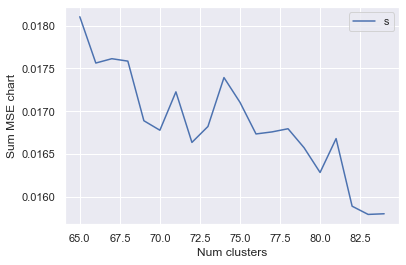

In [189]:
limit=85; start=65; step=6;
x = range(start, limit)
plt.plot(x, sum_mse_values)
plt.xlabel("Num clusters")
plt.ylabel("Sum MSE chart")
plt.legend(("sum_mse_values"), loc='best')
plt.show()

In [89]:
# df_nan_cleared.reset_index()

In [106]:
import pickle
with open("sake_model.pkl", "wb") as file:
    pickle.dump(gauss_mixture, file)